In [23]:
import tensorflow as tf
import foolbox as fb

import eagerpy as ep
import numpy as np
import matplotlib.pyplot as plt
import pickle
from urllib.request import urlopen

import glob
from PIL import Image
import os
from os import path

import time

In [14]:
# load key value pairs for class detection
imagenet_key_value_pairs = pickle.load(urlopen('https://gist.githubusercontent.com/yrevar/6135f1bd8dcf2e0cc683/raw/d133d61a09d7e5a3b36b8c111a8dd5c4b5d560ee/imagenet1000_clsid_to_human.pkl'))

In [15]:
# preprocess image for foolbox
def preprocess(image):
    image = tf.cast(image, tf.float32)
    image = tf.image.resize(image, (224, 224))
    if image.shape[-1] == 1:
        image = tf.image.grayscale_to_rgb(image)
    image = image[None, ...]
    return image

In [16]:
# decode predictions number to label
def get_imagenet_label(probs):
  return decode_predictions(probs, top=1)[0][0]
decode_predictions = tf.keras.applications.efficientnet.decode_predictions

In [17]:
# find label idx of prediction
def find_label_id(label):
    for key, value in imagenet_key_value_pairs.items():
        if label in value:
            return key

In [18]:
# Keras Applications are canned architectures with pre-trained weights.
pretrained_model = tf.keras.applications.EfficientNetB0(weights='imagenet') 
preprocessing = dict()
bounds = (0, 255)

# tensorflow model into foolbox model
fmodel = fb.TensorFlowModel(pretrained_model, bounds=bounds, preprocessing=preprocessing)

Model accuracy on sample images: 1.0


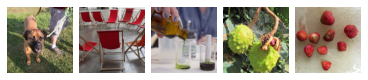

In [19]:
# optionally transform the bounds of the input space of our model
fmodel = fmodel.transform_bounds((0, 1))

# sample images
images, labels = fb.utils.samples(fmodel, dataset='imagenet', batchsize=5)

# check accuracy on sample images and plot them
accuracy = fb.utils.accuracy(fmodel, images, labels)
print('Model accuracy on sample images:', accuracy)
# print(labels)
fb.plot.images(images)
plt.show()
plt.close()

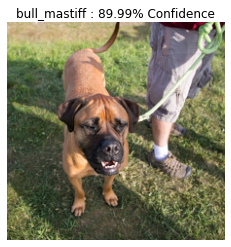

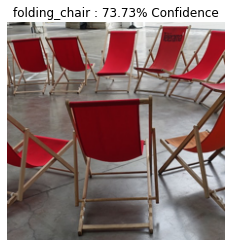

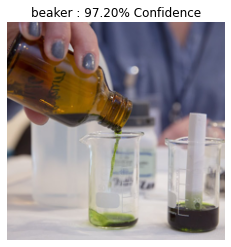

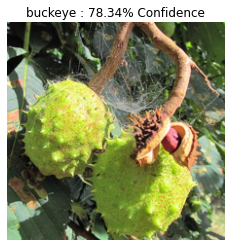

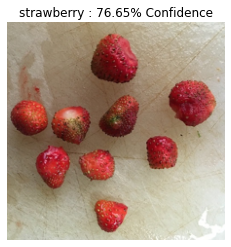

In [20]:
# Predict with pre-trained model
for x in images:
    image = np.expand_dims(x, axis=0)
    image_probs = pretrained_model.predict(image*255) # 0,1 to 0,255
    plt.figure()
    plt.imshow(x)  # To change [-1, 1] to [0,1]?
    _, image_class, class_confidence = get_imagenet_label(image_probs)
    plt.title('{} : {:.2f}% Confidence'.format(image_class, class_confidence*100))
    plt.axis('off')
    plt.show()

Adversarial file exists
Adversarial file exists
Adversarial file exists
Adversarial file exists
Adversarial file exists
Adversarial file exists
Adversarial file exists
Adversarial file exists
Adversarial file exists
Adversarial file exists
Adversarial file exists
Adversarial file exists
Images classified as:
000000002153 981 = ballplayer
000000002157 927 = trifle
Min values in image-array: 0.0 Max values in image-array: 254.80469
Min values in image-array: 0.0 Max values in image-array: 0.9992341
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


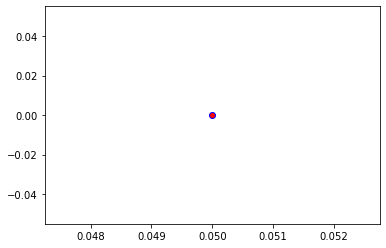

Crafting adversarial images took: 7.751725912094116 seconds 

Images classified as:
000000002261 975 = lakeside
000000002299 715 = pickelhaube
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


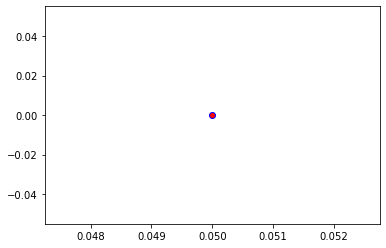

Crafting adversarial images took: 7.743985652923584 seconds 

Images classified as:
000000002431 461 = plate
000000002473 248 = ski
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


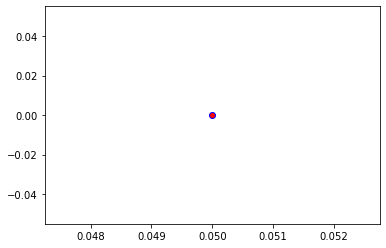

Crafting adversarial images took: 7.801102638244629 seconds 

Images classified as:
000000002532 140 = alp
000000002587 954 = banana
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


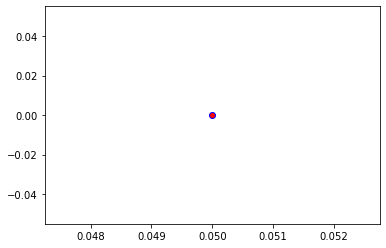

Crafting adversarial images took: 7.796712636947632 seconds 

Images classified as:
000000002592 504 = coffee mug
000000002685 424 = barbershop
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


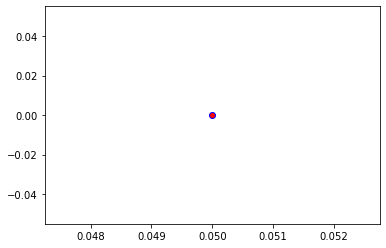

Crafting adversarial images took: 8.004862785339355 seconds 

Images classified as:
000000002923 403 = aircraft carrier
000000003156 861 = toilet seat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


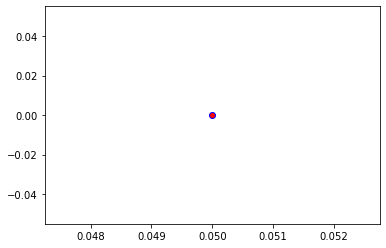

Crafting adversarial images took: 7.7054266929626465 seconds 

Images classified as:
000000003255 140 = alp
000000003501 937 = broccoli
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


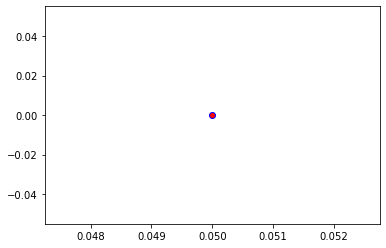

Crafting adversarial images took: 7.749903202056885 seconds 

Images classified as:
000000003553 835 = sundial
000000003661 940 = spaghetti squash
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


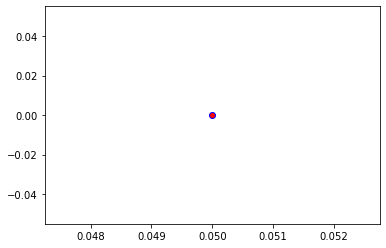

Crafting adversarial images took: 7.846134901046753 seconds 

Images classified as:
000000003845 965 = burrito
000000003934 831 = studio couch
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


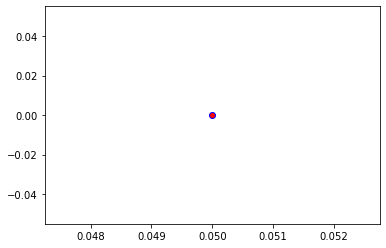

Crafting adversarial images took: 8.031196355819702 seconds 

Images classified as:
000000004134 906 = Windsor tie
000000004395 906 = Windsor tie
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


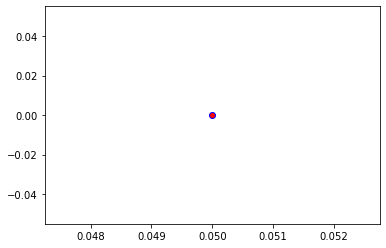

Crafting adversarial images took: 9.003695249557495 seconds 

Images classified as:
000000004495 831 = studio couch
000000004765 693 = paddle
Min values in image-array: 0.0 Max values in image-array: 254.87741
Min values in image-array: 0.0 Max values in image-array: 0.9995192
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


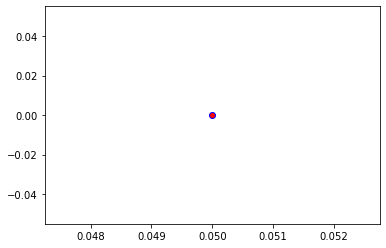

Crafting adversarial images took: 8.146984815597534 seconds 

Images classified as:
000000004795 508 = computer keyboard
000000005001 830 = stretcher
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


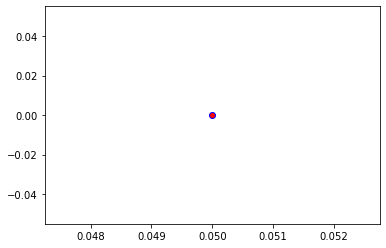

Crafting adversarial images took: 8.142555475234985 seconds 

Images classified as:
000000005037 829 = streetcar
000000005060 564 = four-poster
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


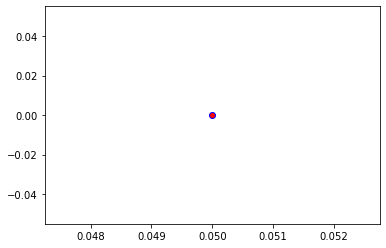

Crafting adversarial images took: 7.9442503452301025 seconds 

Images classified as:
000000005193 747 = punching bag
000000005477 404 = airliner
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


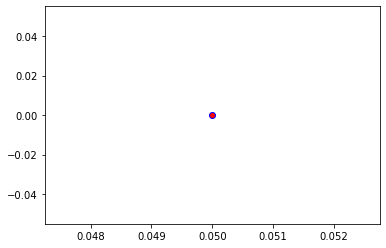

Crafting adversarial images took: 7.872873544692993 seconds 

Images classified as:
000000005503 861 = toilet seat
000000005529 248 = ski
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


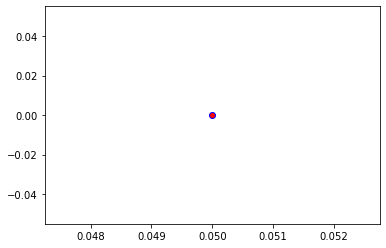

Crafting adversarial images took: 8.015661001205444 seconds 

Images classified as:
000000005586 416 = balance beam
000000005600 941 = acorn squash
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


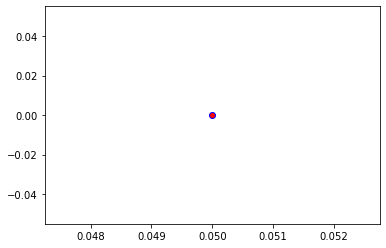

Crafting adversarial images took: 7.979643106460571 seconds 

Images classified as:
000000005992 5 = ram
000000006012 954 = banana
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


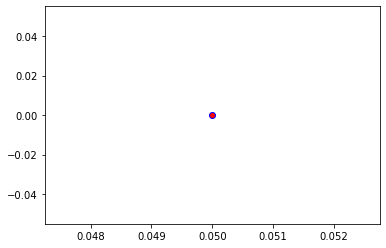

Crafting adversarial images took: 8.206707954406738 seconds 

Images classified as:
000000006040 829 = streetcar
000000006213 648 = medicine chest
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


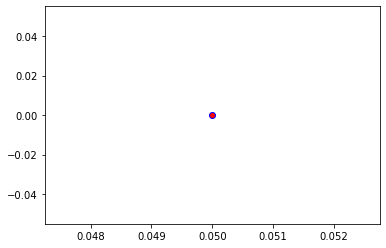

Crafting adversarial images took: 8.560708045959473 seconds 

Images classified as:
000000006460 864 = wreck
000000006471 981 = ballplayer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


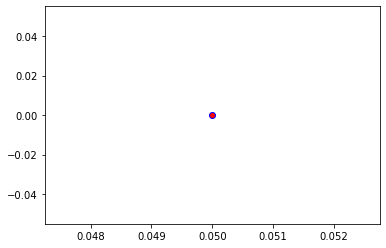

Crafting adversarial images took: 7.973664283752441 seconds 

Images classified as:
000000006614 995 = earthstar
000000006723 743 = prison
Min values in image-array: 0.26849502 Max values in image-array: 255.0
Min values in image-array: 0.0010529216 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


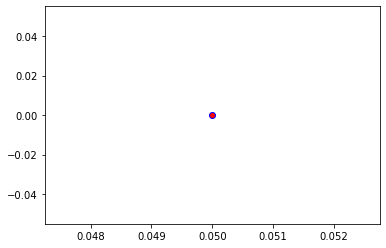

Crafting adversarial images took: 7.916871786117554 seconds 

Images classified as:
000000006763 457 = bow tie
000000006771 862 = torch
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


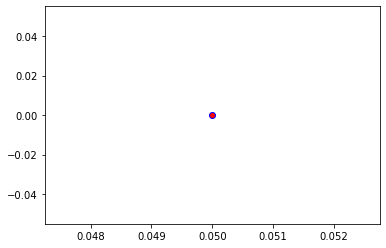

Crafting adversarial images took: 7.873315334320068 seconds 

Images classified as:
000000006818 999 = toilet tissue
000000006894 385 = Indian elephant
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


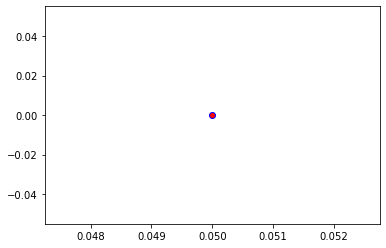

Crafting adversarial images took: 7.891341209411621 seconds 

Images classified as:
000000006954 768 = rugby ball
000000007088 879 = umbrella
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


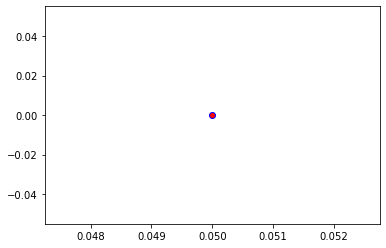

Crafting adversarial images took: 7.93359112739563 seconds 

Images classified as:
000000007108 386 = African elephant
000000007278 693 = paddle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


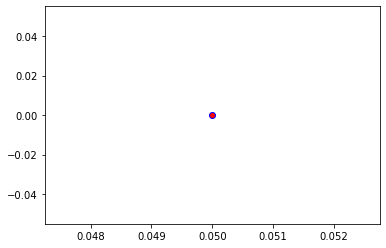

Crafting adversarial images took: 8.048374652862549 seconds 

Images classified as:
000000007281 173 = Ibizan hound
000000007386 870 = tricycle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


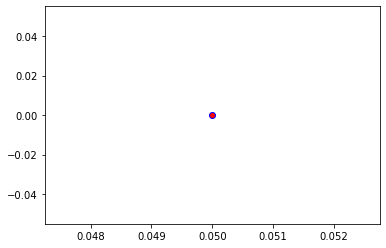

Crafting adversarial images took: 7.97865104675293 seconds 

Images classified as:
000000007511 977 = sandbar
000000007574 651 = microwave
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


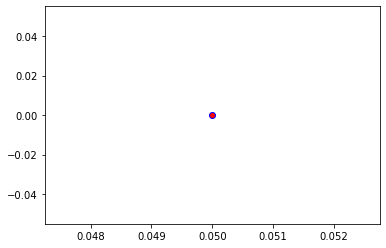

Crafting adversarial images took: 8.077051162719727 seconds 

Images classified as:
000000007784 701 = parachute
000000007795 831 = studio couch
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


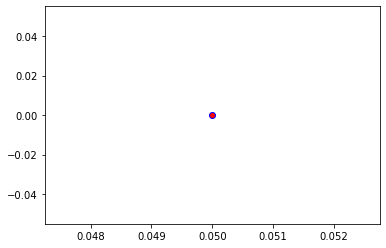

Crafting adversarial images took: 7.944352149963379 seconds 

Images classified as:
000000007816 518 = crash helmet
000000007818 532 = dining table
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


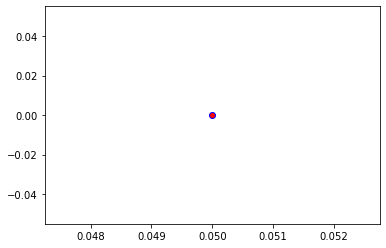

Crafting adversarial images took: 7.956636667251587 seconds 

Images classified as:
000000007888 448 = birdhouse
000000007977 478 = carton
Min values in image-array: 0.0 Max values in image-array: 254.55626
Min values in image-array: 0.0 Max values in image-array: 0.99825984
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


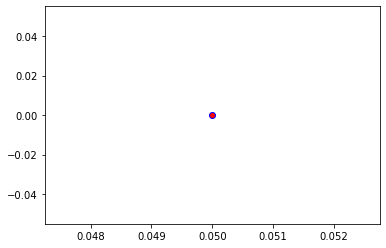

Crafting adversarial images took: 7.977446794509888 seconds 

Images classified as:
000000007991 942 = butternut squash
000000008021 639 = suit
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


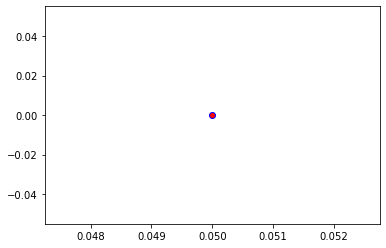

Crafting adversarial images took: 7.969997406005859 seconds 

Images classified as:
000000008211 603 = horse cart
000000008277 924 = guacamole
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


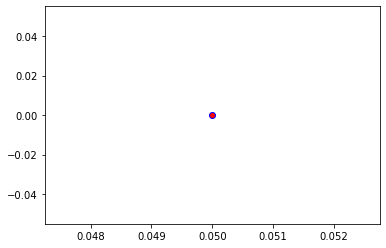

Crafting adversarial images took: 8.004578351974487 seconds 

Images classified as:
000000008532 906 = Windsor tie
000000008629 940 = spaghetti squash
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


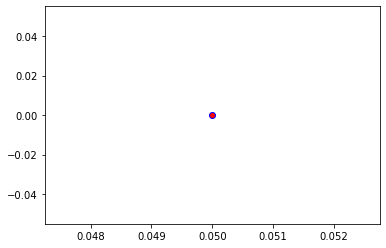

Crafting adversarial images took: 7.954796552658081 seconds 

Images classified as:
000000008690 227 = kelpie
000000008762 920 = traffic light
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


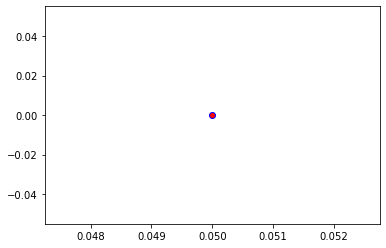

Crafting adversarial images took: 8.055426836013794 seconds 

Images classified as:
000000008844 954 = banana
000000008899 424 = barbershop
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


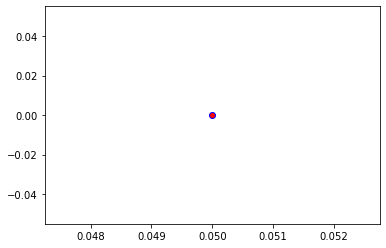

Crafting adversarial images took: 7.920424699783325 seconds 

Images classified as:
000000009378 793 = shower cap
000000009400 620 = laptop
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


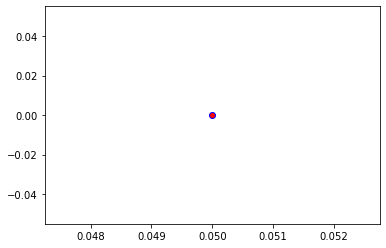

Crafting adversarial images took: 7.933351516723633 seconds 

Images classified as:
000000009448 879 = umbrella
000000009483 527 = desktop computer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


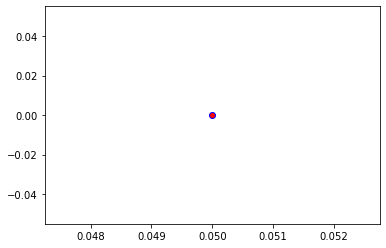

Crafting adversarial images took: 7.953498601913452 seconds 

Images classified as:
000000009590 762 = restaurant
000000009769 803 = snowplow
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


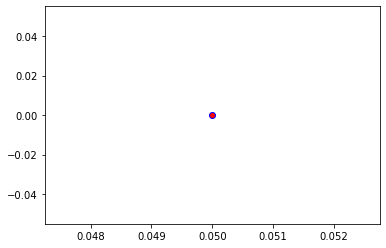

Crafting adversarial images took: 8.109297275543213 seconds 

Images classified as:
000000009772 435 = bathtub
000000009891 830 = stretcher
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


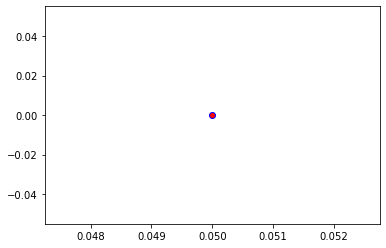

Crafting adversarial images took: 7.938915967941284 seconds 

Images classified as:
000000009914 933 = cheeseburger
000000010092 669 = mosquito net
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


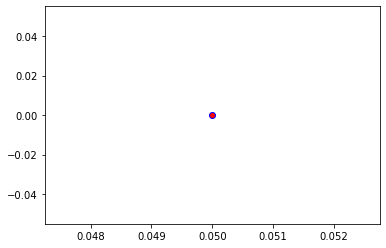

Crafting adversarial images took: 7.9359331130981445 seconds 

Images classified as:
000000010363 287 = lynx
000000010583 461 = plate
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


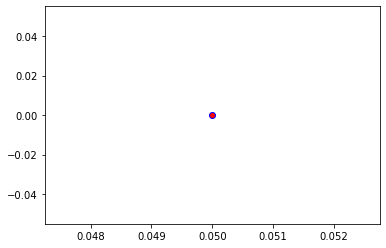

Crafting adversarial images took: 7.924793004989624 seconds 

Images classified as:
000000010707 731 = plunger
000000010764 981 = ballplayer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


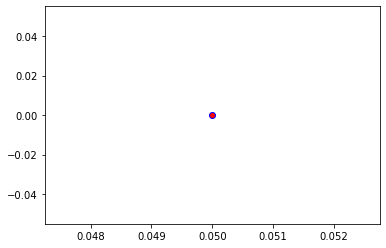

Crafting adversarial images took: 7.927561521530151 seconds 

Images classified as:
000000010977 648 = medicine chest
000000010995 894 = wardrobe
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


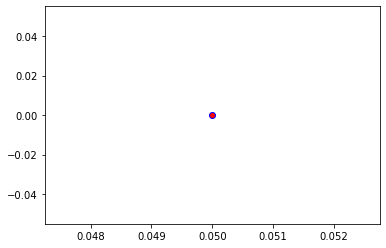

Crafting adversarial images took: 7.918997049331665 seconds 

Images classified as:
000000011051 639 = suit
000000011122 489 = chainlink fence
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


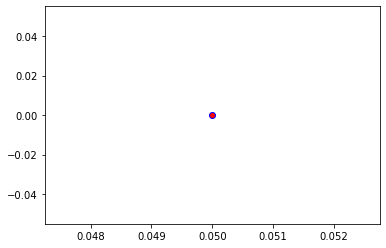

Crafting adversarial images took: 8.09932827949524 seconds 

Images classified as:
000000011149 870 = tricycle
000000011197 704 = parking meter
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


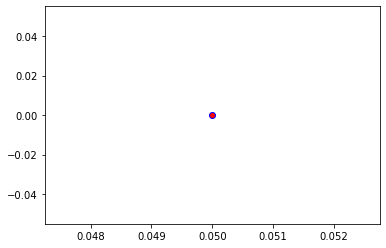

Crafting adversarial images took: 7.942233085632324 seconds 

Images classified as:
000000011511 568 = fur coat
000000011615 919 = street sign
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


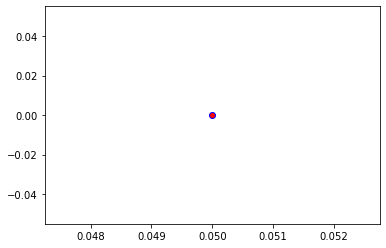

Crafting adversarial images took: 7.9836342334747314 seconds 

Images classified as:
000000011699 882 = vacuum
000000011760 340 = zebra
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


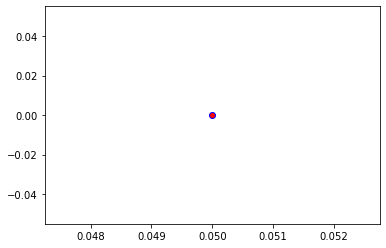

Crafting adversarial images took: 7.9444990158081055 seconds 

Images classified as:
000000011813 872 = tripod
000000012062 5 = ram
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


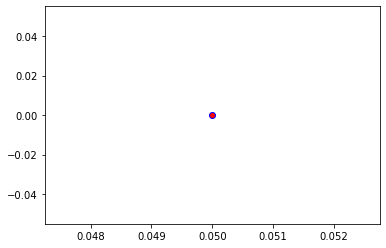

Crafting adversarial images took: 8.133100748062134 seconds 

Images classified as:
000000012120 722 = ping-pong ball
000000012280 799 = sliding door
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


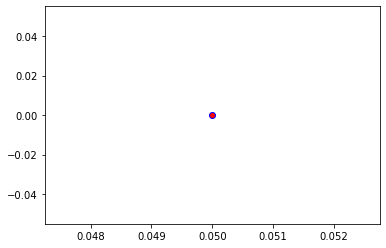

Crafting adversarial images took: 8.129515886306763 seconds 

Images classified as:
000000012576 963 = pizza
000000012639 981 = ballplayer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


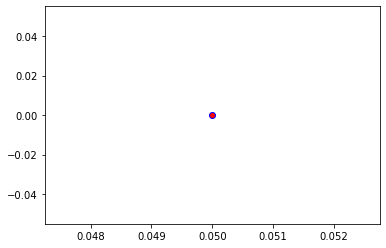

Crafting adversarial images took: 7.982173442840576 seconds 

Images classified as:
000000012667 528 = dial telephone
000000012670 862 = torch
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


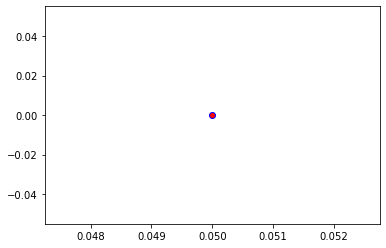

Crafting adversarial images took: 10.467666387557983 seconds 

Images classified as:
000000012748 339 = sorrel
000000013004 461 = plate
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


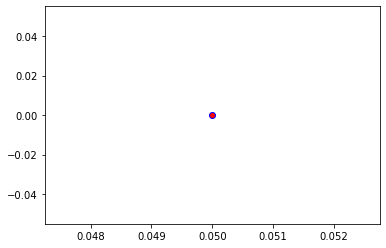

Crafting adversarial images took: 8.279932498931885 seconds 

Images classified as:
000000013177 535 = disk brake
000000013201 880 = unicycle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


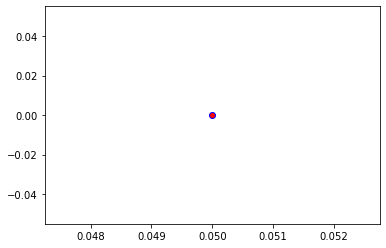

Crafting adversarial images took: 8.303050994873047 seconds 

Images classified as:
000000013291 805 = soccer ball
000000013348 404 = airliner
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


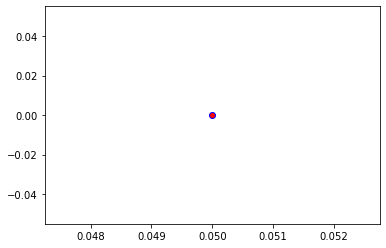

Crafting adversarial images took: 8.265827655792236 seconds 

Images classified as:
000000013546 880 = unicycle
000000013597 960 = chocolate sauce
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


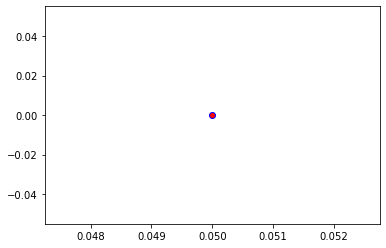

Crafting adversarial images took: 8.031283617019653 seconds 

Images classified as:
000000013659 624 = library
000000013729 655 = miniskirt
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


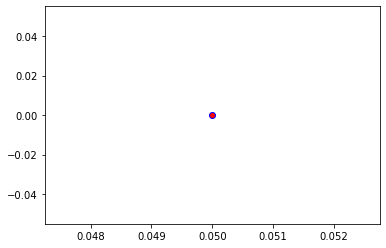

Crafting adversarial images took: 8.018637895584106 seconds 

Images classified as:
000000013774 417 = balloon
000000013923 532 = dining table
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


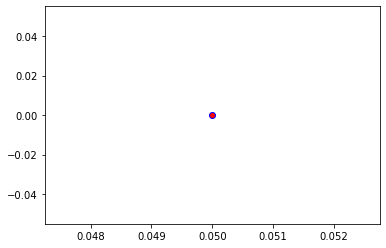

Crafting adversarial images took: 8.032840967178345 seconds 

Images classified as:
000000014007 861 = toilet seat
000000014038 532 = dining table
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


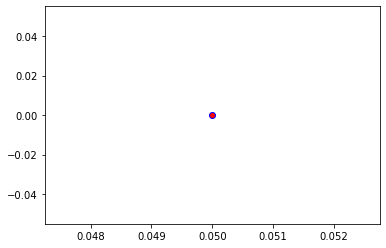

Crafting adversarial images took: 7.988620758056641 seconds 

Images classified as:
000000014226 681 = notebook
000000014380 839 = suspension bridge
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


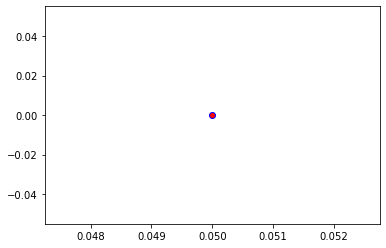

Crafting adversarial images took: 7.924816131591797 seconds 

Images classified as:
000000014439 701 = parachute
000000014473 565 = freight car
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


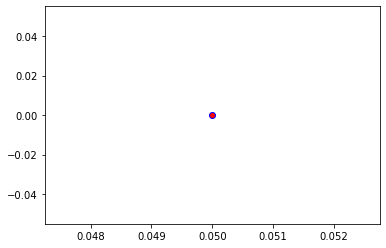

Crafting adversarial images took: 8.179546117782593 seconds 

Images classified as:
000000014831 283 = Persian cat
000000014888 229 = Old English sheepdog
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


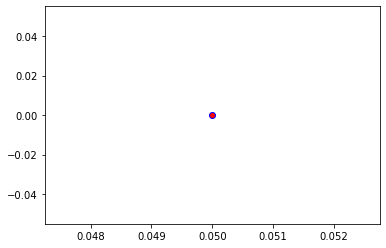

Crafting adversarial images took: 8.041537523269653 seconds 

Images classified as:
000000015079 928 = ice cream
000000015254 962 = meat loaf
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


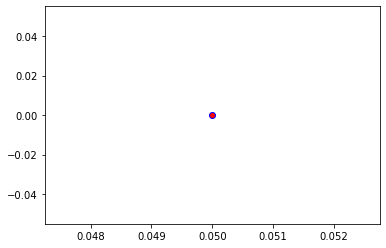

Crafting adversarial images took: 8.903701543807983 seconds 

Images classified as:
000000015272 920 = traffic light
000000015278 937 = broccoli
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


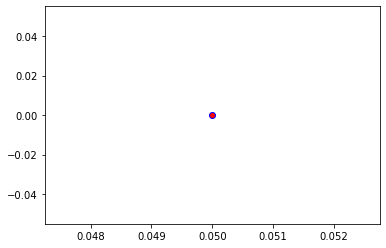

Crafting adversarial images took: 8.049059629440308 seconds 

Images classified as:
000000015335 788 = shoe shop
000000015338 829 = streetcar
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


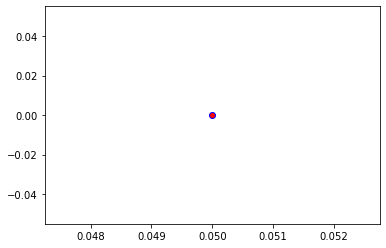

Crafting adversarial images took: 7.997655630111694 seconds 

Images classified as:
000000015440 919 = street sign
000000015497 673 = mouse
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


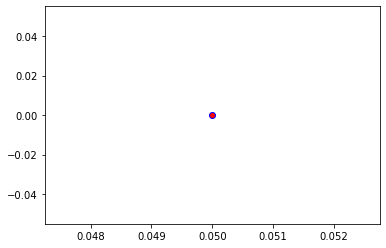

Crafting adversarial images took: 8.007865190505981 seconds 

Images classified as:
000000015517 404 = liner
000000015597 830 = stretcher
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


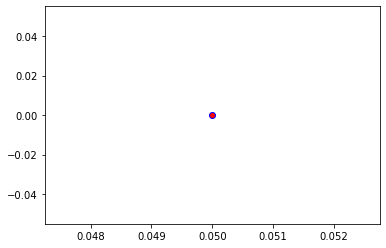

Crafting adversarial images took: 8.218477010726929 seconds 

Images classified as:
000000015660 977 = sandbar
000000015746 471 = cannon
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


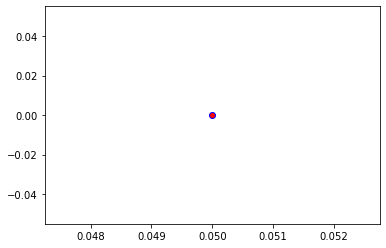

Crafting adversarial images took: 8.438025712966919 seconds 

Images classified as:
000000015751 113 = nail
000000015956 339 = sorrel
Min values in image-array: 0.23102522 Max values in image-array: 255.0
Min values in image-array: 0.00090598123 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


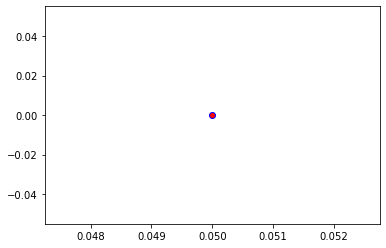

Crafting adversarial images took: 8.054503679275513 seconds 

Images classified as:
000000016010 346 = water buffalo
000000016228 779 = school bus
Min values in image-array: 0.07988301 Max values in image-array: 254.92255
Min values in image-array: 0.0003132667 Max values in image-array: 0.99969625
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


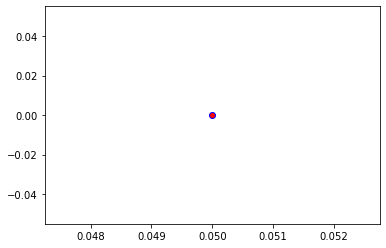

Crafting adversarial images took: 8.017513751983643 seconds 

Images classified as:
000000016249 424 = barbershop
000000016439 526 = desk
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


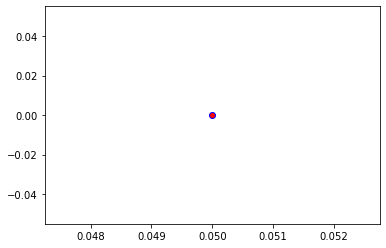

Crafting adversarial images took: 7.996603727340698 seconds 

Images classified as:
000000016451 978 = seashore
000000016502 336 = marmot
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


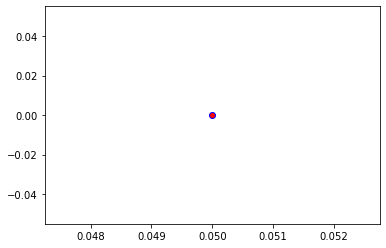

Crafting adversarial images took: 8.04751968383789 seconds 

Images classified as:
000000016598 504 = coffee mug
000000016958 556 = fire screen
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


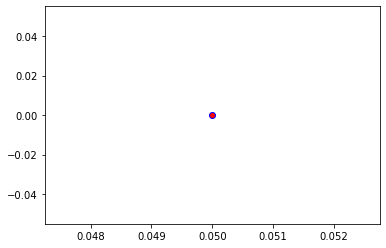

Crafting adversarial images took: 8.184231758117676 seconds 

Images classified as:
000000017029 220 = Sussex spaniel
000000017031 246 = Great Dane
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


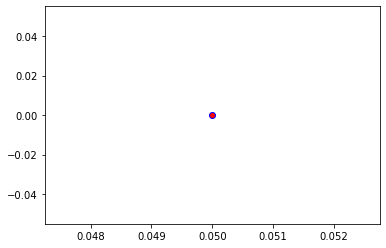

Crafting adversarial images took: 7.995250940322876 seconds 

Images classified as:
000000017115 340 = zebra
000000017178 386 = African elephant
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


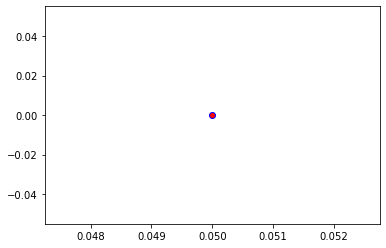

Crafting adversarial images took: 8.057972192764282 seconds 

Images classified as:
000000017182 526 = desk
000000017207 675 = moving van
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


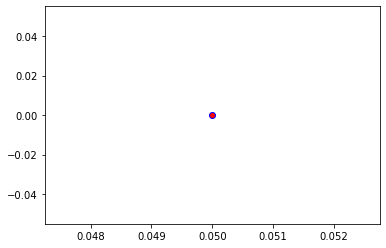

Crafting adversarial images took: 8.04490327835083 seconds 

Images classified as:
000000017379 598 = home theater
000000017436 442 = bell cote
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


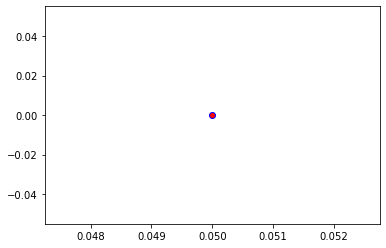

Crafting adversarial images took: 8.465152740478516 seconds 

Images classified as:
000000017627 874 = trolleybus
000000017714 965 = burrito
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


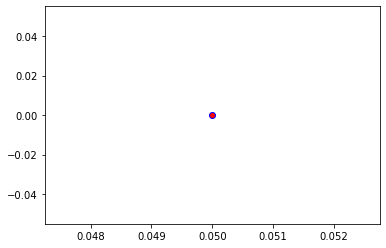

Crafting adversarial images took: 8.011618375778198 seconds 

Images classified as:
000000017899 961 = dough
000000017905 920 = traffic light
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


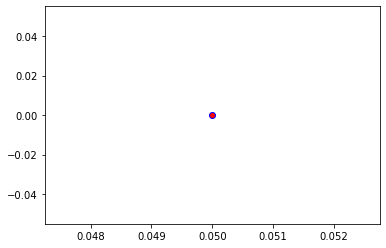

Crafting adversarial images took: 8.012669801712036 seconds 

Images classified as:
000000017959 701 = parachute
000000018150 929 = ice lolly
Min values in image-array: 0.0 Max values in image-array: 254.95648
Min values in image-array: 0.0 Max values in image-array: 0.99982935
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


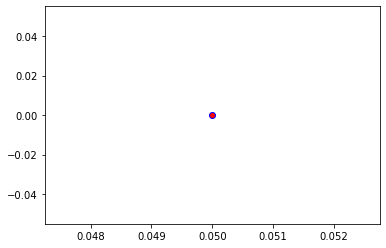

Crafting adversarial images took: 8.253101587295532 seconds 

Images classified as:
000000018193 902 = whistle
000000018380 461 = plate
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


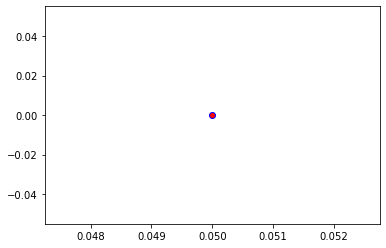

Crafting adversarial images took: 8.048386812210083 seconds 

Images classified as:
000000018491 981 = ballplayer
000000018519 880 = unicycle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


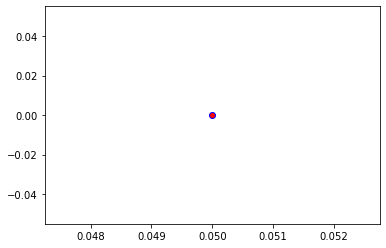

Crafting adversarial images took: 8.001890659332275 seconds 

Images classified as:
000000018575 461 = plate
000000018737 665 = moped
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


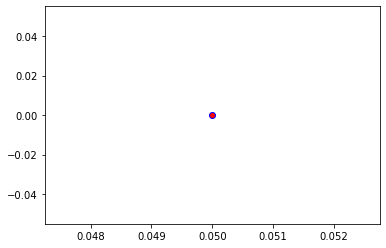

Crafting adversarial images took: 7.99647331237793 seconds 

Images classified as:
000000018770 639 = suit
000000018833 770 = running shoe
Min values in image-array: 0.0 Max values in image-array: 254.86128
Min values in image-array: 0.0 Max values in image-array: 0.999456
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


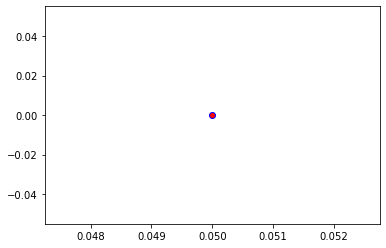

Crafting adversarial images took: 8.214486598968506 seconds 

Images classified as:
000000018837 569 = garbage truck
000000019042 137 = American coot
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


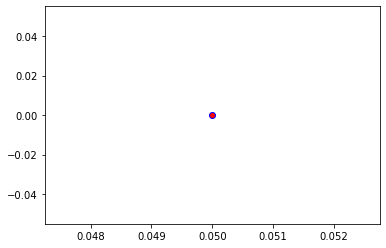

Crafting adversarial images took: 8.025058507919312 seconds 

Images classified as:
000000019109 670 = motor scooter
000000019221 937 = broccoli
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


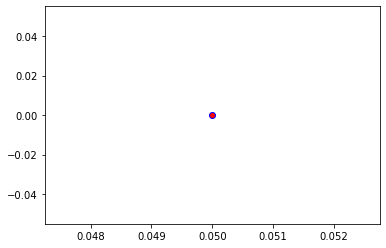

Crafting adversarial images took: 7.98961329460144 seconds 

Images classified as:
000000019402 568 = fur coat
000000019432 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


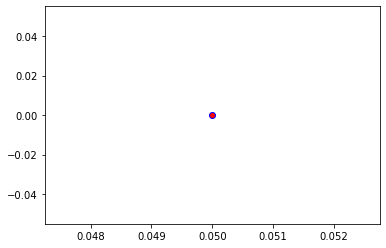

Crafting adversarial images took: 8.169280529022217 seconds 

Images classified as:
000000019742 883 = vase
000000019786 456 = bow
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


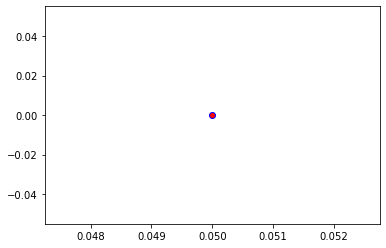

Crafting adversarial images took: 7.979306697845459 seconds 

Images classified as:
000000019924 515 = cowboy hat
000000020059 340 = zebra
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


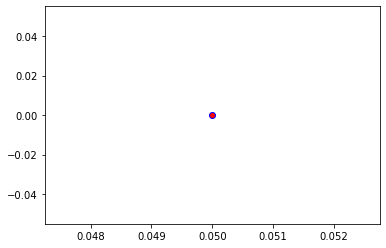

Crafting adversarial images took: 8.016342639923096 seconds 

Images classified as:
000000020107 412 = ashcan
000000020247 294 = brown bear
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


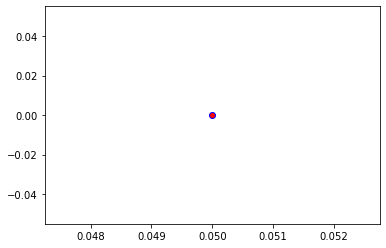

Crafting adversarial images took: 8.392210483551025 seconds 

Images classified as:
000000020333 463 = bucket
000000020553 830 = stretcher
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


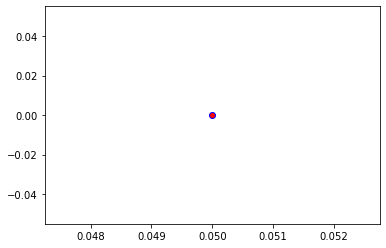

Crafting adversarial images took: 8.260887384414673 seconds 

Images classified as:
000000020571 536 = dock
000000020992 934 = hotdog
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


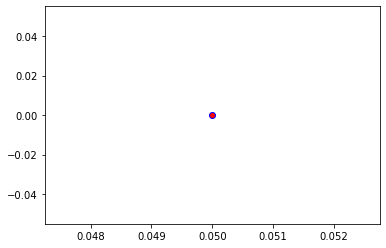

Crafting adversarial images took: 8.026731967926025 seconds 

Images classified as:
000000021167 639 = suit
000000021465 648 = medicine chest
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


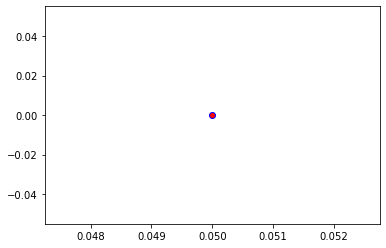

Crafting adversarial images took: 8.310266733169556 seconds 

Images classified as:
000000021503 961 = dough
000000021604 906 = Windsor tie
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


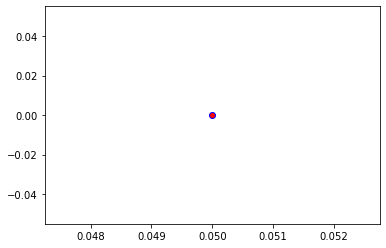

Crafting adversarial images took: 7.901700019836426 seconds 

Images classified as:
000000021839 880 = unicycle
000000021879 842 = swimming trunks
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


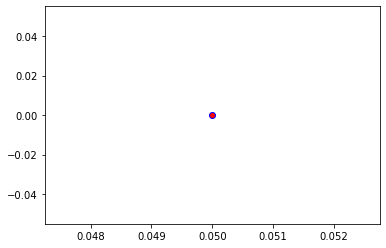

Crafting adversarial images took: 7.666203022003174 seconds 

Images classified as:
000000021903 385 = Indian elephant
000000022192 171 = Italian greyhound
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


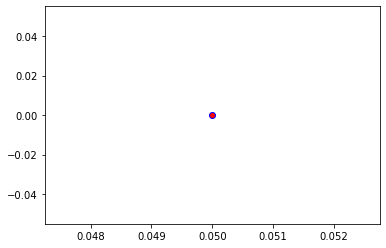

Crafting adversarial images took: 7.728018045425415 seconds 

Images classified as:
000000022371 681 = notebook
000000022396 404 = airliner
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


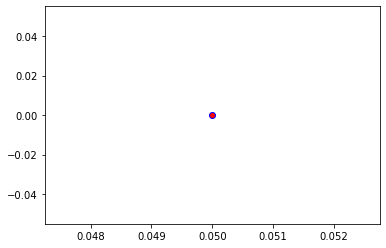

Crafting adversarial images took: 7.792511224746704 seconds 

Images classified as:
000000022479 354 = Arabian camel
000000022589 5 = ram
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


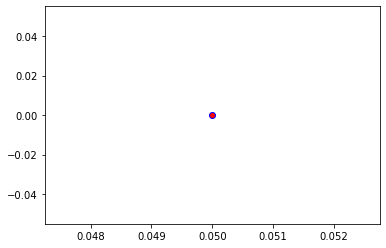

Crafting adversarial images took: 7.764034986495972 seconds 

Images classified as:
000000022623 761 = remote control
000000022705 655 = miniskirt
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


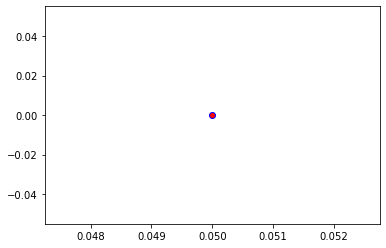

Crafting adversarial images took: 7.708373785018921 seconds 

Images classified as:
000000022755 475 = car mirror
000000022892 105 = koala
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


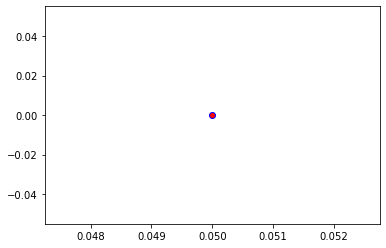

Crafting adversarial images took: 7.728018522262573 seconds 

Images classified as:
000000022935 890 = volleyball
000000022969 355 = llama
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


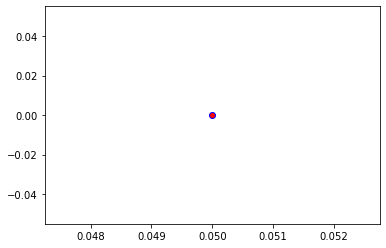

Crafting adversarial images took: 8.020415306091309 seconds 

Images classified as:
000000023023 588 = hamper
000000023034 603 = horse cart
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


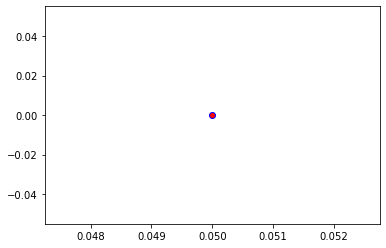

Crafting adversarial images took: 7.686266899108887 seconds 

Images classified as:
000000023126 523 = crutch
000000023230 99 = goose
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


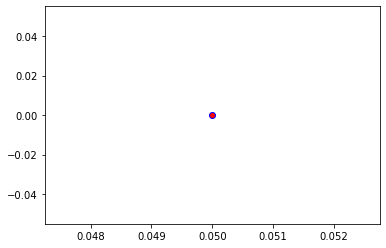

Crafting adversarial images took: 7.722011566162109 seconds 

Images classified as:
000000023272 568 = fur coat
000000023359 248 = ski
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


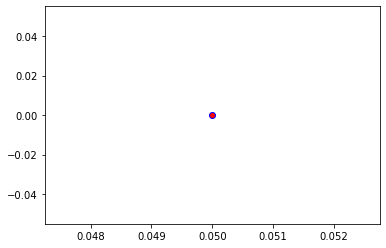

Crafting adversarial images took: 7.75635838508606 seconds 

Images classified as:
000000023666 896 = washbasin
000000023751 405 = airship
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


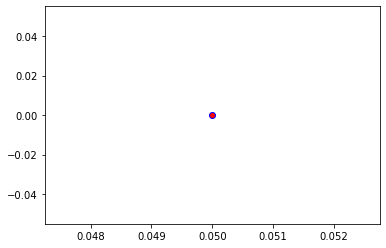

Crafting adversarial images took: 7.933406114578247 seconds 

Images classified as:
000000023781 329 = cucumber
000000023899 520 = crib
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


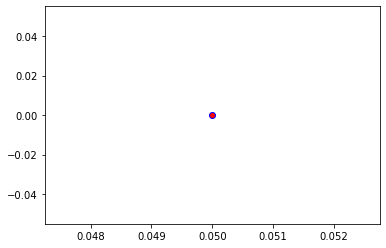

Crafting adversarial images took: 7.833768606185913 seconds 

Images classified as:
000000023937 294 = brown bear
000000024021 794 = shower curtain
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


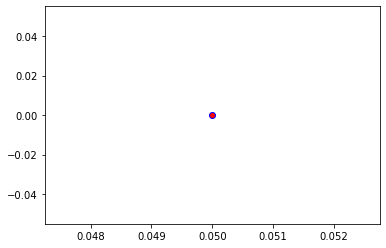

Crafting adversarial images took: 7.924211740493774 seconds 

Images classified as:
000000024027 557 = flagpole
000000024144 963 = pizza
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


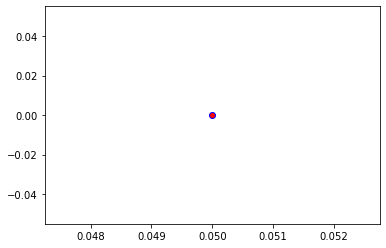

Crafting adversarial images took: 7.907840967178345 seconds 

Images classified as:
000000024243 480 = cash machine
000000024567 0 = tench
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


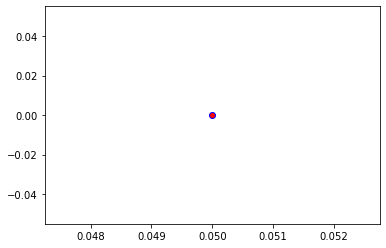

Crafting adversarial images took: 7.724888563156128 seconds 

Images classified as:
000000024610 453 = bookcase
000000024919 386 = African elephant
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


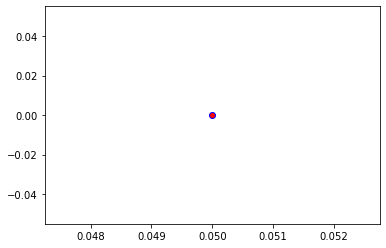

Crafting adversarial images took: 7.7775115966796875 seconds 

Images classified as:
000000025057 541 = drum
000000025096 611 = jigsaw puzzle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


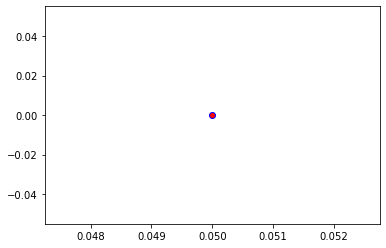

Crafting adversarial images took: 7.742002248764038 seconds 

Images classified as:
000000025139 340 = zebra
000000025181 705 = passenger car
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


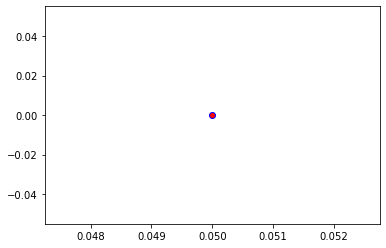

Crafting adversarial images took: 8.019131660461426 seconds 

Images classified as:
000000025228 980 = volcano
000000025386 470 = candle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


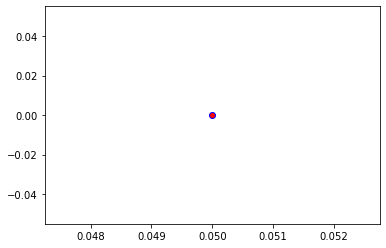

Crafting adversarial images took: 7.7071533203125 seconds 

Images classified as:
000000025393 617 = lab coat
000000025394 647 = measuring cup
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


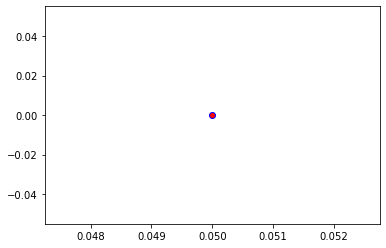

Crafting adversarial images took: 7.753229856491089 seconds 

Images classified as:
000000025424 752 = racket
000000025560 851 = television
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


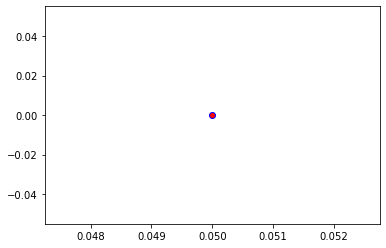

Crafting adversarial images took: 7.743890285491943 seconds 

Images classified as:
000000025593 919 = street sign
000000025603 454 = bookshop
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


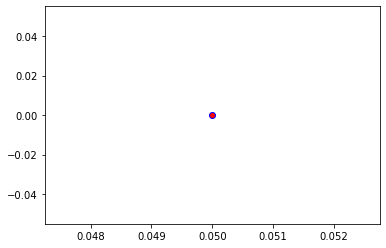

Crafting adversarial images took: 7.697770357131958 seconds 

Images classified as:
000000025986 461 = plate
000000026204 734 = police van
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


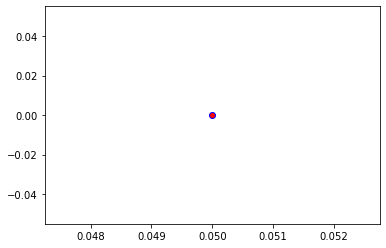

Crafting adversarial images took: 7.692498683929443 seconds 

Images classified as:
000000026465 620 = laptop
000000026564 526 = desk
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


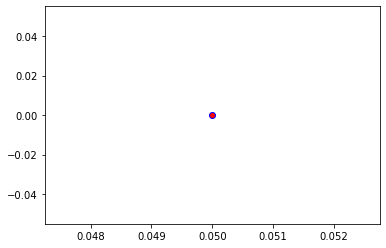

Crafting adversarial images took: 7.866922616958618 seconds 

Images classified as:
000000026690 602 = horizontal bar
000000026926 637 = mailbox
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


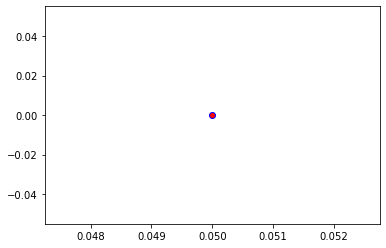

Crafting adversarial images took: 7.793183088302612 seconds 

Images classified as:
000000026941 856 = thresher
000000027186 697 = pajama
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


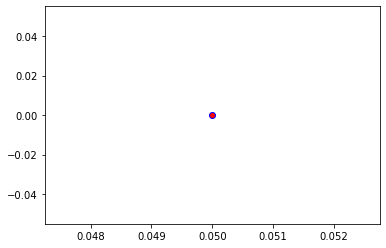

Crafting adversarial images took: 7.733951807022095 seconds 

Images classified as:
000000027620 526 = desk
000000027696 959 = carbonara
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


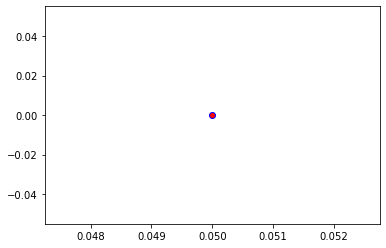

Crafting adversarial images took: 7.906689643859863 seconds 

Images classified as:
000000027768 874 = trolleybus
000000027932 518 = crash helmet
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


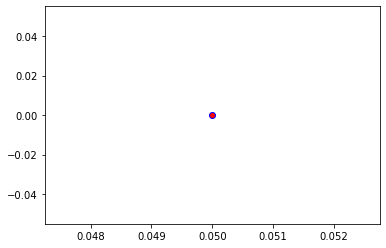

Crafting adversarial images took: 7.752254962921143 seconds 

Images classified as:
000000027972 472 = canoe
000000027982 861 = toilet seat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


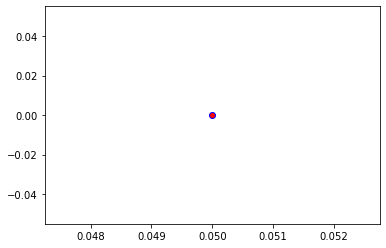

Crafting adversarial images took: 7.8733038902282715 seconds 

Images classified as:
000000028285 538 = dome
000000028449 386 = African elephant
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


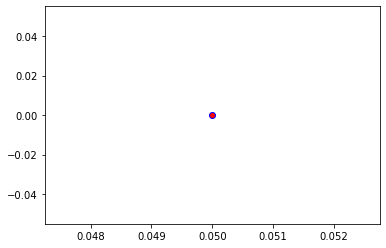

Crafting adversarial images took: 7.911952495574951 seconds 

Images classified as:
000000028452 760 = refrigerator
000000028809 954 = banana
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


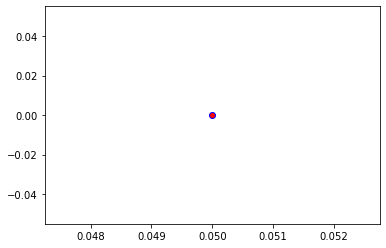

Crafting adversarial images took: 7.631565093994141 seconds 

Images classified as:
000000028993 412 = ashcan
000000029187 603 = horse cart
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


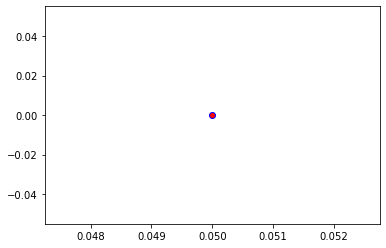

Crafting adversarial images took: 7.778374910354614 seconds 

Images classified as:
000000029393 159 = Rhodesian ridgeback
000000029397 519 = crate
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


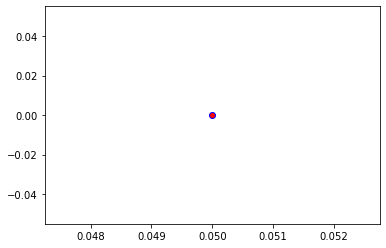

Crafting adversarial images took: 7.886792182922363 seconds 

Images classified as:
000000029596 831 = studio couch
000000029640 937 = broccoli
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


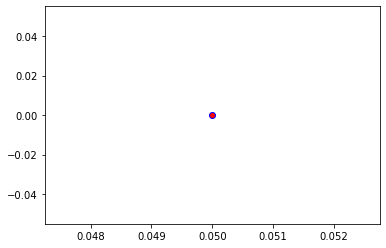

Crafting adversarial images took: 7.793399810791016 seconds 

Images classified as:
000000029675 934 = hotdog
000000029984 879 = umbrella
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


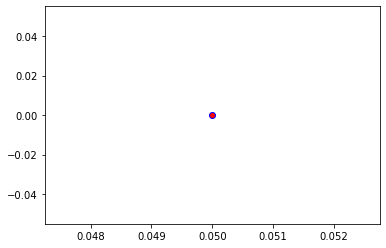

Crafting adversarial images took: 7.69614577293396 seconds 

Images classified as:
000000030213 532 = dining table
000000030494 250 = Siberian husky
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


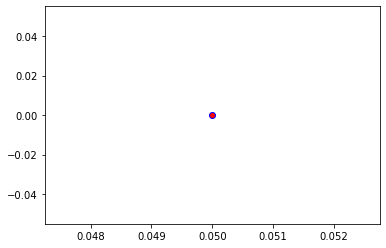

Crafting adversarial images took: 7.84339714050293 seconds 

Images classified as:
000000030504 248 = ski
000000030675 565 = freight car
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


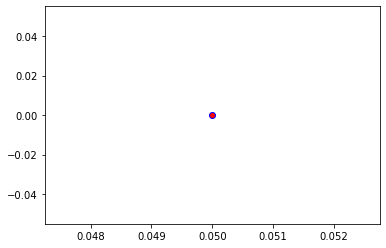

Crafting adversarial images took: 7.7135138511657715 seconds 

Images classified as:
000000030785 924 = guacamole
000000030828 703 = park bench
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


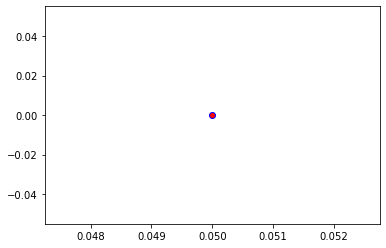

Crafting adversarial images took: 7.734300136566162 seconds 

Images classified as:
000000031050 883 = vase
000000031093 807 = solar dish
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


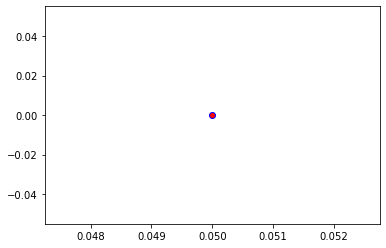

Crafting adversarial images took: 7.715259552001953 seconds 

Images classified as:
000000031118 839 = suspension bridge
000000031217 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


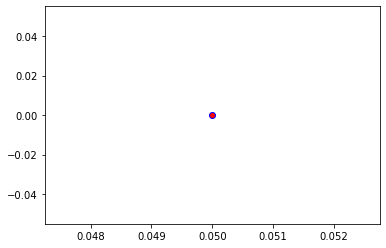

Crafting adversarial images took: 8.010571241378784 seconds 

Images classified as:
000000031248 431 = bassinet
000000031269 340 = zebra
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


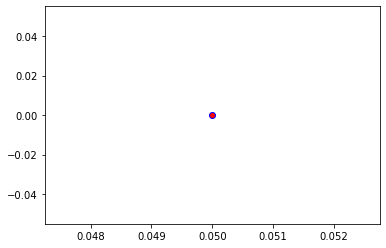

Crafting adversarial images took: 7.765177965164185 seconds 

Images classified as:
000000031296 762 = restaurant
000000031322 132 = American egret
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


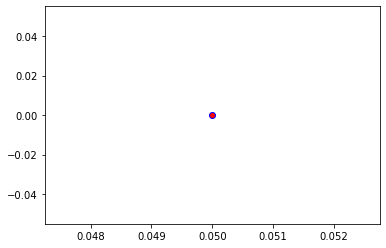

Crafting adversarial images took: 7.861139535903931 seconds 

Images classified as:
000000031620 669 = mosquito net
000000031735 762 = restaurant
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


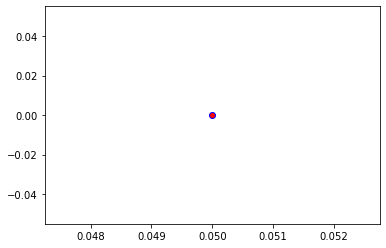

Crafting adversarial images took: 7.755455017089844 seconds 

Images classified as:
000000031749 409 = analog clock
000000031817 830 = stretcher
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


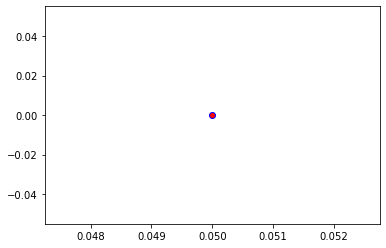

Crafting adversarial images took: 7.718446969985962 seconds 

Images classified as:
000000032038 963 = pizza
000000032081 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


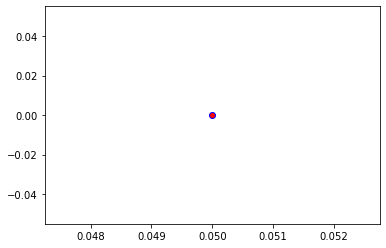

Crafting adversarial images took: 7.7562220096588135 seconds 

Images classified as:
000000032285 794 = shower curtain
000000032334 691 = oxygen mask
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


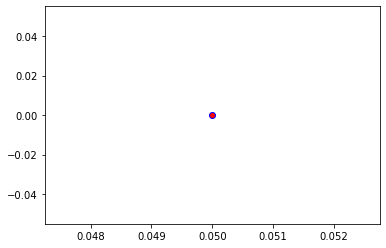

Crafting adversarial images took: 7.916808843612671 seconds 

Images classified as:
000000032570 6 = stingray
000000032610 620 = laptop
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


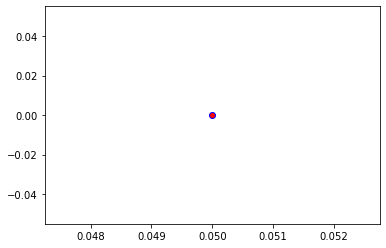

Crafting adversarial images took: 7.768064975738525 seconds 

Images classified as:
000000032735 248 = ski
000000032811 851 = television
Min values in image-array: 0.0 Max values in image-array: 254.94644
Min values in image-array: 0.0 Max values in image-array: 0.99978995
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


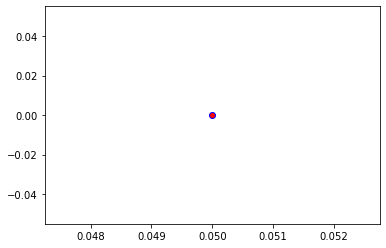

Crafting adversarial images took: 7.82550835609436 seconds 

Images classified as:
000000032817 861 = toilet seat
000000032861 885 = velvet
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


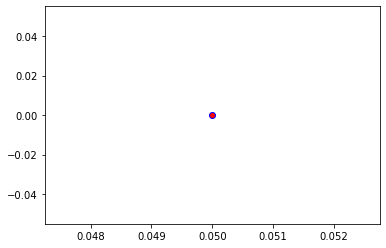

Crafting adversarial images took: 7.733307123184204 seconds 

Images classified as:
000000032887 500 = cliff
000000032901 793 = shower cap
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


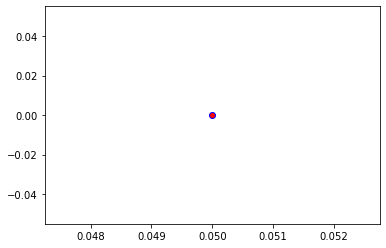

Crafting adversarial images took: 7.72305965423584 seconds 

Images classified as:
000000032941 919 = street sign
000000033005 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


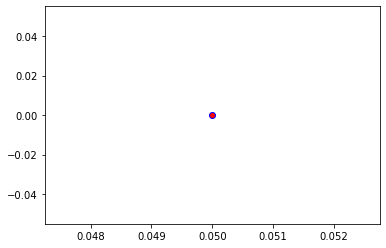

Crafting adversarial images took: 7.885521411895752 seconds 

Images classified as:
000000033104 248 = ski
000000033109 569 = garbage truck
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


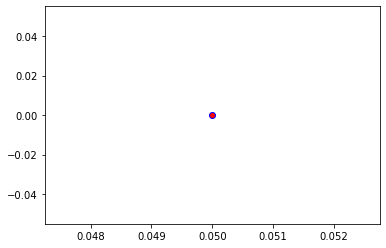

Crafting adversarial images took: 7.697091102600098 seconds 

Images classified as:
000000033114 895 = warplane
000000033221 358 = pole
Min values in image-array: 0.30854404 Max values in image-array: 255.0
Min values in image-array: 0.0012099766 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


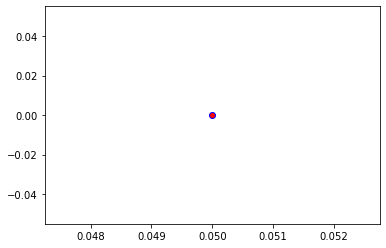

Crafting adversarial images took: 7.725415945053101 seconds 

Images classified as:
000000033368 752 = racket
000000033638 739 = potter's wheel
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


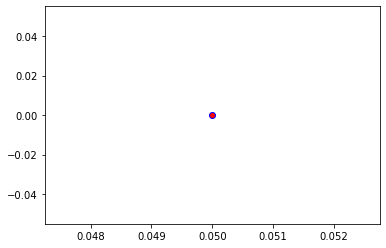

Crafting adversarial images took: 7.767216444015503 seconds 

Images classified as:
000000033707 293 = cheetah
000000033759 429 = baseball
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


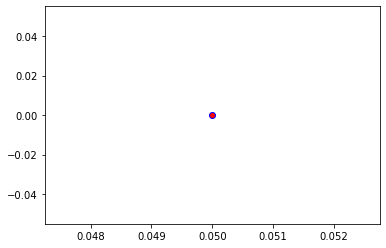

Crafting adversarial images took: 7.720012426376343 seconds 

Images classified as:
000000033854 639 = tank
000000034071 704 = parking meter
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


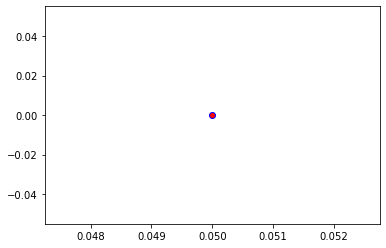

Crafting adversarial images took: 7.789330959320068 seconds 

Images classified as:
000000034139 707 = pay-phone
000000034205 937 = broccoli
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


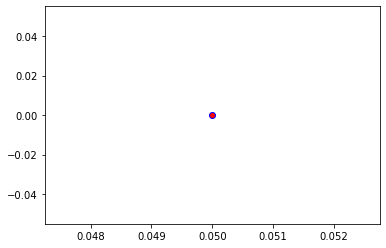

Crafting adversarial images took: 8.096119165420532 seconds 

Images classified as:
000000034257 937 = broccoli
000000034417 415 = bakery
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


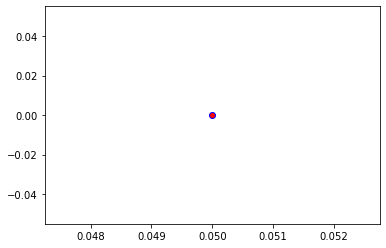

Crafting adversarial images took: 7.743891954421997 seconds 

Images classified as:
000000034452 671 = mountain bike
000000034760 648 = medicine chest
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


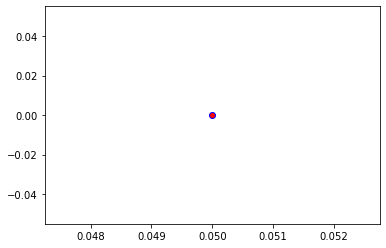

Crafting adversarial images took: 7.76211404800415 seconds 

Images classified as:
000000034873 896 = washbasin
000000035062 885 = velvet
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


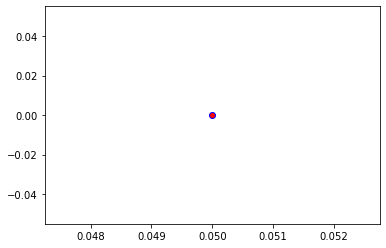

Crafting adversarial images took: 7.893844842910767 seconds 

Images classified as:
000000035197 895 = warplane
000000035279 620 = laptop
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


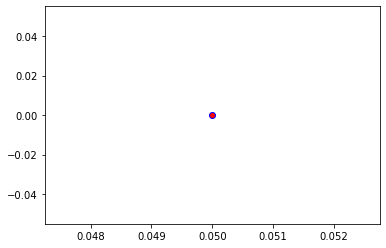

Crafting adversarial images took: 7.638148307800293 seconds 

Images classified as:
000000035326 827 = stove
000000035682 762 = restaurant
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


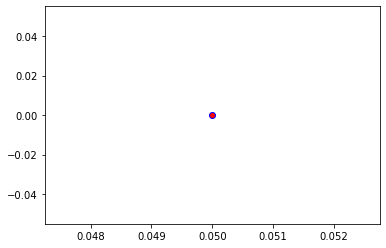

Crafting adversarial images took: 7.854735374450684 seconds 

Images classified as:
000000035770 435 = bathtub
000000035963 708 = pedestal
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


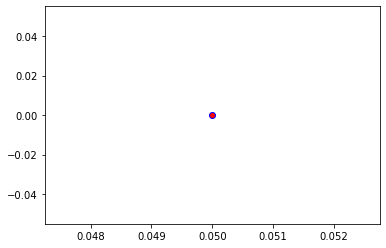

Crafting adversarial images took: 7.7000017166137695 seconds 

Images classified as:
000000036494 762 = restaurant
000000036539 248 = ski
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


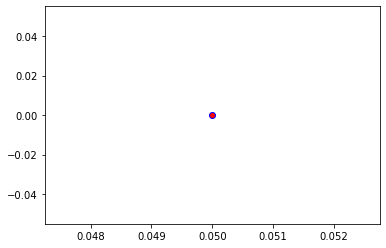

Crafting adversarial images took: 7.817581415176392 seconds 

Images classified as:
000000036660 774 = sandal
000000036678 498 = palace
Min values in image-array: 0.0 Max values in image-array: 254.92331
Min values in image-array: 0.0 Max values in image-array: 0.99969923
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


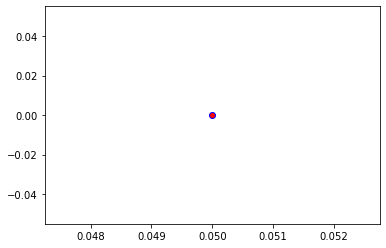

Crafting adversarial images took: 7.874750852584839 seconds 

Images classified as:
000000036844 532 = dining table
000000036861 704 = parking meter
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


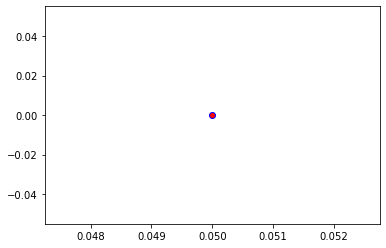

Crafting adversarial images took: 7.709233045578003 seconds 

Images classified as:
000000036936 851 = television
000000037670 861 = toilet seat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


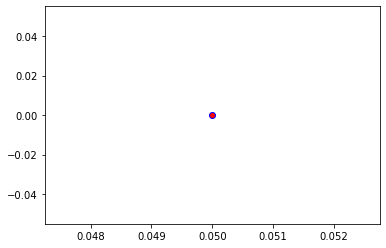

Crafting adversarial images took: 7.728316783905029 seconds 

Images classified as:
000000037689 248 = ski
000000037740 526 = desk
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


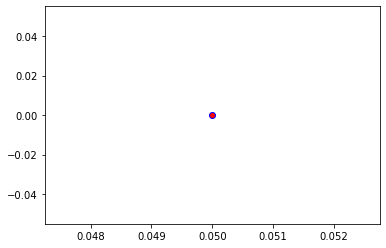

Crafting adversarial images took: 7.851078271865845 seconds 

Images classified as:
000000037751 671 = mountain bike
000000037777 651 = microwave
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


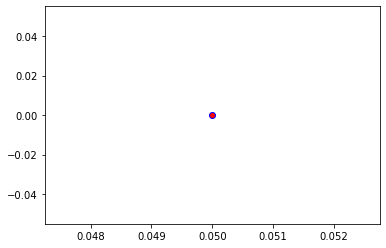

Crafting adversarial images took: 7.973079442977905 seconds 

Images classified as:
000000037988 752 = racket
000000038048 637 = mailbox
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


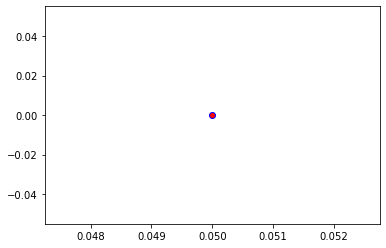

Crafting adversarial images took: 7.850948810577393 seconds 

Images classified as:
000000038070 861 = toilet seat
000000038118 248 = ski
Min values in image-array: 0.0 Max values in image-array: 254.74791
Min values in image-array: 0.0 Max values in image-array: 0.9990114
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


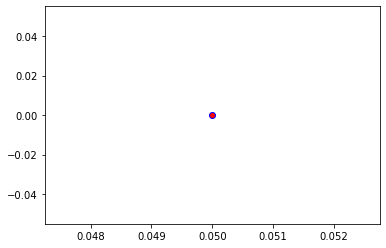

Crafting adversarial images took: 7.852104187011719 seconds 

Images classified as:
000000038210 248 = ski
000000038576 527 = desktop computer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


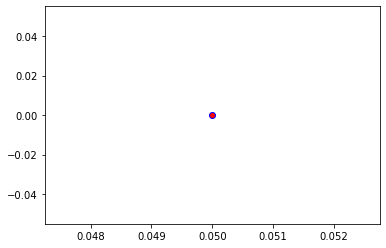

Crafting adversarial images took: 7.931340456008911 seconds 

Images classified as:
000000038678 932 = pretzel
000000038825 340 = zebra
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


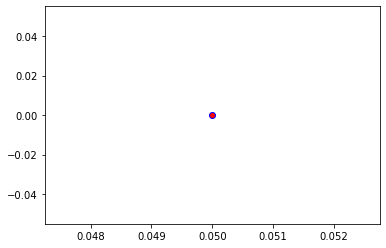

Crafting adversarial images took: 7.885729551315308 seconds 

Images classified as:
000000038829 665 = moped
000000039405 981 = ballplayer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


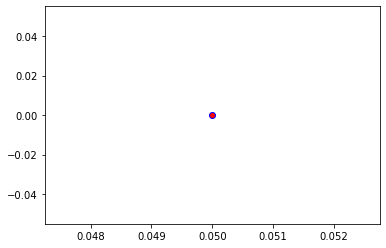

Crafting adversarial images took: 7.780804872512817 seconds 

Images classified as:
000000039477 905 = window shade
000000039480 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


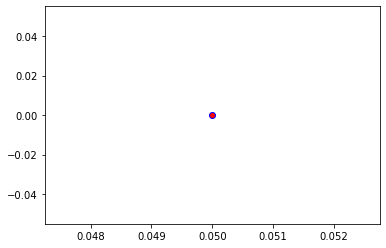

Crafting adversarial images took: 7.7723541259765625 seconds 

Images classified as:
000000039484 498 = cinema
000000039551 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


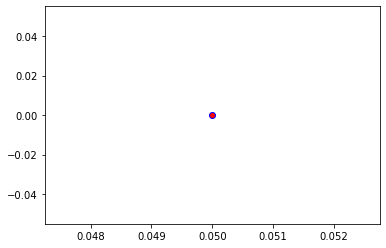

Crafting adversarial images took: 7.734556674957275 seconds 

Images classified as:
000000039670 829 = streetcar
000000039769 281 = tabby
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


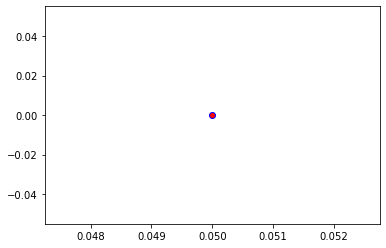

Crafting adversarial images took: 7.733079433441162 seconds 

Images classified as:
000000039785 150 = sea lion
000000039914 701 = parachute
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


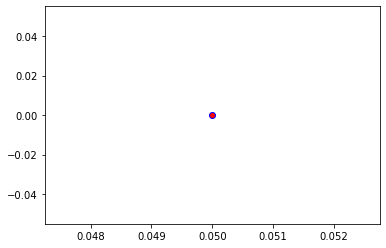

Crafting adversarial images took: 7.810634136199951 seconds 

Images classified as:
000000039951 752 = racket
000000039956 797 = sleeping bag
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


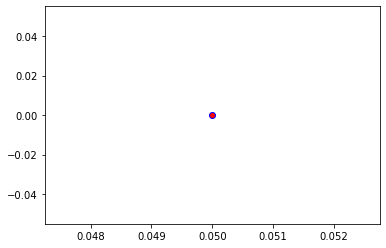

Crafting adversarial images took: 7.814267873764038 seconds 

Images classified as:
000000040036 339 = sorrel
000000040083 523 = crutch
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


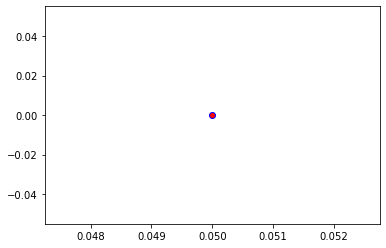

Crafting adversarial images took: 7.754751205444336 seconds 

Images classified as:
000000040471 495 = china cabinet
000000040757 431 = bassinet
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


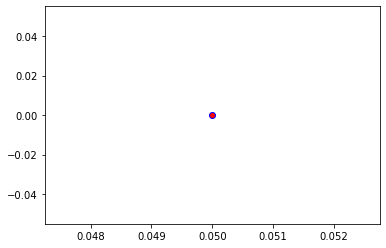

Crafting adversarial images took: 7.735203742980957 seconds 

Images classified as:
000000041488 781 = scoreboard
000000041633 864 = tow truck
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


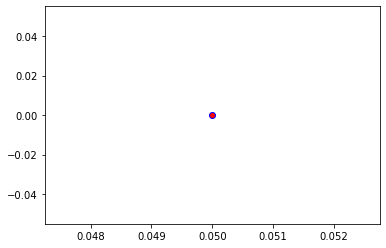

Crafting adversarial images took: 7.770576477050781 seconds 

Images classified as:
000000041635 37 = ox
000000041872 651 = microwave
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


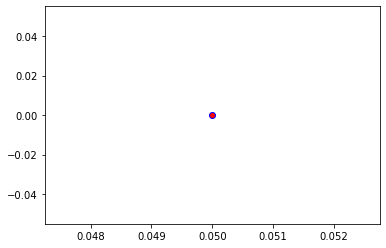

Crafting adversarial images took: 7.8270745277404785 seconds 

Images classified as:
000000041888 9 = ostrich
000000041990 248 = ski
Min values in image-array: 0.0 Max values in image-array: 249.23485
Min values in image-array: 0.0 Max values in image-array: 0.97739154
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


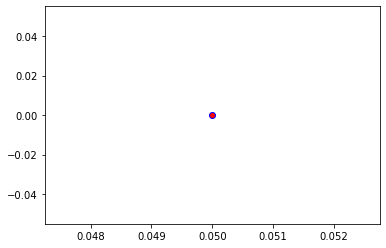

Crafting adversarial images took: 7.912540674209595 seconds 

Images classified as:
000000042070 874 = trolleybus
000000042102 639 = suit
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


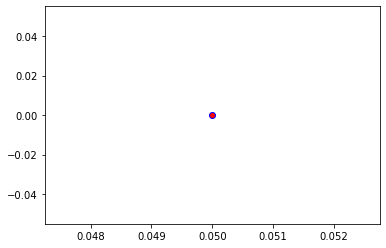

Crafting adversarial images took: 7.753217458724976 seconds 

Images classified as:
000000042178 489 = chainlink fence
000000042276 731 = plunger
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


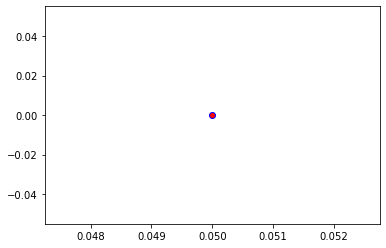

Crafting adversarial images took: 7.922776937484741 seconds 

Images classified as:
000000042296 296 = ice bear
000000042528 487 = cellular telephone
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


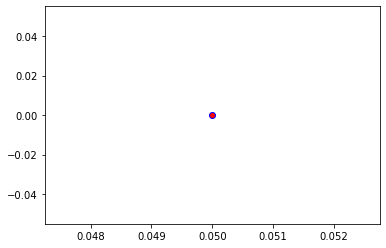

Crafting adversarial images took: 7.74848484992981 seconds 

Images classified as:
000000042563 803 = snowplow
000000042628 145 = king penguin
Min values in image-array: 0.0 Max values in image-array: 251.1609
Min values in image-array: 0.0 Max values in image-array: 0.9849447
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


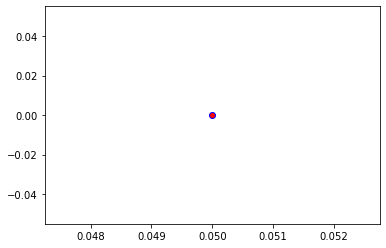

Crafting adversarial images took: 7.714883327484131 seconds 

Images classified as:
000000042888 919 = street sign
000000042889 508 = computer keyboard
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


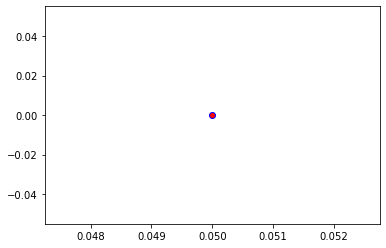

Crafting adversarial images took: 7.720134019851685 seconds 

Images classified as:
000000043314 248 = ski
000000043435 296 = ice bear
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


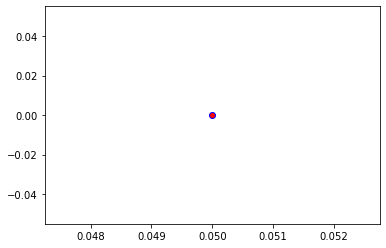

Crafting adversarial images took: 7.861368417739868 seconds 

Images classified as:
000000043581 963 = pizza
000000043737 409 = analog clock
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


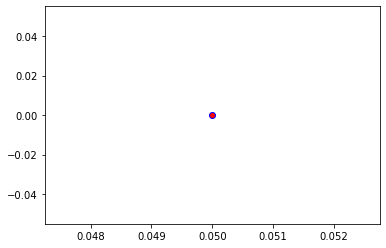

Crafting adversarial images took: 7.725726366043091 seconds 

Images classified as:
000000043816 981 = ballplayer
000000044068 265 = toy poodle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


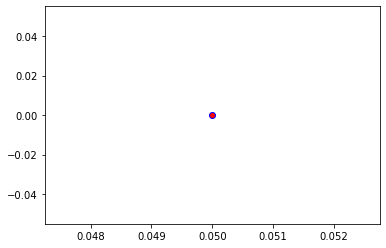

Crafting adversarial images took: 7.723365068435669 seconds 

Images classified as:
000000044195 248 = ski
000000044260 41 = hip
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


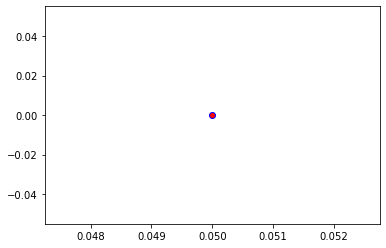

Crafting adversarial images took: 7.862778425216675 seconds 

Images classified as:
000000044279 617 = lab coat
000000044590 444 = bicycle-built-for-two
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


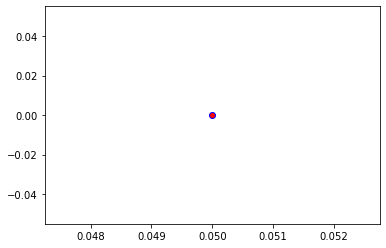

Crafting adversarial images took: 7.742715120315552 seconds 

Images classified as:
000000044652 895 = warplane
000000044699 5 = ram
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


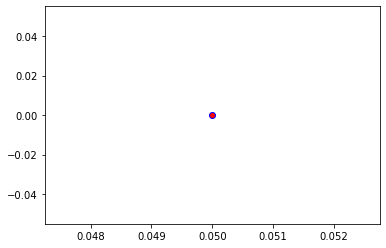

Crafting adversarial images took: 7.881910085678101 seconds 

Images classified as:
000000044877 752 = racket
000000045070 514 = cowboy boot
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


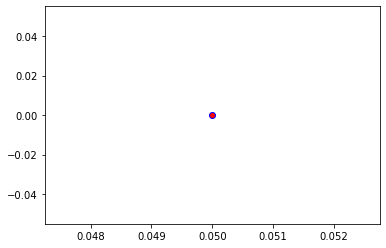

Crafting adversarial images took: 7.737334966659546 seconds 

Images classified as:
000000045090 147 = grey whale
000000045229 495 = china cabinet
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


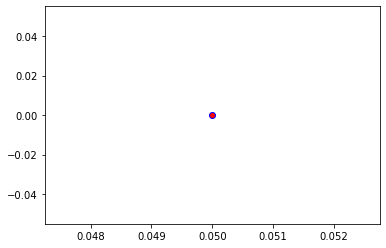

Crafting adversarial images took: 7.721013069152832 seconds 

Images classified as:
000000045472 953 = pineapple
000000045550 965 = burrito
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


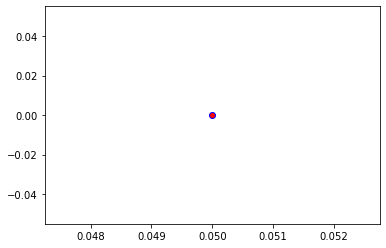

Crafting adversarial images took: 7.703763246536255 seconds 

Images classified as:
000000045596 799 = sliding door
000000045728 935 = mashed potato
Min values in image-array: 0.0 Max values in image-array: 254.9579
Min values in image-array: 0.0 Max values in image-array: 0.9998349
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


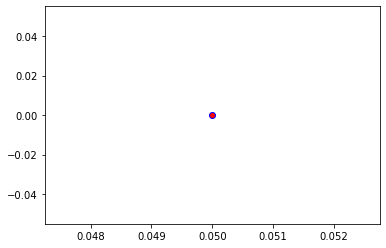

Crafting adversarial images took: 7.7107603549957275 seconds 

Images classified as:
000000046031 620 = laptop
000000046048 831 = studio couch
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


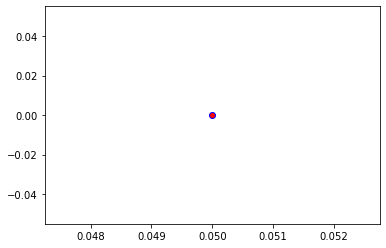

Crafting adversarial images took: 7.689945697784424 seconds 

Images classified as:
000000046252 981 = ballplayer
000000046378 287 = lynx
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


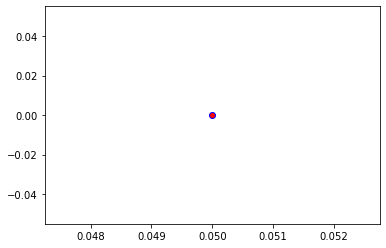

Crafting adversarial images took: 7.867514133453369 seconds 

Images classified as:
000000046463 934 = hotdog
000000046497 26 = gar
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


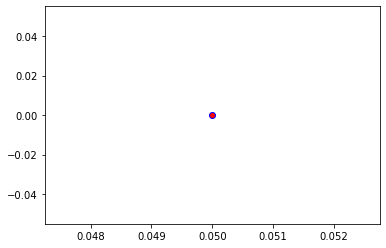

Crafting adversarial images took: 7.802814245223999 seconds 

Images classified as:
000000046804 5 = ram
000000046872 867 = trailer truck
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


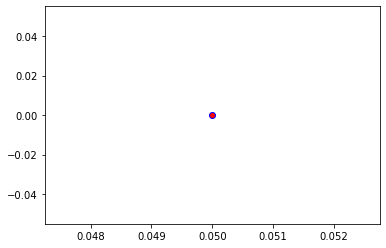

Crafting adversarial images took: 7.746280670166016 seconds 

Images classified as:
000000047010 275 = hyena
000000047112 963 = pizza
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


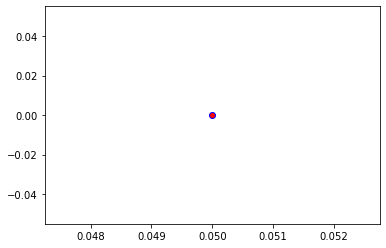

Crafting adversarial images took: 7.706687927246094 seconds 

Images classified as:
000000047121 435 = bathtub
000000047571 603 = horse cart
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


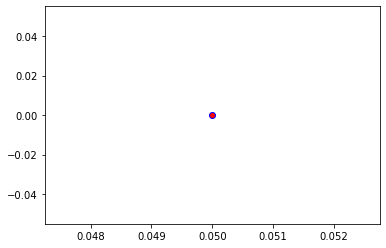

Crafting adversarial images took: 8.009521961212158 seconds 

Images classified as:
000000047585 982 = groom
000000047740 792 = shovel
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


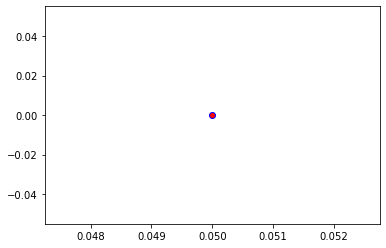

Crafting adversarial images took: 7.8130943775177 seconds 

Images classified as:
000000047769 532 = dining table
000000047801 123 = crayfish
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


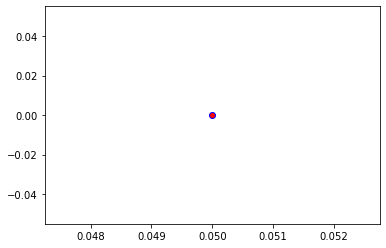

Crafting adversarial images took: 7.9877214431762695 seconds 

Images classified as:
000000047819 354 = Arabian camel
000000047828 713 = pier
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


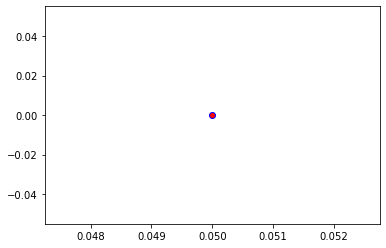

Crafting adversarial images took: 7.762015104293823 seconds 

Images classified as:
000000048153 502 = clog
000000048396 697 = pajama
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


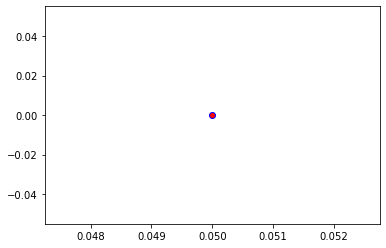

Crafting adversarial images took: 7.753035306930542 seconds 

Images classified as:
000000048504 386 = African elephant
000000048555 978 = seashore
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


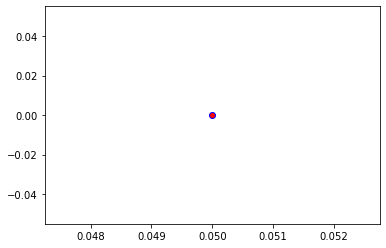

Crafting adversarial images took: 7.692627668380737 seconds 

Images classified as:
000000048564 667 = mortarboard
000000048924 672 = mountain tent
Min values in image-array: 0.0 Max values in image-array: 254.98326
Min values in image-array: 0.0 Max values in image-array: 0.9999344
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


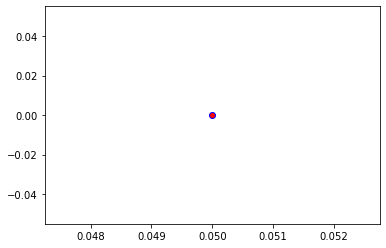

Crafting adversarial images took: 7.890759229660034 seconds 

Images classified as:
000000049060 820 = steam locomotive
000000049091 549 = envelope
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


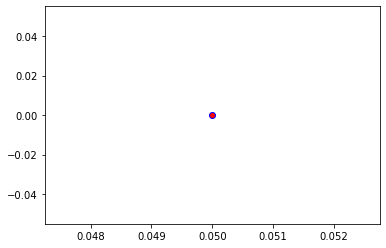

Crafting adversarial images took: 7.84534478187561 seconds 

Images classified as:
000000049259 703 = park bench
000000049269 339 = sorrel
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


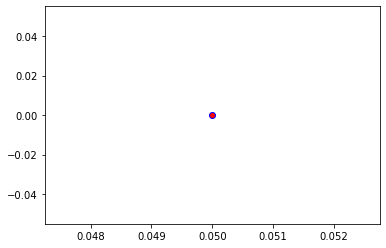

Crafting adversarial images took: 7.728299140930176 seconds 

Images classified as:
000000049759 890 = volleyball
000000049761 346 = water buffalo
Min values in image-array: 0.029186798 Max values in image-array: 255.0
Min values in image-array: 0.00011445803 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


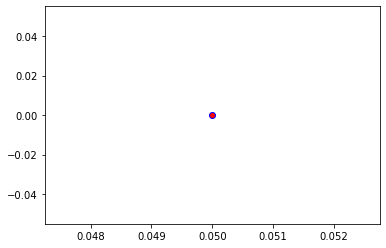

Crafting adversarial images took: 7.812013626098633 seconds 

Images classified as:
000000049810 173 = Ibizan hound
000000050006 975 = lakeside
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


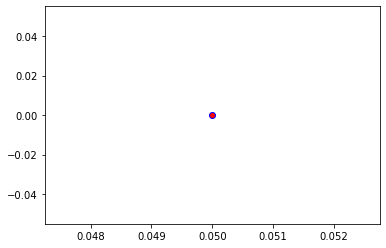

Crafting adversarial images took: 7.991122245788574 seconds 

Images classified as:
000000050145 870 = tricycle
000000050149 954 = banana
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


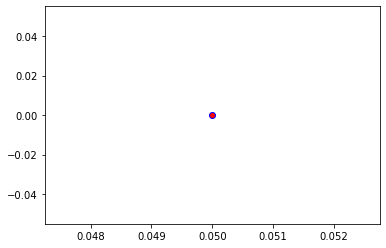

Crafting adversarial images took: 7.84406042098999 seconds 

Images classified as:
000000050165 660 = mobile home
000000050326 843 = swing
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


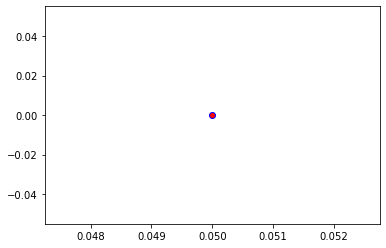

Crafting adversarial images took: 7.869967699050903 seconds 

Images classified as:
000000050331 937 = broccoli
000000050380 246 = Great Dane
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


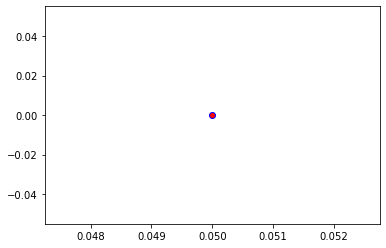

Crafting adversarial images took: 7.918813228607178 seconds 

Images classified as:
000000050638 514 = cowboy boot
000000050679 950 = orange
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


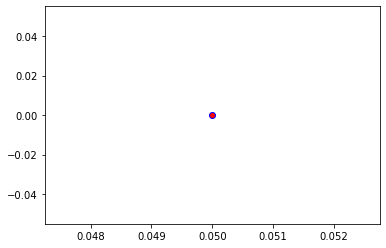

Crafting adversarial images took: 7.744411468505859 seconds 

Images classified as:
000000050811 438 = beaker
000000050828 831 = studio couch
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


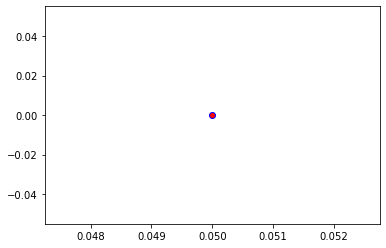

Crafting adversarial images took: 7.709977388381958 seconds 

Images classified as:
000000050844 850 = teddy
000000050896 950 = orange
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


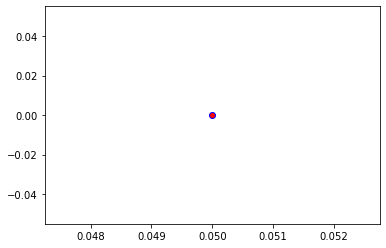

Crafting adversarial images took: 7.76439642906189 seconds 

Images classified as:
000000050943 803 = snowplow
000000051008 620 = laptop
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


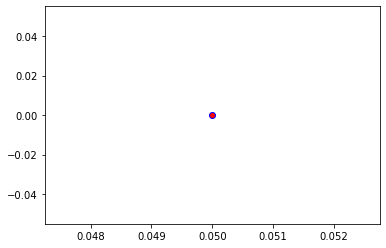

Crafting adversarial images took: 7.7336671352386475 seconds 

Images classified as:
000000051309 346 = water buffalo
000000051314 693 = paddle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


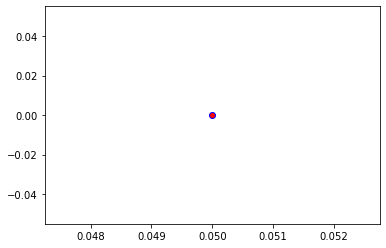

Crafting adversarial images took: 8.02559208869934 seconds 

Images classified as:
000000051326 607 = jack-o'-lantern
000000051598 648 = medicine chest
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


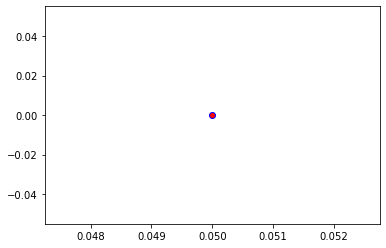

Crafting adversarial images took: 7.667634010314941 seconds 

Images classified as:
000000051610 681 = notebook
000000051712 248 = ski
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


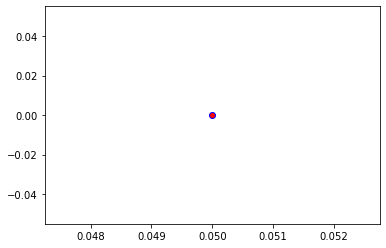

Crafting adversarial images took: 7.779544115066528 seconds 

Images classified as:
000000051738 831 = studio couch
000000051938 248 = ski
Min values in image-array: 0.87756175 Max values in image-array: 255.0
Min values in image-array: 0.0034414185 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


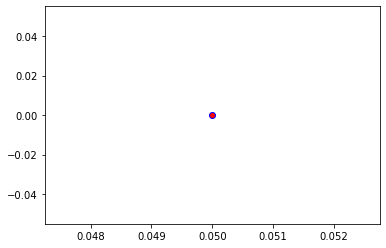

Crafting adversarial images took: 7.712291240692139 seconds 

Images classified as:
000000051961 704 = parking meter
000000051976 296 = ice bear
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


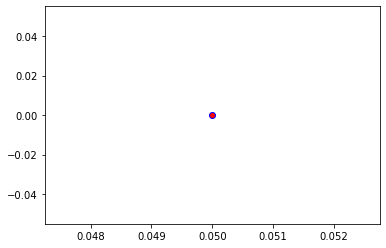

Crafting adversarial images took: 7.703526735305786 seconds 

Images classified as:
000000052007 874 = trolleybus
000000052017 895 = warplane
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


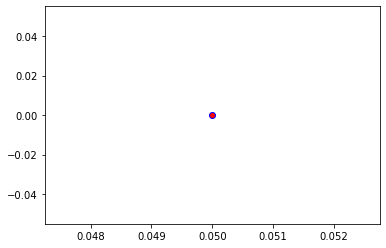

Crafting adversarial images took: 7.883443832397461 seconds 

Images classified as:
000000052412 318 = wing
000000052413 487 = cellular telephone
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


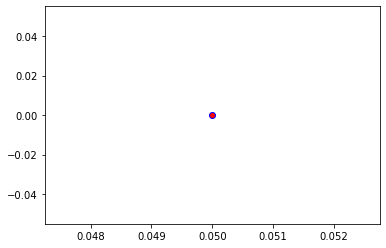

Crafting adversarial images took: 7.750867128372192 seconds 

Images classified as:
000000052462 340 = zebra
000000052507 693 = paddle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


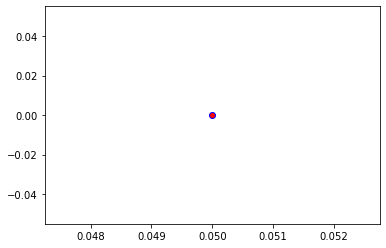

Crafting adversarial images took: 7.9596946239471436 seconds 

Images classified as:
000000052565 37 = ox
000000052591 792 = shovel
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


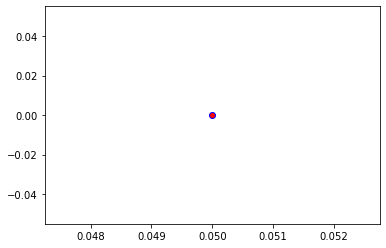

Crafting adversarial images took: 7.753545045852661 seconds 

Images classified as:
000000052891 169 = borzoi
000000052996 739 = potter's wheel
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


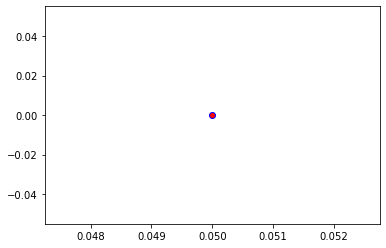

Crafting adversarial images took: 7.745455265045166 seconds 

Images classified as:
000000053505 861 = toilet seat
000000053529 691 = oxygen mask
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


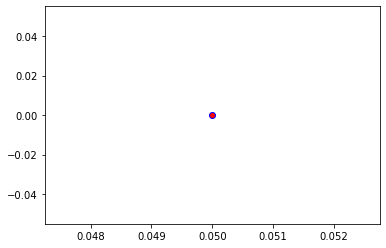

Crafting adversarial images took: 8.245137929916382 seconds 

Images classified as:
000000053624 385 = Indian elephant
000000053626 248 = ski
Min values in image-array: 0.52934074 Max values in image-array: 255.0
Min values in image-array: 0.002075846 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


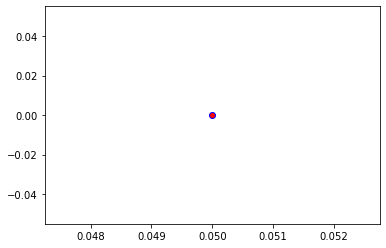

Crafting adversarial images took: 7.911224126815796 seconds 

Images classified as:
000000053909 590 = hand-held computer
000000053994 704 = parking meter
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


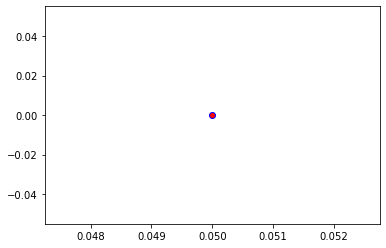

Crafting adversarial images took: 7.716900110244751 seconds 

Images classified as:
000000054123 340 = zebra
000000054164 693 = paddle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


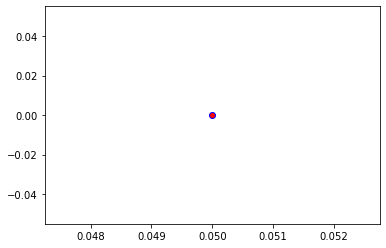

Crafting adversarial images took: 7.74689793586731 seconds 

Images classified as:
000000054592 248 = ski
000000054593 981 = ballplayer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


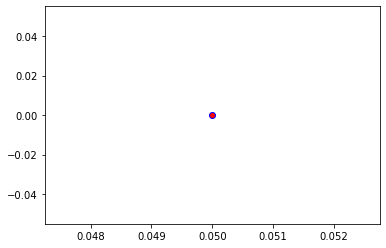

Crafting adversarial images took: 7.780168533325195 seconds 

Images classified as:
000000054605 928 = ice cream
000000054628 619 = lampshade
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


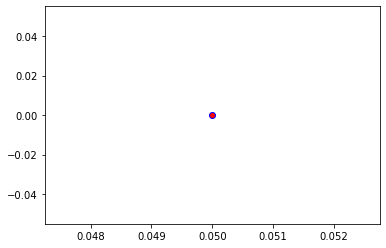

Crafting adversarial images took: 7.711751699447632 seconds 

Images classified as:
000000054654 521 = Crock Pot
000000054931 37 = ox
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


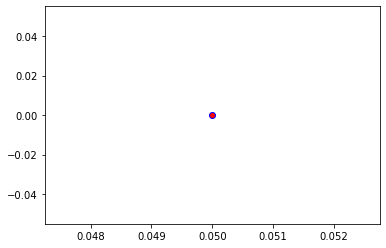

Crafting adversarial images took: 7.8658716678619385 seconds 

Images classified as:
000000054967 919 = street sign
000000055002 861 = toilet seat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


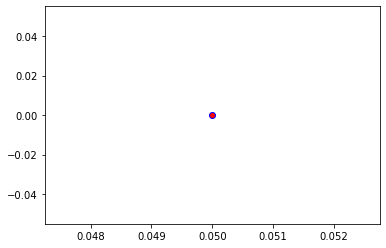

Crafting adversarial images took: 7.906394004821777 seconds 

Images classified as:
000000055022 870 = tricycle
000000055072 293 = cheetah
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


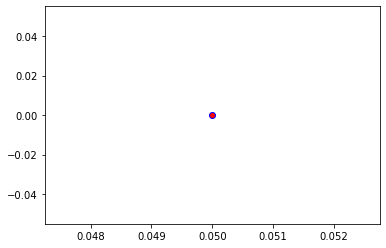

Crafting adversarial images took: 7.698071241378784 seconds 

Images classified as:
000000055150 475 = car mirror
000000055167 874 = trolleybus
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


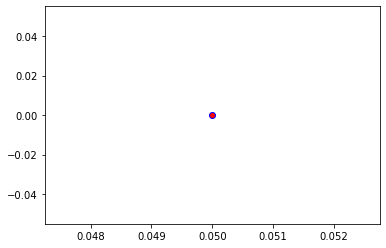

Crafting adversarial images took: 7.730943202972412 seconds 

Images classified as:
000000055299 976 = promontory
000000055528 419 = Band Aid
Min values in image-array: 0.0 Max values in image-array: 254.51018
Min values in image-array: 0.0 Max values in image-array: 0.9980791
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


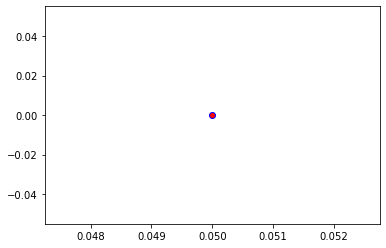

Crafting adversarial images took: 7.896450757980347 seconds 

Images classified as:
000000055950 752 = racket
000000056127 532 = dining table
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


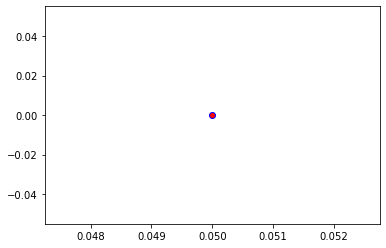

Crafting adversarial images took: 7.967397689819336 seconds 

Images classified as:
000000056288 959 = carbonara
000000056344 527 = desktop computer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


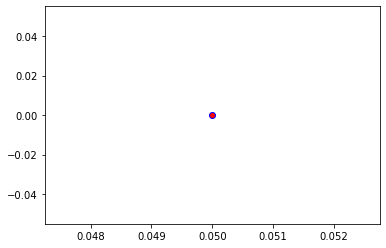

Crafting adversarial images took: 8.084221839904785 seconds 

Images classified as:
000000056350 794 = shower curtain
000000056545 16 = bulbul
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


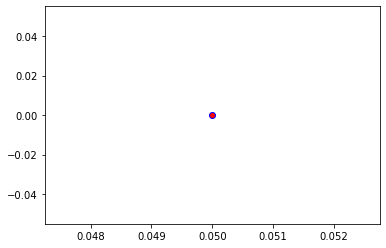

Crafting adversarial images took: 7.832982540130615 seconds 

Images classified as:
000000057027 385 = Indian elephant
000000057149 874 = trolleybus
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


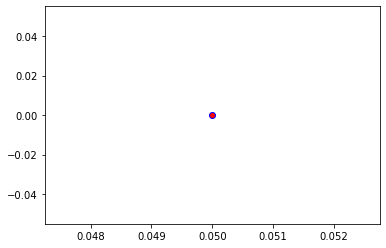

Crafting adversarial images took: 7.736399412155151 seconds 

Images classified as:
000000057150 850 = teddy
000000057232 522 = croquet ball
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


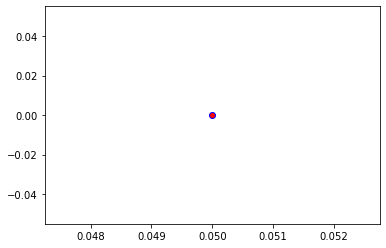

Crafting adversarial images took: 7.704684019088745 seconds 

Images classified as:
000000057238 760 = refrigerator
000000057244 820 = steam locomotive
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


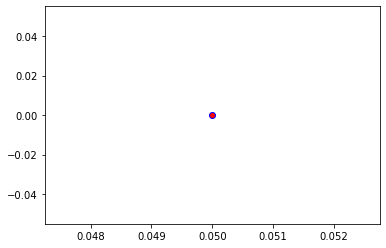

Crafting adversarial images took: 7.740014314651489 seconds 

Images classified as:
000000057597 805 = soccer ball
000000057672 472 = canoe
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


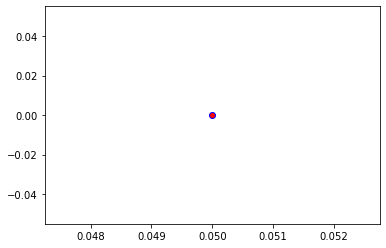

Crafting adversarial images took: 7.873151540756226 seconds 

Images classified as:
000000057725 839 = suspension bridge
000000057760 977 = sandbar
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


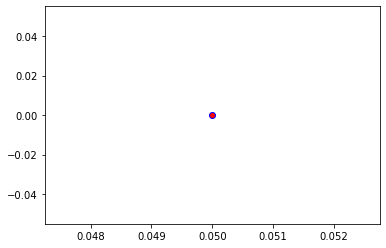

Crafting adversarial images took: 7.772421598434448 seconds 

Images classified as:
000000058029 648 = medicine chest
000000058111 283 = Persian cat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


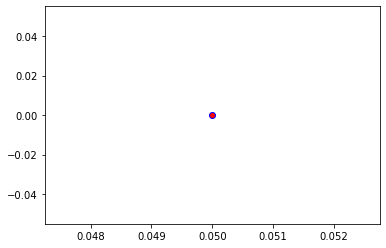

Crafting adversarial images took: 7.771276473999023 seconds 

Images classified as:
000000058350 813 = spatula
000000058384 385 = Indian elephant
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


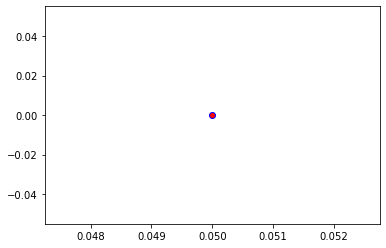

Crafting adversarial images took: 7.883409023284912 seconds 

Images classified as:
000000058393 703 = park bench
000000058539 639 = suit
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


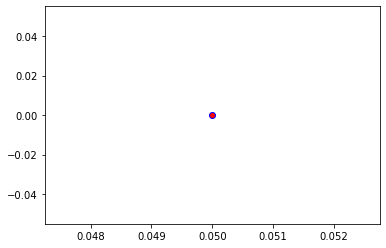

Crafting adversarial images took: 7.7066028118133545 seconds 

Images classified as:
000000058636 919 = street sign
000000058655 409 = analog clock
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


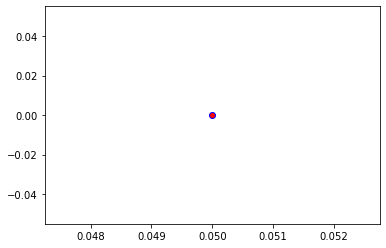

Crafting adversarial images took: 8.621243476867676 seconds 

Images classified as:
000000058705 652 = military uniform
000000059044 683 = oboe
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


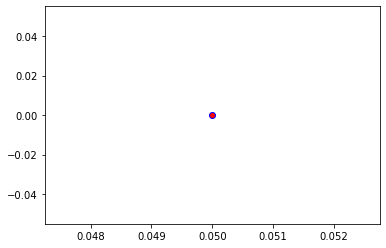

Crafting adversarial images took: 7.8001868724823 seconds 

Images classified as:
000000059386 293 = cheetah
000000059598 681 = notebook
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


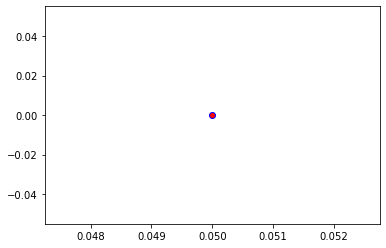

Crafting adversarial images took: 7.8665924072265625 seconds 

Images classified as:
000000059635 638 = maillot
000000059920 794 = shower curtain
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


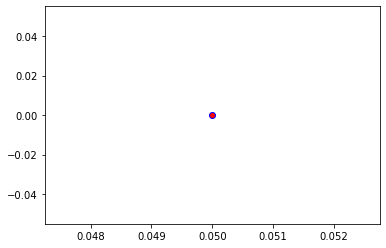

Crafting adversarial images took: 7.725876331329346 seconds 

Images classified as:
000000060052 542 = drumstick
000000060090 547 = electric locomotive
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


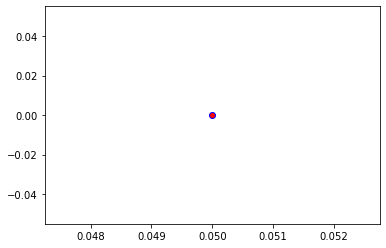

Crafting adversarial images took: 7.884626626968384 seconds 

Images classified as:
000000060102 890 = volleyball
000000060347 703 = park bench
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


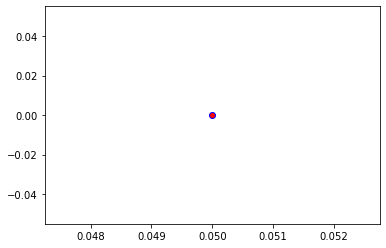

Crafting adversarial images took: 8.014818668365479 seconds 

Images classified as:
000000060363 892 = wall clock
000000060449 706 = patio
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


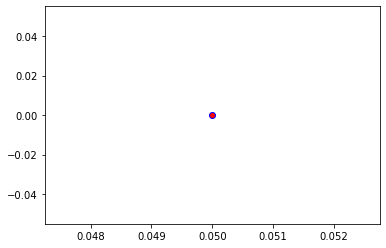

Crafting adversarial images took: 7.746089458465576 seconds 

Images classified as:
000000060507 981 = ballplayer
000000060770 340 = zebra
Min values in image-array: 8.888684 Max values in image-array: 255.0
Min values in image-array: 0.034857586 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


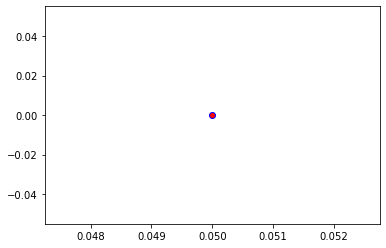

Crafting adversarial images took: 7.803404092788696 seconds 

Images classified as:
000000060823 690 = oxcart
000000060835 217 = English springer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


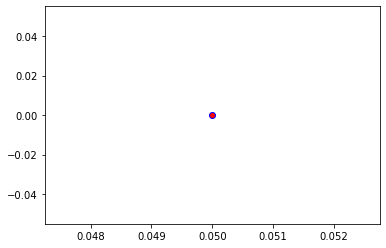

Crafting adversarial images took: 7.828108072280884 seconds 

Images classified as:
000000060855 950 = orange
000000060886 981 = ballplayer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


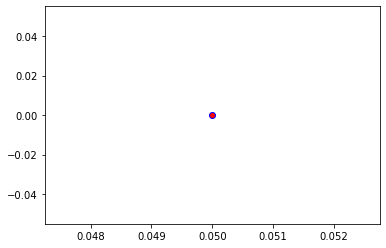

Crafting adversarial images took: 7.750420570373535 seconds 

Images classified as:
000000060899 515 = cowboy hat
000000060932 617 = lab coat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


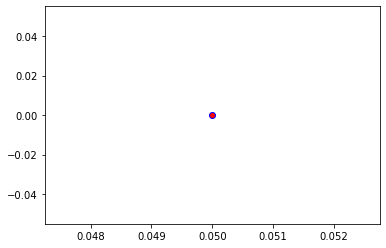

Crafting adversarial images took: 7.7435142993927 seconds 

Images classified as:
000000061108 870 = tricycle
000000061171 37 = ox
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


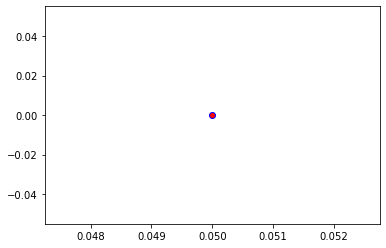

Crafting adversarial images took: 7.876519203186035 seconds 

Images classified as:
000000061268 565 = freight car
000000061333 282 = tiger cat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


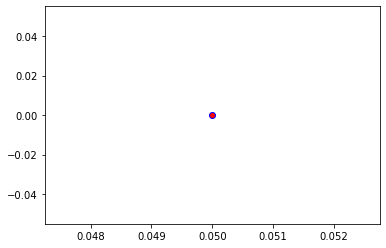

Crafting adversarial images took: 7.743206739425659 seconds 

Images classified as:
000000061418 702 = parallel bars
000000061471 999 = toilet tissue
Min values in image-array: 0.0 Max values in image-array: 253.34694
Min values in image-array: 0.0 Max values in image-array: 0.9935174
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


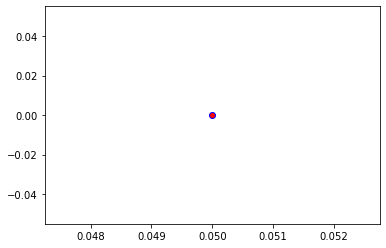

Crafting adversarial images took: 7.725214958190918 seconds 

Images classified as:
000000061584 706 = patio
000000061658 938 = cauliflower
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


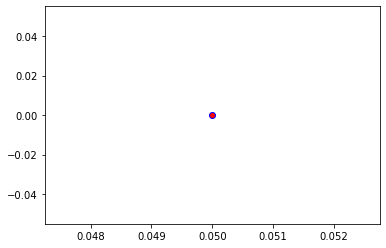

Crafting adversarial images took: 7.6827991008758545 seconds 

Images classified as:
000000061747 248 = ski
000000061960 655 = miniskirt
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


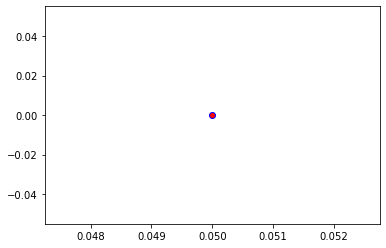

Crafting adversarial images took: 7.848690748214722 seconds 

Images classified as:
000000062025 896 = washbasin
000000062353 386 = African elephant
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


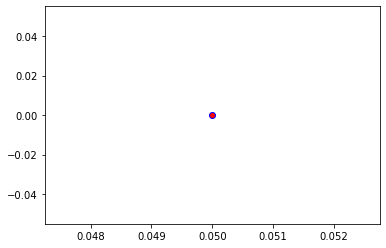

Crafting adversarial images took: 7.850725412368774 seconds 

Images classified as:
000000062355 981 = ballplayer
000000062554 937 = broccoli
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


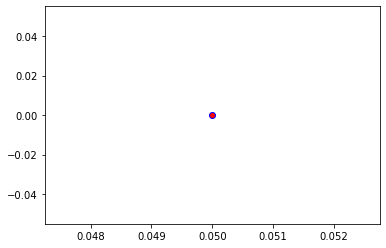

Crafting adversarial images took: 7.887685298919678 seconds 

Images classified as:
000000062692 752 = racket
000000062808 963 = pizza
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


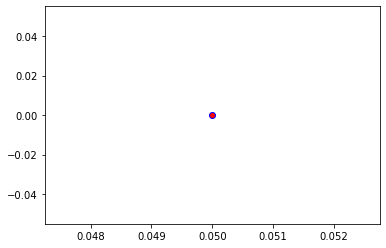

Crafting adversarial images took: 7.771395683288574 seconds 

Images classified as:
000000063047 971 = bubble
000000063154 693 = paddle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


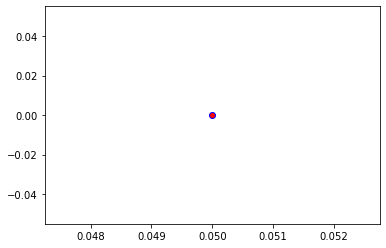

Crafting adversarial images took: 7.954736709594727 seconds 

Images classified as:
000000063552 463 = bucket
000000063602 620 = laptop
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


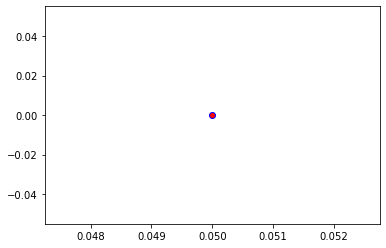

Crafting adversarial images took: 7.774619817733765 seconds 

Images classified as:
000000063740 527 = desktop computer
000000063965 928 = ice cream
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


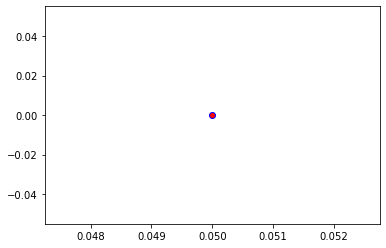

Crafting adversarial images took: 7.72184419631958 seconds 

Images classified as:
000000064084 930 = French loaf
000000064359 340 = zebra
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


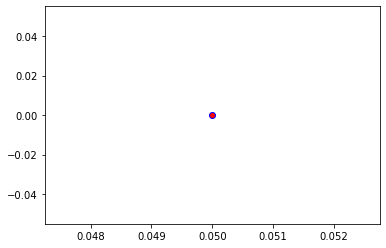

Crafting adversarial images took: 7.887533187866211 seconds 

Images classified as:
000000064462 248 = ski
000000064495 704 = parking meter
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


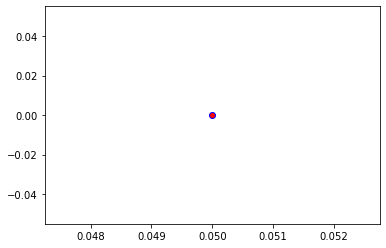

Crafting adversarial images took: 7.823471307754517 seconds 

Images classified as:
000000064499 340 = zebra
000000064523 652 = military uniform
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


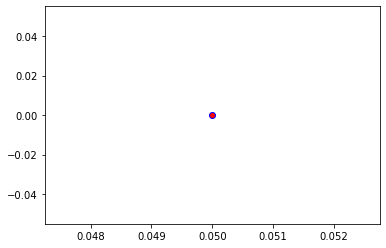

Crafting adversarial images took: 7.832112550735474 seconds 

Images classified as:
000000064574 777 = scabbard
000000064718 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


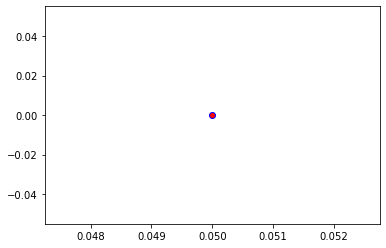

Crafting adversarial images took: 7.894080638885498 seconds 

Images classified as:
000000064868 827 = stove
000000064898 801 = snorkel
Min values in image-array: 1.094199 Max values in image-array: 255.0
Min values in image-array: 0.004290976 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


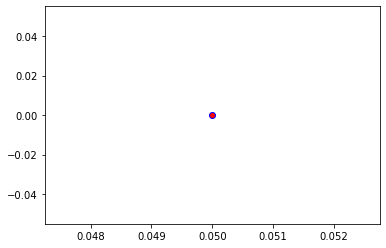

Crafting adversarial images took: 7.718935012817383 seconds 

Images classified as:
000000065074 750 = quilt
000000065288 492 = chest
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


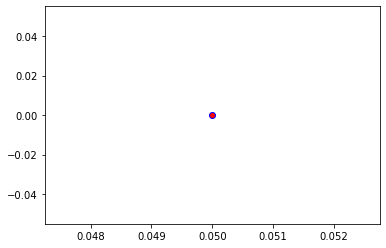

Crafting adversarial images took: 7.753413438796997 seconds 

Images classified as:
000000065350 450 = bobsled
000000065455 104 = wallaby
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


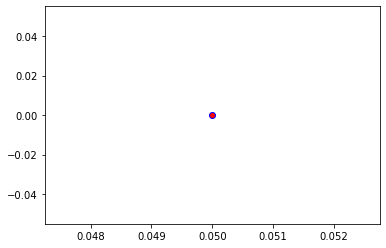

Crafting adversarial images took: 7.912227392196655 seconds 

Images classified as:
000000065485 609 = jeep
000000065736 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


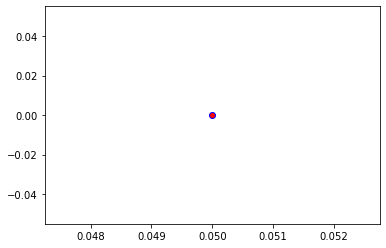

Crafting adversarial images took: 7.684799909591675 seconds 

Images classified as:
000000065798 981 = ballplayer
000000066038 879 = umbrella
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


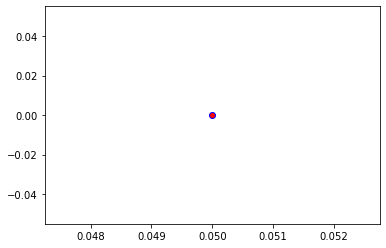

Crafting adversarial images took: 7.740702390670776 seconds 

Images classified as:
000000066135 547 = electric locomotive
000000066231 762 = restaurant
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


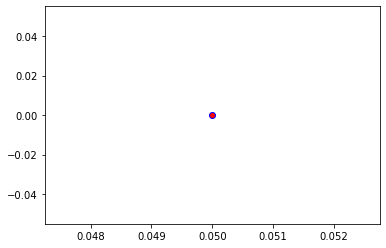

Crafting adversarial images took: 7.735522508621216 seconds 

Images classified as:
000000066523 669 = mosquito net
000000066561 5 = ram
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


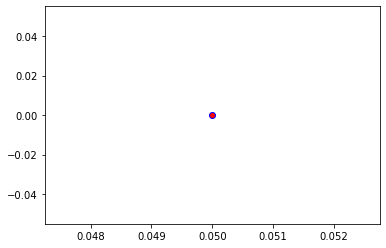

Crafting adversarial images took: 7.7683329582214355 seconds 

Images classified as:
000000066635 556 = screen
000000066706 963 = pizza
Min values in image-array: 0.0 Max values in image-array: 254.97633
Min values in image-array: 0.0 Max values in image-array: 0.9999072
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


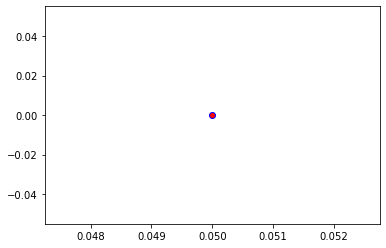

Crafting adversarial images took: 7.861928939819336 seconds 

Images classified as:
000000066771 438 = beaker
000000066817 962 = meat loaf
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


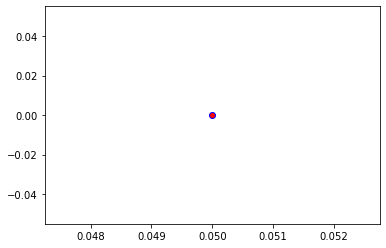

Crafting adversarial images took: 7.860197305679321 seconds 

Images classified as:
000000066841 423 = barber chair
000000066886 589 = hand blower
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


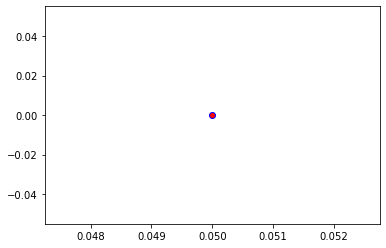

Crafting adversarial images took: 7.730496168136597 seconds 

Images classified as:
000000066926 931 = bagel
000000067180 655 = miniskirt
Min values in image-array: 0.0 Max values in image-array: 249.76549
Min values in image-array: 0.0 Max values in image-array: 0.9794725
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


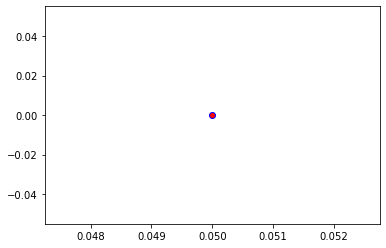

Crafting adversarial images took: 7.7255353927612305 seconds 

Images classified as:
000000067213 436 = beach wagon
000000067310 880 = unicycle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


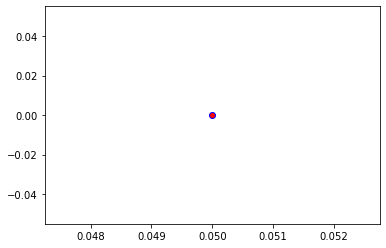

Crafting adversarial images took: 7.7305006980896 seconds 

Images classified as:
000000067315 639 = suit
000000067406 701 = parachute
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


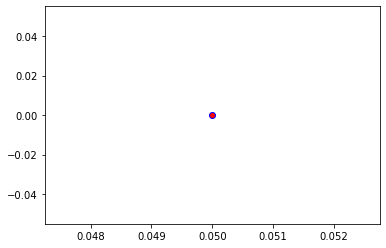

Crafting adversarial images took: 7.7395970821380615 seconds 

Images classified as:
000000067534 906 = Windsor tie
000000067616 829 = streetcar
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


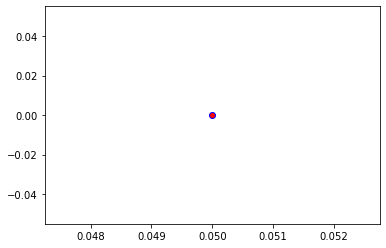

Crafting adversarial images took: 7.6590330600738525 seconds 

Images classified as:
000000067896 409 = analog clock
000000068078 794 = shower curtain
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


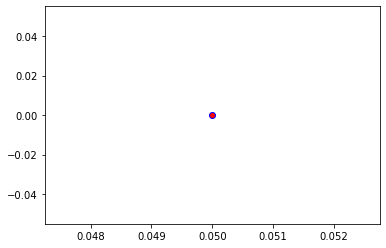

Crafting adversarial images took: 7.738264083862305 seconds 

Images classified as:
000000068093 665 = moped
000000068286 831 = studio couch
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


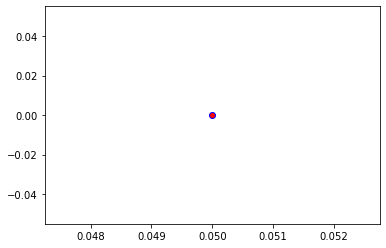

Crafting adversarial images took: 7.666872978210449 seconds 

Images classified as:
000000068387 981 = ballplayer
000000068409 652 = military uniform
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


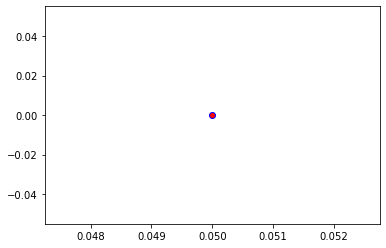

Crafting adversarial images took: 7.72472620010376 seconds 

Images classified as:
000000068628 880 = unicycle
000000068765 673 = mouse
Min values in image-array: 0.0 Max values in image-array: 254.37376
Min values in image-array: 0.0 Max values in image-array: 0.99754417
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


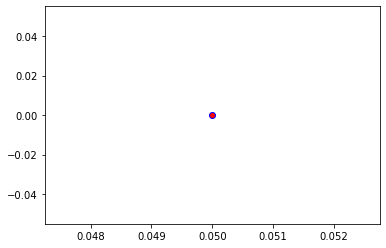

Crafting adversarial images took: 7.696437835693359 seconds 

Images classified as:
000000068833 736 = pool table
000000068933 340 = zebra
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


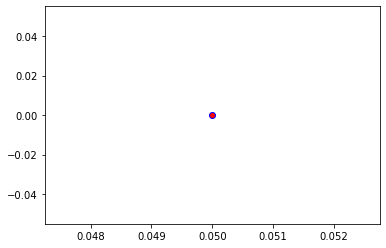

Crafting adversarial images took: 7.918926239013672 seconds 

Images classified as:
000000069106 340 = zebra
000000069138 920 = traffic light
Min values in image-array: 0.33376646 Max values in image-array: 254.96875
Min values in image-array: 0.0013088881 Max values in image-array: 0.99987745
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


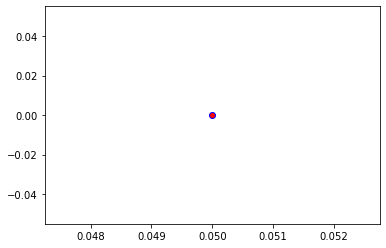

Crafting adversarial images took: 7.734997749328613 seconds 

Images classified as:
000000069213 736 = pool table
000000069224 617 = lab coat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


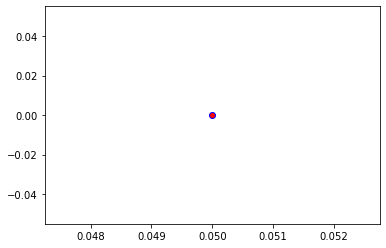

Crafting adversarial images took: 7.851706027984619 seconds 

Images classified as:
000000069356 955 = jackfruit
000000069795 28 = pot
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


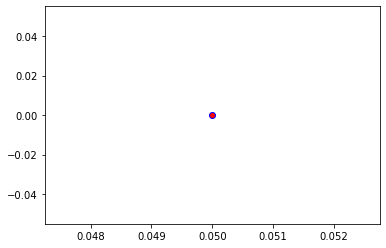

Crafting adversarial images took: 7.654452800750732 seconds 

Images classified as:
000000070048 964 = potpie
000000070158 340 = zebra
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


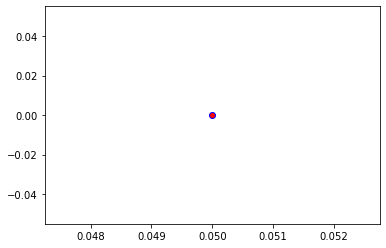

Crafting adversarial images took: 7.766205549240112 seconds 

Images classified as:
000000070229 703 = park bench
000000070254 547 = electric locomotive
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


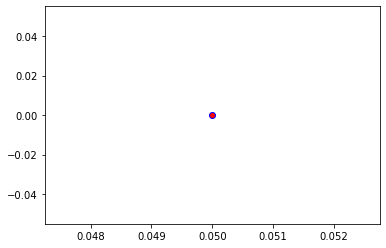

Crafting adversarial images took: 8.016550064086914 seconds 

Images classified as:
000000070739 845 = syringe
000000070774 665 = moped
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


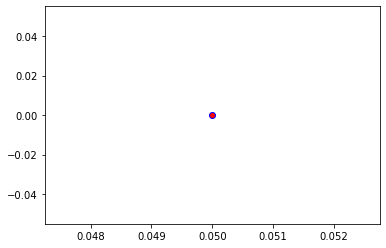

Crafting adversarial images took: 7.91211462020874 seconds 

Images classified as:
000000071226 168 = redbone
000000071451 750 = quilt
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


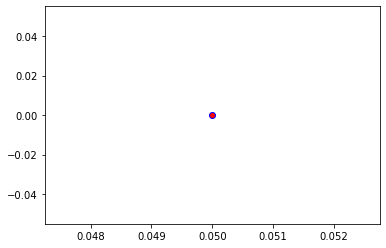

Crafting adversarial images took: 7.725812196731567 seconds 

Images classified as:
000000071711 895 = warplane
000000071756 297 = sloth bear
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


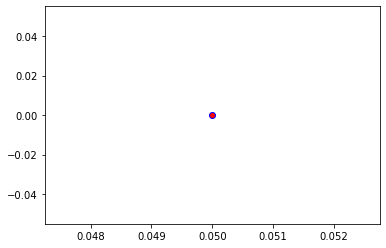

Crafting adversarial images took: 7.779298782348633 seconds 

Images classified as:
000000071877 491 = chain saw
000000071938 761 = remote control
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


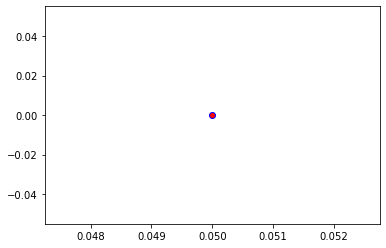

Crafting adversarial images took: 7.767271041870117 seconds 

Images classified as:
000000072281 880 = unicycle
000000072795 981 = ballplayer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


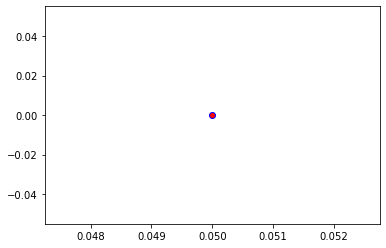

Crafting adversarial images took: 7.736076831817627 seconds 

Images classified as:
000000072813 209 = Chesapeake Bay retriever
000000072852 791 = shopping cart
Min values in image-array: 0.0 Max values in image-array: 253.07141
Min values in image-array: 0.0 Max values in image-array: 0.9924369
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


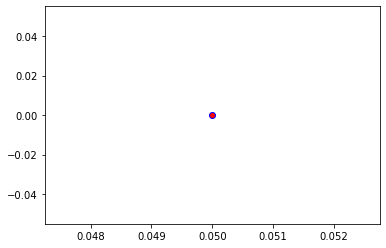

Crafting adversarial images took: 7.873288631439209 seconds 

Images classified as:
000000073118 850 = teddy
000000073153 500 = cliff
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


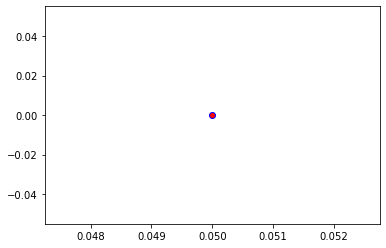

Crafting adversarial images took: 7.818157434463501 seconds 

Images classified as:
000000073326 760 = refrigerator
000000073533 918 = crossword puzzle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


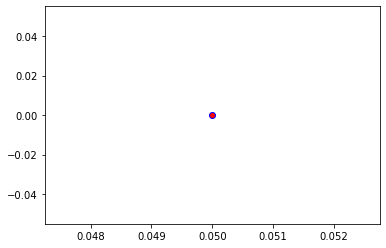

Crafting adversarial images took: 7.701658725738525 seconds 

Images classified as:
000000073702 830 = stretcher
000000073946 768 = rugby ball
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


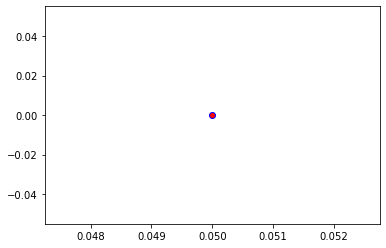

Crafting adversarial images took: 7.74178671836853 seconds 

Images classified as:
000000074058 603 = horse cart
000000074092 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


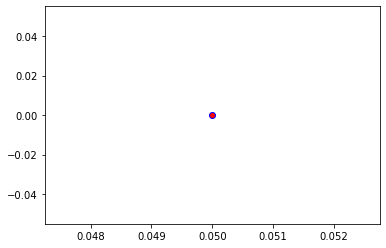

Crafting adversarial images took: 7.70450496673584 seconds 

Images classified as:
000000074200 835 = sundial
000000074209 532 = dining table
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


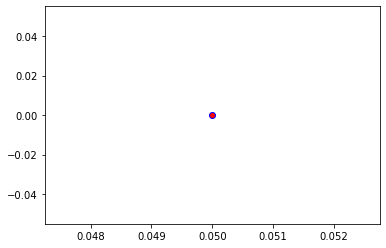

Crafting adversarial images took: 7.761523723602295 seconds 

Images classified as:
000000074256 411 = apron
000000074457 977 = sandbar
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


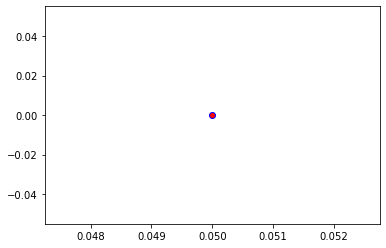

Crafting adversarial images took: 7.875103235244751 seconds 

Images classified as:
000000074646 978 = seashore
000000074733 934 = hotdog
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


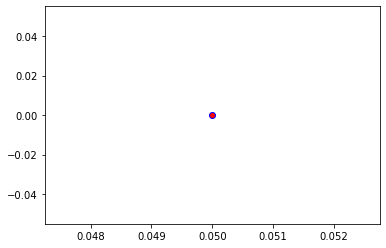

Crafting adversarial images took: 7.980249881744385 seconds 

Images classified as:
000000074860 802 = snowmobile
000000075393 813 = spatula
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


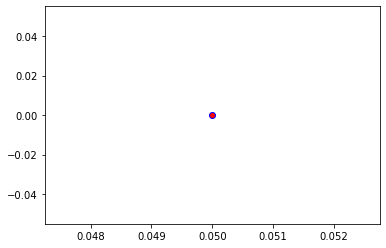

Crafting adversarial images took: 7.910937786102295 seconds 

Images classified as:
000000075456 935 = mashed potato
000000075612 624 = library
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


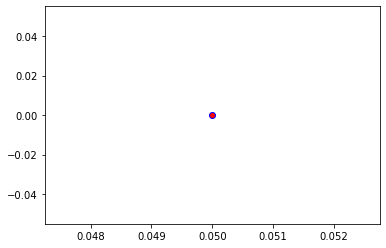

Crafting adversarial images took: 7.791402339935303 seconds 

Images classified as:
000000076211 498 = palace
000000076261 146 = albatross
Min values in image-array: 1.2226243 Max values in image-array: 232.30458
Min values in image-array: 0.004794605 Max values in image-array: 0.91099834
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


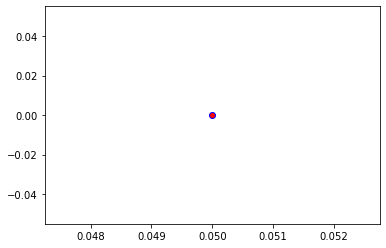

Crafting adversarial images took: 7.849995851516724 seconds 

Images classified as:
000000076416 407 = ambulance
000000076417 151 = Chihuahua
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


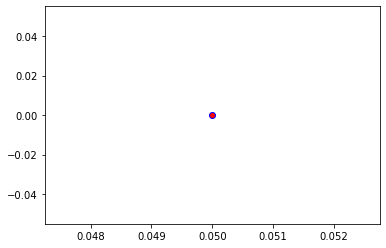

Crafting adversarial images took: 7.8917076587677 seconds 

Images classified as:
000000076468 752 = racket
000000076547 612 = jinrikisha
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


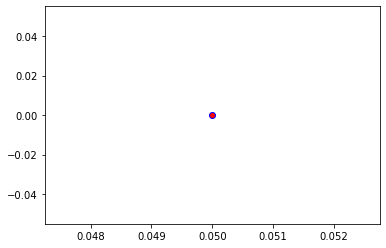

Crafting adversarial images took: 7.69229531288147 seconds 

Images classified as:
000000076625 829 = streetcar
000000076731 767 = rubber eraser
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


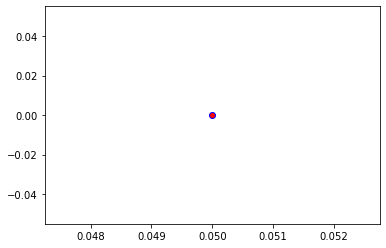

Crafting adversarial images took: 7.726829290390015 seconds 

Images classified as:
000000077396 548 = entertainment center
000000077460 958 = hay
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


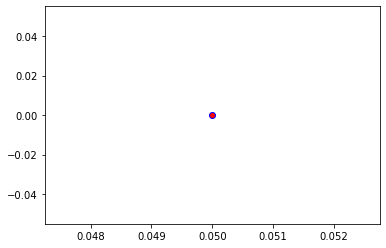

Crafting adversarial images took: 7.737297058105469 seconds 

Images classified as:
000000077595 285 = Egyptian cat
000000078032 706 = patio
Min values in image-array: 1.5412936 Max values in image-array: 255.0
Min values in image-array: 0.0060442886 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


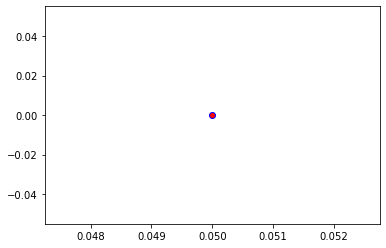

Crafting adversarial images took: 7.794048070907593 seconds 

Images classified as:
000000078170 851 = television
000000078266 424 = barbershop
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


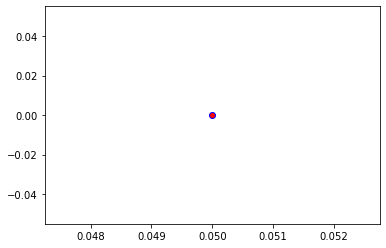

Crafting adversarial images took: 7.684116363525391 seconds 

Images classified as:
000000078404 703 = park bench
000000078420 620 = laptop
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


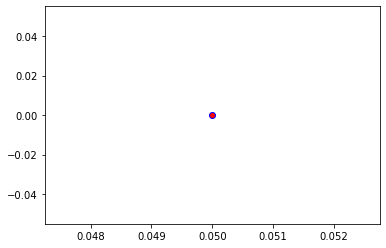

Crafting adversarial images took: 7.668541431427002 seconds 

Images classified as:
000000078426 285 = Egyptian cat
000000078565 914 = yawl
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


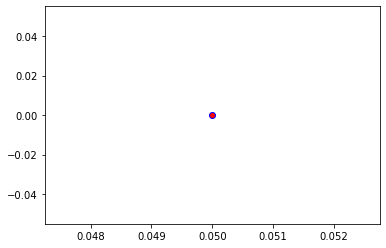

Crafting adversarial images took: 7.69440484046936 seconds 

Images classified as:
000000078748 665 = moped
000000078823 207 = golden retriever
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


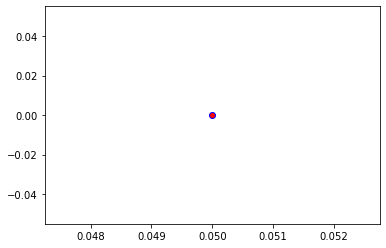

Crafting adversarial images took: 7.767593622207642 seconds 

Images classified as:
000000078843 515 = cowboy hat
000000078915 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


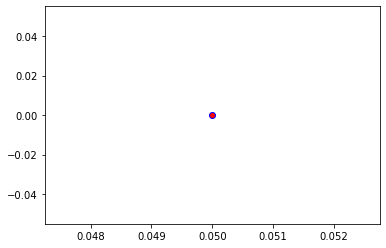

Crafting adversarial images took: 7.753867864608765 seconds 

Images classified as:
000000078959 105 = ear
000000079014 691 = oxygen mask
Min values in image-array: 0.0 Max values in image-array: 254.60715
Min values in image-array: 0.0 Max values in image-array: 0.9984594
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


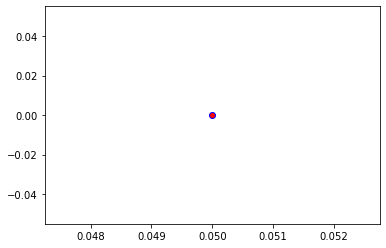

Crafting adversarial images took: 7.736479997634888 seconds 

Images classified as:
000000079031 472 = canoe
000000079034 898 = water bottle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


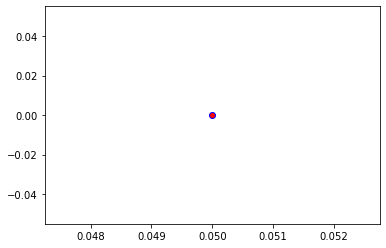

Crafting adversarial images took: 7.851830720901489 seconds 

Images classified as:
000000079144 297 = sloth bear
000000079188 275 = hyena
Min values in image-array: 0.0 Max values in image-array: 254.81635
Min values in image-array: 0.0 Max values in image-array: 0.9992798
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


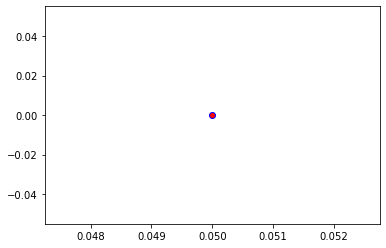

Crafting adversarial images took: 7.89185905456543 seconds 

Images classified as:
000000079229 354 = Arabian camel
000000079408 919 = street sign
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


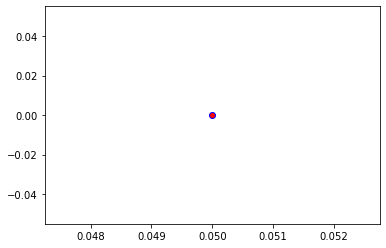

Crafting adversarial images took: 7.763930559158325 seconds 

Images classified as:
000000079565 354 = Arabian camel
000000079588 498 = palace
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


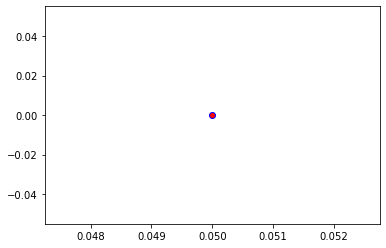

Crafting adversarial images took: 7.72344708442688 seconds 

Images classified as:
000000079651 954 = banana
000000079837 780 = schooner
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


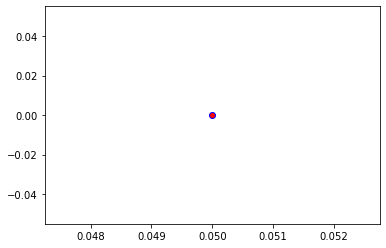

Crafting adversarial images took: 7.7848968505859375 seconds 

Images classified as:
000000079969 752 = racket
000000080022 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


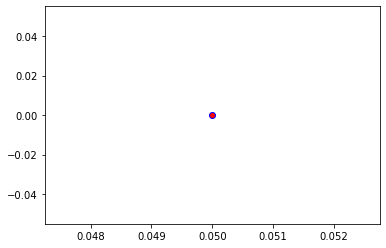

Crafting adversarial images took: 7.6945624351501465 seconds 

Images classified as:
000000080057 470 = candle
000000080153 537 = dogsled
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


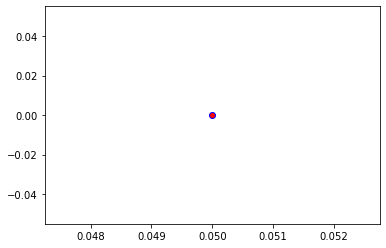

Crafting adversarial images took: 7.9638755321502686 seconds 

Images classified as:
000000080273 248 = ski
000000080274 385 = Indian elephant
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


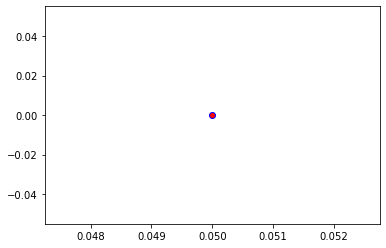

Crafting adversarial images took: 7.76986837387085 seconds 

Images classified as:
000000080340 523 = crutch
000000080413 485 = CD player
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


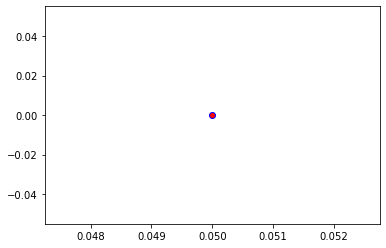

Crafting adversarial images took: 7.784444093704224 seconds 

Images classified as:
000000080659 603 = horse cart
000000080666 285 = Egyptian cat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


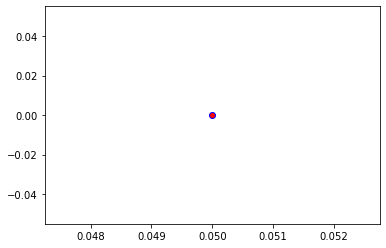

Crafting adversarial images took: 7.717471361160278 seconds 

Images classified as:
000000080671 248 = ski
000000080932 963 = pizza
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


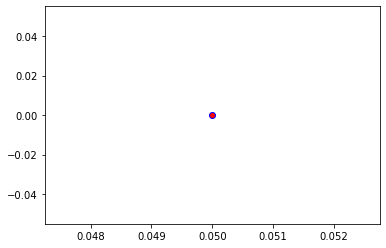

Crafting adversarial images took: 7.733304262161255 seconds 

Images classified as:
000000080949 620 = laptop
000000081061 831 = studio couch
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


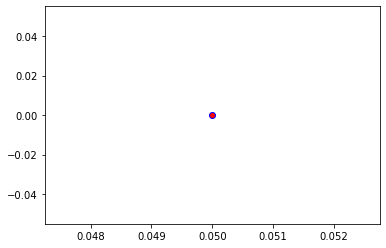

Crafting adversarial images took: 7.848398685455322 seconds 

Images classified as:
000000081394 675 = moving van
000000081594 879 = umbrella
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


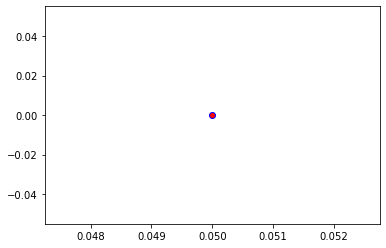

Crafting adversarial images took: 7.6991963386535645 seconds 

Images classified as:
000000081738 79 = centipede
000000081766 256 = Newfoundland
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


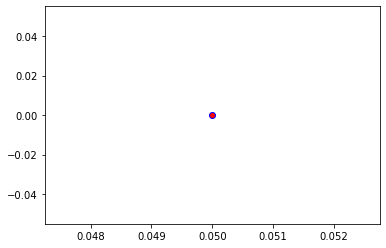

Crafting adversarial images took: 10.587254285812378 seconds 

Images classified as:
000000081988 693 = paddle
000000082085 705 = passenger car
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


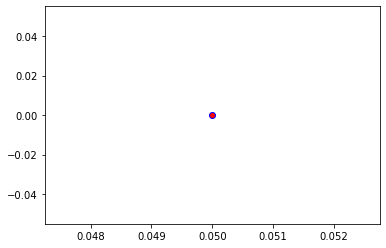

Crafting adversarial images took: 9.070218801498413 seconds 

Images classified as:
000000082180 850 = teddy
000000082688 793 = shower cap
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


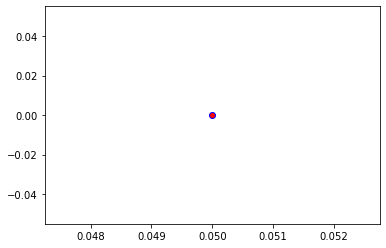

Crafting adversarial images took: 8.614439487457275 seconds 

Images classified as:
000000082696 203 = West Highland white terrier
000000082715 2 = great white shark
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


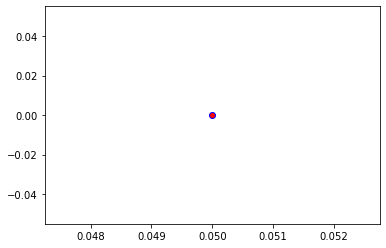

Crafting adversarial images took: 10.757956743240356 seconds 

Images classified as:
000000082765 750 = quilt
000000082807 219 = cocker spaniel
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


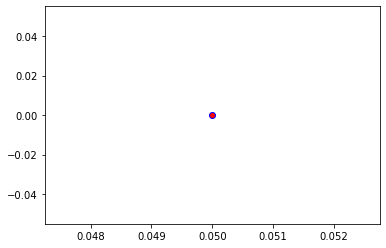

Crafting adversarial images took: 9.122233152389526 seconds 

Images classified as:
000000082812 874 = trolleybus
000000082821 449 = boathouse
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


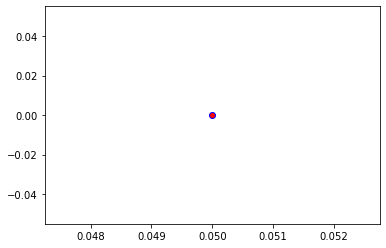

Crafting adversarial images took: 9.46188497543335 seconds 

Images classified as:
000000082846 874 = trolleybus
000000082986 671 = mountain bike
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


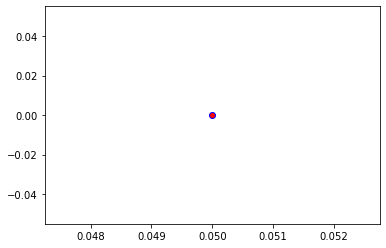

Crafting adversarial images took: 11.205393314361572 seconds 

Images classified as:
000000083113 354 = Arabian camel
000000083172 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


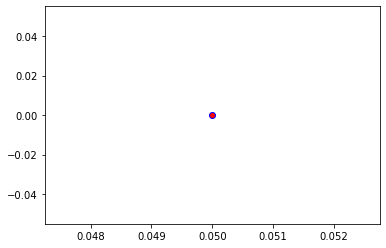

Crafting adversarial images took: 8.553582668304443 seconds 

Images classified as:
000000083531 467 = butcher shop
000000083540 140 = alp
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


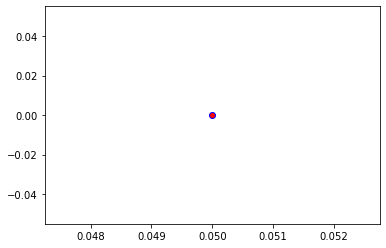

Crafting adversarial images took: 8.672018766403198 seconds 

Images classified as:
000000084031 981 = ballplayer
000000084170 874 = trolleybus
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


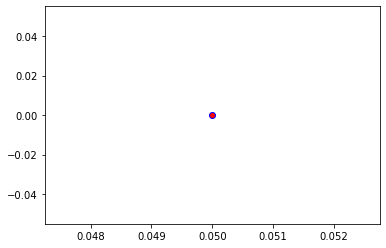

Crafting adversarial images took: 9.878897428512573 seconds 

Images classified as:
000000084241 469 = caldron
000000084270 877 = turnstile
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


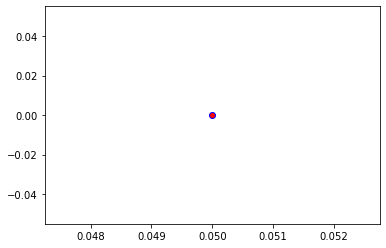

Crafting adversarial images took: 9.45473337173462 seconds 

Images classified as:
000000084362 236 = Doberman
000000084431 965 = burrito
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


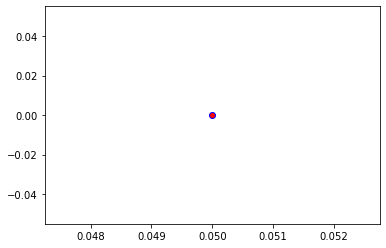

Crafting adversarial images took: 9.389794111251831 seconds 

Images classified as:
000000084477 879 = umbrella
000000084492 421 = bannister
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


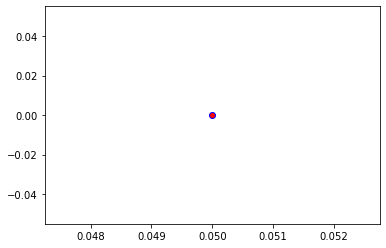

Crafting adversarial images took: 9.933527946472168 seconds 

Images classified as:
000000084650 155 = Shih-Tzu
000000084664 461 = plate
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


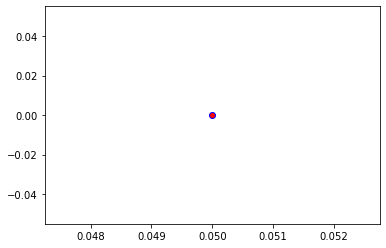

Crafting adversarial images took: 9.003963947296143 seconds 

Images classified as:
000000084674 457 = bow tie
000000084752 895 = warplane
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


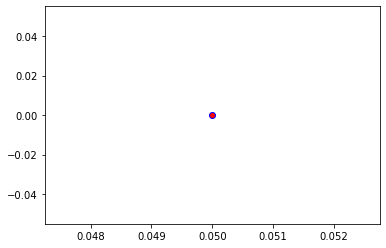

Crafting adversarial images took: 10.312872886657715 seconds 

Images classified as:
000000085089 966 = red wine
000000085157 697 = pajama
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


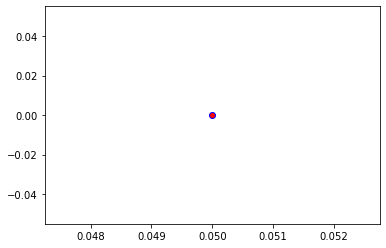

Crafting adversarial images took: 9.28059196472168 seconds 

Images classified as:
000000085195 928 = ice cream
000000085329 903 = wig
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


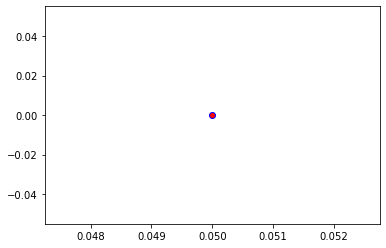

Crafting adversarial images took: 9.939115762710571 seconds 

Images classified as:
000000085376 919 = street sign
000000085478 296 = ice bear
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


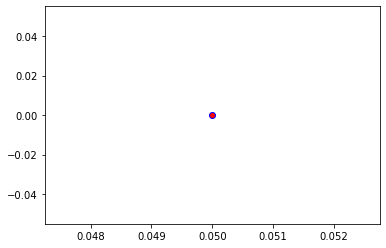

Crafting adversarial images took: 9.20017123222351 seconds 

Images classified as:
000000085576 896 = washbasin
000000085665 701 = parachute
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


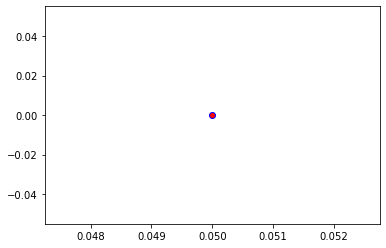

Crafting adversarial images took: 9.887844324111938 seconds 

Images classified as:
000000085682 248 = ski
000000085772 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


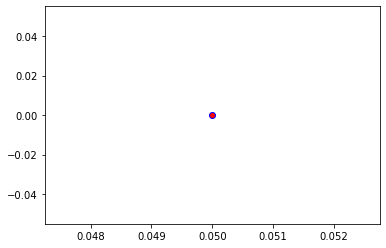

Crafting adversarial images took: 8.514240980148315 seconds 

Images classified as:
000000085823 340 = zebra
000000085911 129 = spoonbill
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


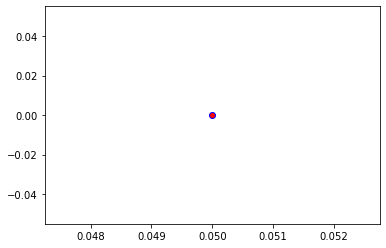

Crafting adversarial images took: 9.614703178405762 seconds 

Images classified as:
000000086220 874 = trolleybus
000000086483 919 = street sign
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


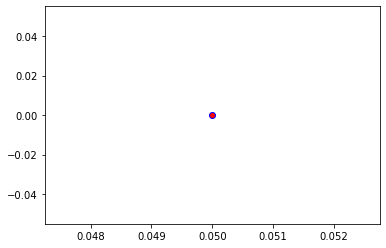

Crafting adversarial images took: 9.173266649246216 seconds 

Images classified as:
000000086582 526 = desk
000000086755 248 = ski
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


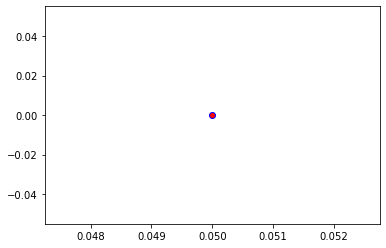

Crafting adversarial images took: 9.088828802108765 seconds 

Images classified as:
000000086956 731 = plunger
000000087038 880 = unicycle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


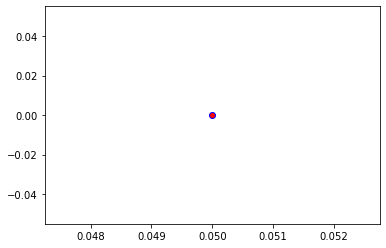

Crafting adversarial images took: 8.844057083129883 seconds 

Images classified as:
000000087144 703 = park bench
000000087244 637 = mailbox
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


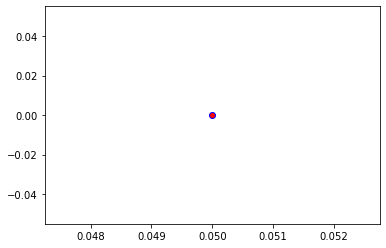

Crafting adversarial images took: 8.741148233413696 seconds 

Images classified as:
000000087470 690 = oxcart
000000087476 852 = tennis ball
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


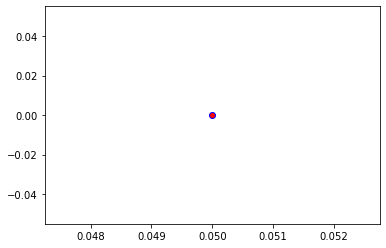

Crafting adversarial images took: 9.117537021636963 seconds 

Images classified as:
000000087742 799 = sliding door
000000087875 708 = pedestal
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


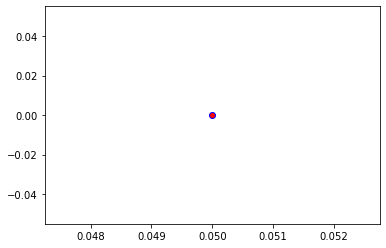

Crafting adversarial images took: 9.425770998001099 seconds 

Images classified as:
000000088040 461 = plate
000000088218 920 = traffic light
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


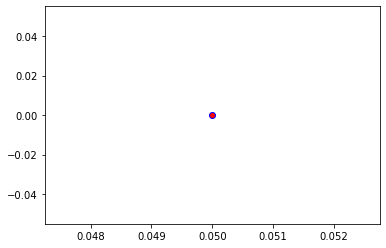

Crafting adversarial images took: 9.100269317626953 seconds 

Images classified as:
000000088250 386 = African elephant
000000088265 603 = horse cart
Min values in image-array: 1.3873053 Max values in image-array: 255.0
Min values in image-array: 0.0054404126 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


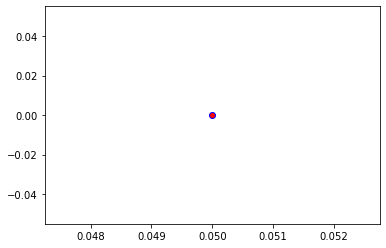

Crafting adversarial images took: 8.847058057785034 seconds 

Images classified as:
000000088269 809 = soup bowl
000000088345 490 = chain mail
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


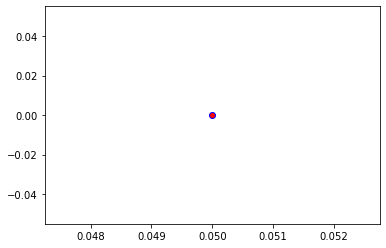

Crafting adversarial images took: 9.255925178527832 seconds 

Images classified as:
000000088432 583 = guillotine
000000088462 779 = school bus
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


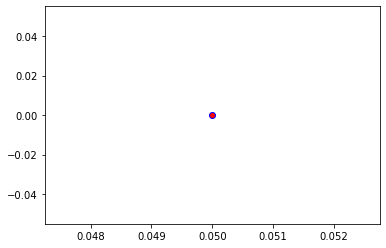

Crafting adversarial images took: 8.731817245483398 seconds 

Images classified as:
000000088485 752 = racket
000000088848 463 = bucket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


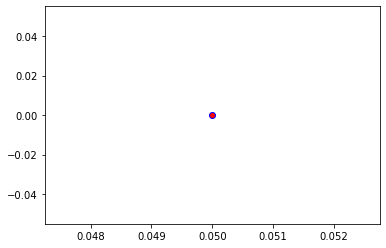

Crafting adversarial images took: 8.522295713424683 seconds 

Images classified as:
000000088951 703 = park bench
000000088970 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


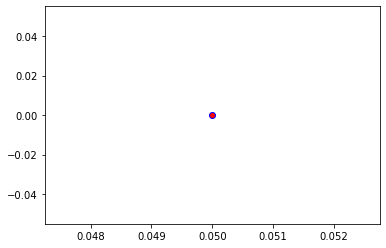

Crafting adversarial images took: 8.468200922012329 seconds 

Images classified as:
000000089045 831 = studio couch
000000089078 248 = ski
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


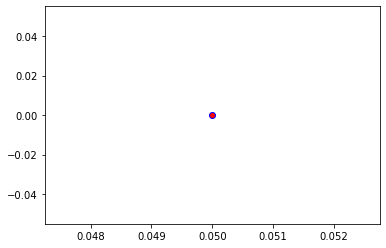

Crafting adversarial images took: 8.241660833358765 seconds 

Images classified as:
000000089271 281 = tabby
000000089296 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


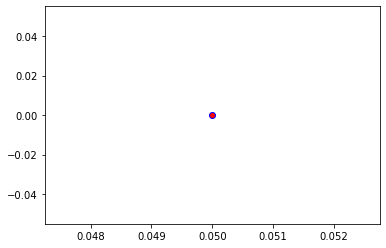

Crafting adversarial images took: 8.124951601028442 seconds 

Images classified as:
000000089556 734 = police van
000000089648 788 = shoe shop
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


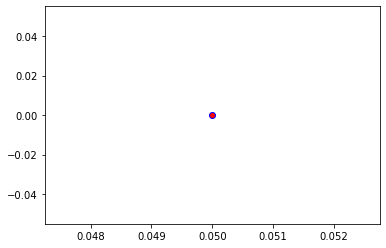

Crafting adversarial images took: 8.379466772079468 seconds 

Images classified as:
000000089670 415 = bakery
000000089697 843 = swing
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


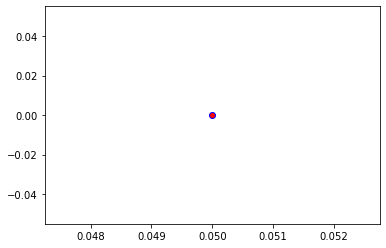

Crafting adversarial images took: 8.280585050582886 seconds 

Images classified as:
000000089761 861 = toilet seat
000000089880 170 = Irish wolfhound
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


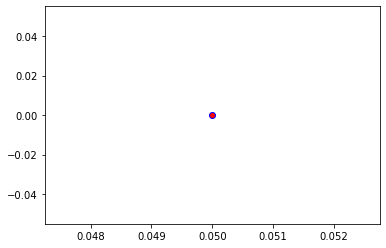

Crafting adversarial images took: 8.204270601272583 seconds 

Images classified as:
000000090003 205 = flat-coated retriever
000000090062 37 = ox
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


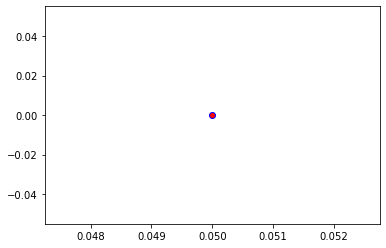

Crafting adversarial images took: 9.1987624168396 seconds 

Images classified as:
000000090108 896 = washbasin
000000090155 547 = electric locomotive
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


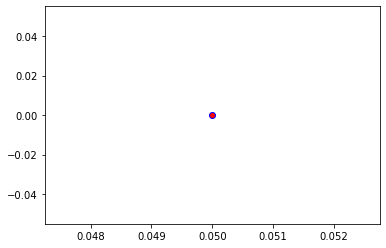

Crafting adversarial images took: 10.206387996673584 seconds 

Images classified as:
000000090208 874 = trolleybus
000000090284 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


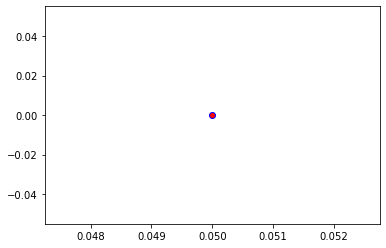

Crafting adversarial images took: 9.426074743270874 seconds 

Images classified as:
000000090631 895 = warplane
000000090891 955 = jackfruit
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


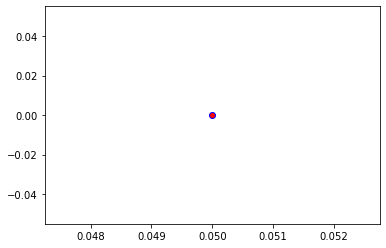

Crafting adversarial images took: 9.243714570999146 seconds 

Images classified as:
000000090956 248 = ski
000000091406 415 = bakery
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


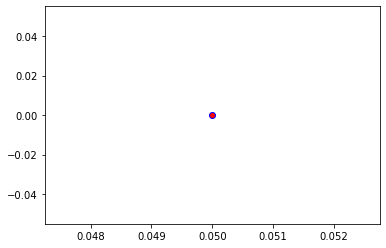

Crafting adversarial images took: 8.354816675186157 seconds 

Images classified as:
000000091495 981 = ballplayer
000000091500 691 = oxygen mask
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


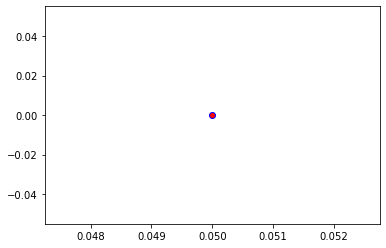

Crafting adversarial images took: 8.516969442367554 seconds 

Images classified as:
000000091615 651 = microwave
000000091619 919 = street sign
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


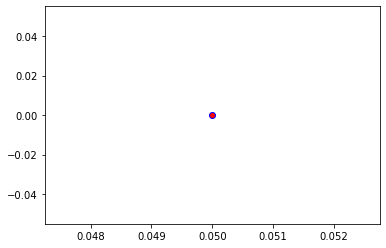

Crafting adversarial images took: 8.303600072860718 seconds 

Images classified as:
000000091654 809 = soup bowl
000000091779 934 = hotdog
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


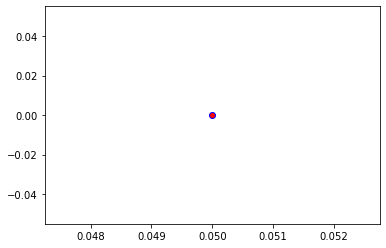

Crafting adversarial images took: 8.694933652877808 seconds 

Images classified as:
000000091921 340 = zebra
000000092053 461 = plate
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


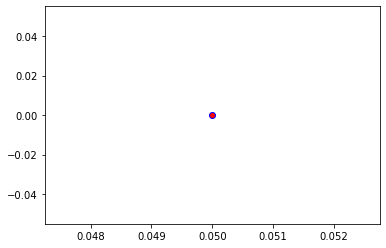

Crafting adversarial images took: 10.805232763290405 seconds 

Images classified as:
000000092091 929 = ice lolly
000000092124 794 = shower curtain
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


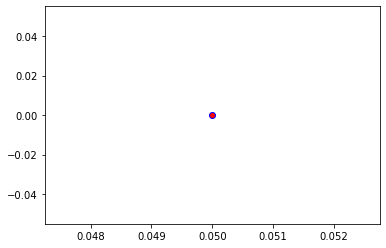

Crafting adversarial images took: 9.223764419555664 seconds 

Images classified as:
000000092177 470 = candle
000000092416 639 = suit
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


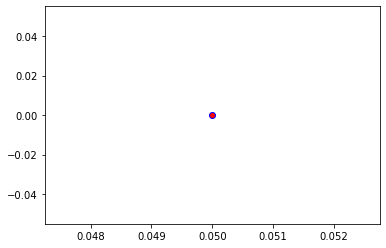

Crafting adversarial images took: 8.390331506729126 seconds 

Images classified as:
000000092660 937 = broccoli
000000092839 296 = ice bear
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


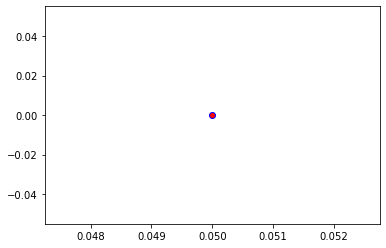

Crafting adversarial images took: 8.672121047973633 seconds 

Images classified as:
000000092939 927 = trifle
000000093154 920 = traffic light
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


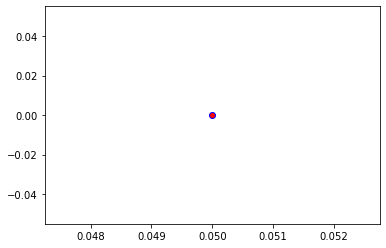

Crafting adversarial images took: 8.801182270050049 seconds 

Images classified as:
000000093261 842 = swimming trunks
000000093353 934 = hotdog
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


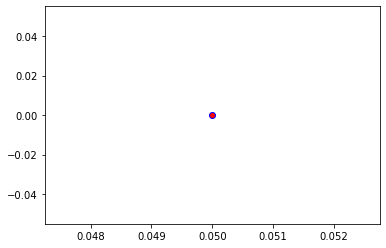

Crafting adversarial images took: 8.394833087921143 seconds 

Images classified as:
000000093437 887 = vestment
000000093717 421 = bannister
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


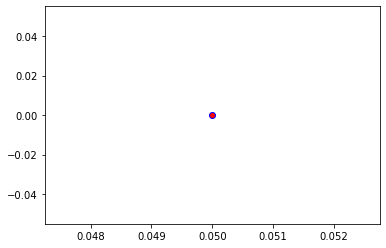

Crafting adversarial images took: 9.00434947013855 seconds 

Images classified as:
000000093965 340 = zebra
000000094157 442 = bell cote
Min values in image-array: 0.0 Max values in image-array: 254.67207
Min values in image-array: 0.0 Max values in image-array: 0.998714
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


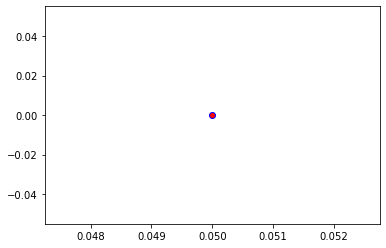

Crafting adversarial images took: 9.000436067581177 seconds 

Images classified as:
000000094185 860 = tobacco shop
000000094326 703 = park bench
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


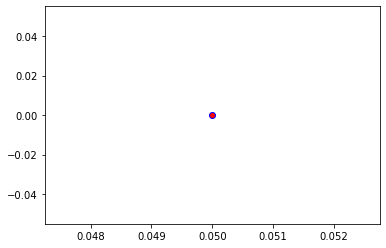

Crafting adversarial images took: 8.122241497039795 seconds 

Images classified as:
000000094336 896 = washbasin
000000094614 248 = ski
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


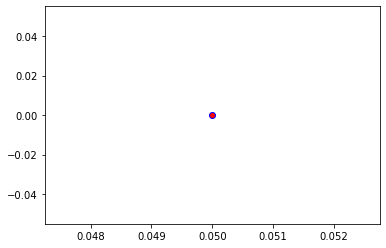

Crafting adversarial images took: 10.366583585739136 seconds 

Images classified as:
000000094751 920 = traffic light
000000094852 386 = African elephant
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


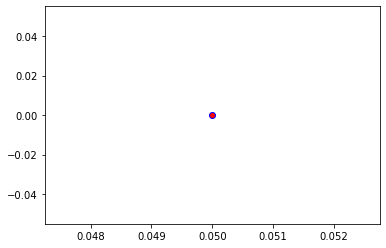

Crafting adversarial images took: 9.528417110443115 seconds 

Images classified as:
000000094871 5 = ram
000000094944 140 = alp
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


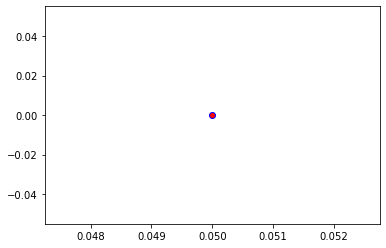

Crafting adversarial images took: 9.164969444274902 seconds 

Images classified as:
000000095069 483 = castle
000000095155 248 = ski
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


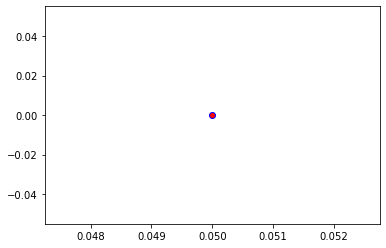

Crafting adversarial images took: 9.147888660430908 seconds 

Images classified as:
000000095707 928 = ice cream
000000095786 504 = coffee mug
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


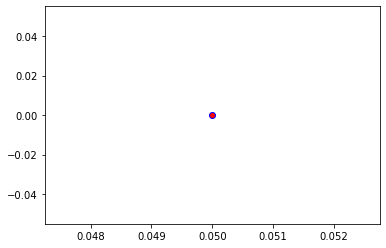

Crafting adversarial images took: 9.016562700271606 seconds 

Images classified as:
000000095843 757 = recreational vehicle
000000095862 981 = ballplayer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


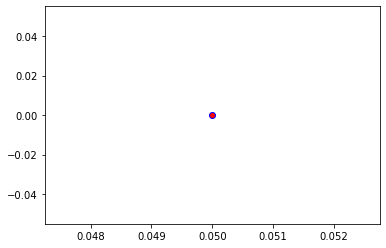

Crafting adversarial images took: 8.273490190505981 seconds 

Images classified as:
000000095899 919 = street sign
000000096001 623 = letter opener
Min values in image-array: 0.33289444 Max values in image-array: 255.0
Min values in image-array: 0.0013054684 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


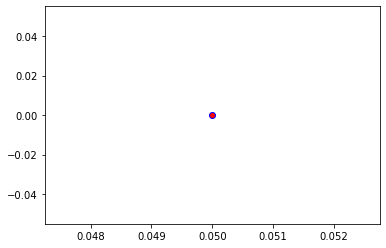

Crafting adversarial images took: 8.412075996398926 seconds 

Images classified as:
000000096427 752 = racket
000000096493 529 = diaper
Min values in image-array: 0.0 Max values in image-array: 253.23886
Min values in image-array: 0.0 Max values in image-array: 0.99309355
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


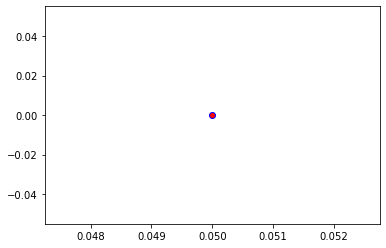

Crafting adversarial images took: 8.475282192230225 seconds 

Images classified as:
000000096549 404 = airliner
000000096825 537 = dogsled
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


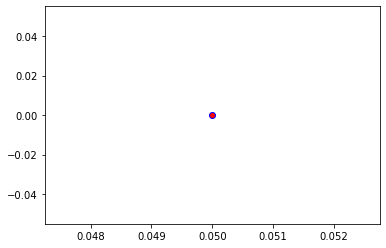

Crafting adversarial images took: 9.402084589004517 seconds 

Images classified as:
000000096960 296 = ice bear
000000097022 651 = microwave
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


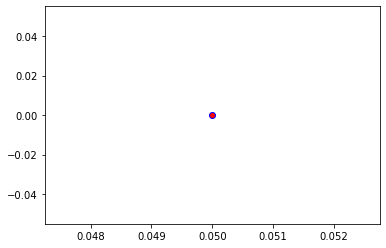

Crafting adversarial images took: 8.64418077468872 seconds 

Images classified as:
000000097230 386 = African elephant
000000097278 248 = ski
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


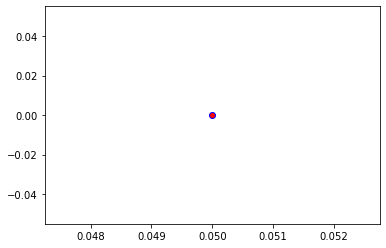

Crafting adversarial images took: 9.085773468017578 seconds 

Images classified as:
000000097337 598 = home theater
000000097585 883 = vase
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


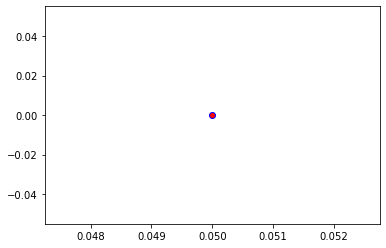

Crafting adversarial images took: 9.453333139419556 seconds 

Images classified as:
000000097679 656 = minivan
000000097924 856 = thresher
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


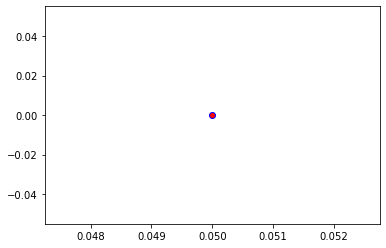

Crafting adversarial images took: 9.037688493728638 seconds 

Images classified as:
000000097988 890 = volleyball
000000097994 527 = desktop computer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


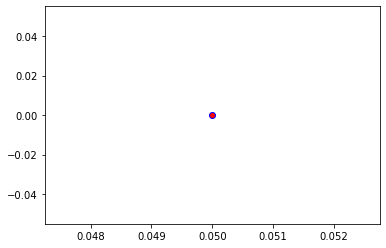

Crafting adversarial images took: 8.528121948242188 seconds 

Images classified as:
000000098018 739 = potter's wheel
000000098261 10 = brambling
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


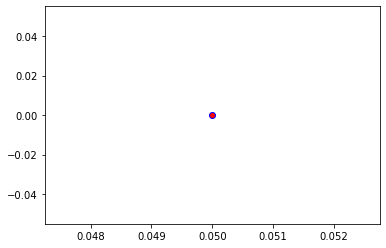

Crafting adversarial images took: 8.402514934539795 seconds 

Images classified as:
000000098287 703 = park bench
000000098392 442 = bell cote
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


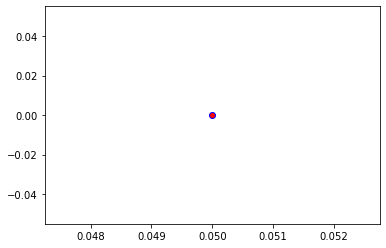

Crafting adversarial images took: 8.755543947219849 seconds 

Images classified as:
000000098497 900 = water tower
000000098520 404 = airliner
Min values in image-array: 1.0611837 Max values in image-array: 255.0
Min values in image-array: 0.0041615046 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


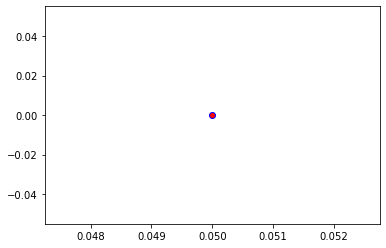

Crafting adversarial images took: 8.187090635299683 seconds 

Images classified as:
000000098633 927 = trifle
000000098716 703 = park bench
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


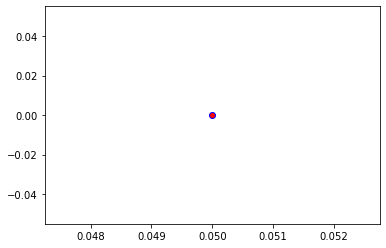

Crafting adversarial images took: 8.747527599334717 seconds 

Images classified as:
000000098839 281 = tabby
000000098853 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


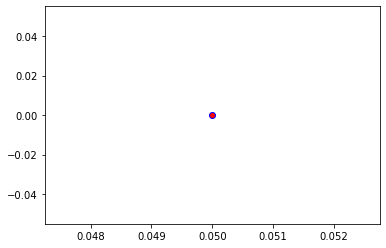

Crafting adversarial images took: 8.611918210983276 seconds 

Images classified as:
000000099024 840 = swab
000000099039 762 = restaurant
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


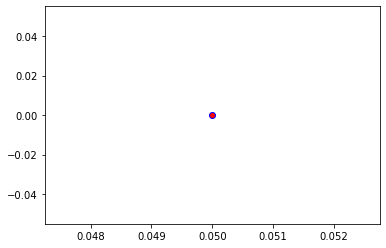

Crafting adversarial images took: 8.100337743759155 seconds 

Images classified as:
000000099053 809 = soup bowl
000000099054 404 = airliner
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


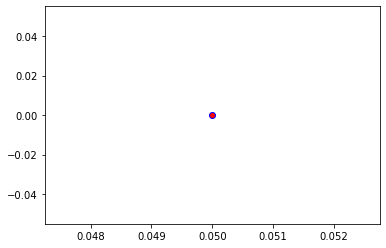

Crafting adversarial images took: 8.031126737594604 seconds 

Images classified as:
000000099114 646 = maze
000000099182 918 = crossword puzzle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


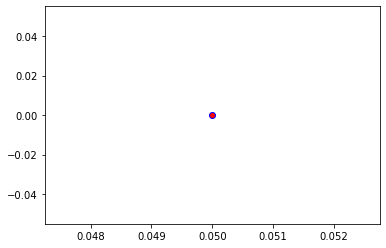

Crafting adversarial images took: 8.125407218933105 seconds 

Images classified as:
000000099242 248 = ski
000000099428 593 = harmonica
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


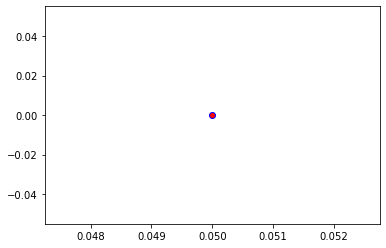

Crafting adversarial images took: 8.42967414855957 seconds 

Images classified as:
000000099810 910 = wooden spoon
000000100238 641 = maraca
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


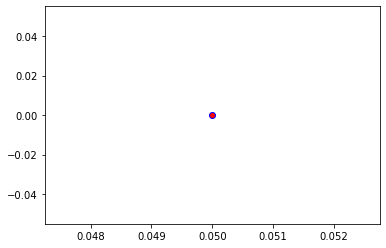

Crafting adversarial images took: 8.486719369888306 seconds 

Images classified as:
000000100274 536 = dock
000000100283 919 = street sign
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


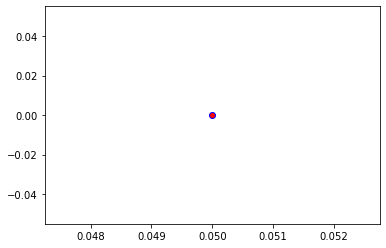

Crafting adversarial images took: 8.488308906555176 seconds 

Images classified as:
000000100428 731 = plunger
000000100489 16 = bulbul
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


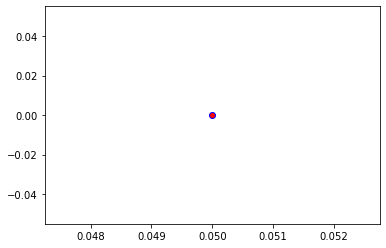

Crafting adversarial images took: 8.264551877975464 seconds 

Images classified as:
000000100510 339 = sorrel
000000100582 965 = burrito
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


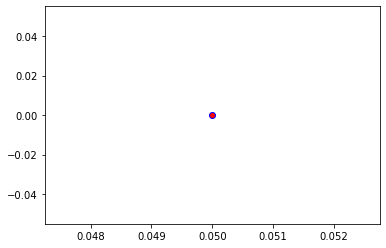

Crafting adversarial images took: 8.29185438156128 seconds 

Images classified as:
000000100624 487 = cellular telephone
000000100723 430 = basketball
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


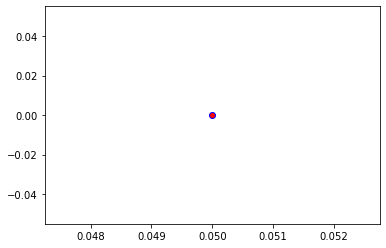

Crafting adversarial images took: 8.176466703414917 seconds 

Images classified as:
000000101022 448 = birdhouse
000000101068 981 = ballplayer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


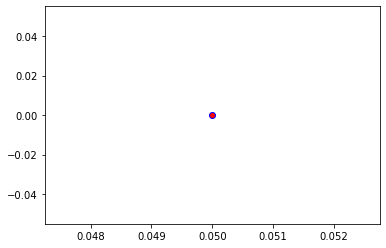

Crafting adversarial images took: 8.614268064498901 seconds 

Images classified as:
000000101420 750 = quilt
000000101762 880 = unicycle
Min values in image-array: 0.0 Max values in image-array: 254.8966
Min values in image-array: 0.0 Max values in image-array: 0.9995945
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


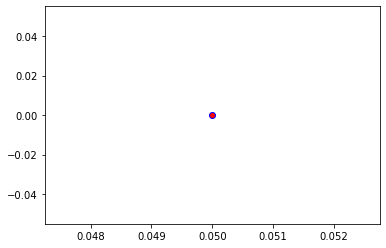

Crafting adversarial images took: 8.488412618637085 seconds 

Images classified as:
000000101780 354 = Arabian camel
000000101787 405 = airship
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


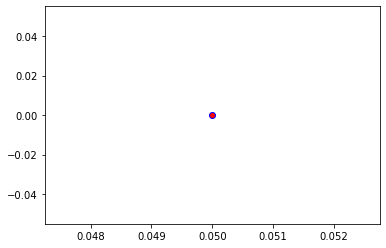

Crafting adversarial images took: 8.504418849945068 seconds 

Images classified as:
000000101884 498 = cinema
000000102331 671 = mountain bike
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


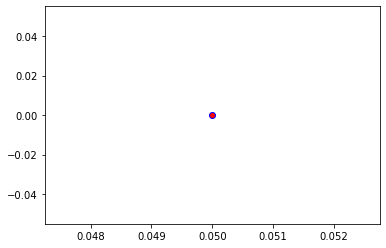

Crafting adversarial images took: 8.218778610229492 seconds 

Images classified as:
000000102356 670 = motor scooter
000000102411 665 = moped
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


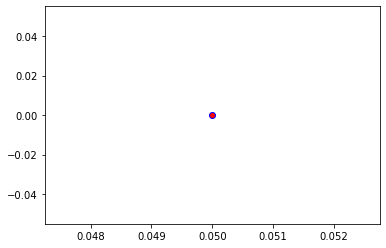

Crafting adversarial images took: 8.702614784240723 seconds 

Images classified as:
000000102644 861 = toilet seat
000000102707 794 = shower curtain
Min values in image-array: 0.0 Max values in image-array: 254.8945
Min values in image-array: 0.0 Max values in image-array: 0.9995863
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


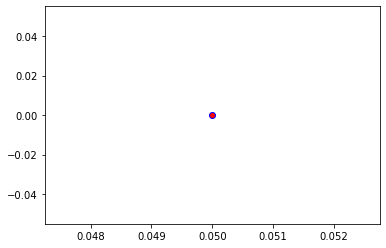

Crafting adversarial images took: 8.829851388931274 seconds 

Images classified as:
000000102805 975 = lakeside
000000102820 122 = American lobster
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


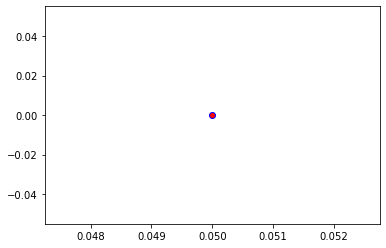

Crafting adversarial images took: 7.951702117919922 seconds 

Images classified as:
000000103548 346 = water buffalo
000000103585 648 = medicine chest
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


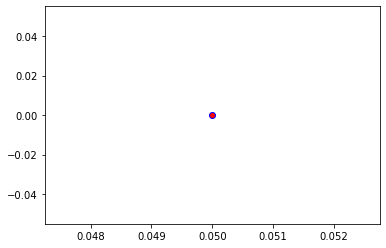

Crafting adversarial images took: 9.223321914672852 seconds 

Images classified as:
000000103723 385 = Indian elephant
000000104119 83 = prairie chicken
Min values in image-array: 1.3572464 Max values in image-array: 255.0
Min values in image-array: 0.005322535 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


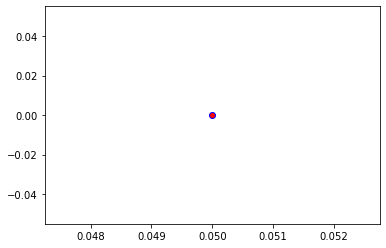

Crafting adversarial images took: 8.865906238555908 seconds 

Images classified as:
000000104198 919 = street sign
000000104424 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


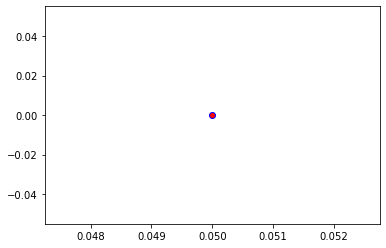

Crafting adversarial images took: 8.470906019210815 seconds 

Images classified as:
000000104455 340 = zebra
000000104572 794 = shower curtain
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


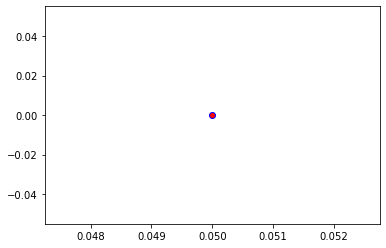

Crafting adversarial images took: 8.383754253387451 seconds 

Images classified as:
000000104603 295 = American black bear
000000104612 937 = broccoli
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


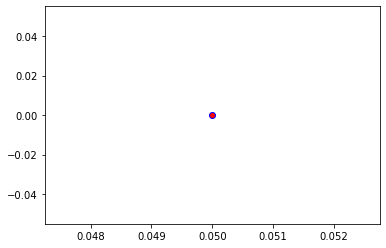

Crafting adversarial images took: 8.335458755493164 seconds 

Images classified as:
000000104619 354 = Arabian camel
000000104666 453 = bookcase
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


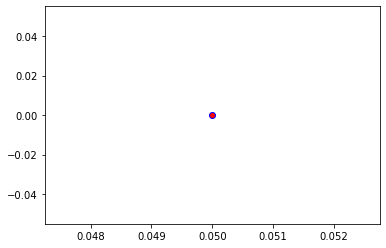

Crafting adversarial images took: 8.222076892852783 seconds 

Images classified as:
000000104669 461 = plate
000000104782 919 = street sign
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


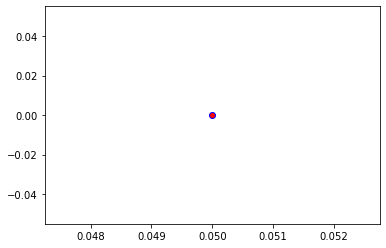

Crafting adversarial images took: 9.382843732833862 seconds 

Images classified as:
000000104803 861 = toilet seat
000000105014 910 = wooden spoon
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


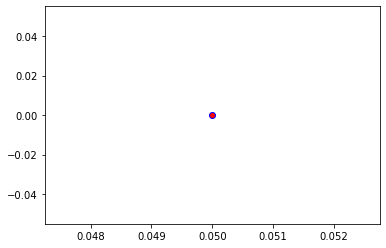

Crafting adversarial images took: 8.333303928375244 seconds 

Images classified as:
000000105249 861 = toilet seat
000000105264 354 = Arabian camel
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


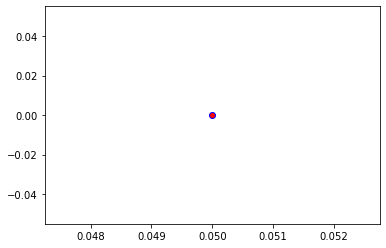

Crafting adversarial images took: 8.992252111434937 seconds 

Images classified as:
000000105335 942 = butternut squash
000000105455 442 = bell cote
Min values in image-array: 0.0 Max values in image-array: 254.86728
Min values in image-array: 0.0 Max values in image-array: 0.99947953
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


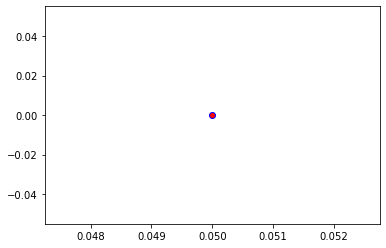

Crafting adversarial images took: 10.114223718643188 seconds 

Images classified as:
000000105912 637 = mailbox
000000105923 799 = sliding door
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


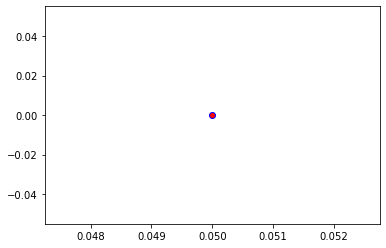

Crafting adversarial images took: 8.496820449829102 seconds 

Images classified as:
000000106048 757 = recreational vehicle
000000106235 831 = studio couch
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


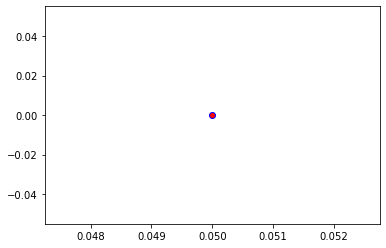

Crafting adversarial images took: 8.74808120727539 seconds 

Images classified as:
000000106266 941 = acorn squash
000000106281 547 = electric locomotive
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


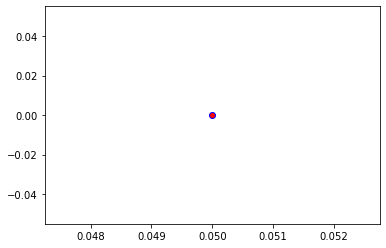

Crafting adversarial images took: 8.551478862762451 seconds 

Images classified as:
000000106330 850 = teddy
000000106389 281 = tabby
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


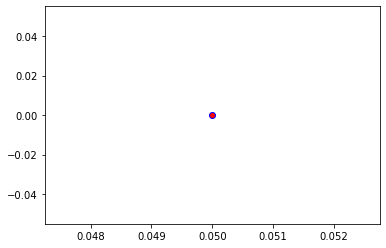

Crafting adversarial images took: 8.518320798873901 seconds 

Images classified as:
000000106563 884 = vault
000000106757 385 = Indian elephant
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


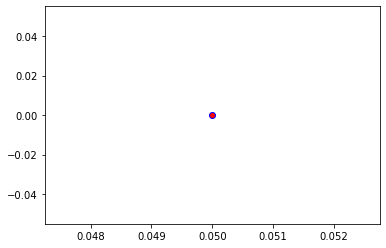

Crafting adversarial images took: 8.587019443511963 seconds 

Images classified as:
000000106881 16 = bulbul
000000106912 880 = unicycle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


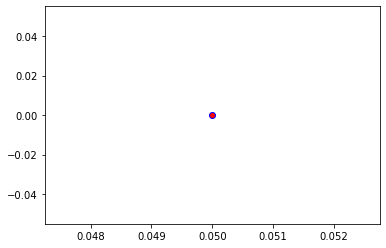

Crafting adversarial images took: 8.564529657363892 seconds 

Images classified as:
000000107087 669 = mosquito net
000000107094 792 = shovel
Min values in image-array: 0.013392806 Max values in image-array: 255.0
Min values in image-array: 5.252081e-05 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


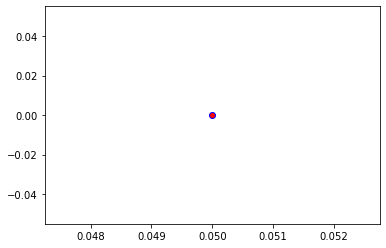

Crafting adversarial images took: 9.310463428497314 seconds 

Images classified as:
000000107226 257 = Great Pyrenees
000000107339 831 = studio couch
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


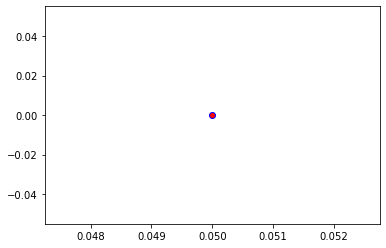

Crafting adversarial images took: 8.291019916534424 seconds 

Images classified as:
000000107554 792 = shovel
000000107851 690 = oxcart
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


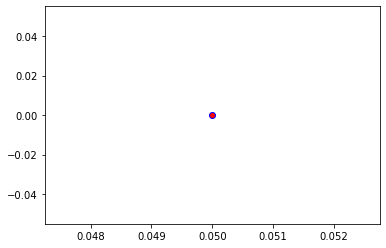

Crafting adversarial images took: 9.18715763092041 seconds 

Images classified as:
000000108026 508 = computer keyboard
000000108244 478 = carton
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


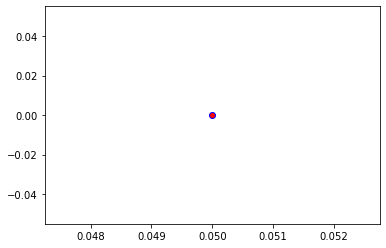

Crafting adversarial images took: 9.765259981155396 seconds 

Images classified as:
000000108253 461 = plate
000000108440 713 = pier
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


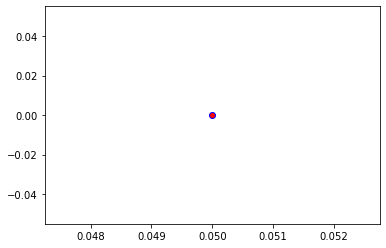

Crafting adversarial images took: 8.981327295303345 seconds 

Images classified as:
000000108495 608 = jean
000000108503 978 = seashore
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


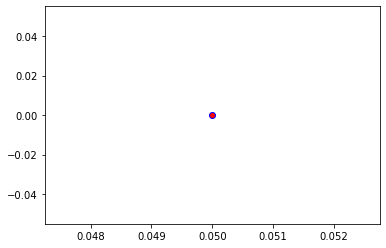

Crafting adversarial images took: 8.579705715179443 seconds 

Images classified as:
000000108864 386 = African elephant
000000109055 545 = electric fan
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


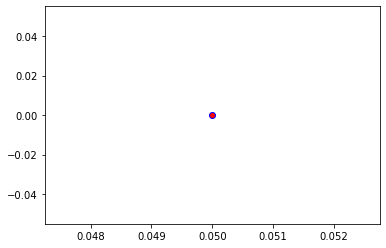

Crafting adversarial images took: 9.124826669692993 seconds 

Images classified as:
000000109118 652 = military uniform
000000109313 747 = punching bag
Min values in image-array: 0.8308253 Max values in image-array: 255.0
Min values in image-array: 0.0032581384 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


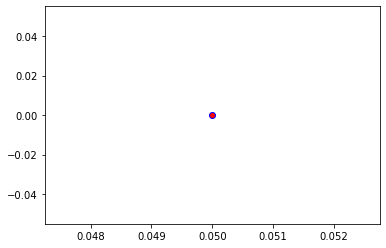

Crafting adversarial images took: 8.727673053741455 seconds 

Images classified as:
000000109441 498 = cinema
000000109798 933 = cheeseburger
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


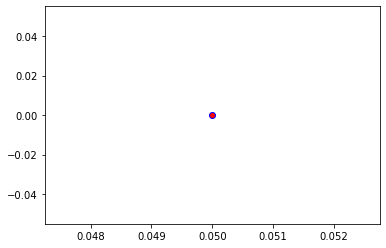

Crafting adversarial images took: 8.532021045684814 seconds 

Images classified as:
000000109827 850 = teddy
000000109900 609 = jeep
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


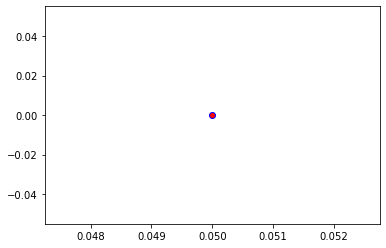

Crafting adversarial images took: 8.286431312561035 seconds 

Images classified as:
000000109916 567 = frying pan
000000109976 651 = microwave
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


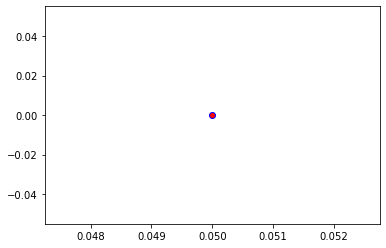

Crafting adversarial images took: 8.94676160812378 seconds 

Images classified as:
000000109992 792 = shovel
000000110042 469 = caldron
Min values in image-array: 0.0 Max values in image-array: 254.94258
Min values in image-array: 0.0 Max values in image-array: 0.9997748
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


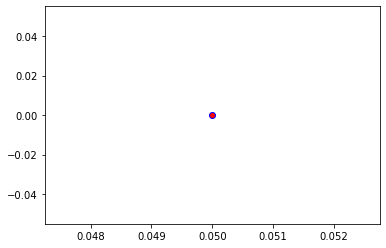

Crafting adversarial images took: 9.04090929031372 seconds 

Images classified as:
000000110211 340 = zebra
000000110282 920 = traffic light
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


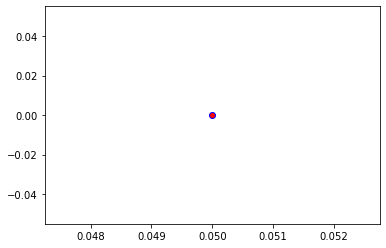

Crafting adversarial images took: 8.321433305740356 seconds 

Images classified as:
000000110359 404 = airliner
000000110449 620 = laptop
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


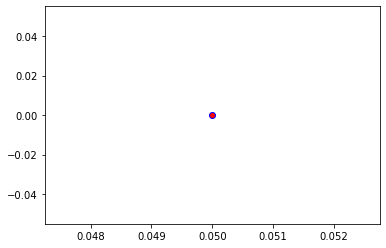

Crafting adversarial images took: 8.324929237365723 seconds 

Images classified as:
000000110638 385 = Indian elephant
000000110721 657 = missile
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


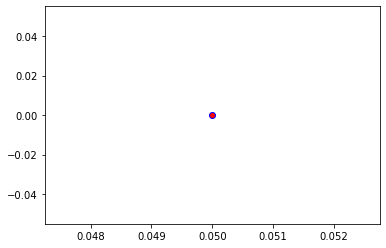

Crafting adversarial images took: 7.985357761383057 seconds 

Images classified as:
000000110784 829 = streetcar
000000110884 896 = washbasin
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


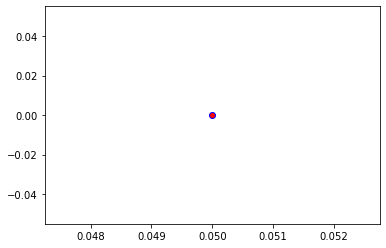

Crafting adversarial images took: 8.626391410827637 seconds 

Images classified as:
000000110972 295 = American black bear
000000110999 607 = jack-o'-lantern
Min values in image-array: 0.0 Max values in image-array: 254.85715
Min values in image-array: 0.0 Max values in image-array: 0.9994398
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


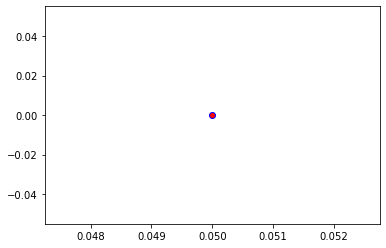

Crafting adversarial images took: 9.888944864273071 seconds 

Images classified as:
000000111036 827 = stove
000000111086 404 = airliner
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


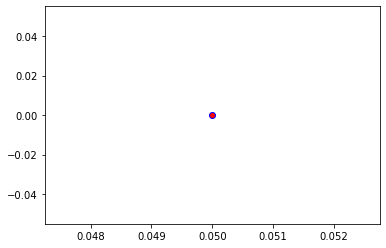

Crafting adversarial images took: 8.667023658752441 seconds 

Images classified as:
000000111179 442 = bell cote
000000111207 634 = lumbermill
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


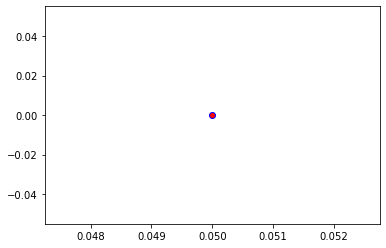

Crafting adversarial images took: 8.345531940460205 seconds 

Images classified as:
000000111609 529 = diaper
000000111951 648 = medicine chest
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


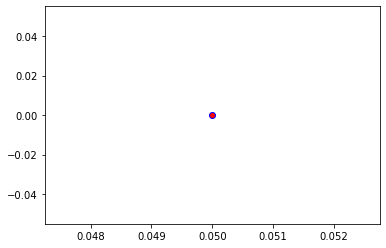

Crafting adversarial images took: 8.28925895690918 seconds 

Images classified as:
000000112110 778 = scale
000000112298 752 = racket
Min values in image-array: 0.0 Max values in image-array: 242.85803
Min values in image-array: 0.0 Max values in image-array: 0.9523844
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


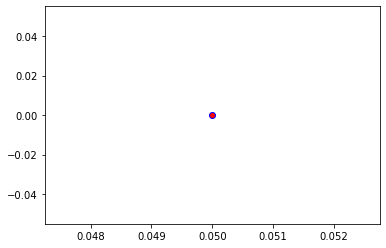

Crafting adversarial images took: 8.501206159591675 seconds 

Images classified as:
000000112378 703 = park bench
000000112626 742 = printer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


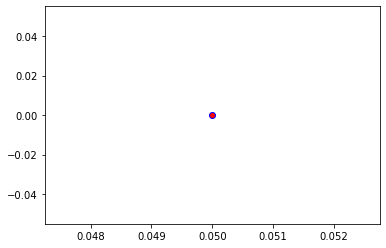

Crafting adversarial images took: 8.343827962875366 seconds 

Images classified as:
000000112634 354 = Arabian camel
000000112798 281 = tabby
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


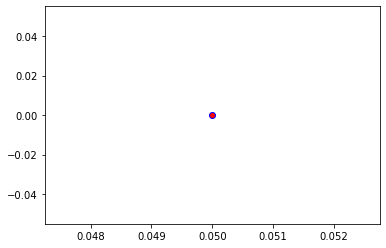

Crafting adversarial images took: 8.436755895614624 seconds 

Images classified as:
000000112997 662 = modem
000000113051 576 = gondola
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


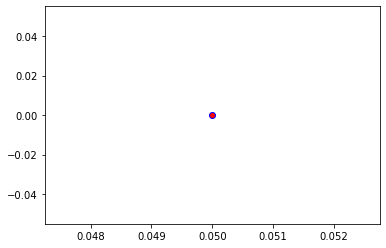

Crafting adversarial images took: 8.25898289680481 seconds 

Images classified as:
000000113235 355 = llama
000000113354 340 = zebra
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


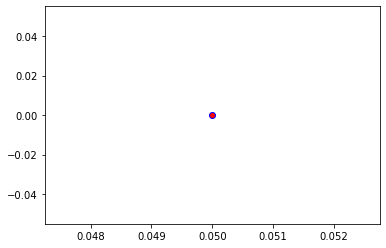

Crafting adversarial images took: 8.382570028305054 seconds 

Images classified as:
000000113403 850 = teddy
000000113589 924 = guacamole
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


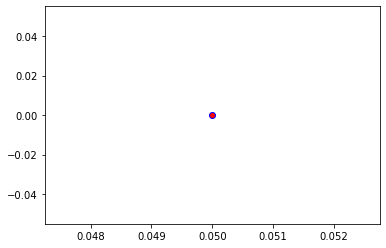

Crafting adversarial images took: 8.015493631362915 seconds 

Images classified as:
000000113720 963 = pizza
000000113867 442 = bell cote
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


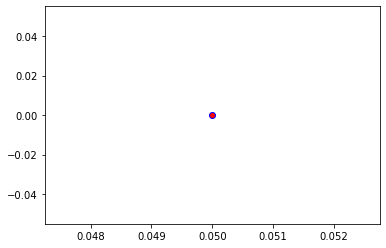

Crafting adversarial images took: 9.032352447509766 seconds 

Images classified as:
000000114049 561 = forklift
000000114770 586 = half track
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


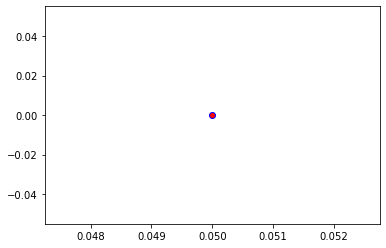

Crafting adversarial images took: 8.281193256378174 seconds 

Images classified as:
000000114871 954 = banana
000000114884 466 = bullet train
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


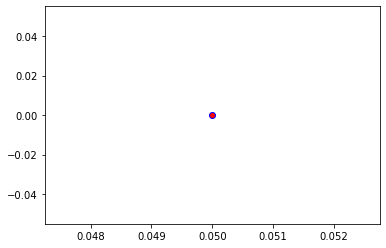

Crafting adversarial images took: 8.109093189239502 seconds 

Images classified as:
000000114907 743 = prison
000000115118 547 = electric locomotive
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


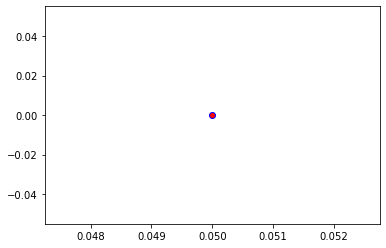

Crafting adversarial images took: 8.690987586975098 seconds 

Images classified as:
000000115245 526 = desk
000000115870 799 = sliding door
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


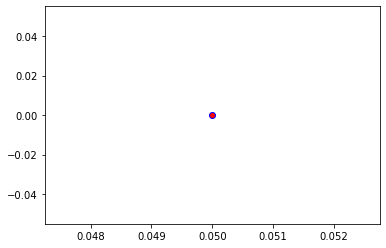

Crafting adversarial images took: 8.550448656082153 seconds 

Images classified as:
000000115885 620 = laptop
000000115898 693 = paddle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


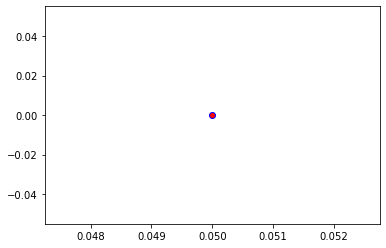

Crafting adversarial images took: 8.581470012664795 seconds 

Images classified as:
000000115946 920 = traffic light
000000116068 775 = sarong
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


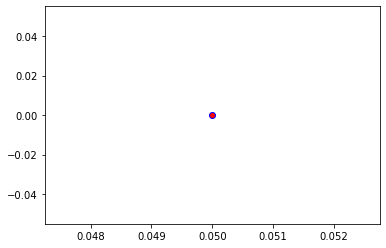

Crafting adversarial images took: 9.206746101379395 seconds 

Images classified as:
000000116206 936 = head cabbage
000000116208 963 = pizza
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


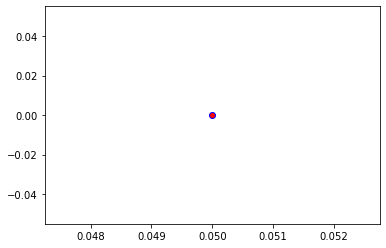

Crafting adversarial images took: 8.698219537734985 seconds 

Images classified as:
000000116362 461 = plate
000000116439 344 = hippopotamus
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


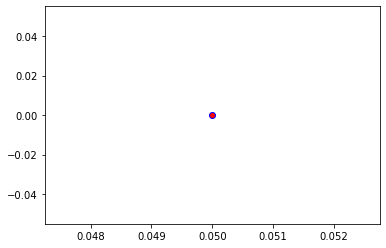

Crafting adversarial images took: 8.792511224746704 seconds 

Images classified as:
000000116479 564 = four-poster
000000116589 340 = zebra
Min values in image-array: 0.0 Max values in image-array: 254.92719
Min values in image-array: 0.0 Max values in image-array: 0.99971443
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


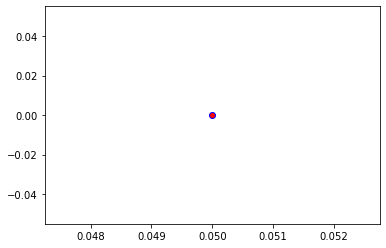

Crafting adversarial images took: 8.601913928985596 seconds 

Images classified as:
000000116825 761 = remote control
000000117197 704 = parking meter
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


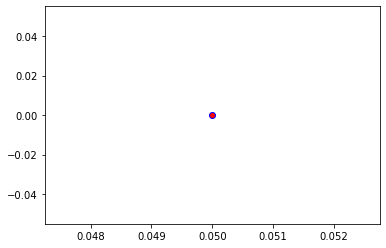

Crafting adversarial images took: 9.090418577194214 seconds 

Images classified as:
000000117374 104 = wallaby
000000117425 813 = spatula
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


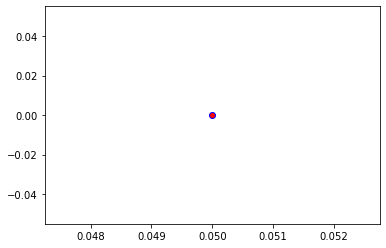

Crafting adversarial images took: 8.488549947738647 seconds 

Images classified as:
000000117492 645 = maypole
000000117525 245 = French bulldog
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


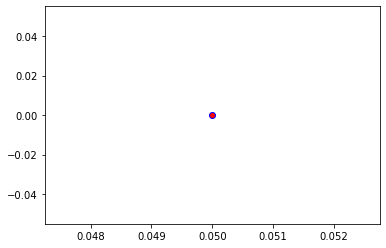

Crafting adversarial images took: 8.15963864326477 seconds 

Images classified as:
000000117645 248 = ski
000000117719 860 = tobacco shop
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


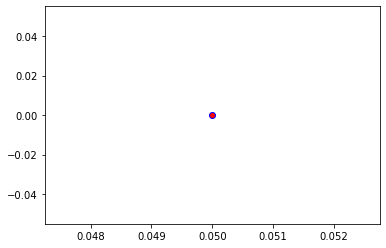

Crafting adversarial images took: 9.68636441230774 seconds 

Images classified as:
000000117744 752 = racket
000000117908 162 = beagle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


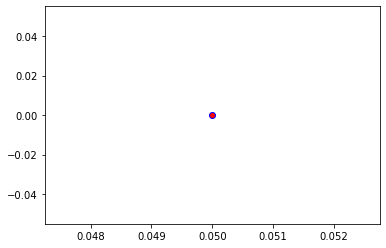

Crafting adversarial images took: 9.624791860580444 seconds 

Images classified as:
000000117914 861 = toilet seat
000000118209 339 = sorrel
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


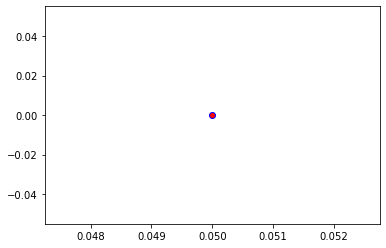

Crafting adversarial images took: 8.13212513923645 seconds 

Images classified as:
000000118367 934 = hotdog
000000118405 919 = street sign
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


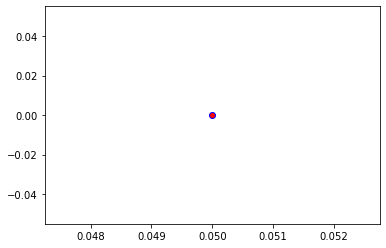

Crafting adversarial images took: 8.474836587905884 seconds 

Images classified as:
000000118515 281 = tabby
000000118594 37 = ox
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


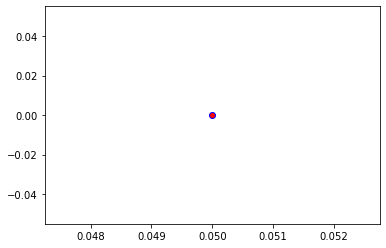

Crafting adversarial images took: 8.183352947235107 seconds 

Images classified as:
000000118921 248 = ski
000000119038 37 = ox
Min values in image-array: 0.0 Max values in image-array: 252.96094
Min values in image-array: 0.0 Max values in image-array: 0.9920037
Model accuracy on own images: 0.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


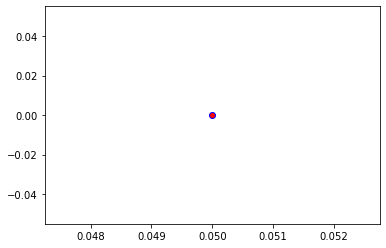

Crafting adversarial images took: 8.378162145614624 seconds 

Images classified as:
000000119088 394 = sturgeon
000000119233 361 = skunk
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


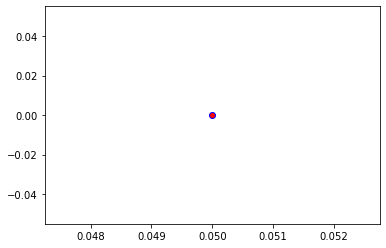

Crafting adversarial images took: 8.246129989624023 seconds 

Images classified as:
000000119365 620 = laptop
000000119445 981 = ballplayer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


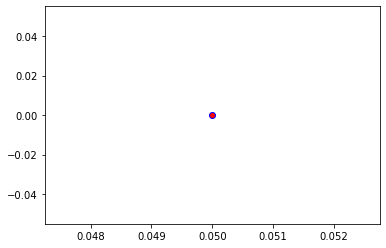

Crafting adversarial images took: 8.285114765167236 seconds 

Images classified as:
000000119452 954 = banana
000000119516 920 = traffic light
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


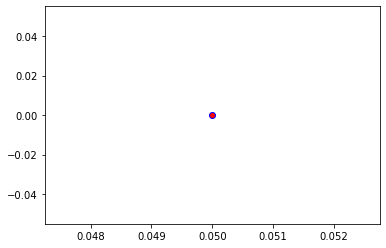

Crafting adversarial images took: 8.17743182182312 seconds 

Images classified as:
000000119641 346 = water buffalo
000000119677 930 = French loaf
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


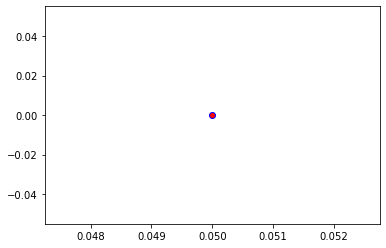

Crafting adversarial images took: 8.6845223903656 seconds 

Images classified as:
000000119828 620 = laptop
000000119911 646 = maze
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


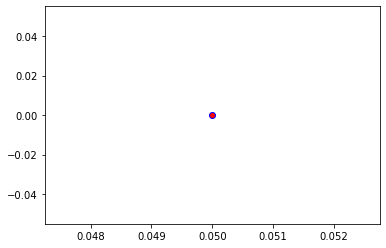

Crafting adversarial images took: 8.370125532150269 seconds 

Images classified as:
000000119995 752 = racket
000000120420 447 = binoculars
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


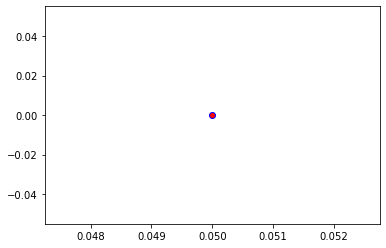

Crafting adversarial images took: 8.282628536224365 seconds 

Images classified as:
000000120572 442 = bell cote
000000120584 892 = wall clock
Min values in image-array: 0.0 Max values in image-array: 249.57144
Min values in image-array: 0.0 Max values in image-array: 0.97871155
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


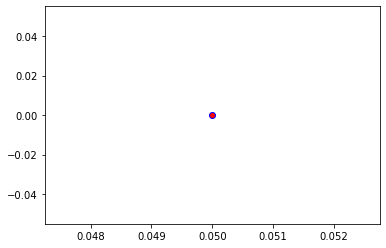

Crafting adversarial images took: 9.194209814071655 seconds 

Images classified as:
000000120777 461 = plate
000000120853 964 = potpie
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


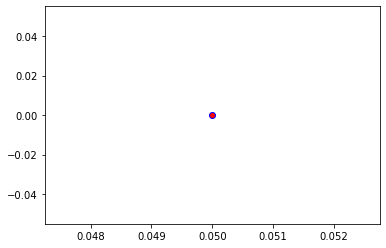

Crafting adversarial images took: 9.209638595581055 seconds 

Images classified as:
000000121031 690 = oxcart
000000121153 919 = street sign
Min values in image-array: 0.0 Max values in image-array: 254.82005
Min values in image-array: 0.0 Max values in image-array: 0.99929434
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


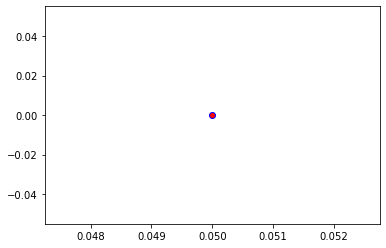

Crafting adversarial images took: 9.012352705001831 seconds 

Images classified as:
000000121242 603 = horse cart
000000121417 879 = umbrella
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


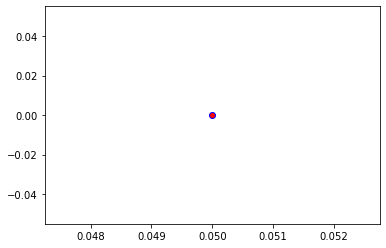

Crafting adversarial images took: 9.28876805305481 seconds 

Images classified as:
000000121497 822 = steel drum
000000121506 807 = solar dish
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


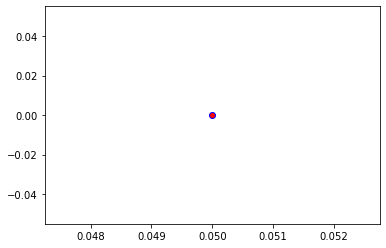

Crafting adversarial images took: 9.5442636013031 seconds 

Images classified as:
000000121586 526 = desk
000000121591 921 = book jacket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


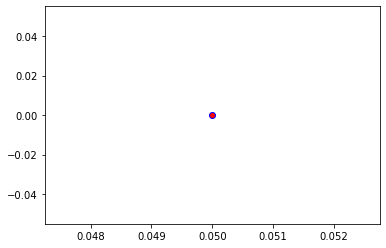

Crafting adversarial images took: 8.99705457687378 seconds 

Images classified as:
000000121673 472 = canoe
000000121744 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


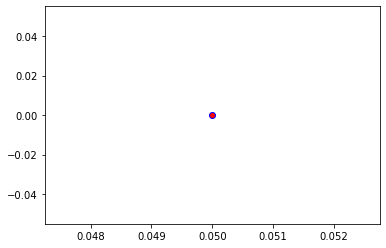

Crafting adversarial images took: 8.536865949630737 seconds 

Images classified as:
000000122046 879 = umbrella
000000122166 734 = police van
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


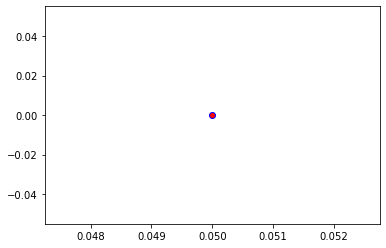

Crafting adversarial images took: 8.007262468338013 seconds 

Images classified as:
000000122217 751 = racer
000000122606 829 = streetcar
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


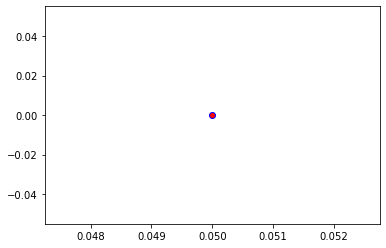

Crafting adversarial images took: 8.107539653778076 seconds 

Images classified as:
000000122672 211 = vizsla
000000122745 919 = street sign
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


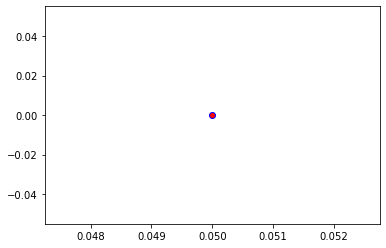

Crafting adversarial images took: 8.279439449310303 seconds 

Images classified as:
000000122927 82 = partridge
000000122962 624 = library
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


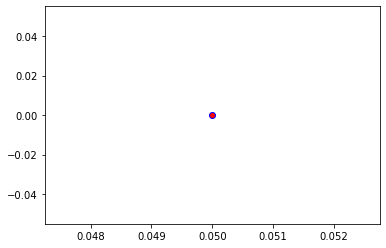

Crafting adversarial images took: 7.950179815292358 seconds 

Images classified as:
000000122969 340 = zebra
000000123131 867 = trailer truck
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


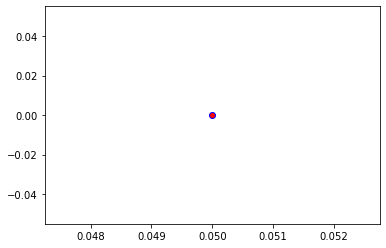

Crafting adversarial images took: 8.06148362159729 seconds 

Images classified as:
000000123213 981 = ballplayer
000000123321 925 = consomme
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


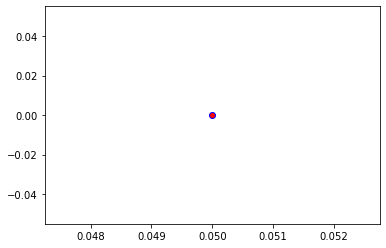

Crafting adversarial images took: 8.08135461807251 seconds 

Images classified as:
000000123480 929 = ice lolly
000000123585 15 = robin
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


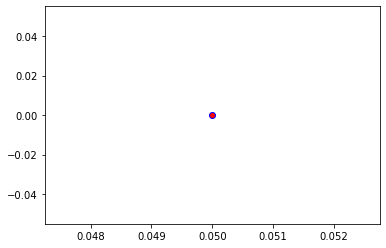

Crafting adversarial images took: 7.992598295211792 seconds 

Images classified as:
000000123633 813 = spatula
000000124277 713 = pier
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


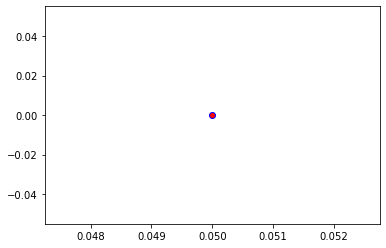

Crafting adversarial images took: 8.400647401809692 seconds 

Images classified as:
000000124442 730 = plow
000000124636 37 = ox
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


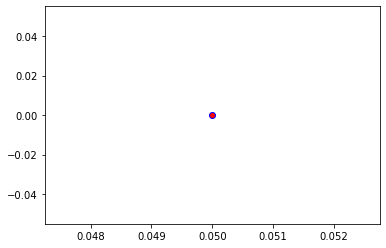

Crafting adversarial images took: 10.222544431686401 seconds 

Images classified as:
000000124659 526 = desk
000000124798 874 = trolleybus
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


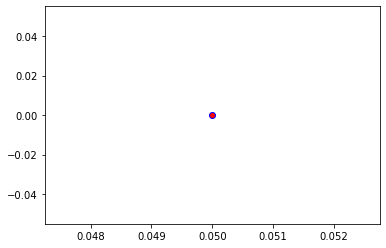

Crafting adversarial images took: 8.438586711883545 seconds 

Images classified as:
000000124975 340 = zebra
000000125062 850 = teddy
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


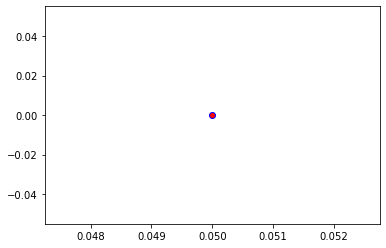

Crafting adversarial images took: 8.328168630599976 seconds 

Images classified as:
000000125072 976 = promontory
000000125129 691 = oxygen mask
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


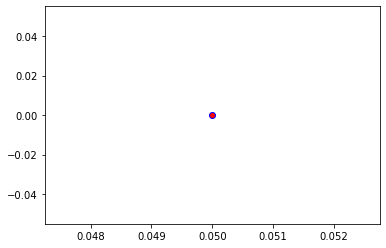

Crafting adversarial images took: 8.780717611312866 seconds 

Images classified as:
000000125211 340 = zebra
000000125245 973 = coral reef
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


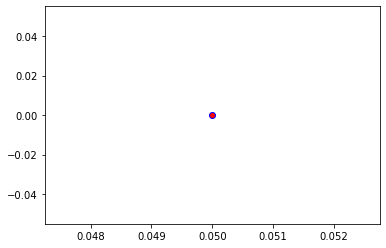

Crafting adversarial images took: 8.776512145996094 seconds 

Images classified as:
000000125257 140 = alp
000000125405 227 = kelpie
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


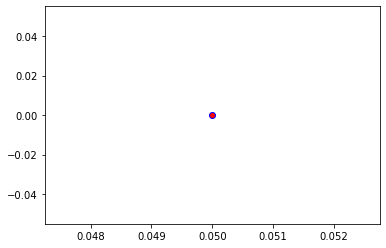

Crafting adversarial images took: 7.922417402267456 seconds 

Images classified as:
000000125472 870 = tricycle
000000125572 442 = bell cote
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


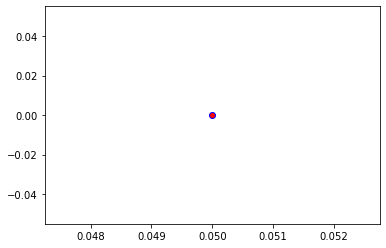

Crafting adversarial images took: 8.763266563415527 seconds 

Images classified as:
000000125778 905 = window shade
000000125806 295 = American black bear
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


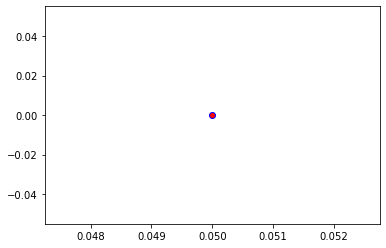

Crafting adversarial images took: 8.027771472930908 seconds 

Images classified as:
000000125850 281 = tabby
000000125936 582 = grocery store
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


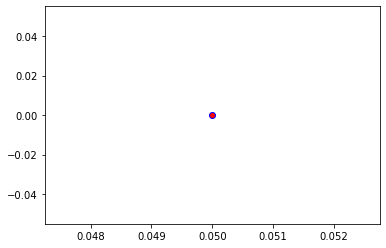

Crafting adversarial images took: 8.732178449630737 seconds 

Images classified as:
000000125952 414 = backpack
000000126107 146 = albatross
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


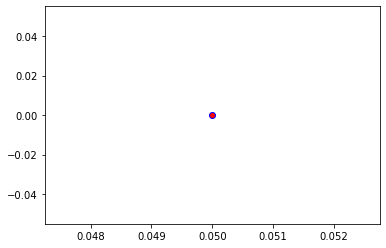

Crafting adversarial images took: 8.943943738937378 seconds 

Images classified as:
000000126110 675 = moving van
000000126137 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


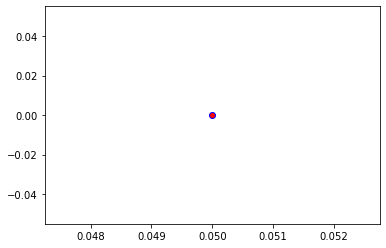

Crafting adversarial images took: 8.821048974990845 seconds 

Images classified as:
000000126216 386 = African elephant
000000126226 870 = tricycle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


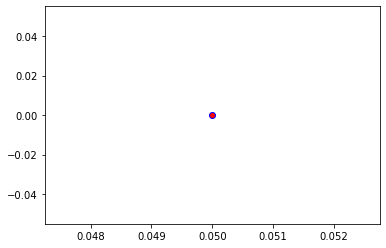

Crafting adversarial images took: 8.473936080932617 seconds 

Images classified as:
000000126592 919 = street sign
000000127092 919 = street sign
Min values in image-array: 0.0 Max values in image-array: 254.94978
Min values in image-array: 0.0 Max values in image-array: 0.99980307
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


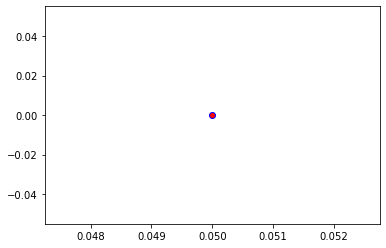

Crafting adversarial images took: 9.37111210823059 seconds 

Images classified as:
000000127135 338 = guinea pig
000000127182 534 = dishwasher
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


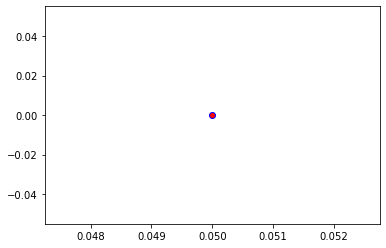

Crafting adversarial images took: 8.393657922744751 seconds 

Images classified as:
000000127263 805 = soccer ball
000000127270 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


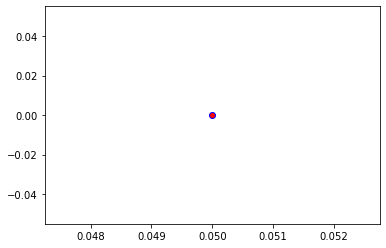

Crafting adversarial images took: 8.357815265655518 seconds 

Images classified as:
000000127394 926 = hot pot
000000127476 963 = pizza
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


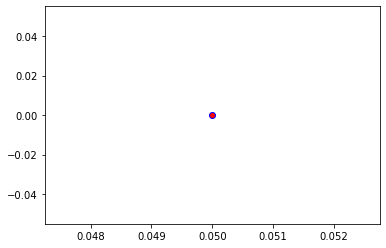

Crafting adversarial images took: 8.279107570648193 seconds 

Images classified as:
000000127494 461 = plate
000000127517 456 = bow
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


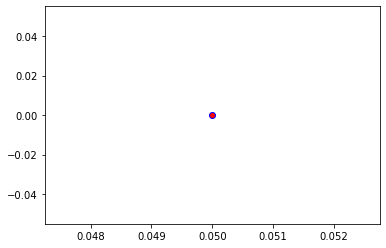

Crafting adversarial images took: 8.5134756565094 seconds 

Images classified as:
000000127530 852 = tennis ball
000000127624 820 = steam locomotive
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


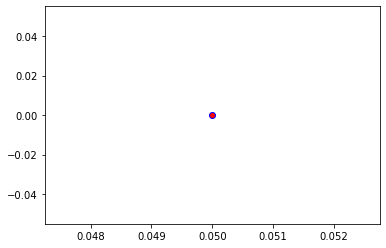

Crafting adversarial images took: 8.420896768569946 seconds 

Images classified as:
000000127660 620 = laptop
000000127955 294 = brown bear
Min values in image-array: 0.0 Max values in image-array: 253.48495
Min values in image-array: 0.0 Max values in image-array: 0.99405867
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


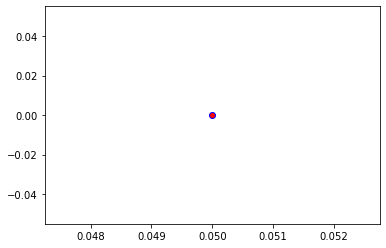

Crafting adversarial images took: 8.755409717559814 seconds 

Images classified as:
000000127987 673 = mouse
000000128051 757 = recreational vehicle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


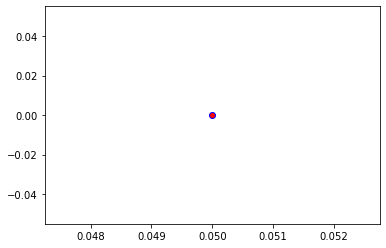

Crafting adversarial images took: 8.621541738510132 seconds 

Images classified as:
000000128112 140 = alp
000000128148 831 = studio couch
Min values in image-array: 0.1545628 Max values in image-array: 255.0
Min values in image-array: 0.00060612865 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


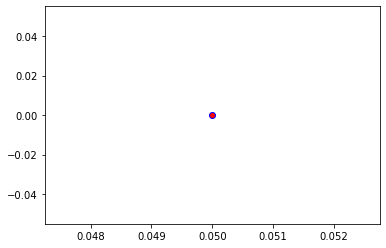

Crafting adversarial images took: 8.832163333892822 seconds 

Images classified as:
000000128372 829 = streetcar
000000128476 415 = bakery
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


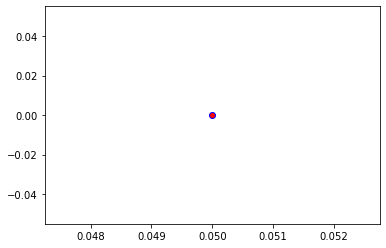

Crafting adversarial images took: 8.365309000015259 seconds 

Images classified as:
000000128598 950 = orange
000000128654 416 = balance beam
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


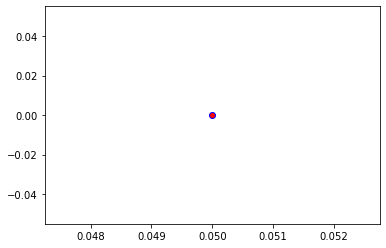

Crafting adversarial images took: 8.575287103652954 seconds 

Images classified as:
000000128658 928 = ice cream
000000128675 472 = canoe
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


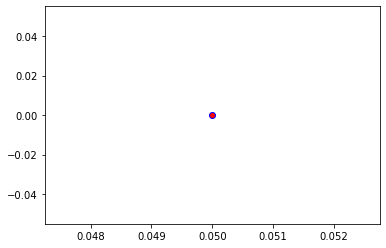

Crafting adversarial images took: 8.885212421417236 seconds 

Images classified as:
000000128699 880 = unicycle
000000128748 981 = ballplayer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


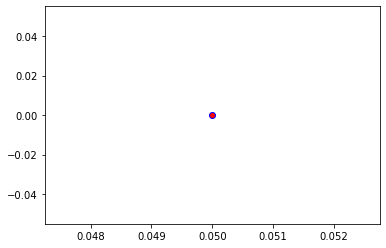

Crafting adversarial images took: 8.638251304626465 seconds 

Images classified as:
000000129054 340 = zebra
000000129062 762 = restaurant
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


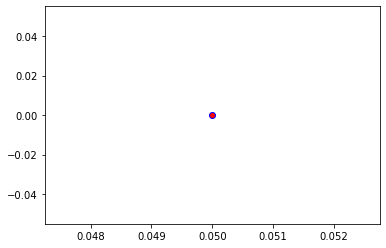

Crafting adversarial images took: 8.472744703292847 seconds 

Images classified as:
000000129113 618 = ladle
000000129135 705 = passenger car
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


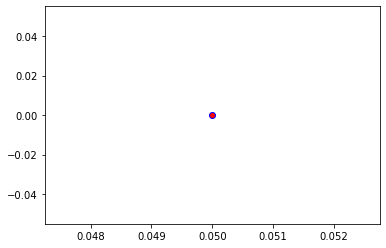

Crafting adversarial images took: 8.291454792022705 seconds 

Images classified as:
000000129322 861 = toilet seat
000000129416 347 = bison
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


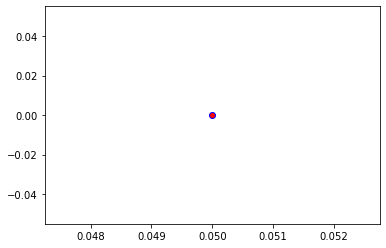

Crafting adversarial images took: 8.473962306976318 seconds 

Images classified as:
000000129492 697 = pajama
000000129756 5 = ram
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


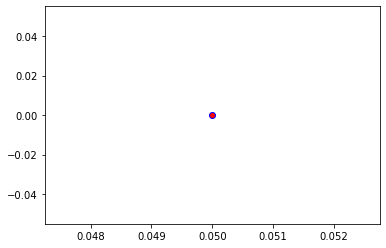

Crafting adversarial images took: 9.256616353988647 seconds 

Images classified as:
000000129812 248 = ski
000000129945 981 = ballplayer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


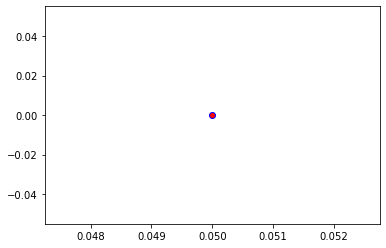

Crafting adversarial images took: 8.419837951660156 seconds 

Images classified as:
000000130386 919 = street sign
000000130465 873 = triumphal arch
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


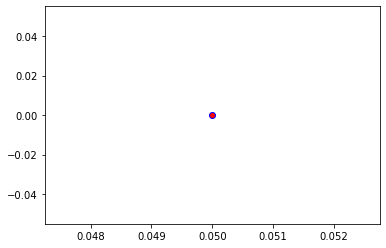

Crafting adversarial images took: 8.839137554168701 seconds 

Images classified as:
000000130566 547 = electric locomotive
000000130579 981 = ballplayer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


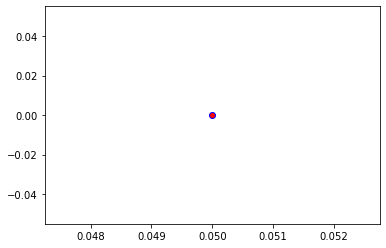

Crafting adversarial images took: 8.723710060119629 seconds 

Images classified as:
000000130586 701 = parachute
000000130599 225 = malinois
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


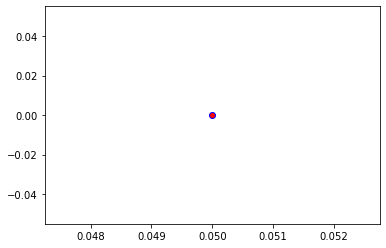

Crafting adversarial images took: 9.512625694274902 seconds 

Images classified as:
000000130613 930 = French loaf
000000130699 890 = volleyball
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


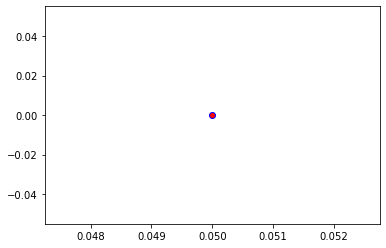

Crafting adversarial images took: 8.353653907775879 seconds 

Images classified as:
000000130826 765 = rocking chair
000000131131 664 = monitor
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


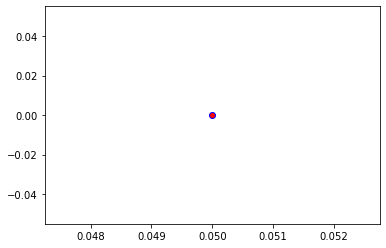

Crafting adversarial images took: 9.060020446777344 seconds 

Images classified as:
000000131138 526 = desk
000000131273 250 = Siberian husky
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


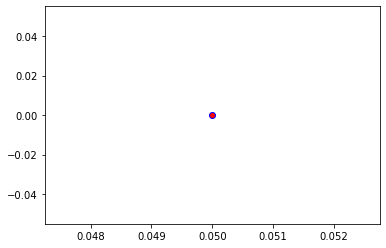

Crafting adversarial images took: 8.115700006484985 seconds 

Images classified as:
000000131379 964 = potpie
000000131386 895 = warplane
Min values in image-array: 0.0 Max values in image-array: 254.75893
Min values in image-array: 0.0 Max values in image-array: 0.9990546
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


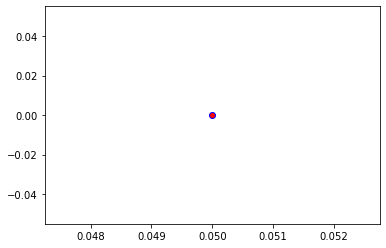

Crafting adversarial images took: 8.289813756942749 seconds 

Images classified as:
000000131431 442 = bell cote
000000131444 639 = suit
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


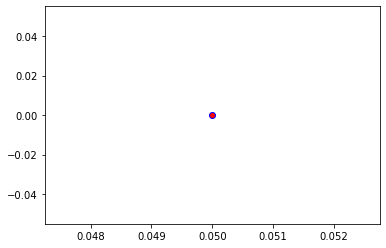

Crafting adversarial images took: 8.491803884506226 seconds 

Images classified as:
000000131556 248 = ski
000000131938 285 = Egyptian cat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


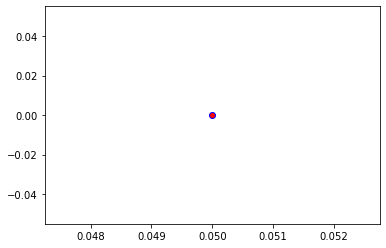

Crafting adversarial images took: 8.860120296478271 seconds 

Images classified as:
000000132116 937 = broccoli
000000132329 760 = refrigerator
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


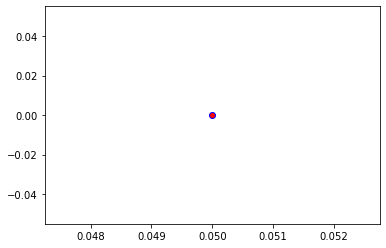

Crafting adversarial images took: 8.428436756134033 seconds 

Images classified as:
000000132375 883 = vase
000000132408 730 = plow
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


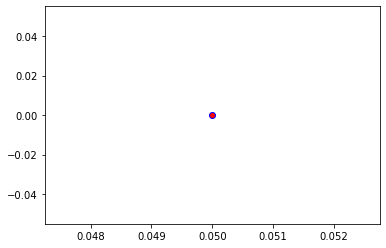

Crafting adversarial images took: 8.514180660247803 seconds 

Images classified as:
000000132544 752 = racket
000000132587 843 = swing
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


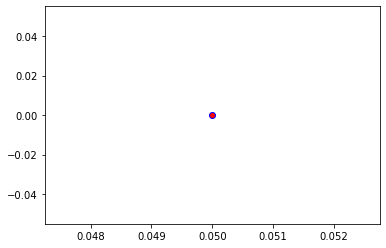

Crafting adversarial images took: 9.198818445205688 seconds 

Images classified as:
000000132622 294 = brown bear
000000132703 702 = parallel bars
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


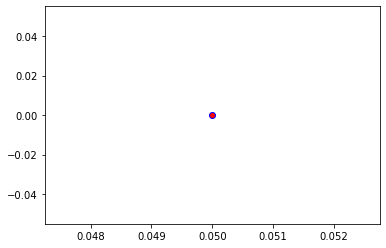

Crafting adversarial images took: 8.834068298339844 seconds 

Images classified as:
000000132796 385 = Indian elephant
000000132931 981 = ballplayer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


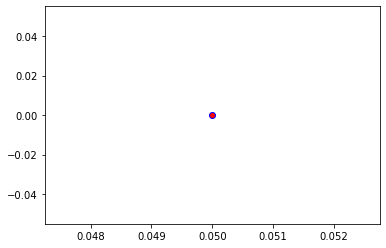

Crafting adversarial images took: 8.44238567352295 seconds 

Images classified as:
000000133000 829 = streetcar
000000133087 498 = cinema
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


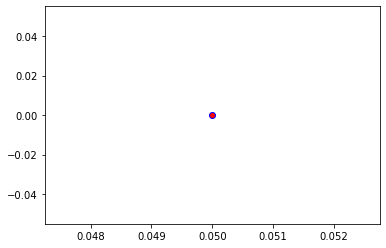

Crafting adversarial images took: 8.005123853683472 seconds 

Images classified as:
000000133233 536 = dock
000000133244 752 = racket
Min values in image-array: 0.0 Max values in image-array: 254.81796
Min values in image-array: 0.0 Max values in image-array: 0.9992861
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


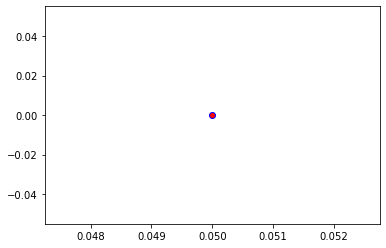

Crafting adversarial images took: 8.053519487380981 seconds 

Images classified as:
000000133343 837 = sunglasses
000000133418 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


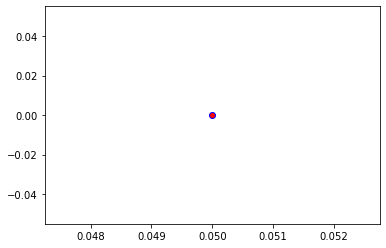

Crafting adversarial images took: 8.175840377807617 seconds 

Images classified as:
000000133567 547 = electric locomotive
000000133631 386 = African elephant
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


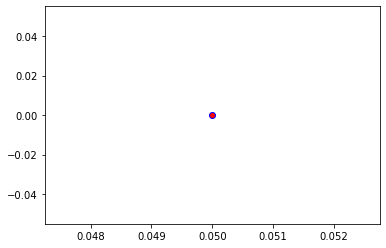

Crafting adversarial images took: 8.916206359863281 seconds 

Images classified as:
000000133645 975 = lakeside
000000133778 37 = ox
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


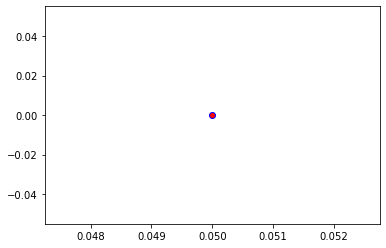

Crafting adversarial images took: 7.878020763397217 seconds 

Images classified as:
000000133819 829 = streetcar
000000133969 981 = ballplayer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


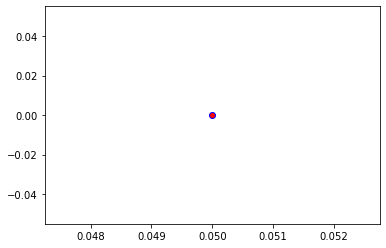

Crafting adversarial images took: 10.646603107452393 seconds 

Images classified as:
000000134034 386 = African elephant
000000134096 896 = washbasin
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


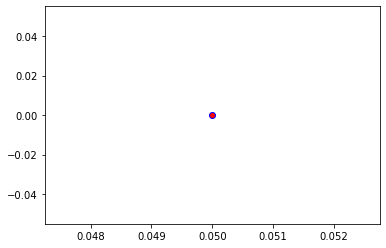

Crafting adversarial images took: 8.859735488891602 seconds 

Images classified as:
000000134112 157 = papillon
000000134322 724 = pirate
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


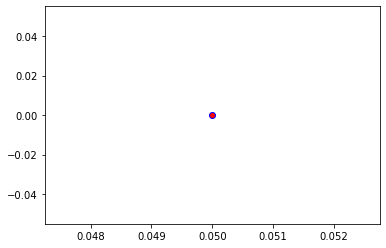

Crafting adversarial images took: 8.27805471420288 seconds 

Images classified as:
000000134689 275 = hyena
000000134722 705 = passenger car
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


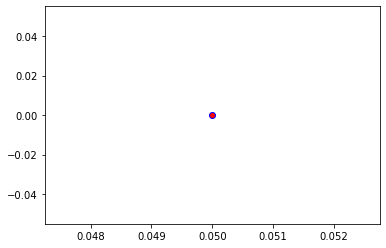

Crafting adversarial images took: 8.242421865463257 seconds 

Images classified as:
000000134856 977 = sandbar
000000134882 750 = quilt
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


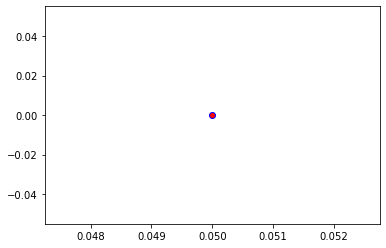

Crafting adversarial images took: 8.17646837234497 seconds 

Images classified as:
000000134886 895 = warplane
000000135410 704 = parking meter
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


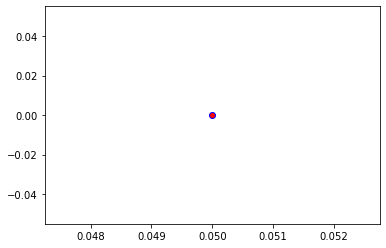

Crafting adversarial images took: 7.954712629318237 seconds 

Images classified as:
000000135561 648 = medicine chest
000000135604 805 = soccer ball
Min values in image-array: 1.6226323 Max values in image-array: 255.0
Min values in image-array: 0.006363264 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


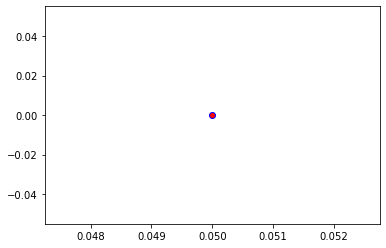

Crafting adversarial images took: 8.004056453704834 seconds 

Images classified as:
000000135670 799 = sliding door
000000135673 895 = warplane
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


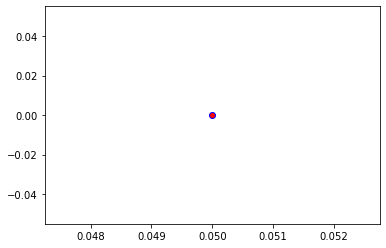

Crafting adversarial images took: 8.100610494613647 seconds 

Images classified as:
000000135872 526 = desk
000000135890 442 = bell cote
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


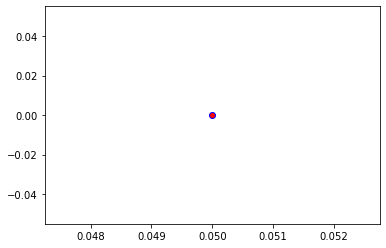

Crafting adversarial images took: 7.949874639511108 seconds 

Images classified as:
000000135902 547 = electric locomotive
000000136033 648 = medicine chest
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


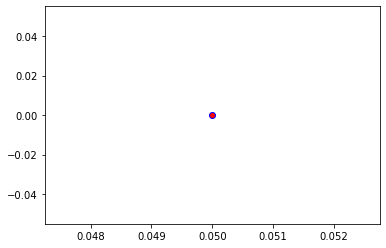

Crafting adversarial images took: 7.880394220352173 seconds 

Images classified as:
000000136334 248 = ski
000000136355 532 = dining table
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


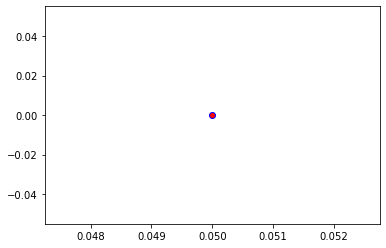

Crafting adversarial images took: 7.9227845668792725 seconds 

Images classified as:
000000136466 827 = stove
000000136600 526 = desk
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


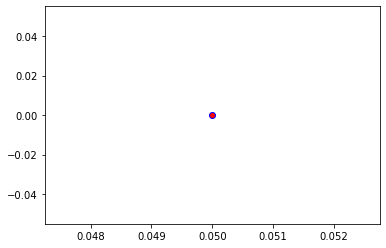

Crafting adversarial images took: 7.890749931335449 seconds 

Images classified as:
000000136633 467 = butcher shop
000000136715 670 = motor scooter
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


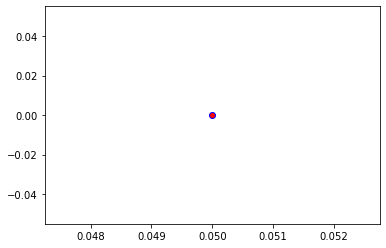

Crafting adversarial images took: 7.9256908893585205 seconds 

Images classified as:
000000136772 949 = strawberry
000000136915 617 = lab coat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


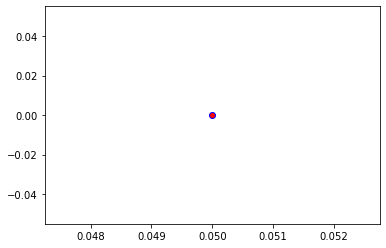

Crafting adversarial images took: 7.837874174118042 seconds 

Images classified as:
000000137106 435 = bathtub
000000137246 929 = ice lolly
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


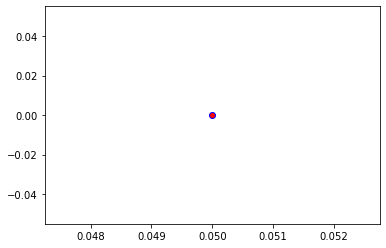

Crafting adversarial images took: 7.883903741836548 seconds 

Images classified as:
000000137294 807 = solar dish
000000137576 54 = hog
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


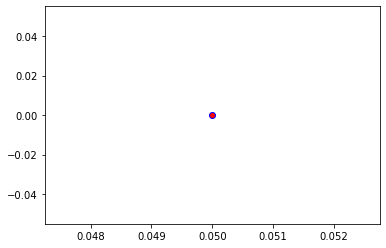

Crafting adversarial images took: 7.8483803272247314 seconds 

Images classified as:
000000137727 705 = passenger car
000000137950 895 = warplane
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


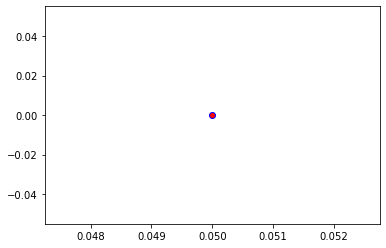

Crafting adversarial images took: 7.875389099121094 seconds 

Images classified as:
000000138115 951 = lemon
000000138241 461 = plate
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


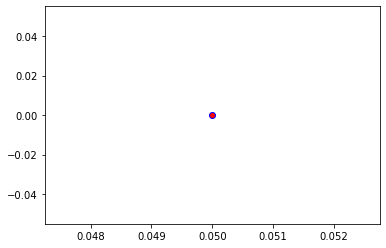

Crafting adversarial images took: 8.043648958206177 seconds 

Images classified as:
000000138492 232 = Border collie
000000138550 702 = parallel bars
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


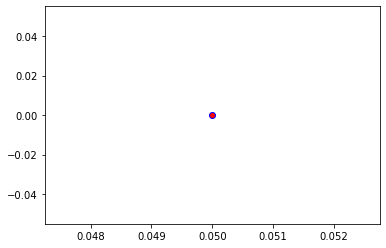

Crafting adversarial images took: 8.13610577583313 seconds 

Images classified as:
000000138639 880 = unicycle
000000138819 896 = washbasin
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


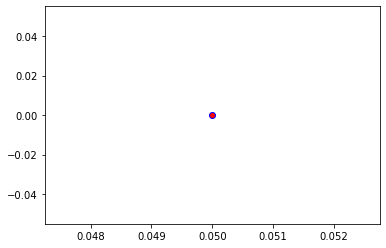

Crafting adversarial images took: 8.17223072052002 seconds 

Images classified as:
000000138856 961 = dough
000000138954 461 = plate
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


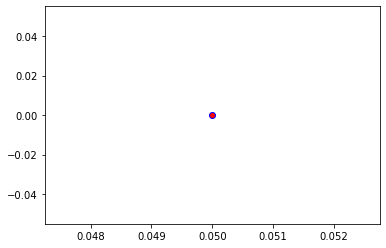

Crafting adversarial images took: 7.9610185623168945 seconds 

Images classified as:
000000138979 874 = trolleybus
000000139077 548 = entertainment center
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


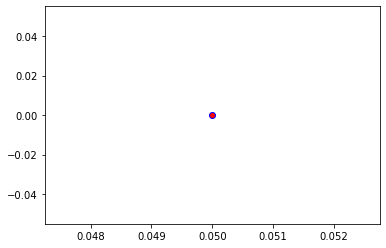

Crafting adversarial images took: 7.837038278579712 seconds 

Images classified as:
000000139099 582 = grocery store
000000139260 470 = candle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


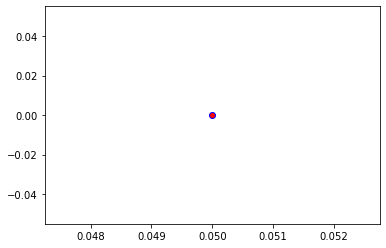

Crafting adversarial images took: 7.925505876541138 seconds 

Images classified as:
000000139684 831 = studio couch
000000139871 895 = warplane
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


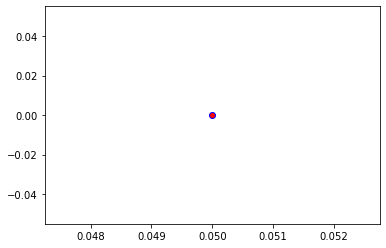

Crafting adversarial images took: 8.048502922058105 seconds 

Images classified as:
000000139872 232 = Border collie
000000139883 755 = radio telescope
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


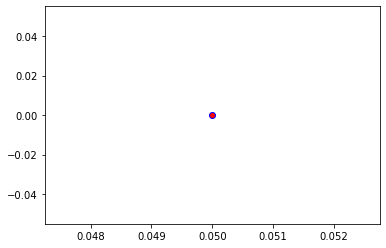

Crafting adversarial images took: 7.887266397476196 seconds 

Images classified as:
000000140076 532 = dining table
000000140203 407 = ambulance
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


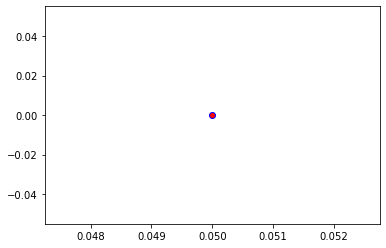

Crafting adversarial images took: 7.916779041290283 seconds 

Images classified as:
000000140270 603 = horse cart
000000140286 603 = horse cart
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


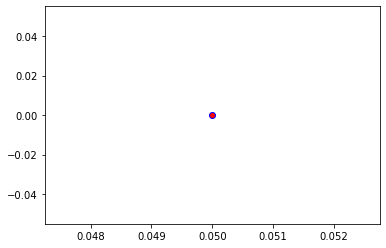

Crafting adversarial images took: 8.737834215164185 seconds 

Images classified as:
000000140420 223 = schipperke
000000140439 883 = vase
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


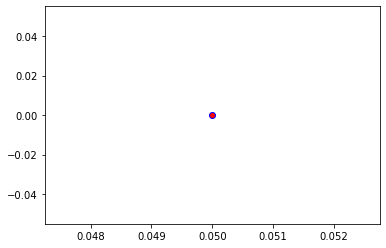

Crafting adversarial images took: 8.837515592575073 seconds 

Images classified as:
000000140556 491 = chain saw
000000140583 979 = valley
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


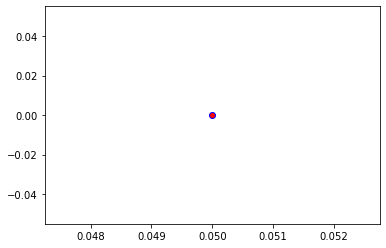

Crafting adversarial images took: 9.419404983520508 seconds 

Images classified as:
000000140640 808 = sombrero
000000140658 442 = bell cote
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


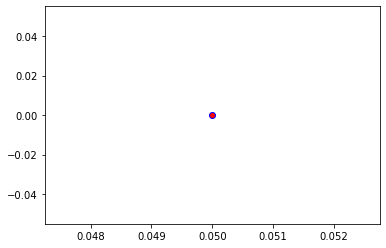

Crafting adversarial images took: 8.98868989944458 seconds 

Images classified as:
000000140840 645 = maypole
000000140929 409 = analog clock
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


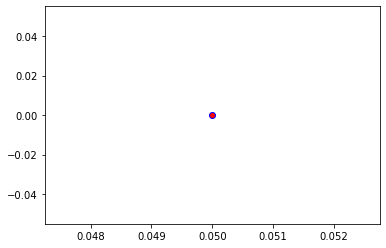

Crafting adversarial images took: 9.085020303726196 seconds 

Images classified as:
000000140987 963 = pizza
000000141328 909 = wok
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


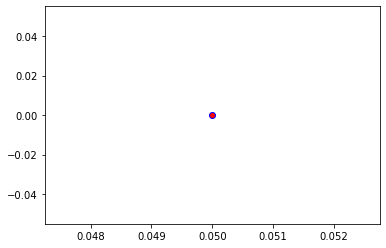

Crafting adversarial images took: 8.62366533279419 seconds 

Images classified as:
000000141597 757 = recreational vehicle
000000141671 354 = Arabian camel
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


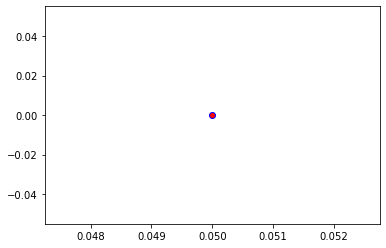

Crafting adversarial images took: 8.47426438331604 seconds 

Images classified as:
000000141821 963 = pizza
000000142092 964 = potpie
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


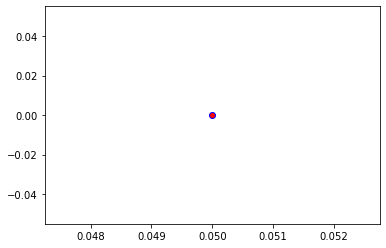

Crafting adversarial images took: 8.81479001045227 seconds 

Images classified as:
000000142238 805 = soccer ball
000000142324 670 = motor scooter
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


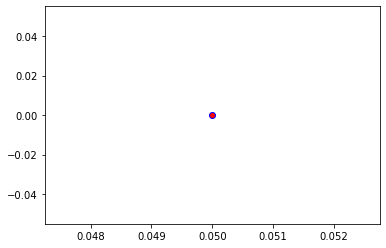

Crafting adversarial images took: 8.066168069839478 seconds 

Images classified as:
000000142472 498 = cinema
000000142585 134 = crane
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


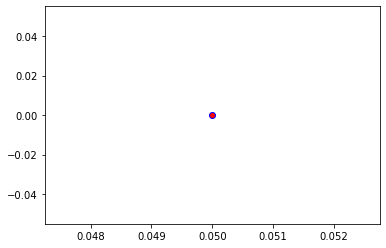

Crafting adversarial images took: 8.20692753791809 seconds 

Images classified as:
000000142620 653 = milk can
000000142790 802 = snowmobile
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


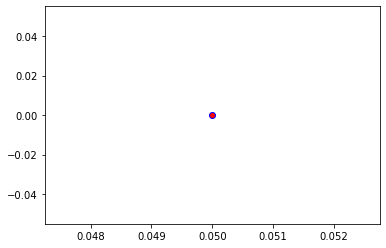

Crafting adversarial images took: 7.9257566928863525 seconds 

Images classified as:
000000142971 472 = canoe
000000143068 557 = flagpole
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


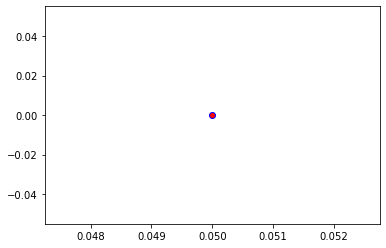

Crafting adversarial images took: 8.297021627426147 seconds 

Images classified as:
000000143556 518 = crash helmet
000000143572 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


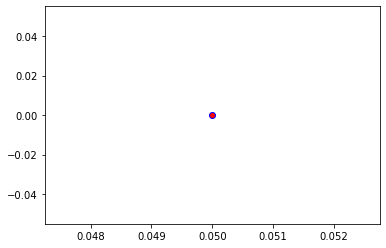

Crafting adversarial images took: 8.386350393295288 seconds 

Images classified as:
000000143931 675 = moving van
000000143961 879 = umbrella
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


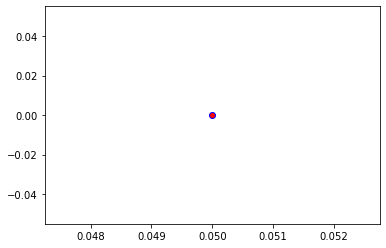

Crafting adversarial images took: 8.680397987365723 seconds 

Images classified as:
000000143998 699 = panpipe
000000144003 861 = toilet seat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


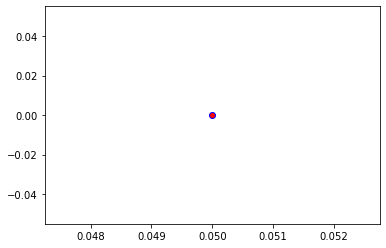

Crafting adversarial images took: 8.374617099761963 seconds 

Images classified as:
000000144114 404 = airliner
000000144300 665 = moped
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


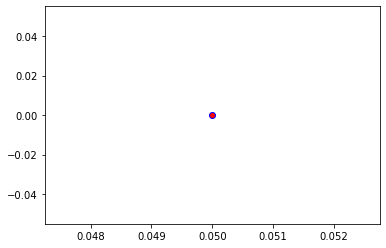

Crafting adversarial images took: 8.449758768081665 seconds 

Images classified as:
000000144333 612 = jinrikisha
000000144706 94 = hummingbird
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


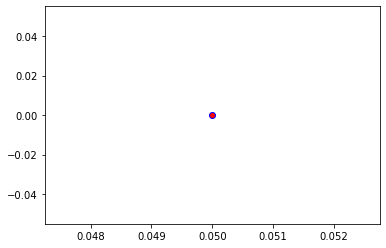

Crafting adversarial images took: 8.095765352249146 seconds 

Images classified as:
000000144784 463 = bucket
000000144798 435 = tub
Min values in image-array: 0.0 Max values in image-array: 252.46901
Min values in image-array: 0.0 Max values in image-array: 0.9900746
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


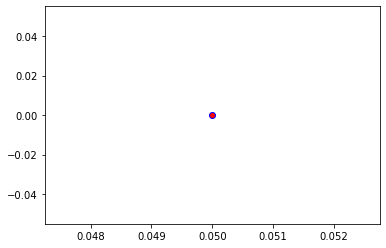

Crafting adversarial images took: 8.14056396484375 seconds 

Images classified as:
000000144932 977 = sandbar
000000144984 515 = cowboy hat
Min values in image-array: 0.0 Max values in image-array: 250.48305
Min values in image-array: 0.0 Max values in image-array: 0.98228645
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


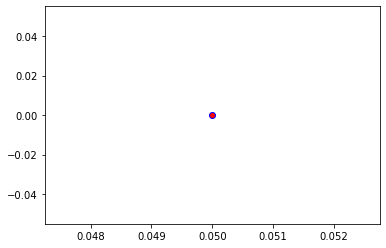

Crafting adversarial images took: 8.173398971557617 seconds 

Images classified as:
000000145020 865 = toyshop
000000145591 409 = analog clock
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


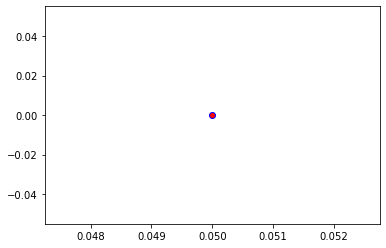

Crafting adversarial images took: 8.127535820007324 seconds 

Images classified as:
000000145597 544 = Dutch oven
000000145620 671 = mountain bike
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


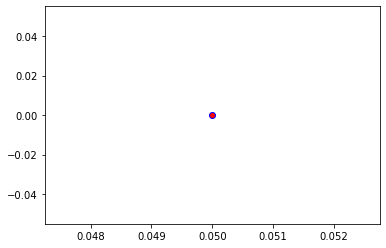

Crafting adversarial images took: 8.358574867248535 seconds 

Images classified as:
000000145665 543 = dumbbell
000000145781 179 = Staffordshire bullterrier
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


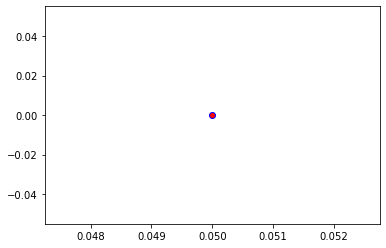

Crafting adversarial images took: 8.181280851364136 seconds 

Images classified as:
000000146155 641 = maraca
000000146358 601 = hoopskirt
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


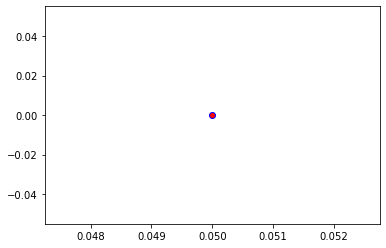

Crafting adversarial images took: 8.393339395523071 seconds 

Images classified as:
000000146363 977 = sandbar
000000146457 961 = dough
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


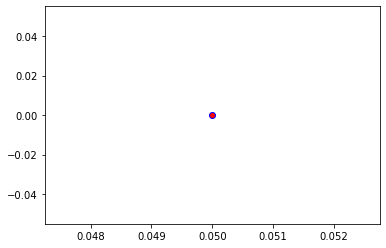

Crafting adversarial images took: 8.152184247970581 seconds 

Images classified as:
000000146489 966 = red wine
000000146498 919 = street sign
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


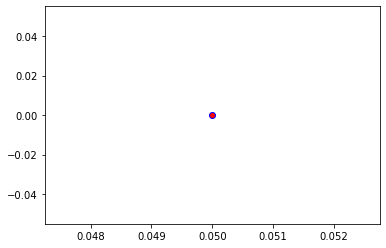

Crafting adversarial images took: 8.031646966934204 seconds 

Images classified as:
000000146667 665 = moped
000000146825 547 = electric locomotive
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


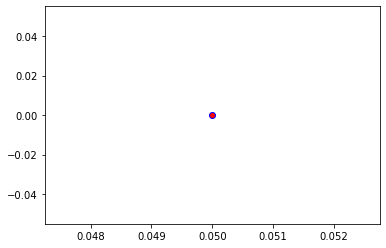

Crafting adversarial images took: 8.307213068008423 seconds 

Images classified as:
000000146831 880 = unicycle
000000147205 461 = plate
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


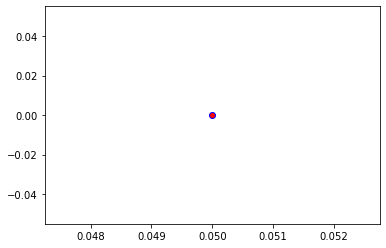

Crafting adversarial images took: 8.51185417175293 seconds 

Images classified as:
000000147223 874 = trolleybus
000000147338 637 = mailbox
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


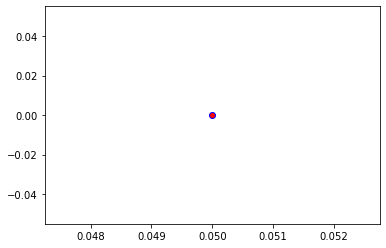

Crafting adversarial images took: 8.525987148284912 seconds 

Images classified as:
000000147415 526 = desk
000000147498 358 = pole
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


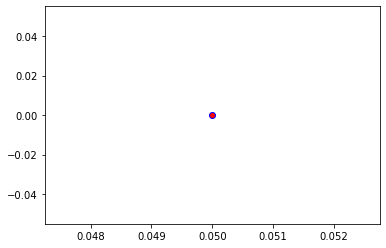

Crafting adversarial images took: 8.4965660572052 seconds 

Images classified as:
000000147518 861 = toilet seat
000000147725 874 = trolleybus
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


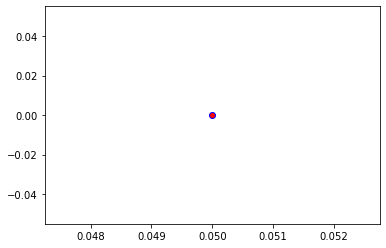

Crafting adversarial images took: 8.319436073303223 seconds 

Images classified as:
000000147729 447 = binoculars
000000147740 954 = banana
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


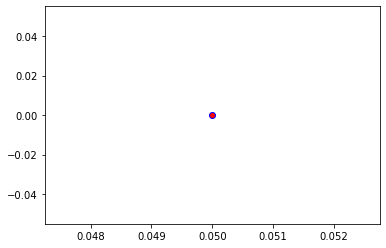

Crafting adversarial images took: 8.562752723693848 seconds 

Images classified as:
000000147745 864 = tow truck
000000148508 637 = mailbox
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


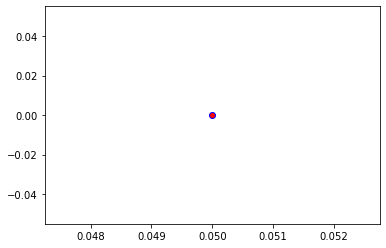

Crafting adversarial images took: 8.594976425170898 seconds 

Images classified as:
000000148620 526 = desk
000000148662 934 = hotdog
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


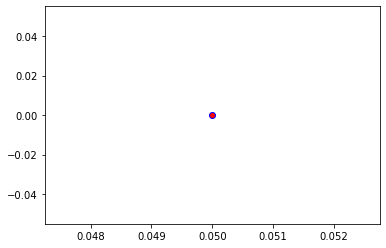

Crafting adversarial images took: 8.286771297454834 seconds 

Images classified as:
000000148707 951 = lemon
000000148719 717 = pickup
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


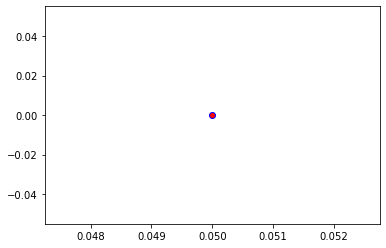

Crafting adversarial images took: 8.409277439117432 seconds 

Images classified as:
000000148730 713 = pier
000000148739 693 = paddle
Min values in image-array: 2.3597243 Max values in image-array: 255.0
Min values in image-array: 0.00925382 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


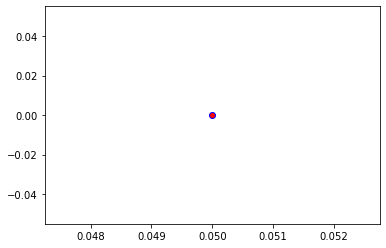

Crafting adversarial images took: 8.659452676773071 seconds 

Images classified as:
000000148783 340 = zebra
000000148957 932 = pretzel
Min values in image-array: 0.0 Max values in image-array: 254.89288
Min values in image-array: 0.0 Max values in image-array: 0.9995799
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


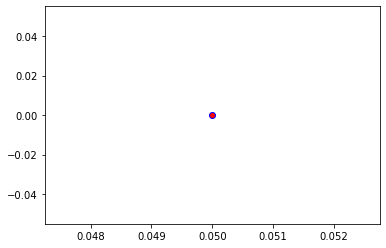

Crafting adversarial images took: 8.616350889205933 seconds 

Images classified as:
000000148999 657 = missile
000000149222 526 = desk
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


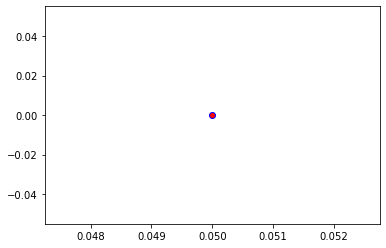

Crafting adversarial images took: 8.337150812149048 seconds 

Images classified as:
000000149375 416 = balance beam
000000149406 665 = moped
Min values in image-array: 0.0 Max values in image-array: 254.85805
Min values in image-array: 0.0 Max values in image-array: 0.99944335
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


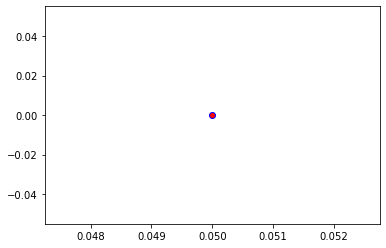

Crafting adversarial images took: 8.327067852020264 seconds 

Images classified as:
000000149568 267 = standard poodle
000000149622 16 = bulbul
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


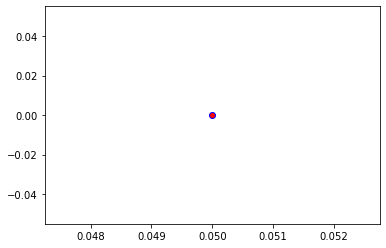

Crafting adversarial images took: 8.431461095809937 seconds 

Images classified as:
000000149770 372 = baboon
000000150224 879 = umbrella
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


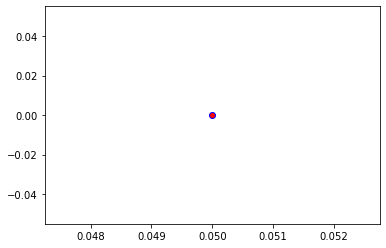

Crafting adversarial images took: 8.433186292648315 seconds 

Images classified as:
000000150265 898 = water bottle
000000150417 739 = potter's wheel
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


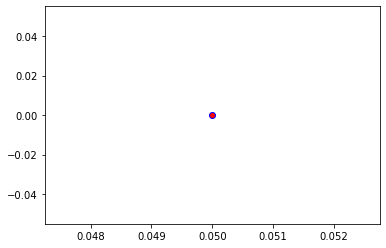

Crafting adversarial images took: 9.109791278839111 seconds 

Images classified as:
000000150638 739 = potter's wheel
000000150649 671 = mountain bike
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


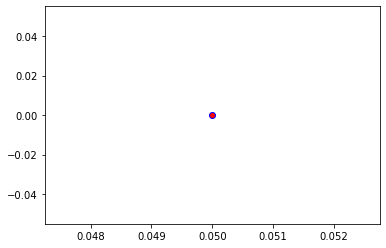

Crafting adversarial images took: 8.24792742729187 seconds 

Images classified as:
000000150726 293 = cheetah
000000150930 409 = analog clock
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


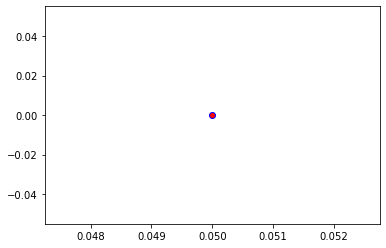

Crafting adversarial images took: 8.824976205825806 seconds 

Images classified as:
000000151000 743 = prison
000000151051 248 = ski
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


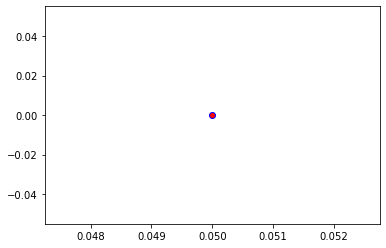

Crafting adversarial images took: 9.07700800895691 seconds 

Images classified as:
000000151480 981 = ballplayer
000000151516 4 = hammerhead
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


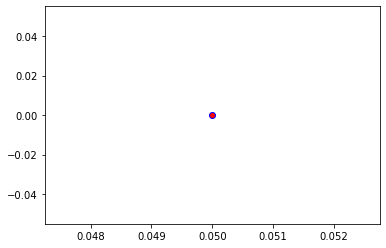

Crafting adversarial images took: 9.051503419876099 seconds 

Images classified as:
000000151629 768 = rugby ball
000000151657 639 = suit
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


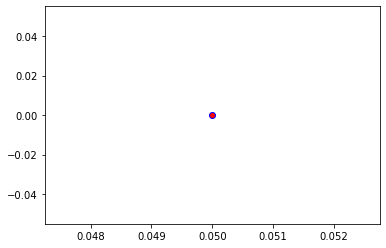

Crafting adversarial images took: 8.340677499771118 seconds 

Images classified as:
000000151662 355 = llama
000000151820 762 = restaurant
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


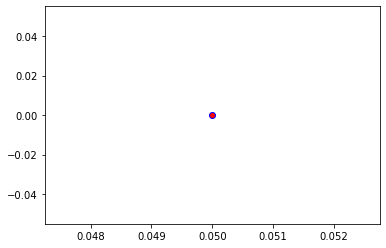

Crafting adversarial images took: 8.08640718460083 seconds 

Images classified as:
000000151857 705 = passenger car
000000151938 324 = cab
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


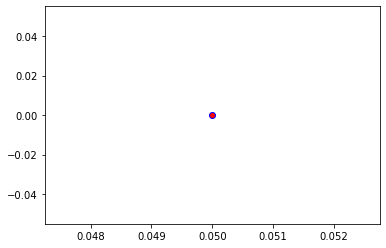

Crafting adversarial images took: 8.37511157989502 seconds 

Images classified as:
000000151962 475 = car mirror
000000152120 670 = motor scooter
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


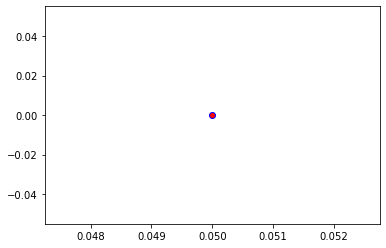

Crafting adversarial images took: 8.170104026794434 seconds 

Images classified as:
000000152214 639 = suit
000000152465 637 = mailbox
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


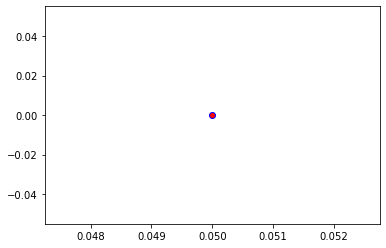

Crafting adversarial images took: 8.18187427520752 seconds 

Images classified as:
000000152686 752 = racket
000000152740 343 = warthog
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


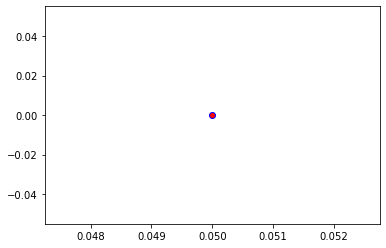

Crafting adversarial images took: 8.95340347290039 seconds 

Images classified as:
000000152771 646 = maze
000000152870 176 = gazelle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


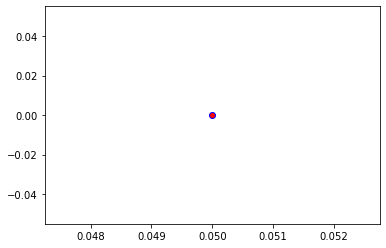

Crafting adversarial images took: 8.22343635559082 seconds 

Images classified as:
000000153011 874 = trolleybus
000000153217 665 = moped
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


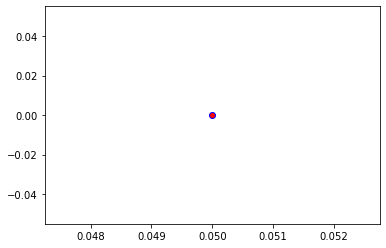

Crafting adversarial images took: 8.008492469787598 seconds 

Images classified as:
000000153229 768 = rugby ball
000000153299 251 = dalmatian
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


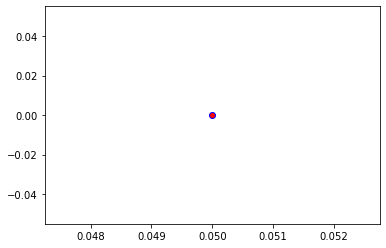

Crafting adversarial images took: 8.318737506866455 seconds 

Images classified as:
000000153343 850 = teddy
000000153510 935 = mashed potato
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


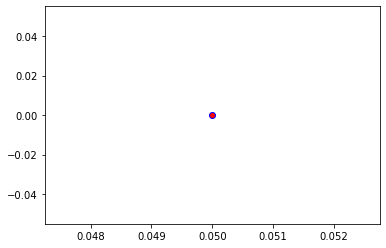

Crafting adversarial images took: 8.808168411254883 seconds 

Images classified as:
000000153527 634 = lumbermill
000000153529 882 = vacuum
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


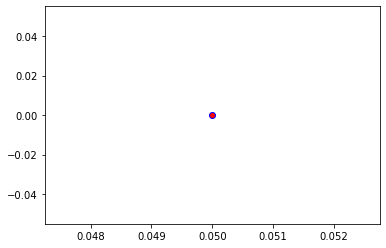

Crafting adversarial images took: 8.621145963668823 seconds 

Images classified as:
000000153568 919 = street sign
000000153632 461 = plate
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


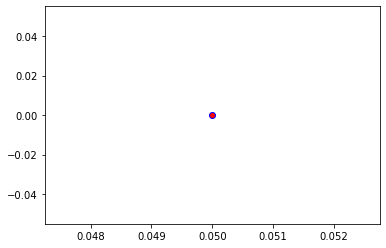

Crafting adversarial images took: 8.199867725372314 seconds 

Images classified as:
000000153669 981 = ballplayer
000000153782 498 = palace
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


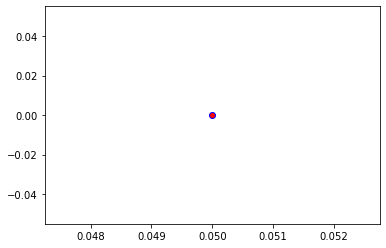

Crafting adversarial images took: 9.393026351928711 seconds 

Images classified as:
000000153797 429 = baseball
000000154000 569 = garbage truck
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


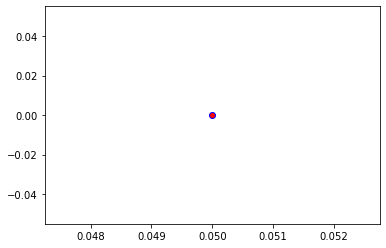

Crafting adversarial images took: 7.966960668563843 seconds 

Images classified as:
000000154004 978 = seashore
000000154087 248 = ski
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


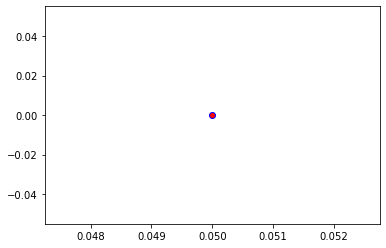

Crafting adversarial images took: 8.70311689376831 seconds 

Images classified as:
000000154213 541 = drum
000000154339 409 = analog clock
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


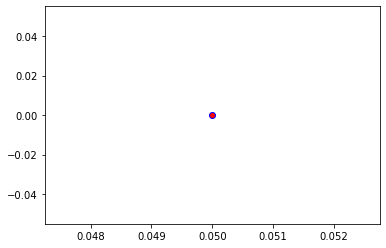

Crafting adversarial images took: 8.340944528579712 seconds 

Images classified as:
000000154358 564 = four-poster
000000154425 728 = plastic bag
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


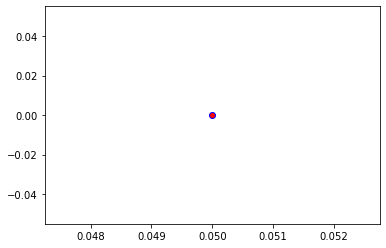

Crafting adversarial images took: 9.287089109420776 seconds 

Images classified as:
000000154431 548 = entertainment center
000000154644 837 = sunglasses
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


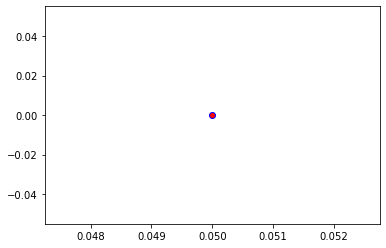

Crafting adversarial images took: 9.044977903366089 seconds 

Images classified as:
000000154705 526 = desk
000000154718 861 = toilet seat
Min values in image-array: 0.0 Max values in image-array: 254.96025
Min values in image-array: 0.0 Max values in image-array: 0.99984413
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


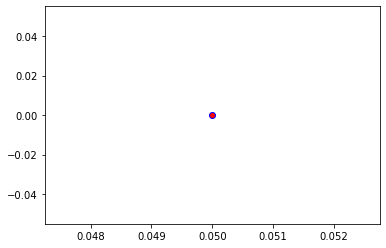

Crafting adversarial images took: 8.003296852111816 seconds 

Images classified as:
000000154947 270 = white wolf
000000155051 409 = analog clock
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


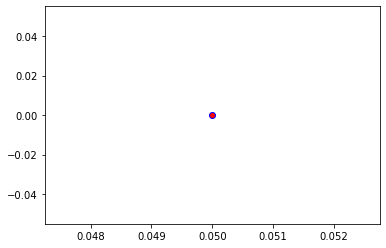

Crafting adversarial images took: 8.73658037185669 seconds 

Images classified as:
000000155145 472 = canoe
000000155154 648 = medicine chest
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


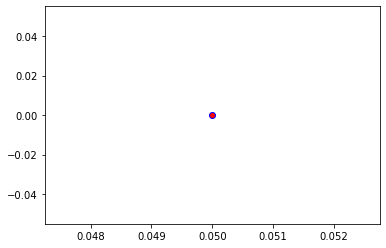

Crafting adversarial images took: 8.187280416488647 seconds 

Images classified as:
000000155179 961 = dough
000000155291 285 = Egyptian cat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


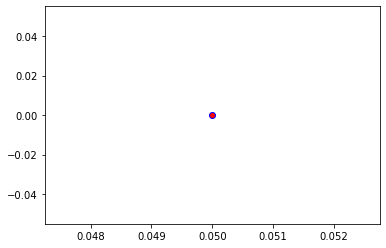

Crafting adversarial images took: 8.36579179763794 seconds 

Images classified as:
000000155341 874 = trolleybus
000000155443 829 = streetcar
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


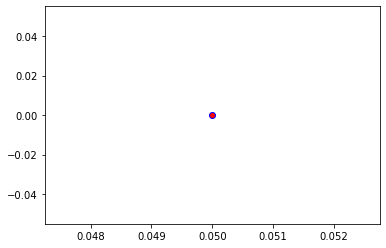

Crafting adversarial images took: 8.46545958518982 seconds 

Images classified as:
000000155451 818 = spotlight
000000155571 386 = African elephant
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


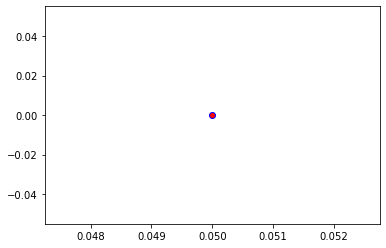

Crafting adversarial images took: 7.979328393936157 seconds 

Images classified as:
000000156071 602 = horizontal bar
000000156076 963 = pizza
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


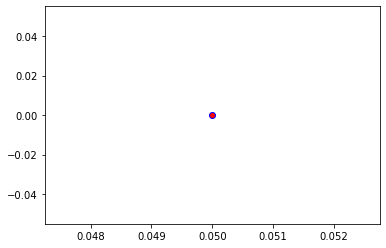

Crafting adversarial images took: 7.9826438426971436 seconds 

Images classified as:
000000156278 495 = china cabinet
000000156292 892 = wall clock
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


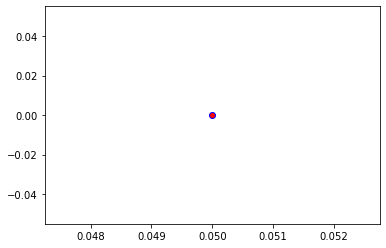

Crafting adversarial images took: 8.556989192962646 seconds 

Images classified as:
000000156372 830 = stretcher
000000156643 470 = candle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


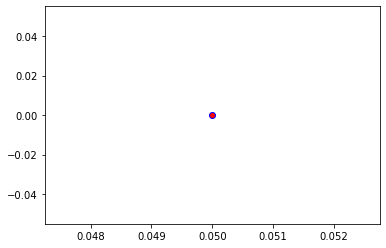

Crafting adversarial images took: 8.55363130569458 seconds 

Images classified as:
000000156924 747 = punching bag
000000157046 918 = crossword puzzle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


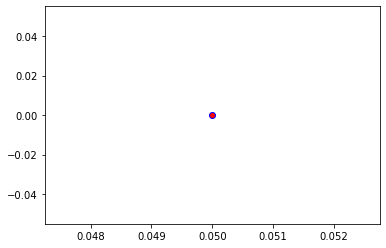

Crafting adversarial images took: 8.845991373062134 seconds 

Images classified as:
000000157098 9 = ostrich
000000157124 435 = tub
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


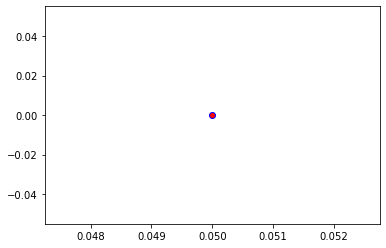

Crafting adversarial images took: 9.475066900253296 seconds 

Images classified as:
000000157138 928 = ice cream
000000157213 386 = African elephant
Min values in image-array: 0.0 Max values in image-array: 254.88264
Min values in image-array: 0.0 Max values in image-array: 0.9995398
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


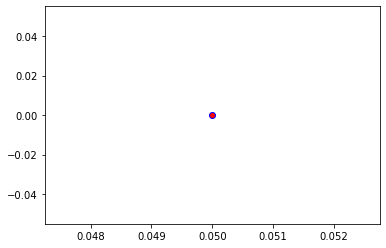

Crafting adversarial images took: 9.985862970352173 seconds 

Images classified as:
000000157365 880 = unicycle
000000157390 937 = broccoli
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


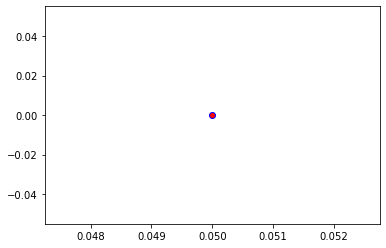

Crafting adversarial images took: 9.12900161743164 seconds 

Images classified as:
000000157418 928 = ice cream
000000157601 529 = diaper
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


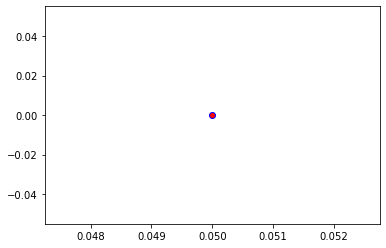

Crafting adversarial images took: 8.710256576538086 seconds 

Images classified as:
000000157756 442 = bell cote
000000157767 982 = groom
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


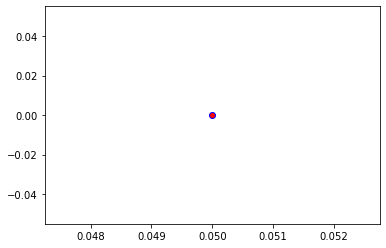

Crafting adversarial images took: 8.480982303619385 seconds 

Images classified as:
000000157807 861 = toilet seat
000000157847 980 = volcano
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


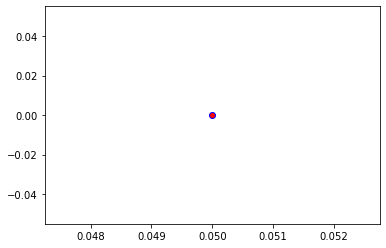

Crafting adversarial images took: 8.465789556503296 seconds 

Images classified as:
000000157928 537 = dogsled
000000158227 981 = ballplayer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


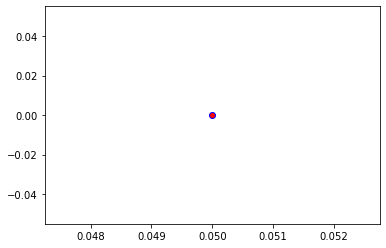

Crafting adversarial images took: 8.684730529785156 seconds 

Images classified as:
000000158548 202 = soft-coated wheaten terrier
000000158660 415 = bakery
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


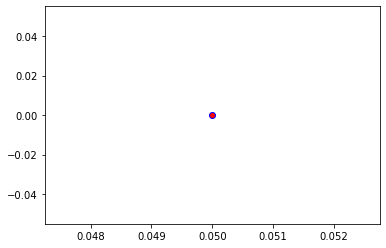

Crafting adversarial images took: 8.600314855575562 seconds 

Images classified as:
000000158744 799 = sliding door
000000158945 385 = Indian elephant
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


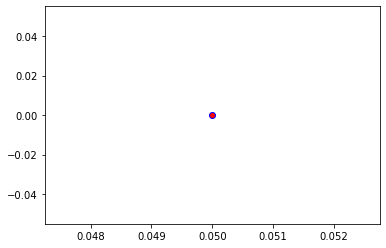

Crafting adversarial images took: 8.51468539237976 seconds 

Images classified as:
000000158956 840 = swab
000000159112 963 = pizza
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


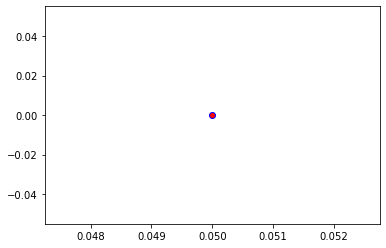

Crafting adversarial images took: 8.454809427261353 seconds 

Images classified as:
000000159282 883 = vase
000000159311 340 = zebra
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


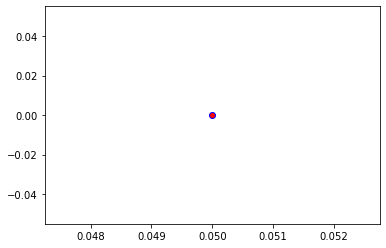

Crafting adversarial images took: 8.533955812454224 seconds 

Images classified as:
000000159399 701 = parachute
000000159458 492 = chest
Min values in image-array: 0.5 Max values in image-array: 255.0
Min values in image-array: 0.0019607844 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


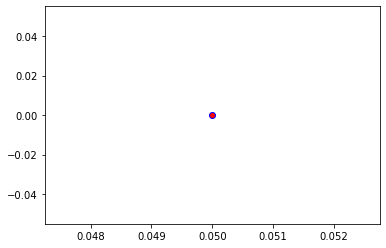

Crafting adversarial images took: 8.63588833808899 seconds 

Images classified as:
000000159684 466 = bullet train
000000159791 760 = refrigerator
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


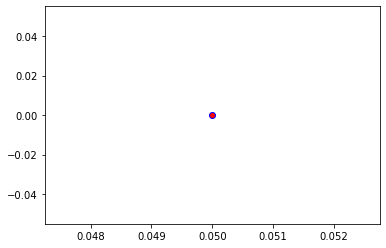

Crafting adversarial images took: 8.467344522476196 seconds 

Images classified as:
000000159977 293 = cheetah
000000160012 963 = pizza
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


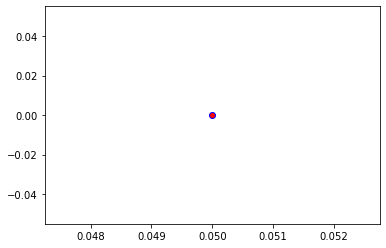

Crafting adversarial images took: 8.412586212158203 seconds 

Images classified as:
000000160556 851 = television
000000160666 696 = paintbrush
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


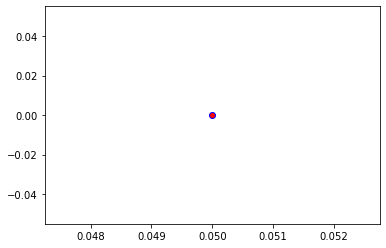

Crafting adversarial images took: 8.76120138168335 seconds 

Images classified as:
000000160728 484 = catamaran
000000160772 404 = liner
Min values in image-array: 0.0 Max values in image-array: 254.62254
Min values in image-array: 0.0 Max values in image-array: 0.9985198
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


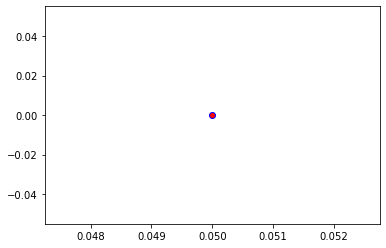

Crafting adversarial images took: 8.517846822738647 seconds 

Images classified as:
000000160864 981 = ballplayer
000000161008 777 = scabbard
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


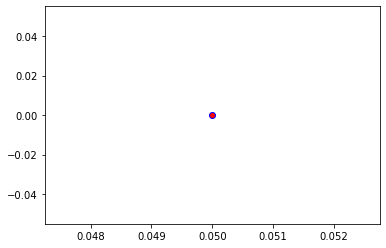

Crafting adversarial images took: 8.47552227973938 seconds 

Images classified as:
000000161032 879 = umbrella
000000161044 974 = geyser
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


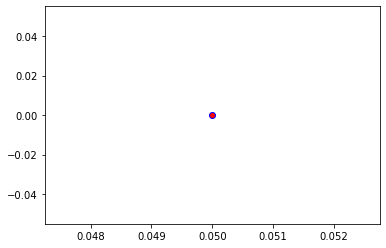

Crafting adversarial images took: 8.649587392807007 seconds 

Images classified as:
000000161128 919 = street sign
000000161397 711 = perfume
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


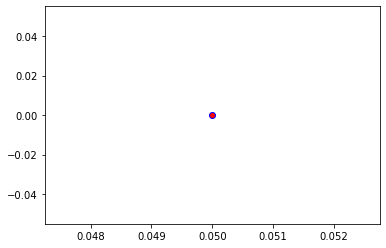

Crafting adversarial images took: 8.457770586013794 seconds 

Images classified as:
000000161609 424 = barbershop
000000161642 892 = wall clock
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


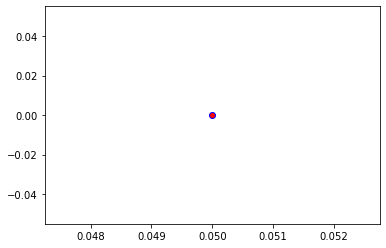

Crafting adversarial images took: 8.517926931381226 seconds 

Images classified as:
000000161781 248 = ski
000000161799 880 = unicycle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


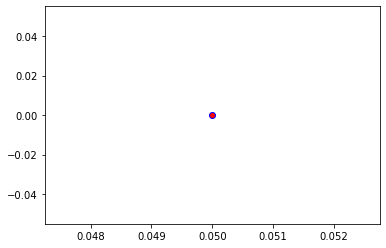

Crafting adversarial images took: 8.735132932662964 seconds 

Images classified as:
000000161820 954 = banana
000000161861 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


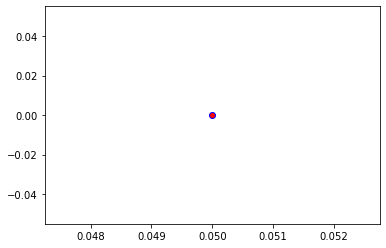

Crafting adversarial images took: 8.711836576461792 seconds 

Images classified as:
000000161875 568 = fur coat
000000161879 421 = bannister
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


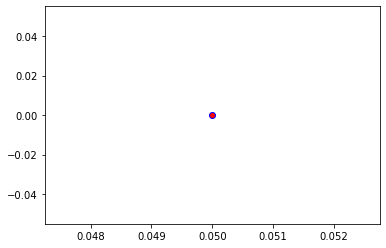

Crafting adversarial images took: 8.371468782424927 seconds 

Images classified as:
000000161925 480 = cash machine
000000161978 416 = balance beam
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


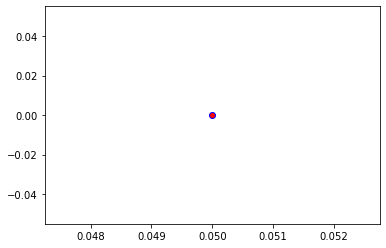

Crafting adversarial images took: 8.430557489395142 seconds 

Images classified as:
000000162035 519 = crate
000000162092 909 = wok
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


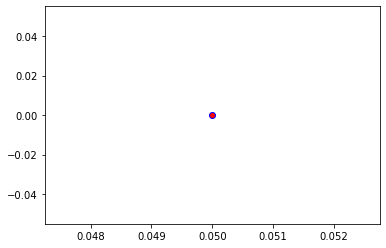

Crafting adversarial images took: 8.475731372833252 seconds 

Images classified as:
000000162130 912 = worm fence
000000162366 707 = pay-phone
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


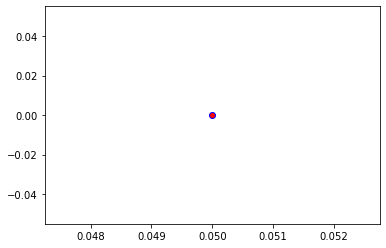

Crafting adversarial images took: 8.423798084259033 seconds 

Images classified as:
000000162415 429 = baseball
000000162543 386 = African elephant
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


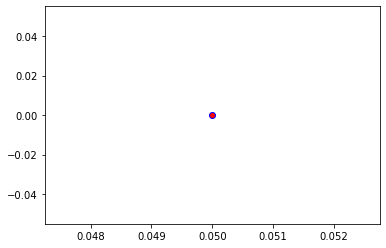

Crafting adversarial images took: 8.376455783843994 seconds 

Images classified as:
000000162581 752 = racket
000000162732 862 = torch
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


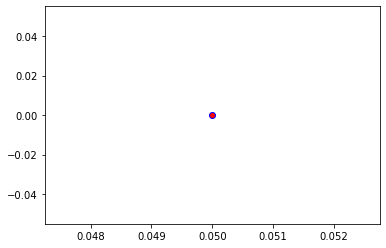

Crafting adversarial images took: 8.667100191116333 seconds 

Images classified as:
000000162858 920 = traffic light
000000163057 417 = balloon
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


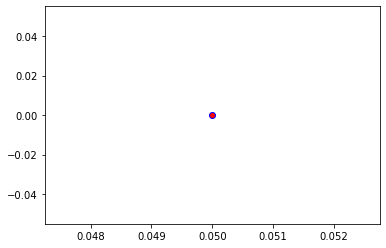

Crafting adversarial images took: 9.562593698501587 seconds 

Images classified as:
000000163117 417 = balloon
000000163118 890 = volleyball
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


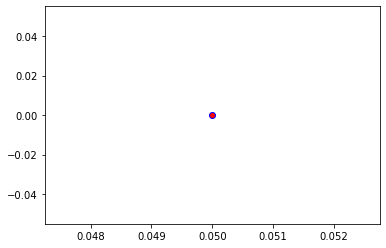

Crafting adversarial images took: 9.9905264377594 seconds 

Images classified as:
000000163155 285 = Egyptian cat
000000163257 862 = torch
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


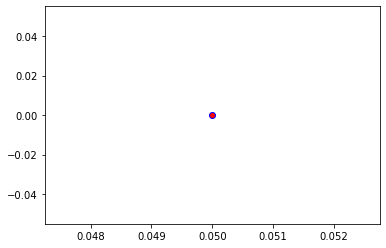

Crafting adversarial images took: 9.921446561813354 seconds 

Images classified as:
000000163258 861 = toilet seat
000000163290 340 = zebra
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


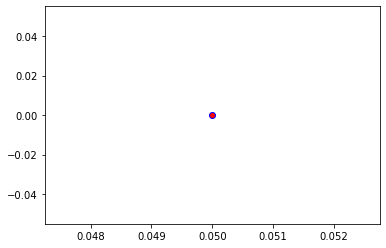

Crafting adversarial images took: 9.493388652801514 seconds 

Images classified as:
000000163314 860 = tobacco shop
000000163562 842 = swimming trunks
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


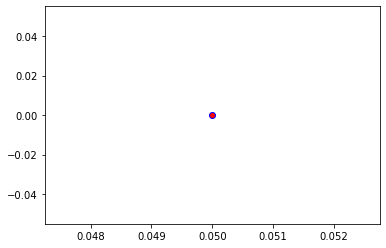

Crafting adversarial images took: 9.936409950256348 seconds 

Images classified as:
000000163611 963 = pizza
000000163640 480 = cash machine
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


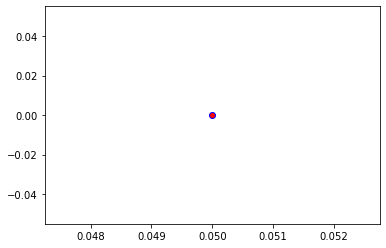

Crafting adversarial images took: 10.734760522842407 seconds 

Images classified as:
000000163682 906 = Windsor tie
000000163746 977 = sandbar
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


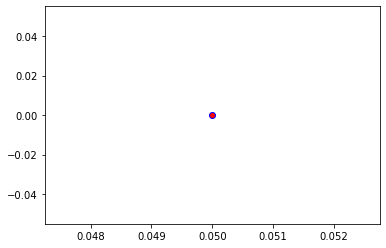

Crafting adversarial images took: 8.407837629318237 seconds 

Images classified as:
000000163951 512 = corkscrew
000000164115 822 = steel drum
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


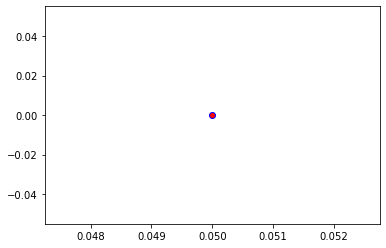

Crafting adversarial images took: 8.53340482711792 seconds 

Images classified as:
000000164363 892 = wall clock
000000164602 999 = toilet tissue
Min values in image-array: 0.0 Max values in image-array: 254.62122
Min values in image-array: 0.0 Max values in image-array: 0.9985146
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


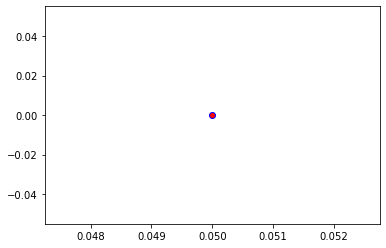

Crafting adversarial images took: 8.401809692382812 seconds 

Images classified as:
000000164637 896 = washbasin
000000164883 620 = laptop
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


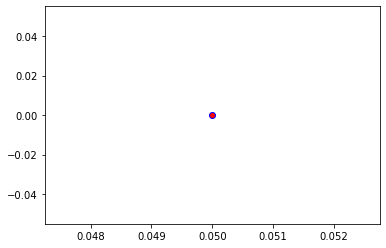

Crafting adversarial images took: 8.476743936538696 seconds 

Images classified as:
000000164885 248 = ski
000000164969 963 = pizza
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


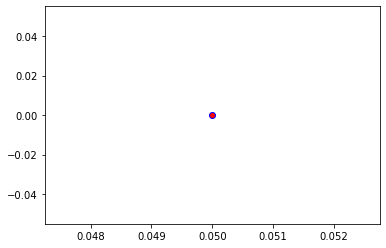

Crafting adversarial images took: 8.636708974838257 seconds 

Images classified as:
000000165039 874 = trolleybus
000000165257 651 = microwave
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


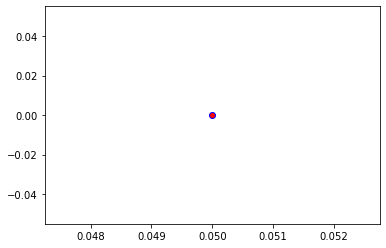

Crafting adversarial images took: 8.433720111846924 seconds 

Images classified as:
000000165336 293 = cheetah
000000165351 962 = meat loaf
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


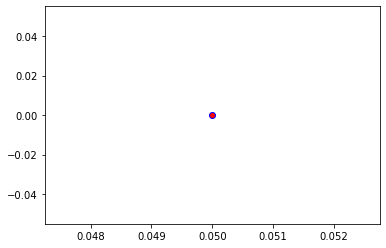

Crafting adversarial images took: 8.78850507736206 seconds 

Images classified as:
000000165500 347 = bison
000000165518 983 = scuba diver
Min values in image-array: 11.849215 Max values in image-array: 255.0
Min values in image-array: 0.04646751 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


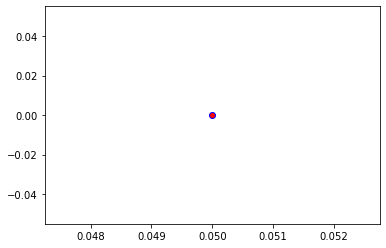

Crafting adversarial images took: 8.637448072433472 seconds 

Images classified as:
000000165681 428 = barrow
000000165713 835 = sundial
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


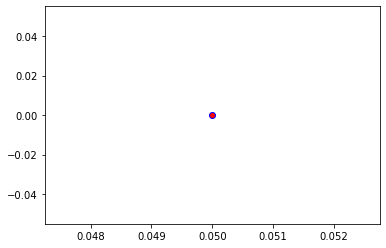

Crafting adversarial images took: 8.375560283660889 seconds 

Images classified as:
000000165831 937 = broccoli
000000166165 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


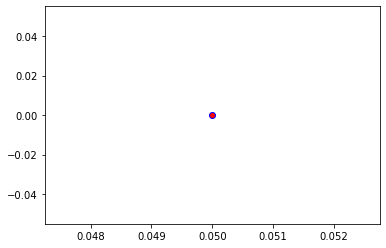

Crafting adversarial images took: 8.618472337722778 seconds 

Images classified as:
000000166166 548 = entertainment center
000000166259 330 = wood rabbit
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


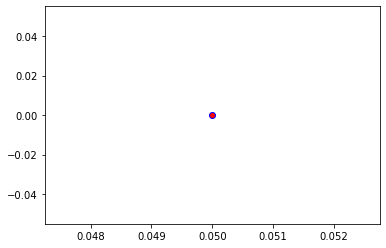

Crafting adversarial images took: 8.45162320137024 seconds 

Images classified as:
000000166277 287 = lynx
000000166287 386 = African elephant
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


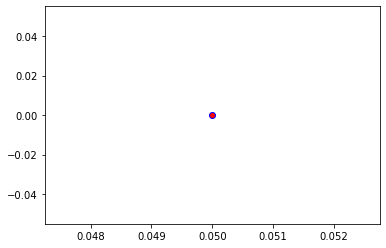

Crafting adversarial images took: 8.521567106246948 seconds 

Images classified as:
000000166391 920 = traffic light
000000166426 461 = plate
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


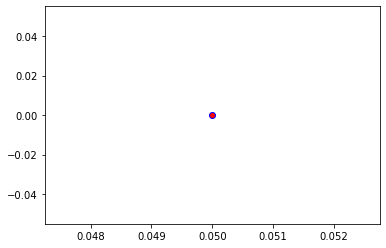

Crafting adversarial images took: 8.436458349227905 seconds 

Images classified as:
000000166478 620 = laptop
000000166509 920 = traffic light
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


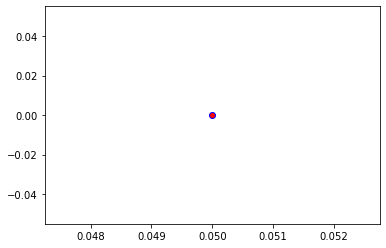

Crafting adversarial images took: 8.546507358551025 seconds 

Images classified as:
000000166521 548 = entertainment center
000000166563 51 = triceratops
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


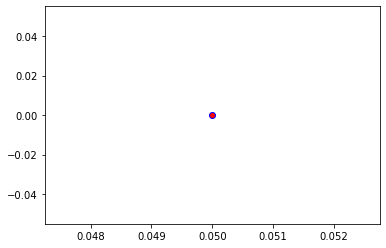

Crafting adversarial images took: 8.682009220123291 seconds 

Images classified as:
000000166642 385 = Indian elephant
000000166664 386 = African elephant
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


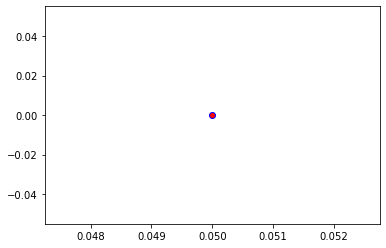

Crafting adversarial images took: 8.424367666244507 seconds 

Images classified as:
000000166747 829 = streetcar
000000166768 639 = suit
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


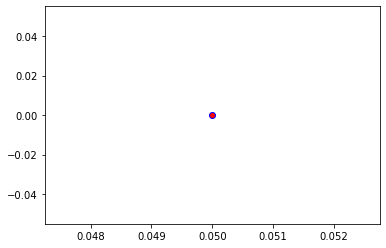

Crafting adversarial images took: 8.458200454711914 seconds 

Images classified as:
000000166918 762 = restaurant
000000167067 457 = bow tie
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


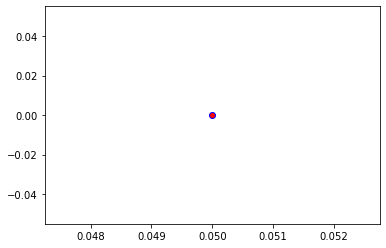

Crafting adversarial images took: 8.42592978477478 seconds 

Images classified as:
000000167122 818 = spotlight
000000167128 101 = tusker
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


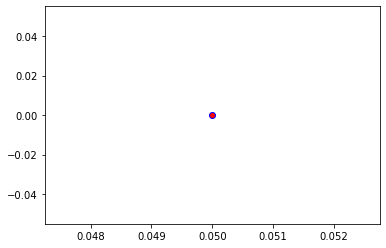

Crafting adversarial images took: 8.426449060440063 seconds 

Images classified as:
000000167159 431 = bassinet
000000167240 883 = vase
Min values in image-array: 0.0 Max values in image-array: 254.71541
Min values in image-array: 0.0 Max values in image-array: 0.99888396
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


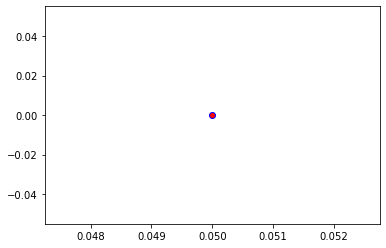

Crafting adversarial images took: 8.746235370635986 seconds 

Images classified as:
000000167353 892 = wall clock
000000167486 546 = electric guitar
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


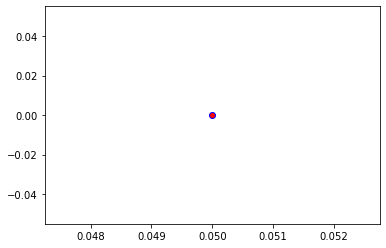

Crafting adversarial images took: 8.676101207733154 seconds 

Images classified as:
000000167540 895 = warplane
000000167572 928 = ice cream
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


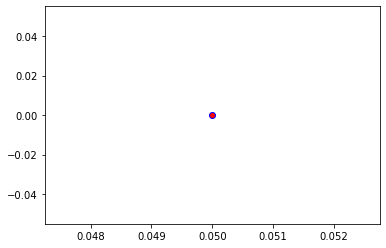

Crafting adversarial images took: 8.60625696182251 seconds 

Images classified as:
000000167898 896 = washbasin
000000167902 96 = toucan
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


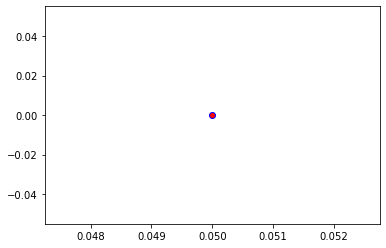

Crafting adversarial images took: 8.4651460647583 seconds 

Images classified as:
000000168330 920 = traffic light
000000168337 480 = cash machine
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


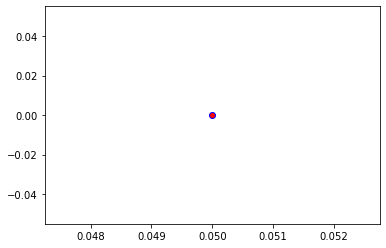

Crafting adversarial images took: 8.37059497833252 seconds 

Images classified as:
000000168458 883 = vase
000000168593 760 = refrigerator
Min values in image-array: 0.049966305 Max values in image-array: 255.0
Min values in image-array: 0.0001959463 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


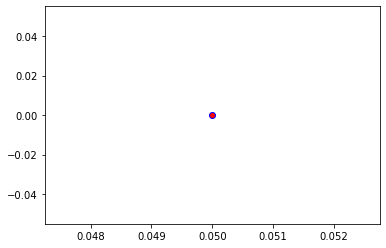

Crafting adversarial images took: 8.438216209411621 seconds 

Images classified as:
000000168619 140 = alp
000000168883 678 = neck brace
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


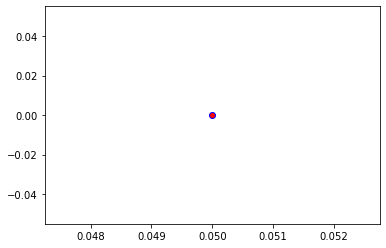

Crafting adversarial images took: 8.680719375610352 seconds 

Images classified as:
000000168974 784 = screwdriver
000000169076 851 = television
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


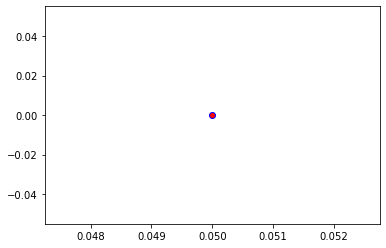

Crafting adversarial images took: 8.375696659088135 seconds 

Images classified as:
000000169169 919 = street sign
000000169356 730 = plow
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


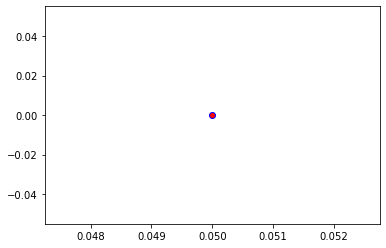

Crafting adversarial images took: 8.418915271759033 seconds 

Images classified as:
000000169996 603 = horse cart
000000170099 906 = Windsor tie
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


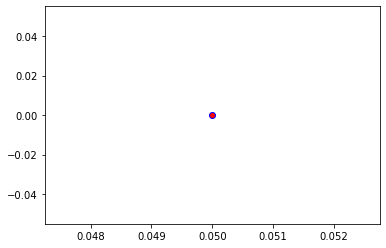

Crafting adversarial images took: 8.551872730255127 seconds 

Images classified as:
000000170116 760 = refrigerator
000000170191 885 = velvet
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


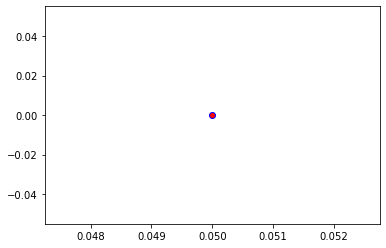

Crafting adversarial images took: 8.440971612930298 seconds 

Images classified as:
000000170278 180 = American Staffordshire terrier
000000170474 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


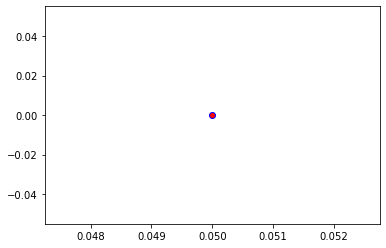

Crafting adversarial images took: 8.378385066986084 seconds 

Images classified as:
000000170545 920 = traffic light
000000170595 461 = plate
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


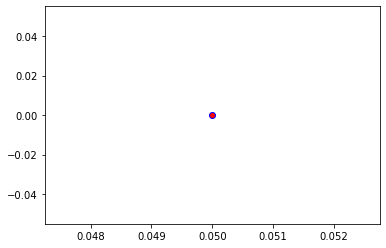

Crafting adversarial images took: 8.379499435424805 seconds 

Images classified as:
000000170613 693 = paddle
000000170670 544 = Dutch oven
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


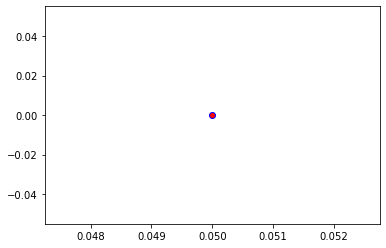

Crafting adversarial images took: 8.529688835144043 seconds 

Images classified as:
000000170739 385 = Indian elephant
000000170893 861 = toilet seat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


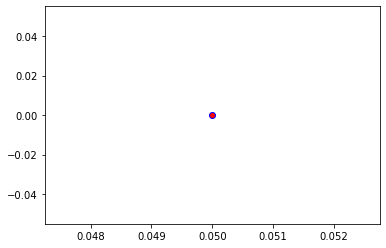

Crafting adversarial images took: 8.693691730499268 seconds 

Images classified as:
000000170955 639 = suit
000000171050 471 = cannon
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


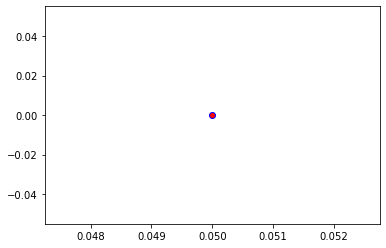

Crafting adversarial images took: 8.787596702575684 seconds 

Images classified as:
000000171190 762 = restaurant
000000171298 757 = recreational vehicle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


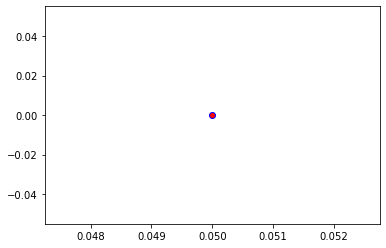

Crafting adversarial images took: 10.928476095199585 seconds 

Images classified as:
000000171382 880 = unicycle
000000171611 977 = sandbar
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


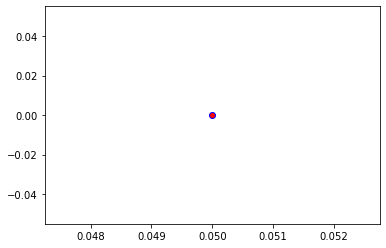

Crafting adversarial images took: 7.696424245834351 seconds 

Images classified as:
000000171740 831 = studio couch
000000171757 840 = swab
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


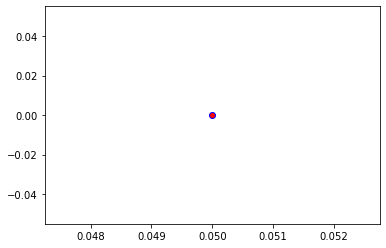

Crafting adversarial images took: 7.654515266418457 seconds 

Images classified as:
000000171788 752 = racket
000000172083 861 = toilet seat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


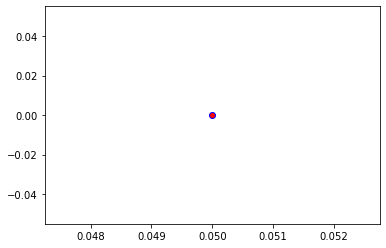

Crafting adversarial images took: 7.744335412979126 seconds 

Images classified as:
000000172330 104 = wallaby
000000172396 962 = meat loaf
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


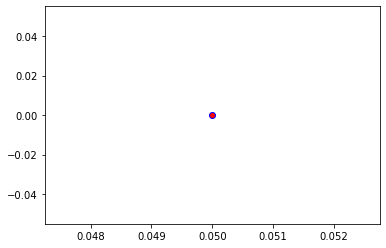

Crafting adversarial images took: 7.726239919662476 seconds 

Images classified as:
000000172547 979 = valley
000000172571 963 = pizza
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


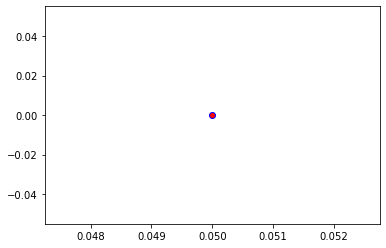

Crafting adversarial images took: 7.697902679443359 seconds 

Images classified as:
000000172595 526 = desk
000000172617 655 = miniskirt
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


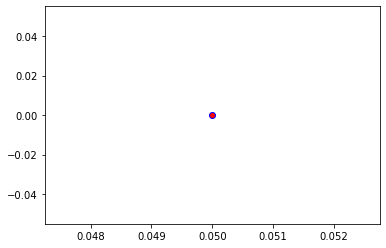

Crafting adversarial images took: 7.850768804550171 seconds 

Images classified as:
000000172648 569 = garbage truck
000000172649 880 = unicycle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


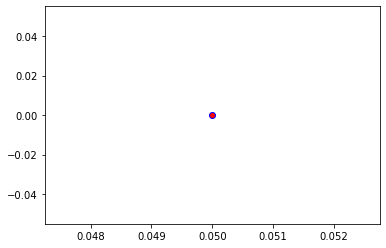

Crafting adversarial images took: 7.68300724029541 seconds 

Images classified as:
000000172856 919 = street sign
000000172877 639 = suit
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


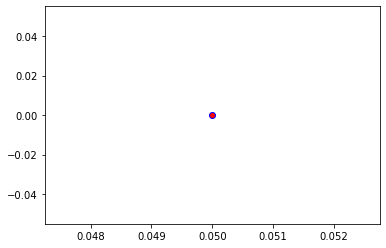

Crafting adversarial images took: 7.884793281555176 seconds 

Images classified as:
000000172935 895 = warplane
000000172946 541 = drum
Min values in image-array: 0.40615082 Max values in image-array: 255.0
Min values in image-array: 0.0015927483 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


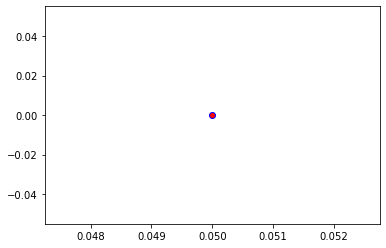

Crafting adversarial images took: 7.760808229446411 seconds 

Images classified as:
000000172977 340 = zebra
000000173004 928 = ice cream
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


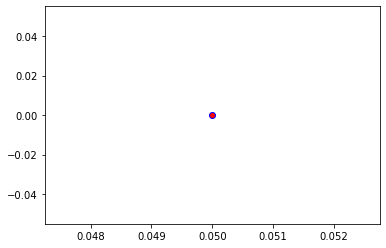

Crafting adversarial images took: 7.716079950332642 seconds 

Images classified as:
000000173008 652 = military uniform
000000173033 295 = American black bear
Min values in image-array: 0.21430206 Max values in image-array: 255.0
Min values in image-array: 0.00084040023 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


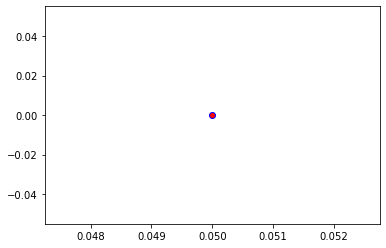

Crafting adversarial images took: 7.736300468444824 seconds 

Images classified as:
000000173044 442 = bell cote
000000173057 583 = guillotine
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


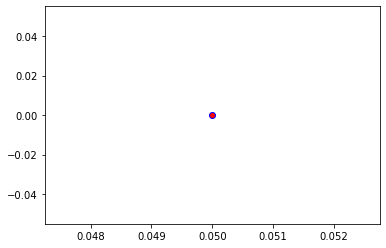

Crafting adversarial images took: 8.104138612747192 seconds 

Images classified as:
000000173091 773 = saltshaker
000000173183 919 = street sign
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


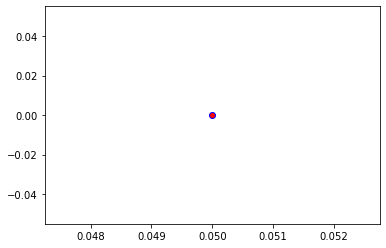

Crafting adversarial images took: 8.029686450958252 seconds 

Images classified as:
000000173302 762 = restaurant
000000173371 461 = plate
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


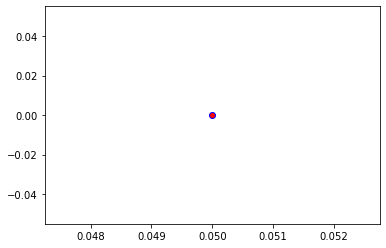

Crafting adversarial images took: 8.10919189453125 seconds 

Images classified as:
000000173383 406 = altar
000000173799 385 = Indian elephant
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


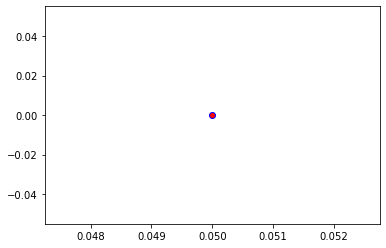

Crafting adversarial images took: 7.777373552322388 seconds 

Images classified as:
000000173830 248 = ski
000000174004 595 = harvester
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


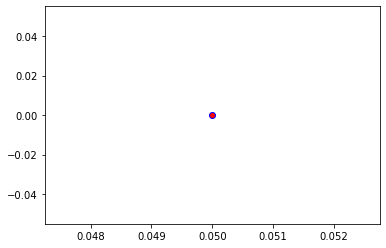

Crafting adversarial images took: 7.728982448577881 seconds 

Images classified as:
000000174018 850 = teddy
000000174123 963 = pizza
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


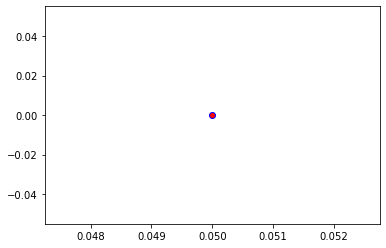

Crafting adversarial images took: 7.846204042434692 seconds 

Images classified as:
000000174231 579 = grand piano
000000174371 822 = steel drum
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


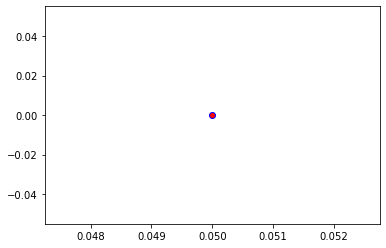

Crafting adversarial images took: 7.806530714035034 seconds 

Images classified as:
000000174482 870 = tricycle
000000175251 929 = ice lolly
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


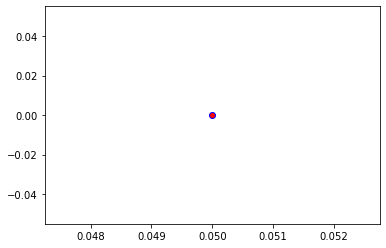

Crafting adversarial images took: 7.816715240478516 seconds 

Images classified as:
000000175364 651 = microwave
000000175387 861 = toilet seat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


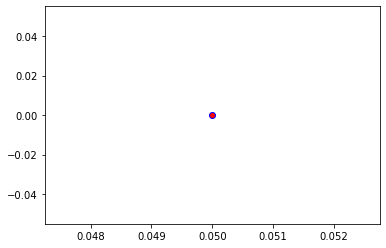

Crafting adversarial images took: 7.796659708023071 seconds 

Images classified as:
000000175438 920 = traffic light
000000175443 850 = teddy
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


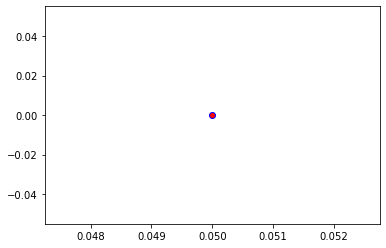

Crafting adversarial images took: 7.877704620361328 seconds 

Images classified as:
000000175535 461 = plate
000000176037 874 = trolleybus
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


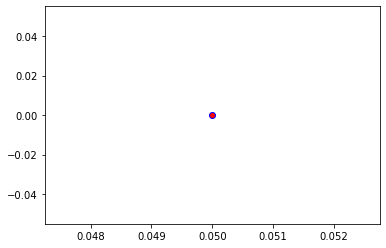

Crafting adversarial images took: 7.743947744369507 seconds 

Images classified as:
000000176232 883 = vase
000000176446 767 = rubber eraser
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


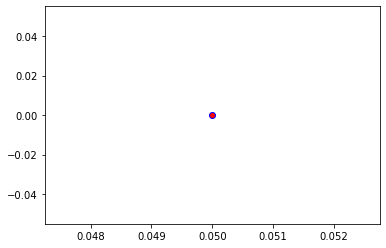

Crafting adversarial images took: 7.9471399784088135 seconds 

Images classified as:
000000176606 222 = kuvasz
000000176634 340 = zebra
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


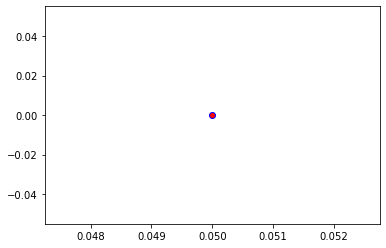

Crafting adversarial images took: 7.9194018840789795 seconds 

Images classified as:
000000176701 919 = street sign
000000176778 861 = toilet seat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


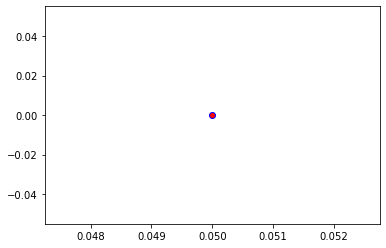

Crafting adversarial images took: 7.758169174194336 seconds 

Images classified as:
000000176799 580 = greenhouse
000000176847 91 = coucal
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


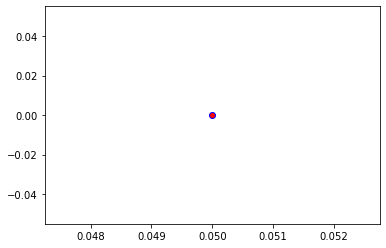

Crafting adversarial images took: 7.75043249130249 seconds 

Images classified as:
000000176857 884 = vault
000000176901 248 = ski
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


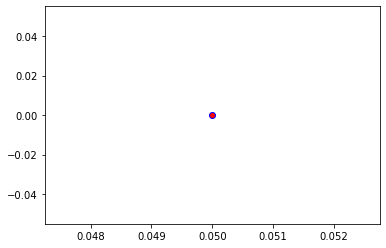

Crafting adversarial images took: 8.12882137298584 seconds 

Images classified as:
000000177015 620 = laptop
000000177065 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


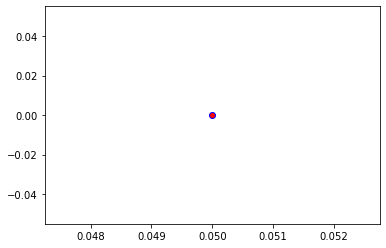

Crafting adversarial images took: 7.889235019683838 seconds 

Images classified as:
000000177213 963 = pizza
000000177357 693 = paddle
Min values in image-array: 0.0 Max values in image-array: 254.93639
Min values in image-array: 0.0 Max values in image-array: 0.99975055
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


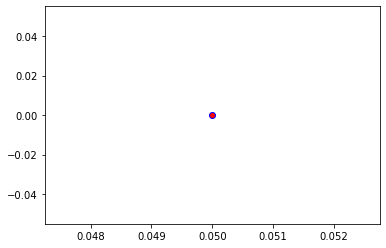

Crafting adversarial images took: 7.748002052307129 seconds 

Images classified as:
000000177383 547 = electric locomotive
000000177489 532 = dining table
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


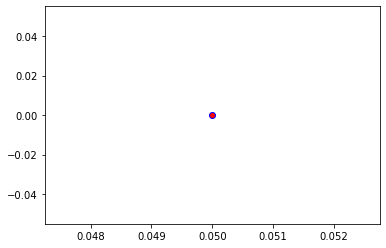

Crafting adversarial images took: 7.715720891952515 seconds 

Images classified as:
000000177539 701 = parachute
000000177714 461 = plate
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


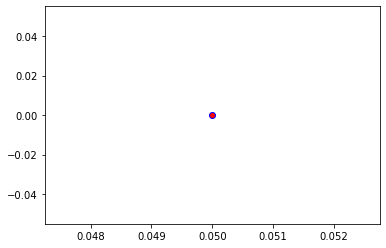

Crafting adversarial images took: 7.69264817237854 seconds 

Images classified as:
000000177861 879 = umbrella
000000177893 874 = trolleybus
Min values in image-array: 0.4286499 Max values in image-array: 255.0
Min values in image-array: 0.00168098 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


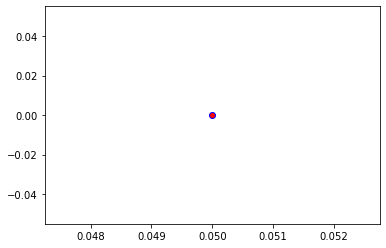

Crafting adversarial images took: 7.680599212646484 seconds 

Images classified as:
000000177934 665 = moped
000000177935 827 = stove
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


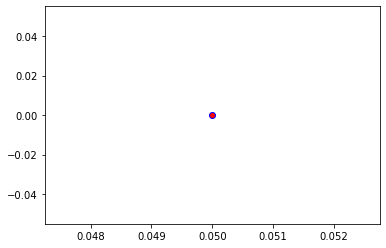

Crafting adversarial images took: 7.9947028160095215 seconds 

Images classified as:
000000178028 896 = washbasin
000000178469 620 = laptop
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


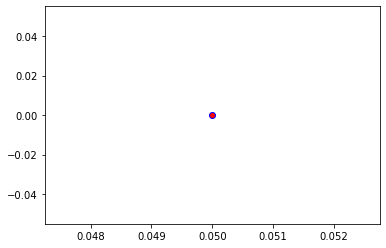

Crafting adversarial images took: 8.026040077209473 seconds 

Images classified as:
000000178618 386 = African elephant
000000178744 408 = amphibian
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


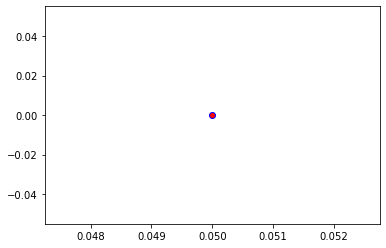

Crafting adversarial images took: 7.682363271713257 seconds 

Images classified as:
000000178982 920 = traffic light
000000179112 487 = cellular telephone
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


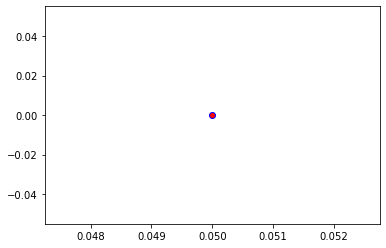

Crafting adversarial images took: 7.766397476196289 seconds 

Images classified as:
000000179141 618 = ladle
000000179174 675 = moving van
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


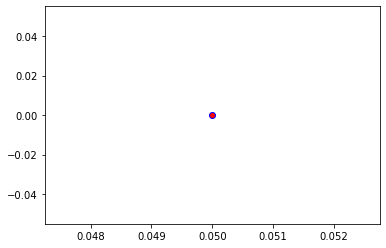

Crafting adversarial images took: 7.776727199554443 seconds 

Images classified as:
000000179214 963 = pizza
000000179265 779 = school bus
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


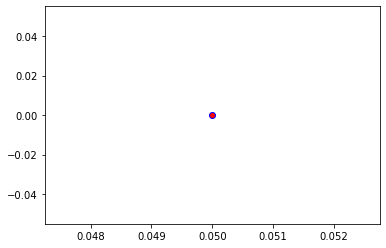

Crafting adversarial images took: 7.7576258182525635 seconds 

Images classified as:
000000179285 752 = racket
000000179392 199 = Scotch terrier
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


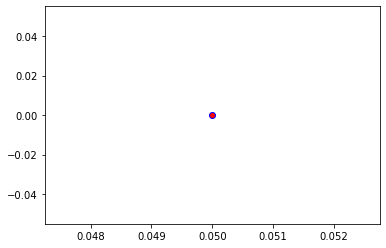

Crafting adversarial images took: 7.709923982620239 seconds 

Images classified as:
000000179487 752 = racket
000000179642 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


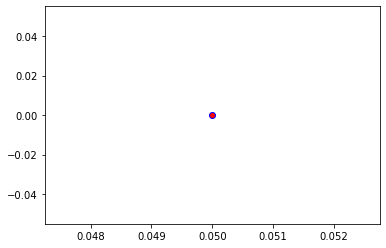

Crafting adversarial images took: 7.742246389389038 seconds 

Images classified as:
000000179653 409 = analog clock
000000179765 665 = moped
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


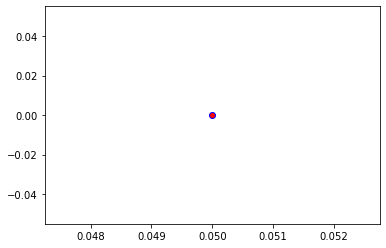

Crafting adversarial images took: 7.818078517913818 seconds 

Images classified as:
000000179898 934 = hotdog
000000180011 383 = Madagascar cat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


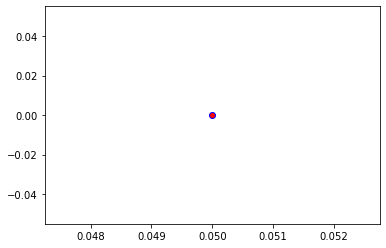

Crafting adversarial images took: 8.029066562652588 seconds 

Images classified as:
000000180101 470 = candle
000000180135 650 = microphone
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


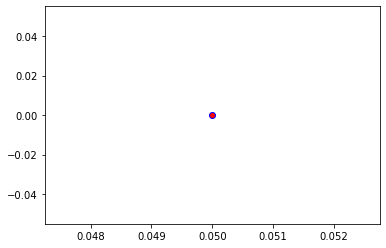

Crafting adversarial images took: 10.161725521087646 seconds 

Images classified as:
000000180188 565 = freight car
000000180296 431 = bassinet
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


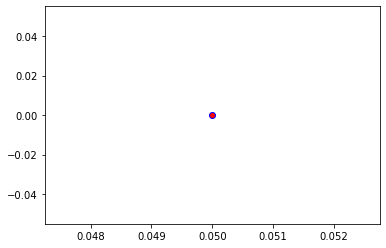

Crafting adversarial images took: 9.923625946044922 seconds 

Images classified as:
000000180383 172 = whippet
000000180487 879 = umbrella
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


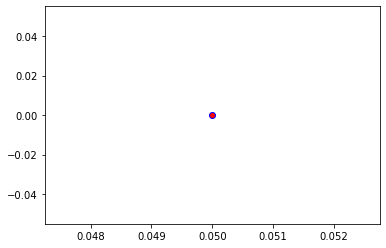

Crafting adversarial images took: 8.653406381607056 seconds 

Images classified as:
000000180560 470 = candle
000000180751 583 = guillotine
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


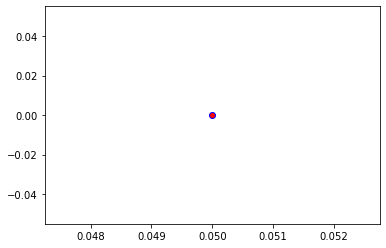

Crafting adversarial images took: 8.312812328338623 seconds 

Images classified as:
000000180792 861 = toilet seat
000000180798 605 = iPod
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


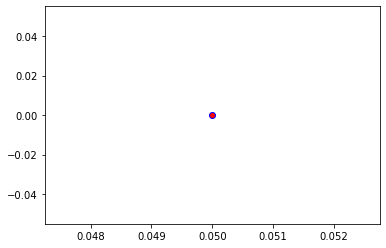

Crafting adversarial images took: 8.35786509513855 seconds 

Images classified as:
000000180878 692 = packet
000000181303 879 = umbrella
Min values in image-array: 0.0 Max values in image-array: 254.8913
Min values in image-array: 0.0 Max values in image-array: 0.9995737
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


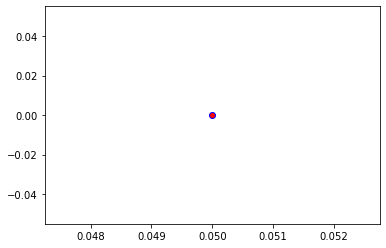

Crafting adversarial images took: 8.512351512908936 seconds 

Images classified as:
000000181421 879 = umbrella
000000181499 620 = laptop
Min values in image-array: 0.034914467 Max values in image-array: 255.0
Min values in image-array: 0.00013691948 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


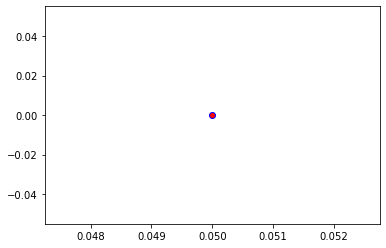

Crafting adversarial images took: 9.123613357543945 seconds 

Images classified as:
000000181542 665 = moped
000000181666 355 = llama
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


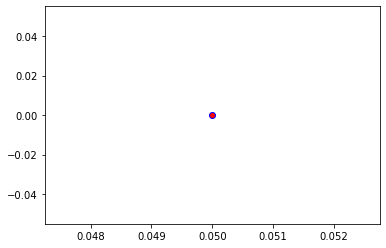

Crafting adversarial images took: 8.637918949127197 seconds 

Images classified as:
000000181753 905 = window shade
000000181796 461 = plate
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


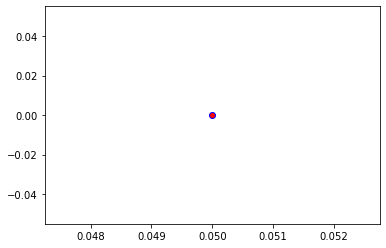

Crafting adversarial images took: 8.967900037765503 seconds 

Images classified as:
000000181816 703 = park bench
000000181859 896 = washbasin
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


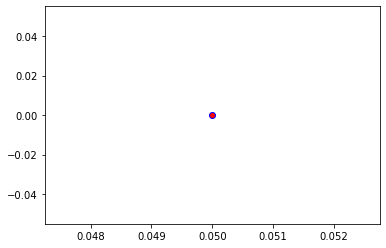

Crafting adversarial images took: 9.088863372802734 seconds 

Images classified as:
000000181969 184 = Irish terrier
000000182021 981 = ballplayer
Min values in image-array: 0.0 Max values in image-array: 254.12611
Min values in image-array: 0.0 Max values in image-array: 0.996573
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


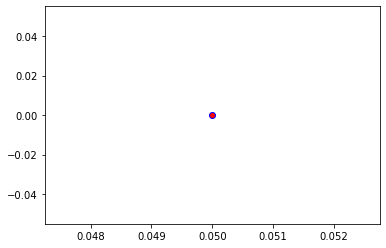

Crafting adversarial images took: 8.363505125045776 seconds 

Images classified as:
000000182155 823 = stethoscope
000000182162 882 = vacuum
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


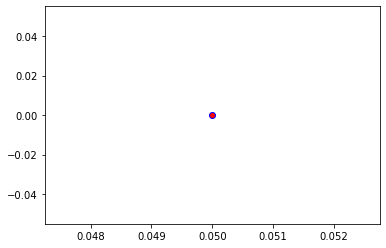

Crafting adversarial images took: 8.88209319114685 seconds 

Images classified as:
000000182202 681 = notebook
000000182417 461 = plate
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


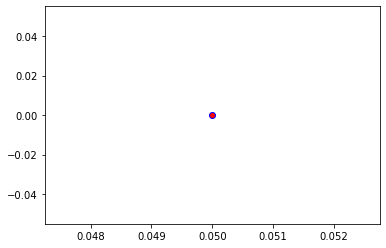

Crafting adversarial images took: 8.939446687698364 seconds 

Images classified as:
000000182441 143 = oystercatcher
000000182611 926 = hot pot
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


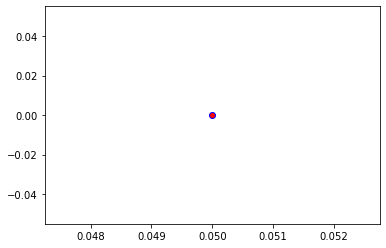

Crafting adversarial images took: 8.640991687774658 seconds 

Images classified as:
000000182805 256 = Newfoundland
000000182923 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


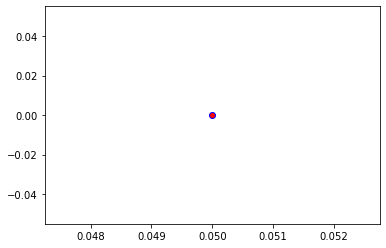

Crafting adversarial images took: 8.220972776412964 seconds 

Images classified as:
000000183049 453 = bookcase
000000183104 354 = Arabian camel
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


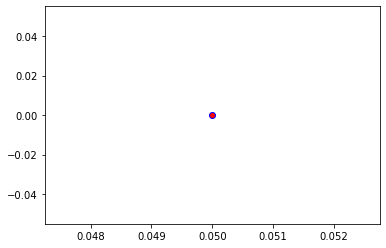

Crafting adversarial images took: 8.640631437301636 seconds 

Images classified as:
000000183127 814 = speedboat
000000183246 920 = traffic light
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


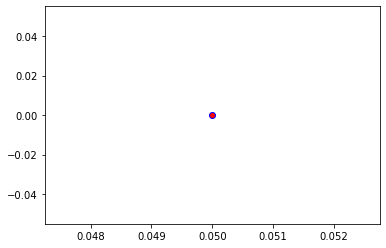

Crafting adversarial images took: 8.474912881851196 seconds 

Images classified as:
000000183391 752 = racket
000000183437 385 = Indian elephant
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


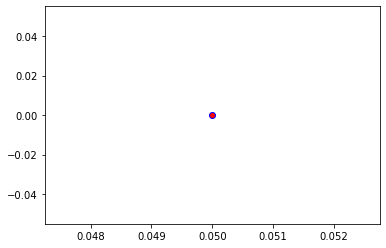

Crafting adversarial images took: 8.955856084823608 seconds 

Images classified as:
000000183500 318 = wing
000000183648 385 = Indian elephant
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


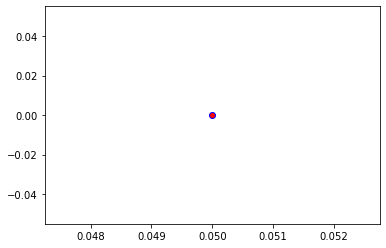

Crafting adversarial images took: 8.623215436935425 seconds 

Images classified as:
000000183675 339 = sorrel
000000183709 515 = cowboy hat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


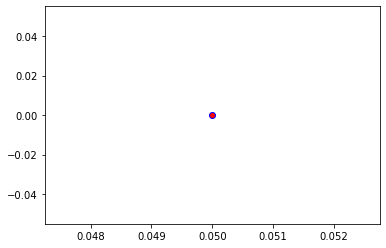

Crafting adversarial images took: 8.504180908203125 seconds 

Images classified as:
000000183716 639 = suit
000000183965 934 = hotdog
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


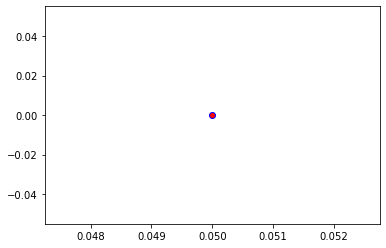

Crafting adversarial images took: 8.136224746704102 seconds 

Images classified as:
000000184321 547 = electric locomotive
000000184324 603 = horse cart
Min values in image-array: 0.0 Max values in image-array: 253.98973
Min values in image-array: 0.0 Max values in image-array: 0.99603814
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


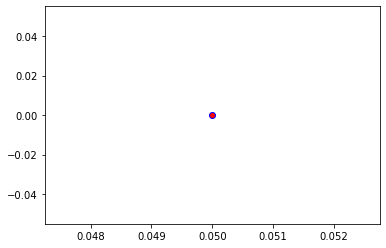

Crafting adversarial images took: 8.105052471160889 seconds 

Images classified as:
000000184338 586 = half track
000000184384 461 = plate
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


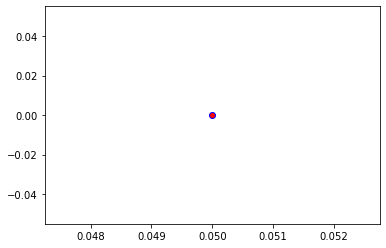

Crafting adversarial images took: 9.29909634590149 seconds 

Images classified as:
000000184400 498 = cinema
000000184611 612 = jinrikisha
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


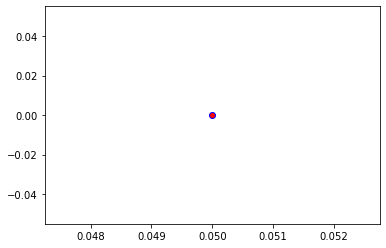

Crafting adversarial images took: 9.253954410552979 seconds 

Images classified as:
000000184762 892 = wall clock
000000184791 868 = tray
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


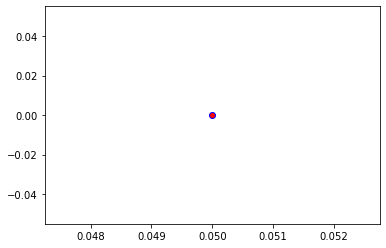

Crafting adversarial images took: 9.465996026992798 seconds 

Images classified as:
000000184978 248 = ski
000000185157 919 = street sign
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


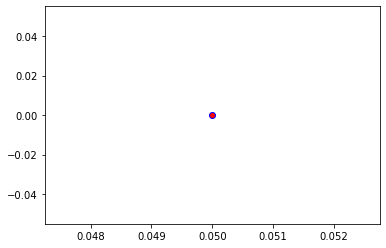

Crafting adversarial images took: 8.83171820640564 seconds 

Images classified as:
000000185250 805 = soccer ball
000000185292 460 = breakwater
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


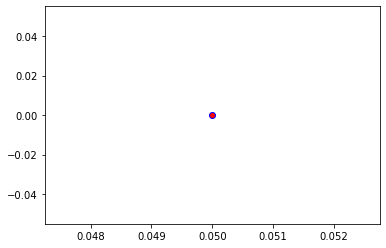

Crafting adversarial images took: 8.564778804779053 seconds 

Images classified as:
000000185409 340 = zebra
000000185472 612 = jinrikisha
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


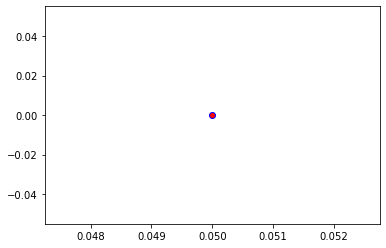

Crafting adversarial images took: 8.641490459442139 seconds 

Images classified as:
000000185473 134 = crane
000000185599 950 = orange
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


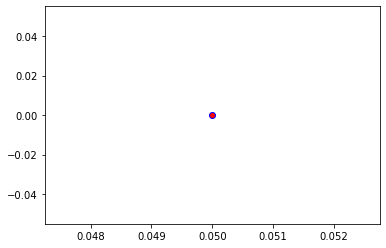

Crafting adversarial images took: 8.383289098739624 seconds 

Images classified as:
000000185802 765 = rocking chair
000000185890 775 = sarong
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


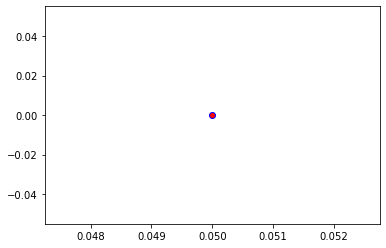

Crafting adversarial images took: 8.429297685623169 seconds 

Images classified as:
000000185950 602 = horizontal bar
000000186042 975 = lakeside
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


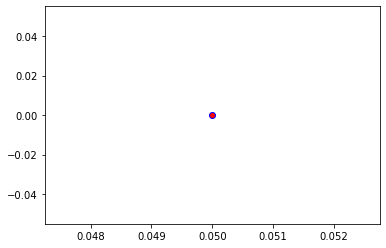

Crafting adversarial images took: 8.500744819641113 seconds 

Images classified as:
000000186282 527 = desktop computer
000000186296 761 = remote control
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


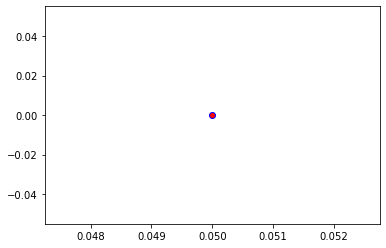

Crafting adversarial images took: 8.448436737060547 seconds 

Images classified as:
000000186345 701 = parachute
000000186422 294 = brown bear
Min values in image-array: 1.2186451 Max values in image-array: 254.93192
Min values in image-array: 0.0047790003 Max values in image-array: 0.99973303
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


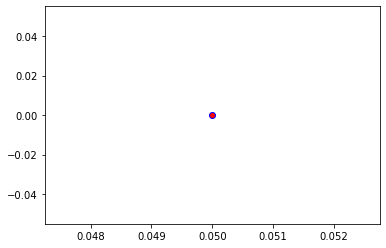

Crafting adversarial images took: 8.583552122116089 seconds 

Images classified as:
000000186449 881 = upright
000000186624 820 = steam locomotive
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


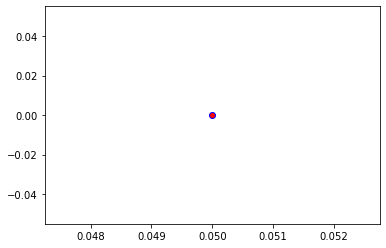

Crafting adversarial images took: 8.556574583053589 seconds 

Images classified as:
000000186632 598 = home theater
000000186637 293 = cheetah
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


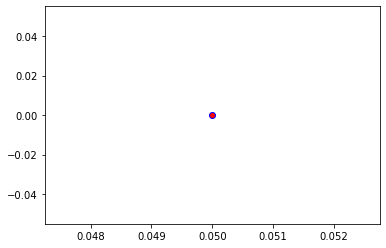

Crafting adversarial images took: 8.52626371383667 seconds 

Images classified as:
000000186873 472 = canoe
000000186929 950 = orange
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


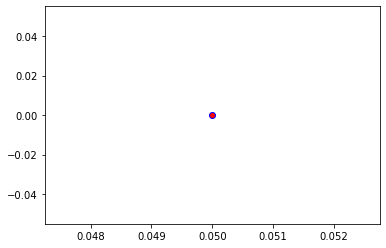

Crafting adversarial images took: 8.540671825408936 seconds 

Images classified as:
000000186938 139 = ruddy turnstone
000000186980 532 = dining table
Min values in image-array: 0.0 Max values in image-array: 250.38245
Min values in image-array: 0.0 Max values in image-array: 0.98189193
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


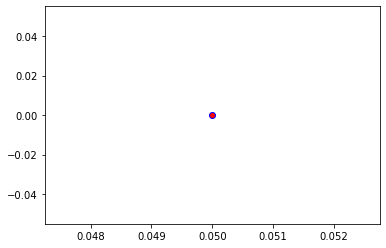

Crafting adversarial images took: 8.519398212432861 seconds 

Images classified as:
000000187055 752 = racket
000000187144 705 = passenger car
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


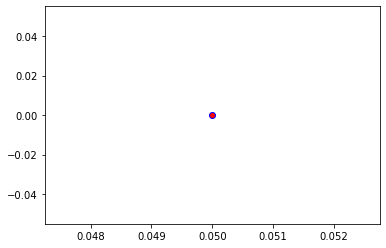

Crafting adversarial images took: 8.425387859344482 seconds 

Images classified as:
000000187236 209 = Chesapeake Bay retriever
000000187243 731 = plunger
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


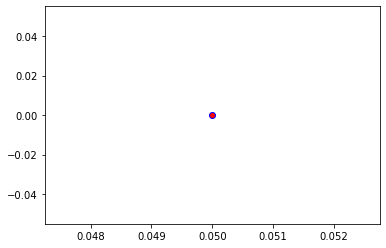

Crafting adversarial images took: 8.838587522506714 seconds 

Images classified as:
000000187249 631 = lotion
000000187271 760 = refrigerator
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


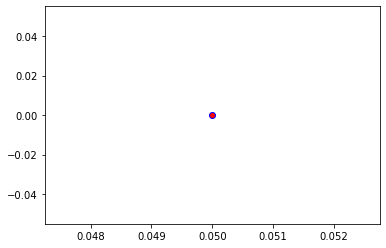

Crafting adversarial images took: 8.646603345870972 seconds 

Images classified as:
000000187362 842 = swimming trunks
000000187513 648 = medicine chest
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


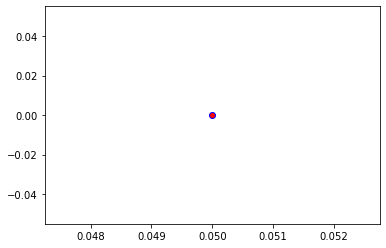

Crafting adversarial images took: 8.480100154876709 seconds 

Images classified as:
000000187585 776 = sax
000000187734 722 = ping-pong ball
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


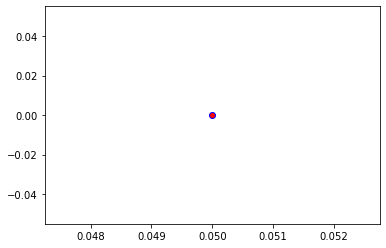

Crafting adversarial images took: 8.391531229019165 seconds 

Images classified as:
000000187745 21 = kite
000000187990 421 = bannister
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


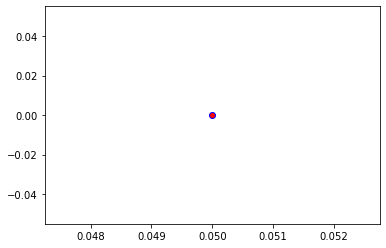

Crafting adversarial images took: 8.401296854019165 seconds 

Images classified as:
000000188296 560 = football helmet
000000188439 569 = garbage truck
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


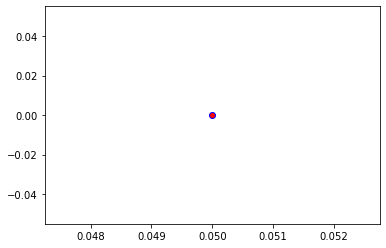

Crafting adversarial images took: 8.782076358795166 seconds 

Images classified as:
000000188465 981 = ballplayer
000000188592 929 = ice lolly
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


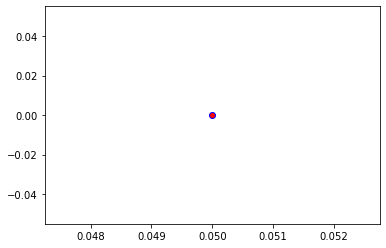

Crafting adversarial images took: 8.570095777511597 seconds 

Images classified as:
000000188689 864 = wreck
000000188906 26 = common newt
Min values in image-array: 0.0 Max values in image-array: 254.95256
Min values in image-array: 0.0 Max values in image-array: 0.999814
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


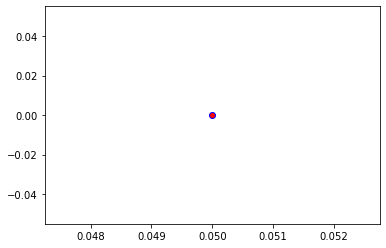

Crafting adversarial images took: 8.44489336013794 seconds 

Images classified as:
000000189078 952 = fig
000000189213 843 = swing
Min values in image-array: 0.0 Max values in image-array: 253.80594
Min values in image-array: 0.0 Max values in image-array: 0.9953174
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


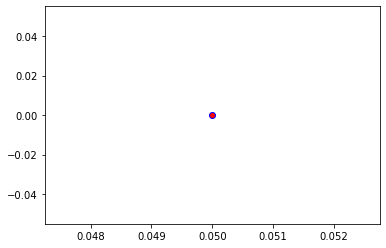

Crafting adversarial images took: 8.548722267150879 seconds 

Images classified as:
000000189226 898 = water bottle
000000189310 799 = sliding door
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


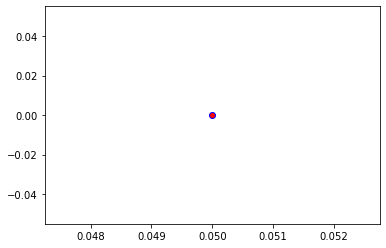

Crafting adversarial images took: 8.41946816444397 seconds 

Images classified as:
000000189436 850 = teddy
000000189451 960 = chocolate sauce
Min values in image-array: 0.27550155 Max values in image-array: 255.0
Min values in image-array: 0.0010803982 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


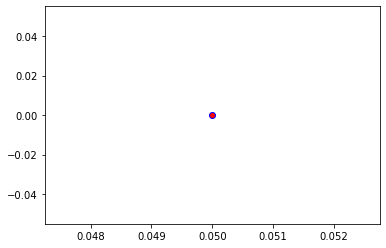

Crafting adversarial images took: 8.60510540008545 seconds 

Images classified as:
000000189475 762 = restaurant
000000189698 919 = street sign
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


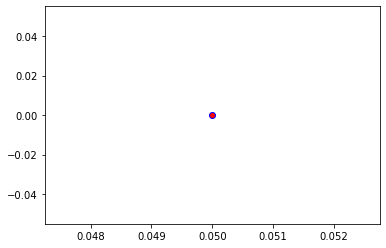

Crafting adversarial images took: 8.470132112503052 seconds 

Images classified as:
000000189752 963 = pizza
000000189775 430 = basketball
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


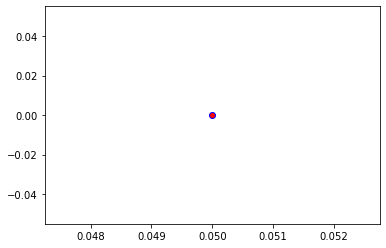

Crafting adversarial images took: 8.476499080657959 seconds 

Images classified as:
000000189806 217 = English springer
000000189820 526 = desk
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


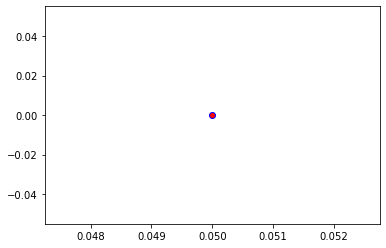

Crafting adversarial images took: 9.912034511566162 seconds 

Images classified as:
000000189828 895 = warplane
000000190007 147 = grey whale
Min values in image-array: 0.0 Max values in image-array: 254.97725
Min values in image-array: 0.0 Max values in image-array: 0.9999108
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


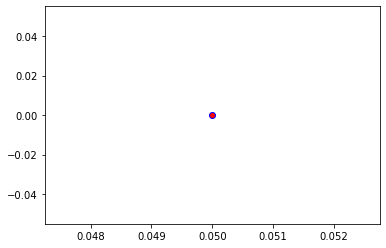

Crafting adversarial images took: 8.837922811508179 seconds 

Images classified as:
000000190140 814 = speedboat
000000190236 526 = desk
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


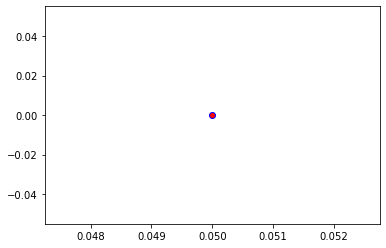

Crafting adversarial images took: 8.60245156288147 seconds 

Images classified as:
000000190307 433 = bathing cap
000000190637 529 = diaper
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


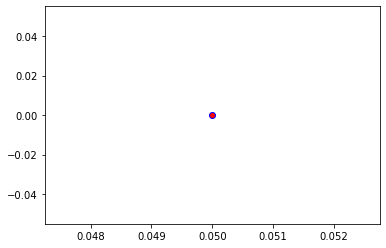

Crafting adversarial images took: 8.41448187828064 seconds 

Images classified as:
000000190648 669 = mosquito net
000000190676 405 = airship
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


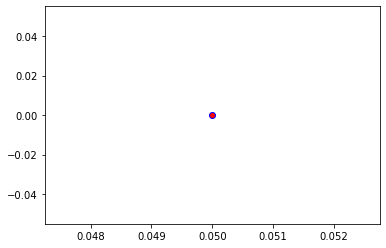

Crafting adversarial images took: 8.431553840637207 seconds 

Images classified as:
000000190753 703 = park bench
000000190756 671 = mountain bike
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


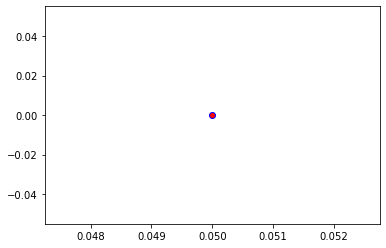

Crafting adversarial images took: 8.41448187828064 seconds 

Images classified as:
000000190841 880 = unicycle
000000190853 954 = banana
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


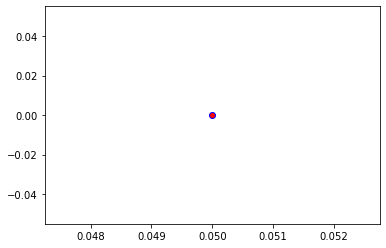

Crafting adversarial images took: 8.804489612579346 seconds 

Images classified as:
000000190923 919 = street sign
000000191013 409 = analog clock
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


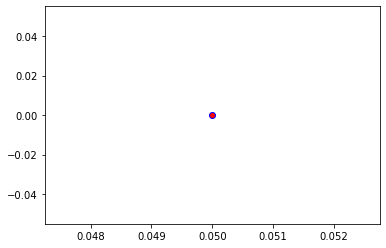

Crafting adversarial images took: 8.591946840286255 seconds 

Images classified as:
000000191288 339 = sorrel
000000191471 919 = street sign
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


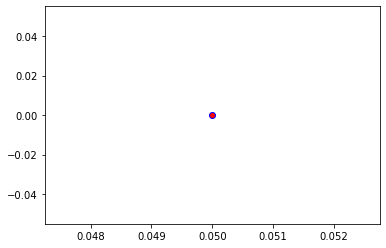

Crafting adversarial images took: 8.451078414916992 seconds 

Images classified as:
000000191580 461 = plate
000000191614 339 = sorrel
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


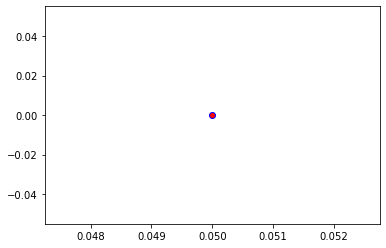

Crafting adversarial images took: 8.428987979888916 seconds 

Images classified as:
000000191672 978 = seashore
000000191761 54 = hognose snake
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


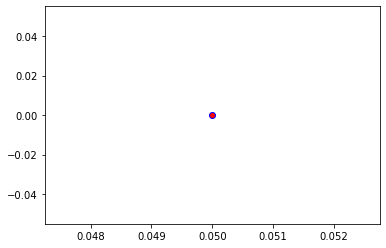

Crafting adversarial images took: 8.360929250717163 seconds 

Images classified as:
000000191845 879 = umbrella
000000192047 648 = medicine chest
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


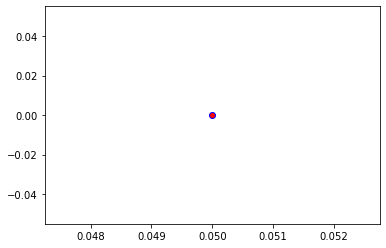

Crafting adversarial images took: 8.574373960494995 seconds 

Images classified as:
000000192191 963 = pizza
000000192607 609 = jeep
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


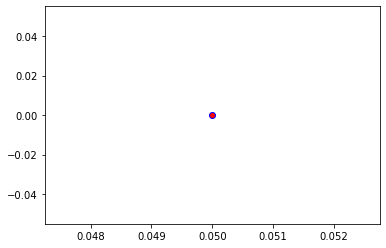

Crafting adversarial images took: 9.544482469558716 seconds 

Images classified as:
000000192670 429 = baseball
000000192699 671 = mountain bike
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


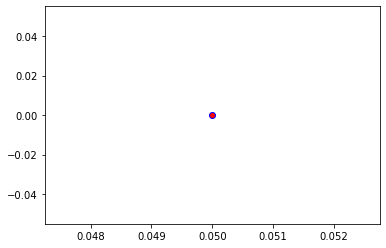

Crafting adversarial images took: 8.575339078903198 seconds 

Images classified as:
000000192716 919 = street sign
000000192871 950 = orange
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


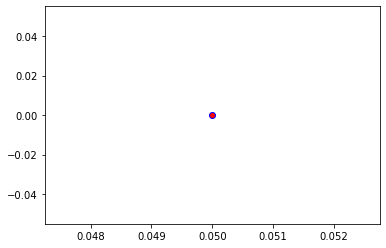

Crafting adversarial images took: 8.762917041778564 seconds 

Images classified as:
000000192904 461 = plate
000000192964 421 = bannister
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


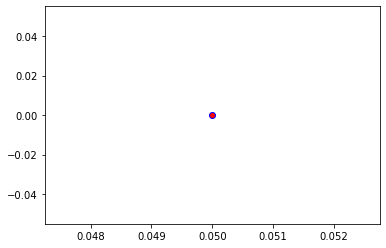

Crafting adversarial images took: 8.58683705329895 seconds 

Images classified as:
000000193162 346 = water buffalo
000000193181 981 = ballplayer
Min values in image-array: 0.12210153 Max values in image-array: 255.0
Min values in image-array: 0.00047882952 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


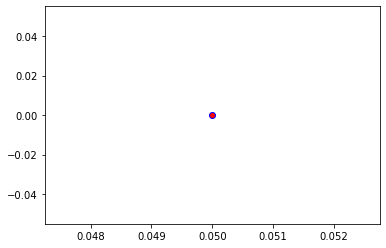

Crafting adversarial images took: 8.531294107437134 seconds 

Images classified as:
000000193245 701 = parachute
000000193348 629 = lipstick
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


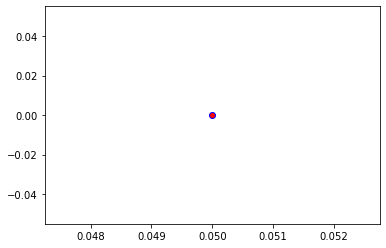

Crafting adversarial images took: 8.59220838546753 seconds 

Images classified as:
000000193429 537 = dogsled
000000193494 669 = mosquito net
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


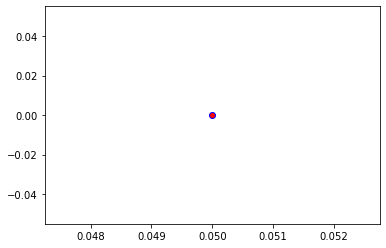

Crafting adversarial images took: 8.458832025527954 seconds 

Images classified as:
000000193674 977 = sandbar
000000193717 562 = fountain
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


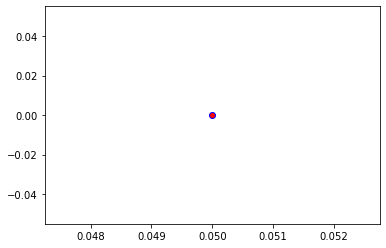

Crafting adversarial images took: 8.38435411453247 seconds 

Images classified as:
000000193743 702 = parallel bars
000000193884 716 = picket fence
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


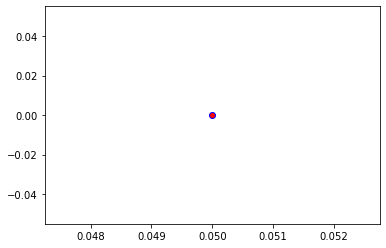

Crafting adversarial images took: 8.493789196014404 seconds 

Images classified as:
000000193926 954 = banana
000000194216 349 = bighorn
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


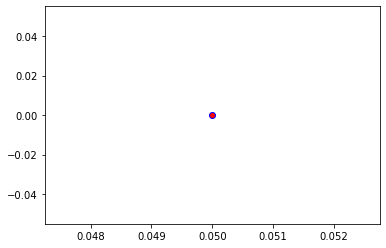

Crafting adversarial images took: 8.46851897239685 seconds 

Images classified as:
000000194471 880 = unicycle
000000194506 175 = otter
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


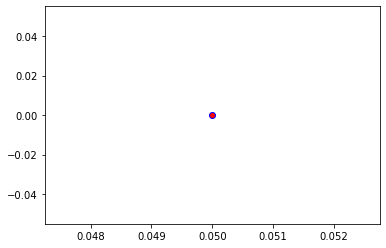

Crafting adversarial images took: 8.545779466629028 seconds 

Images classified as:
000000194716 929 = ice lolly
000000194724 963 = pizza
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


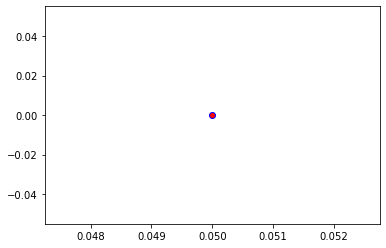

Crafting adversarial images took: 8.499364376068115 seconds 

Images classified as:
000000194746 766 = rotisserie
000000194832 705 = passenger car
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


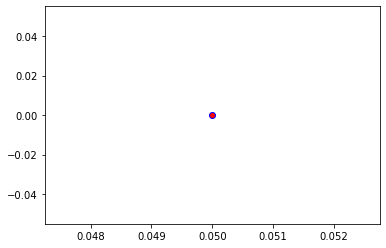

Crafting adversarial images took: 8.387555122375488 seconds 

Images classified as:
000000194875 573 = go-kart
000000194940 329 = cucumber
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


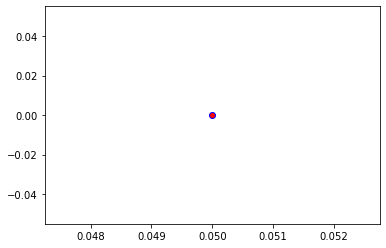

Crafting adversarial images took: 8.455923318862915 seconds 

Images classified as:
000000195045 660 = mobile home
000000195165 896 = washbasin
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


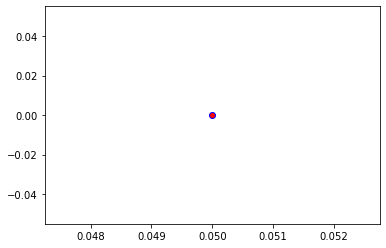

Crafting adversarial images took: 8.87242341041565 seconds 

Images classified as:
000000195754 598 = home theater
000000195842 495 = china cabinet
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


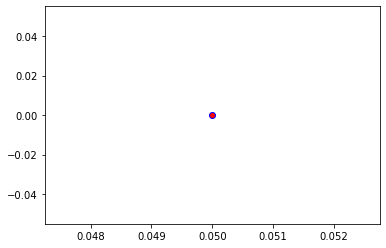

Crafting adversarial images took: 8.754346132278442 seconds 

Images classified as:
000000195918 526 = desk
000000196009 112 = conch
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


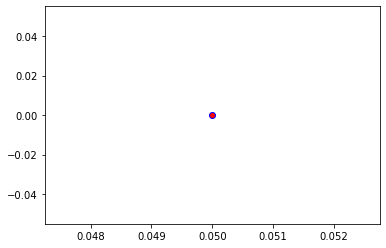

Crafting adversarial images took: 8.477043390274048 seconds 

Images classified as:
000000196141 981 = ballplayer
000000196185 895 = warplane
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


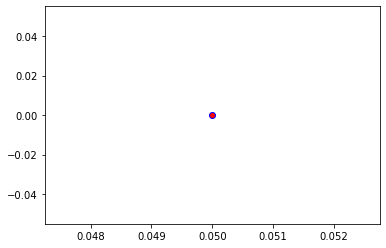

Crafting adversarial images took: 8.430689334869385 seconds 

Images classified as:
000000196442 248 = ski
000000196754 919 = street sign
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


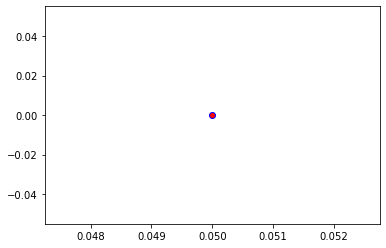

Crafting adversarial images took: 8.459398746490479 seconds 

Images classified as:
000000196759 407 = ambulance
000000196843 779 = school bus
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


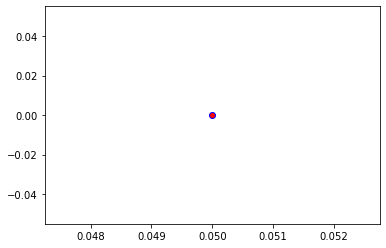

Crafting adversarial images took: 8.343642950057983 seconds 

Images classified as:
000000197004 933 = cheeseburger
000000197022 963 = pizza
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


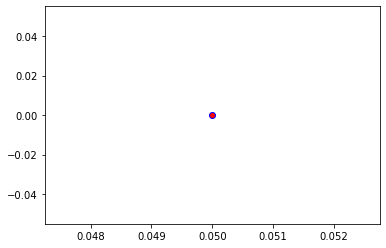

Crafting adversarial images took: 8.495361089706421 seconds 

Images classified as:
000000197388 248 = ski
000000197528 904 = window screen
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


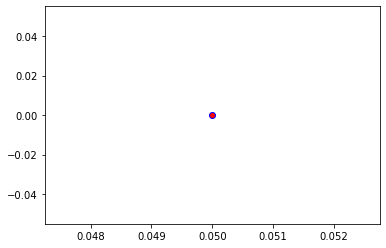

Crafting adversarial images took: 8.430907964706421 seconds 

Images classified as:
000000197658 981 = ballplayer
000000197796 896 = washbasin
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


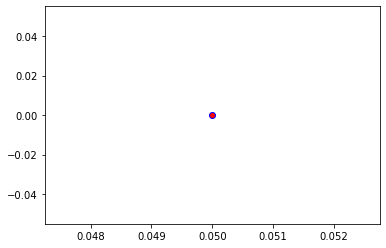

Crafting adversarial images took: 8.46203327178955 seconds 

Images classified as:
000000197870 89 = sulphur-crested cockatoo
000000198489 879 = umbrella
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


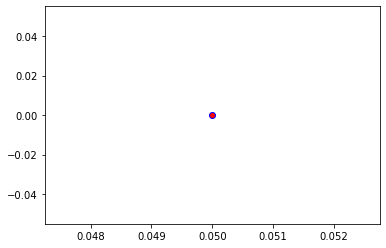

Crafting adversarial images took: 8.373070001602173 seconds 

Images classified as:
000000198510 523 = crutch
000000198641 527 = desktop computer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


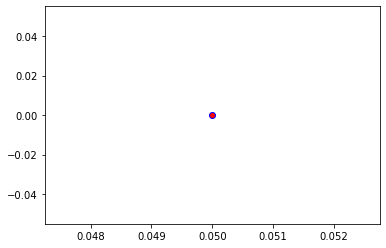

Crafting adversarial images took: 8.450339078903198 seconds 

Images classified as:
000000198805 717 = pickup
000000198915 919 = street sign
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


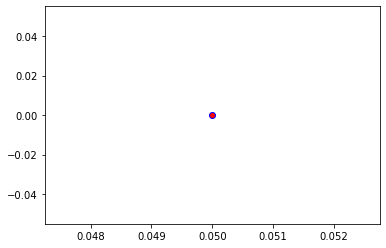

Crafting adversarial images took: 8.615945816040039 seconds 

Images classified as:
000000198928 498 = palace
000000198960 37 = ox
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


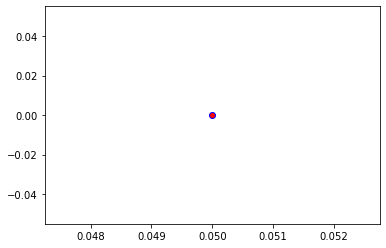

Crafting adversarial images took: 8.44866132736206 seconds 

Images classified as:
000000199055 608 = jean
000000199236 787 = shield
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


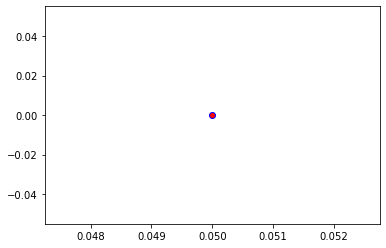

Crafting adversarial images took: 8.386402368545532 seconds 

Images classified as:
000000199310 752 = racket
000000199395 701 = parachute
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


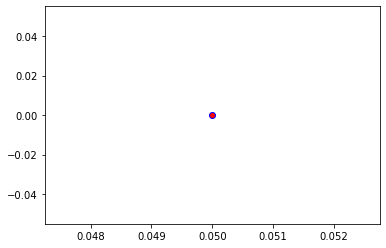

Crafting adversarial images took: 8.609252214431763 seconds 

Images classified as:
000000199442 693 = paddle
000000199551 669 = mosquito net
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


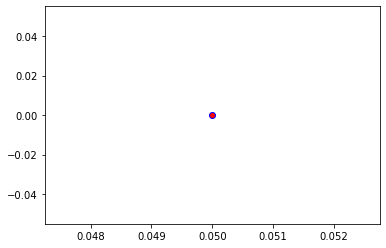

Crafting adversarial images took: 8.048774242401123 seconds 

Images classified as:
000000199681 651 = microwave
000000199771 454 = bookshop
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


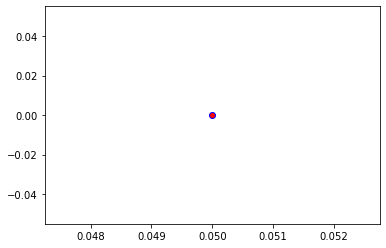

Crafting adversarial images took: 7.739600658416748 seconds 

Images classified as:
000000199977 895 = warplane
000000200152 530 = digital clock
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


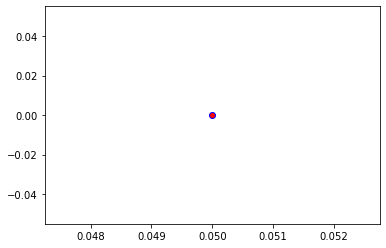

Crafting adversarial images took: 7.7933995723724365 seconds 

Images classified as:
000000200162 547 = electric locomotive
000000200252 431 = bassinet
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


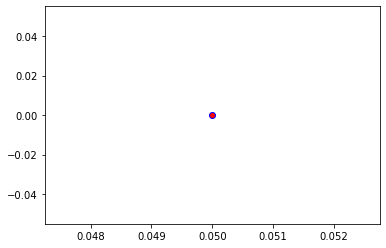

Crafting adversarial images took: 7.749353885650635 seconds 

Images classified as:
000000200421 752 = racket
000000200667 421 = bannister
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


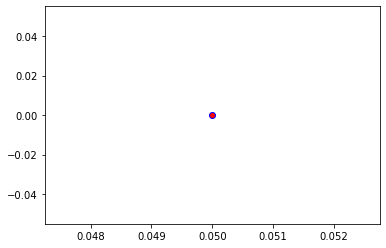

Crafting adversarial images took: 7.707692861557007 seconds 

Images classified as:
000000200839 757 = recreational vehicle
000000200961 522 = croquet ball
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


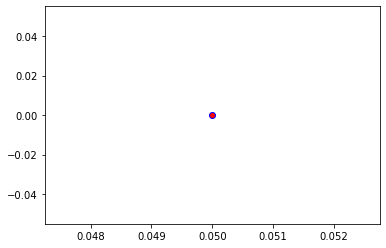

Crafting adversarial images took: 7.743779897689819 seconds 

Images classified as:
000000201025 101 = tusker
000000201072 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


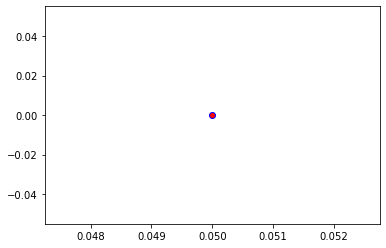

Crafting adversarial images took: 7.773597240447998 seconds 

Images classified as:
000000201148 547 = electric locomotive
000000201418 450 = bobsled
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


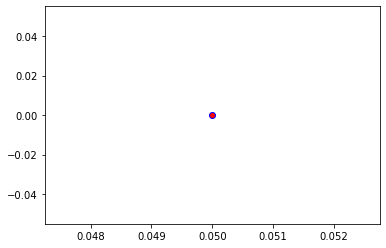

Crafting adversarial images took: 7.928091287612915 seconds 

Images classified as:
000000201426 965 = burrito
000000201646 558 = flute
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


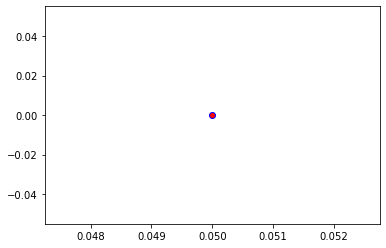

Crafting adversarial images took: 7.730013370513916 seconds 

Images classified as:
000000201676 340 = zebra
000000201775 896 = washbasin
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


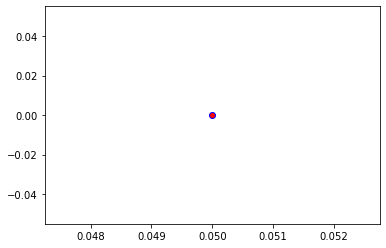

Crafting adversarial images took: 7.764961004257202 seconds 

Images classified as:
000000201934 874 = trolleybus
000000202001 785 = seat belt
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


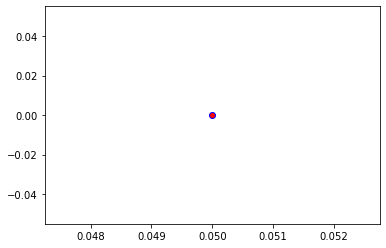

Crafting adversarial images took: 7.716328859329224 seconds 

Images classified as:
000000202228 648 = medicine chest
000000202339 757 = recreational vehicle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


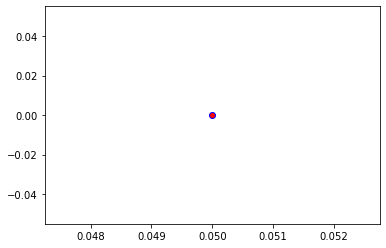

Crafting adversarial images took: 7.754079341888428 seconds 

Images classified as:
000000202445 151 = Chihuahua
000000203095 467 = butcher shop
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


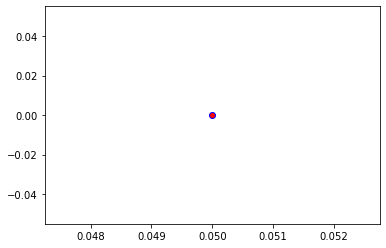

Crafting adversarial images took: 7.753663063049316 seconds 

Images classified as:
000000203294 874 = trolleybus
000000203317 444 = bicycle-built-for-two
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


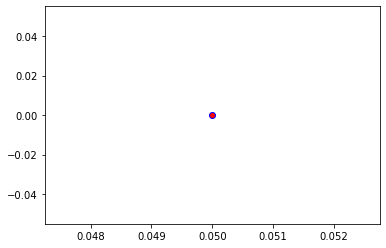

Crafting adversarial images took: 7.957859516143799 seconds 

Images classified as:
000000203389 665 = moped
000000203488 704 = parking meter
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


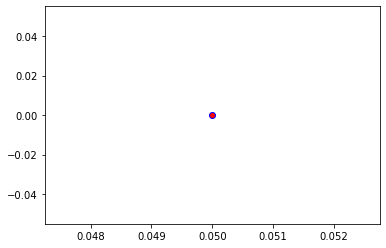

Crafting adversarial images took: 7.902935743331909 seconds 

Images classified as:
000000203546 294 = brown bear
000000203580 879 = umbrella
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


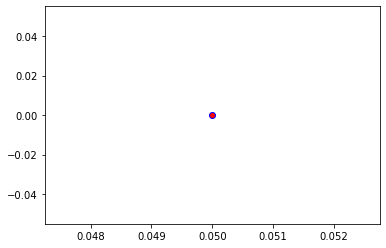

Crafting adversarial images took: 7.850545883178711 seconds 

Images classified as:
000000203629 457 = bow tie
000000203639 824 = stole
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


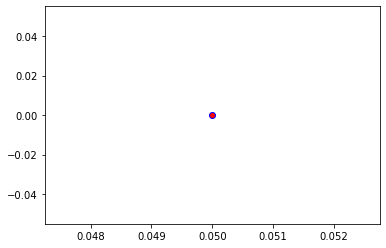

Crafting adversarial images took: 7.718147277832031 seconds 

Images classified as:
000000203864 752 = racket
000000203931 981 = ballplayer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


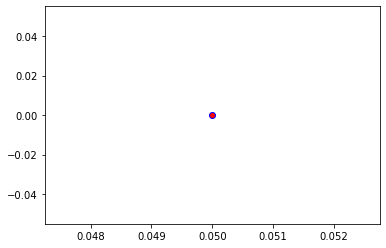

Crafting adversarial images took: 7.714271306991577 seconds 

Images classified as:
000000204186 665 = moped
000000204329 978 = seashore
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


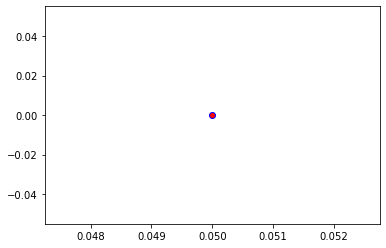

Crafting adversarial images took: 7.869070053100586 seconds 

Images classified as:
000000204871 463 = bucket
000000205105 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


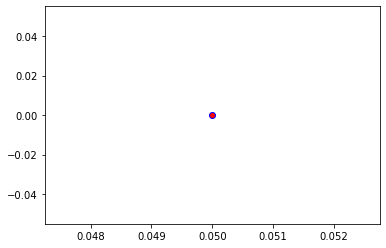

Crafting adversarial images took: 10.191179752349854 seconds 

Images classified as:
000000205282 288 = leopard
000000205289 586 = half track
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


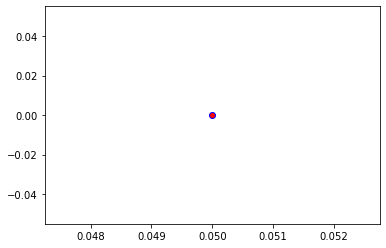

Crafting adversarial images took: 8.561737775802612 seconds 

Images classified as:
000000205324 768 = rugby ball
000000205333 140 = alp
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


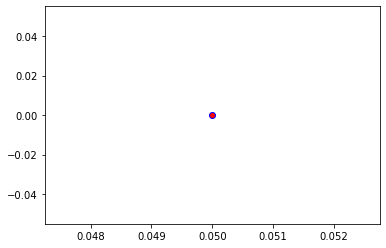

Crafting adversarial images took: 8.431790351867676 seconds 

Images classified as:
000000205401 871 = trimaran
000000205514 905 = window shade
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


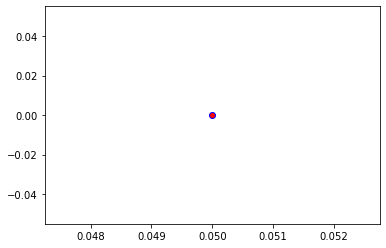

Crafting adversarial images took: 7.961926698684692 seconds 

Images classified as:
000000205542 883 = vase
000000205647 867 = trailer truck
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


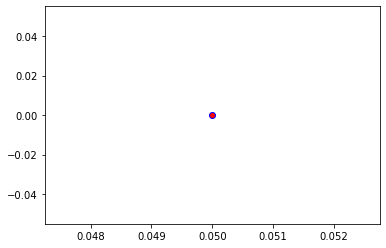

Crafting adversarial images took: 8.107971429824829 seconds 

Images classified as:
000000205776 342 = wild boar
000000205834 207 = golden retriever
Min values in image-array: 0.3020997 Max values in image-array: 255.0
Min values in image-array: 0.0011847047 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


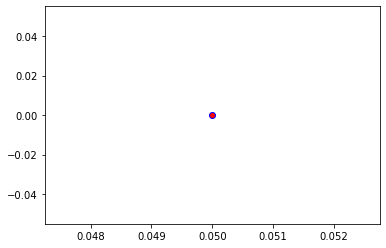

Crafting adversarial images took: 7.829361915588379 seconds 

Images classified as:
000000206025 639 = suit
000000206027 934 = hotdog
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


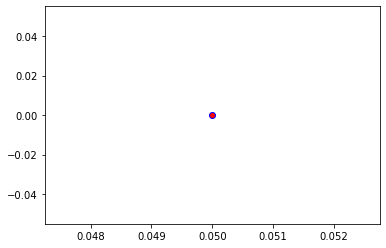

Crafting adversarial images took: 8.657817125320435 seconds 

Images classified as:
000000206135 690 = oxcart
000000206218 639 = tank
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


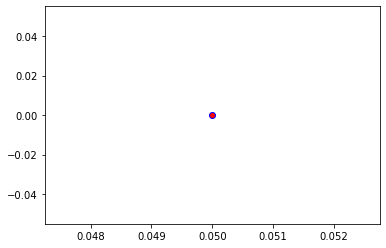

Crafting adversarial images took: 7.887545108795166 seconds 

Images classified as:
000000206271 896 = washbasin
000000206411 861 = toilet seat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


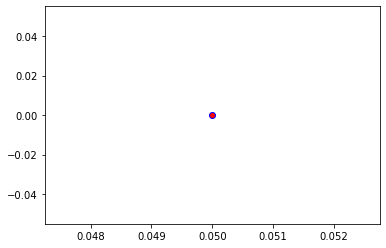

Crafting adversarial images took: 7.832687854766846 seconds 

Images classified as:
000000206487 874 = trolleybus
000000206579 470 = candle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


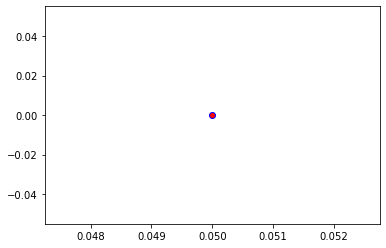

Crafting adversarial images took: 9.068560600280762 seconds 

Images classified as:
000000206831 242 = boxer
000000206838 394 = sturgeon
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


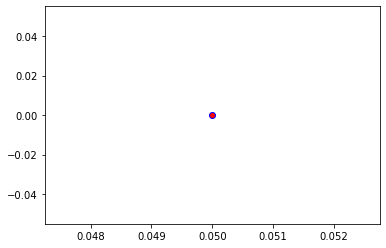

Crafting adversarial images took: 8.106791019439697 seconds 

Images classified as:
000000206994 705 = passenger car
000000207306 708 = pedestal
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


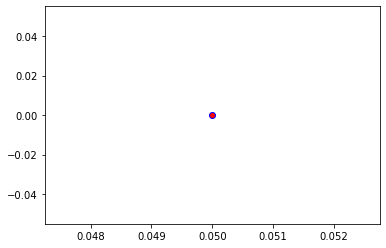

Crafting adversarial images took: 7.862961053848267 seconds 

Images classified as:
000000207538 651 = microwave
000000207585 850 = teddy
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


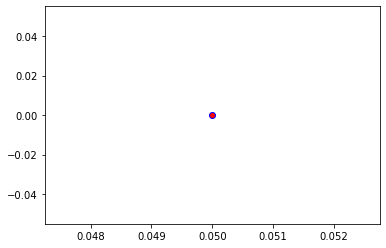

Crafting adversarial images took: 7.834636449813843 seconds 

Images classified as:
000000207728 349 = bighorn
000000207844 977 = sandbar
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


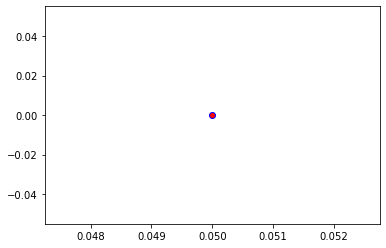

Crafting adversarial images took: 7.90600848197937 seconds 

Images classified as:
000000208208 318 = wing
000000208363 624 = library
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


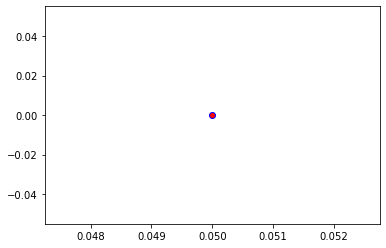

Crafting adversarial images took: 7.873885869979858 seconds 

Images classified as:
000000208423 557 = flagpole
000000208901 404 = airliner
Min values in image-array: 0.0 Max values in image-array: 254.38777
Min values in image-array: 0.0 Max values in image-array: 0.9975991
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


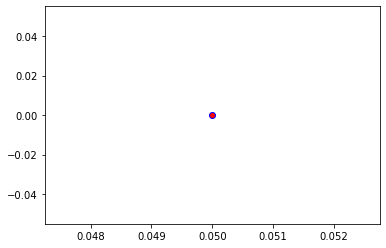

Crafting adversarial images took: 8.183299779891968 seconds 

Images classified as:
000000209142 937 = broccoli
000000209222 703 = park bench
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


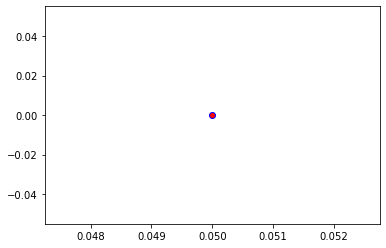

Crafting adversarial images took: 7.798042297363281 seconds 

Images classified as:
000000209530 762 = restaurant
000000209613 5 = ram
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


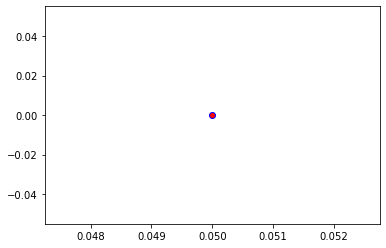

Crafting adversarial images took: 7.925205230712891 seconds 

Images classified as:
000000209747 896 = washbasin
000000209753 399 = abaya
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


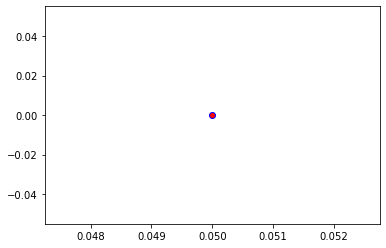

Crafting adversarial images took: 7.88122034072876 seconds 

Images classified as:
000000209757 981 = ballplayer
000000209829 693 = paddle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


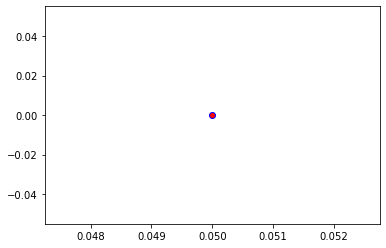

Crafting adversarial images took: 7.890004634857178 seconds 

Images classified as:
000000209972 484 = catamaran
000000210030 461 = plate
Min values in image-array: 0.6018695 Max values in image-array: 255.0
Min values in image-array: 0.0023602727 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


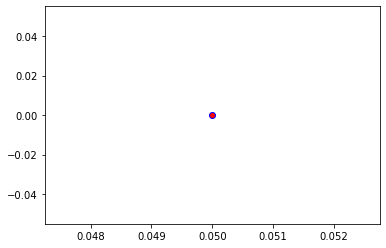

Crafting adversarial images took: 7.97382926940918 seconds 

Images classified as:
000000210032 933 = cheeseburger
000000210099 765 = rocking chair
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


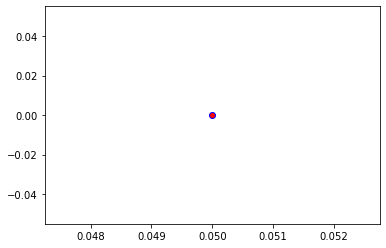

Crafting adversarial images took: 7.897867679595947 seconds 

Images classified as:
000000210230 830 = stretcher
000000210273 324 = cab
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


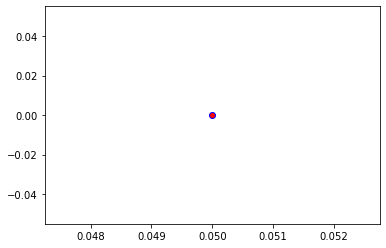

Crafting adversarial images took: 7.9072105884552 seconds 

Images classified as:
000000210299 870 = tricycle
000000210388 792 = shovel
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


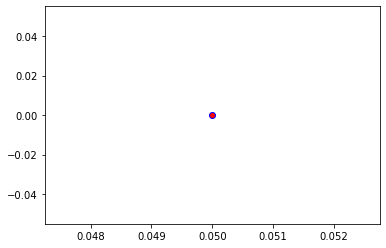

Crafting adversarial images took: 8.004840612411499 seconds 

Images classified as:
000000210394 874 = trolleybus
000000210502 705 = passenger car
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


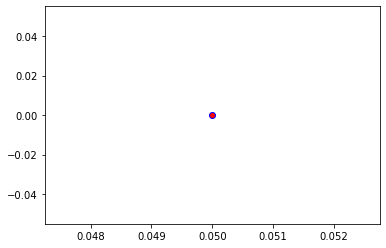

Crafting adversarial images took: 8.161372661590576 seconds 

Images classified as:
000000210520 868 = tray
000000210708 386 = African elephant
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


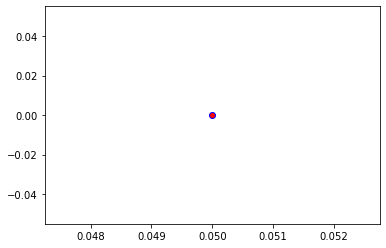

Crafting adversarial images took: 8.235605716705322 seconds 

Images classified as:
000000210789 879 = umbrella
000000210855 648 = medicine chest
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


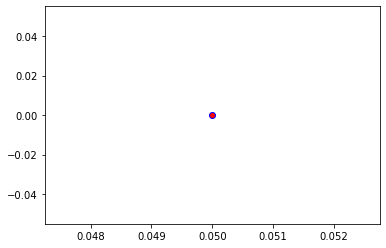

Crafting adversarial images took: 8.834959983825684 seconds 

Images classified as:
000000210915 693 = paddle
000000211042 861 = toilet seat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


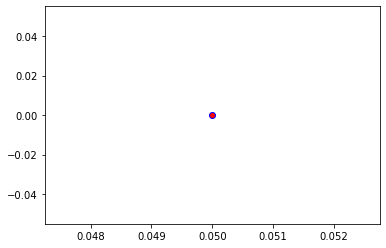

Crafting adversarial images took: 8.527124881744385 seconds 

Images classified as:
000000211069 293 = cheetah
000000211120 850 = teddy
Min values in image-array: 0.35705566 Max values in image-array: 255.0
Min values in image-array: 0.0014002183 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


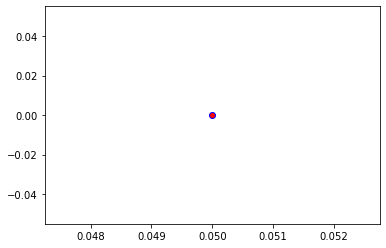

Crafting adversarial images took: 8.601908922195435 seconds 

Images classified as:
000000211674 874 = trolleybus
000000211825 647 = measuring cup
Min values in image-array: 0.0 Max values in image-array: 254.87277
Min values in image-array: 0.0 Max values in image-array: 0.99950105
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


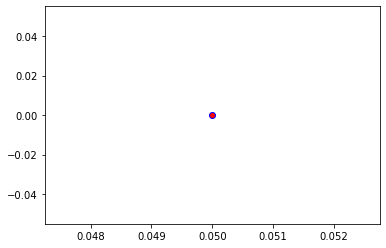

Crafting adversarial images took: 8.778225421905518 seconds 

Images classified as:
000000212072 919 = street sign
000000212166 963 = pizza
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


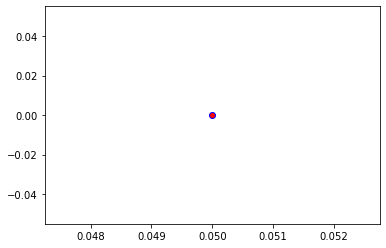

Crafting adversarial images took: 8.524984121322632 seconds 

Images classified as:
000000212226 837 = sunglasses
000000212453 999 = toilet tissue
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


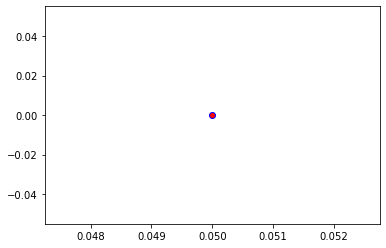

Crafting adversarial images took: 8.48241114616394 seconds 

Images classified as:
000000212559 54 = hog
000000212573 879 = umbrella
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


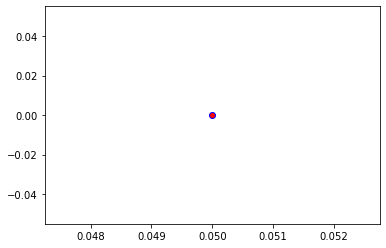

Crafting adversarial images took: 8.389393329620361 seconds 

Images classified as:
000000212800 472 = canoe
000000212895 354 = Arabian camel
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


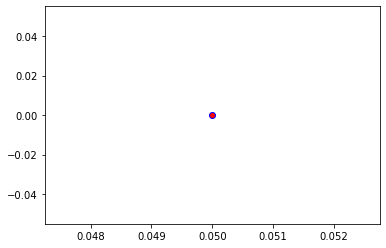

Crafting adversarial images took: 8.383610725402832 seconds 

Images classified as:
000000213033 447 = binoculars
000000213035 626 = lighter
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


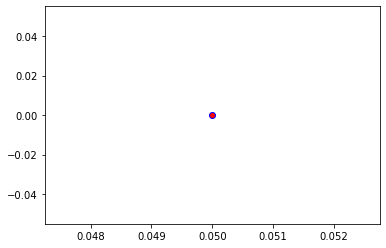

Crafting adversarial images took: 8.524072885513306 seconds 

Images classified as:
000000213086 827 = stove
000000213171 981 = ballplayer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


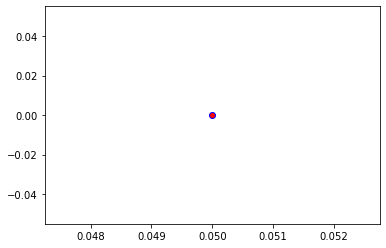

Crafting adversarial images took: 8.423760175704956 seconds 

Images classified as:
000000213224 883 = vase
000000213255 899 = water jug
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


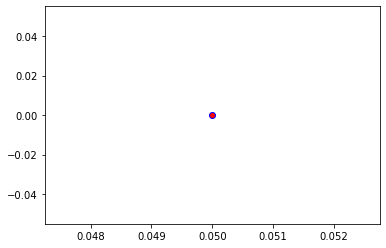

Crafting adversarial images took: 8.758810758590698 seconds 

Images classified as:
000000213422 750 = quilt
000000213445 281 = tabby
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


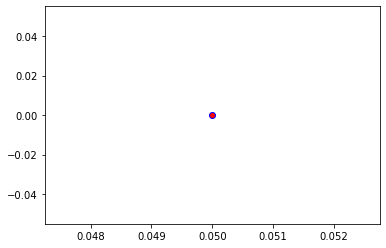

Crafting adversarial images took: 8.40699577331543 seconds 

Images classified as:
000000213547 860 = tobacco shop
000000213593 920 = traffic light
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


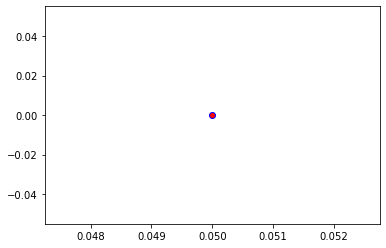

Crafting adversarial images took: 8.362988948822021 seconds 

Images classified as:
000000213605 874 = trolleybus
000000213816 829 = streetcar
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


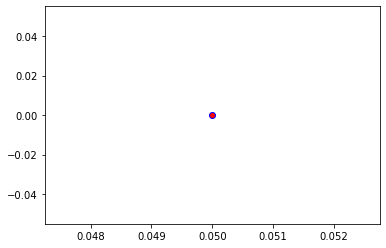

Crafting adversarial images took: 8.643136024475098 seconds 

Images classified as:
000000213830 752 = racket
000000213935 950 = orange
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


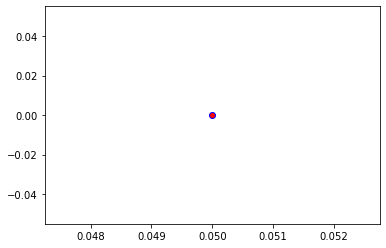

Crafting adversarial images took: 8.815390825271606 seconds 

Images classified as:
000000214192 518 = crash helmet
000000214200 919 = street sign
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


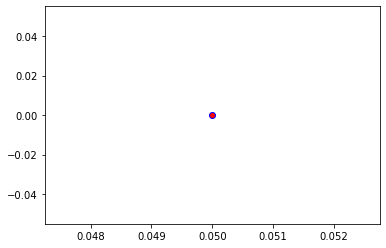

Crafting adversarial images took: 9.013535261154175 seconds 

Images classified as:
000000214205 405 = airship
000000214224 499 = cleaver
Min values in image-array: 0.0 Max values in image-array: 254.96875
Min values in image-array: 0.0 Max values in image-array: 0.99987745
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


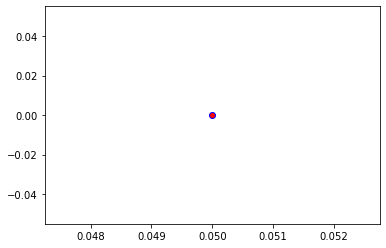

Crafting adversarial images took: 9.801781177520752 seconds 

Images classified as:
000000214539 805 = soccer ball
000000214703 98 = red-breasted merganser
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


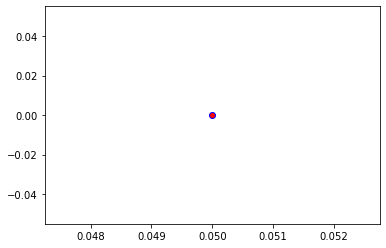

Crafting adversarial images took: 9.30118441581726 seconds 

Images classified as:
000000214720 762 = restaurant
000000214753 354 = Arabian camel
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


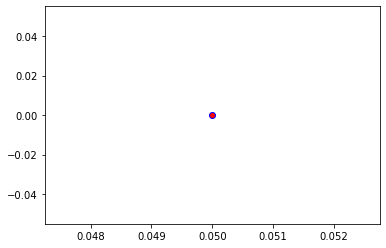

Crafting adversarial images took: 9.133628606796265 seconds 

Images classified as:
000000214869 748 = purse
000000215072 557 = flagpole
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


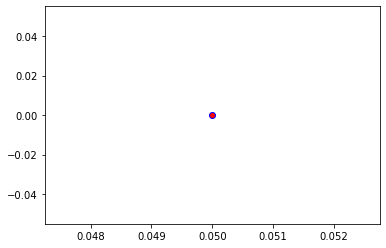

Crafting adversarial images took: 8.612956762313843 seconds 

Images classified as:
000000215114 760 = refrigerator
000000215245 340 = zebra
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


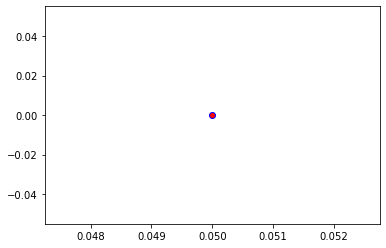

Crafting adversarial images took: 8.568801641464233 seconds 

Images classified as:
000000215259 697 = pajama
000000215644 651 = microwave
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


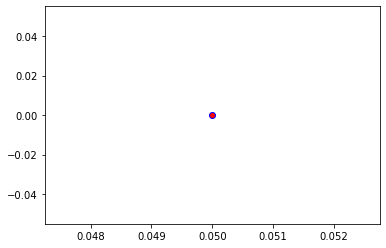

Crafting adversarial images took: 8.479374647140503 seconds 

Images classified as:
000000215723 407 = ambulance
000000215778 681 = notebook
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


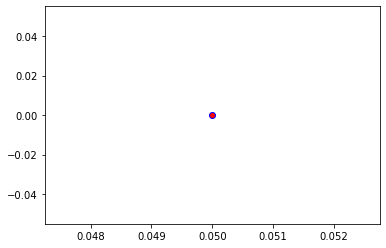

Crafting adversarial images took: 8.443786144256592 seconds 

Images classified as:
000000216277 487 = cellular telephone
000000216296 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


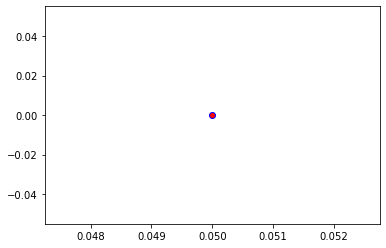

Crafting adversarial images took: 8.579063653945923 seconds 

Images classified as:
000000216419 409 = analog clock
000000216497 651 = microwave
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


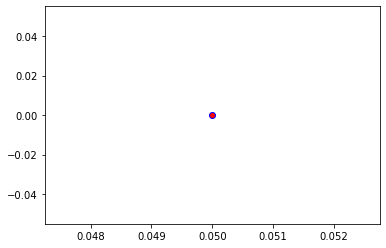

Crafting adversarial images took: 8.675786018371582 seconds 

Images classified as:
000000216516 248 = ski
000000216636 470 = candle
Min values in image-array: 0.0 Max values in image-array: 254.92856
Min values in image-array: 0.0 Max values in image-array: 0.99971986
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


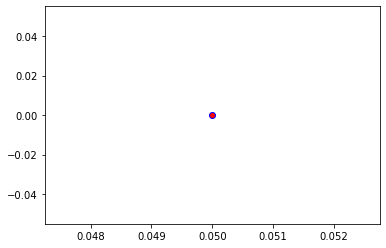

Crafting adversarial images took: 8.64648985862732 seconds 

Images classified as:
000000216739 350 = ibex
000000217060 701 = parachute
Min values in image-array: 0.0 Max values in image-array: 254.30026
Min values in image-array: 0.0 Max values in image-array: 0.9972559
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


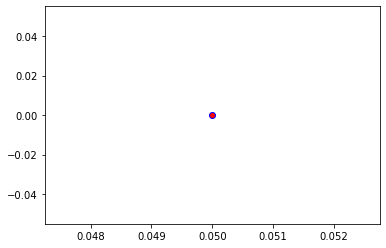

Crafting adversarial images took: 8.625231981277466 seconds 

Images classified as:
000000217219 750 = quilt
000000217285 981 = ballplayer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


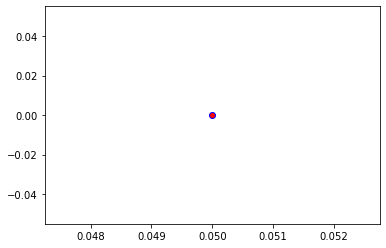

Crafting adversarial images took: 8.431273698806763 seconds 

Images classified as:
000000217400 705 = passenger car
000000217425 409 = analog clock
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


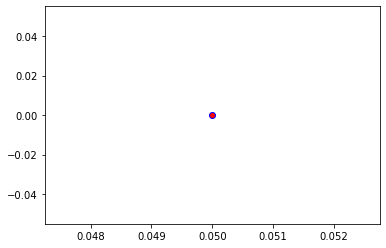

Crafting adversarial images took: 8.565214157104492 seconds 

Images classified as:
000000217614 293 = cheetah
000000217753 582 = grocery store
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


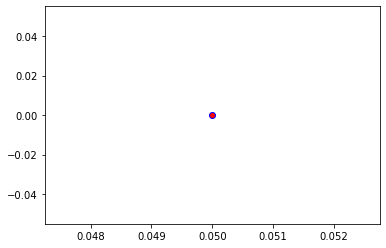

Crafting adversarial images took: 8.593060493469238 seconds 

Images classified as:
000000217872 140 = alp
000000217948 294 = brown bear
Min values in image-array: 0.0 Max values in image-array: 254.83371
Min values in image-array: 0.0 Max values in image-array: 0.99934787
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


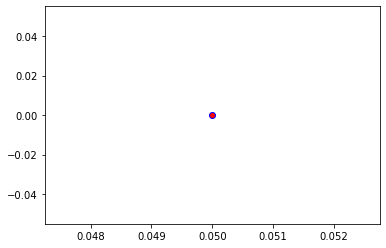

Crafting adversarial images took: 8.72186803817749 seconds 

Images classified as:
000000217957 538 = dome
000000218091 831 = studio couch
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


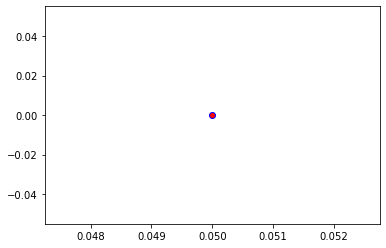

Crafting adversarial images took: 8.400538444519043 seconds 

Images classified as:
000000218249 933 = cheeseburger
000000218362 892 = wall clock
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


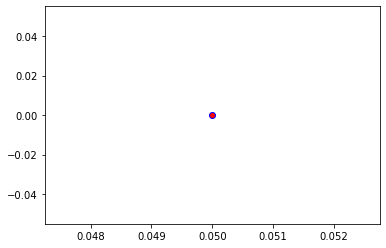

Crafting adversarial images took: 8.459169626235962 seconds 

Images classified as:
000000218424 340 = zebra
000000218439 611 = jigsaw puzzle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


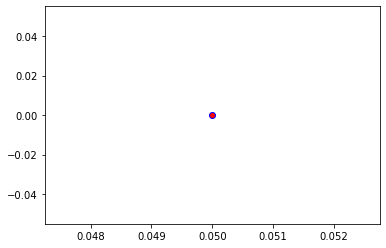

Crafting adversarial images took: 8.514341831207275 seconds 

Images classified as:
000000218997 981 = ballplayer
000000219271 864 = wreck
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


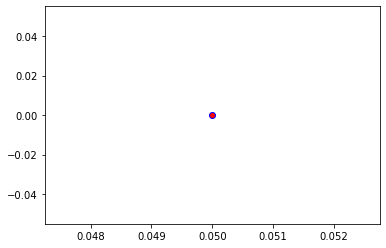

Crafting adversarial images took: 8.47408151626587 seconds 

Images classified as:
000000219283 478 = carton
000000219440 346 = water buffalo
Min values in image-array: 0.0 Max values in image-array: 243.89743
Min values in image-array: 0.0 Max values in image-array: 0.95646054
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


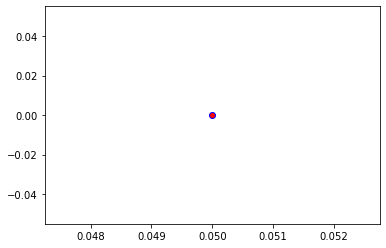

Crafting adversarial images took: 8.584118604660034 seconds 

Images classified as:
000000219485 904 = window screen
000000219578 225 = malinois
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


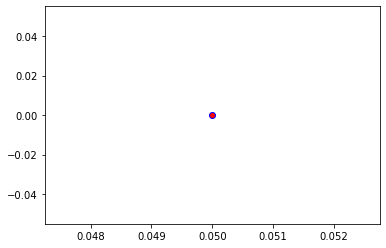

Crafting adversarial images took: 8.510053873062134 seconds 

Images classified as:
000000220310 961 = dough
000000220584 693 = paddle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


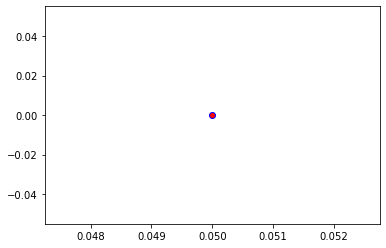

Crafting adversarial images took: 8.39750862121582 seconds 

Images classified as:
000000220732 569 = garbage truck
000000220764 977 = sandbar
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


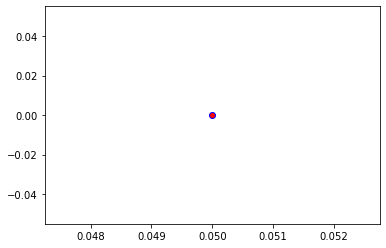

Crafting adversarial images took: 8.722334623336792 seconds 

Images classified as:
000000220858 814 = speedboat
000000221017 7 = cock
Min values in image-array: 5.2317046e-05 Max values in image-array: 255.0
Min values in image-array: 2.0516488e-07 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


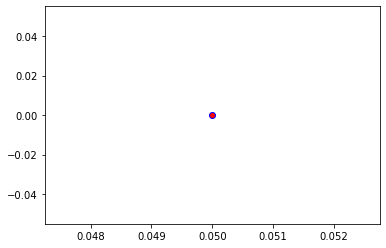

Crafting adversarial images took: 8.382637739181519 seconds 

Images classified as:
000000221155 730 = plow
000000221213 421 = bannister
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


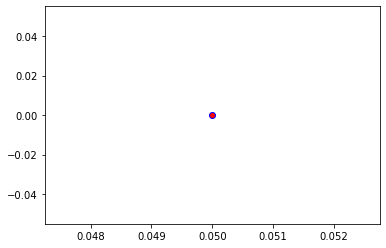

Crafting adversarial images took: 8.9916250705719 seconds 

Images classified as:
000000221281 293 = cheetah
000000221291 417 = balloon
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


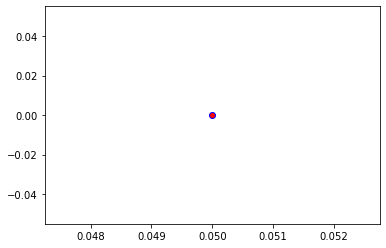

Crafting adversarial images took: 8.543282985687256 seconds 

Images classified as:
000000221502 703 = park bench
000000221693 227 = kelpie
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


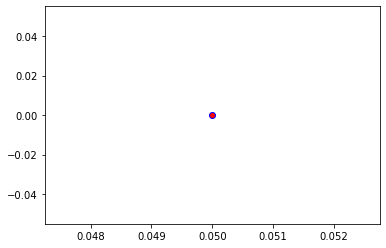

Crafting adversarial images took: 8.380692481994629 seconds 

Images classified as:
000000221708 532 = dining table
000000221754 829 = streetcar
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


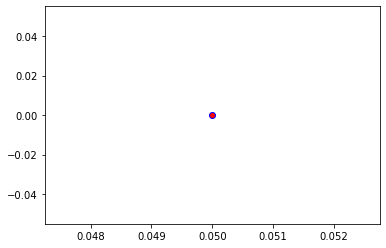

Crafting adversarial images took: 8.627591848373413 seconds 

Images classified as:
000000221872 329 = cucumber
000000222094 557 = flagpole
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


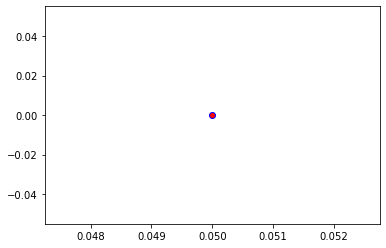

Crafting adversarial images took: 8.53216552734375 seconds 

Images classified as:
000000222118 486 = cello
000000222235 282 = tiger cat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


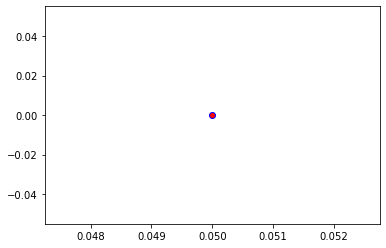

Crafting adversarial images took: 9.888469934463501 seconds 

Images classified as:
000000222299 692 = packet
000000222317 178 = Weimaraner
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


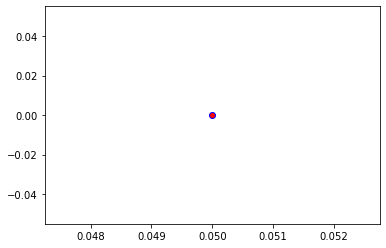

Crafting adversarial images took: 9.441370725631714 seconds 

Images classified as:
000000222455 729 = plate rack
000000222458 703 = park bench
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


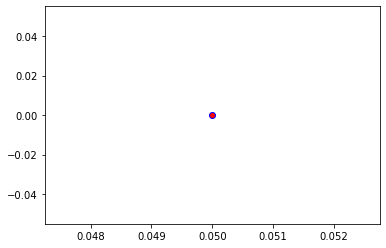

Crafting adversarial images took: 8.408008813858032 seconds 

Images classified as:
000000222559 978 = seashore
000000222735 761 = remote control
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


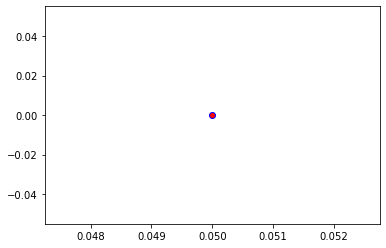

Crafting adversarial images took: 8.320137977600098 seconds 

Images classified as:
000000222825 651 = microwave
000000222863 37 = ox
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


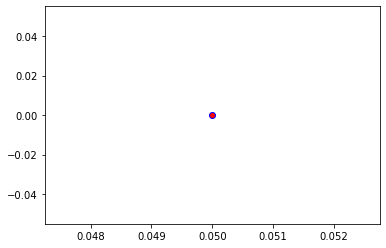

Crafting adversarial images took: 8.472607374191284 seconds 

Images classified as:
000000222991 463 = bucket
000000223090 936 = head cabbage
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


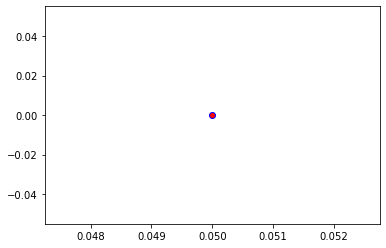

Crafting adversarial images took: 8.58398985862732 seconds 

Images classified as:
000000223130 293 = cheetah
000000223182 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


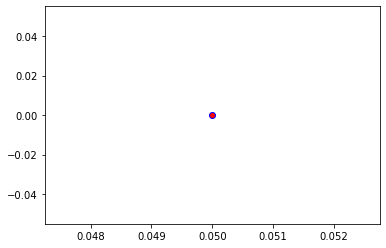

Crafting adversarial images took: 8.972311973571777 seconds 

Images classified as:
000000223188 346 = water buffalo
000000223738 429 = baseball
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


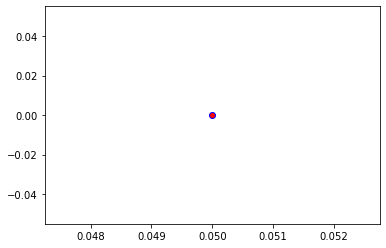

Crafting adversarial images took: 8.40317678451538 seconds 

Images classified as:
000000223747 797 = sleeping bag
000000223789 896 = washbasin
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


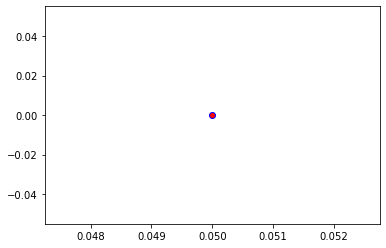

Crafting adversarial images took: 8.403280019760132 seconds 

Images classified as:
000000223955 522 = croquet ball
000000223959 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


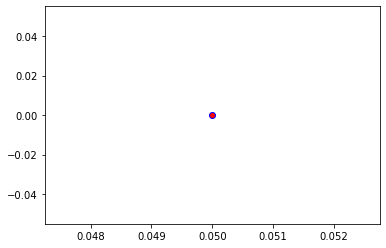

Crafting adversarial images took: 8.413601636886597 seconds 

Images classified as:
000000224051 870 = tricycle
000000224093 355 = llama
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


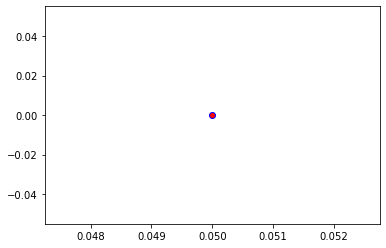

Crafting adversarial images took: 8.505341529846191 seconds 

Images classified as:
000000224119 466 = bullet train
000000224200 195 = Boston bull
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


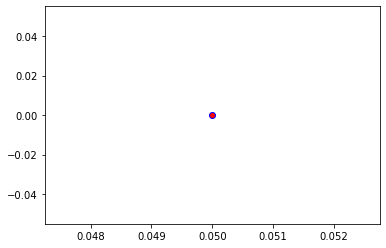

Crafting adversarial images took: 8.64165186882019 seconds 

Images classified as:
000000224222 842 = swimming trunks
000000224337 929 = ice lolly
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


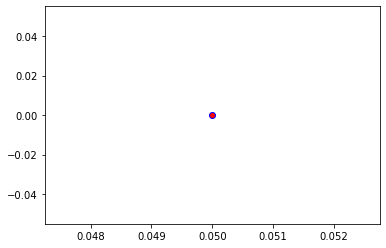

Crafting adversarial images took: 8.497018575668335 seconds 

Images classified as:
000000224664 977 = sandbar
000000224675 645 = maypole
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


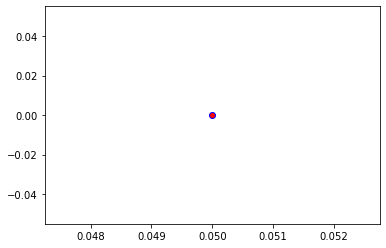

Crafting adversarial images took: 8.508485555648804 seconds 

Images classified as:
000000224724 424 = barbershop
000000224807 762 = restaurant
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


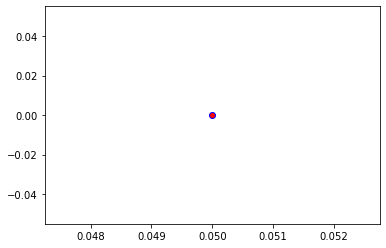

Crafting adversarial images took: 8.451723337173462 seconds 

Images classified as:
000000225184 99 = goose
000000225405 805 = soccer ball
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


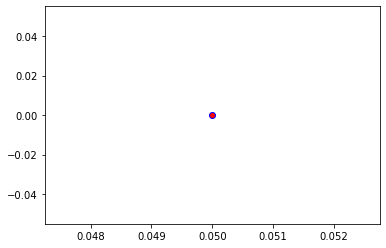

Crafting adversarial images took: 8.481303930282593 seconds 

Images classified as:
000000225532 919 = street sign
000000225670 404 = liner
Min values in image-array: 0.0 Max values in image-array: 254.9364
Min values in image-array: 0.0 Max values in image-array: 0.9997506
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


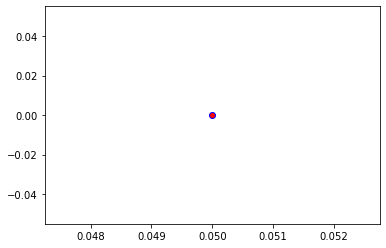

Crafting adversarial images took: 8.435214281082153 seconds 

Images classified as:
000000225757 527 = desktop computer
000000225946 565 = freight car
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


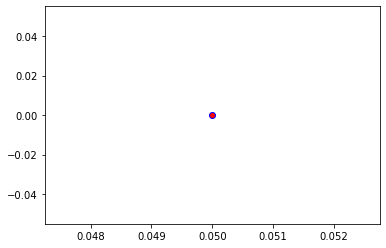

Crafting adversarial images took: 8.567073106765747 seconds 

Images classified as:
000000226058 850 = teddy
000000226111 919 = street sign
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


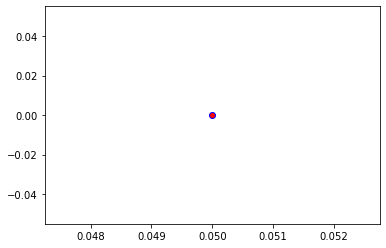

Crafting adversarial images took: 8.52765154838562 seconds 

Images classified as:
000000226130 934 = hotdog
000000226147 461 = plate
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


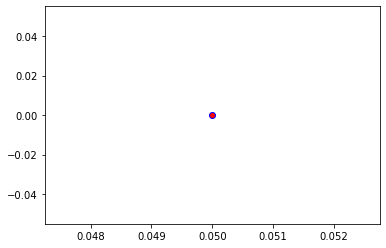

Crafting adversarial images took: 8.882766246795654 seconds 

Images classified as:
000000226154 874 = trolleybus
000000226171 526 = desk
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


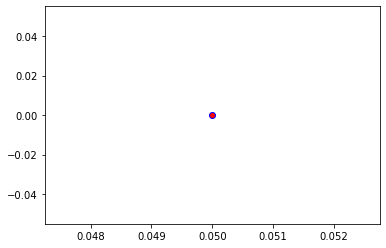

Crafting adversarial images took: 8.450278997421265 seconds 

Images classified as:
000000226408 112 = conch
000000226417 870 = tricycle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


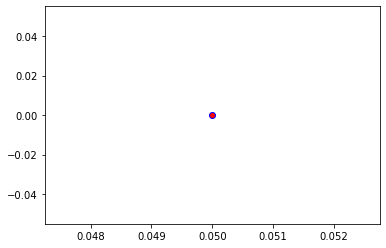

Crafting adversarial images took: 8.396777391433716 seconds 

Images classified as:
000000226592 750 = quilt
000000226662 535 = disk brake
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


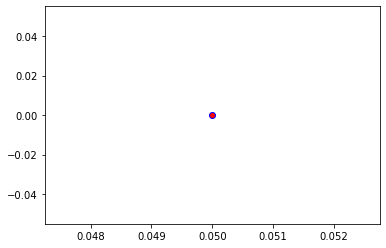

Crafting adversarial images took: 8.594998598098755 seconds 

Images classified as:
000000226802 829 = streetcar
000000226883 209 = Chesapeake Bay retriever
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


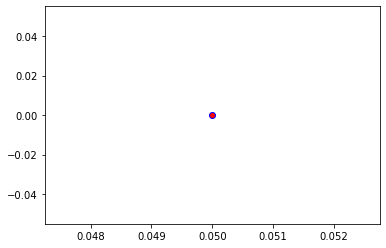

Crafting adversarial images took: 8.505768060684204 seconds 

Images classified as:
000000226903 532 = dining table
000000226984 651 = microwave
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


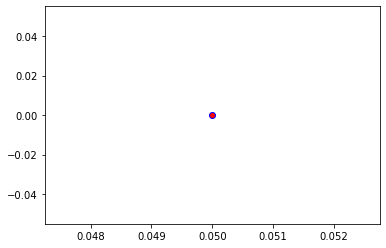

Crafting adversarial images took: 8.46497631072998 seconds 

Images classified as:
000000227044 896 = washbasin
000000227187 42 = agama
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


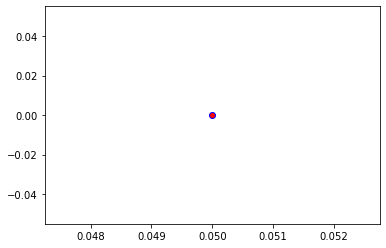

Crafting adversarial images took: 8.402844429016113 seconds 

Images classified as:
000000227399 569 = garbage truck
000000227478 843 = swing
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


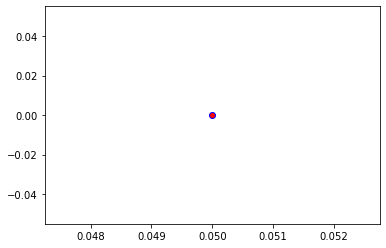

Crafting adversarial images took: 8.553447246551514 seconds 

Images classified as:
000000227482 768 = rugby ball
000000227491 248 = ski
Min values in image-array: 0.0 Max values in image-array: 252.46947
Min values in image-array: 0.0 Max values in image-array: 0.99007636
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


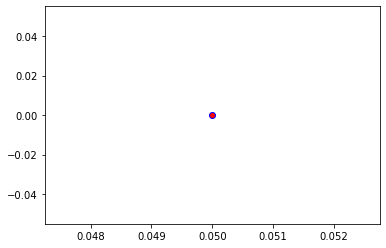

Crafting adversarial images took: 8.57206106185913 seconds 

Images classified as:
000000227511 920 = traffic light
000000227686 603 = horse cart
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


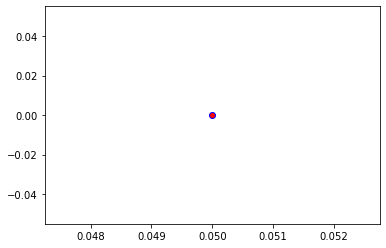

Crafting adversarial images took: 8.367587089538574 seconds 

Images classified as:
000000227765 926 = hot pot
000000227898 603 = horse cart
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


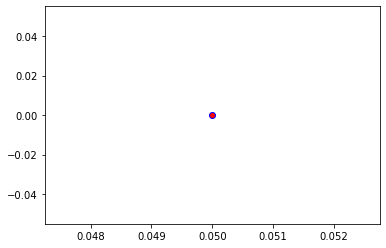

Crafting adversarial images took: 8.34806752204895 seconds 

Images classified as:
000000227985 461 = plate
000000228144 765 = rocking chair
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


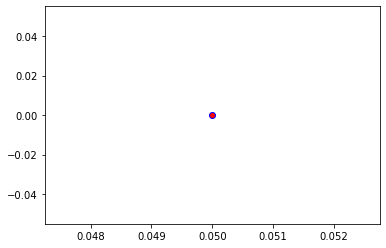

Crafting adversarial images took: 8.623845100402832 seconds 

Images classified as:
000000228214 652 = military uniform
000000228436 870 = tricycle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


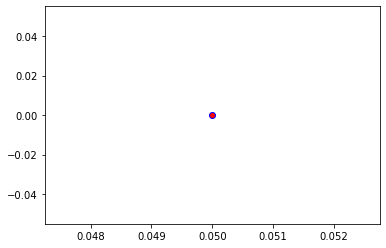

Crafting adversarial images took: 8.537727117538452 seconds 

Images classified as:
000000228771 919 = street sign
000000228942 324 = cab
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


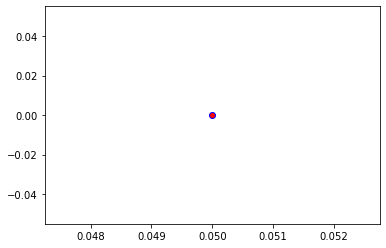

Crafting adversarial images took: 8.661577463150024 seconds 

Images classified as:
000000228981 487 = cellular telephone
000000229111 131 = rule
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


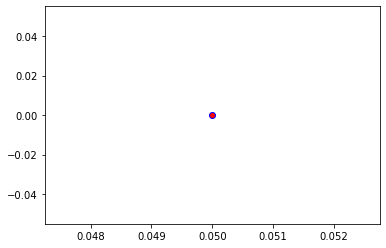

Crafting adversarial images took: 8.841371536254883 seconds 

Images classified as:
000000229216 838 = sunscreen
000000229221 37 = ox
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


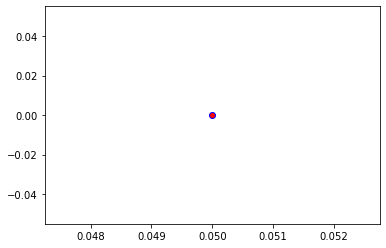

Crafting adversarial images took: 8.449681282043457 seconds 

Images classified as:
000000229311 896 = washbasin
000000229358 648 = medicine chest
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


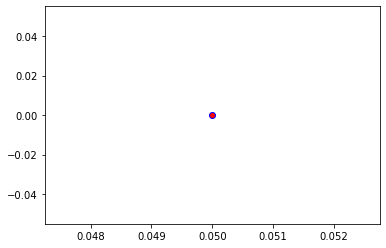

Crafting adversarial images took: 8.40345311164856 seconds 

Images classified as:
000000229553 870 = tricycle
000000229601 981 = ballplayer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


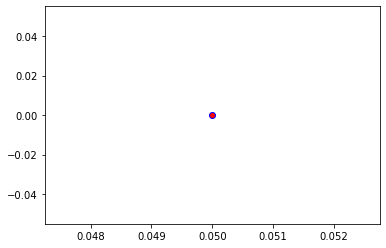

Crafting adversarial images took: 8.608584642410278 seconds 

Images classified as:
000000229659 762 = restaurant
000000229747 404 = airliner
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


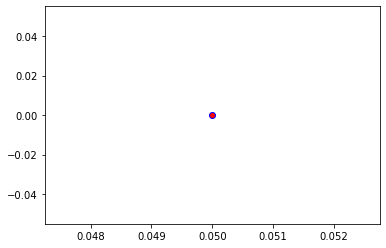

Crafting adversarial images took: 8.46703052520752 seconds 

Images classified as:
000000229753 364 = three-toed sloth
000000229849 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


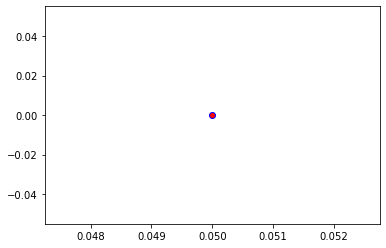

Crafting adversarial images took: 8.437441110610962 seconds 

Images classified as:
000000229858 354 = Arabian camel
000000229948 603 = horse cart
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


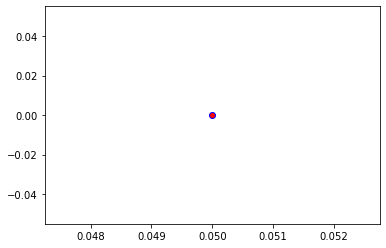

Crafting adversarial images took: 9.409250259399414 seconds 

Images classified as:
000000229997 366 = gorilla
000000230008 670 = motor scooter
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


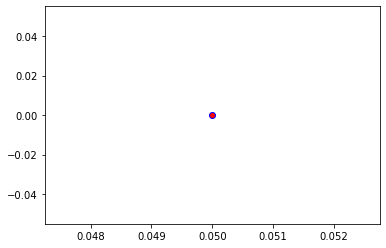

Crafting adversarial images took: 8.642780542373657 seconds 

Images classified as:
000000230166 5 = ram
000000230362 536 = dock
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


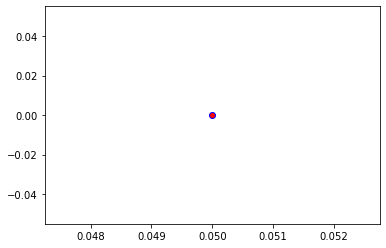

Crafting adversarial images took: 7.740231037139893 seconds 

Images classified as:
000000230450 704 = parking meter
000000230819 460 = breakwater
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


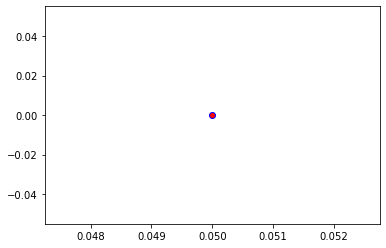

Crafting adversarial images took: 7.787109375 seconds 

Images classified as:
000000230983 843 = swing
000000230993 879 = umbrella
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


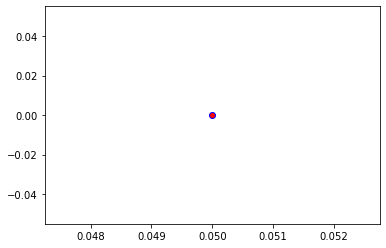

Crafting adversarial images took: 7.739619970321655 seconds 

Images classified as:
000000231088 879 = umbrella
000000231097 937 = broccoli
Min values in image-array: 0.0 Max values in image-array: 254.65518
Min values in image-array: 0.0 Max values in image-array: 0.99864775
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


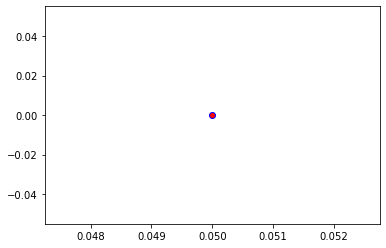

Crafting adversarial images took: 7.876486778259277 seconds 

Images classified as:
000000231125 415 = bakery
000000231169 705 = passenger car
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


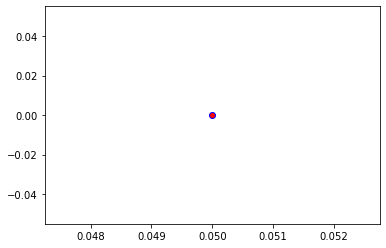

Crafting adversarial images took: 7.722262382507324 seconds 

Images classified as:
000000231237 883 = vase
000000231339 760 = refrigerator
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


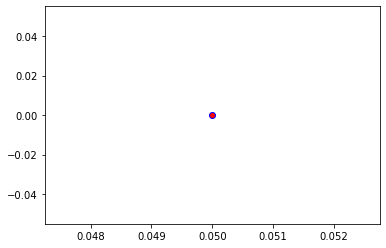

Crafting adversarial images took: 7.949357986450195 seconds 

Images classified as:
000000231508 981 = ballplayer
000000231527 950 = orange
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


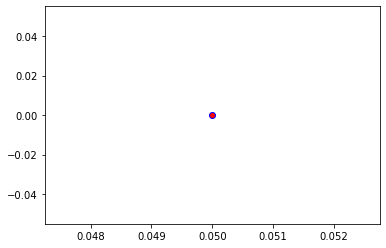

Crafting adversarial images took: 7.975985288619995 seconds 

Images classified as:
000000231549 884 = vault
000000231580 365 = orangutan
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


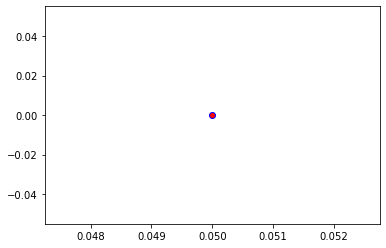

Crafting adversarial images took: 7.8187665939331055 seconds 

Images classified as:
000000231747 495 = china cabinet
000000231822 934 = hotdog
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


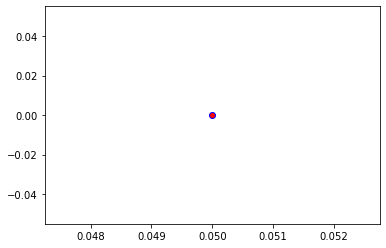

Crafting adversarial images took: 7.699554204940796 seconds 

Images classified as:
000000231831 223 = schipperke
000000231879 739 = potter's wheel
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


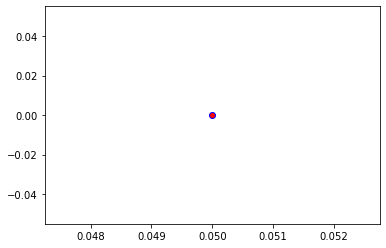

Crafting adversarial images took: 7.732320547103882 seconds 

Images classified as:
000000232088 598 = home theater
000000232244 385 = Indian elephant
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


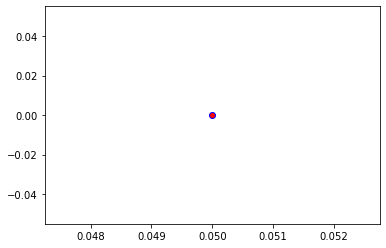

Crafting adversarial images took: 7.737332105636597 seconds 

Images classified as:
000000232348 859 = toaster
000000232489 963 = pizza
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


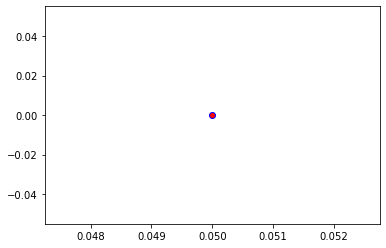

Crafting adversarial images took: 7.909016847610474 seconds 

Images classified as:
000000232538 829 = streetcar
000000232563 879 = umbrella
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


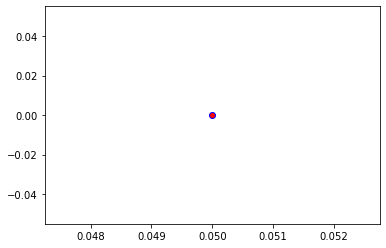

Crafting adversarial images took: 7.847076177597046 seconds 

Images classified as:
000000232646 919 = street sign
000000232649 896 = washbasin
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


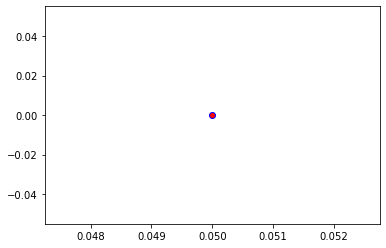

Crafting adversarial images took: 7.780432939529419 seconds 

Images classified as:
000000232684 681 = notebook
000000232692 693 = paddle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


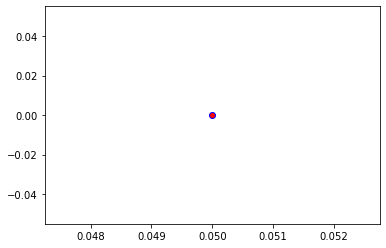

Crafting adversarial images took: 7.853231906890869 seconds 

Images classified as:
000000233033 706 = patio
000000233139 409 = analog clock
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


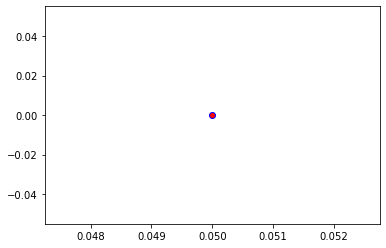

Crafting adversarial images took: 7.751517295837402 seconds 

Images classified as:
000000233238 582 = grocery store
000000233370 638 = maillot
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


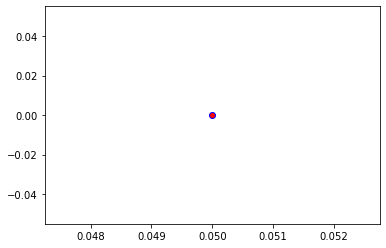

Crafting adversarial images took: 7.718144416809082 seconds 

Images classified as:
000000233567 346 = water buffalo
000000233727 874 = trolleybus
Min values in image-array: 5.784546 Max values in image-array: 255.0
Min values in image-array: 0.022684494 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


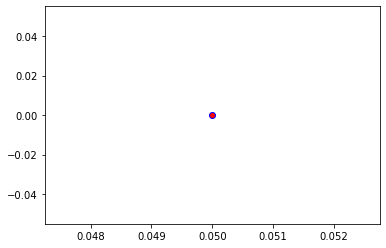

Crafting adversarial images took: 7.812955856323242 seconds 

Images classified as:
000000233771 879 = umbrella
000000233825 495 = china cabinet
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


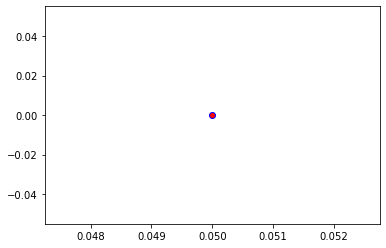

Crafting adversarial images took: 7.709368467330933 seconds 

Images classified as:
000000234366 442 = bell cote
000000234413 861 = toilet seat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


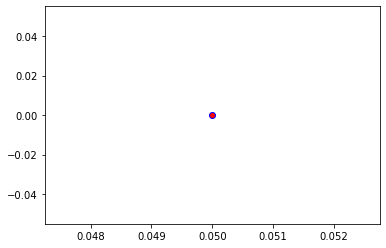

Crafting adversarial images took: 7.793050050735474 seconds 

Images classified as:
000000234526 355 = llama
000000234607 523 = crutch
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


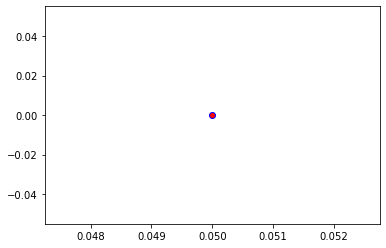

Crafting adversarial images took: 8.154900074005127 seconds 

Images classified as:
000000234660 466 = bullet train
000000234757 707 = pay-phone
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


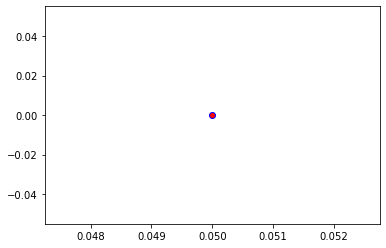

Crafting adversarial images took: 7.820288181304932 seconds 

Images classified as:
000000234779 933 = cheeseburger
000000234807 483 = castle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


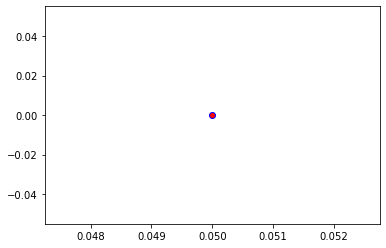

Crafting adversarial images took: 7.920595169067383 seconds 

Images classified as:
000000235057 290 = jaguar
000000235064 294 = brown bear
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


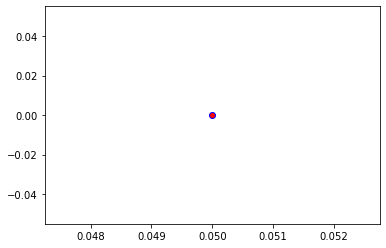

Crafting adversarial images took: 7.80928373336792 seconds 

Images classified as:
000000235241 768 = rugby ball
000000235252 354 = Arabian camel
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


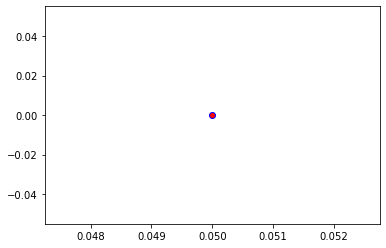

Crafting adversarial images took: 7.658071041107178 seconds 

Images classified as:
000000235399 675 = moving van
000000235778 645 = maypole
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


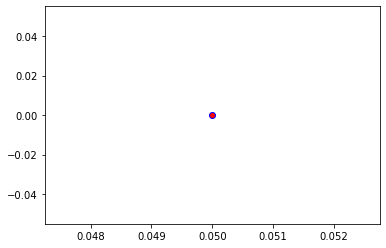

Crafting adversarial images took: 7.7483484745025635 seconds 

Images classified as:
000000235784 248 = ski
000000235836 522 = croquet ball
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


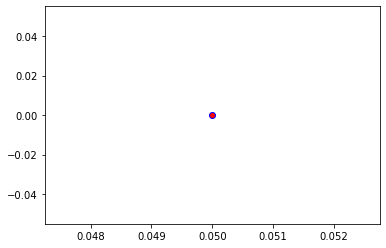

Crafting adversarial images took: 7.922741413116455 seconds 

Images classified as:
000000235857 339 = sorrel
000000236166 570 = gasmask
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


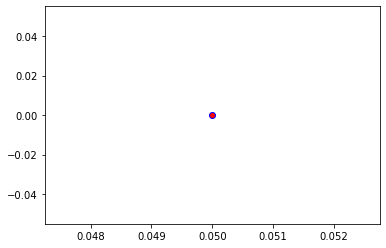

Crafting adversarial images took: 7.678991317749023 seconds 

Images classified as:
000000236308 248 = ski
000000236412 927 = trifle
Min values in image-array: 0.0 Max values in image-array: 252.57135
Min values in image-array: 0.0 Max values in image-array: 0.9904759
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


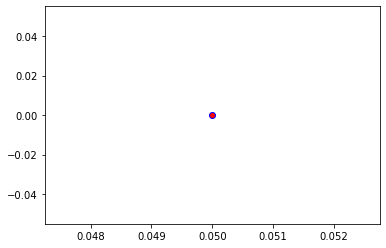

Crafting adversarial images took: 7.693325042724609 seconds 

Images classified as:
000000236426 752 = racket
000000236592 217 = English springer
Min values in image-array: 0.0 Max values in image-array: 254.99713
Min values in image-array: 0.0 Max values in image-array: 0.99998873
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


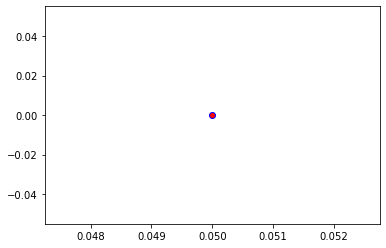

Crafting adversarial images took: 7.779420375823975 seconds 

Images classified as:
000000236599 417 = balloon
000000236690 132 = American egret
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


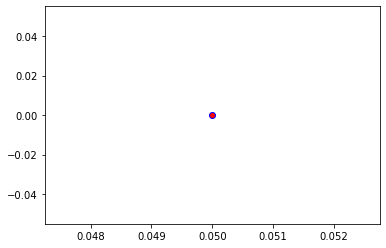

Crafting adversarial images took: 7.811134338378906 seconds 

Images classified as:
000000236721 868 = tray
000000236730 340 = zebra
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


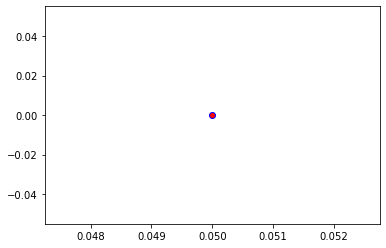

Crafting adversarial images took: 7.7349853515625 seconds 

Images classified as:
000000236784 209 = Chesapeake Bay retriever
000000236845 919 = street sign
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


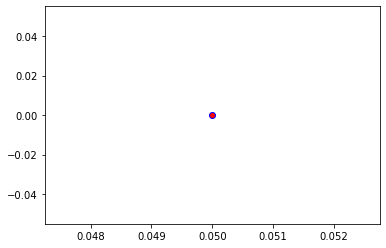

Crafting adversarial images took: 7.715332269668579 seconds 

Images classified as:
000000236914 850 = teddy
000000237071 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


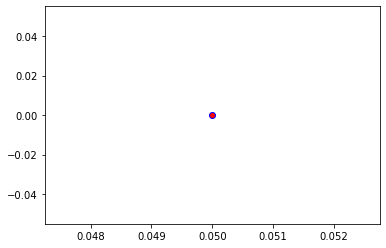

Crafting adversarial images took: 7.856572151184082 seconds 

Images classified as:
000000237118 457 = bow tie
000000237316 648 = medicine chest
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


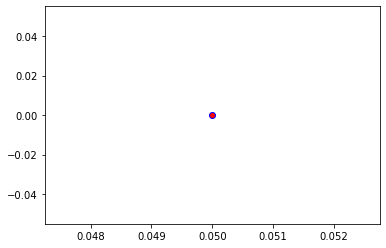

Crafting adversarial images took: 7.765942811965942 seconds 

Images classified as:
000000237517 461 = plate
000000237864 385 = Indian elephant
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


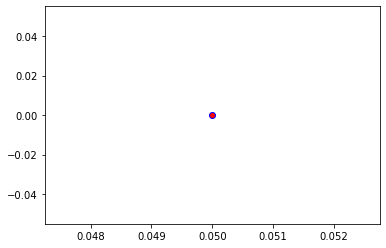

Crafting adversarial images took: 8.334719896316528 seconds 

Images classified as:
000000237928 651 = microwave
000000237984 703 = park bench
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


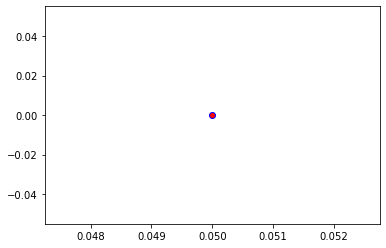

Crafting adversarial images took: 7.871793270111084 seconds 

Images classified as:
000000238013 752 = racket
000000238039 54 = hog
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


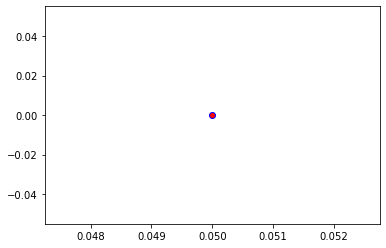

Crafting adversarial images took: 7.687297582626343 seconds 

Images classified as:
000000238410 559 = folding chair
000000238866 961 = dough
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


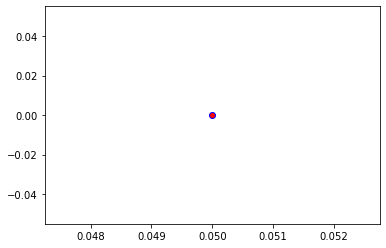

Crafting adversarial images took: 7.7391197681427 seconds 

Images classified as:
000000239041 648 = medicine chest
000000239274 484 = catamaran
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


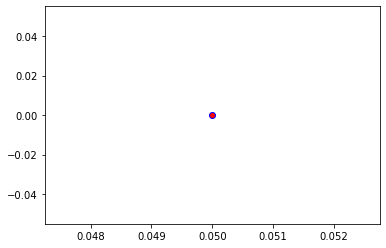

Crafting adversarial images took: 7.893733024597168 seconds 

Images classified as:
000000239318 620 = laptop
000000239347 669 = mosquito net
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


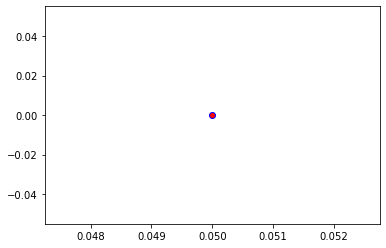

Crafting adversarial images took: 7.699491024017334 seconds 

Images classified as:
000000239537 752 = racket
000000239627 896 = washbasin
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


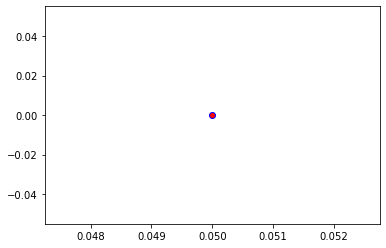

Crafting adversarial images took: 7.774198770523071 seconds 

Images classified as:
000000239717 965 = burrito
000000239773 981 = ballplayer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


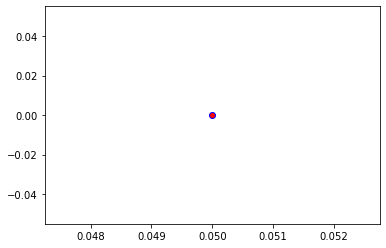

Crafting adversarial images took: 7.793178081512451 seconds 

Images classified as:
000000239843 919 = street sign
000000239857 915 = yurt
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


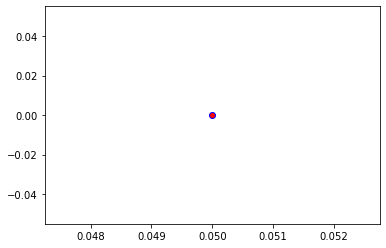

Crafting adversarial images took: 7.712946176528931 seconds 

Images classified as:
000000240023 752 = racket
000000240049 421 = bannister
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


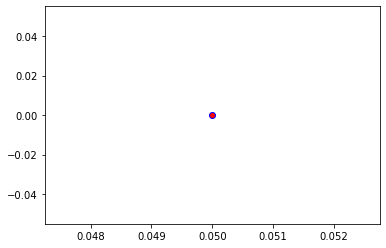

Crafting adversarial images took: 7.909722566604614 seconds 

Images classified as:
000000240250 963 = pizza
000000240754 54 = hog
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


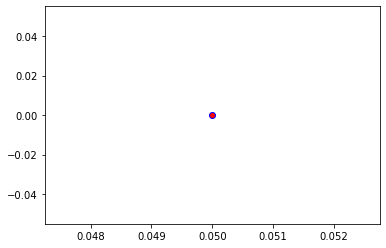

Crafting adversarial images took: 7.670700788497925 seconds 

Images classified as:
000000240767 919 = street sign
000000240940 548 = entertainment center
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


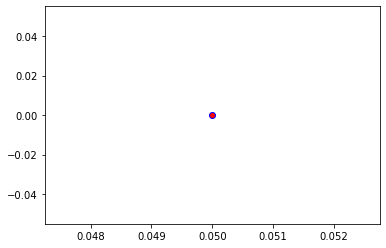

Crafting adversarial images took: 7.76259183883667 seconds 

Images classified as:
000000241297 547 = electric locomotive
000000241319 749 = quill
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


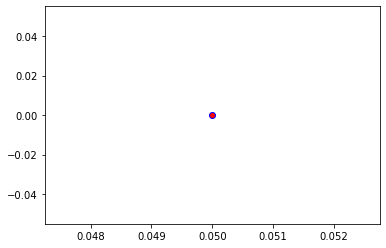

Crafting adversarial images took: 8.377068519592285 seconds 

Images classified as:
000000241326 750 = quilt
000000241602 406 = altar
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


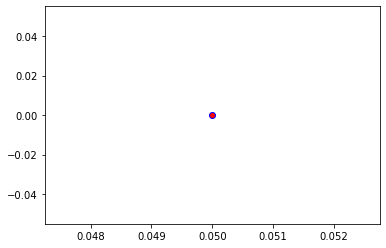

Crafting adversarial images took: 7.8399436473846436 seconds 

Images classified as:
000000241668 903 = wig
000000241677 275 = African hunting dog
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


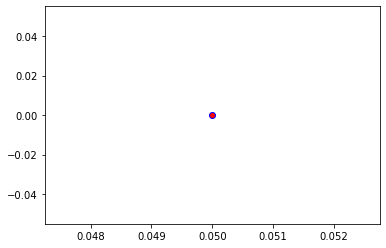

Crafting adversarial images took: 8.147023916244507 seconds 

Images classified as:
000000242060 868 = tray
000000242287 884 = vault
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


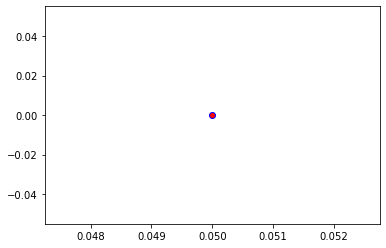

Crafting adversarial images took: 7.839952707290649 seconds 

Images classified as:
000000242411 442 = bell cote
000000242678 595 = harvester
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


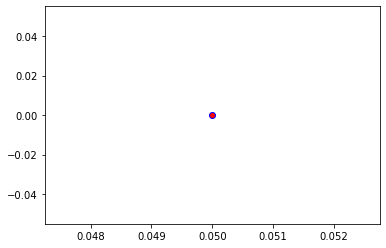

Crafting adversarial images took: 7.725858449935913 seconds 

Images classified as:
000000242724 6 = stingray
000000242934 532 = dining table
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


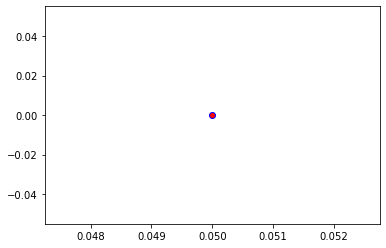

Crafting adversarial images took: 10.187748670578003 seconds 

Images classified as:
000000242946 461 = plate
000000243034 442 = bell cote
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


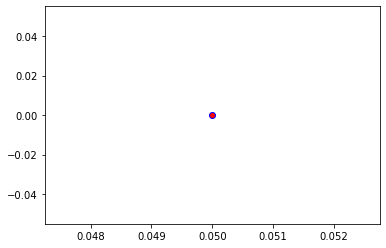

Crafting adversarial images took: 8.585514068603516 seconds 

Images classified as:
000000243075 296 = ice bear
000000243148 796 = ski mask
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


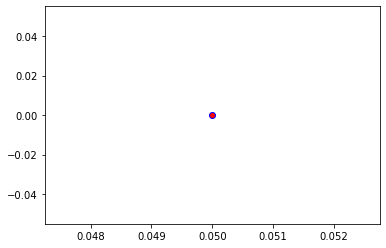

Crafting adversarial images took: 8.675707817077637 seconds 

Images classified as:
000000243199 681 = notebook
000000243204 813 = spatula
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


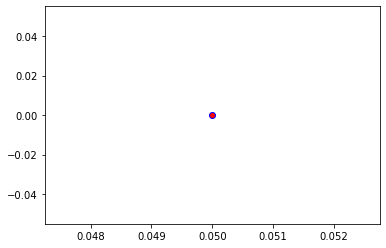

Crafting adversarial images took: 9.496056318283081 seconds 

Images classified as:
000000243344 894 = wardrobe
000000243495 861 = toilet seat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


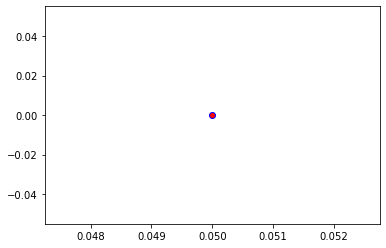

Crafting adversarial images took: 8.942441463470459 seconds 

Images classified as:
000000243626 962 = meat loaf
000000243867 654 = minibus
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


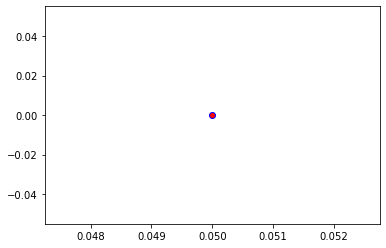

Crafting adversarial images took: 9.018784046173096 seconds 

Images classified as:
000000243989 862 = torch
000000244019 704 = parking meter
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


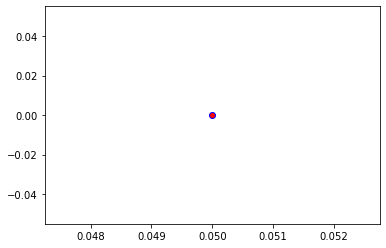

Crafting adversarial images took: 10.768682956695557 seconds 

Images classified as:
000000244099 354 = Arabian camel
000000244181 934 = hotdog
Min values in image-array: 0.0 Max values in image-array: 250.69456
Min values in image-array: 0.0 Max values in image-array: 0.9831159
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


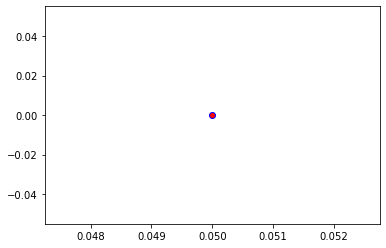

Crafting adversarial images took: 9.376006841659546 seconds 

Images classified as:
000000244379 920 = traffic light
000000244411 346 = water buffalo
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


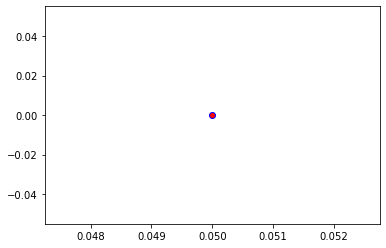

Crafting adversarial images took: 10.11041784286499 seconds 

Images classified as:
000000244496 639 = suit
000000244592 340 = zebra
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


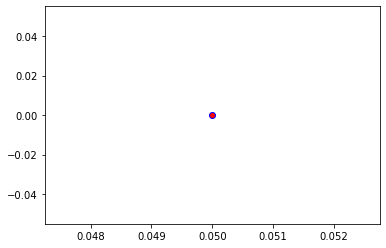

Crafting adversarial images took: 9.500183582305908 seconds 

Images classified as:
000000244750 647 = measuring cup
000000244833 670 = motor scooter
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


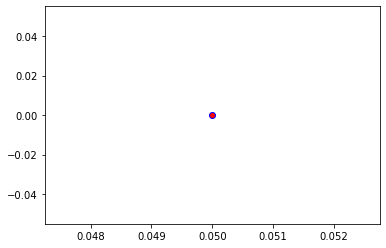

Crafting adversarial images took: 8.963984251022339 seconds 

Images classified as:
000000245026 606 = iron
000000245102 421 = bannister
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


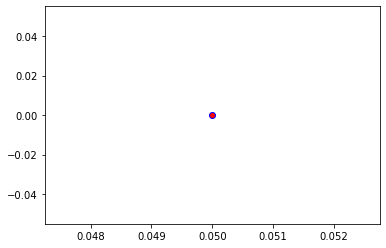

Crafting adversarial images took: 9.195377111434937 seconds 

Images classified as:
000000245173 442 = bell cote
000000245311 415 = bakery
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


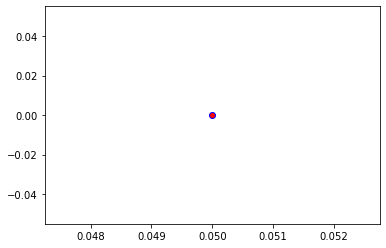

Crafting adversarial images took: 8.402929782867432 seconds 

Images classified as:
000000245320 88 = macaw
000000245448 665 = moped
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


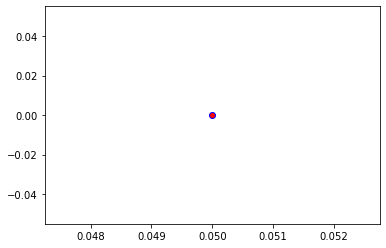

Crafting adversarial images took: 8.370394468307495 seconds 

Images classified as:
000000245513 293 = cheetah
000000245576 508 = computer keyboard
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


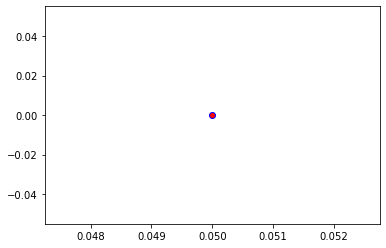

Crafting adversarial images took: 8.522469758987427 seconds 

Images classified as:
000000245651 673 = mouse
000000245764 861 = toilet seat
Min values in image-array: 0.0 Max values in image-array: 254.8414
Min values in image-array: 0.0 Max values in image-array: 0.999378
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


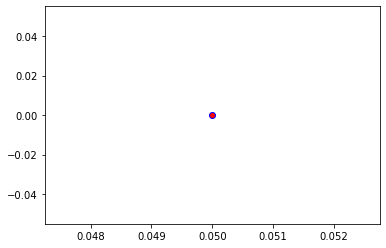

Crafting adversarial images took: 8.534502744674683 seconds 

Images classified as:
000000245915 386 = African elephant
000000246308 526 = desk
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


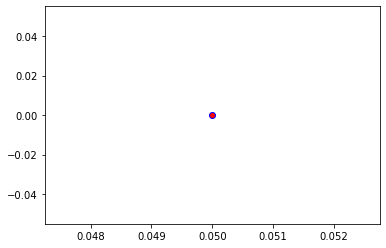

Crafting adversarial images took: 8.449872016906738 seconds 

Images classified as:
000000246436 963 = pizza
000000246454 180 = American Staffordshire terrier
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


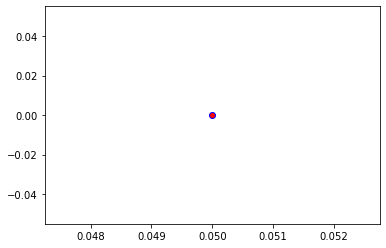

Crafting adversarial images took: 8.459905624389648 seconds 

Images classified as:
000000246522 442 = bell cote
000000246883 978 = seashore
Min values in image-array: 0.0 Max values in image-array: 254.96317
Min values in image-array: 0.0 Max values in image-array: 0.9998556
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


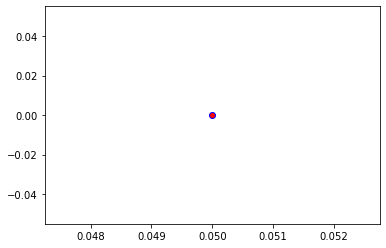

Crafting adversarial images took: 8.545162200927734 seconds 

Images classified as:
000000246963 573 = go-kart
000000246968 762 = restaurant
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


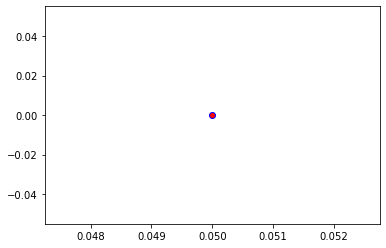

Crafting adversarial images took: 8.482942819595337 seconds 

Images classified as:
000000247806 497 = church
000000247838 537 = dogsled
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


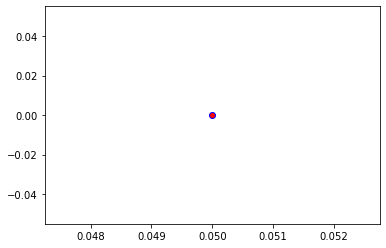

Crafting adversarial images took: 8.366854667663574 seconds 

Images classified as:
000000247917 981 = ballplayer
000000248111 651 = microwave
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


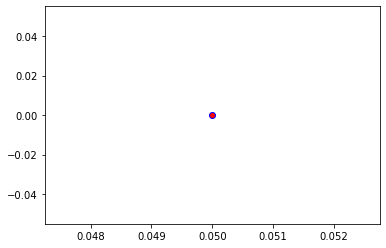

Crafting adversarial images took: 8.453696489334106 seconds 

Images classified as:
000000248112 752 = racket
000000248284 879 = umbrella
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


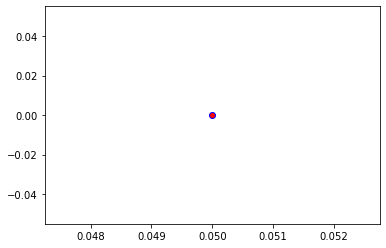

Crafting adversarial images took: 8.441998481750488 seconds 

Images classified as:
000000248314 673 = mouse
000000248334 449 = boathouse
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


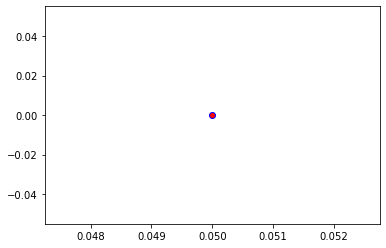

Crafting adversarial images took: 9.38569688796997 seconds 

Images classified as:
000000248400 963 = pizza
000000248616 522 = croquet ball
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


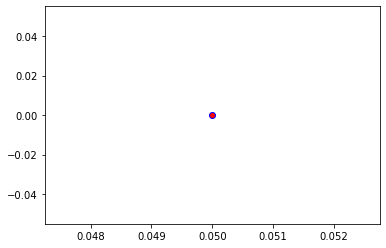

Crafting adversarial images took: 8.420599460601807 seconds 

Images classified as:
000000248631 673 = mouse
000000248752 981 = ballplayer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


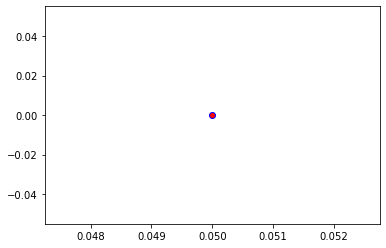

Crafting adversarial images took: 8.652178764343262 seconds 

Images classified as:
000000248810 354 = Arabian camel
000000248980 924 = guacamole
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


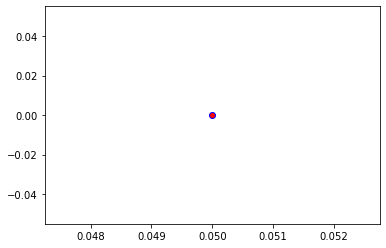

Crafting adversarial images took: 8.893165111541748 seconds 

Images classified as:
000000249025 883 = vase
000000249129 865 = toyshop
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


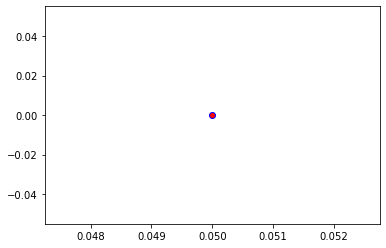

Crafting adversarial images took: 8.5070641040802 seconds 

Images classified as:
000000249180 421 = bannister
000000249219 874 = trolleybus
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


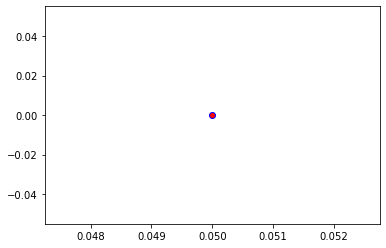

Crafting adversarial images took: 8.433192253112793 seconds 

Images classified as:
000000249550 750 = quilt
000000249643 705 = passenger car
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


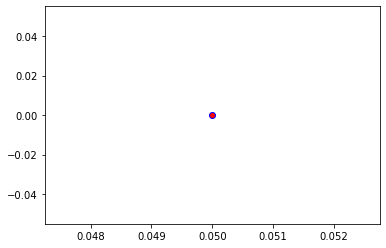

Crafting adversarial images took: 8.515213012695312 seconds 

Images classified as:
000000249786 140 = alp
000000250127 879 = umbrella
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


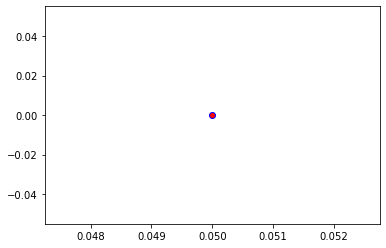

Crafting adversarial images took: 8.591946601867676 seconds 

Images classified as:
000000250137 862 = torch
000000250205 146 = albatross
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


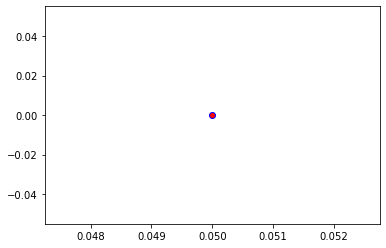

Crafting adversarial images took: 8.908768892288208 seconds 

Images classified as:
000000250282 652 = military uniform
000000250619 977 = sandbar
Min values in image-array: 0.0 Max values in image-array: 254.96658
Min values in image-array: 0.0 Max values in image-array: 0.9998689
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


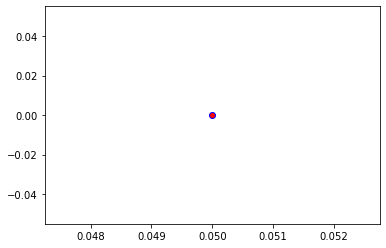

Crafting adversarial images took: 9.420511245727539 seconds 

Images classified as:
000000250758 340 = zebra
000000250766 461 = plate
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


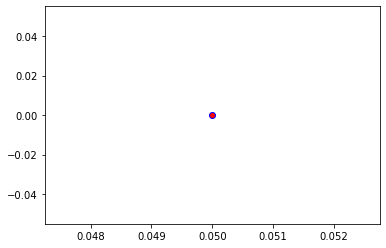

Crafting adversarial images took: 9.826042413711548 seconds 

Images classified as:
000000250901 452 = bonnet
000000251065 861 = toilet seat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


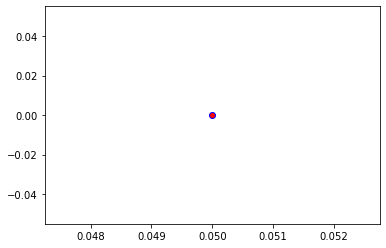

Crafting adversarial images took: 8.964603662490845 seconds 

Images classified as:
000000251119 930 = French loaf
000000251140 921 = book jacket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


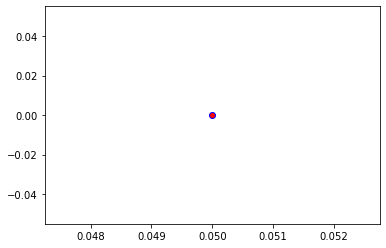

Crafting adversarial images took: 8.531399250030518 seconds 

Images classified as:
000000251537 618 = ladle
000000251572 215 = Brittany spaniel
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


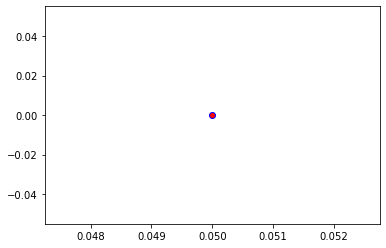

Crafting adversarial images took: 8.869813919067383 seconds 

Images classified as:
000000251824 691 = oxygen mask
000000252216 355 = llama
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


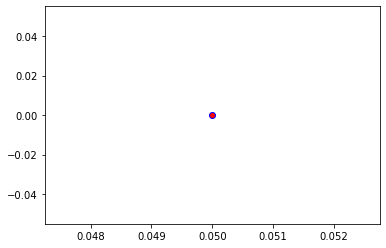

Crafting adversarial images took: 8.39222502708435 seconds 

Images classified as:
000000252219 358 = pole
000000252294 116 = cradle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


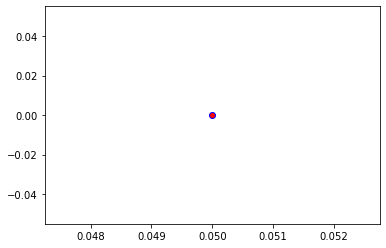

Crafting adversarial images took: 8.419093132019043 seconds 

Images classified as:
000000252332 919 = street sign
000000252507 248 = ski
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


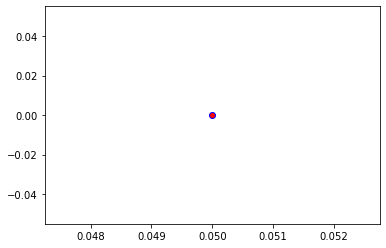

Crafting adversarial images took: 8.337121486663818 seconds 

Images classified as:
000000252559 442 = bell cote
000000252701 26 = gar
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


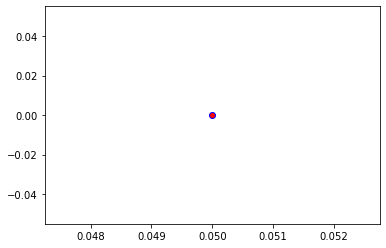

Crafting adversarial images took: 8.513607740402222 seconds 

Images classified as:
000000252716 649 = megalith
000000252776 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


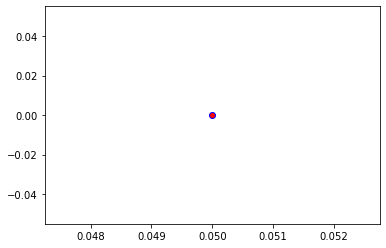

Crafting adversarial images took: 8.457556009292603 seconds 

Images classified as:
000000253002 874 = trolleybus
000000253386 234 = Rottweiler
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


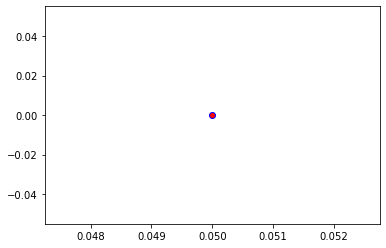

Crafting adversarial images took: 8.62360668182373 seconds 

Images classified as:
000000253433 850 = teddy
000000253452 461 = plate
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


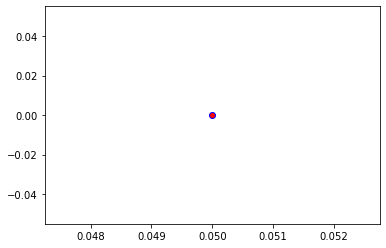

Crafting adversarial images took: 8.467067003250122 seconds 

Images classified as:
000000253695 981 = ballplayer
000000253742 355 = llama
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


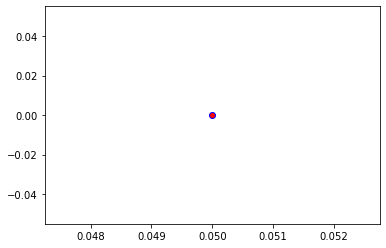

Crafting adversarial images took: 8.510939836502075 seconds 

Images classified as:
000000253819 880 = unicycle
000000253835 705 = passenger car
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


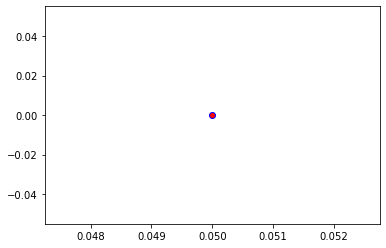

Crafting adversarial images took: 8.641490459442139 seconds 

Images classified as:
000000254016 415 = bakery
000000254368 116 = cradle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


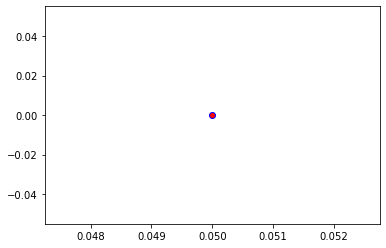

Crafting adversarial images took: 8.40648889541626 seconds 

Images classified as:
000000254516 981 = ballplayer
000000254814 757 = recreational vehicle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


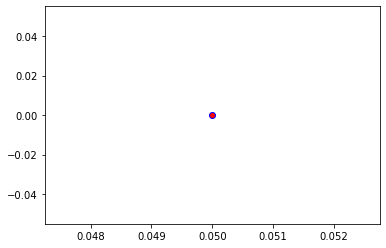

Crafting adversarial images took: 8.501278162002563 seconds 

Images classified as:
000000255165 556 = screen
000000255401 861 = toilet seat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


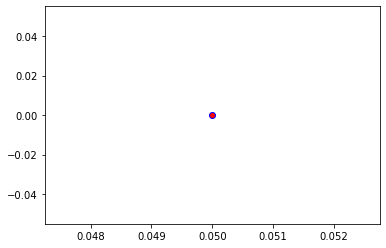

Crafting adversarial images took: 8.478502750396729 seconds 

Images classified as:
000000255483 549 = envelope
000000255536 706 = patio
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


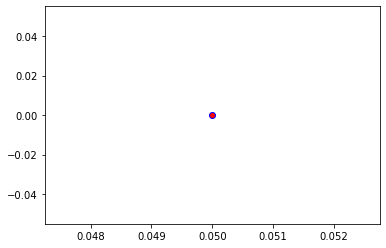

Crafting adversarial images took: 9.31035828590393 seconds 

Images classified as:
000000255664 209 = Chesapeake Bay retriever
000000255718 562 = fountain
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


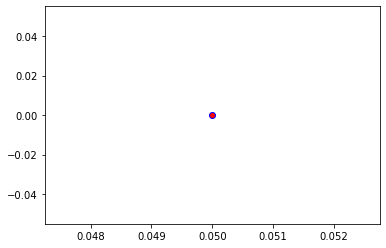

Crafting adversarial images took: 9.080755949020386 seconds 

Images classified as:
000000255747 461 = plate
000000255749 874 = trolleybus
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


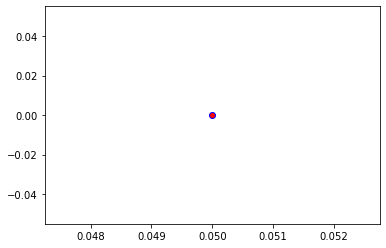

Crafting adversarial images took: 8.304128170013428 seconds 

Images classified as:
000000255824 965 = burrito
000000255912 965 = burrito
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


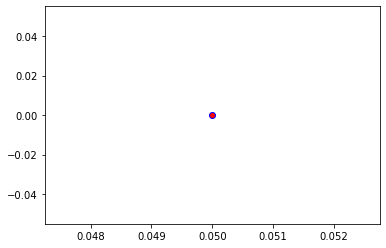

Crafting adversarial images took: 7.909684181213379 seconds 

Images classified as:
000000255917 874 = trolleybus
000000255965 285 = Egyptian cat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


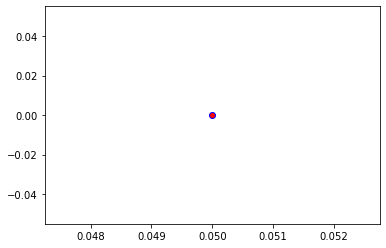

Crafting adversarial images took: 7.923159837722778 seconds 

Images classified as:
000000256192 670 = motor scooter
000000256195 547 = electric locomotive
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


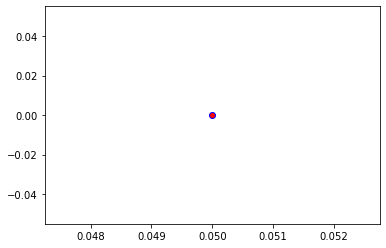

Crafting adversarial images took: 7.905941963195801 seconds 

Images classified as:
000000256407 793 = shower cap
000000256518 965 = burrito
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


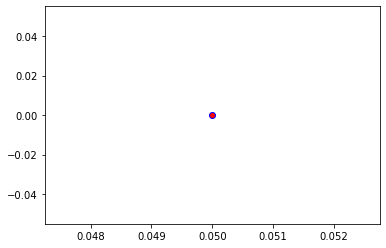

Crafting adversarial images took: 8.062288761138916 seconds 

Images classified as:
000000256775 701 = parachute
000000256868 421 = bannister
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


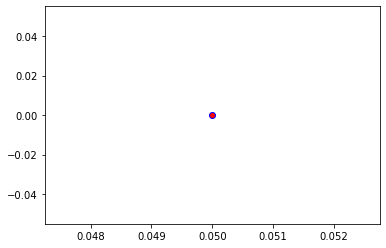

Crafting adversarial images took: 8.021026849746704 seconds 

Images classified as:
000000256916 963 = pizza
000000256941 538 = dome
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


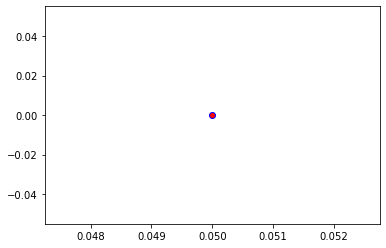

Crafting adversarial images took: 8.372254610061646 seconds 

Images classified as:
000000257084 751 = racer
000000257169 589 = hand blower
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


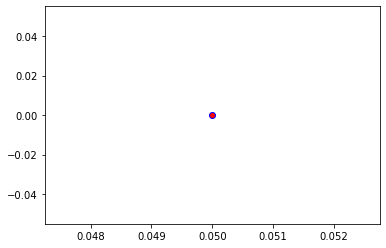

Crafting adversarial images took: 8.032975196838379 seconds 

Images classified as:
000000257370 851 = television
000000257478 981 = ballplayer
Min values in image-array: 0.44210815 Max values in image-array: 255.0
Min values in image-array: 0.0017337574 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


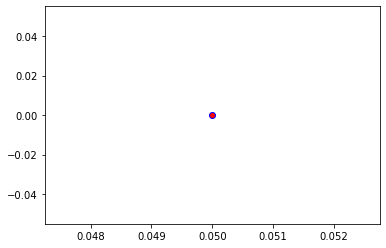

Crafting adversarial images took: 8.033369302749634 seconds 

Images classified as:
000000257566 67 = dam
000000257624 805 = soccer ball
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


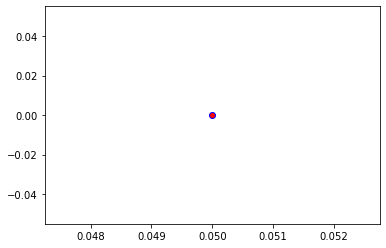

Crafting adversarial images took: 8.34961223602295 seconds 

Images classified as:
000000257865 752 = racket
000000257896 639 = suit
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


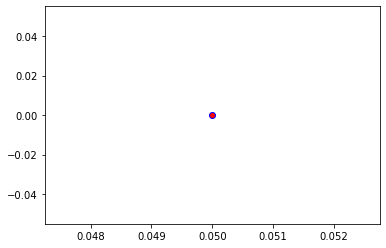

Crafting adversarial images took: 9.000240802764893 seconds 

Images classified as:
000000258388 862 = torch
000000258541 906 = Windsor tie
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


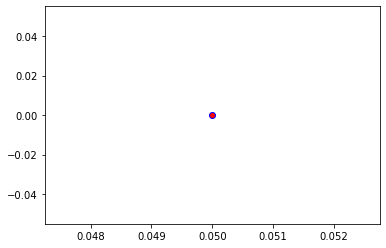

Crafting adversarial images took: 7.923839569091797 seconds 

Images classified as:
000000258793 920 = traffic light
000000258883 961 = dough
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


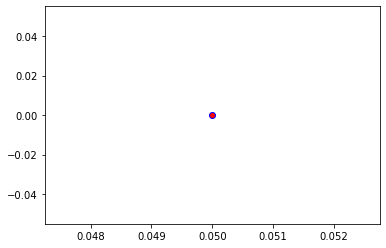

Crafting adversarial images took: 8.87513542175293 seconds 

Images classified as:
000000258911 225 = malinois
000000259097 437 = beacon
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


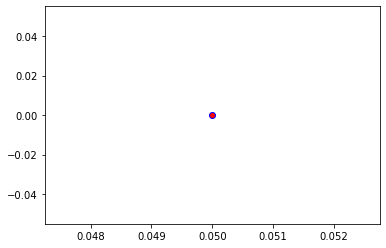

Crafting adversarial images took: 8.226855516433716 seconds 

Images classified as:
000000259382 176 = gazelle
000000259571 569 = garbage truck
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


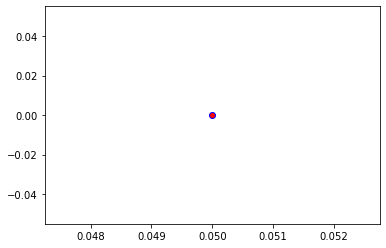

Crafting adversarial images took: 8.444907665252686 seconds 

Images classified as:
000000259597 762 = restaurant
000000259625 385 = Indian elephant
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


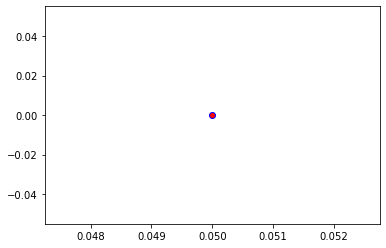

Crafting adversarial images took: 8.462761163711548 seconds 

Images classified as:
000000259640 880 = unicycle
000000259690 621 = lawn mower
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


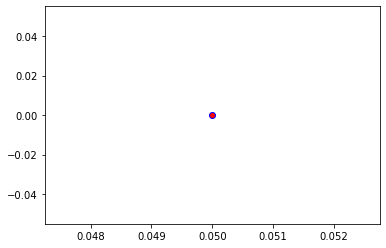

Crafting adversarial images took: 8.056846141815186 seconds 

Images classified as:
000000259830 612 = jinrikisha
000000259854 919 = street sign
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


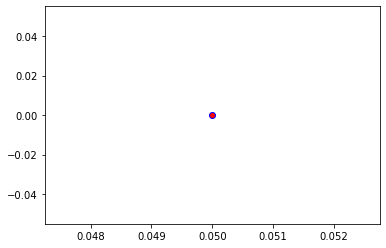

Crafting adversarial images took: 7.9332451820373535 seconds 

Images classified as:
000000260105 928 = ice cream
000000260106 339 = sorrel
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


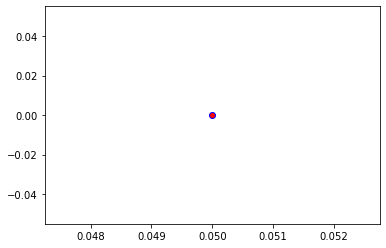

Crafting adversarial images took: 8.269023656845093 seconds 

Images classified as:
000000260261 950 = orange
000000260266 920 = traffic light
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


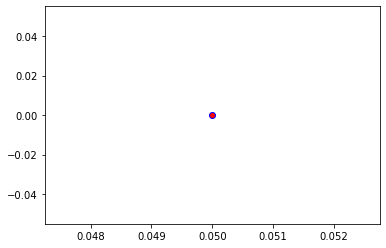

Crafting adversarial images took: 8.130836963653564 seconds 

Images classified as:
000000260470 415 = bakery
000000260657 919 = street sign
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


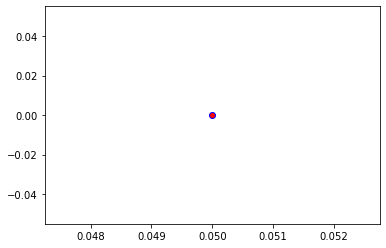

Crafting adversarial images took: 8.188335657119751 seconds 

Images classified as:
000000260925 284 = Siamese cat
000000261036 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


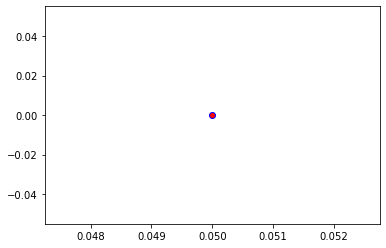

Crafting adversarial images took: 8.418470621109009 seconds 

Images classified as:
000000261061 456 = bow
000000261097 430 = basketball
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


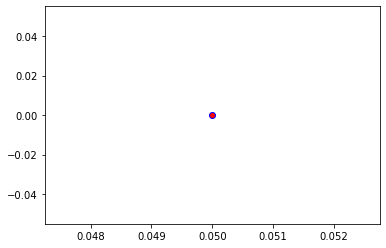

Crafting adversarial images took: 8.300105810165405 seconds 

Images classified as:
000000261116 868 = tray
000000261161 239 = Bernese mountain dog
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


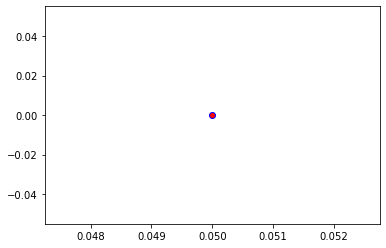

Crafting adversarial images took: 8.18789005279541 seconds 

Images classified as:
000000261318 612 = jinrikisha
000000261535 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


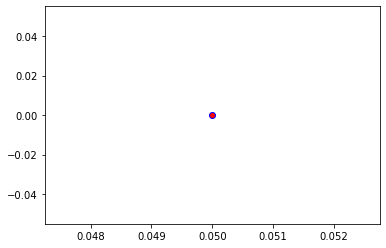

Crafting adversarial images took: 8.180373668670654 seconds 

Images classified as:
000000261706 263 = Pembroke
000000261712 9 = ostrich
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


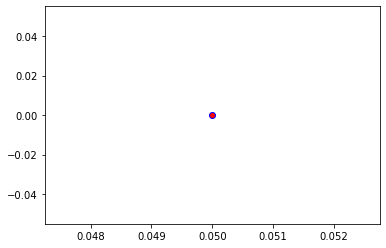

Crafting adversarial images took: 8.990227699279785 seconds 

Images classified as:
000000261732 752 = racket
000000261796 716 = picket fence
Min values in image-array: 0.08703477 Max values in image-array: 255.0
Min values in image-array: 0.0003413128 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


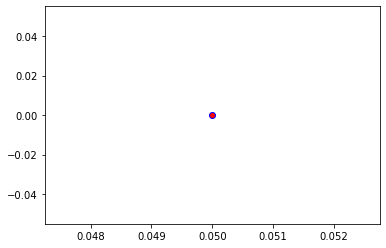

Crafting adversarial images took: 9.227681398391724 seconds 

Images classified as:
000000261888 671 = mountain bike
000000261982 981 = ballplayer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


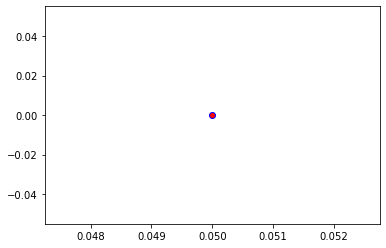

Crafting adversarial images took: 8.33771824836731 seconds 

Images classified as:
000000262048 879 = umbrella
000000262227 620 = laptop
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


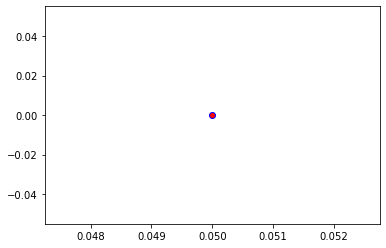

Crafting adversarial images took: 8.524583339691162 seconds 

Images classified as:
000000262440 435 = bathtub
000000262487 981 = ballplayer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


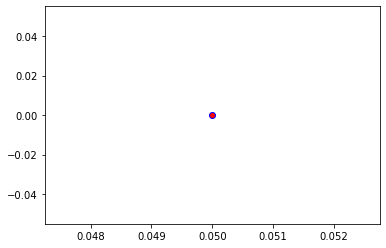

Crafting adversarial images took: 9.443644046783447 seconds 

Images classified as:
000000262587 974 = geyser
000000262631 883 = vase
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


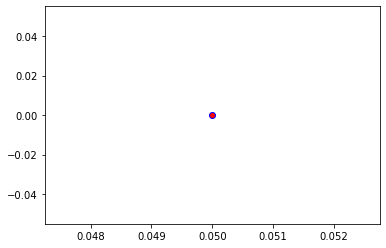

Crafting adversarial images took: 8.697218894958496 seconds 

Images classified as:
000000262682 651 = microwave
000000262895 639 = suit
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


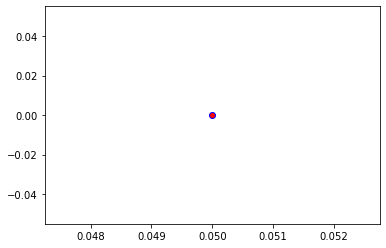

Crafting adversarial images took: 8.654188394546509 seconds 

Images classified as:
000000262938 850 = teddy
000000263068 456 = bow
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


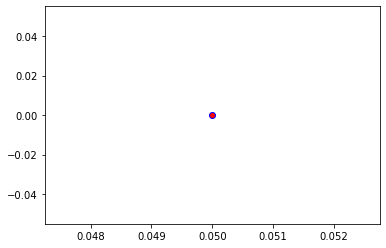

Crafting adversarial images took: 8.432997941970825 seconds 

Images classified as:
000000263299 779 = school bus
000000263403 693 = paddle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


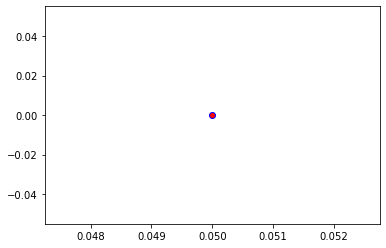

Crafting adversarial images took: 8.482470035552979 seconds 

Images classified as:
000000263425 410 = apiary
000000263463 475 = car mirror
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


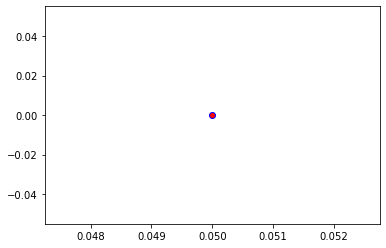

Crafting adversarial images took: 8.531633853912354 seconds 

Images classified as:
000000263474 861 = toilet seat
000000263594 656 = minivan
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


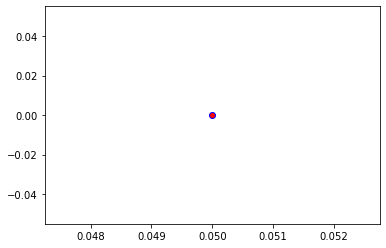

Crafting adversarial images took: 8.42001724243164 seconds 

Images classified as:
000000263644 564 = four-poster
000000263679 417 = balloon
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


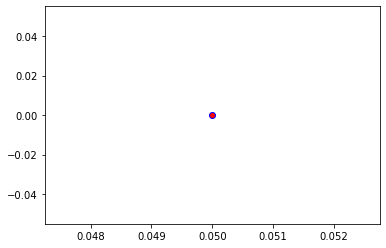

Crafting adversarial images took: 8.611177682876587 seconds 

Images classified as:
000000263796 634 = lumbermill
000000263860 386 = African elephant
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


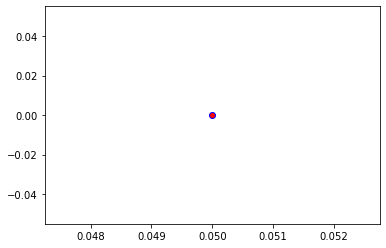

Crafting adversarial images took: 9.01649522781372 seconds 

Images classified as:
000000263966 101 = tusker
000000263969 499 = cleaver
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


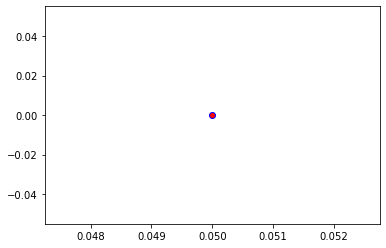

Crafting adversarial images took: 10.052236318588257 seconds 

Images classified as:
000000264335 21 = kite
000000264441 283 = Persian cat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


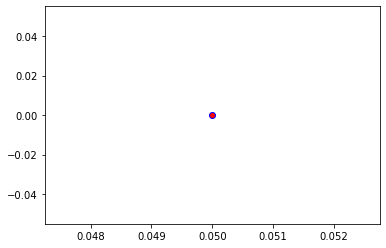

Crafting adversarial images took: 10.022784948348999 seconds 

Images classified as:
000000264535 703 = park bench
000000264968 981 = ballplayer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


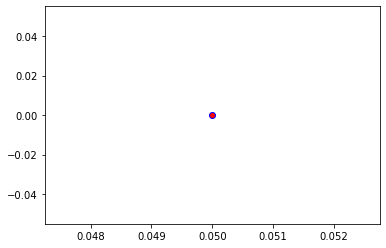

Crafting adversarial images took: 12.476236343383789 seconds 

Images classified as:
000000265108 417 = balloon
000000265518 461 = plate
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


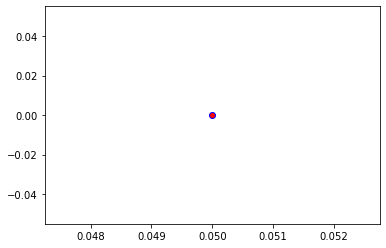

Crafting adversarial images took: 14.246956825256348 seconds 

Images classified as:
000000265777 963 = pizza
000000265816 603 = horse cart
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


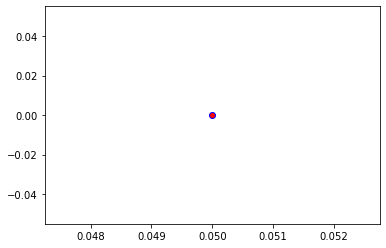

Crafting adversarial images took: 12.726162910461426 seconds 

Images classified as:
000000266082 442 = bell cote
000000266206 648 = medicine chest
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


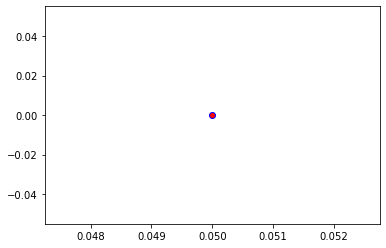

Crafting adversarial images took: 11.71776533126831 seconds 

Images classified as:
000000266400 670 = motor scooter
000000266409 248 = ski
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


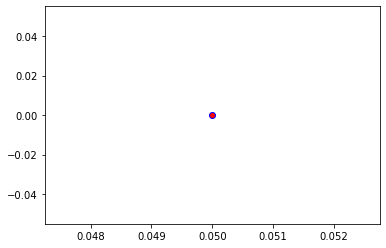

Crafting adversarial images took: 11.751159191131592 seconds 

Images classified as:
000000266768 756 = rain barrel
000000266892 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


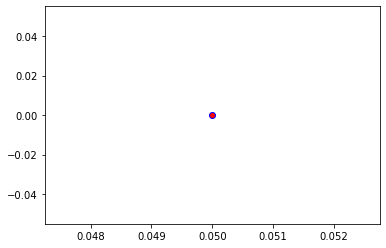

Crafting adversarial images took: 11.782337427139282 seconds 

Images classified as:
000000266981 557 = flagpole
000000267169 386 = African elephant
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


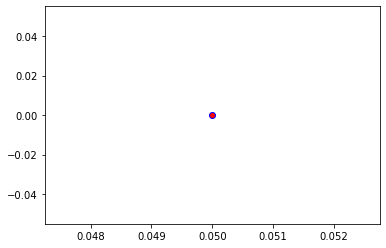

Crafting adversarial images took: 11.66135025024414 seconds 

Images classified as:
000000267191 386 = African elephant
000000267300 172 = whippet
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


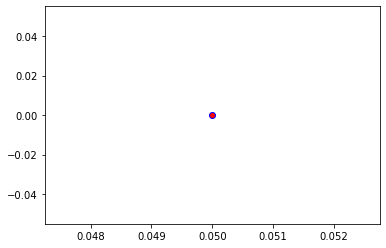

Crafting adversarial images took: 11.708803415298462 seconds 

Images classified as:
000000267351 442 = bell cote
000000267434 37 = ox
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


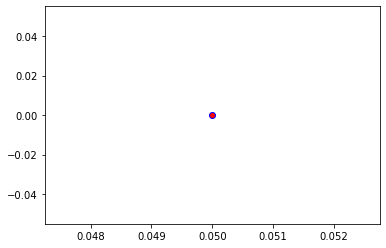

Crafting adversarial images took: 11.690640687942505 seconds 

Images classified as:
000000267537 702 = parallel bars
000000267670 861 = toilet seat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


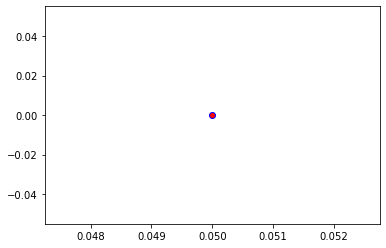

Crafting adversarial images took: 12.625895500183105 seconds 

Images classified as:
000000267903 896 = washbasin
000000267933 958 = hay
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


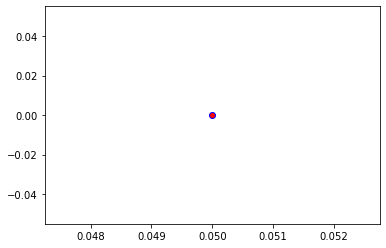

Crafting adversarial images took: 11.7607901096344 seconds 

Images classified as:
000000267940 404 = liner
000000267946 919 = street sign
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


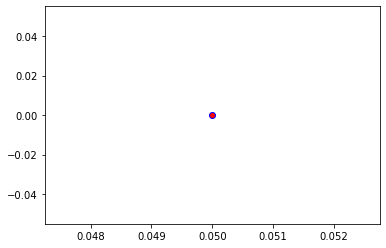

Crafting adversarial images took: 11.91780948638916 seconds 

Images classified as:
000000268000 821 = steel arch bridge
000000268375 385 = Indian elephant
Min values in image-array: 0.33291686 Max values in image-array: 255.0
Min values in image-array: 0.0013055563 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


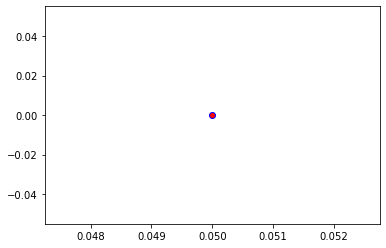

Crafting adversarial images took: 11.976313591003418 seconds 

Images classified as:
000000268378 731 = plunger
000000268729 340 = zebra
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


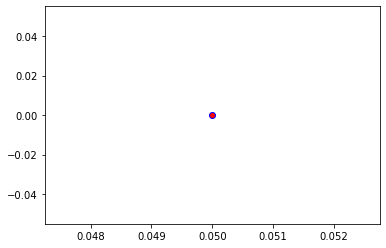

Crafting adversarial images took: 11.750362634658813 seconds 

Images classified as:
000000268831 861 = toilet seat
000000268996 919 = street sign
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


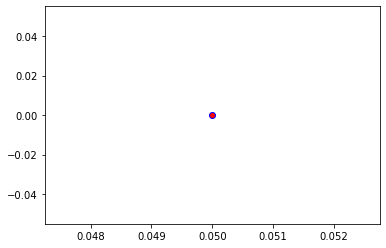

Crafting adversarial images took: 11.876809358596802 seconds 

Images classified as:
000000269113 172 = whippet
000000269121 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


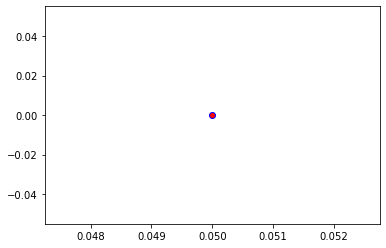

Crafting adversarial images took: 11.598538637161255 seconds 

Images classified as:
000000269196 270 = white wolf
000000269314 94 = hummingbird
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


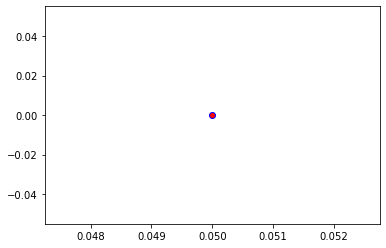

Crafting adversarial images took: 11.543473243713379 seconds 

Images classified as:
000000269316 768 = rugby ball
000000269632 874 = trolleybus
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


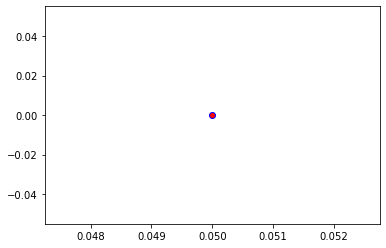

Crafting adversarial images took: 15.879722118377686 seconds 

Images classified as:
000000269682 920 = traffic light
000000269866 651 = microwave
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


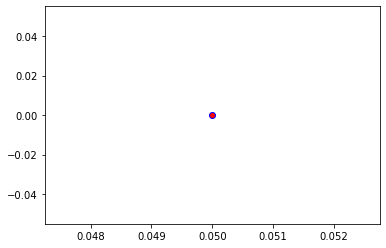

Crafting adversarial images took: 15.569109201431274 seconds 

Images classified as:
000000269932 583 = guillotine
000000269942 920 = traffic light
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


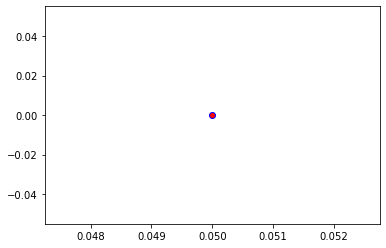

Crafting adversarial images took: 12.3339262008667 seconds 

Images classified as:
000000270066 665 = moped
000000270122 460 = breakwater
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


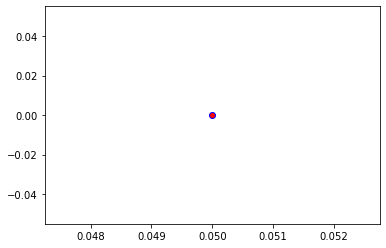

Crafting adversarial images took: 14.019753217697144 seconds 

Images classified as:
000000270244 340 = zebra
000000270297 547 = electric locomotive
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


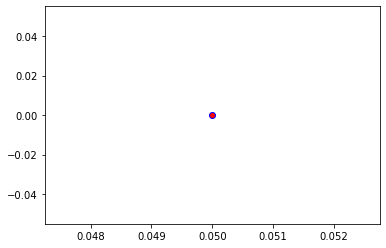

Crafting adversarial images took: 13.390086650848389 seconds 

Images classified as:
000000270386 919 = street sign
000000270402 386 = African elephant
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


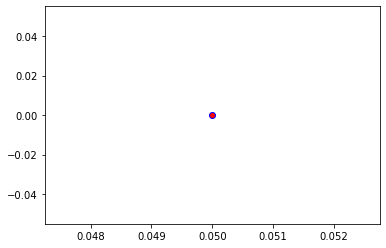

Crafting adversarial images took: 9.477862358093262 seconds 

Images classified as:
000000270474 522 = croquet ball
000000270677 610 = jersey
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


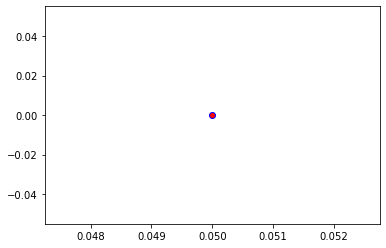

Crafting adversarial images took: 9.276629209518433 seconds 

Images classified as:
000000270705 21 = kite
000000270883 831 = studio couch
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


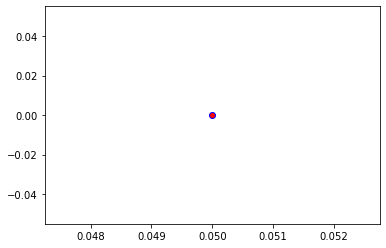

Crafting adversarial images took: 9.489098072052002 seconds 

Images classified as:
000000270908 752 = racket
000000271116 639 = suit
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


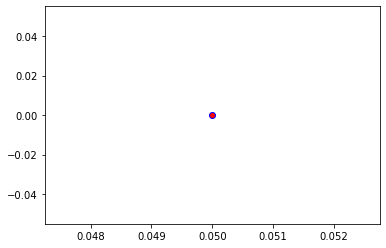

Crafting adversarial images took: 9.642970561981201 seconds 

Images classified as:
000000271402 870 = tricycle
000000271457 67 = dam
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


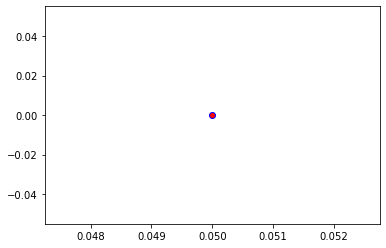

Crafting adversarial images took: 9.506352424621582 seconds 

Images classified as:
000000271471 954 = banana
000000271728 263 = Pembroke
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


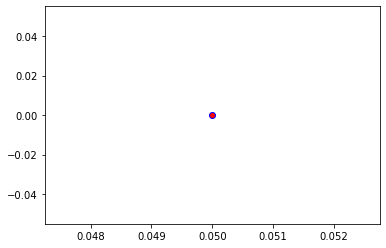

Crafting adversarial images took: 9.656755447387695 seconds 

Images classified as:
000000271997 639 = suit
000000272049 856 = thresher
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


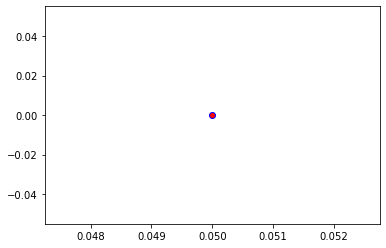

Crafting adversarial images took: 10.156307935714722 seconds 

Images classified as:
000000272136 895 = warplane
000000272148 977 = sandbar
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


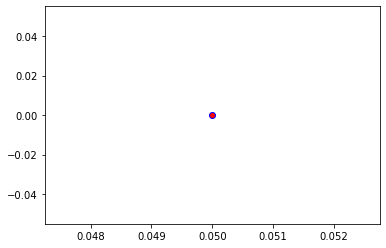

Crafting adversarial images took: 9.54126238822937 seconds 

Images classified as:
000000272212 354 = Arabian camel
000000272364 62 = rock python
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


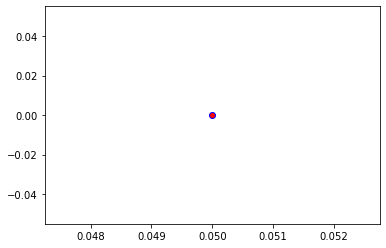

Crafting adversarial images took: 9.69231390953064 seconds 

Images classified as:
000000272416 861 = toilet seat
000000272566 954 = banana
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


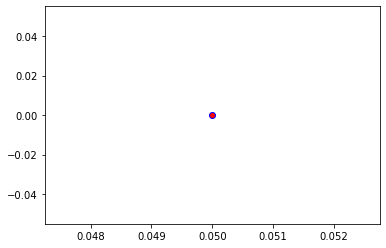

Crafting adversarial images took: 9.606693506240845 seconds 

Images classified as:
000000273132 621 = lawn mower
000000273198 202 = soft-coated wheaten terrier
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


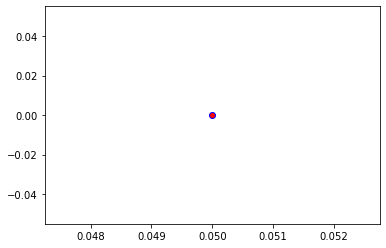

Crafting adversarial images took: 9.460667133331299 seconds 

Images classified as:
000000273232 978 = seashore
000000273420 830 = stretcher
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


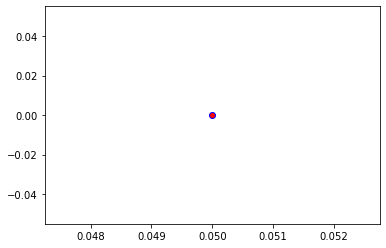

Crafting adversarial images took: 9.290185928344727 seconds 

Images classified as:
000000273493 752 = racket
000000273551 665 = moped
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


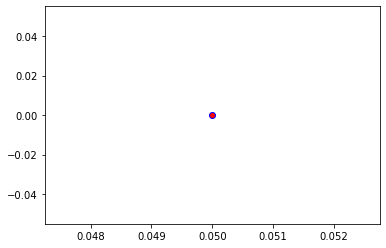

Crafting adversarial images took: 9.439400434494019 seconds 

Images classified as:
000000273617 358 = pole
000000273642 264 = Cardigan
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


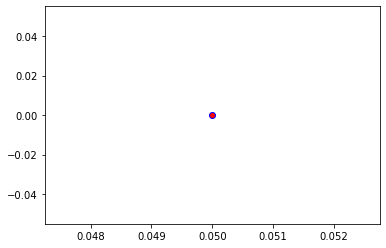

Crafting adversarial images took: 9.298731327056885 seconds 

Images classified as:
000000273711 461 = plate
000000273712 894 = wardrobe
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


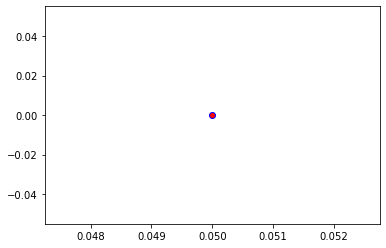

Crafting adversarial images took: 9.422722339630127 seconds 

Images classified as:
000000273715 701 = parachute
000000273760 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


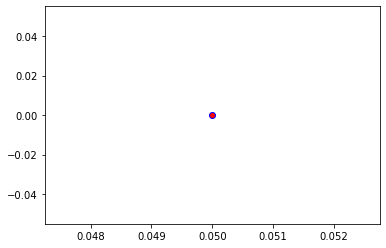

Crafting adversarial images took: 9.530022382736206 seconds 

Images classified as:
000000274066 693 = paddle
000000274219 457 = bow tie
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


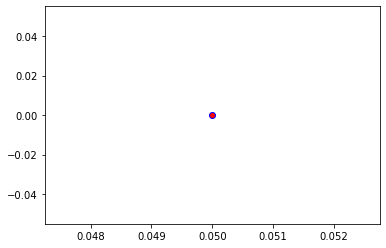

Crafting adversarial images took: 9.426444053649902 seconds 

Images classified as:
000000274272 874 = trolleybus
000000274411 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


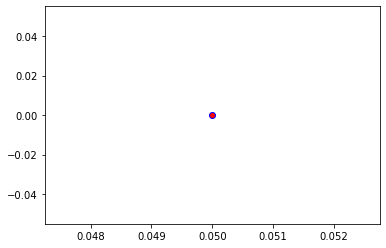

Crafting adversarial images took: 9.794092655181885 seconds 

Images classified as:
000000274460 472 = canoe
000000274687 444 = bicycle-built-for-two
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


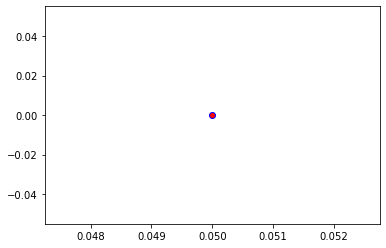

Crafting adversarial images took: 10.277758598327637 seconds 

Images classified as:
000000274708 140 = alp
000000275058 484 = catamaran
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


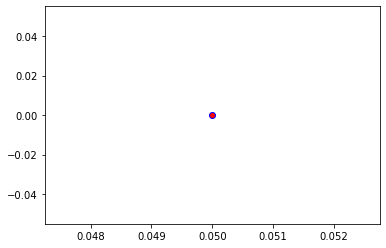

Crafting adversarial images took: 9.562885522842407 seconds 

Images classified as:
000000275198 879 = umbrella
000000275392 339 = sorrel
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


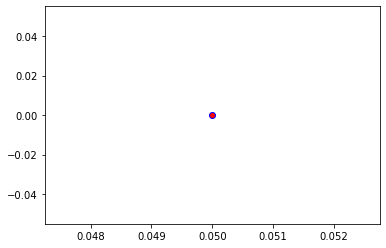

Crafting adversarial images took: 9.667377710342407 seconds 

Images classified as:
000000275727 547 = electric locomotive
000000275749 526 = desk
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


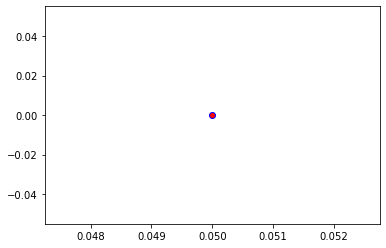

Crafting adversarial images took: 9.704456806182861 seconds 

Images classified as:
000000275791 705 = passenger car
000000276018 805 = soccer ball
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


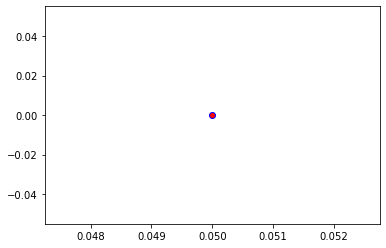

Crafting adversarial images took: 9.954454898834229 seconds 

Images classified as:
000000276024 354 = Arabian camel
000000276055 862 = torch
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


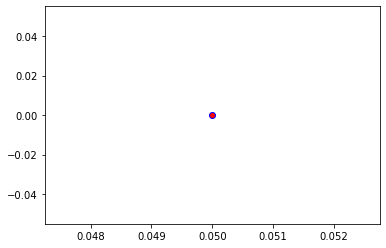

Crafting adversarial images took: 9.333131790161133 seconds 

Images classified as:
000000276284 665 = moped
000000276285 461 = plate
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


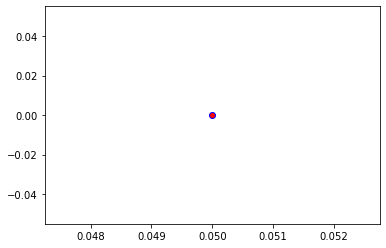

Crafting adversarial images took: 10.678715229034424 seconds 

Images classified as:
000000276434 470 = candle
000000276707 424 = barbershop
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


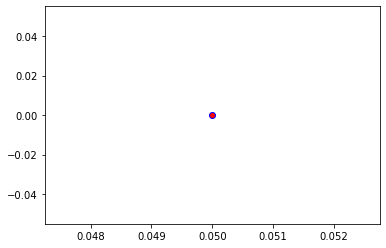

Crafting adversarial images took: 10.41045069694519 seconds 

Images classified as:
000000276720 497 = church
000000276804 981 = ballplayer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


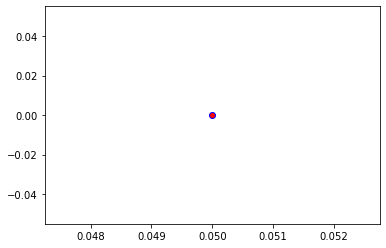

Crafting adversarial images took: 9.534739017486572 seconds 

Images classified as:
000000276921 850 = teddy
000000277005 498 = cinema
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


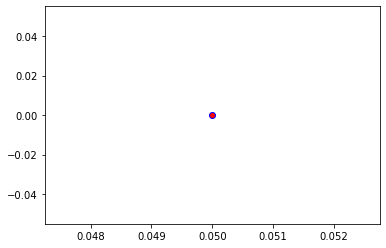

Crafting adversarial images took: 9.525498151779175 seconds 

Images classified as:
000000277020 642 = marimba
000000277051 13 = junco
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


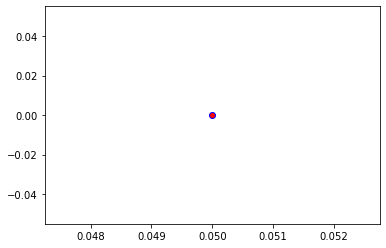

Crafting adversarial images took: 9.568915367126465 seconds 

Images classified as:
000000277197 532 = dining table
000000277584 284 = Siamese cat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


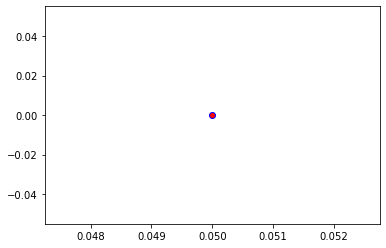

Crafting adversarial images took: 9.57229495048523 seconds 

Images classified as:
000000277689 334 = cup
000000278006 498 = cinema
Min values in image-array: 0.0 Max values in image-array: 254.82785
Min values in image-array: 0.0 Max values in image-array: 0.9993249
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


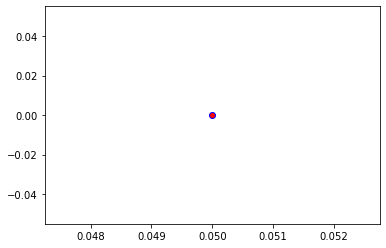

Crafting adversarial images took: 10.072267532348633 seconds 

Images classified as:
000000278353 5 = ram
000000278463 526 = desk
Min values in image-array: 0.0 Max values in image-array: 254.91199
Min values in image-array: 0.0 Max values in image-array: 0.9996548
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


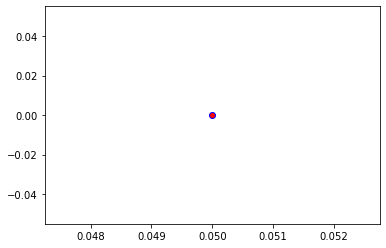

Crafting adversarial images took: 9.801846742630005 seconds 

Images classified as:
000000278705 523 = crutch
000000278749 523 = crutch
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


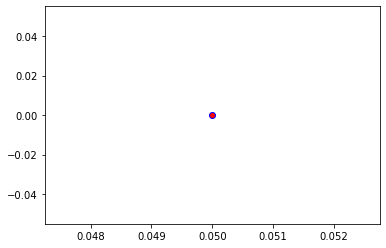

Crafting adversarial images took: 9.445383071899414 seconds 

Images classified as:
000000278848 879 = umbrella
000000278973 801 = snorkel
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


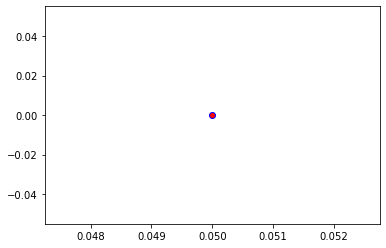

Crafting adversarial images took: 9.453886270523071 seconds 

Images classified as:
000000279145 28 = pot
000000279278 655 = miniskirt
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


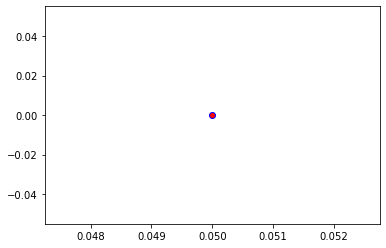

Crafting adversarial images took: 9.398081541061401 seconds 

Images classified as:
000000279541 415 = bakery
000000279714 475 = car mirror
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


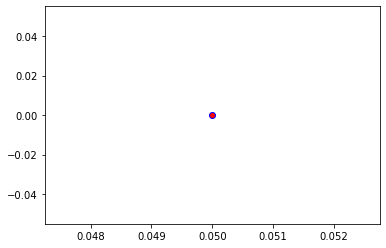

Crafting adversarial images took: 9.549566745758057 seconds 

Images classified as:
000000279730 934 = hotdog
000000279769 954 = banana
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


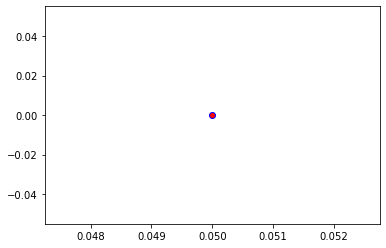

Crafting adversarial images took: 9.333353519439697 seconds 

Images classified as:
000000279774 981 = ballplayer
000000279887 476 = carousel
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


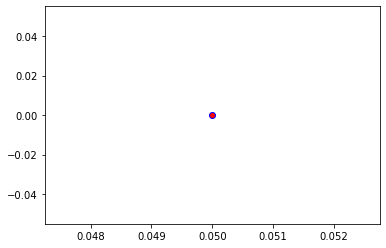

Crafting adversarial images took: 9.602929830551147 seconds 

Images classified as:
000000279927 975 = lakeside
000000280325 704 = parking meter
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


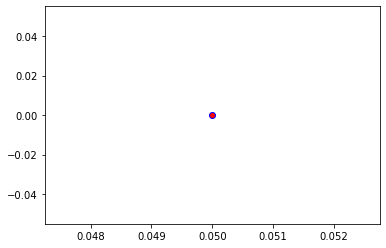

Crafting adversarial images took: 9.466017484664917 seconds 

Images classified as:
000000280710 829 = streetcar
000000280779 248 = ski
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


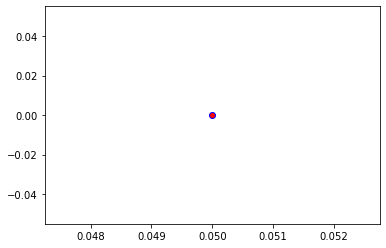

Crafting adversarial images took: 9.5358407497406 seconds 

Images classified as:
000000280891 950 = orange
000000280918 827 = stove
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


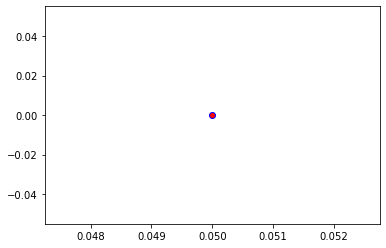

Crafting adversarial images took: 9.79231882095337 seconds 

Images classified as:
000000280930 606 = iron
000000281032 766 = rotisserie
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


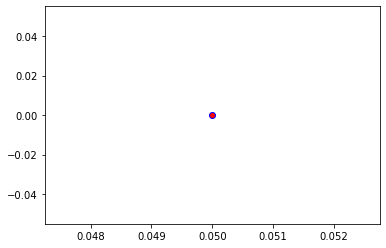

Crafting adversarial images took: 9.52372694015503 seconds 

Images classified as:
000000281179 920 = traffic light
000000281409 981 = ballplayer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


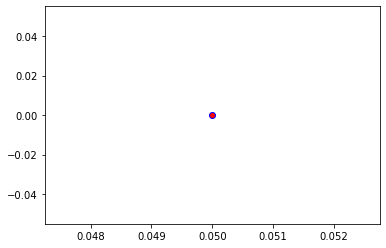

Crafting adversarial images took: 10.051008939743042 seconds 

Images classified as:
000000281414 843 = swing
000000281447 339 = sorrel
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


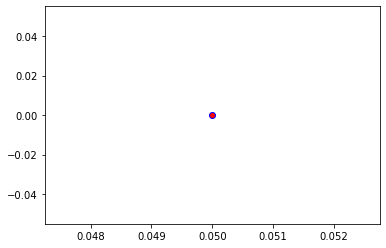

Crafting adversarial images took: 9.635992288589478 seconds 

Images classified as:
000000281687 971 = bubble
000000281693 404 = airliner
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


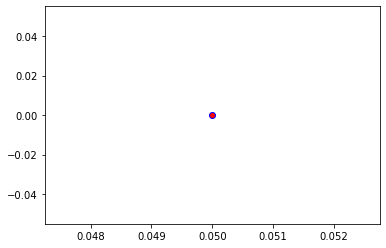

Crafting adversarial images took: 9.499614000320435 seconds 

Images classified as:
000000281754 879 = umbrella
000000281759 879 = umbrella
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


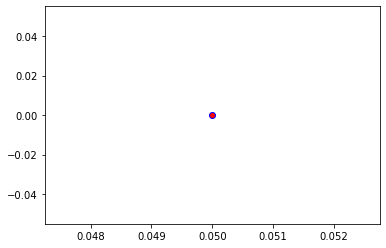

Crafting adversarial images took: 9.538239002227783 seconds 

Images classified as:
000000281929 671 = mountain bike
000000282037 981 = ballplayer
Min values in image-array: 1.3392849 Max values in image-array: 255.0
Min values in image-array: 0.0052520977 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


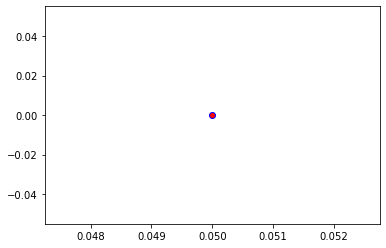

Crafting adversarial images took: 11.53700590133667 seconds 

Images classified as:
000000282046 703 = park bench
000000282296 760 = refrigerator
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


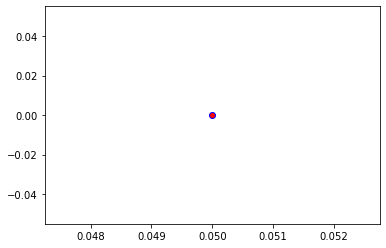

Crafting adversarial images took: 9.496762037277222 seconds 

Images classified as:
000000282298 877 = turnstile
000000282912 355 = llama
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


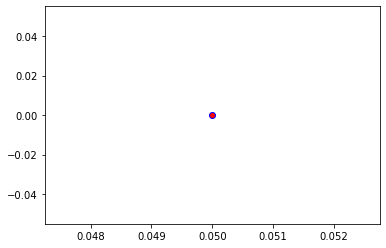

Crafting adversarial images took: 9.912472009658813 seconds 

Images classified as:
000000283037 920 = traffic light
000000283038 919 = street sign
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


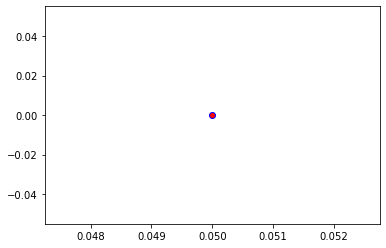

Crafting adversarial images took: 9.911439180374146 seconds 

Images classified as:
000000283070 950 = orange
000000283113 934 = hotdog
Min values in image-array: 0.0 Max values in image-array: 253.82141
Min values in image-array: 0.0 Max values in image-array: 0.9953781
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


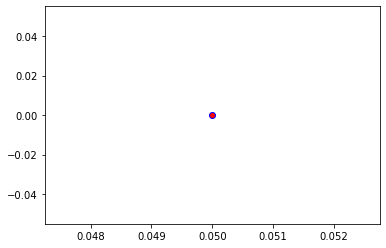

Crafting adversarial images took: 9.528568983078003 seconds 

Images classified as:
000000283268 929 = ice lolly
000000283318 919 = street sign
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


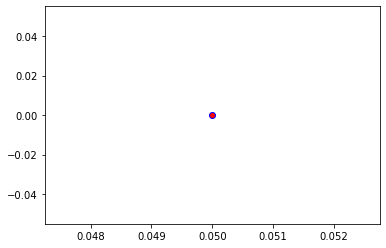

Crafting adversarial images took: 9.443557262420654 seconds 

Images classified as:
000000283412 265 = toy poodle
000000283520 730 = plow
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


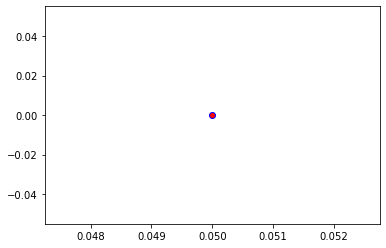

Crafting adversarial images took: 9.7198486328125 seconds 

Images classified as:
000000283717 651 = microwave
000000283785 880 = unicycle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


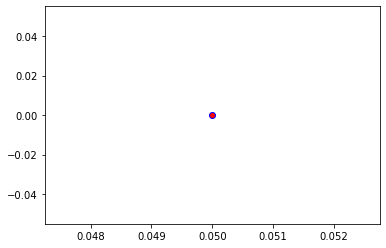

Crafting adversarial images took: 9.868352890014648 seconds 

Images classified as:
000000284106 461 = plate
000000284279 19 = chickadee
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


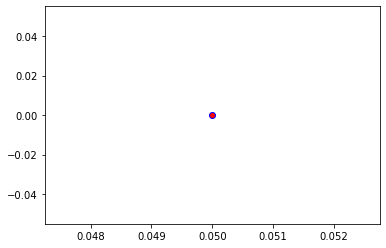

Crafting adversarial images took: 9.754790782928467 seconds 

Images classified as:
000000284282 742 = printer
000000284296 275 = hyena
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


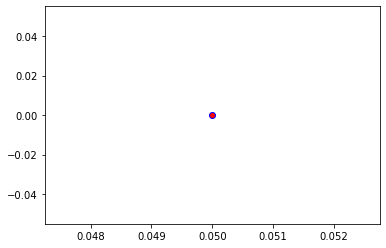

Crafting adversarial images took: 10.663900136947632 seconds 

Images classified as:
000000284445 134 = crane
000000284623 285 = Egyptian cat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


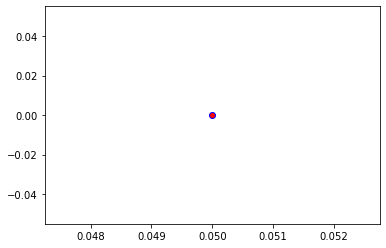

Crafting adversarial images took: 9.619795083999634 seconds 

Images classified as:
000000284698 475 = car mirror
000000284725 555 = fire engine
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


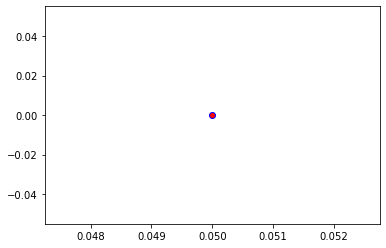

Crafting adversarial images took: 9.854071617126465 seconds 

Images classified as:
000000284743 862 = torch
000000284762 920 = traffic light
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


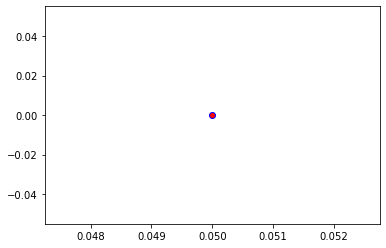

Crafting adversarial images took: 10.636755466461182 seconds 

Images classified as:
000000284764 809 = soup bowl
000000284991 898 = water bottle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


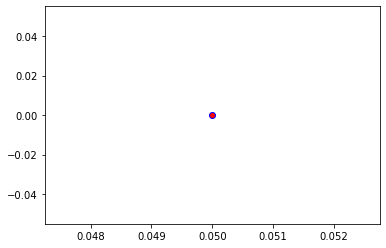

Crafting adversarial images took: 10.40779972076416 seconds 

Images classified as:
000000285047 739 = potter's wheel
000000285349 28 = pot
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


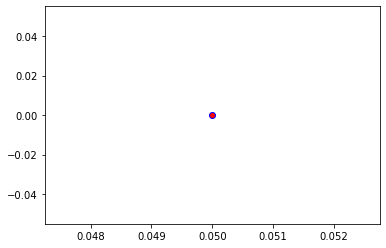

Crafting adversarial images took: 10.296931743621826 seconds 

Images classified as:
000000285788 354 = Arabian camel
000000285894 381 = spider monkey
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


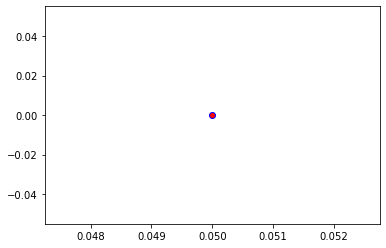

Crafting adversarial images took: 11.700731039047241 seconds 

Images classified as:
000000286182 532 = dining table
000000286422 914 = yawl
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


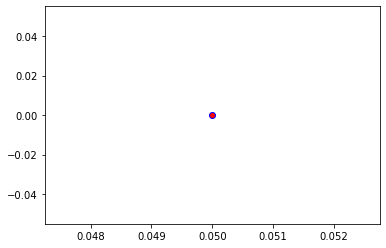

Crafting adversarial images took: 9.497310400009155 seconds 

Images classified as:
000000286458 477 = carpenter's kit
000000286503 386 = African elephant
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


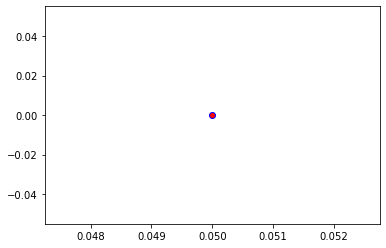

Crafting adversarial images took: 10.540234565734863 seconds 

Images classified as:
000000286507 565 = freight car
000000286523 433 = bathing cap
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


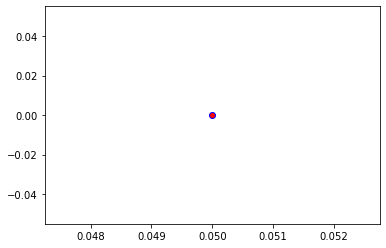

Crafting adversarial images took: 11.776026964187622 seconds 

Images classified as:
000000286553 963 = pizza
000000286660 850 = teddy
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


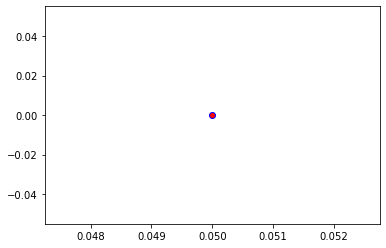

Crafting adversarial images took: 11.90440034866333 seconds 

Images classified as:
000000286708 515 = cowboy hat
000000286849 500 = cliff
Min values in image-array: 0.0 Max values in image-array: 254.86273
Min values in image-array: 0.0 Max values in image-array: 0.9994617
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


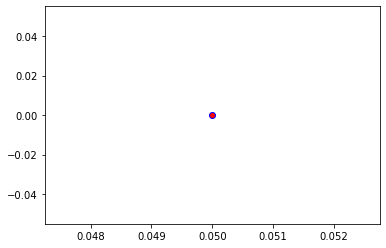

Crafting adversarial images took: 14.90900182723999 seconds 

Images classified as:
000000286907 861 = toilet seat
000000286908 959 = carbonara
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


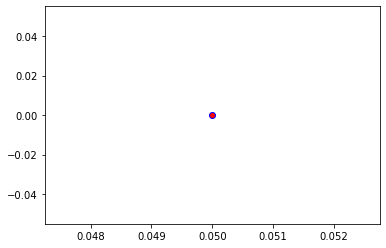

Crafting adversarial images took: 14.263307809829712 seconds 

Images classified as:
000000286994 386 = African elephant
000000287291 704 = parking meter
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


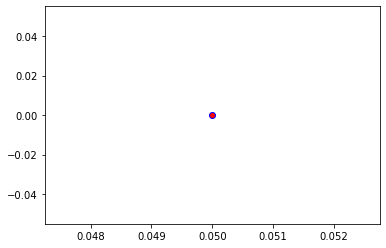

Crafting adversarial images took: 9.713107585906982 seconds 

Images classified as:
000000287347 688 = oscilloscope
000000287527 452 = bonnet
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


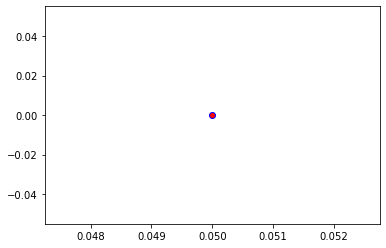

Crafting adversarial images took: 9.949776649475098 seconds 

Images classified as:
000000287545 290 = jaguar
000000287649 620 = laptop
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


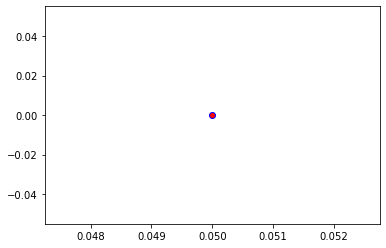

Crafting adversarial images took: 10.046545505523682 seconds 

Images classified as:
000000287667 773 = saltshaker
000000287714 648 = medicine chest
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


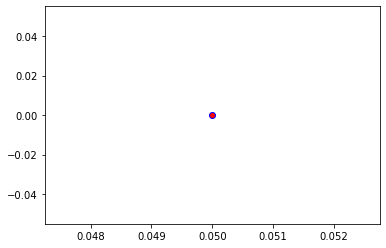

Crafting adversarial images took: 9.902284622192383 seconds 

Images classified as:
000000287874 547 = electric locomotive
000000287959 930 = French loaf
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


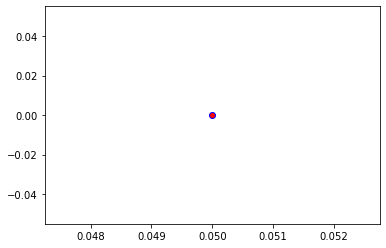

Crafting adversarial images took: 11.53883409500122 seconds 

Images classified as:
000000288042 888 = viaduct
000000288062 861 = toilet seat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


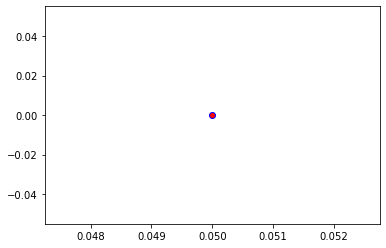

Crafting adversarial images took: 15.384944200515747 seconds 

Images classified as:
000000288391 487 = cellular telephone
000000288430 977 = sandbar
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


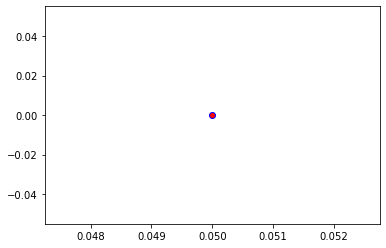

Crafting adversarial images took: 12.55739164352417 seconds 

Images classified as:
000000288584 645 = maypole
000000288685 169 = borzoi
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


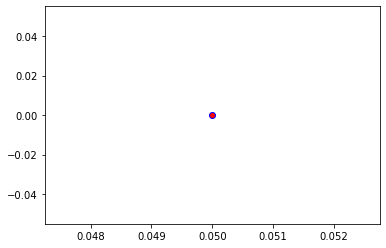

Crafting adversarial images took: 10.42402458190918 seconds 

Images classified as:
000000288762 461 = plate
000000288862 884 = vault
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


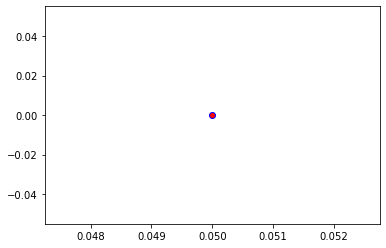

Crafting adversarial images took: 11.171908617019653 seconds 

Images classified as:
000000288882 134 = crane
000000289059 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


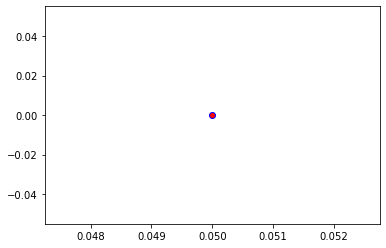

Crafting adversarial images took: 13.206417798995972 seconds 

Images classified as:
000000289222 920 = traffic light
000000289229 617 = lab coat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


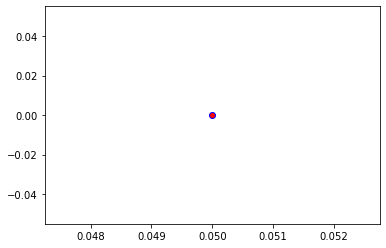

Crafting adversarial images took: 10.703857660293579 seconds 

Images classified as:
000000289343 523 = crutch
000000289393 173 = Ibizan hound
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


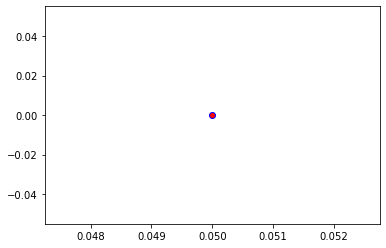

Crafting adversarial images took: 10.755737543106079 seconds 

Images classified as:
000000289415 963 = pizza
000000289417 248 = ski
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


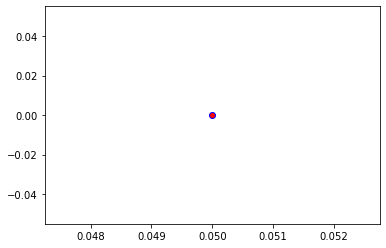

Crafting adversarial images took: 10.87171983718872 seconds 

Images classified as:
000000289516 409 = analog clock
000000289586 26 = gar
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


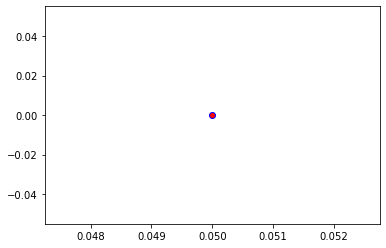

Crafting adversarial images took: 10.805756092071533 seconds 

Images classified as:
000000289594 603 = horse cart
000000289659 352 = impala
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


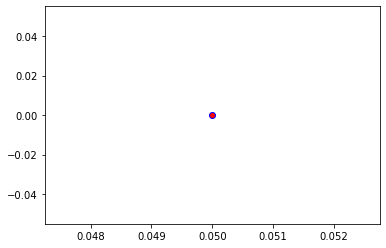

Crafting adversarial images took: 11.061833381652832 seconds 

Images classified as:
000000289702 179 = Staffordshire bullterrier
000000289741 404 = liner
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


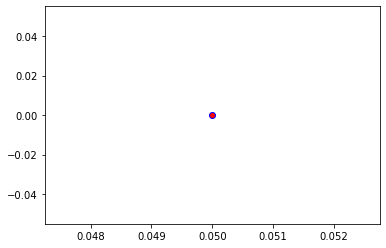

Crafting adversarial images took: 11.022255659103394 seconds 

Images classified as:
000000289938 582 = grocery store
000000289960 978 = seashore
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


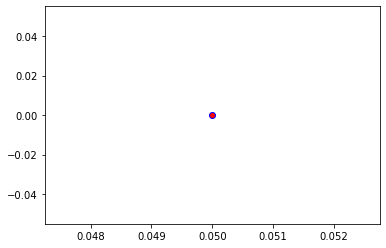

Crafting adversarial images took: 11.975704431533813 seconds 

Images classified as:
000000289992 896 = washbasin
000000290081 950 = orange
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


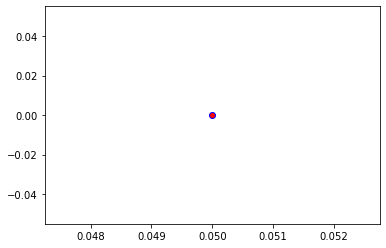

Crafting adversarial images took: 11.581705570220947 seconds 

Images classified as:
000000290163 461 = plate
000000290179 978 = seashore
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


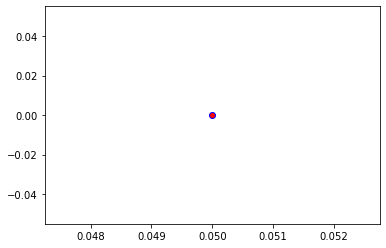

Crafting adversarial images took: 11.395527601242065 seconds 

Images classified as:
000000290248 645 = maypole
000000290293 705 = passenger car
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


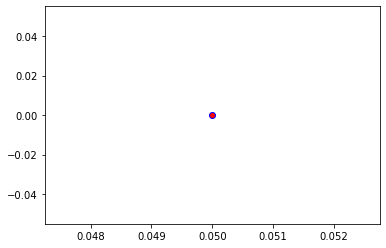

Crafting adversarial images took: 11.710751295089722 seconds 

Images classified as:
000000290592 5 = ram
000000290619 463 = bucket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


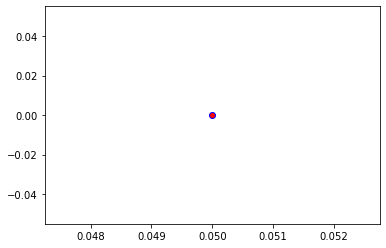

Crafting adversarial images took: 11.325229167938232 seconds 

Images classified as:
000000290768 534 = washer
000000290771 799 = sliding door
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


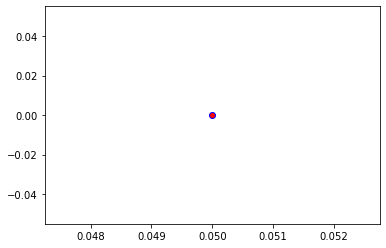

Crafting adversarial images took: 11.484276294708252 seconds 

Images classified as:
000000290833 340 = zebra
000000290843 285 = Egyptian cat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


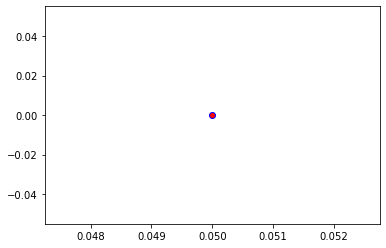

Crafting adversarial images took: 11.534597635269165 seconds 

Images classified as:
000000291490 285 = Egyptian cat
000000291551 416 = balance beam
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


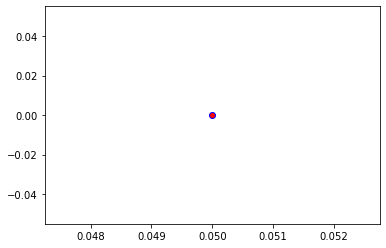

Crafting adversarial images took: 11.461770057678223 seconds 

Images classified as:
000000291619 805 = soccer ball
000000291634 665 = moped
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


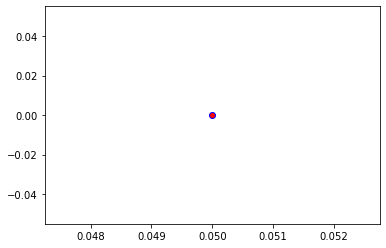

Crafting adversarial images took: 11.133429050445557 seconds 

Images classified as:
000000291664 159 = Rhodesian ridgeback
000000291791 665 = moped
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


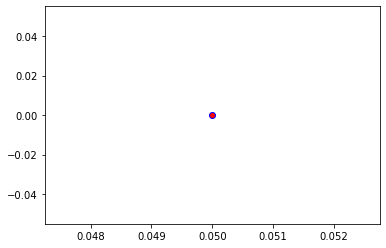

Crafting adversarial images took: 11.643893003463745 seconds 

Images classified as:
000000291861 340 = zebra
000000292005 794 = shower curtain
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


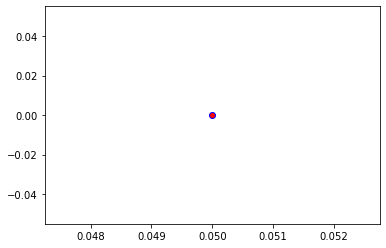

Crafting adversarial images took: 12.430375337600708 seconds 

Images classified as:
000000292024 963 = pizza
000000292060 651 = microwave
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


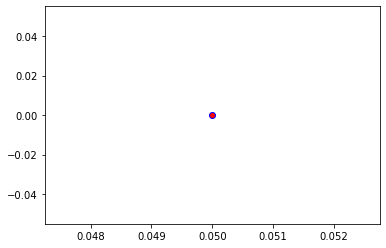

Crafting adversarial images took: 11.732020378112793 seconds 

Images classified as:
000000292082 457 = bow tie
000000292155 879 = umbrella
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


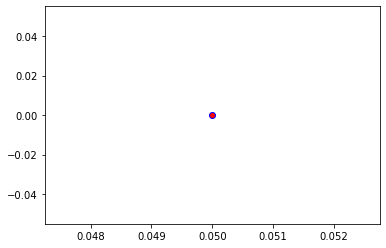

Crafting adversarial images took: 11.529230117797852 seconds 

Images classified as:
000000292225 233 = Bouvier des Flandres
000000292236 862 = torch
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


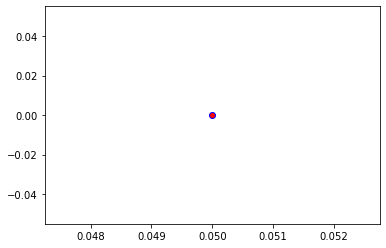

Crafting adversarial images took: 11.472212076187134 seconds 

Images classified as:
000000292330 207 = golden retriever
000000292415 835 = sundial
Min values in image-array: 0.0 Max values in image-array: 254.96428
Min values in image-array: 0.0 Max values in image-array: 0.9998599
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


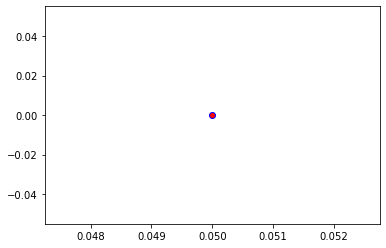

Crafting adversarial images took: 12.14848780632019 seconds 

Images classified as:
000000292446 611 = jigsaw puzzle
000000292456 882 = vacuum
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


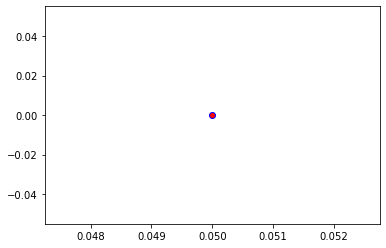

Crafting adversarial images took: 11.778999090194702 seconds 

Images classified as:
000000292488 568 = fur coat
000000292908 142 = dowitcher
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


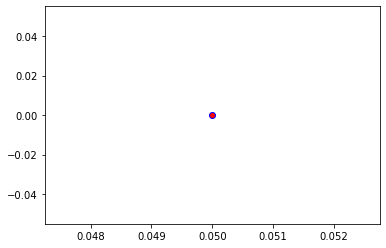

Crafting adversarial images took: 11.53246021270752 seconds 

Images classified as:
000000292997 803 = snowplow
000000293044 962 = meat loaf
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


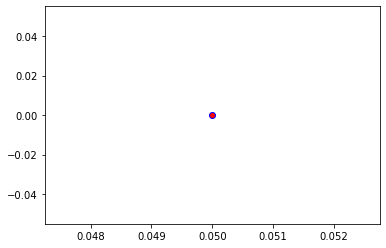

Crafting adversarial images took: 11.14181113243103 seconds 

Images classified as:
000000293071 704 = parking meter
000000293200 645 = maypole
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


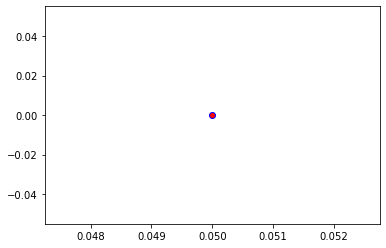

Crafting adversarial images took: 11.188997745513916 seconds 

Images classified as:
000000293245 665 = moped
000000293300 385 = Indian elephant
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


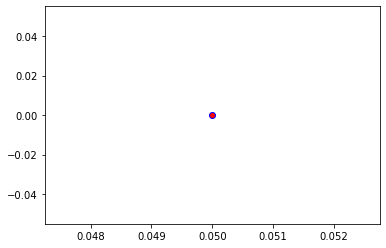

Crafting adversarial images took: 10.704992055892944 seconds 

Images classified as:
000000293324 404 = airliner
000000293390 896 = washbasin
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


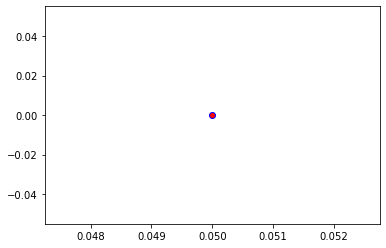

Crafting adversarial images took: 13.003734827041626 seconds 

Images classified as:
000000293474 704 = parking meter
000000293625 678 = neck brace
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


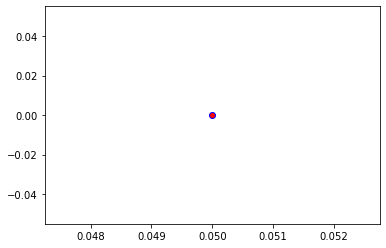

Crafting adversarial images took: 12.322510719299316 seconds 

Images classified as:
000000293794 954 = banana
000000293804 598 = home theater
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


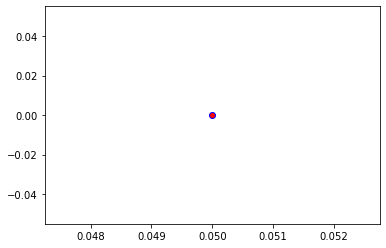

Crafting adversarial images took: 12.64760708808899 seconds 

Images classified as:
000000293858 934 = hotdog
000000294162 681 = notebook
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


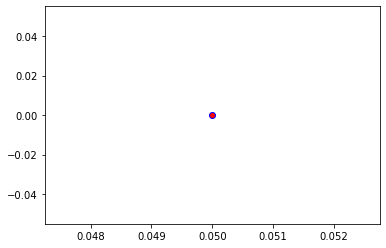

Crafting adversarial images took: 10.525612831115723 seconds 

Images classified as:
000000294163 442 = bell cote
000000294350 617 = lab coat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


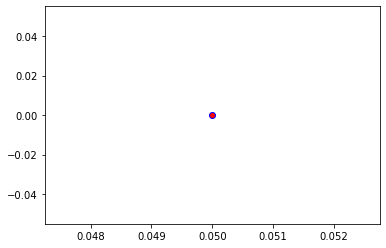

Crafting adversarial images took: 10.663825511932373 seconds 

Images classified as:
000000294695 701 = parachute
000000294783 624 = library
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


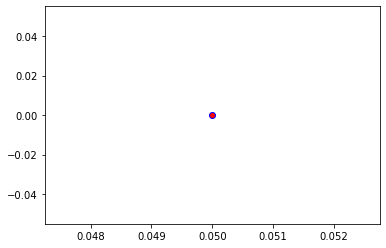

Crafting adversarial images took: 10.586891889572144 seconds 

Images classified as:
000000294831 567 = frying pan
000000294855 413 = rifle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


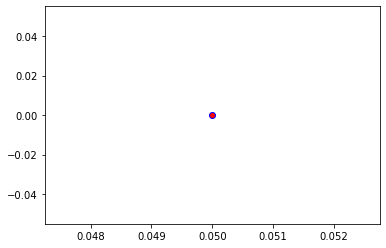

Crafting adversarial images took: 10.66826868057251 seconds 

Images classified as:
000000295138 423 = barber chair
000000295231 5 = ram
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


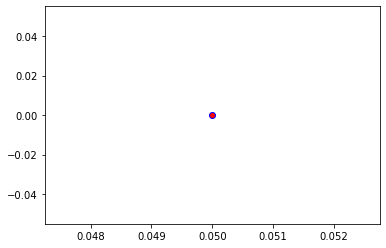

Crafting adversarial images took: 10.352646589279175 seconds 

Images classified as:
000000295316 801 = snorkel
000000295420 675 = moving van
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


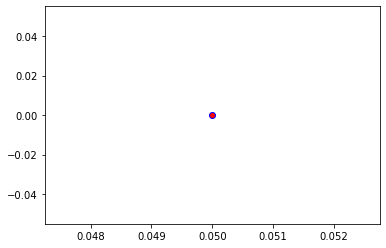

Crafting adversarial images took: 10.29818844795227 seconds 

Images classified as:
000000295478 203 = West Highland white terrier
000000295713 843 = swing
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


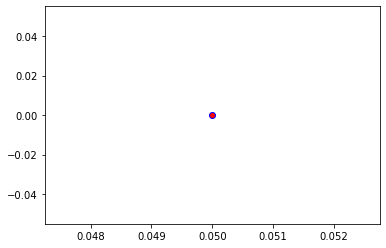

Crafting adversarial images took: 10.48376727104187 seconds 

Images classified as:
000000295797 442 = bell cote
000000295809 920 = traffic light
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


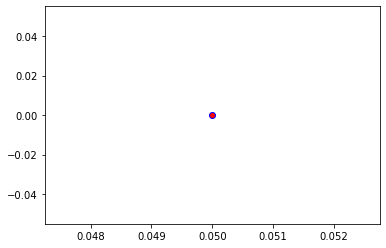

Crafting adversarial images took: 11.210904598236084 seconds 

Images classified as:
000000296222 813 = spatula
000000296224 874 = trolleybus
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


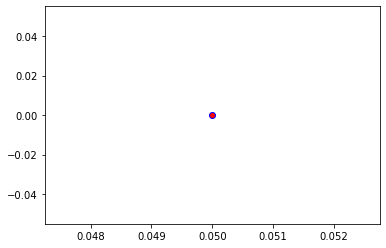

Crafting adversarial images took: 10.930377006530762 seconds 

Images classified as:
000000296231 526 = desk
000000296284 905 = window shade
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


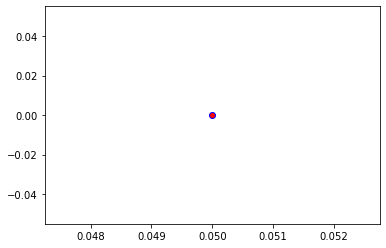

Crafting adversarial images took: 10.827422142028809 seconds 

Images classified as:
000000296317 979 = valley
000000296634 962 = meat loaf
Min values in image-array: 0.0 Max values in image-array: 232.72545
Min values in image-array: 0.0 Max values in image-array: 0.9126488
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


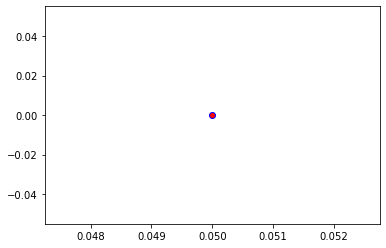

Crafting adversarial images took: 10.52871322631836 seconds 

Images classified as:
000000296649 665 = moped
000000296657 843 = swing
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


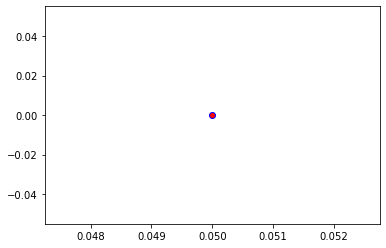

Crafting adversarial images took: 10.470160484313965 seconds 

Images classified as:
000000296969 275 = hyena
000000297022 586 = half track
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


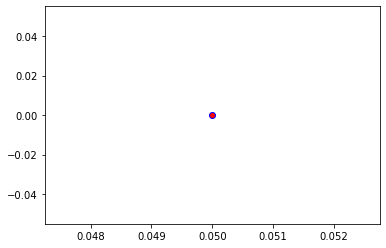

Crafting adversarial images took: 10.547443389892578 seconds 

Images classified as:
000000297084 762 = restaurant
000000297085 598 = home theater
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


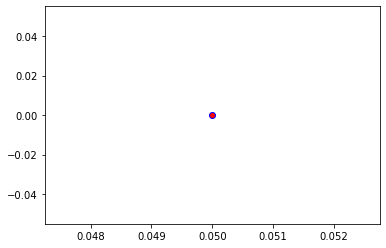

Crafting adversarial images took: 10.690314769744873 seconds 

Images classified as:
000000297147 670 = motor scooter
000000297343 421 = bannister
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


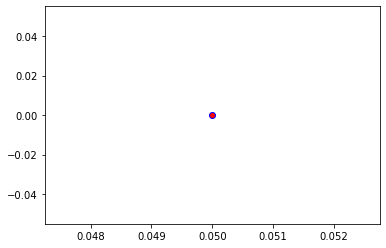

Crafting adversarial images took: 10.524842739105225 seconds 

Images classified as:
000000297353 546 = electric guitar
000000297396 960 = chocolate sauce
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


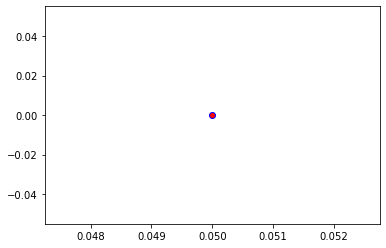

Crafting adversarial images took: 10.293017148971558 seconds 

Images classified as:
000000297427 933 = cheeseburger
000000297562 424 = barbershop
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


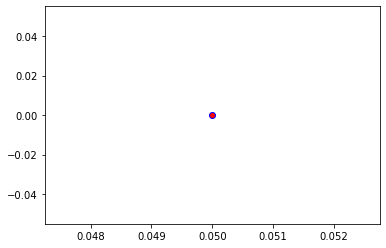

Crafting adversarial images took: 10.431698083877563 seconds 

Images classified as:
000000297578 639 = suit
000000297595 625 = lifeboat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


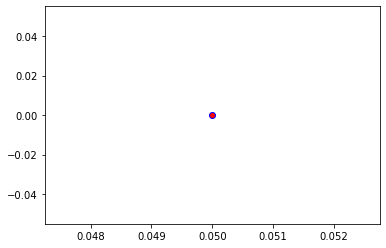

Crafting adversarial images took: 10.892418384552002 seconds 

Images classified as:
000000297681 919 = street sign
000000297698 895 = warplane
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


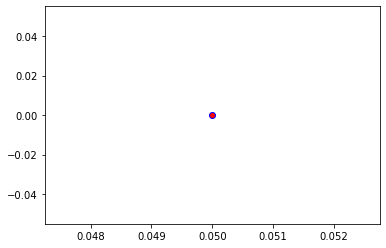

Crafting adversarial images took: 11.771475315093994 seconds 

Images classified as:
000000297830 232 = Border collie
000000298251 176 = gazelle
Min values in image-array: 0.0 Max values in image-array: 254.96014
Min values in image-array: 0.0 Max values in image-array: 0.9998437
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


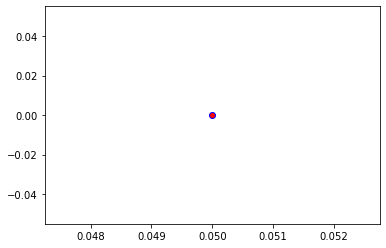

Crafting adversarial images took: 10.804096460342407 seconds 

Images classified as:
000000298396 651 = microwave
000000298697 9 = ostrich
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


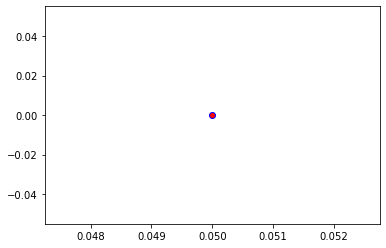

Crafting adversarial images took: 10.534446477890015 seconds 

Images classified as:
000000298738 388 = giant panda
000000298904 883 = vase
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


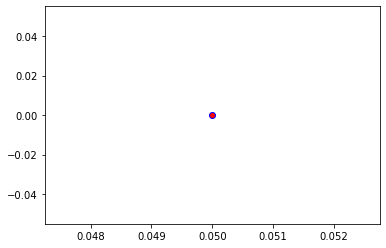

Crafting adversarial images took: 10.600208044052124 seconds 

Images classified as:
000000298994 582 = grocery store
000000299355 937 = broccoli
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


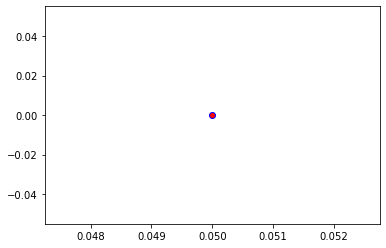

Crafting adversarial images took: 10.522908210754395 seconds 

Images classified as:
000000299553 701 = parachute
000000299609 354 = Arabian camel
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


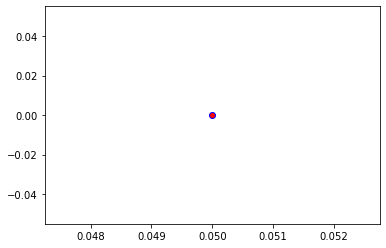

Crafting adversarial images took: 10.609509468078613 seconds 

Images classified as:
000000299720 104 = wallaby
000000299887 428 = barrow
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


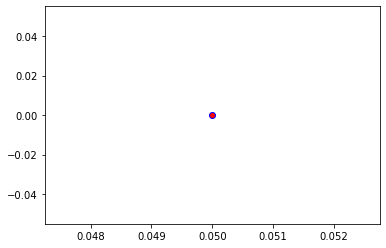

Crafting adversarial images took: 10.40131163597107 seconds 

Images classified as:
000000300039 585 = hair spray
000000300155 94 = hummingbird
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


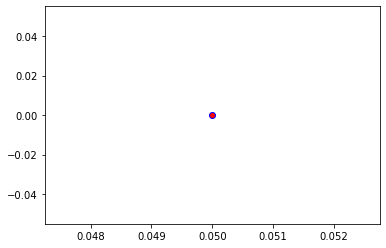

Crafting adversarial images took: 10.485286951065063 seconds 

Images classified as:
000000300233 666 = mortar
000000300276 411 = apron
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


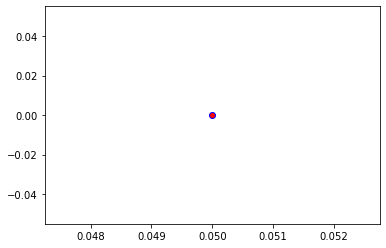

Crafting adversarial images took: 10.286160707473755 seconds 

Images classified as:
000000300341 731 = plunger
000000300659 895 = warplane
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


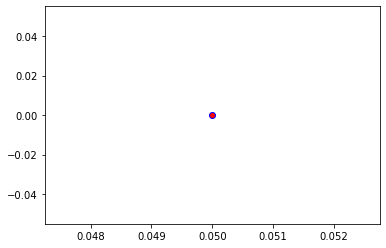

Crafting adversarial images took: 10.575343132019043 seconds 

Images classified as:
000000300842 404 = airliner
000000300913 284 = Siamese cat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


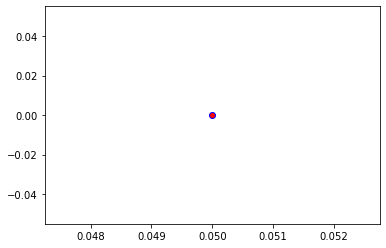

Crafting adversarial images took: 10.649697303771973 seconds 

Images classified as:
000000301061 583 = guillotine
000000301135 703 = park bench
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


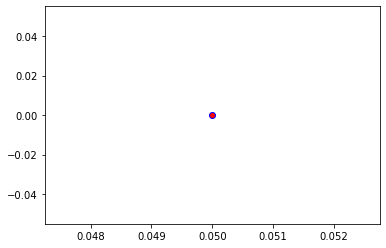

Crafting adversarial images took: 11.462959289550781 seconds 

Images classified as:
000000301376 920 = traffic light
000000301421 526 = desk
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


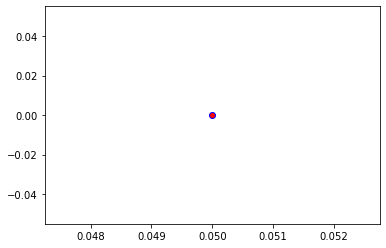

Crafting adversarial images took: 10.53713321685791 seconds 

Images classified as:
000000301563 248 = ski
000000301718 461 = plate
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


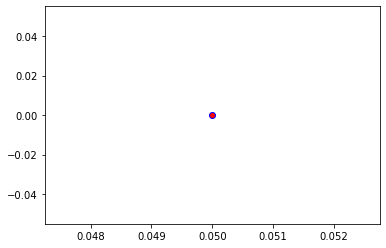

Crafting adversarial images took: 10.769092798233032 seconds 

Images classified as:
000000301867 879 = umbrella
000000301981 339 = sorrel
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


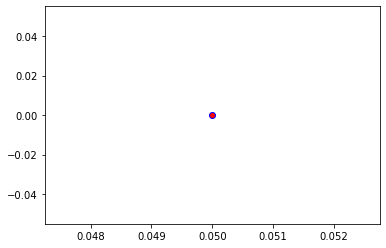

Crafting adversarial images took: 10.549956321716309 seconds 

Images classified as:
000000302030 526 = desk
000000302107 429 = baseball
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


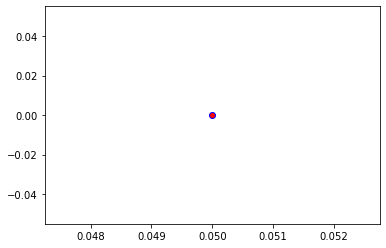

Crafting adversarial images took: 10.616852045059204 seconds 

Images classified as:
000000302165 54 = hog
000000302452 285 = Egyptian cat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


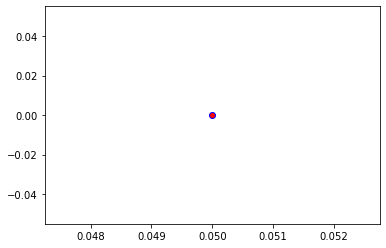

Crafting adversarial images took: 10.577295780181885 seconds 

Images classified as:
000000302536 731 = plunger
000000302760 896 = washbasin
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


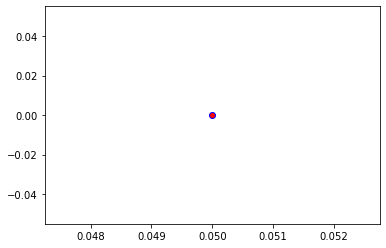

Crafting adversarial images took: 10.227204322814941 seconds 

Images classified as:
000000302882 759 = reflex camera
000000302990 693 = paddle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


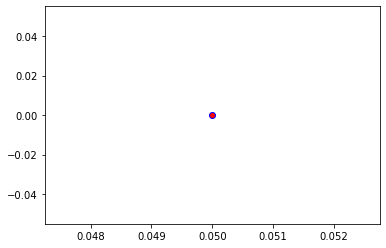

Crafting adversarial images took: 10.23143982887268 seconds 

Images classified as:
000000303305 874 = trolleybus
000000303499 37 = ox
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


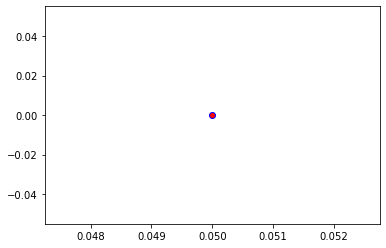

Crafting adversarial images took: 10.699029922485352 seconds 

Images classified as:
000000303566 582 = grocery store
000000303653 339 = sorrel
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


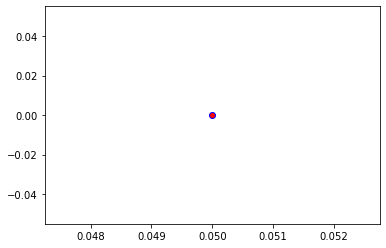

Crafting adversarial images took: 10.5285804271698 seconds 

Images classified as:
000000303713 416 = balance beam
000000303818 874 = trolleybus
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


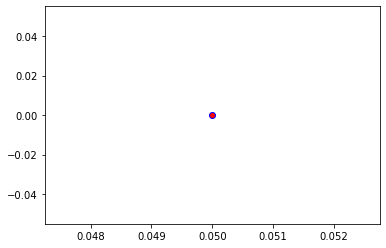

Crafting adversarial images took: 10.644790887832642 seconds 

Images classified as:
000000303863 547 = electric locomotive
000000303893 929 = ice lolly
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


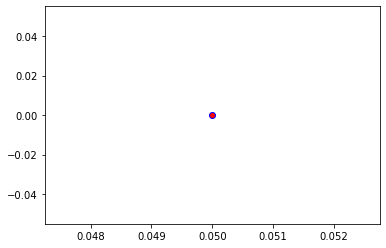

Crafting adversarial images took: 11.387935876846313 seconds 

Images classified as:
000000303908 488 = chain
000000304180 862 = torch
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


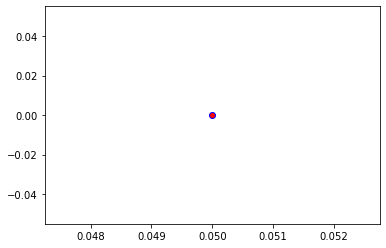

Crafting adversarial images took: 10.499306440353394 seconds 

Images classified as:
000000304291 730 = plow
000000304365 829 = streetcar
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


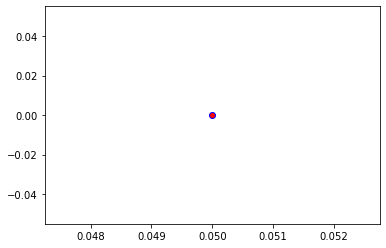

Crafting adversarial images took: 10.713794231414795 seconds 

Images classified as:
000000304396 442 = bell cote
000000304404 981 = ballplayer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


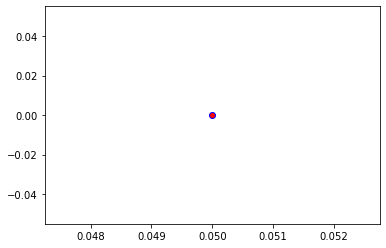

Crafting adversarial images took: 10.515332698822021 seconds 

Images classified as:
000000304545 636 = mailbag
000000304560 285 = Egyptian cat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


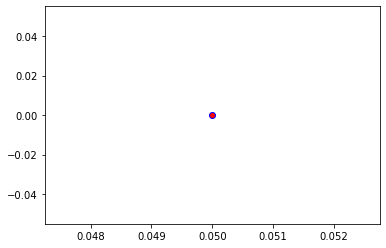

Crafting adversarial images took: 10.644080400466919 seconds 

Images classified as:
000000304812 978 = seashore
000000304817 491 = chain saw
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


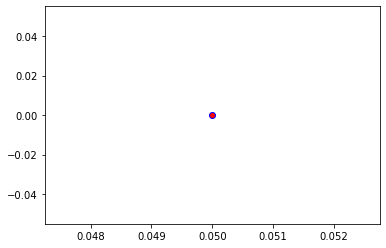

Crafting adversarial images took: 10.904613494873047 seconds 

Images classified as:
000000304984 930 = French loaf
000000305309 463 = bucket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


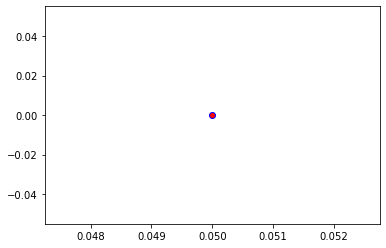

Crafting adversarial images took: 10.2575523853302 seconds 

Images classified as:
000000305317 701 = parachute
000000305343 504 = coffee mug
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


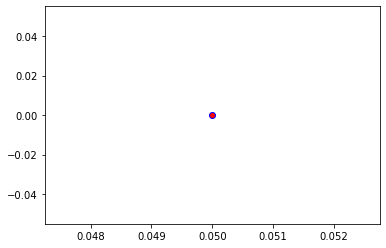

Crafting adversarial images took: 10.560797929763794 seconds 

Images classified as:
000000305609 461 = plate
000000305695 703 = park bench
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


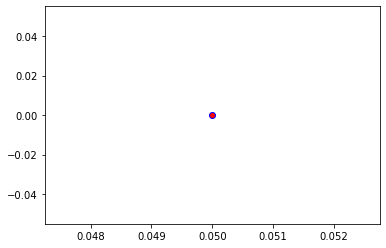

Crafting adversarial images took: 10.522154331207275 seconds 

Images classified as:
000000306136 654 = minibus
000000306139 620 = laptop
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


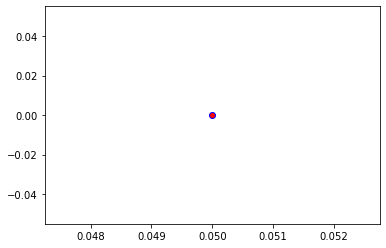

Crafting adversarial images took: 10.706104516983032 seconds 

Images classified as:
000000306437 412 = ashcan
000000306582 355 = llama
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


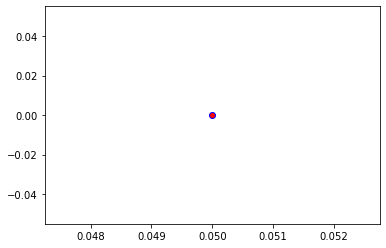

Crafting adversarial images took: 10.931823253631592 seconds 

Images classified as:
000000306700 963 = pizza
000000306733 435 = bathtub
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


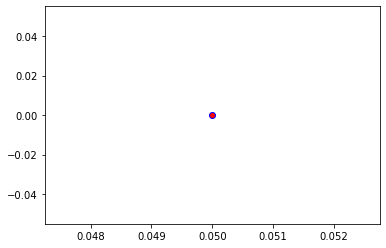

Crafting adversarial images took: 10.979944467544556 seconds 

Images classified as:
000000306893 829 = streetcar
000000307074 920 = traffic light
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


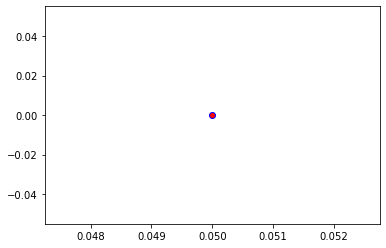

Crafting adversarial images took: 10.729217767715454 seconds 

Images classified as:
000000307145 526 = desk
000000307172 963 = pizza
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


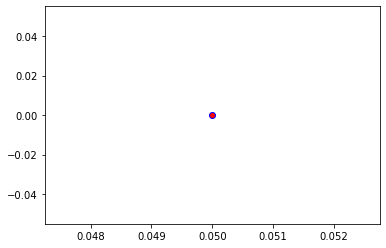

Crafting adversarial images took: 10.43987512588501 seconds 

Images classified as:
000000307598 547 = electric locomotive
000000307658 294 = brown bear
Min values in image-array: 0.0 Max values in image-array: 254.87906
Min values in image-array: 0.0 Max values in image-array: 0.9995257
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


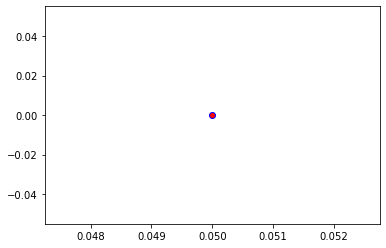

Crafting adversarial images took: 10.477518796920776 seconds 

Images classified as:
000000308165 880 = unicycle
000000308193 442 = bell cote
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


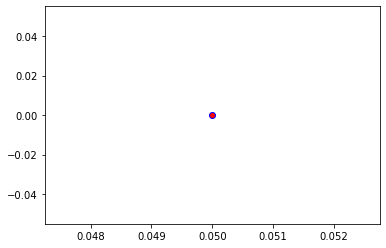

Crafting adversarial images took: 10.461613893508911 seconds 

Images classified as:
000000308328 675 = moving van
000000308391 557 = flagpole
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


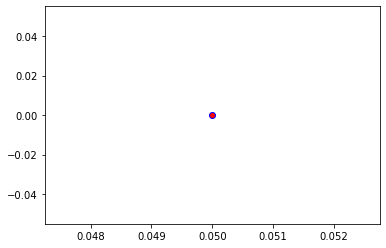

Crafting adversarial images took: 10.261062860488892 seconds 

Images classified as:
000000308394 831 = studio couch
000000308430 909 = wok
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


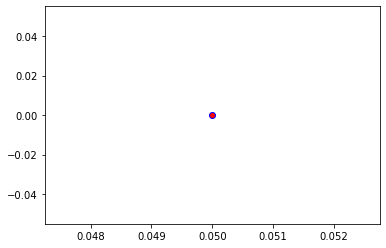

Crafting adversarial images took: 10.224347829818726 seconds 

Images classified as:
000000308466 435 = bathtub
000000308476 296 = ice bear
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


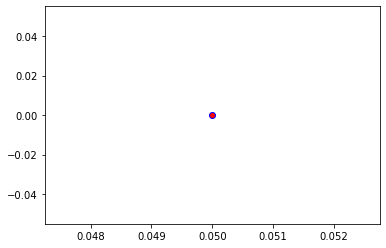

Crafting adversarial images took: 10.692195415496826 seconds 

Images classified as:
000000308531 442 = bell cote
000000308545 787 = shield
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


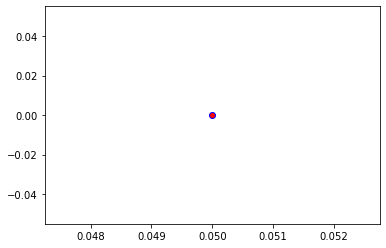

Crafting adversarial images took: 10.428290128707886 seconds 

Images classified as:
000000308587 978 = seashore
000000308631 665 = moped
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


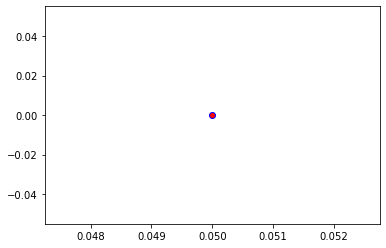

Crafting adversarial images took: 10.507041215896606 seconds 

Images classified as:
000000308753 500 = cliff dwelling
000000308793 140 = alp
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


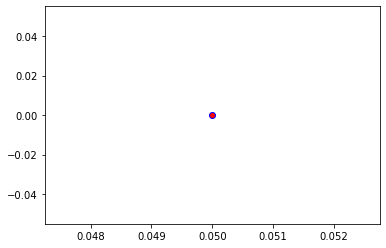

Crafting adversarial images took: 12.13148546218872 seconds 

Images classified as:
000000308799 548 = entertainment center
000000309173 919 = street sign
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


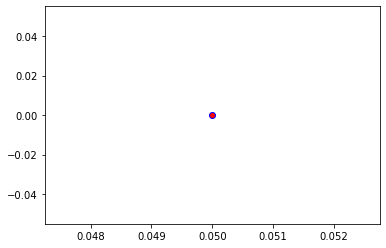

Crafting adversarial images took: 10.468262910842896 seconds 

Images classified as:
000000309391 829 = streetcar
000000309452 95 = jacamar
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


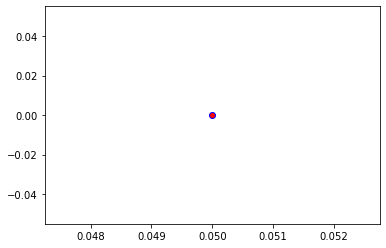

Crafting adversarial images took: 10.507874965667725 seconds 

Images classified as:
000000309467 248 = ski
000000309484 225 = malinois
Min values in image-array: 0.0 Max values in image-array: 251.40942
Min values in image-array: 0.0 Max values in image-array: 0.9859193
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


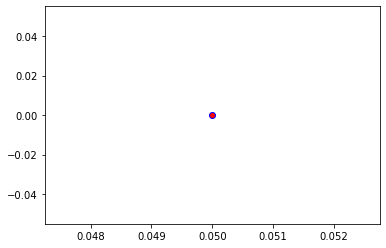

Crafting adversarial images took: 10.504796028137207 seconds 

Images classified as:
000000309495 861 = toilet seat
000000309655 248 = ski
Min values in image-array: 1.6348684e-05 Max values in image-array: 255.0
Min values in image-array: 6.4112484e-08 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


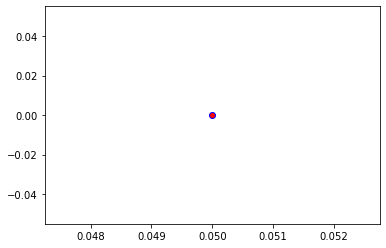

Crafting adversarial images took: 10.570928573608398 seconds 

Images classified as:
000000309678 962 = meat loaf
000000309938 259 = Pomeranian
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


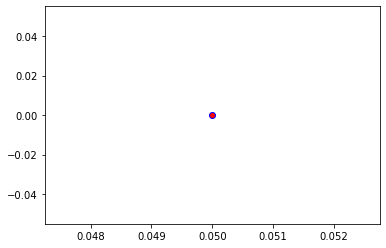

Crafting adversarial images took: 10.352693796157837 seconds 

Images classified as:
000000309964 672 = mountain tent
000000310072 703 = park bench
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


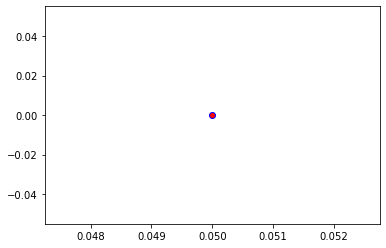

Crafting adversarial images took: 15.57269549369812 seconds 

Images classified as:
000000310200 962 = meat loaf
000000310622 919 = street sign
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


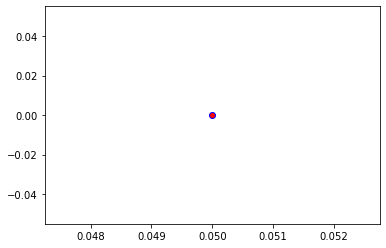

Crafting adversarial images took: 13.541009426116943 seconds 

Images classified as:
000000310862 906 = Windsor tie
000000310980 620 = laptop
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


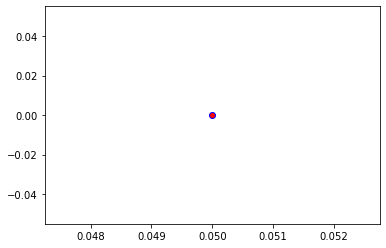

Crafting adversarial images took: 13.50880742073059 seconds 

Images classified as:
000000311002 981 = ballplayer
000000311081 794 = shower curtain
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


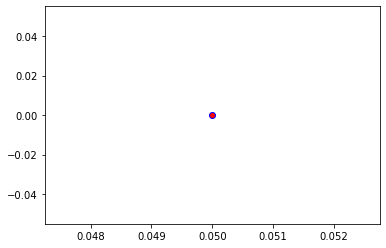

Crafting adversarial images took: 14.112409353256226 seconds 

Images classified as:
000000311180 59 = vine snake
000000311190 208 = Labrador retriever
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


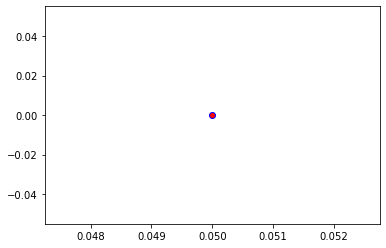

Crafting adversarial images took: 16.11053729057312 seconds 

Images classified as:
000000311295 343 = warthog
000000311303 504 = coffee mug
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


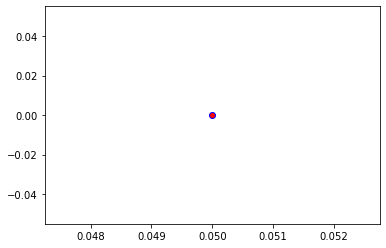

Crafting adversarial images took: 14.247262239456177 seconds 

Images classified as:
000000311392 37 = ox
000000311394 929 = ice lolly
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


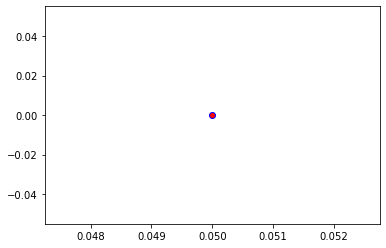

Crafting adversarial images took: 14.365275621414185 seconds 

Images classified as:
000000311518 472 = canoe
000000311789 285 = Egyptian cat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


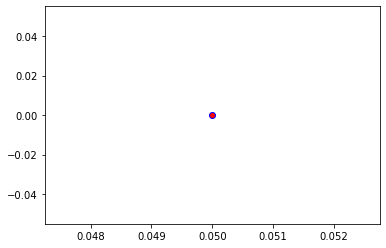

Crafting adversarial images took: 15.573981046676636 seconds 

Images classified as:
000000311883 565 = freight car
000000311909 874 = trolleybus
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


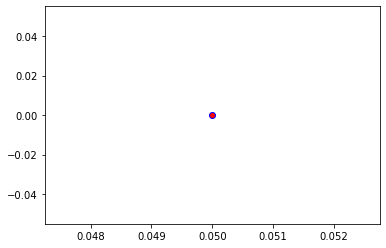

Crafting adversarial images took: 14.878148317337036 seconds 

Images classified as:
000000311928 429 = baseball
000000311950 116 = chiton
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


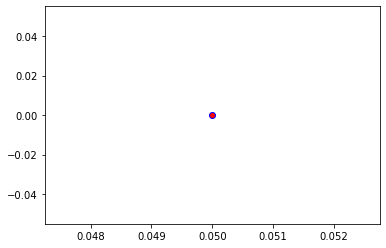

Crafting adversarial images took: 14.024971961975098 seconds 

Images classified as:
000000312192 963 = pizza
000000312213 620 = laptop
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


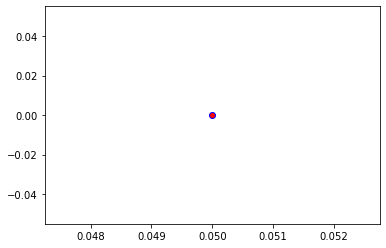

Crafting adversarial images took: 14.13190746307373 seconds 

Images classified as:
000000312237 978 = seashore
000000312263 498 = palace
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


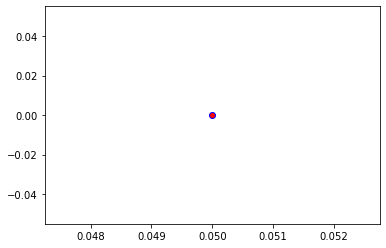

Crafting adversarial images took: 14.705312728881836 seconds 

Images classified as:
000000312278 765 = rocking chair
000000312340 250 = Siberian husky
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


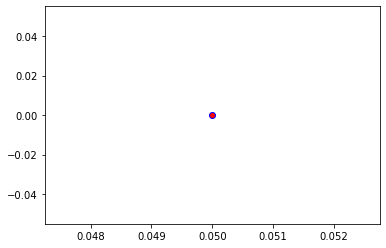

Crafting adversarial images took: 14.708904504776001 seconds 

Images classified as:
000000312406 898 = water bottle
000000312421 732 = Polaroid camera
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


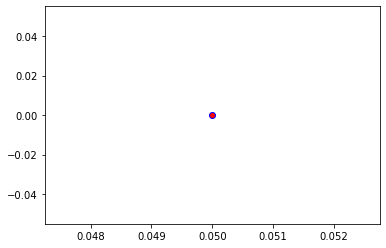

Crafting adversarial images took: 14.502070903778076 seconds 

Images classified as:
000000312489 977 = sandbar
000000312549 919 = street sign
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


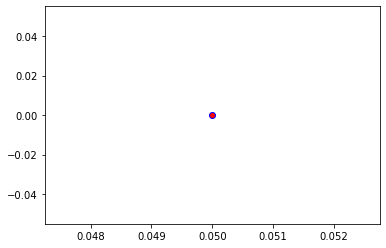

Crafting adversarial images took: 14.065058469772339 seconds 

Images classified as:
000000312552 589 = hand blower
000000312586 295 = American black bear
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


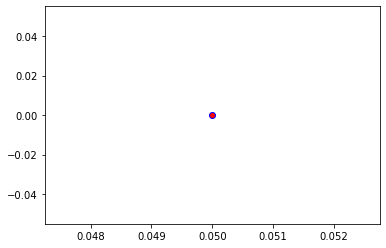

Crafting adversarial images took: 14.267750024795532 seconds 

Images classified as:
000000312720 701 = parachute
000000313034 678 = neck brace
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


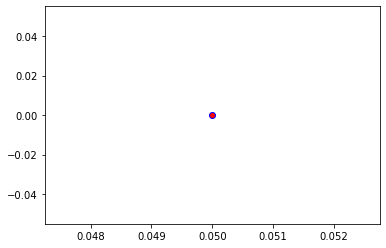

Crafting adversarial images took: 12.60606336593628 seconds 

Images classified as:
000000313130 760 = refrigerator
000000313182 874 = trolleybus
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


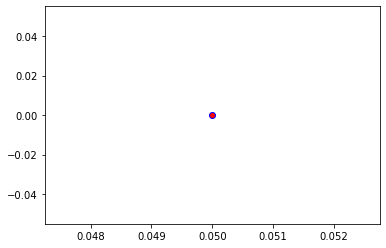

Crafting adversarial images took: 13.76492953300476 seconds 

Images classified as:
000000313454 854 = theater curtain
000000313562 934 = hotdog
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


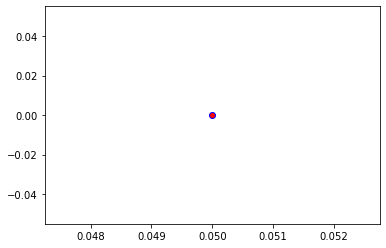

Crafting adversarial images took: 13.779621124267578 seconds 

Images classified as:
000000313588 646 = maze
000000313783 962 = meat loaf
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


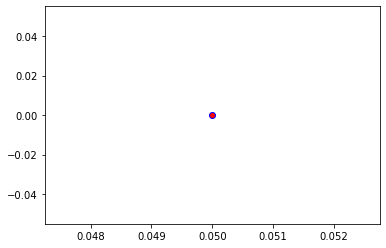

Crafting adversarial images took: 11.76071548461914 seconds 

Images classified as:
000000314034 347 = bison
000000314177 652 = military uniform
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


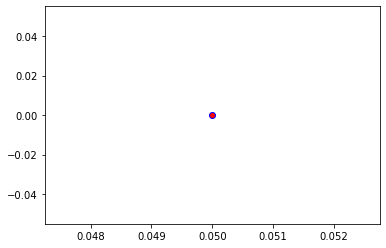

Crafting adversarial images took: 11.453718662261963 seconds 

Images classified as:
000000314182 937 = broccoli
000000314251 682 = obelisk
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


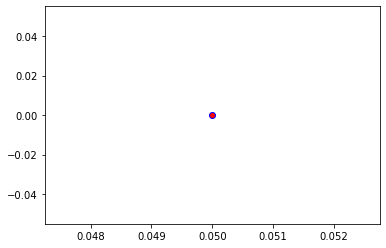

Crafting adversarial images took: 10.529000759124756 seconds 

Images classified as:
000000314264 478 = carton
000000314294 385 = Indian elephant
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


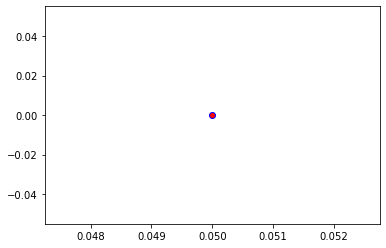

Crafting adversarial images took: 10.421687364578247 seconds 

Images classified as:
000000314541 703 = park bench
000000314709 248 = ski
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


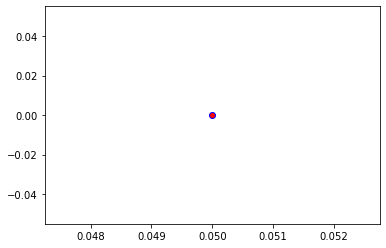

Crafting adversarial images took: 10.48149824142456 seconds 

Images classified as:
000000314914 919 = street sign
000000315001 354 = Arabian camel
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


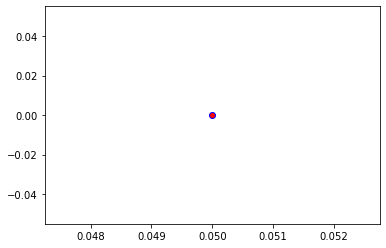

Crafting adversarial images took: 10.559862613677979 seconds 

Images classified as:
000000315187 874 = trolleybus
000000315219 512 = corkscrew
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


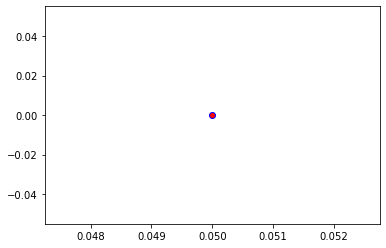

Crafting adversarial images took: 10.789640665054321 seconds 

Images classified as:
000000315257 17 = jay
000000315450 874 = trolleybus
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


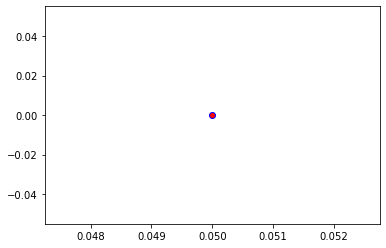

Crafting adversarial images took: 9.419001817703247 seconds 

Images classified as:
000000315492 731 = plunger
000000316015 527 = desktop computer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


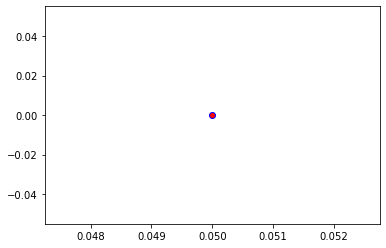

Crafting adversarial images took: 9.59068489074707 seconds 

Images classified as:
000000316054 820 = steam locomotive
000000316404 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


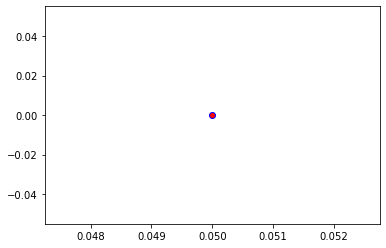

Crafting adversarial images took: 9.51442837715149 seconds 

Images classified as:
000000316666 498 = cinema
000000317024 340 = zebra
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


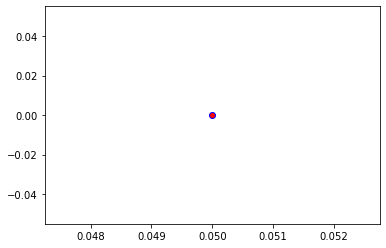

Crafting adversarial images took: 9.474693059921265 seconds 

Images classified as:
000000317433 730 = plow
000000317999 520 = crib
Min values in image-array: 0.0401783 Max values in image-array: 255.0
Min values in image-array: 0.00015756195 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


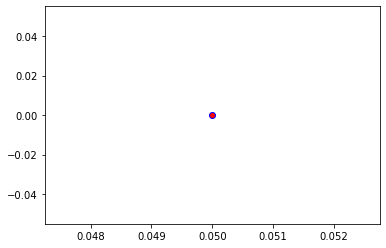

Crafting adversarial images took: 9.629898071289062 seconds 

Images classified as:
000000318080 294 = brown bear
000000318114 930 = French loaf
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


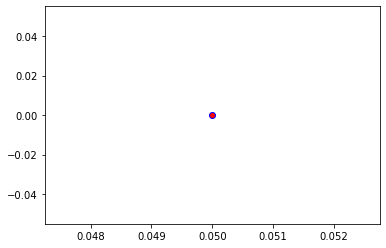

Crafting adversarial images took: 10.382184505462646 seconds 

Images classified as:
000000318138 680 = nipple
000000318238 214 = Gordon setter
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


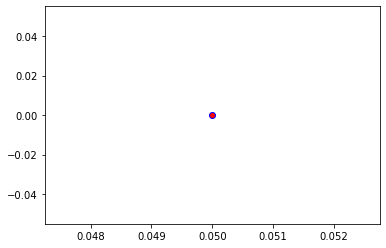

Crafting adversarial images took: 9.616795063018799 seconds 

Images classified as:
000000318455 415 = bakery
000000318908 153 = Maltese dog
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


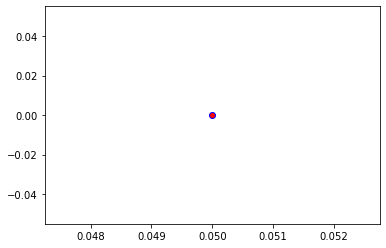

Crafting adversarial images took: 9.674997568130493 seconds 

Images classified as:
000000319100 697 = pajama
000000319184 768 = rugby ball
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


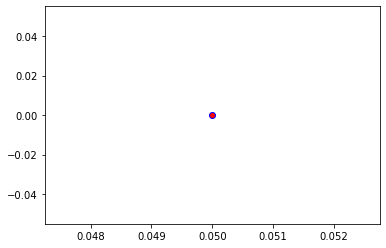

Crafting adversarial images took: 9.5114905834198 seconds 

Images classified as:
000000319369 879 = umbrella
000000319534 705 = passenger car
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


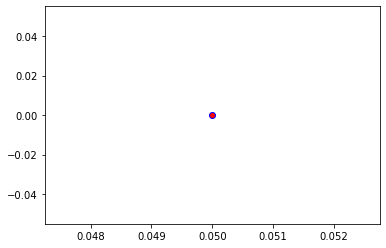

Crafting adversarial images took: 9.421913146972656 seconds 

Images classified as:
000000319607 920 = traffic light
000000319617 934 = hotdog
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


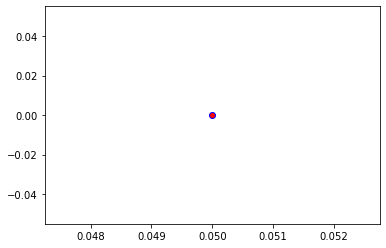

Crafting adversarial images took: 9.331899881362915 seconds 

Images classified as:
000000319696 651 = microwave
000000319721 339 = sorrel
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


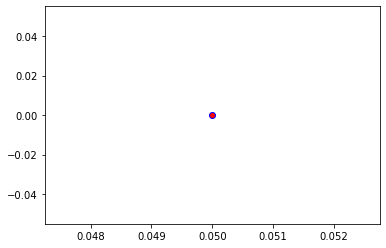

Crafting adversarial images took: 9.374170064926147 seconds 

Images classified as:
000000319935 905 = window shade
000000320232 498 = cinema
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


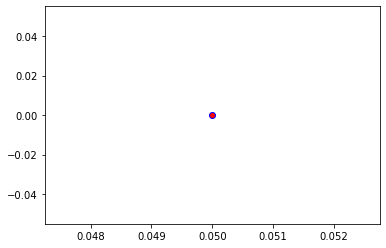

Crafting adversarial images took: 9.36497187614441 seconds 

Images classified as:
000000320425 293 = cheetah
000000320490 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


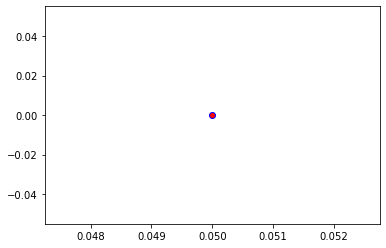

Crafting adversarial images took: 9.528082609176636 seconds 

Images classified as:
000000320554 104 = wallaby
000000320632 340 = zebra
Min values in image-array: 0.5102601 Max values in image-array: 255.0
Min values in image-array: 0.0020010201 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


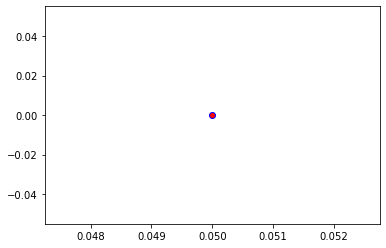

Crafting adversarial images took: 9.27137303352356 seconds 

Images classified as:
000000320642 523 = crutch
000000320664 935 = mashed potato
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


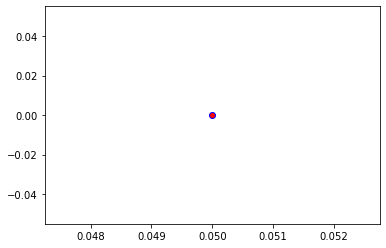

Crafting adversarial images took: 9.340423822402954 seconds 

Images classified as:
000000320696 792 = shovel
000000320706 505 = coffeepot
Min values in image-array: 0.0 Max values in image-array: 254.92853
Min values in image-array: 0.0 Max values in image-array: 0.99971974
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


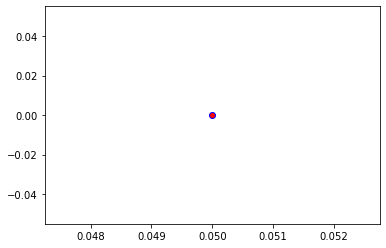

Crafting adversarial images took: 9.265922546386719 seconds 

Images classified as:
000000320743 385 = Indian elephant
000000321118 620 = laptop
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


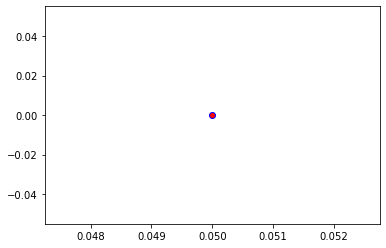

Crafting adversarial images took: 10.369623899459839 seconds 

Images classified as:
000000321214 965 = burrito
000000321333 850 = teddy
Min values in image-array: 0.0 Max values in image-array: 254.98979
Min values in image-array: 0.0 Max values in image-array: 0.99995995
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


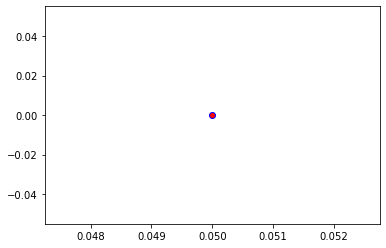

Crafting adversarial images took: 9.473751306533813 seconds 

Images classified as:
000000321557 535 = disk brake
000000321790 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


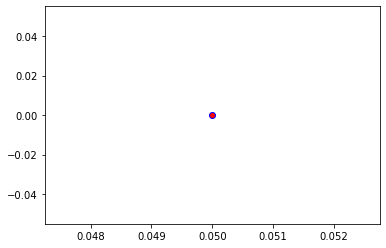

Crafting adversarial images took: 10.236067056655884 seconds 

Images classified as:
000000321887 5 = ram
000000322163 739 = potter's wheel
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


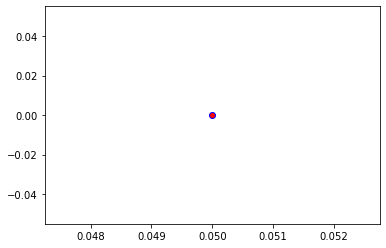

Crafting adversarial images took: 9.447596788406372 seconds 

Images classified as:
000000322211 932 = pretzel
000000322352 532 = dining table
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


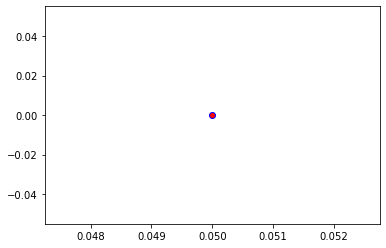

Crafting adversarial images took: 9.383436679840088 seconds 

Images classified as:
000000322429 495 = china cabinet
000000322574 933 = cheeseburger
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


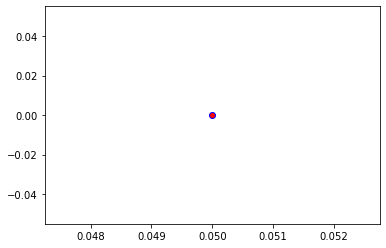

Crafting adversarial images took: 9.629512548446655 seconds 

Images classified as:
000000322610 879 = umbrella
000000322724 248 = ski
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


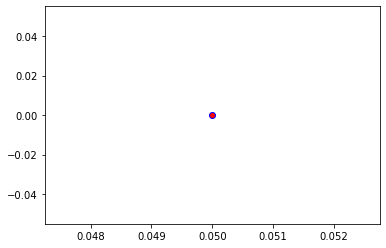

Crafting adversarial images took: 9.783828735351562 seconds 

Images classified as:
000000322829 703 = park bench
000000322844 850 = teddy
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


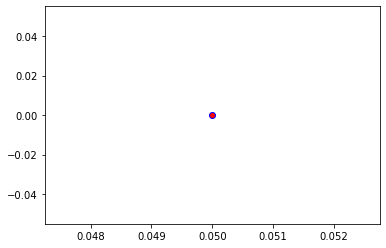

Crafting adversarial images took: 9.816193342208862 seconds 

Images classified as:
000000322864 324 = cab
000000322895 478 = carton
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


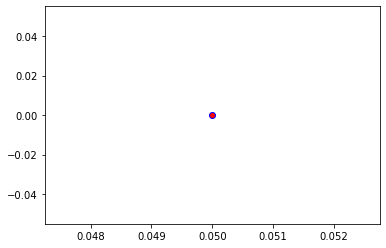

Crafting adversarial images took: 15.749422311782837 seconds 

Images classified as:
000000322944 850 = teddy
000000322959 551 = face powder
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


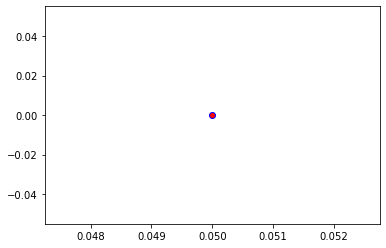

Crafting adversarial images took: 13.177865743637085 seconds 

Images classified as:
000000322968 437 = beacon
000000323151 963 = pizza
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


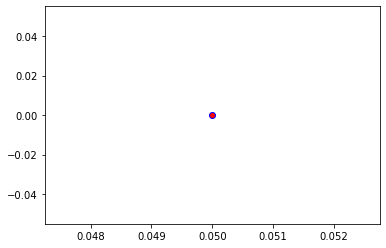

Crafting adversarial images took: 11.514508962631226 seconds 

Images classified as:
000000323202 861 = toilet seat
000000323263 879 = umbrella
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


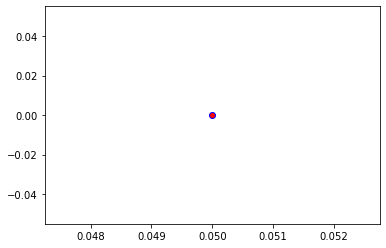

Crafting adversarial images took: 13.238500356674194 seconds 

Images classified as:
000000323355 428 = barrow
000000323496 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


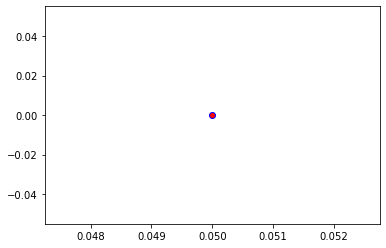

Crafting adversarial images took: 11.986530780792236 seconds 

Images classified as:
000000323571 919 = street sign
000000323709 404 = airliner
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


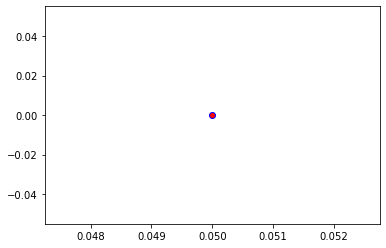

Crafting adversarial images took: 11.012516975402832 seconds 

Images classified as:
000000323751 705 = passenger car
000000323799 522 = croquet ball
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


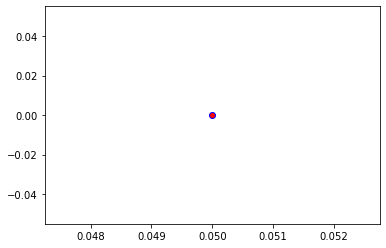

Crafting adversarial images took: 10.464104175567627 seconds 

Images classified as:
000000323828 565 = freight car
000000323895 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


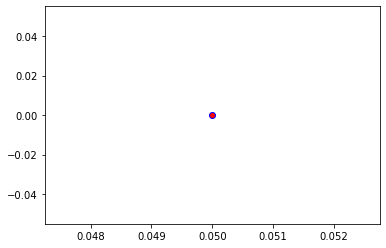

Crafting adversarial images took: 10.74664044380188 seconds 

Images classified as:
000000324158 880 = unicycle
000000324258 523 = crutch
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


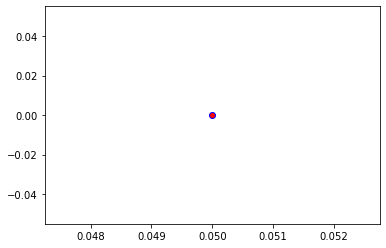

Crafting adversarial images took: 10.482466459274292 seconds 

Images classified as:
000000324614 593 = harmonica
000000324715 844 = switch
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


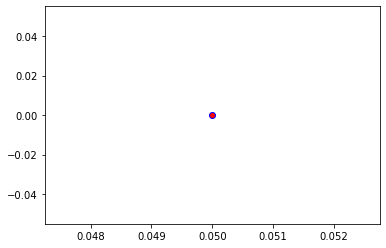

Crafting adversarial images took: 10.360107898712158 seconds 

Images classified as:
000000324818 88 = macaw
000000324927 963 = pizza
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


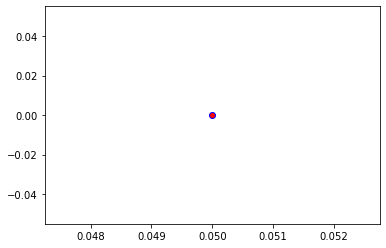

Crafting adversarial images took: 10.20728063583374 seconds 

Images classified as:
000000325031 51 = triceratops
000000325114 896 = washbasin
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


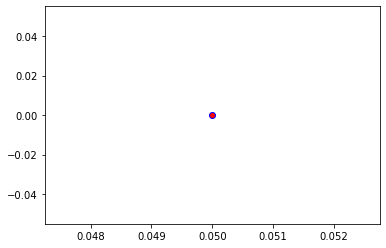

Crafting adversarial images took: 10.317780256271362 seconds 

Images classified as:
000000325306 340 = zebra
000000325347 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


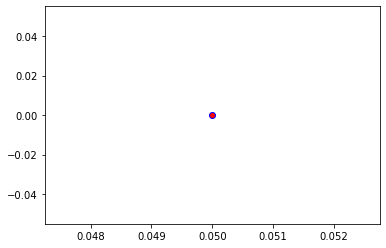

Crafting adversarial images took: 10.58794903755188 seconds 

Images classified as:
000000325483 731 = plunger
000000325527 435 = tub
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


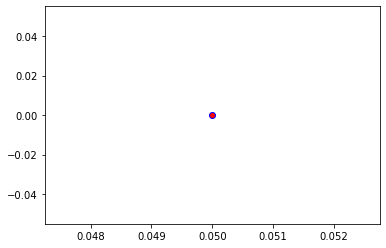

Crafting adversarial images took: 11.202751159667969 seconds 

Images classified as:
000000325838 620 = laptop
000000325991 805 = soccer ball
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


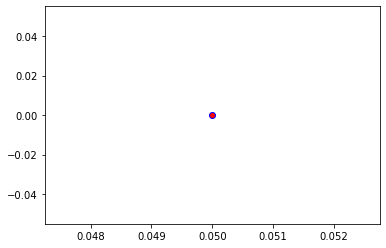

Crafting adversarial images took: 10.533420085906982 seconds 

Images classified as:
000000326082 799 = sliding door
000000326128 248 = ski
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


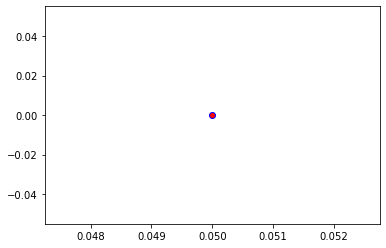

Crafting adversarial images took: 10.405018091201782 seconds 

Images classified as:
000000326174 977 = sandbar
000000326248 702 = parallel bars
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


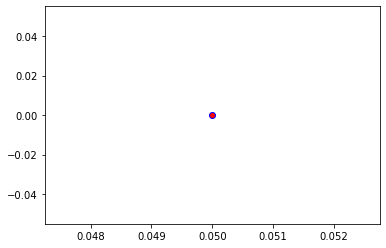

Crafting adversarial images took: 10.517172574996948 seconds 

Images classified as:
000000326462 793 = shower cap
000000326541 585 = hair spray
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


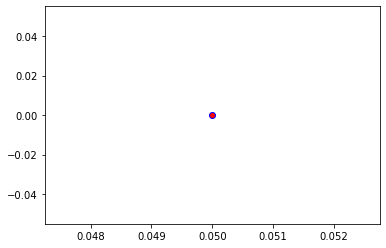

Crafting adversarial images took: 10.657918930053711 seconds 

Images classified as:
000000326542 248 = ski
000000326627 919 = street sign
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


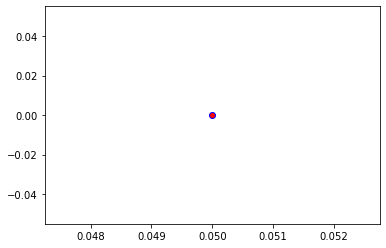

Crafting adversarial images took: 10.61850380897522 seconds 

Images classified as:
000000326970 838 = sunscreen
000000327306 113 = nail
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


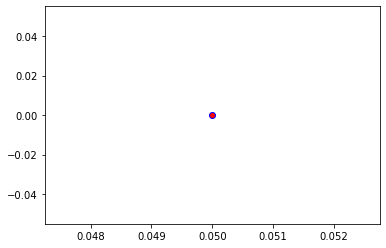

Crafting adversarial images took: 10.506577014923096 seconds 

Images classified as:
000000327592 903 = wig
000000327601 638 = maillot
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


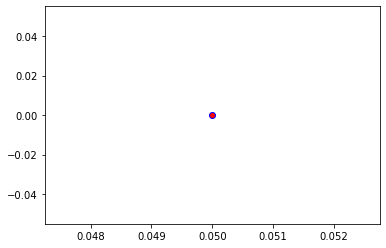

Crafting adversarial images took: 10.205342769622803 seconds 

Images classified as:
000000327605 248 = ski
000000327617 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


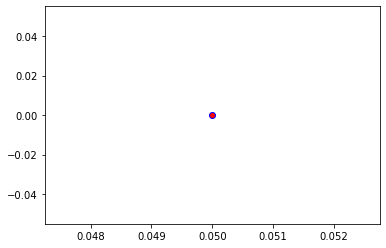

Crafting adversarial images took: 10.317098140716553 seconds 

Images classified as:
000000327701 890 = volleyball
000000327769 896 = washbasin
Min values in image-array: 2.4860384 Max values in image-array: 255.0
Min values in image-array: 0.00974917 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


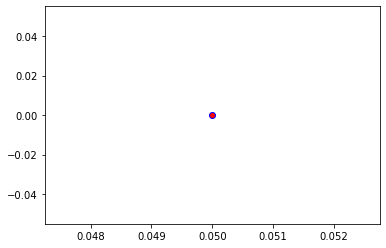

Crafting adversarial images took: 11.022822856903076 seconds 

Images classified as:
000000327780 928 = ice cream
000000327890 703 = park bench
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


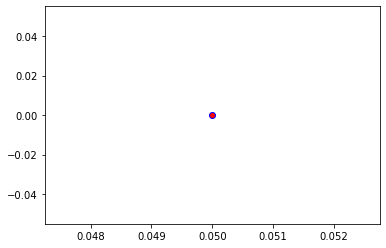

Crafting adversarial images took: 10.404352903366089 seconds 

Images classified as:
000000328030 850 = teddy
000000328117 415 = bakery
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


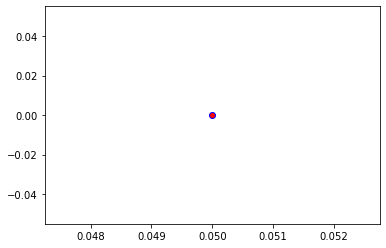

Crafting adversarial images took: 11.472759246826172 seconds 

Images classified as:
000000328238 805 = soccer ball
000000328286 713 = pier
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


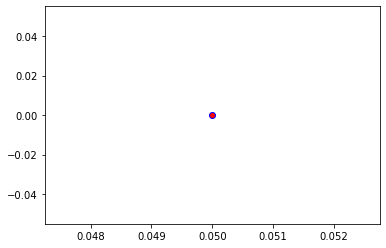

Crafting adversarial images took: 10.4900803565979 seconds 

Images classified as:
000000328337 880 = unicycle
000000328430 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


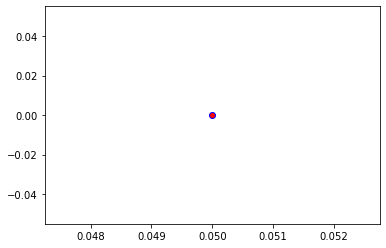

Crafting adversarial images took: 10.39804220199585 seconds 

Images classified as:
000000328601 752 = racket
000000328683 704 = parking meter
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


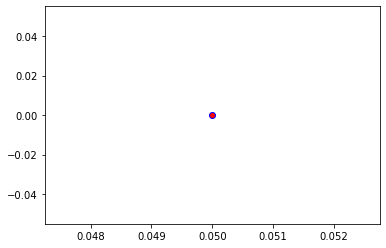

Crafting adversarial images took: 10.384822130203247 seconds 

Images classified as:
000000328959 861 = toilet seat
000000329041 790 = shopping basket
Min values in image-array: 0.016746521 Max values in image-array: 255.0
Min values in image-array: 6.567263e-05 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


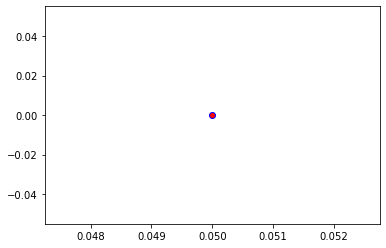

Crafting adversarial images took: 10.515828609466553 seconds 

Images classified as:
000000329080 750 = quilt
000000329219 209 = Chesapeake Bay retriever
Min values in image-array: 0.7633767 Max values in image-array: 255.0
Min values in image-array: 0.0029936342 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


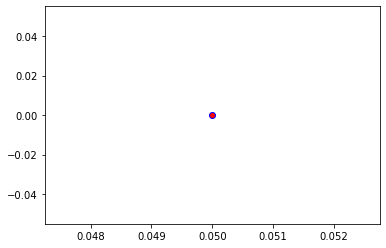

Crafting adversarial images took: 10.515263557434082 seconds 

Images classified as:
000000329319 428 = barrow
000000329323 830 = stretcher
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


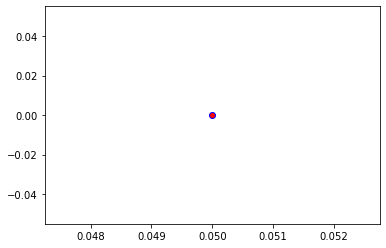

Crafting adversarial images took: 13.418375015258789 seconds 

Images classified as:
000000329447 37 = ox
000000329455 963 = pizza
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


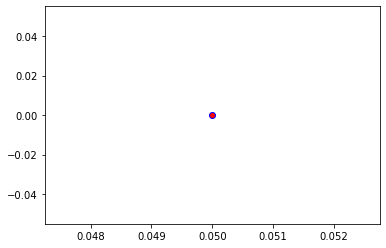

Crafting adversarial images took: 10.96366262435913 seconds 

Images classified as:
000000329456 838 = sunscreen
000000329542 415 = bakery
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


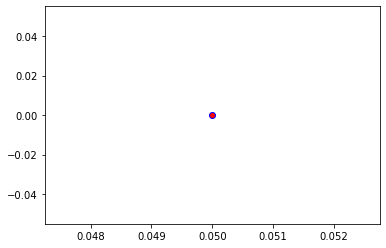

Crafting adversarial images took: 10.355179071426392 seconds 

Images classified as:
000000329614 483 = castle
000000329827 248 = ski
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


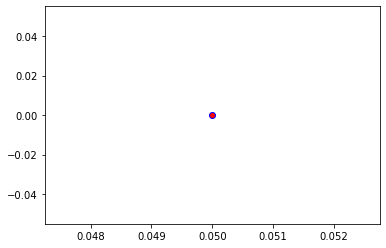

Crafting adversarial images took: 12.560908794403076 seconds 

Images classified as:
000000330369 554 = fireboat
000000330396 203 = West Highland white terrier
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


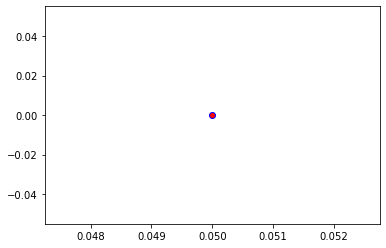

Crafting adversarial images took: 12.024192810058594 seconds 

Images classified as:
000000330554 745 = projector
000000330790 385 = Indian elephant
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


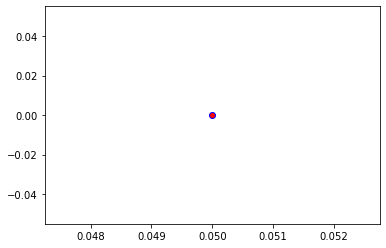

Crafting adversarial images took: 11.030592679977417 seconds 

Images classified as:
000000330818 415 = bakery
000000331075 232 = Border collie
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


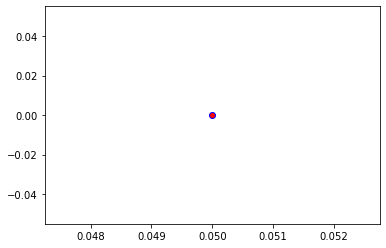

Crafting adversarial images took: 10.203742980957031 seconds 

Images classified as:
000000331280 37 = ox
000000331317 892 = wall clock
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


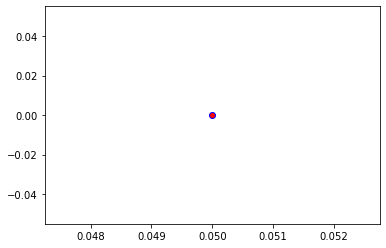

Crafting adversarial images took: 10.073716878890991 seconds 

Images classified as:
000000331352 861 = toilet seat
000000331569 969 = eggnog
Min values in image-array: 0.47805998 Max values in image-array: 255.0
Min values in image-array: 0.001874745 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


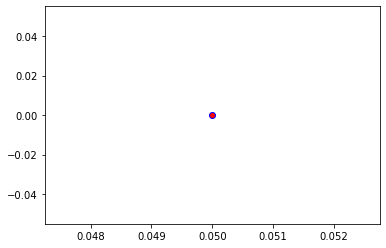

Crafting adversarial images took: 10.291164636611938 seconds 

Images classified as:
000000331604 701 = parachute
000000331799 739 = potter's wheel
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


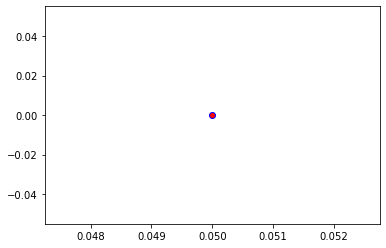

Crafting adversarial images took: 10.158865690231323 seconds 

Images classified as:
000000331817 122 = American lobster
000000332318 140 = alp
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


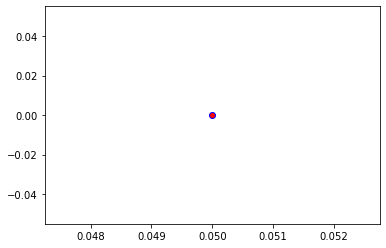

Crafting adversarial images took: 11.60566759109497 seconds 

Images classified as:
000000332351 977 = sandbar
000000332455 861 = toilet seat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


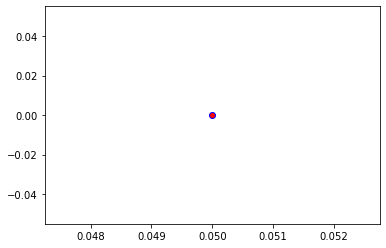

Crafting adversarial images took: 9.888066053390503 seconds 

Images classified as:
000000332570 590 = hand-held computer
000000332845 564 = four-poster
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


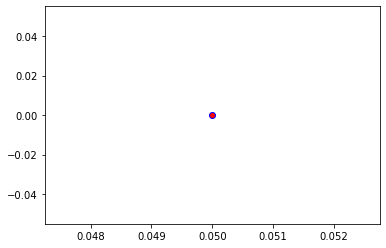

Crafting adversarial images took: 10.29203748703003 seconds 

Images classified as:
000000332901 5 = ram
000000333069 352 = impala
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


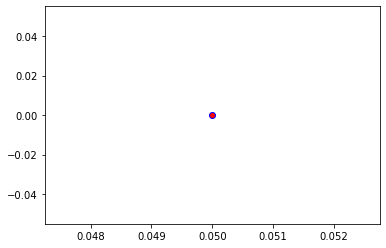

Crafting adversarial images took: 10.455892324447632 seconds 

Images classified as:
000000333237 669 = mosquito net
000000333402 874 = trolleybus
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


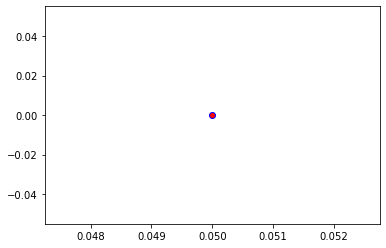

Crafting adversarial images took: 10.81456184387207 seconds 

Images classified as:
000000333697 919 = street sign
000000333745 654 = minibus
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


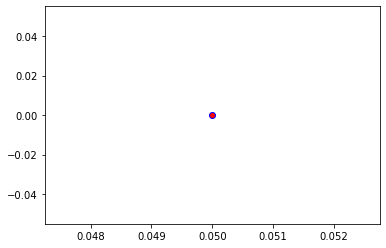

Crafting adversarial images took: 11.127947568893433 seconds 

Images classified as:
000000333772 673 = mouse
000000333956 704 = parking meter
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


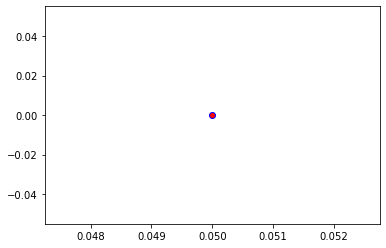

Crafting adversarial images took: 11.356946468353271 seconds 

Images classified as:
000000334006 569 = garbage truck
000000334309 105 = ear
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


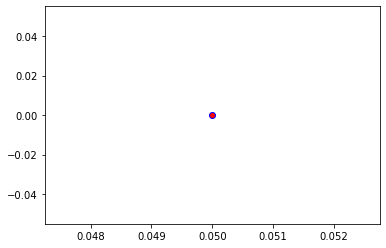

Crafting adversarial images took: 10.87158727645874 seconds 

Images classified as:
000000334371 829 = streetcar
000000334399 149 = gong
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


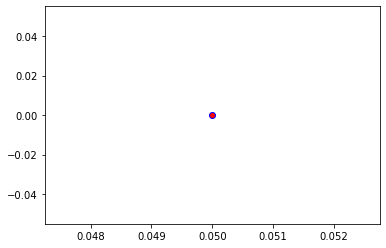

Crafting adversarial images took: 11.398344278335571 seconds 

Images classified as:
000000334417 906 = Windsor tie
000000334483 739 = potter's wheel
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


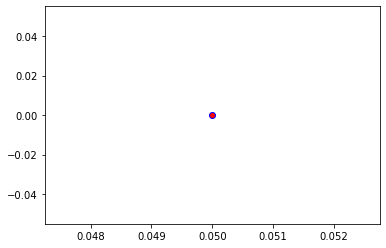

Crafting adversarial images took: 13.203705310821533 seconds 

Images classified as:
000000334521 287 = lynx
000000334530 500 = cliff
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


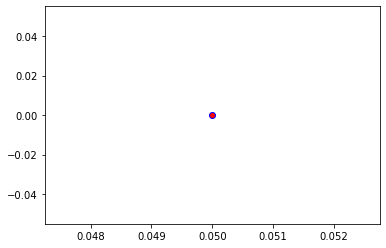

Crafting adversarial images took: 10.030891180038452 seconds 

Images classified as:
000000334555 690 = oxcart
000000334719 500 = cliff
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


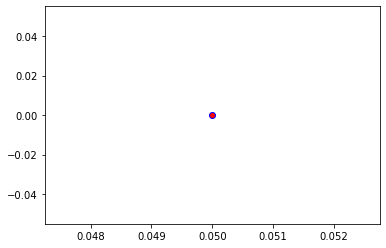

Crafting adversarial images took: 9.950220346450806 seconds 

Images classified as:
000000334767 248 = ski
000000334977 446 = binder
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


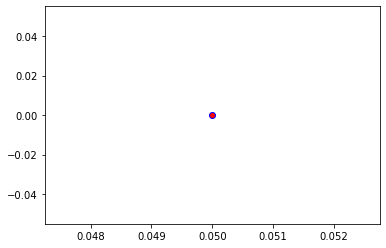

Crafting adversarial images took: 12.109526634216309 seconds 

Images classified as:
000000335081 850 = teddy
000000335177 727 = planetarium
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


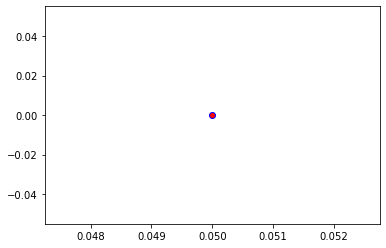

Crafting adversarial images took: 11.12820816040039 seconds 

Images classified as:
000000335328 693 = paddle
000000335427 937 = broccoli
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


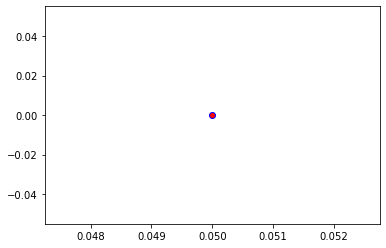

Crafting adversarial images took: 10.22411322593689 seconds 

Images classified as:
000000335450 339 = sorrel
000000335529 703 = park bench
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


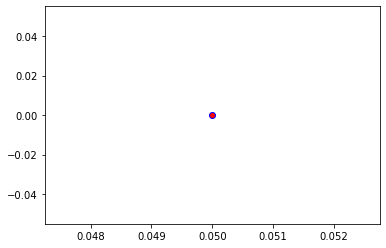

Crafting adversarial images took: 10.49582314491272 seconds 

Images classified as:
000000335658 673 = mouse
000000335800 919 = street sign
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


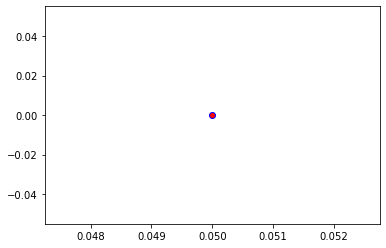

Crafting adversarial images took: 11.453146934509277 seconds 

Images classified as:
000000335954 712 = Petri dish
000000336053 532 = dining table
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


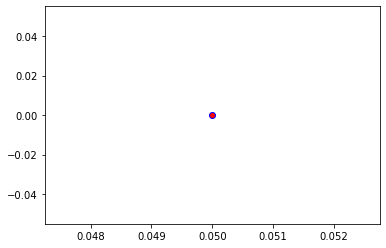

Crafting adversarial images took: 10.325076580047607 seconds 

Images classified as:
000000336209 602 = horizontal bar
000000336232 665 = moped
Min values in image-array: 0.0 Max values in image-array: 254.77118
Min values in image-array: 0.0 Max values in image-array: 0.99910265
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


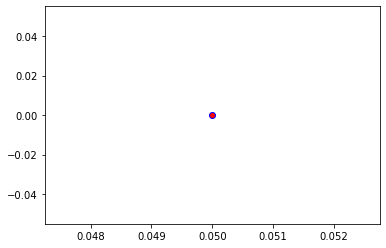

Crafting adversarial images took: 10.935914278030396 seconds 

Images classified as:
000000336265 351 = hartebeest
000000336309 404 = airliner
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


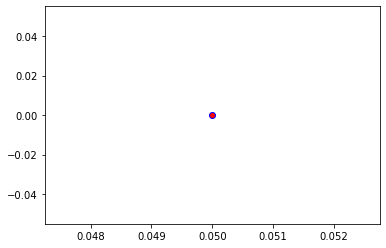

Crafting adversarial images took: 10.802639722824097 seconds 

Images classified as:
000000336356 963 = pizza
000000336587 919 = street sign
Min values in image-array: 0.022321224 Max values in image-array: 255.0
Min values in image-array: 8.7534216e-05 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


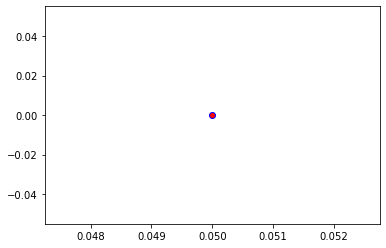

Crafting adversarial images took: 10.915601253509521 seconds 

Images classified as:
000000336628 407 = ambulance
000000336658 536 = dock
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


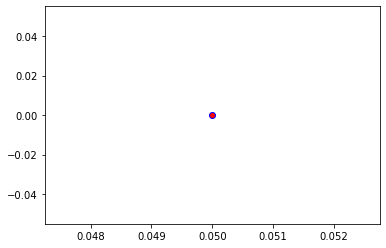

Crafting adversarial images took: 11.119075775146484 seconds 

Images classified as:
000000337055 54 = hog
000000337498 963 = pizza
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


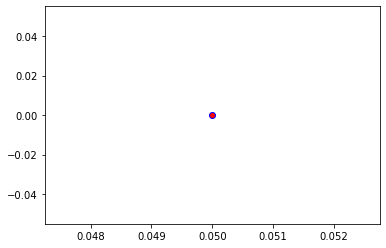

Crafting adversarial images took: 11.201003789901733 seconds 

Images classified as:
000000337987 82 = ruffed grouse
000000338191 448 = birdhouse
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


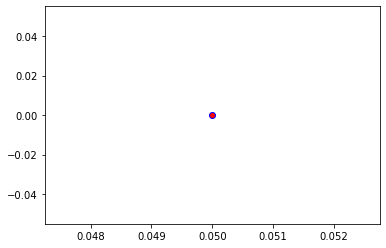

Crafting adversarial images took: 11.236532926559448 seconds 

Images classified as:
000000338219 535 = disk brake
000000338304 864 = wreck
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


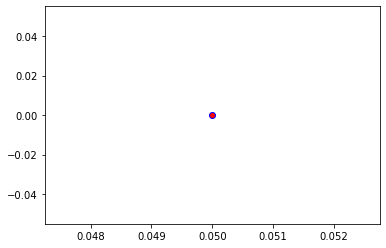

Crafting adversarial images took: 12.076092004776001 seconds 

Images classified as:
000000338325 404 = airliner
000000338428 609 = jeep
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


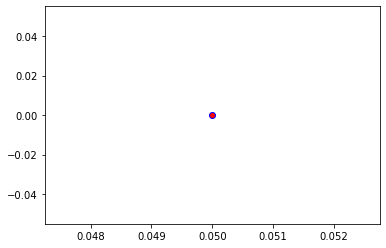

Crafting adversarial images took: 11.222018003463745 seconds 

Images classified as:
000000338532 9 = ostrich
000000338560 637 = mailbox
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


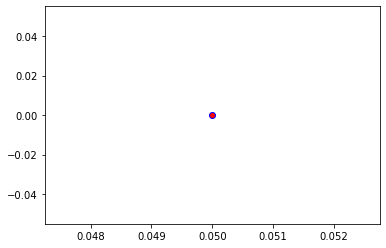

Crafting adversarial images took: 13.232420206069946 seconds 

Images classified as:
000000338624 523 = crutch
000000338625 874 = trolleybus
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


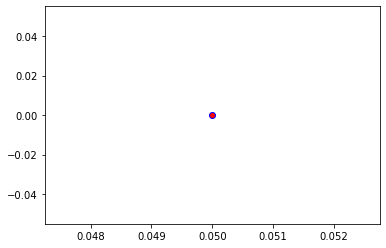

Crafting adversarial images took: 13.283815383911133 seconds 

Images classified as:
000000338718 919 = street sign
000000338901 171 = Italian greyhound
Min values in image-array: 0.0 Max values in image-array: 254.97934
Min values in image-array: 0.0 Max values in image-array: 0.999919
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


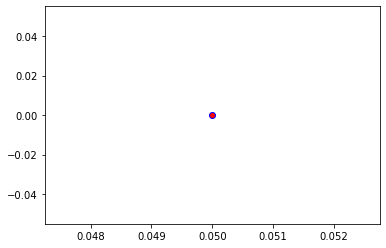

Crafting adversarial images took: 11.641307830810547 seconds 

Images classified as:
000000338905 762 = restaurant
000000338986 705 = passenger car
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


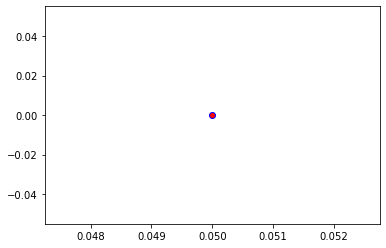

Crafting adversarial images took: 11.502081632614136 seconds 

Images classified as:
000000339442 954 = banana
000000339823 400 = gown
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


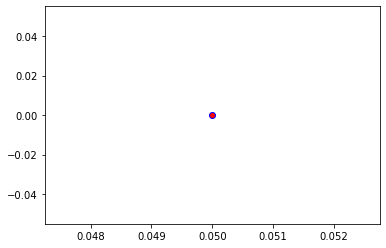

Crafting adversarial images took: 11.32963514328003 seconds 

Images classified as:
000000339870 920 = traffic light
000000340015 963 = pizza
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


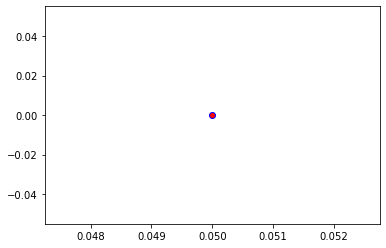

Crafting adversarial images took: 11.459634780883789 seconds 

Images classified as:
000000340175 532 = dining table
000000340272 5 = ram
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


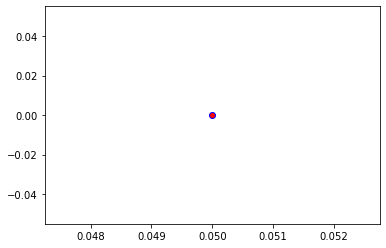

Crafting adversarial images took: 11.390546083450317 seconds 

Images classified as:
000000340451 703 = park bench
000000340697 680 = nipple
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


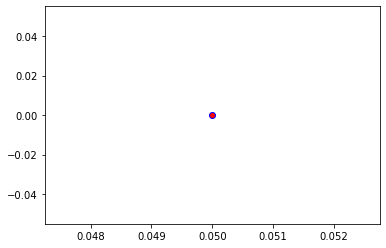

Crafting adversarial images took: 11.784668207168579 seconds 

Images classified as:
000000340894 527 = desktop computer
000000340930 600 = hook
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


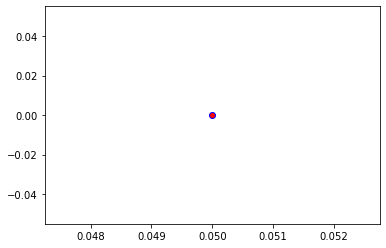

Crafting adversarial images took: 13.417715549468994 seconds 

Images classified as:
000000341058 919 = street sign
000000341094 595 = harvester
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


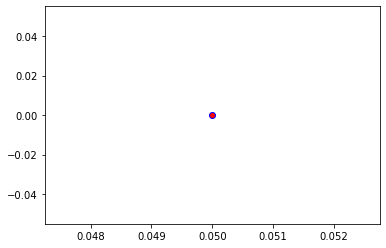

Crafting adversarial images took: 13.436645746231079 seconds 

Images classified as:
000000341196 150 = sea lion
000000341469 882 = vacuum
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


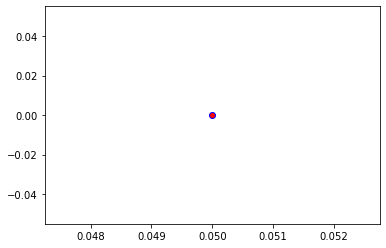

Crafting adversarial images took: 12.692248582839966 seconds 

Images classified as:
000000341681 752 = racket
000000341719 140 = alp
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


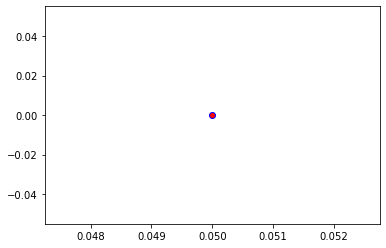

Crafting adversarial images took: 13.673073053359985 seconds 

Images classified as:
000000341828 739 = potter's wheel
000000341921 703 = park bench
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


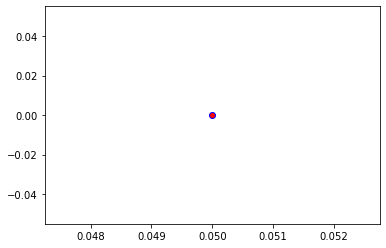

Crafting adversarial images took: 15.18540072441101 seconds 

Images classified as:
000000341973 997 = bolete
000000342006 975 = lakeside
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


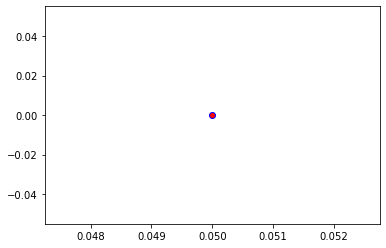

Crafting adversarial images took: 11.565449237823486 seconds 

Images classified as:
000000342128 805 = soccer ball
000000342186 963 = pizza
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


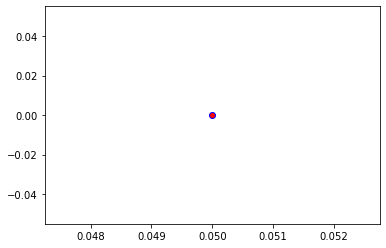

Crafting adversarial images took: 12.432535886764526 seconds 

Images classified as:
000000342295 435 = tub
000000342367 851 = television
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


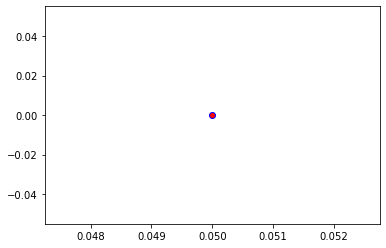

Crafting adversarial images took: 11.432800054550171 seconds 

Images classified as:
000000342397 248 = ski
000000342971 731 = plunger
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


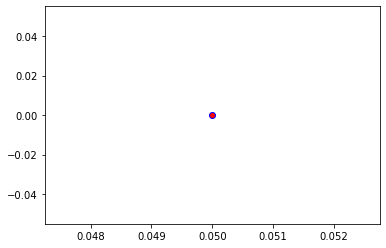

Crafting adversarial images took: 11.621294021606445 seconds 

Images classified as:
000000343076 281 = tabby
000000343149 498 = cinema
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


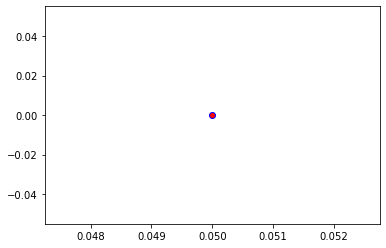

Crafting adversarial images took: 11.423051118850708 seconds 

Images classified as:
000000343218 752 = racket
000000343315 637 = mailbox
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


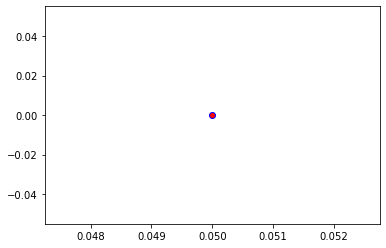

Crafting adversarial images took: 12.316005945205688 seconds 

Images classified as:
000000343453 248 = ski
000000343466 651 = microwave
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


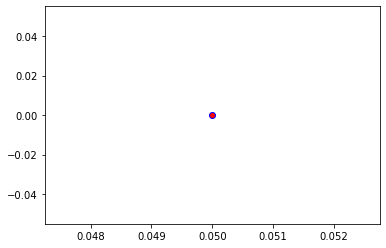

Crafting adversarial images took: 11.429049253463745 seconds 

Images classified as:
000000343496 920 = traffic light
000000343524 752 = racket
Min values in image-array: 0.0 Max values in image-array: 254.63696
Min values in image-array: 0.0 Max values in image-array: 0.99857634
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


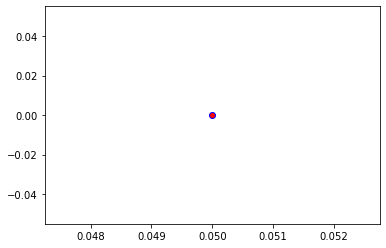

Crafting adversarial images took: 11.526497602462769 seconds 

Images classified as:
000000343561 444 = bicycle-built-for-two
000000343706 893 = wallet
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


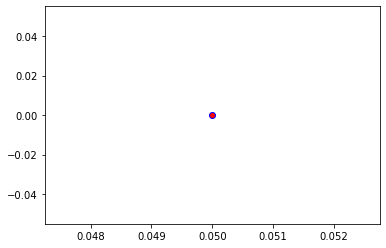

Crafting adversarial images took: 11.60449743270874 seconds 

Images classified as:
000000343803 429 = baseball
000000343934 670 = motor scooter
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


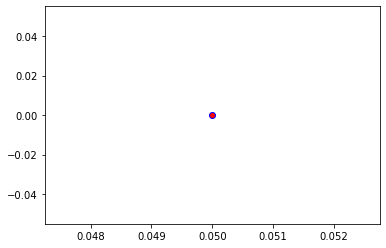

Crafting adversarial images took: 11.435894966125488 seconds 

Images classified as:
000000343937 248 = ski
000000343976 829 = streetcar
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


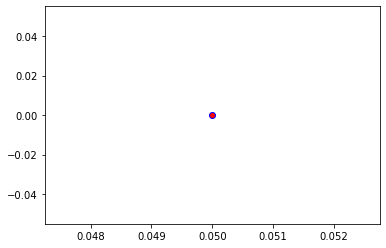

Crafting adversarial images took: 11.565551042556763 seconds 

Images classified as:
000000344029 874 = trolleybus
000000344059 290 = jaguar
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


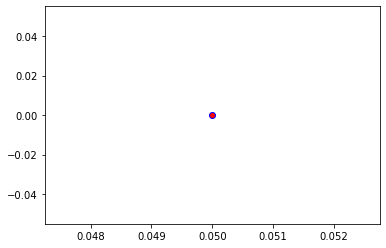

Crafting adversarial images took: 11.469581604003906 seconds 

Images classified as:
000000344100 666 = mortar
000000344268 862 = torch
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


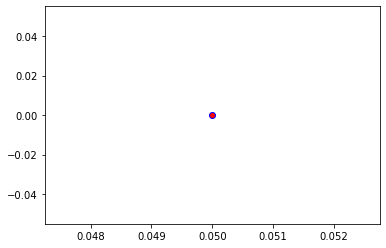

Crafting adversarial images took: 11.529021263122559 seconds 

Images classified as:
000000344611 919 = street sign
000000344614 442 = bell cote
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


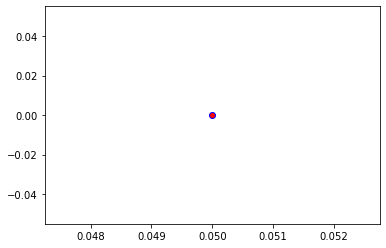

Crafting adversarial images took: 11.511106252670288 seconds 

Images classified as:
000000344621 831 = studio couch
000000344795 827 = stove
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


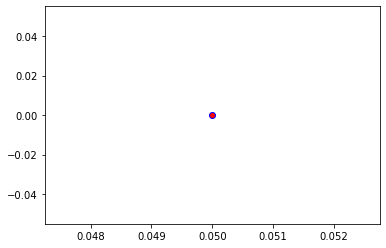

Crafting adversarial images took: 11.55659794807434 seconds 

Images classified as:
000000344816 547 = electric locomotive
000000344888 856 = thresher
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


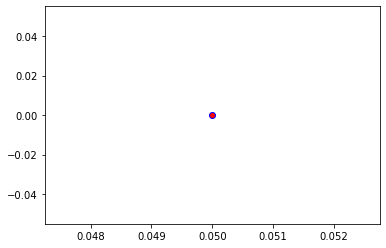

Crafting adversarial images took: 12.2740318775177 seconds 

Images classified as:
000000344909 637 = mailbox
000000345027 428 = barrow
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


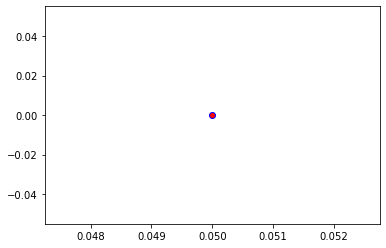

Crafting adversarial images took: 11.153301477432251 seconds 

Images classified as:
000000345252 731 = plunger
000000345261 354 = Arabian camel
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


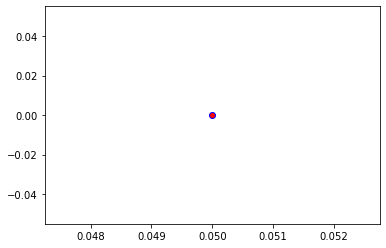

Crafting adversarial images took: 11.865067958831787 seconds 

Images classified as:
000000345356 813 = spatula
000000345361 793 = shower cap
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


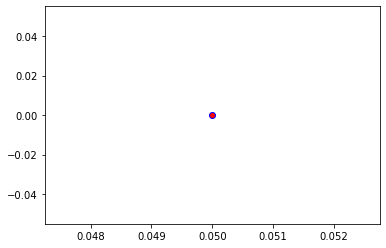

Crafting adversarial images took: 12.16002368927002 seconds 

Images classified as:
000000345385 116 = cradle
000000345397 499 = cleaver
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


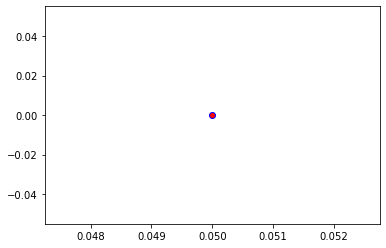

Crafting adversarial images took: 11.994914054870605 seconds 

Images classified as:
000000345466 981 = ballplayer
000000345469 415 = bakery
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


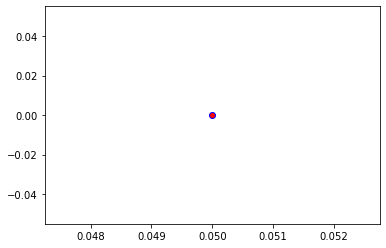

Crafting adversarial images took: 13.102341651916504 seconds 

Images classified as:
000000345941 461 = plate
000000346232 879 = umbrella
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


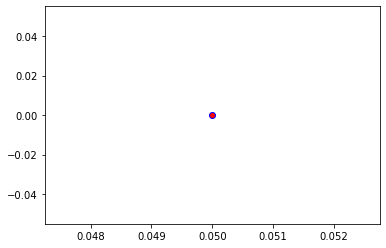

Crafting adversarial images took: 13.338551044464111 seconds 

Images classified as:
000000346638 620 = laptop
000000346703 457 = bow tie
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


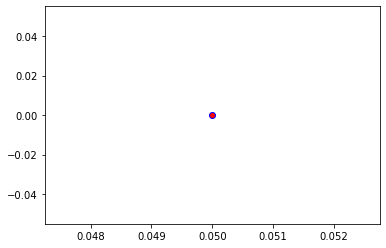

Crafting adversarial images took: 12.960251092910767 seconds 

Images classified as:
000000346707 953 = pineapple
000000346905 101 = tusker
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


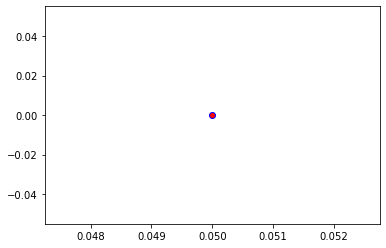

Crafting adversarial images took: 13.344587802886963 seconds 

Images classified as:
000000346968 419 = Band Aid
000000347163 919 = street sign
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


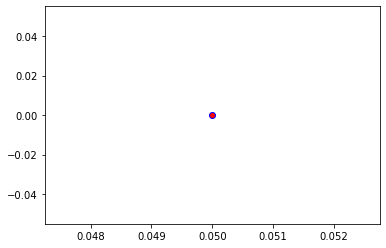

Crafting adversarial images took: 14.738219261169434 seconds 

Images classified as:
000000347174 655 = miniskirt
000000347254 617 = lab coat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


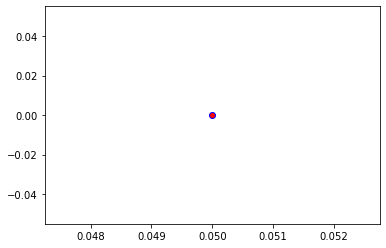

Crafting adversarial images took: 12.31372594833374 seconds 

Images classified as:
000000347265 248 = ski
000000347335 935 = mashed potato
Min values in image-array: 0.0 Max values in image-array: 254.19756
Min values in image-array: 0.0 Max values in image-array: 0.9968532
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


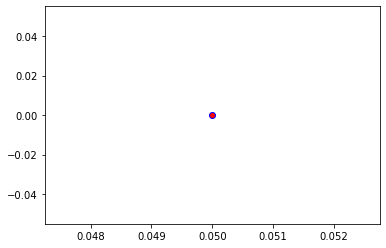

Crafting adversarial images took: 11.175358533859253 seconds 

Images classified as:
000000347370 951 = lemon
000000347456 101 = tusker
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


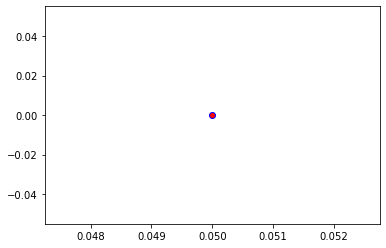

Crafting adversarial images took: 11.159793615341187 seconds 

Images classified as:
000000347544 675 = moving van
000000347664 977 = sandbar
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


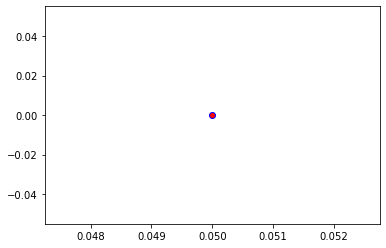

Crafting adversarial images took: 10.615740537643433 seconds 

Images classified as:
000000347693 799 = sliding door
000000347930 207 = golden retriever
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


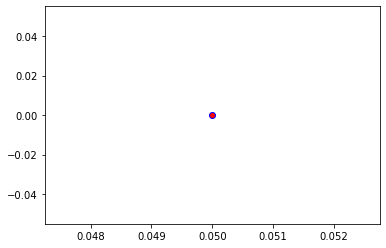

Crafting adversarial images took: 10.610726356506348 seconds 

Images classified as:
000000348012 473 = can opener
000000348045 861 = toilet seat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


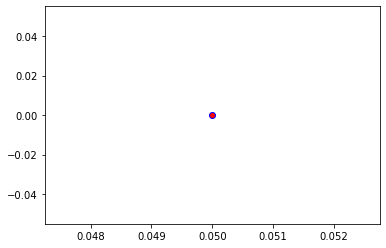

Crafting adversarial images took: 11.273073434829712 seconds 

Images classified as:
000000348216 435 = tub
000000348243 343 = warthog
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


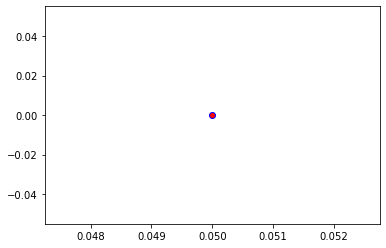

Crafting adversarial images took: 10.365293741226196 seconds 

Images classified as:
000000348481 823 = stethoscope
000000348488 883 = vase
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


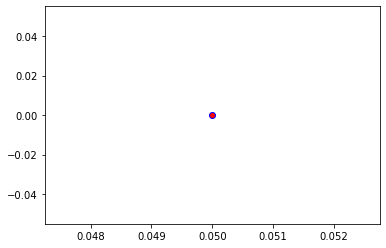

Crafting adversarial images took: 10.481751680374146 seconds 

Images classified as:
000000348708 461 = plate
000000348881 466 = bullet train
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


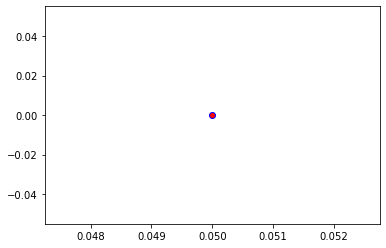

Crafting adversarial images took: 10.529460430145264 seconds 

Images classified as:
000000349152 549 = envelope
000000349184 703 = park bench
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


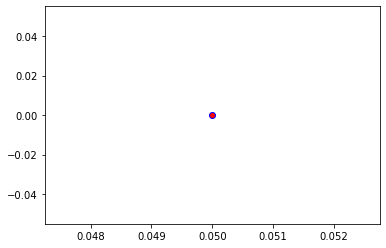

Crafting adversarial images took: 10.793398380279541 seconds 

Images classified as:
000000349302 354 = Arabian camel
000000349480 850 = teddy
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


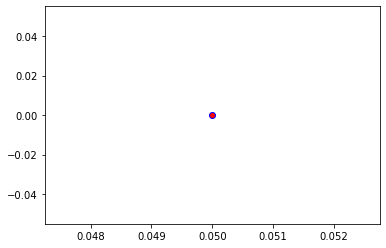

Crafting adversarial images took: 11.363278150558472 seconds 

Images classified as:
000000349594 697 = pajama
000000349678 442 = bell cote
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


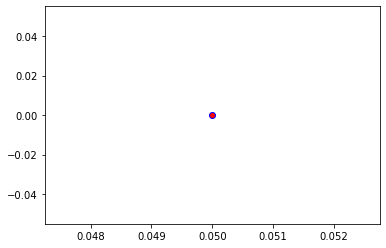

Crafting adversarial images took: 11.60485291481018 seconds 

Images classified as:
000000349837 894 = wardrobe
000000349860 701 = parachute
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


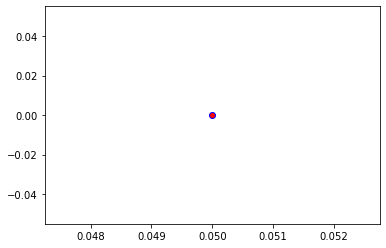

Crafting adversarial images took: 11.541958093643188 seconds 

Images classified as:
000000350002 601 = hoopskirt
000000350003 407 = ambulance
Min values in image-array: 0.50105286 Max values in image-array: 255.0
Min values in image-array: 0.0019649132 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


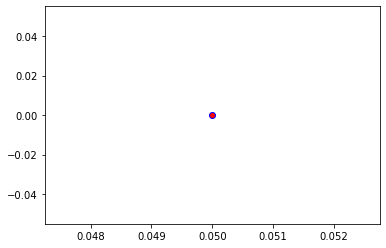

Crafting adversarial images took: 11.407387495040894 seconds 

Images classified as:
000000350019 891 = waffle iron
000000350023 978 = seashore
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


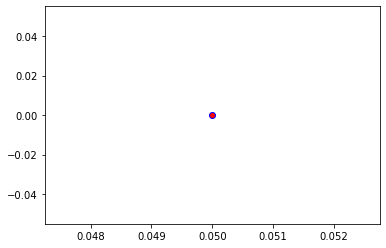

Crafting adversarial images took: 11.897828102111816 seconds 

Images classified as:
000000350054 598 = home theater
000000350122 877 = turnstile
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


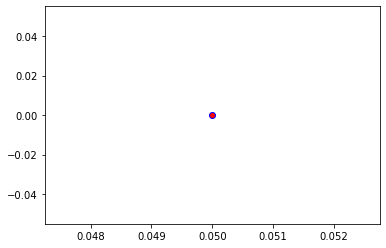

Crafting adversarial images took: 12.674653053283691 seconds 

Images classified as:
000000350148 934 = hotdog
000000350388 925 = consomme
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


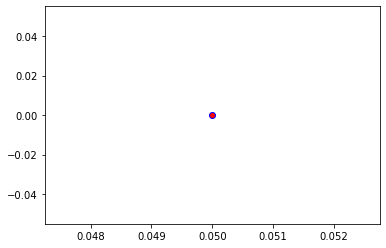

Crafting adversarial images took: 11.293466806411743 seconds 

Images classified as:
000000350405 248 = ski
000000350488 340 = zebra
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


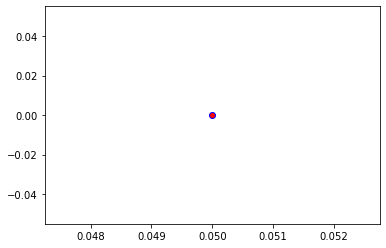

Crafting adversarial images took: 10.52936053276062 seconds 

Images classified as:
000000350607 703 = park bench
000000350679 606 = iron
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


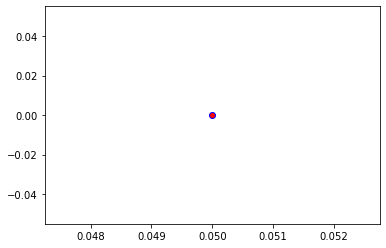

Crafting adversarial images took: 10.514884233474731 seconds 

Images classified as:
000000350833 794 = shower curtain
000000351096 473 = can opener
Min values in image-array: 0.6428833 Max values in image-array: 255.0
Min values in image-array: 0.002521111 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


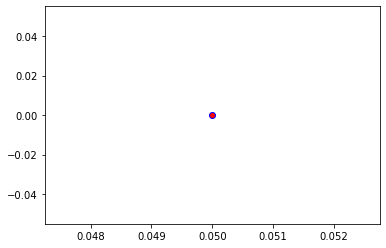

Crafting adversarial images took: 10.503472089767456 seconds 

Images classified as:
000000351331 963 = pizza
000000351362 669 = mosquito net
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


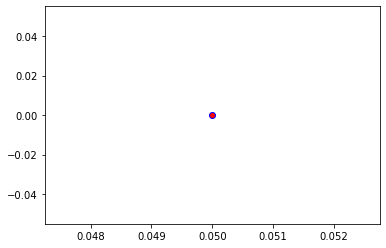

Crafting adversarial images took: 11.91665768623352 seconds 

Images classified as:
000000351530 703 = park bench
000000351559 593 = harp
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


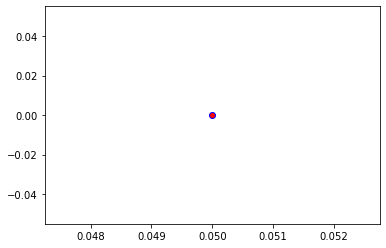

Crafting adversarial images took: 10.543461084365845 seconds 

Images classified as:
000000351589 706 = patio
000000351609 950 = orange
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


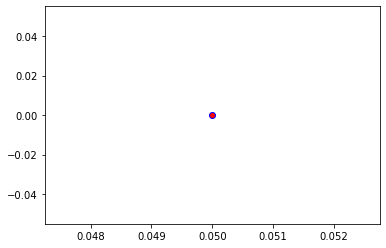

Crafting adversarial images took: 10.544007301330566 seconds 

Images classified as:
000000351810 797 = sleeping bag
000000351823 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


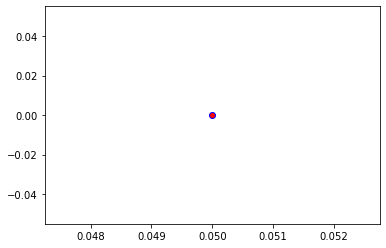

Crafting adversarial images took: 10.290604591369629 seconds 

Images classified as:
000000352491 705 = passenger car
000000352582 768 = rugby ball
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


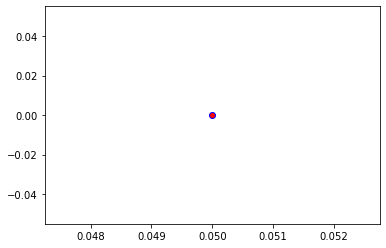

Crafting adversarial images took: 11.056716680526733 seconds 

Images classified as:
000000352584 515 = cowboy hat
000000352618 950 = orange
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


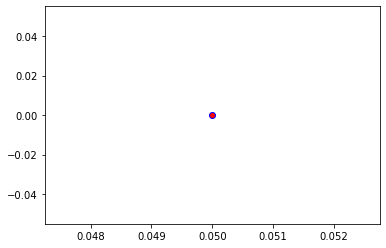

Crafting adversarial images took: 10.754393339157104 seconds 

Images classified as:
000000352684 617 = lab coat
000000352760 88 = macaw
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


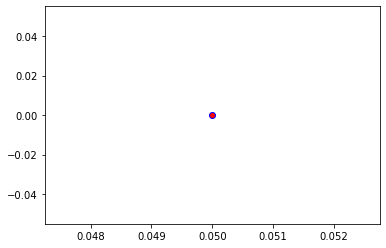

Crafting adversarial images took: 10.614470720291138 seconds 

Images classified as:
000000352900 959 = carbonara
000000353027 964 = potpie
Min values in image-array: 0.0 Max values in image-array: 251.38661
Min values in image-array: 0.0 Max values in image-array: 0.98582983
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


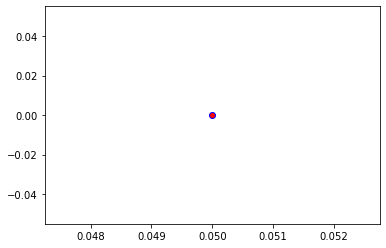

Crafting adversarial images took: 10.4823317527771 seconds 

Images classified as:
000000353051 339 = sorrel
000000353096 527 = desktop computer
Min values in image-array: 0.0 Max values in image-array: 254.81027
Min values in image-array: 0.0 Max values in image-array: 0.99925596
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


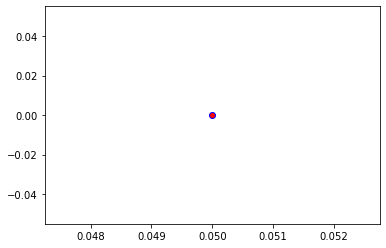

Crafting adversarial images took: 10.471326351165771 seconds 

Images classified as:
000000353180 652 = military uniform
000000353518 977 = sandbar
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


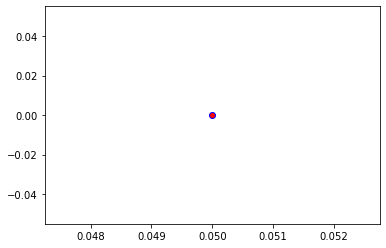

Crafting adversarial images took: 12.653104066848755 seconds 

Images classified as:
000000353970 896 = washbasin
000000354072 435 = bathtub
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


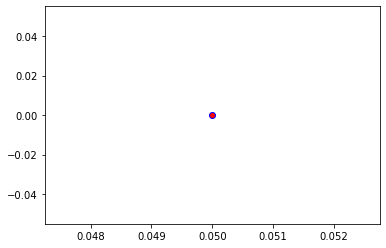

Crafting adversarial images took: 15.462750673294067 seconds 

Images classified as:
000000354307 54 = hog
000000354547 639 = suit
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


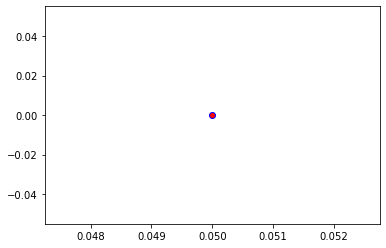

Crafting adversarial images took: 12.33616042137146 seconds 

Images classified as:
000000354753 920 = traffic light
000000354829 435 = bathtub
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


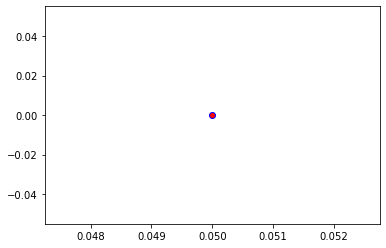

Crafting adversarial images took: 11.133525133132935 seconds 

Images classified as:
000000355169 781 = scoreboard
000000355240 799 = sliding door
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


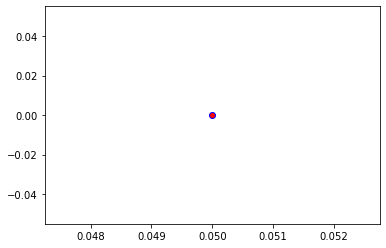

Crafting adversarial images took: 11.868273258209229 seconds 

Images classified as:
000000355257 830 = stretcher
000000355325 928 = ice cream
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


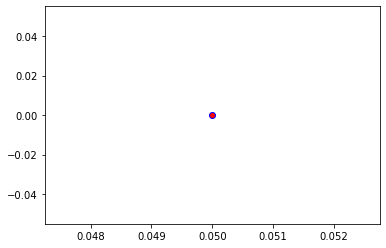

Crafting adversarial images took: 11.444357633590698 seconds 

Images classified as:
000000355610 850 = teddy
000000355677 693 = paddle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


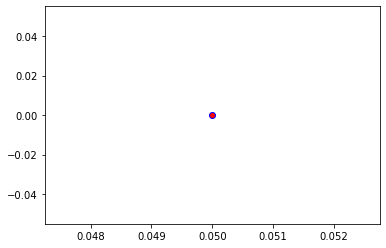

Crafting adversarial images took: 11.9354407787323 seconds 

Images classified as:
000000355817 779 = school bus
000000355905 243 = bull mastiff
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


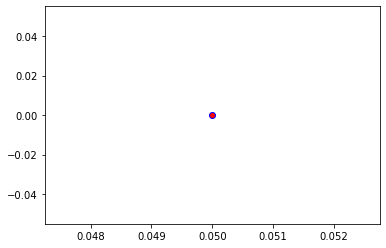

Crafting adversarial images took: 11.649790287017822 seconds 

Images classified as:
000000356094 981 = ballplayer
000000356125 386 = African elephant
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


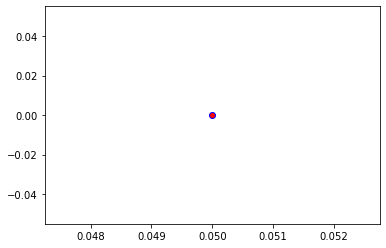

Crafting adversarial images took: 11.890738248825073 seconds 

Images classified as:
000000356169 660 = mobile home
000000356248 762 = restaurant
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


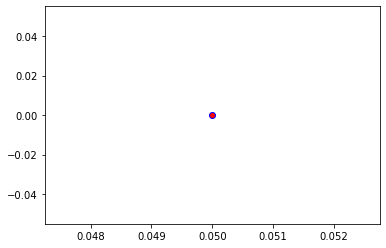

Crafting adversarial images took: 13.101933717727661 seconds 

Images classified as:
000000356261 346 = water buffalo
000000356347 910 = wooden spoon
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


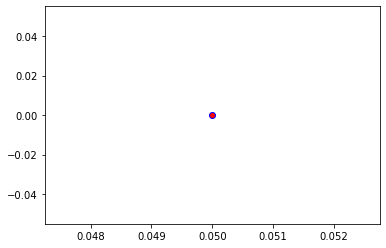

Crafting adversarial images took: 13.042178869247437 seconds 

Images classified as:
000000356387 870 = tricycle
000000356424 927 = trifle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


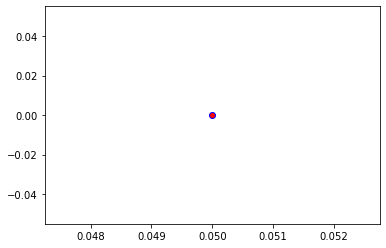

Crafting adversarial images took: 12.06230354309082 seconds 

Images classified as:
000000356427 634 = lumbermill
000000356428 509 = confectionery
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


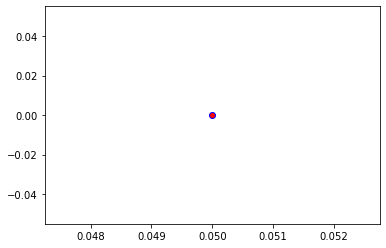

Crafting adversarial images took: 13.12302303314209 seconds 

Images classified as:
000000356432 831 = studio couch
000000356498 941 = acorn squash
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


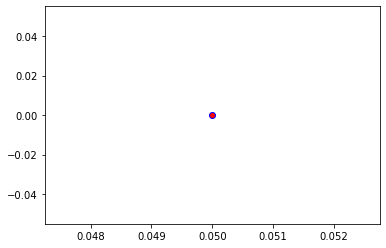

Crafting adversarial images took: 12.13358473777771 seconds 

Images classified as:
000000356505 445 = bikini
000000356531 891 = waffle iron
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


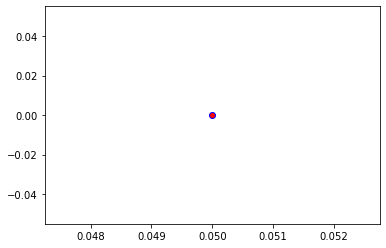

Crafting adversarial images took: 11.290044784545898 seconds 

Images classified as:
000000356612 690 = oxcart
000000356968 339 = sorrel
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


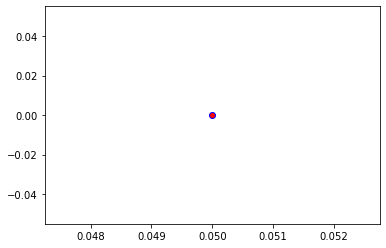

Crafting adversarial images took: 11.56082820892334 seconds 

Images classified as:
000000357060 141 = redshank
000000357081 37 = ox
Min values in image-array: 1.1818852 Max values in image-array: 255.0
Min values in image-array: 0.004634844 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


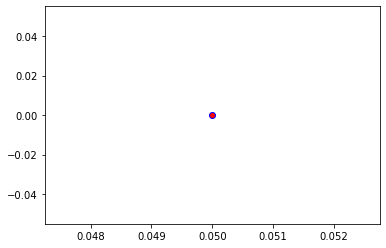

Crafting adversarial images took: 11.094807624816895 seconds 

Images classified as:
000000357238 701 = parachute
000000357430 963 = pizza
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


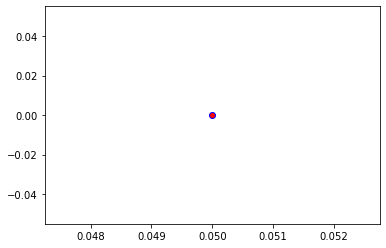

Crafting adversarial images took: 11.17436146736145 seconds 

Images classified as:
000000357459 192 = cairn
000000357501 748 = purse
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


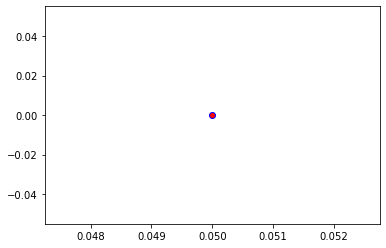

Crafting adversarial images took: 11.363155126571655 seconds 

Images classified as:
000000357567 794 = shower curtain
000000357737 671 = mountain bike
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


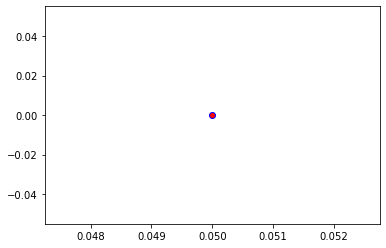

Crafting adversarial images took: 11.388212203979492 seconds 

Images classified as:
000000357742 248 = ski
000000357748 654 = minibus
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


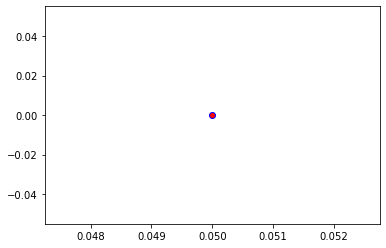

Crafting adversarial images took: 12.61711311340332 seconds 

Images classified as:
000000357816 429 = baseball
000000357888 731 = plunger
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


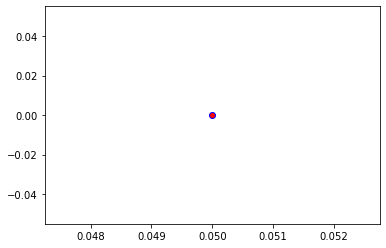

Crafting adversarial images took: 13.08280897140503 seconds 

Images classified as:
000000357903 963 = pizza
000000357941 851 = television
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


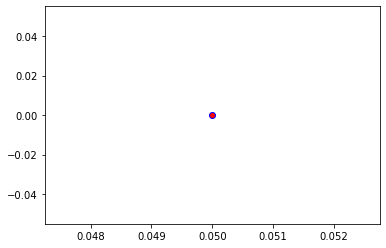

Crafting adversarial images took: 13.147175788879395 seconds 

Images classified as:
000000357978 840 = swab
000000358195 697 = pajama
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


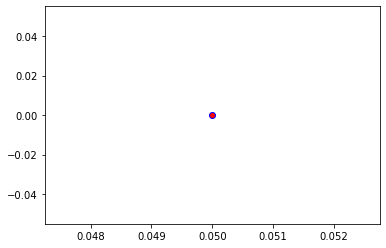

Crafting adversarial images took: 13.294309854507446 seconds 

Images classified as:
000000358427 937 = broccoli
000000358525 681 = notebook
Min values in image-array: 0.023431778 Max values in image-array: 255.0
Min values in image-array: 9.188933e-05 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


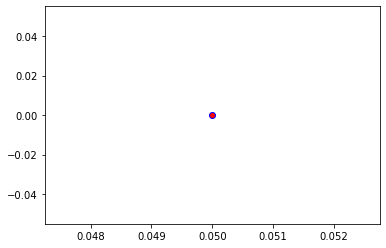

Crafting adversarial images took: 13.288053035736084 seconds 

Images classified as:
000000358923 879 = umbrella
000000359135 385 = Indian elephant
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


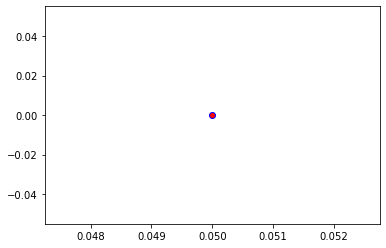

Crafting adversarial images took: 12.977062940597534 seconds 

Images classified as:
000000359219 964 = potpie
000000359540 981 = ballplayer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


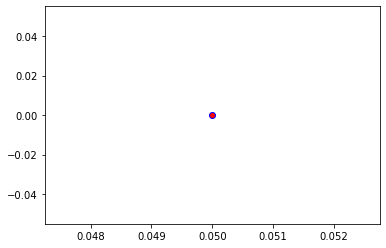

Crafting adversarial images took: 13.356971979141235 seconds 

Images classified as:
000000359677 724 = pirate
000000359781 354 = Arabian camel
Min values in image-array: 0.07176555 Max values in image-array: 253.58777
Min values in image-array: 0.00028143352 Max values in image-array: 0.99446183
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


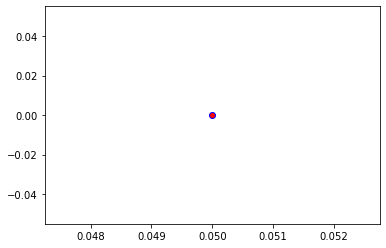

Crafting adversarial images took: 12.846405029296875 seconds 

Images classified as:
000000359833 582 = grocery store
000000359855 636 = mailbag
Min values in image-array: 0.2857666 Max values in image-array: 255.0
Min values in image-array: 0.0011206534 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


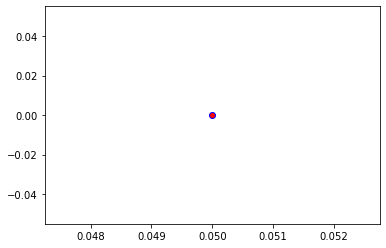

Crafting adversarial images took: 11.477033853530884 seconds 

Images classified as:
000000359937 874 = trolleybus
000000360097 569 = garbage truck
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


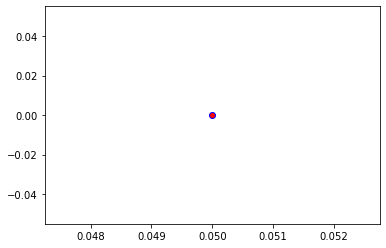

Crafting adversarial images took: 12.821166038513184 seconds 

Images classified as:
000000360137 879 = umbrella
000000360325 5 = ram
Min values in image-array: 0.0 Max values in image-array: 254.22469
Min values in image-array: 0.0 Max values in image-array: 0.99695957
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


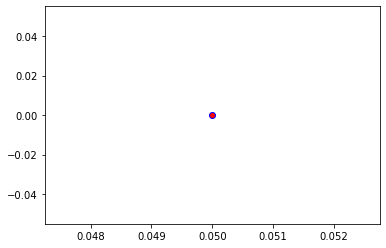

Crafting adversarial images took: 11.585073947906494 seconds 

Images classified as:
000000360393 963 = pizza
000000360564 861 = toilet seat
Min values in image-array: 0.0 Max values in image-array: 246.95312
Min values in image-array: 0.0 Max values in image-array: 0.96844363
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


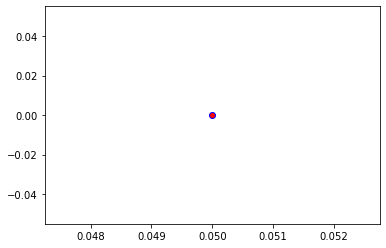

Crafting adversarial images took: 12.779786825180054 seconds 

Images classified as:
000000360661 978 = seashore
000000360943 904 = window screen
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


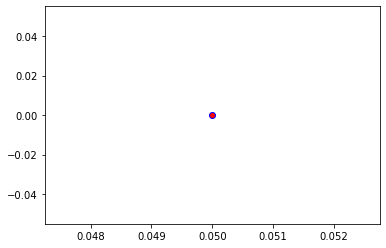

Crafting adversarial images took: 12.73969030380249 seconds 

Images classified as:
000000360951 526 = desk
000000360960 879 = umbrella
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


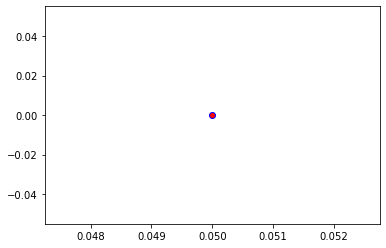

Crafting adversarial images took: 25.216248989105225 seconds 

Images classified as:
000000361103 920 = traffic light
000000361142 498 = palace
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


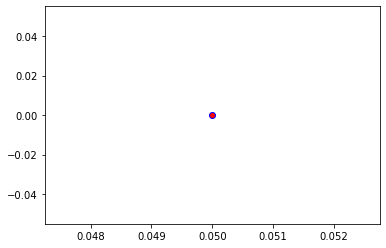

Crafting adversarial images took: 12.905555009841919 seconds 

Images classified as:
000000361147 752 = racket
000000361180 294 = brown bear
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


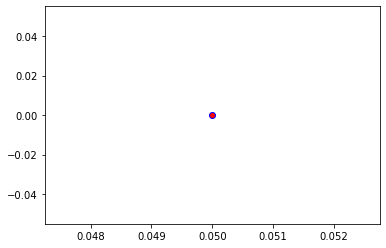

Crafting adversarial images took: 12.643446207046509 seconds 

Images classified as:
000000361238 963 = pizza
000000361268 354 = Arabian camel
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


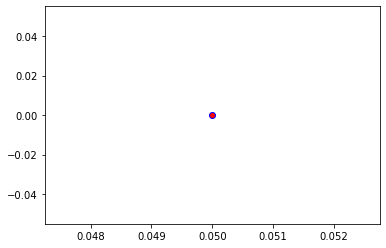

Crafting adversarial images took: 12.697825193405151 seconds 

Images classified as:
000000361506 920 = traffic light
000000361551 830 = stretcher
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


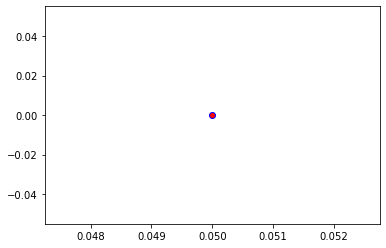

Crafting adversarial images took: 14.834566354751587 seconds 

Images classified as:
000000361571 178 = Weimaraner
000000361586 450 = bobsled
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


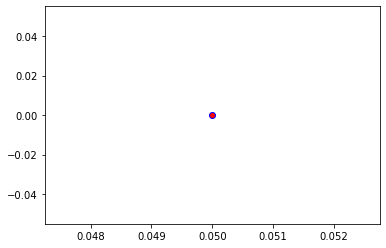

Crafting adversarial images took: 12.135618209838867 seconds 

Images classified as:
000000361621 285 = Egyptian cat
000000361730 701 = parachute
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


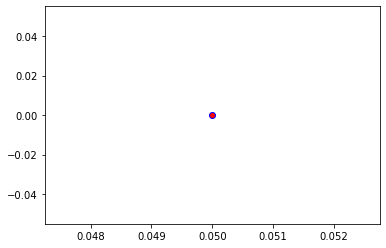

Crafting adversarial images took: 11.914616823196411 seconds 

Images classified as:
000000361919 140 = alp
000000362434 478 = carton
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


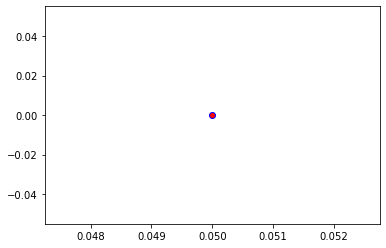

Crafting adversarial images took: 11.362396001815796 seconds 

Images classified as:
000000362520 674 = mousetrap
000000362682 654 = minibus
Min values in image-array: 0.0 Max values in image-array: 254.87724
Min values in image-array: 0.0 Max values in image-array: 0.9995186
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


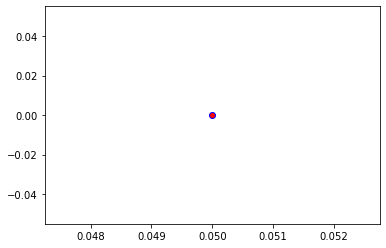

Crafting adversarial images took: 12.01109266281128 seconds 

Images classified as:
000000362716 752 = racket
000000363072 565 = freight car
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


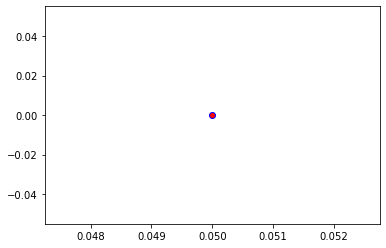

Crafting adversarial images took: 11.850505590438843 seconds 

Images classified as:
000000363188 697 = pajama
000000363207 415 = bakery
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


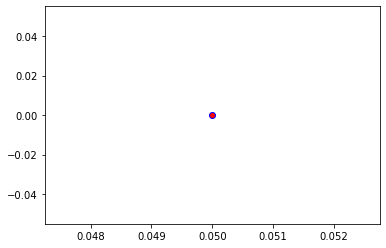

Crafting adversarial images took: 11.536712646484375 seconds 

Images classified as:
000000363461 526 = desk
000000363666 461 = plate
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


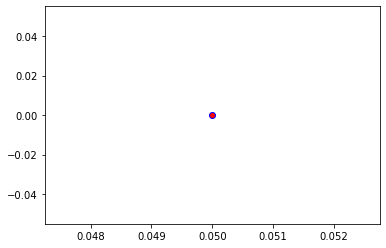

Crafting adversarial images took: 11.521933317184448 seconds 

Images classified as:
000000363784 435 = tub
000000363840 526 = desk
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


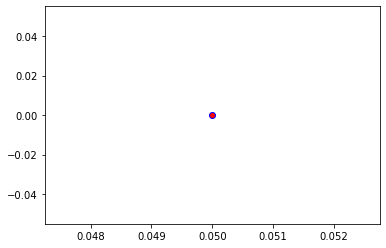

Crafting adversarial images took: 11.425669193267822 seconds 

Images classified as:
000000363875 670 = motor scooter
000000364102 416 = balance beam
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


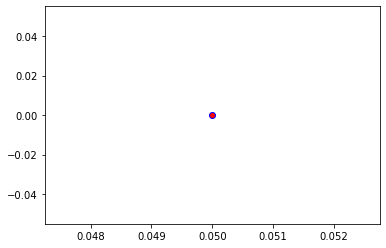

Crafting adversarial images took: 11.498584508895874 seconds 

Images classified as:
000000364126 842 = swimming trunks
000000364166 340 = zebra
Min values in image-array: 0.0 Max values in image-array: 251.42064
Min values in image-array: 0.0 Max values in image-array: 0.9859633
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


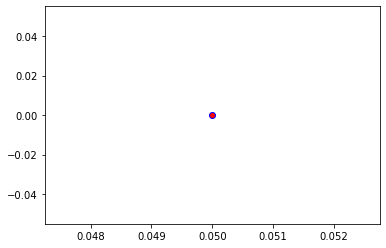

Crafting adversarial images took: 12.883862257003784 seconds 

Images classified as:
000000364297 508 = computer keyboard
000000364322 5 = ram
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


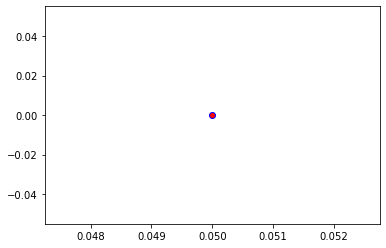

Crafting adversarial images took: 11.469543933868408 seconds 

Images classified as:
000000364557 978 = seashore
000000364587 547 = electric locomotive
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


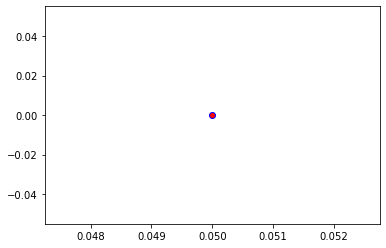

Crafting adversarial images took: 11.079426050186157 seconds 

Images classified as:
000000364636 243 = bull mastiff
000000364884 450 = bobsled
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


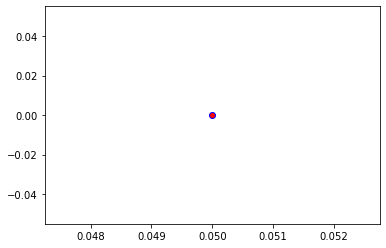

Crafting adversarial images took: 10.640228986740112 seconds 

Images classified as:
000000365095 981 = ballplayer
000000365098 150 = sea lion
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


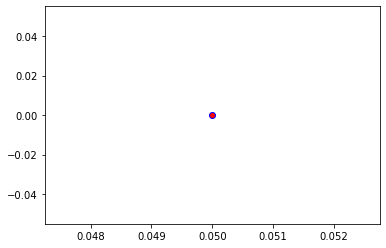

Crafting adversarial images took: 10.738303422927856 seconds 

Images classified as:
000000365207 475 = car mirror
000000365208 116 = cradle
Min values in image-array: 0.12053394 Max values in image-array: 255.0
Min values in image-array: 0.00047268212 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


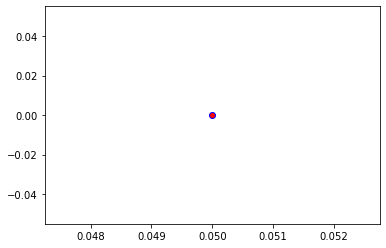

Crafting adversarial images took: 10.705959558486938 seconds 

Images classified as:
000000365385 794 = shower curtain
000000365387 861 = toilet seat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


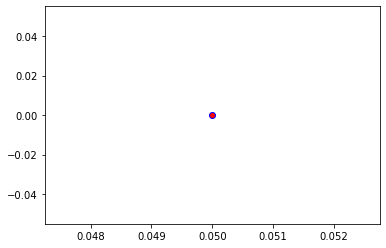

Crafting adversarial images took: 10.54293704032898 seconds 

Images classified as:
000000365521 639 = tank
000000365642 792 = shovel
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


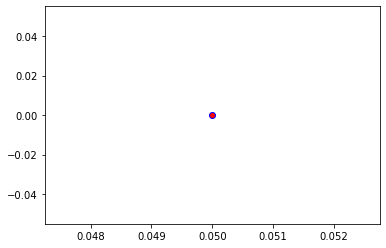

Crafting adversarial images took: 10.234921216964722 seconds 

Images classified as:
000000365655 609 = jeep
000000365745 569 = garbage truck
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


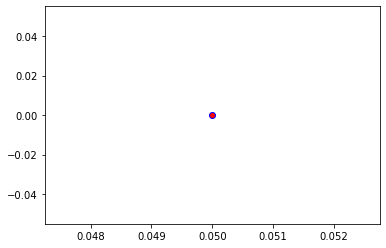

Crafting adversarial images took: 10.267404556274414 seconds 

Images classified as:
000000365766 651 = microwave
000000365886 487 = cellular telephone
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


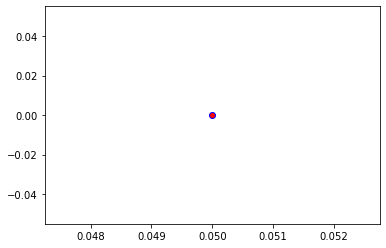

Crafting adversarial images took: 10.828429460525513 seconds 

Images classified as:
000000366141 831 = studio couch
000000366178 919 = street sign
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


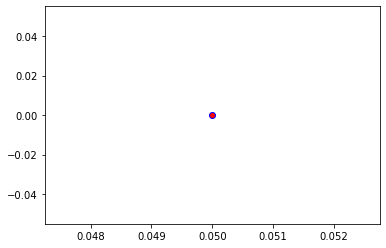

Crafting adversarial images took: 11.446958303451538 seconds 

Images classified as:
000000366199 669 = mosquito net
000000366225 527 = desktop computer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


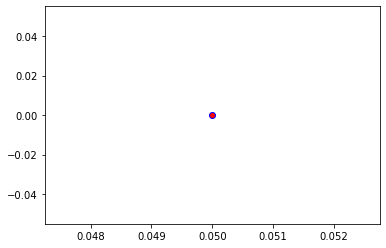

Crafting adversarial images took: 10.630244731903076 seconds 

Images classified as:
000000366611 209 = Chesapeake Bay retriever
000000366711 950 = orange
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


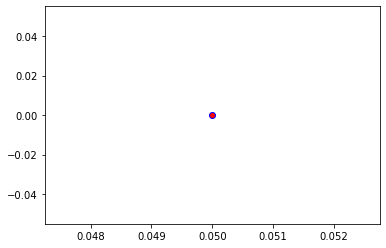

Crafting adversarial images took: 10.925472021102905 seconds 

Images classified as:
000000366884 799 = sliding door
000000367082 234 = Rottweiler
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


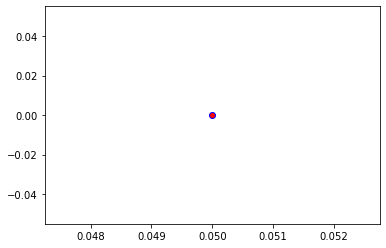

Crafting adversarial images took: 10.581525564193726 seconds 

Images classified as:
000000367095 620 = laptop
000000367195 263 = Pembroke
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


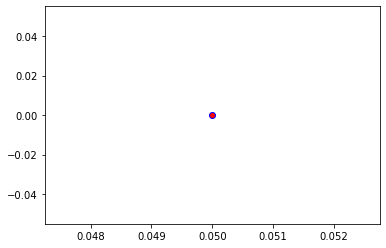

Crafting adversarial images took: 11.19670820236206 seconds 

Images classified as:
000000367228 701 = parachute
000000367386 831 = studio couch
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


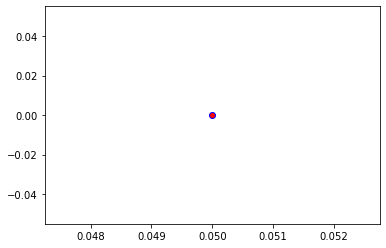

Crafting adversarial images took: 10.531500339508057 seconds 

Images classified as:
000000367569 831 = studio couch
000000367680 654 = minibus
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


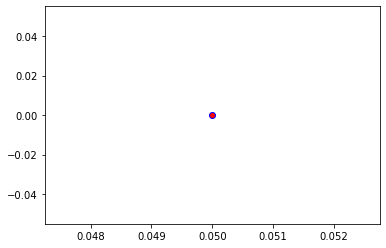

Crafting adversarial images took: 11.534805536270142 seconds 

Images classified as:
000000367818 339 = sorrel
000000368038 547 = electric locomotive
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


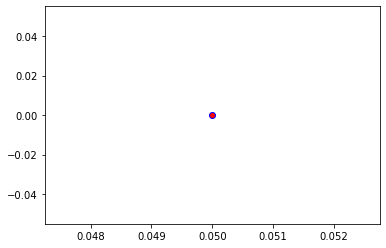

Crafting adversarial images took: 13.13631558418274 seconds 

Images classified as:
000000368212 929 = ice lolly
000000368294 726 = plane
Min values in image-array: 0.0 Max values in image-array: 254.93985
Min values in image-array: 0.0 Max values in image-array: 0.99976414
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


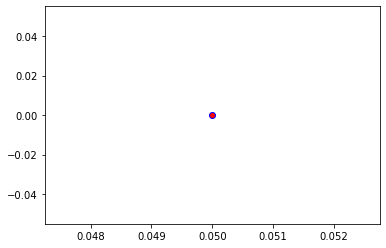

Crafting adversarial images took: 10.630468130111694 seconds 

Images classified as:
000000368335 690 = oxcart
000000368456 565 = freight car
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


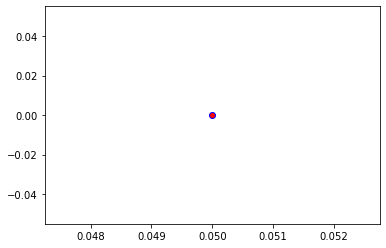

Crafting adversarial images took: 10.655598878860474 seconds 

Images classified as:
000000368684 548 = entertainment center
000000368752 521 = Crock Pot
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


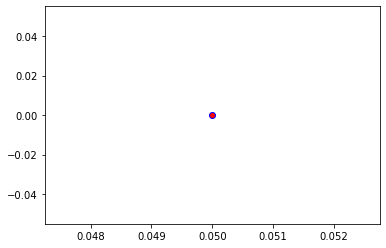

Crafting adversarial images took: 11.215625762939453 seconds 

Images classified as:
000000368900 851 = television
000000368940 648 = medicine chest
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


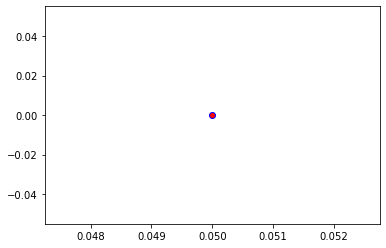

Crafting adversarial images took: 11.152779579162598 seconds 

Images classified as:
000000368961 386 = African elephant
000000368982 784 = screwdriver
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


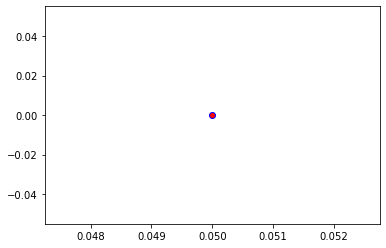

Crafting adversarial images took: 10.590226173400879 seconds 

Images classified as:
000000369037 385 = Indian elephant
000000369081 339 = sorrel
Min values in image-array: 0.0 Max values in image-array: 247.63257
Min values in image-array: 0.0 Max values in image-array: 0.97110814
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


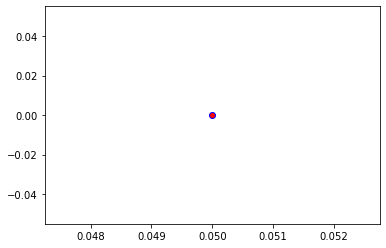

Crafting adversarial images took: 10.4758939743042 seconds 

Images classified as:
000000369310 882 = vacuum
000000369323 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


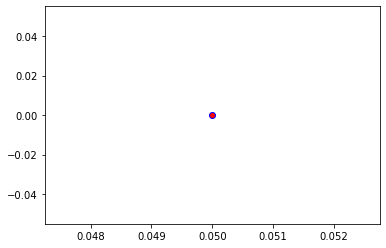

Crafting adversarial images took: 10.57828140258789 seconds 

Images classified as:
000000369370 965 = burrito
000000369442 354 = Arabian camel
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


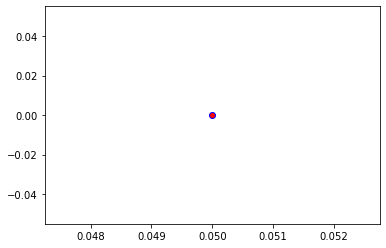

Crafting adversarial images took: 10.71492075920105 seconds 

Images classified as:
000000369503 534 = dishwasher
000000369541 232 = Border collie
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


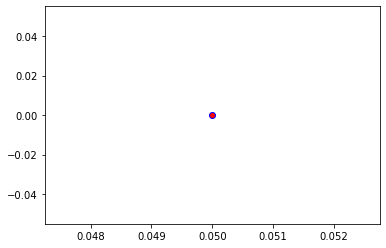

Crafting adversarial images took: 10.534682750701904 seconds 

Images classified as:
000000369675 829 = streetcar
000000369751 704 = parking meter
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


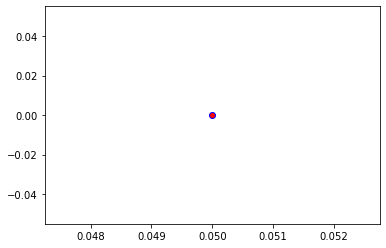

Crafting adversarial images took: 10.278686761856079 seconds 

Images classified as:
000000369757 415 = bakery
000000369771 924 = guacamole
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


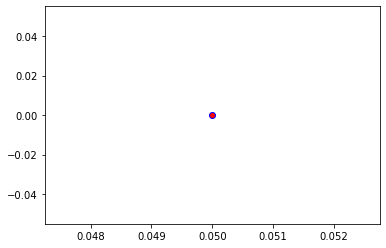

Crafting adversarial images took: 10.236652374267578 seconds 

Images classified as:
000000369812 919 = street sign
000000370042 879 = umbrella
Min values in image-array: 0.171875 Max values in image-array: 255.0
Min values in image-array: 0.0006740196 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


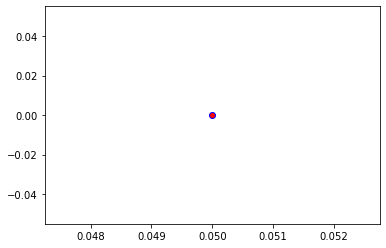

Crafting adversarial images took: 10.482019186019897 seconds 

Images classified as:
000000370208 704 = parking meter
000000370270 624 = library
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


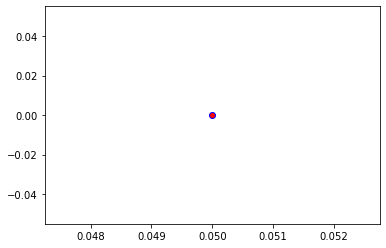

Crafting adversarial images took: 10.48999547958374 seconds 

Images classified as:
000000370375 456 = bow
000000370478 553 = file
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


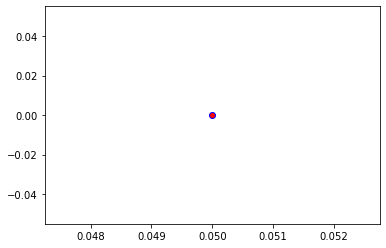

Crafting adversarial images took: 11.674619674682617 seconds 

Images classified as:
000000370486 879 = umbrella
000000370677 415 = bakery
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


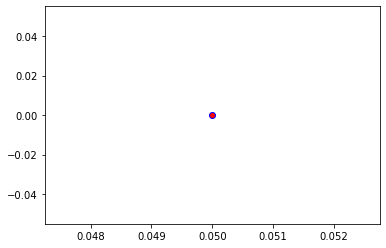

Crafting adversarial images took: 10.584176540374756 seconds 

Images classified as:
000000370711 495 = china cabinet
000000370813 999 = toilet tissue
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


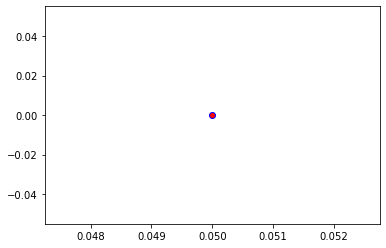

Crafting adversarial images took: 10.457526683807373 seconds 

Images classified as:
000000370818 894 = wardrobe
000000370900 928 = ice cream
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


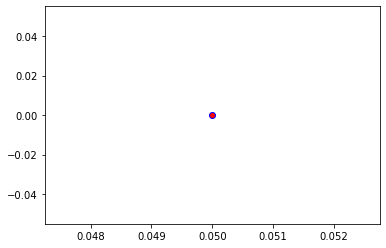

Crafting adversarial images took: 10.42200517654419 seconds 

Images classified as:
000000370999 931 = bagel
000000371042 752 = racket
Min values in image-array: 0.5816124 Max values in image-array: 255.0
Min values in image-array: 0.002280833 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


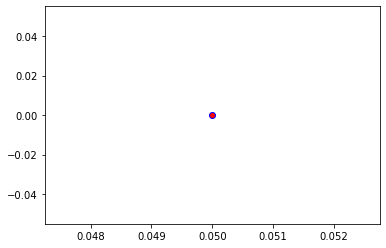

Crafting adversarial images took: 10.563120365142822 seconds 

Images classified as:
000000371472 953 = pineapple
000000371529 861 = toilet seat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


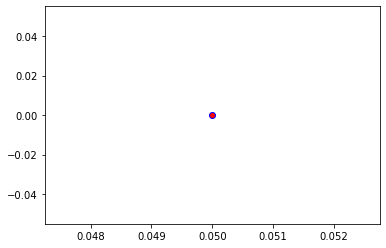

Crafting adversarial images took: 10.702985048294067 seconds 

Images classified as:
000000371552 805 = soccer ball
000000371677 527 = desktop computer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


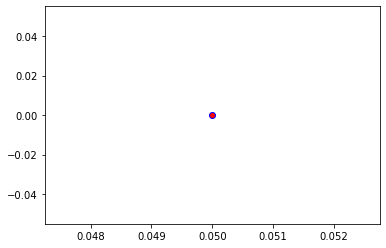

Crafting adversarial images took: 10.415013790130615 seconds 

Images classified as:
000000371699 532 = dining table
000000371749 162 = beagle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


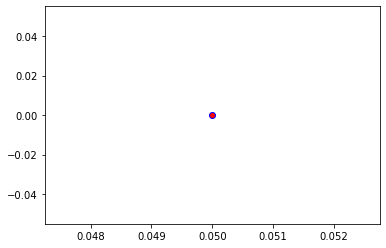

Crafting adversarial images took: 10.306333780288696 seconds 

Images classified as:
000000372203 843 = swing
000000372260 778 = scale
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


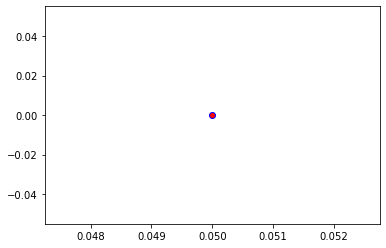

Crafting adversarial images took: 10.311205387115479 seconds 

Images classified as:
000000372307 73 = barn
000000372317 874 = trolleybus
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


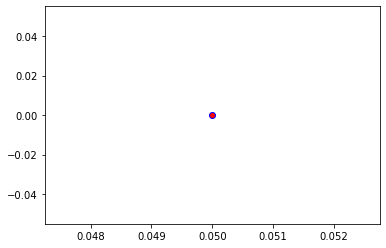

Crafting adversarial images took: 10.537105560302734 seconds 

Images classified as:
000000372349 978 = seashore
000000372466 673 = mouse
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


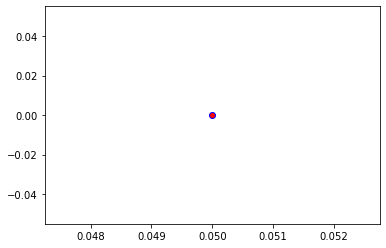

Crafting adversarial images took: 10.766268968582153 seconds 

Images classified as:
000000372577 752 = racket
000000372718 883 = vase
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


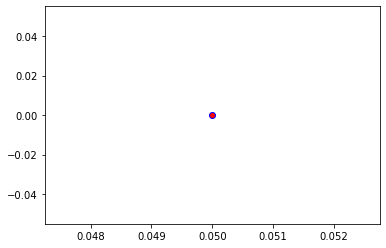

Crafting adversarial images took: 11.496931552886963 seconds 

Images classified as:
000000372819 172 = whippet
000000373315 978 = seashore
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


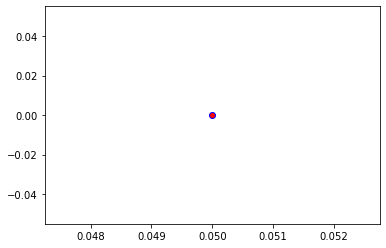

Crafting adversarial images took: 10.529909133911133 seconds 

Images classified as:
000000373353 829 = streetcar
000000373382 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


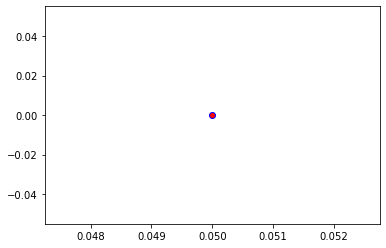

Crafting adversarial images took: 10.565057754516602 seconds 

Images classified as:
000000373705 862 = torch
000000374052 703 = park bench
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


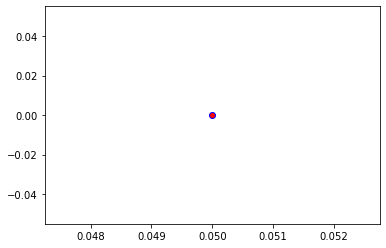

Crafting adversarial images took: 10.505276679992676 seconds 

Images classified as:
000000374083 461 = plate
000000374369 248 = ski
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


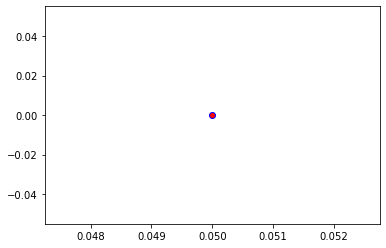

Crafting adversarial images took: 10.708245038986206 seconds 

Images classified as:
000000374545 557 = flagpole
000000374551 20 = water ouzel
Min values in image-array: 0.0 Max values in image-array: 254.82323
Min values in image-array: 0.0 Max values in image-array: 0.9993068
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


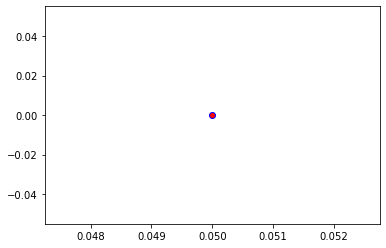

Crafting adversarial images took: 9.545518159866333 seconds 

Images classified as:
000000374727 919 = street sign
000000374982 963 = pizza
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


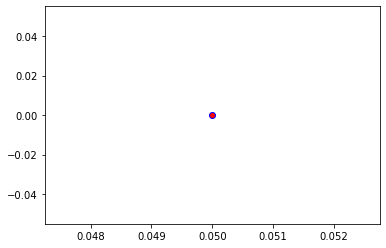

Crafting adversarial images took: 9.370849132537842 seconds 

Images classified as:
000000375015 295 = American black bear
000000375078 883 = vase
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


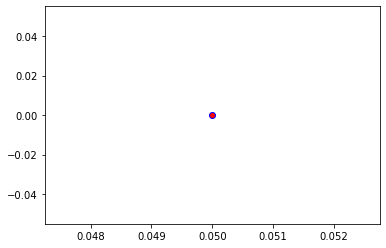

Crafting adversarial images took: 9.349696397781372 seconds 

Images classified as:
000000375278 223 = schipperke
000000375430 461 = plate
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


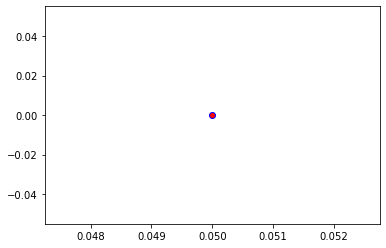

Crafting adversarial images took: 9.465525150299072 seconds 

Images classified as:
000000375469 693 = paddle
000000375493 655 = miniskirt
Min values in image-array: 0.0 Max values in image-array: 254.7143
Min values in image-array: 0.0 Max values in image-array: 0.9988796
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


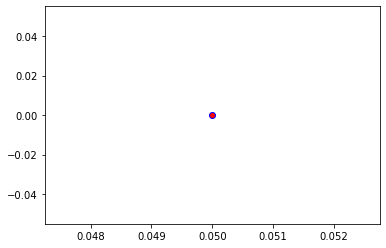

Crafting adversarial images took: 9.689879179000854 seconds 

Images classified as:
000000375763 346 = water buffalo
000000376093 618 = ladle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


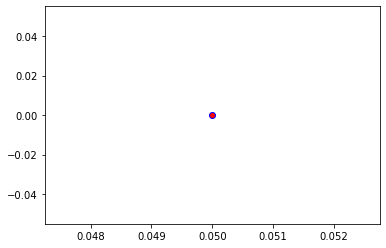

Crafting adversarial images took: 9.52769684791565 seconds 

Images classified as:
000000376112 248 = ski
000000376206 693 = paddle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


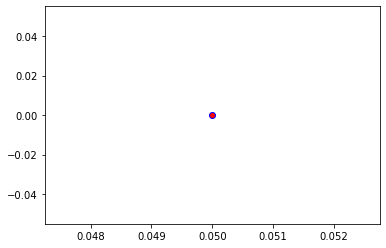

Crafting adversarial images took: 9.725136756896973 seconds 

Images classified as:
000000376264 551 = face powder
000000376278 340 = zebra
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


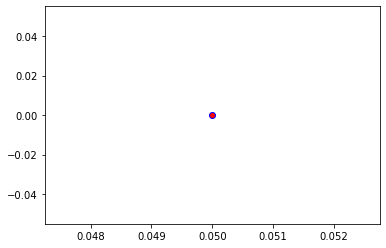

Crafting adversarial images took: 10.188112497329712 seconds 

Images classified as:
000000376284 704 = parking meter
000000376307 954 = banana
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


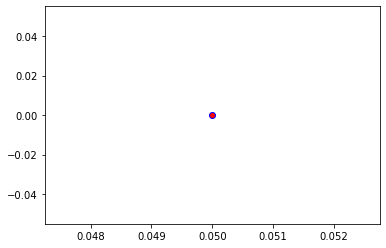

Crafting adversarial images took: 9.558419704437256 seconds 

Images classified as:
000000376310 648 = medicine chest
000000376322 762 = restaurant
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


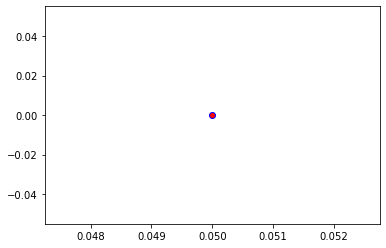

Crafting adversarial images took: 9.653463363647461 seconds 

Images classified as:
000000376365 883 = vase
000000376442 861 = toilet seat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


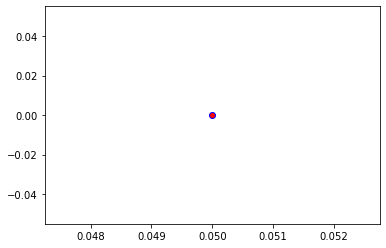

Crafting adversarial images took: 9.55528974533081 seconds 

Images classified as:
000000376478 883 = vase
000000376625 829 = streetcar
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


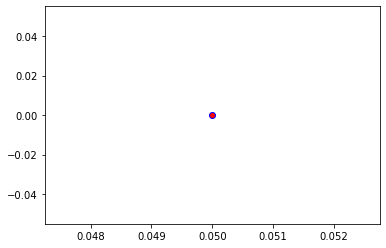

Crafting adversarial images took: 9.525720834732056 seconds 

Images classified as:
000000376856 442 = bell cote
000000376900 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


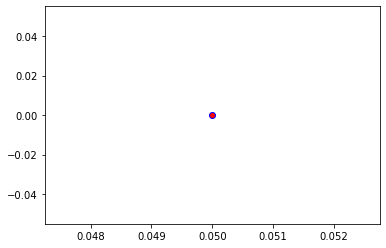

Crafting adversarial images took: 9.414896726608276 seconds 

Images classified as:
000000377000 283 = Persian cat
000000377113 792 = shovel
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


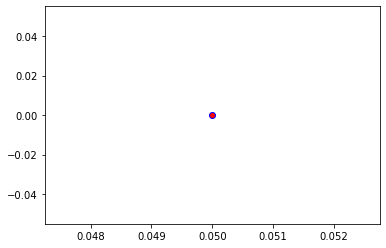

Crafting adversarial images took: 9.318569898605347 seconds 

Images classified as:
000000377239 879 = umbrella
000000377368 868 = tray
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


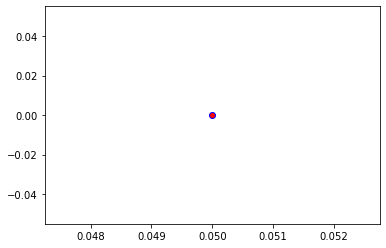

Crafting adversarial images took: 9.5416579246521 seconds 

Images classified as:
000000377393 417 = balloon
000000377486 346 = water buffalo
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


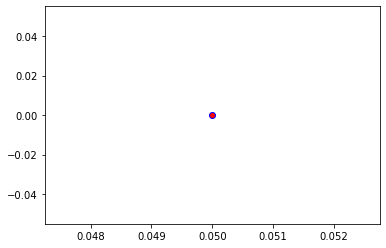

Crafting adversarial images took: 9.34297513961792 seconds 

Images classified as:
000000377497 340 = zebra
000000377575 221 = Irish water spaniel
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


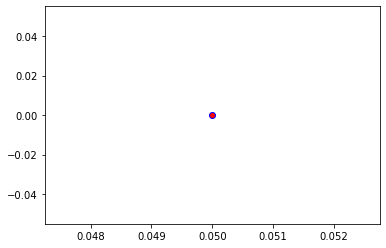

Crafting adversarial images took: 9.214101791381836 seconds 

Images classified as:
000000377588 981 = ballplayer
000000377635 880 = unicycle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


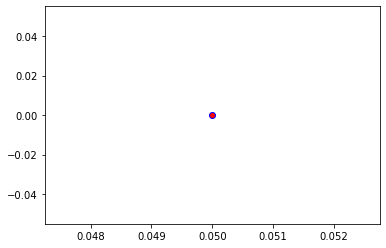

Crafting adversarial images took: 9.307678699493408 seconds 

Images classified as:
000000377670 726 = plane
000000377723 874 = trolleybus
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


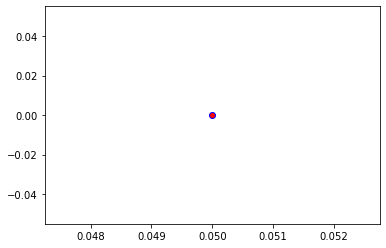

Crafting adversarial images took: 9.303350448608398 seconds 

Images classified as:
000000377814 931 = bagel
000000377882 489 = chainlink fence
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


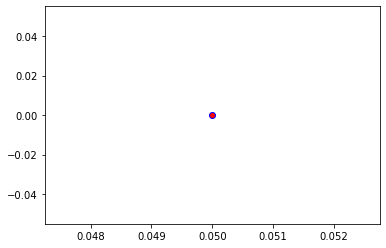

Crafting adversarial images took: 10.204056024551392 seconds 

Images classified as:
000000377946 407 = ambulance
000000378099 673 = mouse
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


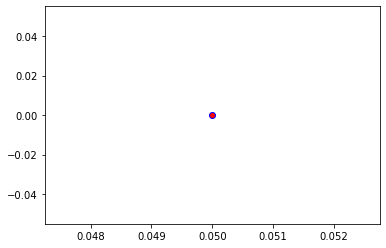

Crafting adversarial images took: 9.317772626876831 seconds 

Images classified as:
000000378116 58 = water snake
000000378139 408 = amphibian
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


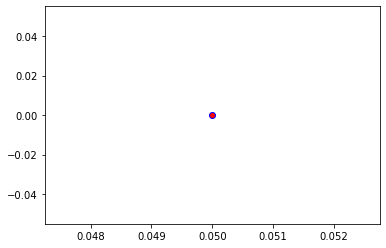

Crafting adversarial images took: 9.494795560836792 seconds 

Images classified as:
000000378244 248 = ski
000000378284 963 = pizza
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


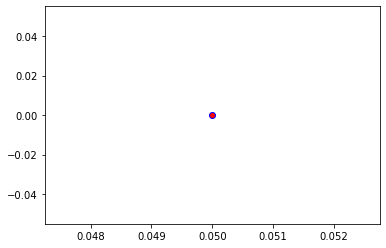

Crafting adversarial images took: 9.516646146774292 seconds 

Images classified as:
000000378453 340 = zebra
000000378454 977 = sandbar
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


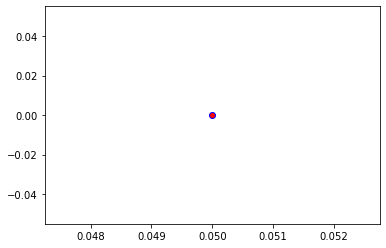

Crafting adversarial images took: 9.398164510726929 seconds 

Images classified as:
000000378515 582 = grocery store
000000378605 334 = cup
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


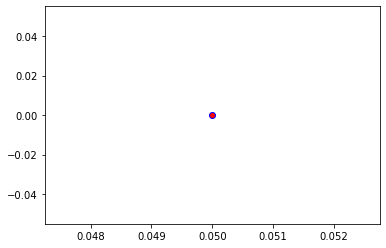

Crafting adversarial images took: 9.505406379699707 seconds 

Images classified as:
000000378673 880 = unicycle
000000378873 582 = grocery store
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


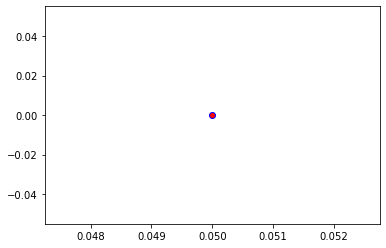

Crafting adversarial images took: 9.618411302566528 seconds 

Images classified as:
000000379332 890 = volleyball
000000379441 453 = bookcase
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


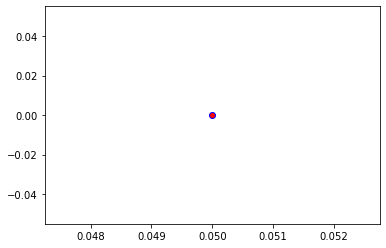

Crafting adversarial images took: 10.971826553344727 seconds 

Images classified as:
000000379453 404 = airliner
000000379476 884 = vault
Min values in image-array: 0.06935892 Max values in image-array: 255.0
Min values in image-array: 0.00027199578 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


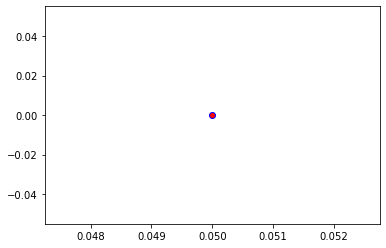

Crafting adversarial images took: 13.152692079544067 seconds 

Images classified as:
000000379533 340 = zebra
000000379800 547 = electric locomotive
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


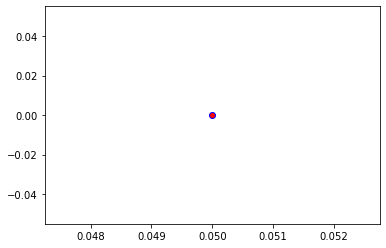

Crafting adversarial images took: 12.68288540840149 seconds 

Images classified as:
000000379842 131 = rule
000000380203 5 = ram
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


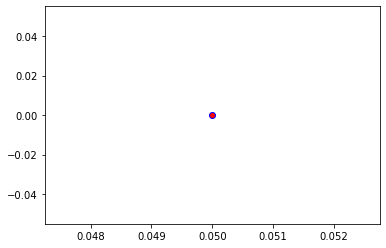

Crafting adversarial images took: 11.89454984664917 seconds 

Images classified as:
000000380706 880 = unicycle
000000380711 433 = bathing cap
Min values in image-array: 0.0 Max values in image-array: 254.17188
Min values in image-array: 0.0 Max values in image-array: 0.99675244
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


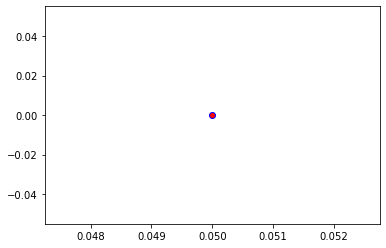

Crafting adversarial images took: 12.651479005813599 seconds 

Images classified as:
000000380913 575 = golfcart
000000381360 842 = swimming trunks
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


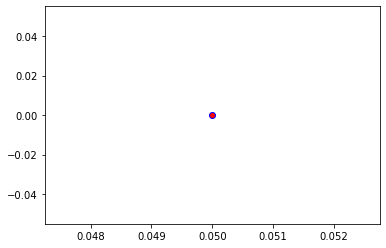

Crafting adversarial images took: 12.808337211608887 seconds 

Images classified as:
000000381587 922 = menu
000000381639 702 = parallel bars
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


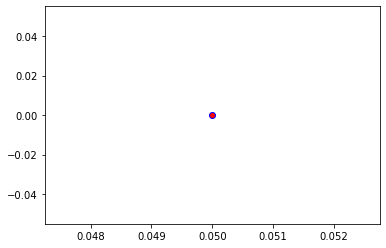

Crafting adversarial images took: 10.963616847991943 seconds 

Images classified as:
000000381971 603 = horse cart
000000382009 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


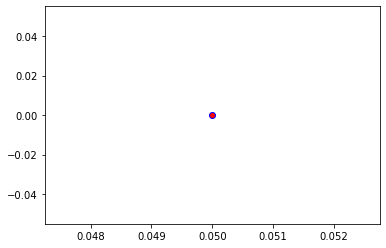

Crafting adversarial images took: 11.20521092414856 seconds 

Images classified as:
000000382030 774 = sandal
000000382088 339 = sorrel
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


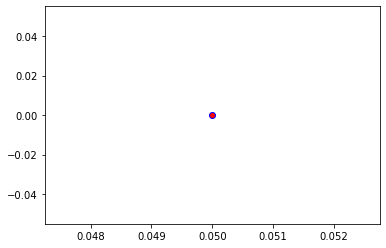

Crafting adversarial images took: 11.087801933288574 seconds 

Images classified as:
000000382111 603 = horse cart
000000382122 497 = church
Min values in image-array: 0.0 Max values in image-array: 254.22656
Min values in image-array: 0.0 Max values in image-array: 0.9969669
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


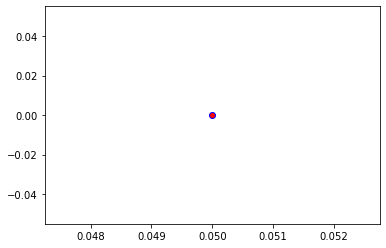

Crafting adversarial images took: 11.466681003570557 seconds 

Images classified as:
000000382125 927 = trifle
000000382696 519 = crate
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


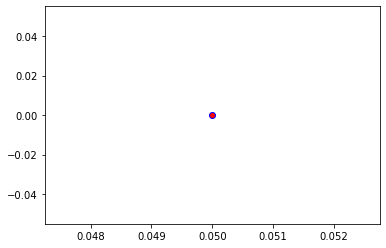

Crafting adversarial images took: 10.414361476898193 seconds 

Images classified as:
000000382734 648 = medicine chest
000000382743 557 = flagpole
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


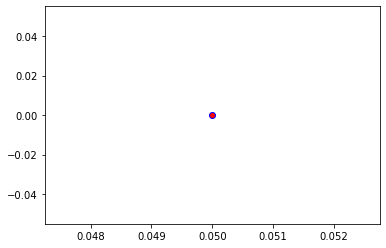

Crafting adversarial images took: 11.40990924835205 seconds 

Images classified as:
000000383289 704 = parking meter
000000383337 961 = dough
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


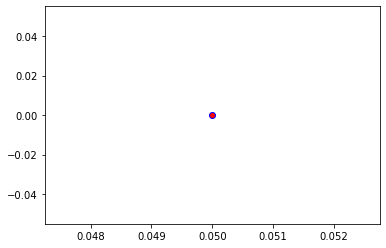

Crafting adversarial images took: 10.224900722503662 seconds 

Images classified as:
000000383339 978 = seashore
000000383384 981 = ballplayer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


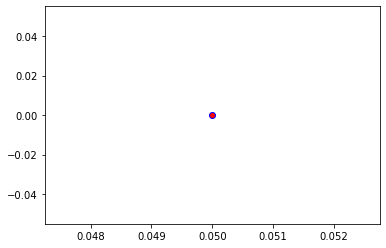

Crafting adversarial images took: 12.70229959487915 seconds 

Images classified as:
000000383386 850 = teddy
000000383443 435 = tub
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


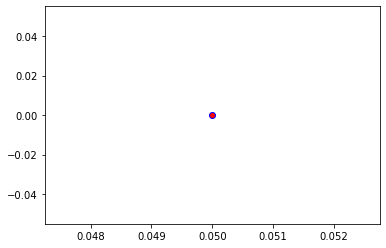

Crafting adversarial images took: 13.497862339019775 seconds 

Images classified as:
000000383606 896 = washbasin
000000383621 895 = warplane
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


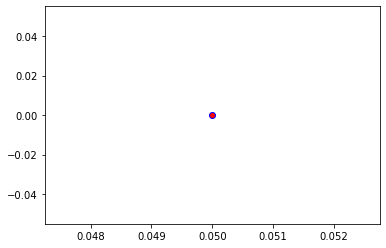

Crafting adversarial images took: 12.982649087905884 seconds 

Images classified as:
000000383676 293 = cheetah
000000383838 585 = hair spray
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


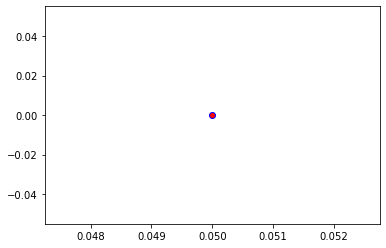

Crafting adversarial images took: 12.863268375396729 seconds 

Images classified as:
000000383842 617 = lab coat
000000383921 385 = Indian elephant
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


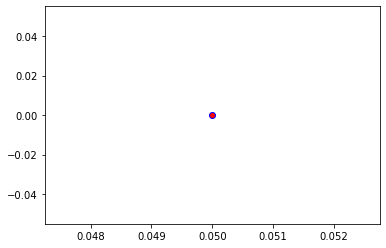

Crafting adversarial images took: 13.766300201416016 seconds 

Images classified as:
000000384136 589 = hand blower
000000384350 318 = wing
Min values in image-array: 1.073815 Max values in image-array: 255.0
Min values in image-array: 0.0042110393 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


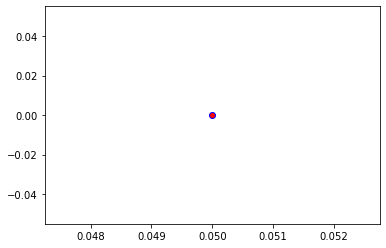

Crafting adversarial images took: 13.645920276641846 seconds 

Images classified as:
000000384468 385 = Indian elephant
000000384513 603 = horse cart
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


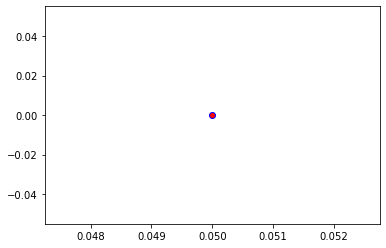

Crafting adversarial images took: 13.430805206298828 seconds 

Images classified as:
000000384527 495 = china cabinet
000000384616 358 = pole
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


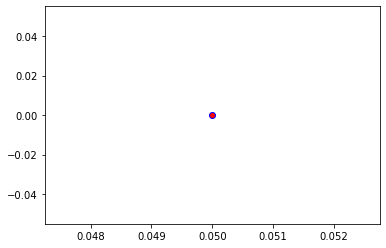

Crafting adversarial images took: 12.952966451644897 seconds 

Images classified as:
000000384651 526 = desk
000000384661 827 = stove
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


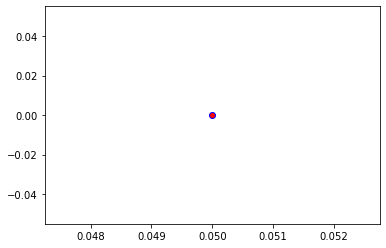

Crafting adversarial images took: 12.908601522445679 seconds 

Images classified as:
000000384666 248 = ski
000000384670 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


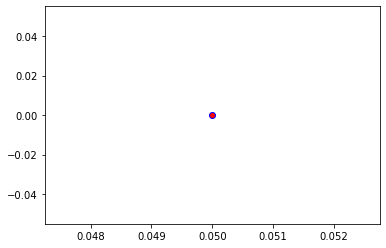

Crafting adversarial images took: 13.565406799316406 seconds 

Images classified as:
000000384808 896 = washbasin
000000384850 794 = shower curtain
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


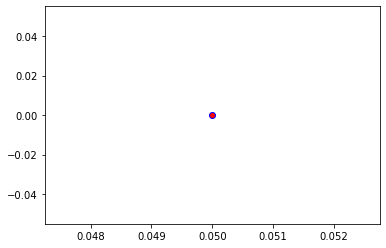

Crafting adversarial images took: 12.002441644668579 seconds 

Images classified as:
000000384949 713 = pier
000000385029 461 = plate
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


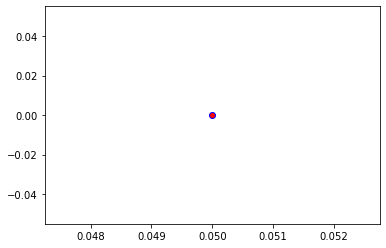

Crafting adversarial images took: 12.091405630111694 seconds 

Images classified as:
000000385190 571 = gas pump
000000385205 281 = tabby
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


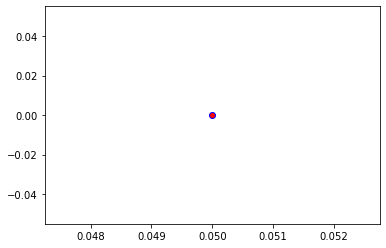

Crafting adversarial images took: 13.293219327926636 seconds 

Images classified as:
000000385719 527 = desktop computer
000000385997 581 = radiator
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


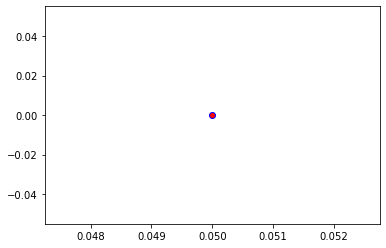

Crafting adversarial images took: 12.729893445968628 seconds 

Images classified as:
000000386134 962 = meat loaf
000000386210 28 = pot
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


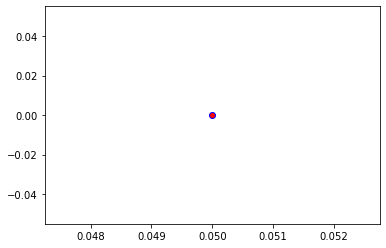

Crafting adversarial images took: 13.099258184432983 seconds 

Images classified as:
000000386277 951 = lemon
000000386352 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


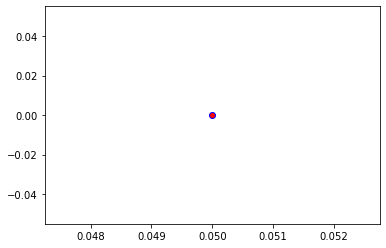

Crafting adversarial images took: 13.419871091842651 seconds 

Images classified as:
000000386457 894 = wardrobe
000000386879 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


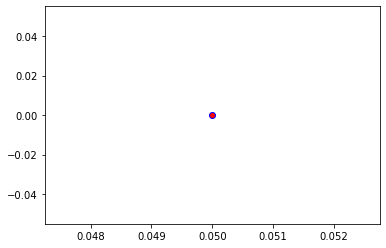

Crafting adversarial images took: 12.282179355621338 seconds 

Images classified as:
000000386912 454 = bookshop
000000387098 527 = desktop computer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


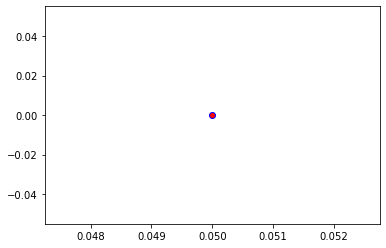

Crafting adversarial images took: 13.525529384613037 seconds 

Images classified as:
000000387148 649 = megalith
000000387383 797 = sleeping bag
Min values in image-array: 0.0 Max values in image-array: 254.35991
Min values in image-array: 0.0 Max values in image-array: 0.9974898
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


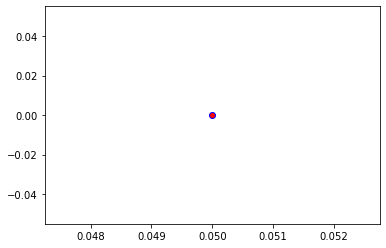

Crafting adversarial images took: 14.620100498199463 seconds 

Images classified as:
000000387387 779 = school bus
000000387916 140 = alp
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


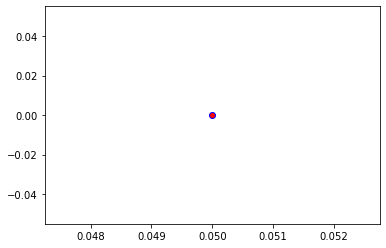

Crafting adversarial images took: 13.183643341064453 seconds 

Images classified as:
000000388056 981 = ballplayer
000000388215 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


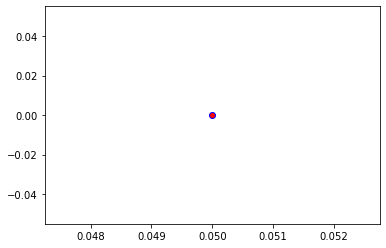

Crafting adversarial images took: 13.090624809265137 seconds 

Images classified as:
000000388258 444 = bicycle-built-for-two
000000388846 978 = seashore
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


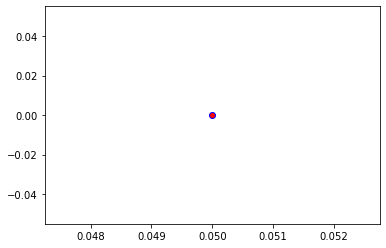

Crafting adversarial images took: 12.129528522491455 seconds 

Images classified as:
000000388903 582 = grocery store
000000388927 487 = cellular telephone
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


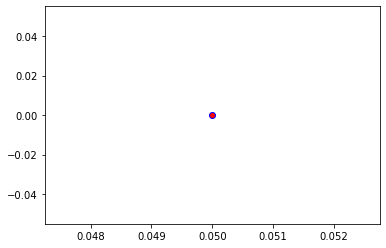

Crafting adversarial images took: 13.67369031906128 seconds 

Images classified as:
000000389109 926 = hot pot
000000389197 842 = swimming trunks
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


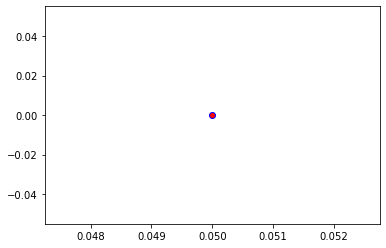

Crafting adversarial images took: 12.67660140991211 seconds 

Images classified as:
000000389315 692 = packet
000000389316 385 = Indian elephant
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


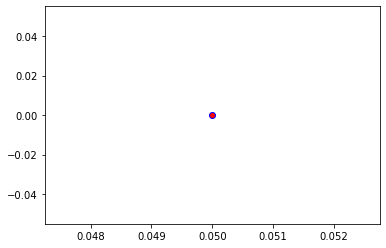

Crafting adversarial images took: 12.353158235549927 seconds 

Images classified as:
000000389381 934 = hotdog
000000389451 354 = Arabian camel
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


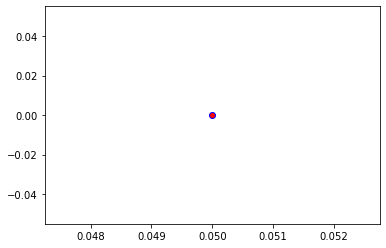

Crafting adversarial images took: 12.884779691696167 seconds 

Images classified as:
000000389532 557 = flagpole
000000389566 67 = dam
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


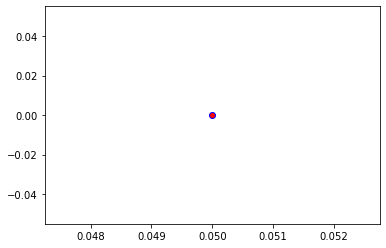

Crafting adversarial images took: 12.451197385787964 seconds 

Images classified as:
000000389684 874 = trolleybus
000000389804 896 = washbasin
Min values in image-array: 0.0 Max values in image-array: 254.86618
Min values in image-array: 0.0 Max values in image-array: 0.99947524
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


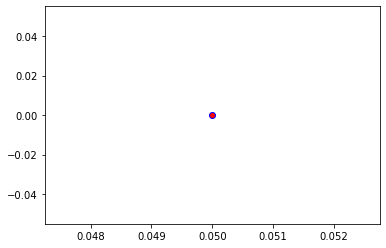

Crafting adversarial images took: 14.089826583862305 seconds 

Images classified as:
000000389812 955 = jackfruit
000000389933 159 = Rhodesian ridgeback
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


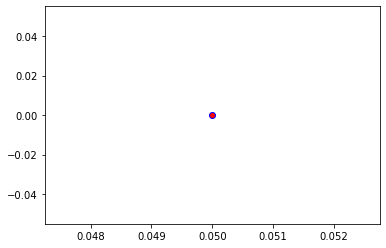

Crafting adversarial images took: 13.353007793426514 seconds 

Images classified as:
000000390246 150 = sea lion
000000390301 297 = sloth bear
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


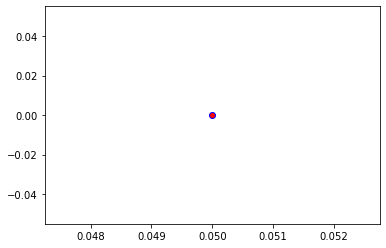

Crafting adversarial images took: 13.193589925765991 seconds 

Images classified as:
000000390555 715 = pickelhaube
000000390826 388 = giant panda
Min values in image-array: 0.18072541 Max values in image-array: 254.84694
Min values in image-array: 0.0007087271 Max values in image-array: 0.9993998
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


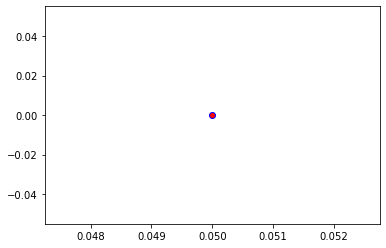

Crafting adversarial images took: 12.507949829101562 seconds 

Images classified as:
000000390902 752 = racket
000000391140 731 = plunger
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


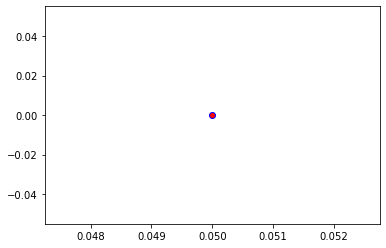

Crafting adversarial images took: 12.94150185585022 seconds 

Images classified as:
000000391144 386 = African elephant
000000391290 805 = soccer ball
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


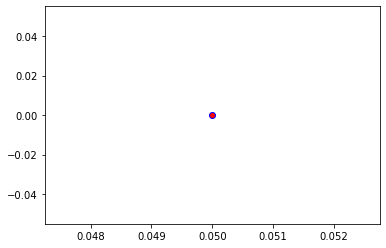

Crafting adversarial images took: 11.372844457626343 seconds 

Images classified as:
000000391375 884 = vault
000000391648 442 = bell cote
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


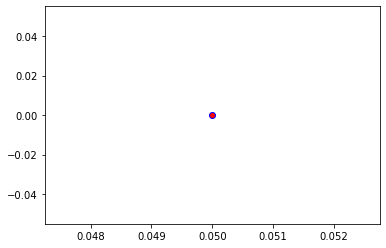

Crafting adversarial images took: 11.488355875015259 seconds 

Images classified as:
000000391722 470 = candle
000000392228 442 = bell cote
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


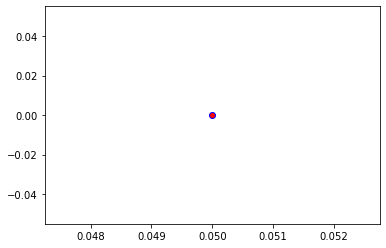

Crafting adversarial images took: 11.619630575180054 seconds 

Images classified as:
000000392481 21 = kite
000000392722 874 = trolleybus
Min values in image-array: 0.050223827 Max values in image-array: 255.0
Min values in image-array: 0.00019695619 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


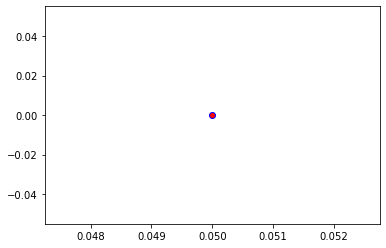

Crafting adversarial images took: 11.87677526473999 seconds 

Images classified as:
000000392818 156 = Blenheim spaniel
000000392933 293 = cheetah
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


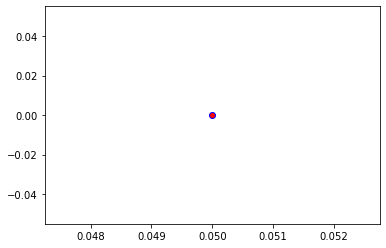

Crafting adversarial images took: 13.16741156578064 seconds 

Images classified as:
000000393014 415 = bakery
000000393056 460 = breakwater
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


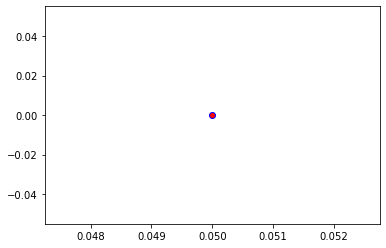

Crafting adversarial images took: 11.777898788452148 seconds 

Images classified as:
000000393093 829 = streetcar
000000393115 726 = plane
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


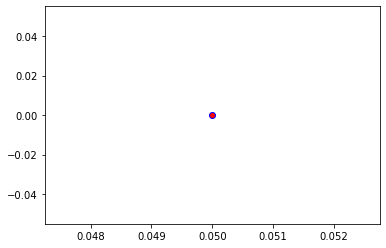

Crafting adversarial images took: 11.438173294067383 seconds 

Images classified as:
000000393226 829 = streetcar
000000393282 354 = Arabian camel
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


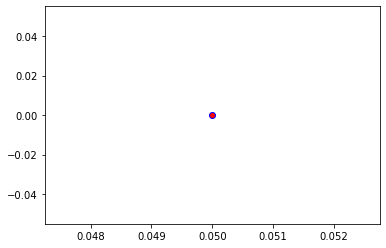

Crafting adversarial images took: 11.636439561843872 seconds 

Images classified as:
000000393469 140 = alp
000000393569 495 = china cabinet
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


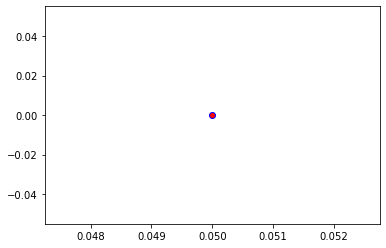

Crafting adversarial images took: 11.400369644165039 seconds 

Images classified as:
000000393838 909 = wok
000000394199 665 = moped
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


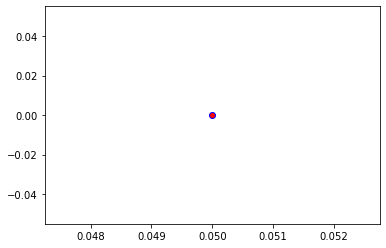

Crafting adversarial images took: 11.850404977798462 seconds 

Images classified as:
000000394206 569 = garbage truck
000000394275 874 = trolleybus
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


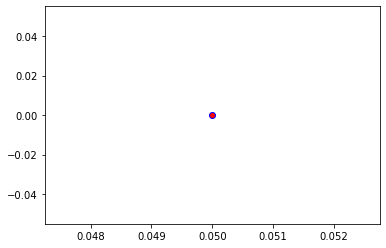

Crafting adversarial images took: 11.552960634231567 seconds 

Images classified as:
000000394328 861 = toilet seat
000000394510 792 = shovel
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


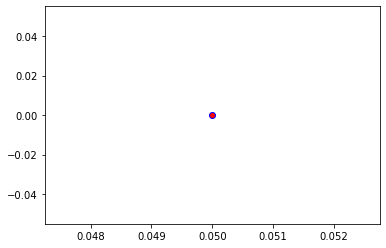

Crafting adversarial images took: 11.438117027282715 seconds 

Images classified as:
000000394559 752 = racket
000000394611 275 = hyena
Min values in image-array: 4.7652855 Max values in image-array: 255.0
Min values in image-array: 0.018687394 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


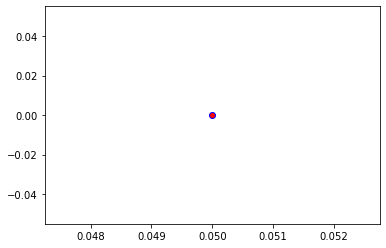

Crafting adversarial images took: 11.467291831970215 seconds 

Images classified as:
000000394677 513 = cornet
000000394940 961 = dough
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


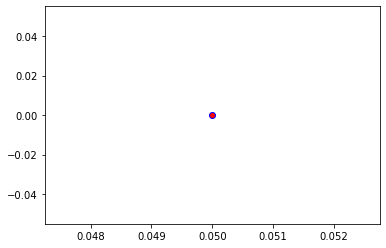

Crafting adversarial images took: 11.450334310531616 seconds 

Images classified as:
000000395180 975 = lakeside
000000395343 883 = vase
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


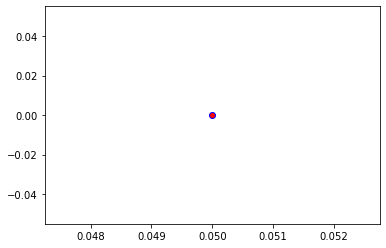

Crafting adversarial images took: 12.483880996704102 seconds 

Images classified as:
000000395388 634 = lumbermill
000000395575 449 = boathouse
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


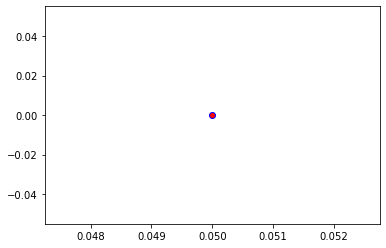

Crafting adversarial images took: 11.622290134429932 seconds 

Images classified as:
000000395633 554 = fireboat
000000395701 453 = bookcase
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


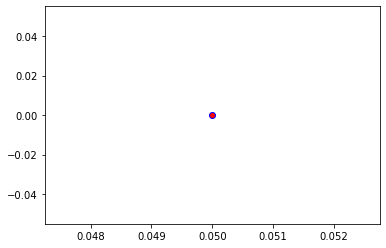

Crafting adversarial images took: 11.486145973205566 seconds 

Images classified as:
000000395801 880 = unicycle
000000395903 638 = maillot
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


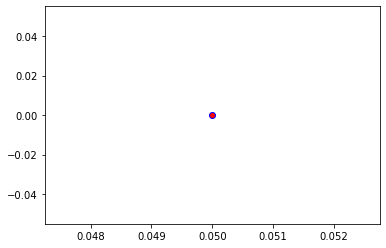

Crafting adversarial images took: 10.74775242805481 seconds 

Images classified as:
000000396200 880 = unicycle
000000396205 347 = bison
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


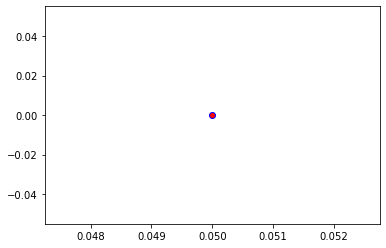

Crafting adversarial images took: 10.612013339996338 seconds 

Images classified as:
000000396274 28 = pot
000000396338 569 = garbage truck
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


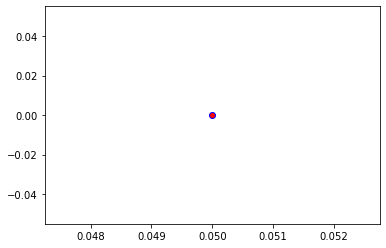

Crafting adversarial images took: 11.003894090652466 seconds 

Images classified as:
000000396518 472 = canoe
000000396526 905 = window shade
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


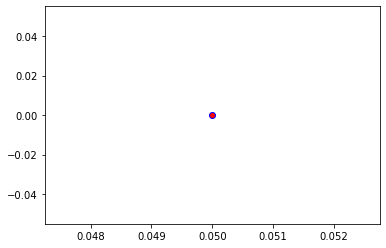

Crafting adversarial images took: 10.766981601715088 seconds 

Images classified as:
000000396568 565 = freight car
000000396580 449 = boathouse
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


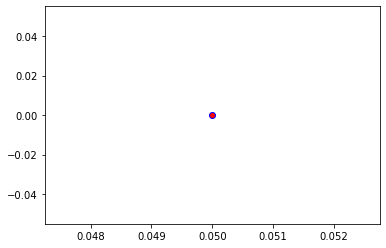

Crafting adversarial images took: 10.908246040344238 seconds 

Images classified as:
000000396729 761 = remote control
000000396863 354 = Arabian camel
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


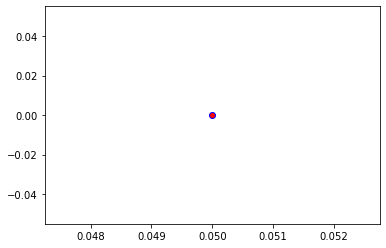

Crafting adversarial images took: 11.824232816696167 seconds 

Images classified as:
000000396903 895 = warplane
000000397133 467 = butcher shop
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


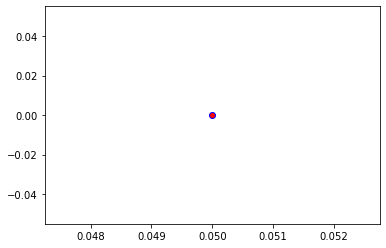

Crafting adversarial images took: 10.392506837844849 seconds 

Images classified as:
000000397279 752 = racket
000000397303 617 = lab coat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


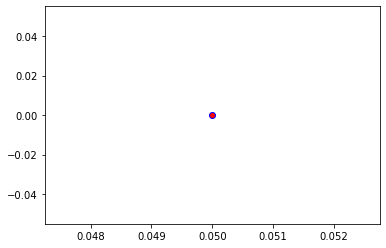

Crafting adversarial images took: 11.845948219299316 seconds 

Images classified as:
000000397327 861 = toilet seat
000000397351 105 = ear
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


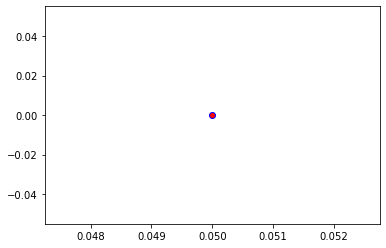

Crafting adversarial images took: 10.581168413162231 seconds 

Images classified as:
000000397354 624 = library
000000397639 5 = ram
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


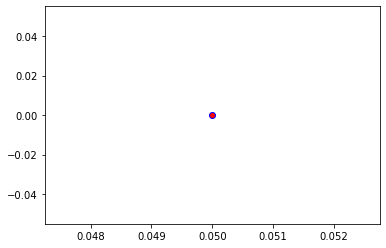

Crafting adversarial images took: 10.483948469161987 seconds 

Images classified as:
000000397681 721 = pillow
000000398028 981 = ballplayer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


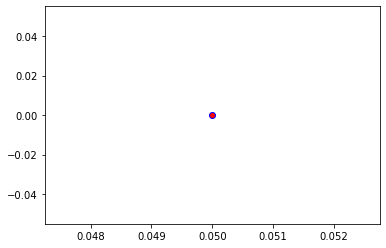

Crafting adversarial images took: 10.595641613006592 seconds 

Images classified as:
000000398203 805 = soccer ball
000000398237 463 = bucket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


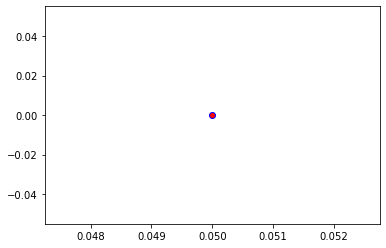

Crafting adversarial images took: 10.677683115005493 seconds 

Images classified as:
000000398377 652 = military uniform
000000398438 938 = cauliflower
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


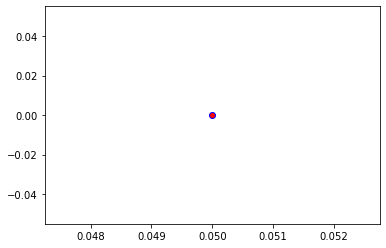

Crafting adversarial images took: 10.549492597579956 seconds 

Images classified as:
000000398652 28 = pot
000000398742 768 = rugby ball
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


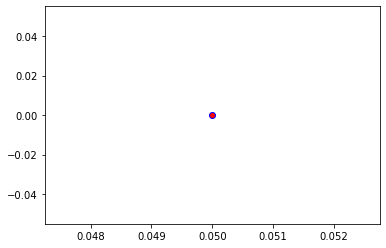

Crafting adversarial images took: 10.674675703048706 seconds 

Images classified as:
000000398810 904 = window screen
000000398905 819 = stage
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


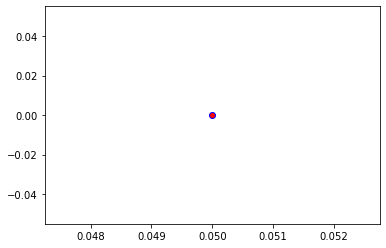

Crafting adversarial images took: 10.617485046386719 seconds 

Images classified as:
000000399205 585 = hair spray
000000399296 644 = matchstick
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


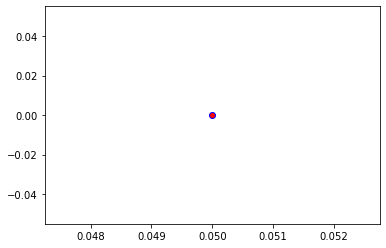

Crafting adversarial images took: 10.518941640853882 seconds 

Images classified as:
000000399462 416 = balance beam
000000399560 999 = toilet tissue
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


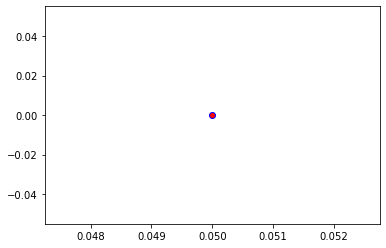

Crafting adversarial images took: 10.484700202941895 seconds 

Images classified as:
000000399655 245 = French bulldog
000000399764 37 = ox
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


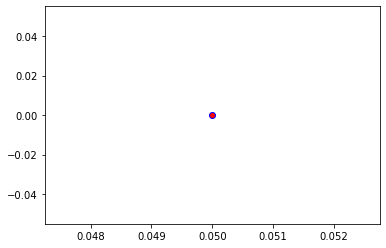

Crafting adversarial images took: 10.26647424697876 seconds 

Images classified as:
000000400044 248 = ski
000000400082 934 = hotdog
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


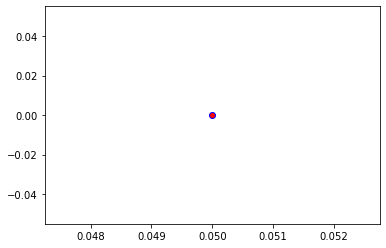

Crafting adversarial images took: 12.828461647033691 seconds 

Images classified as:
000000400161 431 = bassinet
000000400367 324 = cab
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


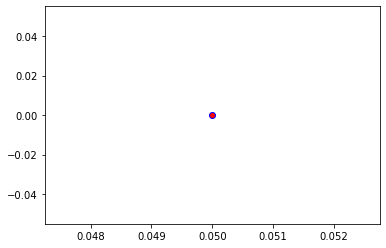

Crafting adversarial images took: 14.992169857025146 seconds 

Images classified as:
000000400573 934 = hotdog
000000400794 461 = plate
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


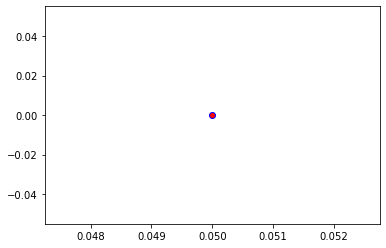

Crafting adversarial images took: 12.173317670822144 seconds 

Images classified as:
000000400803 625 = lifeboat
000000400815 807 = solar dish
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


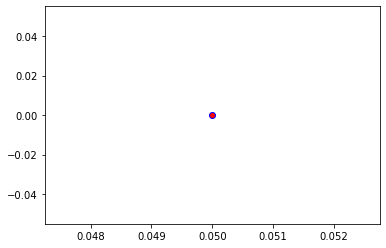

Crafting adversarial images took: 11.916215419769287 seconds 

Images classified as:
000000400922 919 = street sign
000000401244 805 = soccer ball
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


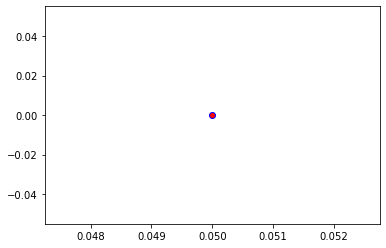

Crafting adversarial images took: 12.175305128097534 seconds 

Images classified as:
000000401250 895 = warplane
000000401446 655 = miniskirt
Min values in image-array: 0.0 Max values in image-array: 254.50255
Min values in image-array: 0.0 Max values in image-array: 0.9980492
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


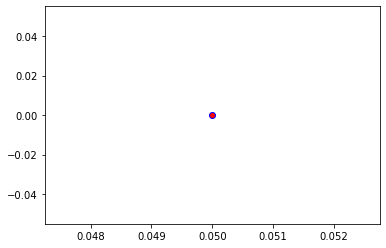

Crafting adversarial images took: 11.161006212234497 seconds 

Images classified as:
000000401862 829 = streetcar
000000401991 153 = Maltese dog
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


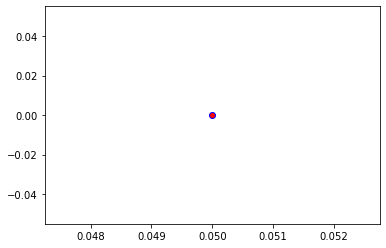

Crafting adversarial images took: 10.697973251342773 seconds 

Images classified as:
000000402096 919 = street sign
000000402118 248 = ski
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


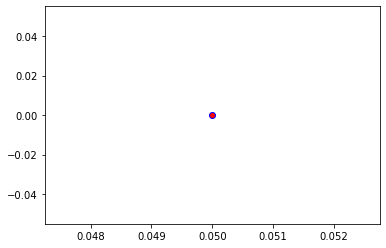

Crafting adversarial images took: 10.513320922851562 seconds 

Images classified as:
000000402334 497 = church
000000402346 883 = vase
Min values in image-array: 0.0 Max values in image-array: 253.28574
Min values in image-array: 0.0 Max values in image-array: 0.9932774
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


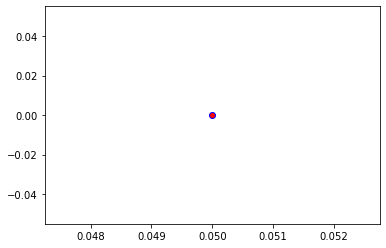

Crafting adversarial images took: 10.324443101882935 seconds 

Images classified as:
000000402433 963 = pizza
000000402473 282 = tiger cat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


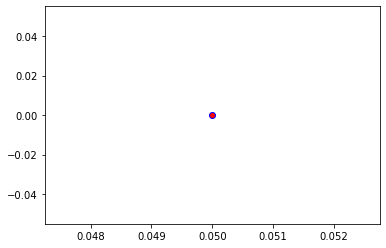

Crafting adversarial images took: 10.54954195022583 seconds 

Images classified as:
000000402519 95 = jacamar
000000402615 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


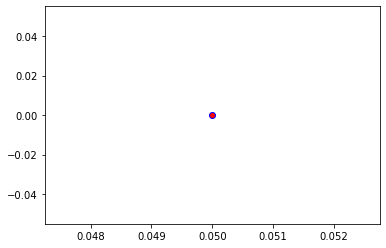

Crafting adversarial images took: 11.451490640640259 seconds 

Images classified as:
000000402720 762 = restaurant
000000402765 761 = remote control
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


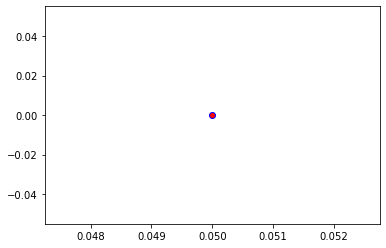

Crafting adversarial images took: 10.75242567062378 seconds 

Images classified as:
000000402774 879 = umbrella
000000402783 942 = butternut squash
Min values in image-array: 0.0 Max values in image-array: 254.99998
Min values in image-array: 0.0 Max values in image-array: 0.99999994
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


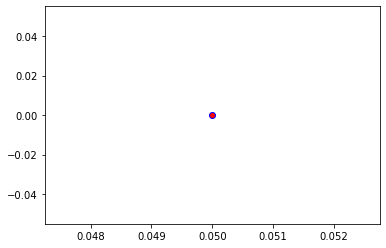

Crafting adversarial images took: 11.254514694213867 seconds 

Images classified as:
000000402992 211 = vizsla
000000403122 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


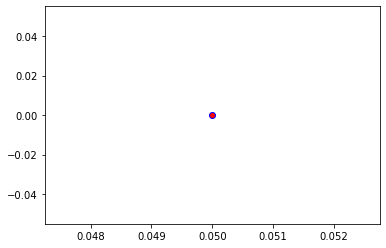

Crafting adversarial images took: 11.491291046142578 seconds 

Images classified as:
000000403353 846 = table lamp
000000403385 861 = toilet seat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


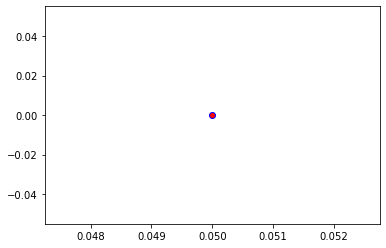

Crafting adversarial images took: 12.854948997497559 seconds 

Images classified as:
000000403565 671 = mountain bike
000000403584 978 = seashore
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


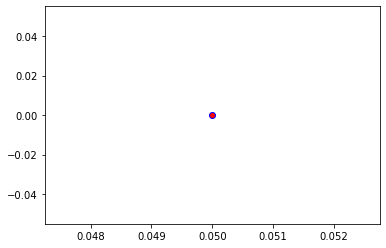

Crafting adversarial images took: 12.545459508895874 seconds 

Images classified as:
000000403817 664 = monitor
000000404128 895 = warplane
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


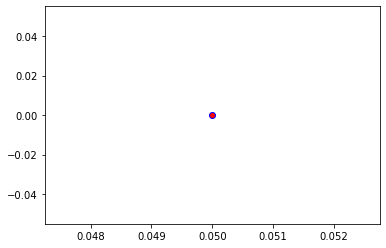

Crafting adversarial images took: 13.021157264709473 seconds 

Images classified as:
000000404191 896 = washbasin
000000404249 880 = unicycle
Min values in image-array: 0.0 Max values in image-array: 254.587
Min values in image-array: 0.0 Max values in image-array: 0.9983804
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


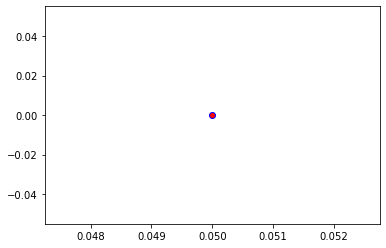

Crafting adversarial images took: 11.019373416900635 seconds 

Images classified as:
000000404479 404 = airliner
000000404484 253 = basenji
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


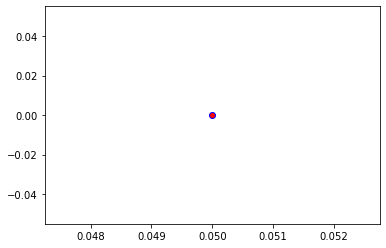

Crafting adversarial images took: 11.31333875656128 seconds 

Images classified as:
000000404534 424 = barbershop
000000404568 146 = albatross
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


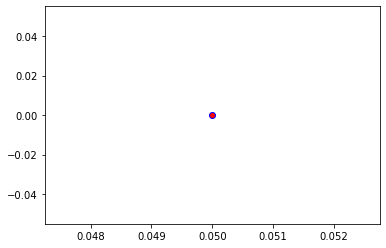

Crafting adversarial images took: 12.174503803253174 seconds 

Images classified as:
000000404601 919 = street sign
000000404678 762 = restaurant
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


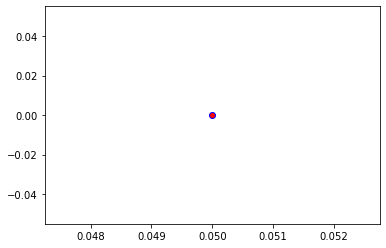

Crafting adversarial images took: 11.432977199554443 seconds 

Images classified as:
000000404805 445 = bikini
000000404839 456 = bow
Min values in image-array: 0.0 Max values in image-array: 254.57144
Min values in image-array: 0.0 Max values in image-array: 0.9983194
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


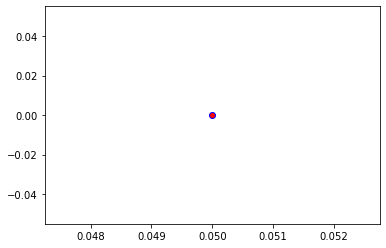

Crafting adversarial images took: 11.924038887023926 seconds 

Images classified as:
000000404922 752 = racket
000000404923 981 = ballplayer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


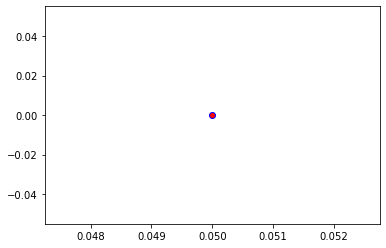

Crafting adversarial images took: 11.023696184158325 seconds 

Images classified as:
000000405195 415 = bakery
000000405205 874 = trolleybus
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


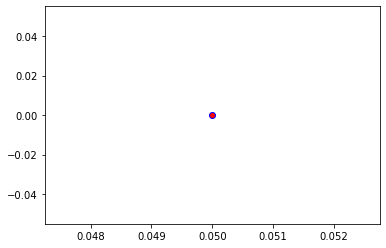

Crafting adversarial images took: 11.221163511276245 seconds 

Images classified as:
000000405249 470 = candle
000000405279 975 = lakeside
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


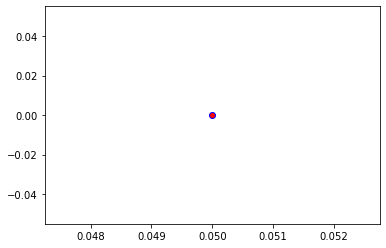

Crafting adversarial images took: 11.161248683929443 seconds 

Images classified as:
000000405306 281 = tabby
000000405432 502 = clog
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


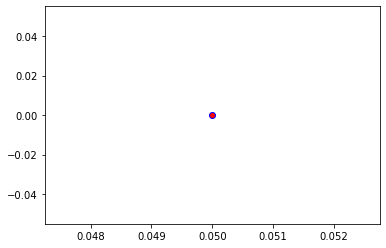

Crafting adversarial images took: 11.051936864852905 seconds 

Images classified as:
000000405691 966 = red wine
000000405970 789 = shoji
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


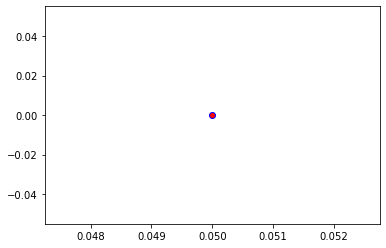

Crafting adversarial images took: 11.262892723083496 seconds 

Images classified as:
000000405972 385 = Indian elephant
000000406129 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


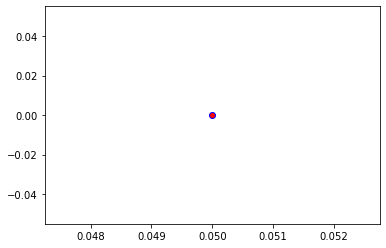

Crafting adversarial images took: 11.218238830566406 seconds 

Images classified as:
000000406417 608 = jean
000000406570 509 = confectionery
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


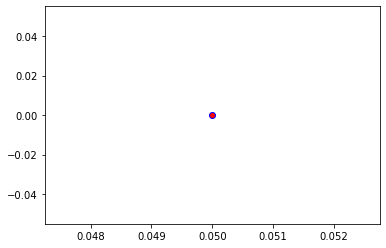

Crafting adversarial images took: 10.852251052856445 seconds 

Images classified as:
000000406611 140 = alp
000000406997 5 = ram
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


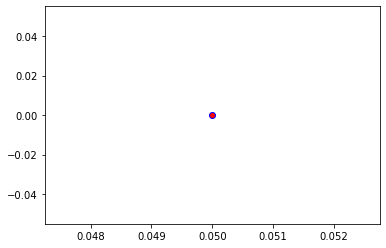

Crafting adversarial images took: 11.994994401931763 seconds 

Images classified as:
000000407002 248 = ski
000000407083 245 = French bulldog
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


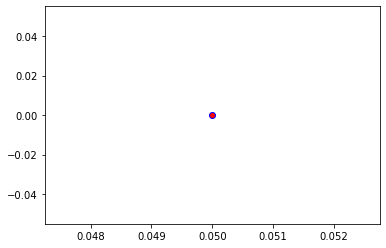

Crafting adversarial images took: 11.568627119064331 seconds 

Images classified as:
000000407298 429 = baseball
000000407403 899 = water jug
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


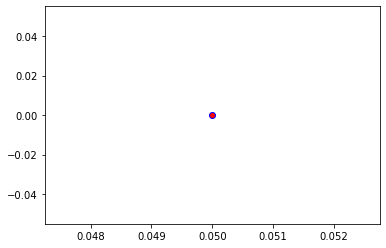

Crafting adversarial images took: 11.129964113235474 seconds 

Images classified as:
000000407518 15 = robin
000000407524 937 = broccoli
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


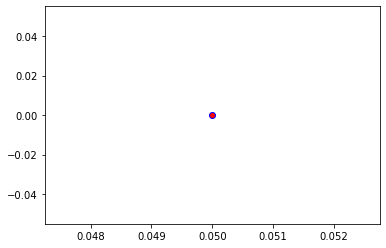

Crafting adversarial images took: 11.19324541091919 seconds 

Images classified as:
000000407574 954 = banana
000000407614 651 = microwave
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


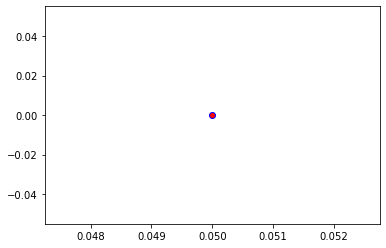

Crafting adversarial images took: 11.25099802017212 seconds 

Images classified as:
000000407646 752 = racket
000000407650 140 = alp
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


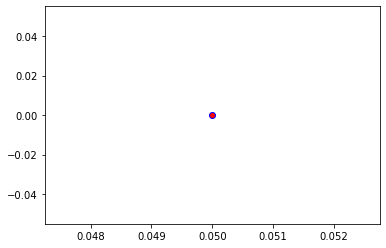

Crafting adversarial images took: 11.31636095046997 seconds 

Images classified as:
000000407825 409 = analog clock
000000407868 701 = parachute
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


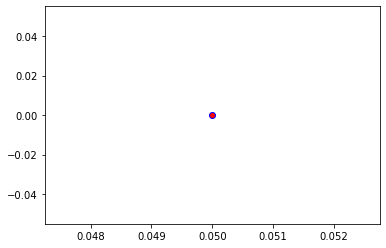

Crafting adversarial images took: 11.09989309310913 seconds 

Images classified as:
000000407943 999 = toilet tissue
000000407960 287 = lynx
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


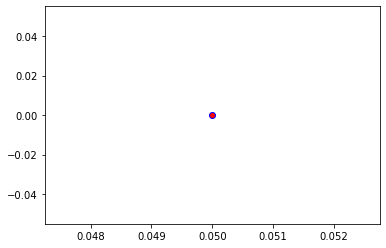

Crafting adversarial images took: 10.936749935150146 seconds 

Images classified as:
000000408112 895 = warplane
000000408120 421 = bannister
Min values in image-array: 0.0 Max values in image-array: 254.90178
Min values in image-array: 0.0 Max values in image-array: 0.99961483
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


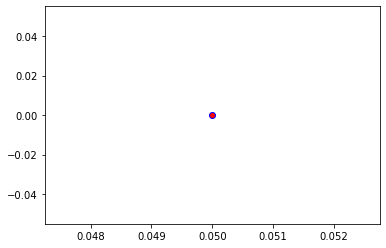

Crafting adversarial images took: 11.891557693481445 seconds 

Images classified as:
000000408696 861 = toilet seat
000000408774 981 = ballplayer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


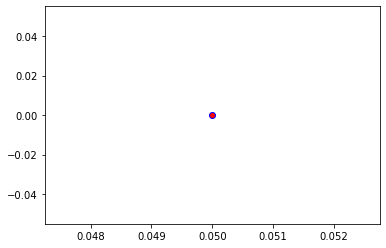

Crafting adversarial images took: 11.141515970230103 seconds 

Images classified as:
000000408830 670 = motor scooter
000000409198 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


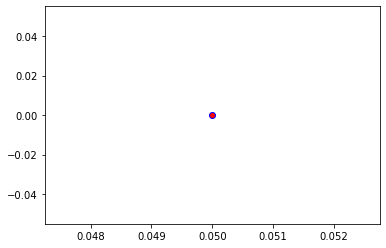

Crafting adversarial images took: 13.005875587463379 seconds 

Images classified as:
000000409211 752 = racket
000000409268 850 = teddy
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


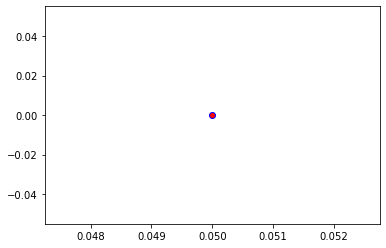

Crafting adversarial images took: 12.681346654891968 seconds 

Images classified as:
000000409358 896 = washbasin
000000409424 954 = banana
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


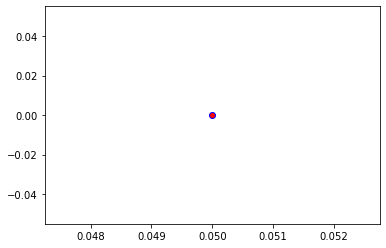

Crafting adversarial images took: 11.123980283737183 seconds 

Images classified as:
000000409475 248 = ski
000000409542 409 = analog clock
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


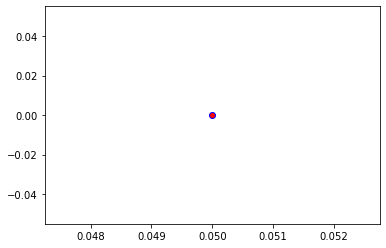

Crafting adversarial images took: 11.125319004058838 seconds 

Images classified as:
000000409630 673 = mouse
000000409867 799 = sliding door
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


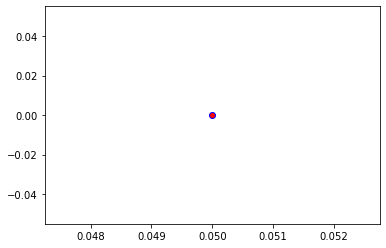

Crafting adversarial images took: 11.378589391708374 seconds 

Images classified as:
000000410221 127 = white stork
000000410428 5 = ram
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


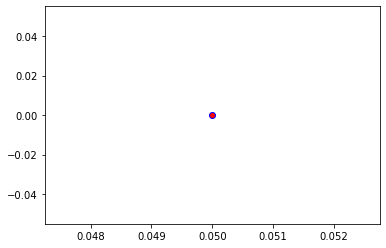

Crafting adversarial images took: 11.382087469100952 seconds 

Images classified as:
000000410456 977 = sandbar
000000410487 766 = rotisserie
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


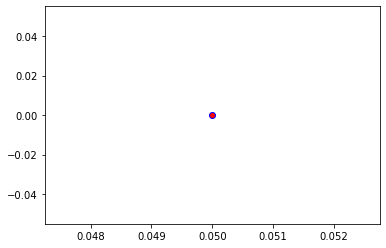

Crafting adversarial images took: 11.121154308319092 seconds 

Images classified as:
000000410496 752 = racket
000000410510 416 = balance beam
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


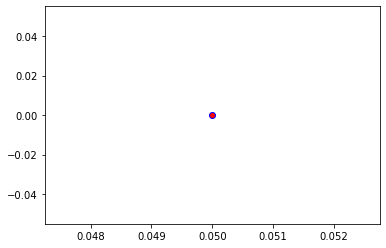

Crafting adversarial images took: 11.176250696182251 seconds 

Images classified as:
000000410612 554 = fireboat
000000410650 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


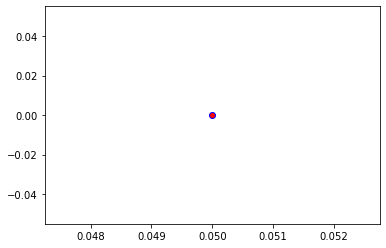

Crafting adversarial images took: 10.924350261688232 seconds 

Images classified as:
000000410712 920 = traffic light
000000410735 926 = hot pot
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


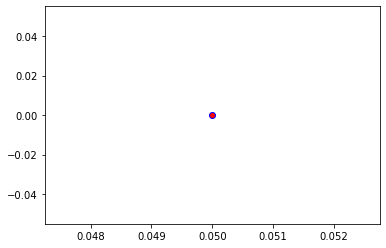

Crafting adversarial images took: 11.119059562683105 seconds 

Images classified as:
000000410878 670 = motor scooter
000000410880 267 = standard poodle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


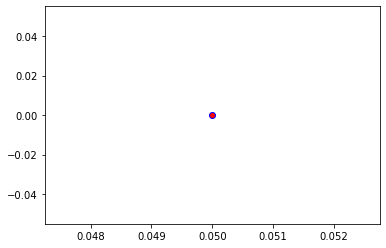

Crafting adversarial images took: 11.709948778152466 seconds 

Images classified as:
000000410934 937 = broccoli
000000411530 140 = alp
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


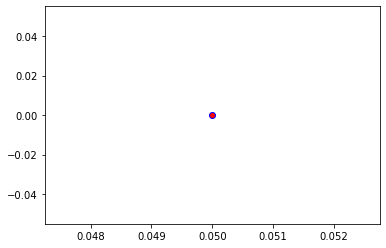

Crafting adversarial images took: 12.070831537246704 seconds 

Images classified as:
000000411665 333 = hamster
000000411754 691 = oxygen mask
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


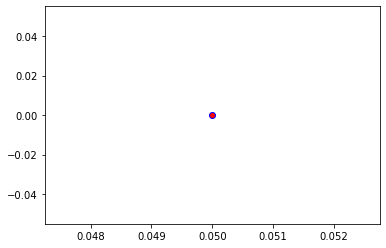

Crafting adversarial images took: 11.105719327926636 seconds 

Images classified as:
000000411774 570 = gasmask
000000411817 851 = television
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


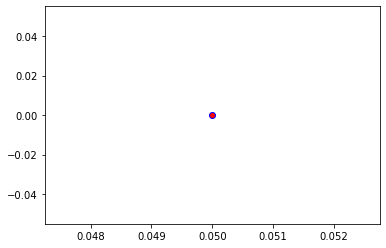

Crafting adversarial images took: 11.106488466262817 seconds 

Images classified as:
000000411938 612 = jinrikisha
000000411953 546 = electric guitar
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


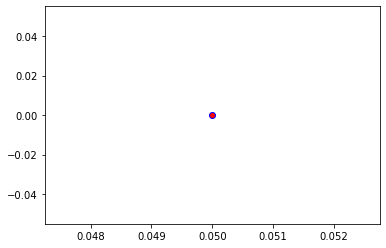

Crafting adversarial images took: 11.173714637756348 seconds 

Images classified as:
000000412240 179 = Staffordshire bullterrier
000000412286 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


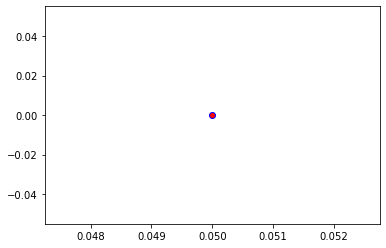

Crafting adversarial images took: 11.072314500808716 seconds 

Images classified as:
000000412362 639 = suit
000000412531 704 = parking meter
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


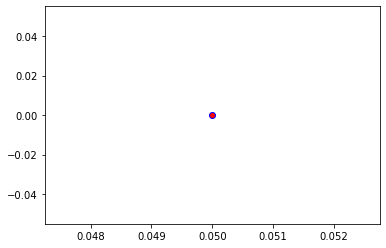

Crafting adversarial images took: 11.378662586212158 seconds 

Images classified as:
000000412887 355 = llama
000000412894 920 = traffic light
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


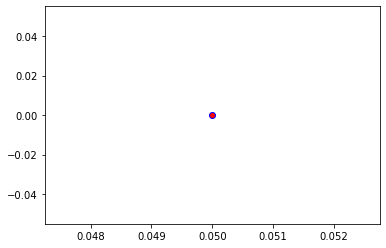

Crafting adversarial images took: 10.757152795791626 seconds 

Images classified as:
000000413247 526 = desk
000000413395 285 = Egyptian cat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


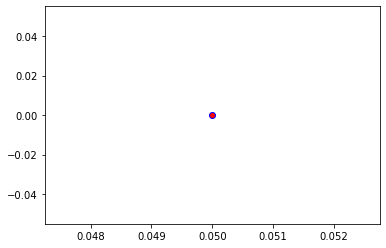

Crafting adversarial images took: 10.763182878494263 seconds 

Images classified as:
000000413404 703 = park bench
000000413552 697 = pajama
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


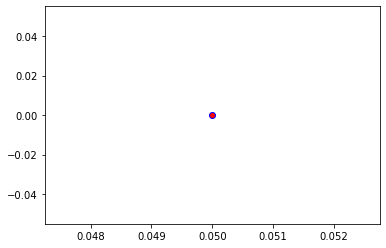

Crafting adversarial images took: 11.191795349121094 seconds 

Images classified as:
000000413689 971 = bubble
000000414034 813 = spatula
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


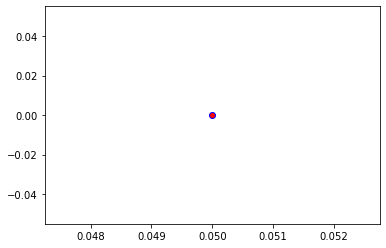

Crafting adversarial images took: 11.083839654922485 seconds 

Images classified as:
000000414133 919 = street sign
000000414170 248 = ski
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


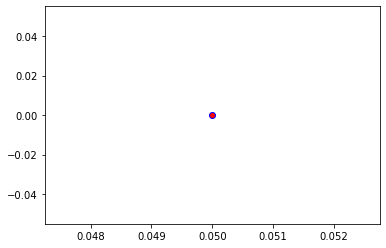

Crafting adversarial images took: 12.711653470993042 seconds 

Images classified as:
000000414261 297 = sloth bear
000000414340 657 = missile
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


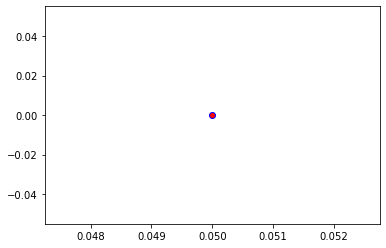

Crafting adversarial images took: 11.495714664459229 seconds 

Images classified as:
000000414385 871 = trimaran
000000414510 675 = moving van
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


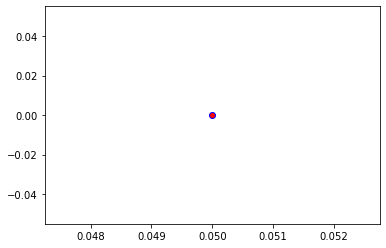

Crafting adversarial images took: 11.628028392791748 seconds 

Images classified as:
000000414638 965 = burrito
000000414673 981 = ballplayer
Min values in image-array: 1.067483 Max values in image-array: 255.0
Min values in image-array: 0.0041862074 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


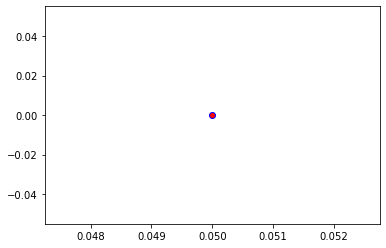

Crafting adversarial images took: 11.025288105010986 seconds 

Images classified as:
000000414676 442 = bell cote
000000414795 385 = Indian elephant
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


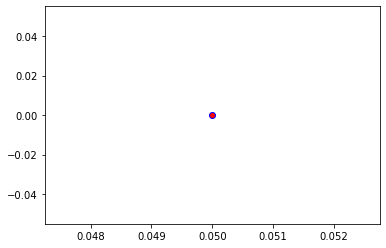

Crafting adversarial images took: 11.26957631111145 seconds 

Images classified as:
000000415194 532 = dining table
000000415238 883 = vase
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


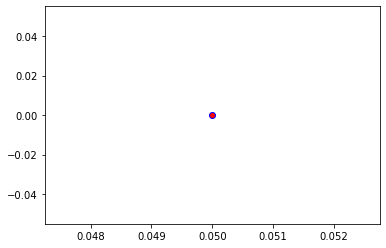

Crafting adversarial images took: 11.362825870513916 seconds 

Images classified as:
000000415536 829 = streetcar
000000415716 532 = dining table
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


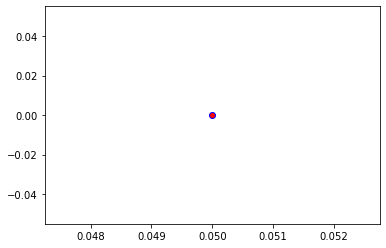

Crafting adversarial images took: 11.471970796585083 seconds 

Images classified as:
000000415727 432 = bassoon
000000415741 894 = wardrobe
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


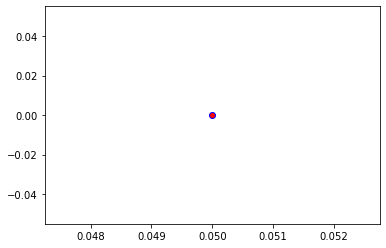

Crafting adversarial images took: 9.725753545761108 seconds 

Images classified as:
000000415748 385 = Indian elephant
000000415882 750 = quilt
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


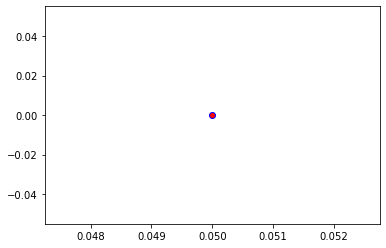

Crafting adversarial images took: 9.22285771369934 seconds 

Images classified as:
000000415990 37 = ox
000000416104 762 = restaurant
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


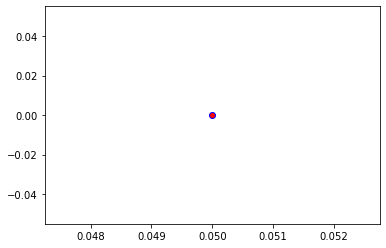

Crafting adversarial images took: 9.679090738296509 seconds 

Images classified as:
000000416170 904 = window screen
000000416256 620 = laptop
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


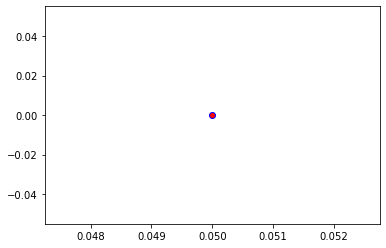

Crafting adversarial images took: 12.533941507339478 seconds 

Images classified as:
000000416269 547 = electric locomotive
000000416330 284 = Siamese cat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


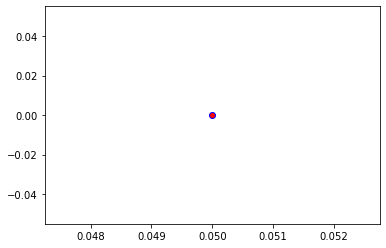

Crafting adversarial images took: 9.722686052322388 seconds 

Images classified as:
000000416343 747 = punching bag
000000416451 882 = vacuum
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


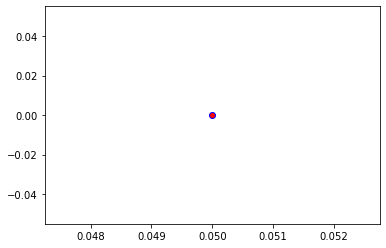

Crafting adversarial images took: 9.549979448318481 seconds 

Images classified as:
000000416534 765 = rocking chair
000000416745 648 = medicine chest
Min values in image-array: 0.0 Max values in image-array: 253.58974
Min values in image-array: 0.0 Max values in image-array: 0.9944696
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


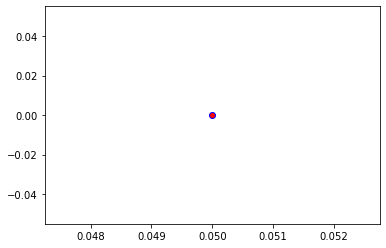

Crafting adversarial images took: 9.526410818099976 seconds 

Images classified as:
000000416758 37 = ox
000000416837 350 = ibex
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


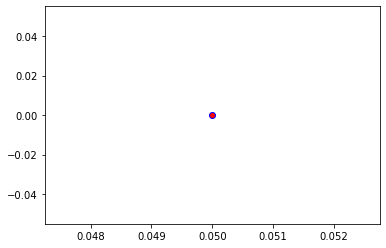

Crafting adversarial images took: 9.519582033157349 seconds 

Images classified as:
000000416885 966 = red wine
000000416991 449 = boathouse
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


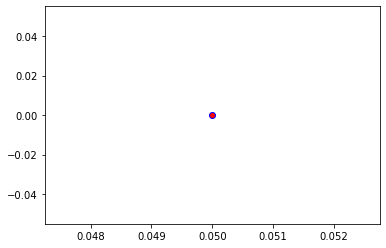

Crafting adversarial images took: 9.585745334625244 seconds 

Images classified as:
000000417043 791 = shopping cart
000000417085 354 = Arabian camel
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


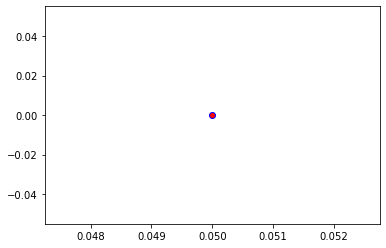

Crafting adversarial images took: 9.49812126159668 seconds 

Images classified as:
000000417249 462 = broom
000000417285 969 = eggnog
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


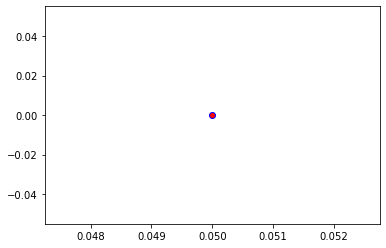

Crafting adversarial images took: 10.217626571655273 seconds 

Images classified as:
000000417465 295 = American black bear
000000417608 964 = potpie
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


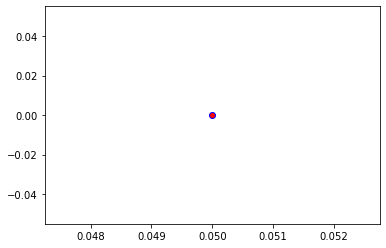

Crafting adversarial images took: 9.51301383972168 seconds 

Images classified as:
000000417632 691 = oxygen mask
000000417779 412 = ashcan
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


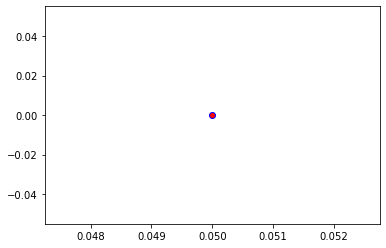

Crafting adversarial images took: 9.296947002410889 seconds 

Images classified as:
000000417876 293 = cheetah
000000417911 693 = paddle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


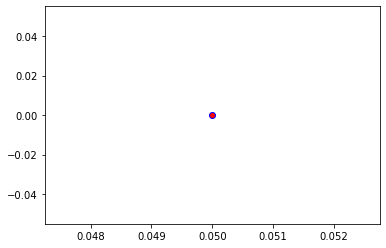

Crafting adversarial images took: 9.376280784606934 seconds 

Images classified as:
000000418062 424 = barbershop
000000418281 690 = oxcart
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


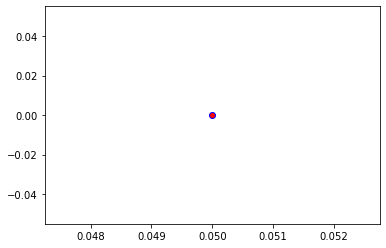

Crafting adversarial images took: 9.392793893814087 seconds 

Images classified as:
000000418696 497 = church
000000418959 175 = otter
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


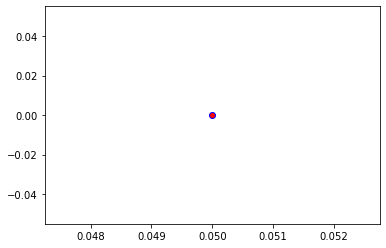

Crafting adversarial images took: 10.331365585327148 seconds 

Images classified as:
000000418961 892 = wall clock
000000419096 565 = freight car
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


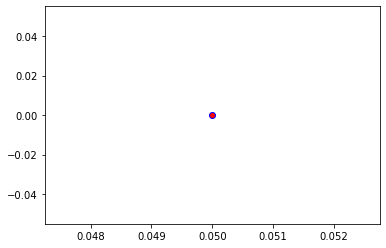

Crafting adversarial images took: 9.143694162368774 seconds 

Images classified as:
000000419098 600 = hook
000000419201 140 = alp
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


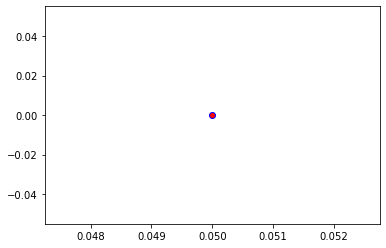

Crafting adversarial images took: 9.21824836730957 seconds 

Images classified as:
000000419312 461 = plate
000000419379 931 = bagel
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


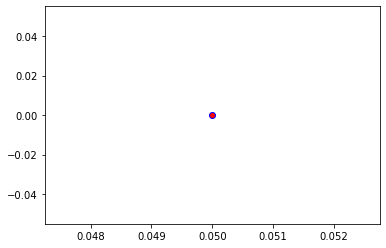

Crafting adversarial images took: 9.378276348114014 seconds 

Images classified as:
000000419408 703 = park bench
000000419601 905 = window shade
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


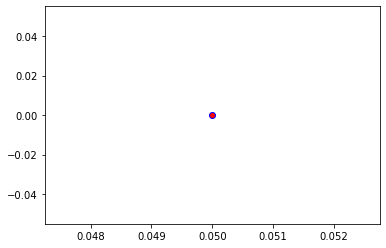

Crafting adversarial images took: 9.37761902809143 seconds 

Images classified as:
000000419653 651 = microwave
000000419882 318 = wing
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


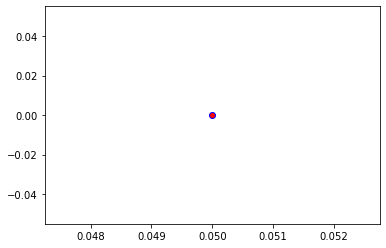

Crafting adversarial images took: 9.44821047782898 seconds 

Images classified as:
000000419974 532 = dining table
000000420069 805 = soccer ball
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


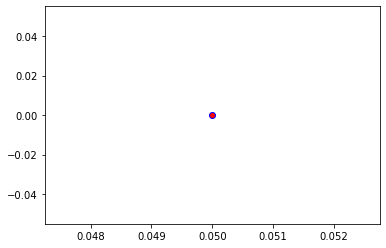

Crafting adversarial images took: 9.539543628692627 seconds 

Images classified as:
000000420230 386 = African elephant
000000420281 929 = ice lolly
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


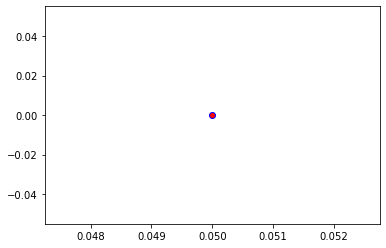

Crafting adversarial images took: 9.572621583938599 seconds 

Images classified as:
000000420472 38 = banded gecko
000000420840 105 = ear
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


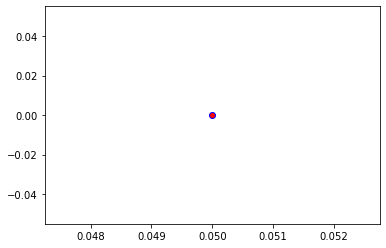

Crafting adversarial images took: 9.532374143600464 seconds 

Images classified as:
000000420916 830 = stretcher
000000421060 248 = ski
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


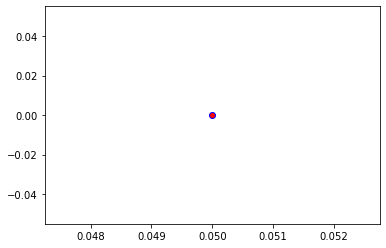

Crafting adversarial images took: 9.474313497543335 seconds 

Images classified as:
000000421455 475 = car mirror
000000421757 536 = dock
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


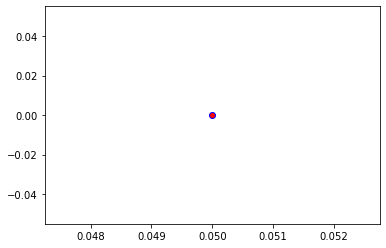

Crafting adversarial images took: 9.453411340713501 seconds 

Images classified as:
000000421834 11 = goldfinch
000000421923 583 = guillotine
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


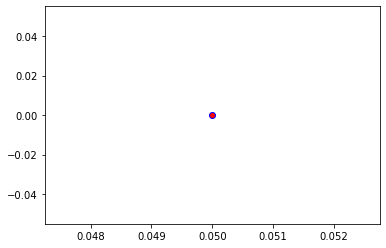

Crafting adversarial images took: 9.405678033828735 seconds 

Images classified as:
000000422670 452 = bonnet
000000422706 625 = lifeboat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


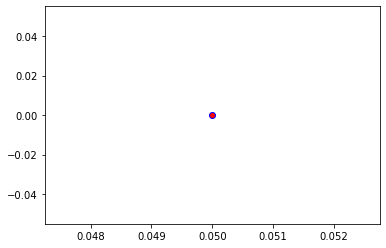

Crafting adversarial images took: 10.33408236503601 seconds 

Images classified as:
000000422836 919 = street sign
000000422886 934 = hotdog
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


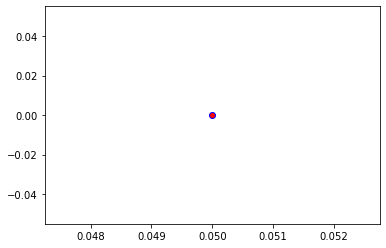

Crafting adversarial images took: 9.469716548919678 seconds 

Images classified as:
000000422998 739 = potter's wheel
000000423104 805 = soccer ball
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


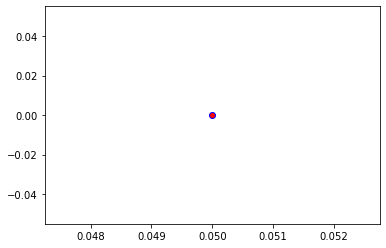

Crafting adversarial images took: 9.163557052612305 seconds 

Images classified as:
000000423123 209 = Chesapeake Bay retriever
000000423229 820 = steam locomotive
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


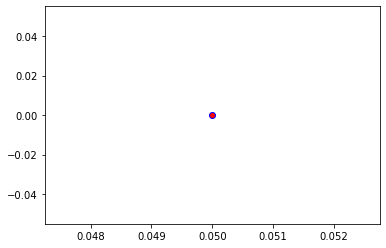

Crafting adversarial images took: 9.246835947036743 seconds 

Images classified as:
000000423506 906 = Windsor tie
000000423519 874 = trolleybus
Min values in image-array: 0.0 Max values in image-array: 254.61223
Min values in image-array: 0.0 Max values in image-array: 0.9984793
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


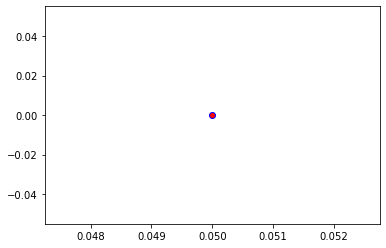

Crafting adversarial images took: 9.236559867858887 seconds 

Images classified as:
000000423617 874 = trolleybus
000000423798 920 = traffic light
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


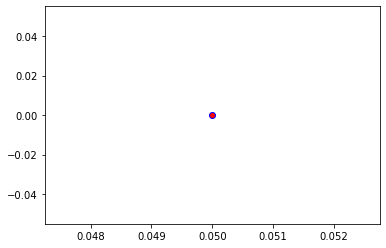

Crafting adversarial images took: 9.417312860488892 seconds 

Images classified as:
000000423944 639 = suit
000000423971 861 = toilet seat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


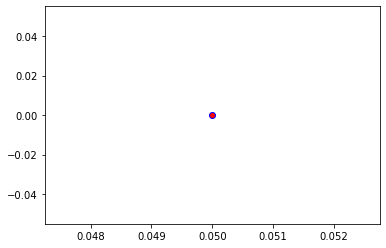

Crafting adversarial images took: 9.608186721801758 seconds 

Images classified as:
000000424135 149 = gong
000000424162 225 = malinois
Min values in image-array: 0.0019029919 Max values in image-array: 255.0
Min values in image-array: 7.4627133e-06 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


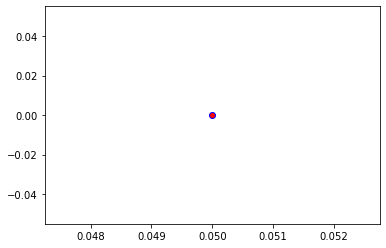

Crafting adversarial images took: 9.339630842208862 seconds 

Images classified as:
000000424349 766 = rotisserie
000000424521 51 = triceratops
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


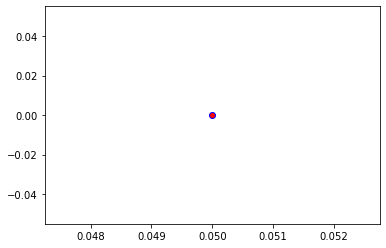

Crafting adversarial images took: 9.416819095611572 seconds 

Images classified as:
000000424545 281 = tabby
000000424551 248 = ski
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


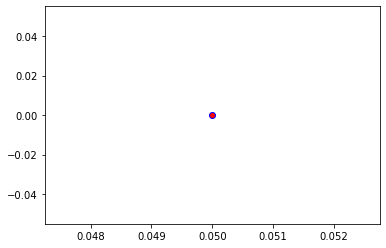

Crafting adversarial images took: 9.349634647369385 seconds 

Images classified as:
000000424642 792 = shovel
000000424721 567 = frying pan
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


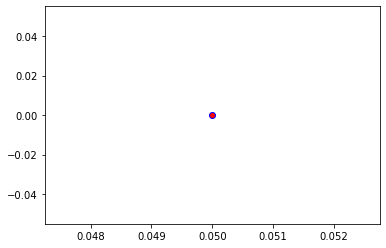

Crafting adversarial images took: 9.40197205543518 seconds 

Images classified as:
000000424776 895 = warplane
000000424975 498 = cinema
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


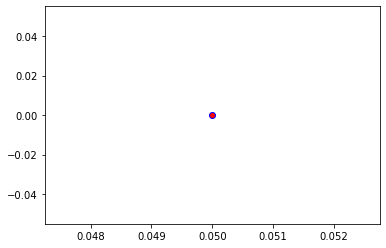

Crafting adversarial images took: 9.416606187820435 seconds 

Images classified as:
000000425221 789 = shoji
000000425226 882 = vacuum
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


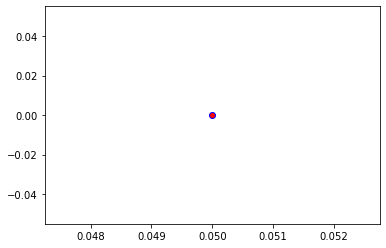

Crafting adversarial images took: 10.270596981048584 seconds 

Images classified as:
000000425227 978 = seashore
000000425361 813 = spatula
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


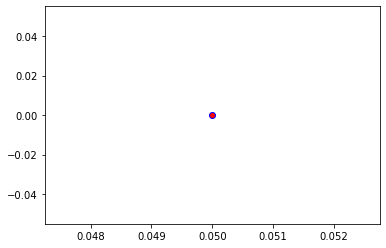

Crafting adversarial images took: 9.365222215652466 seconds 

Images classified as:
000000425390 284 = Siamese cat
000000425702 978 = seashore
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


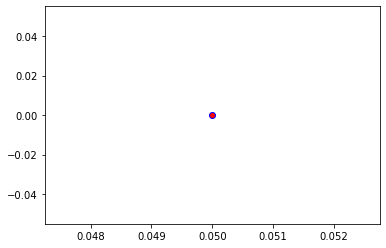

Crafting adversarial images took: 9.194866180419922 seconds 

Images classified as:
000000425906 248 = ski
000000425925 668 = mosque
Min values in image-array: 0.0 Max values in image-array: 254.9375
Min values in image-array: 0.0 Max values in image-array: 0.9997549
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


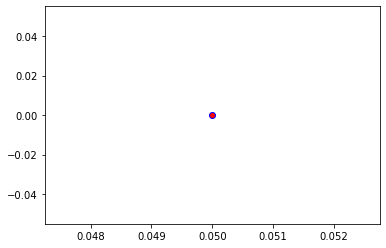

Crafting adversarial images took: 9.164170742034912 seconds 

Images classified as:
000000426166 880 = unicycle
000000426203 421 = bannister
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


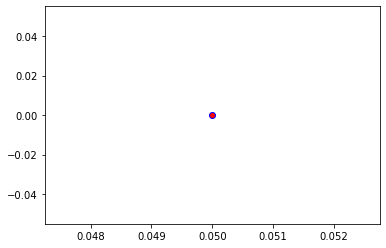

Crafting adversarial images took: 9.298723220825195 seconds 

Images classified as:
000000426241 527 = desktop computer
000000426253 651 = microwave
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


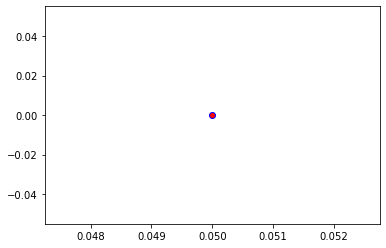

Crafting adversarial images took: 9.19924545288086 seconds 

Images classified as:
000000426268 820 = steam locomotive
000000426297 340 = zebra
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


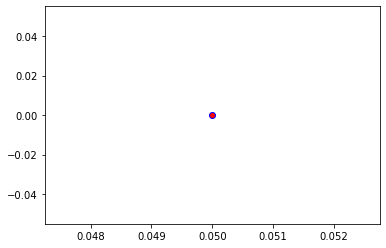

Crafting adversarial images took: 9.287986516952515 seconds 

Images classified as:
000000426329 999 = toilet tissue
000000426372 407 = ambulance
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


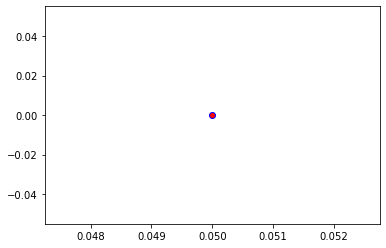

Crafting adversarial images took: 9.433057069778442 seconds 

Images classified as:
000000426376 248 = ski
000000426795 938 = cauliflower
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


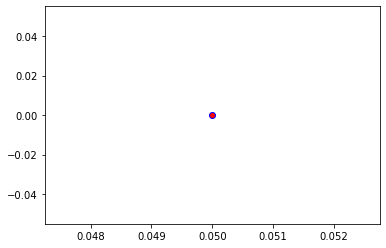

Crafting adversarial images took: 9.379150390625 seconds 

Images classified as:
000000426836 975 = lakeside
000000427034 165 = black-and-tan coonhound
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


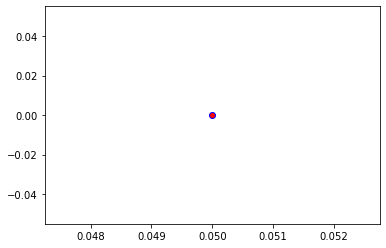

Crafting adversarial images took: 9.515735626220703 seconds 

Images classified as:
000000427055 409 = analog clock
000000427077 921 = book jacket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


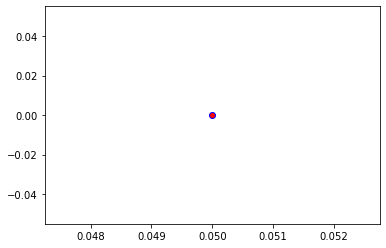

Crafting adversarial images took: 9.417937278747559 seconds 

Images classified as:
000000427160 981 = ballplayer
000000427256 981 = ballplayer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


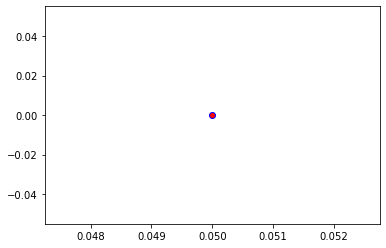

Crafting adversarial images took: 9.411959648132324 seconds 

Images classified as:
000000427338 873 = triumphal arch
000000427500 412 = ashcan
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


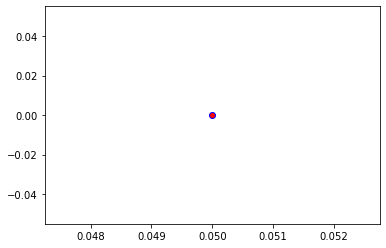

Crafting adversarial images took: 10.134541034698486 seconds 

Images classified as:
000000427649 975 = lakeside
000000427655 603 = horse cart
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


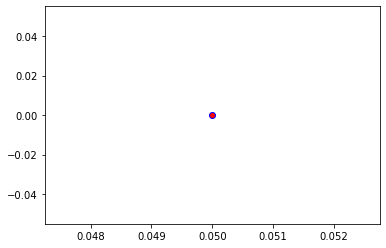

Crafting adversarial images took: 9.565120220184326 seconds 

Images classified as:
000000427997 752 = racket
000000428111 672 = mountain tent
Min values in image-array: 0.0 Max values in image-array: 250.6762
Min values in image-array: 0.0 Max values in image-array: 0.9830439
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


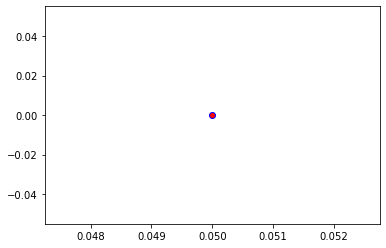

Crafting adversarial images took: 9.565672874450684 seconds 

Images classified as:
000000428218 522 = croquet ball
000000428280 559 = folding chair
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


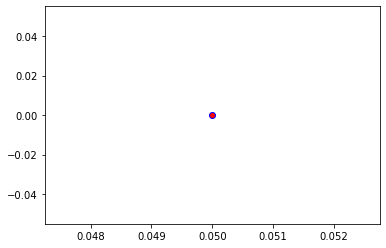

Crafting adversarial images took: 9.380778551101685 seconds 

Images classified as:
000000428454 701 = parachute
000000428562 5 = ram
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


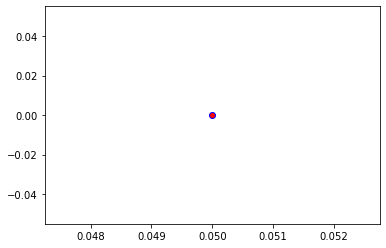

Crafting adversarial images took: 9.260865211486816 seconds 

Images classified as:
000000428867 850 = teddy
000000429011 561 = forklift
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


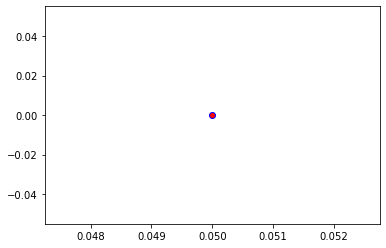

Crafting adversarial images took: 9.187415599822998 seconds 

Images classified as:
000000429109 654 = minibus
000000429281 954 = banana
Min values in image-array: 0.0 Max values in image-array: 254.79576
Min values in image-array: 0.0 Max values in image-array: 0.9991991
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


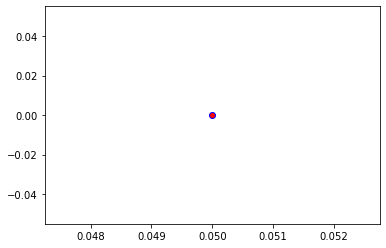

Crafting adversarial images took: 9.223416328430176 seconds 

Images classified as:
000000429530 883 = vase
000000429598 651 = microwave
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


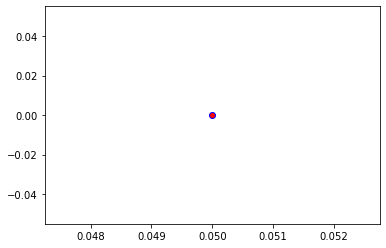

Crafting adversarial images took: 9.303770542144775 seconds 

Images classified as:
000000429623 963 = pizza
000000429690 981 = ballplayer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


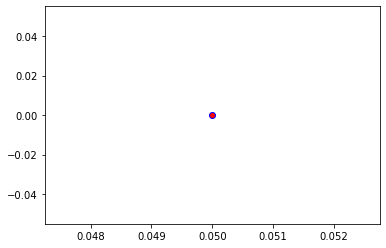

Crafting adversarial images took: 9.426008939743042 seconds 

Images classified as:
000000429718 820 = steam locomotive
000000429761 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


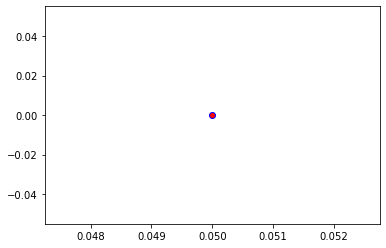

Crafting adversarial images took: 9.367331266403198 seconds 

Images classified as:
000000430048 904 = window screen
000000430056 931 = bagel
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


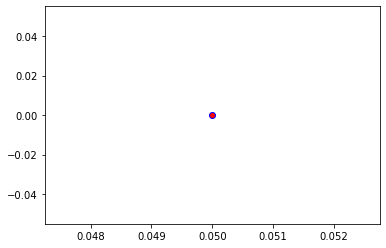

Crafting adversarial images took: 9.429741621017456 seconds 

Images classified as:
000000430073 690 = oxcart
000000430286 434 = bath towel
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


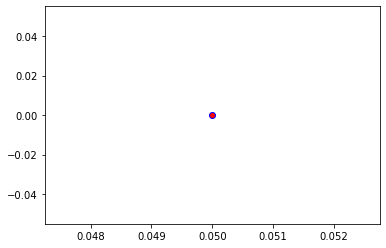

Crafting adversarial images took: 9.513077974319458 seconds 

Images classified as:
000000430377 248 = ski
000000430871 704 = parking meter
Min values in image-array: 0.0 Max values in image-array: 254.42699
Min values in image-array: 0.0 Max values in image-array: 0.9977529
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


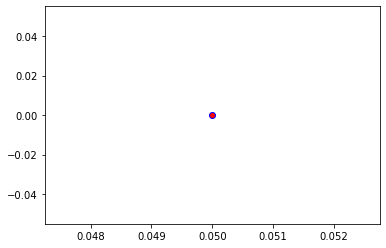

Crafting adversarial images took: 9.873052597045898 seconds 

Images classified as:
000000430875 920 = traffic light
000000430961 981 = ballplayer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


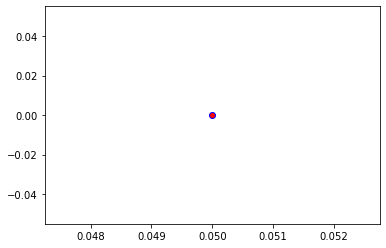

Crafting adversarial images took: 8.330281496047974 seconds 

Images classified as:
000000430973 963 = pizza
000000431140 896 = washbasin
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


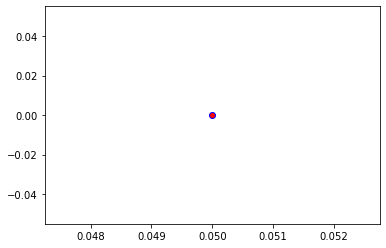

Crafting adversarial images took: 8.058368682861328 seconds 

Images classified as:
000000431545 981 = ballplayer
000000431568 963 = pizza
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


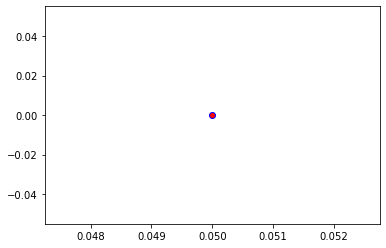

Crafting adversarial images took: 8.135154724121094 seconds 

Images classified as:
000000431693 752 = racket
000000431727 337 = beaver
Min values in image-array: 0.0 Max values in image-array: 253.97768
Min values in image-array: 0.0 Max values in image-array: 0.9959909
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


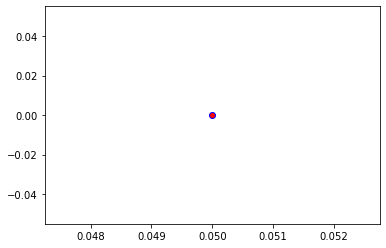

Crafting adversarial images took: 8.066813707351685 seconds 

Images classified as:
000000431848 702 = parallel bars
000000431876 603 = horse cart
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


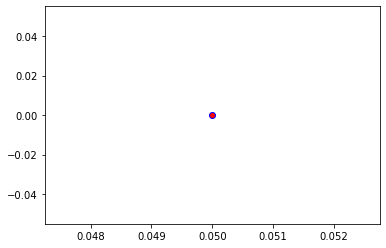

Crafting adversarial images took: 8.265259265899658 seconds 

Images classified as:
000000431896 547 = electric locomotive
000000432085 521 = Crock Pot
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


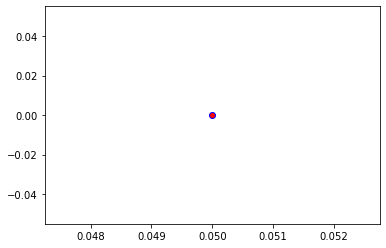

Crafting adversarial images took: 7.93025016784668 seconds 

Images classified as:
000000432468 333 = hamster
000000432553 253 = basenji
Min values in image-array: 0.011160374 Max values in image-array: 255.0
Min values in image-array: 4.3766173e-05 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


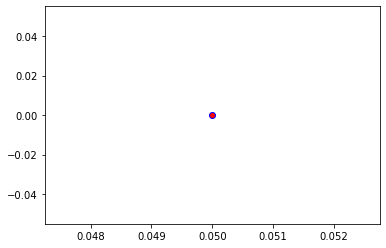

Crafting adversarial images took: 7.931438207626343 seconds 

Images classified as:
000000432898 557 = flagpole
000000433103 830 = stretcher
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


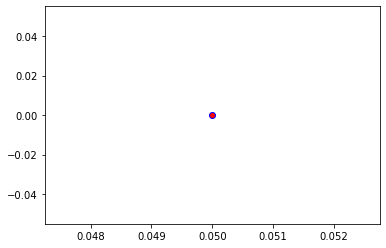

Crafting adversarial images took: 8.000427484512329 seconds 

Images classified as:
000000433134 283 = Persian cat
000000433192 750 = quilt
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


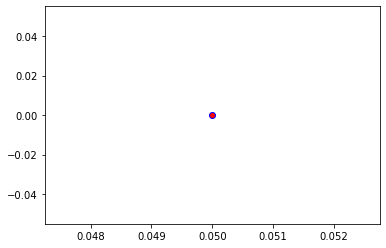

Crafting adversarial images took: 7.9253830909729 seconds 

Images classified as:
000000433204 603 = horse cart
000000433243 340 = zebra
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


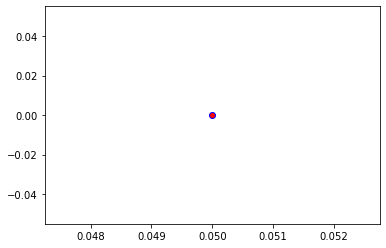

Crafting adversarial images took: 8.088653087615967 seconds 

Images classified as:
000000433374 385 = Indian elephant
000000433515 557 = flagpole
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


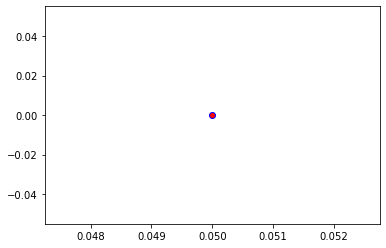

Crafting adversarial images took: 8.073101997375488 seconds 

Images classified as:
000000433774 704 = parking meter
000000433915 851 = television
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


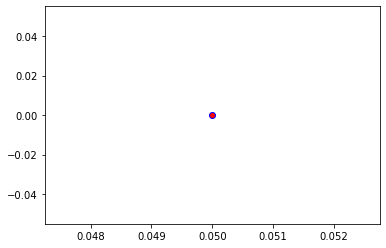

Crafting adversarial images took: 8.305740356445312 seconds 

Images classified as:
000000433980 626 = lighter
000000434204 491 = chain saw
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


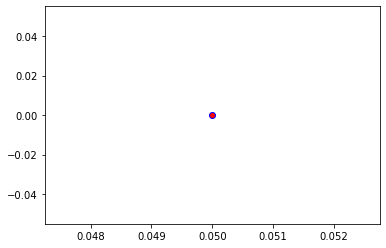

Crafting adversarial images took: 8.096068620681763 seconds 

Images classified as:
000000434230 861 = toilet seat
000000434247 460 = breakwater
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


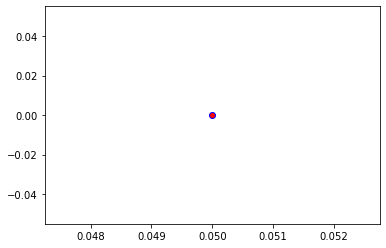

Crafting adversarial images took: 8.42819356918335 seconds 

Images classified as:
000000434297 461 = plate
000000434459 762 = restaurant
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


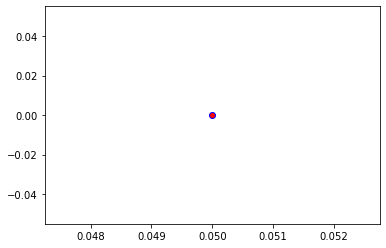

Crafting adversarial images took: 8.373094320297241 seconds 

Images classified as:
000000434479 941 = acorn squash
000000434548 981 = ballplayer
Min values in image-array: 0.0 Max values in image-array: 254.95695
Min values in image-array: 0.0 Max values in image-array: 0.9998312
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


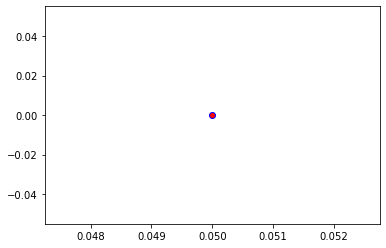

Crafting adversarial images took: 8.215101957321167 seconds 

Images classified as:
000000434996 181 = Bedlington terrier
000000435003 526 = desk
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


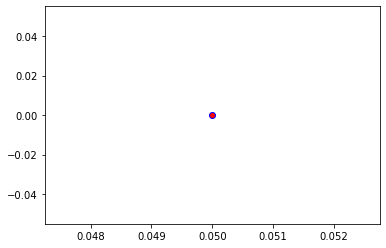

Crafting adversarial images took: 8.138744592666626 seconds 

Images classified as:
000000435081 922 = menu
000000435205 850 = teddy
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


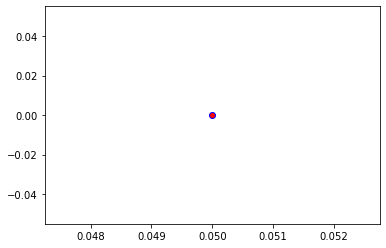

Crafting adversarial images took: 8.10488748550415 seconds 

Images classified as:
000000435206 460 = breakwater
000000435208 620 = laptop
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


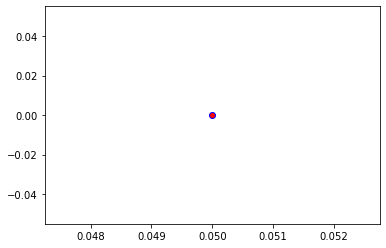

Crafting adversarial images took: 8.075745105743408 seconds 

Images classified as:
000000435299 184 = Irish terrier
000000435880 760 = refrigerator
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


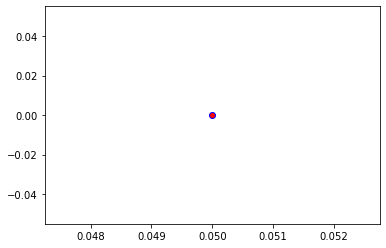

Crafting adversarial images took: 8.048794984817505 seconds 

Images classified as:
000000436315 963 = pizza
000000436551 100 = black swan
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


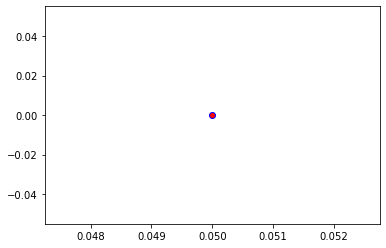

Crafting adversarial images took: 8.189165353775024 seconds 

Images classified as:
000000436617 762 = restaurant
000000436738 874 = trolleybus
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


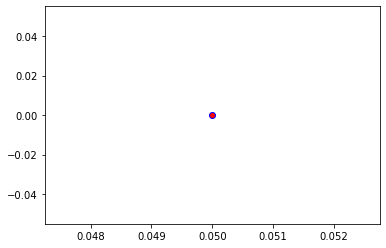

Crafting adversarial images took: 7.966932535171509 seconds 

Images classified as:
000000436883 654 = minibus
000000437110 498 = palace
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


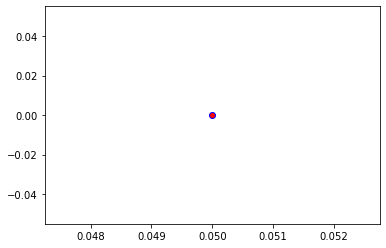

Crafting adversarial images took: 7.98598051071167 seconds 

Images classified as:
000000437205 105 = ear
000000437239 428 = barrow
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


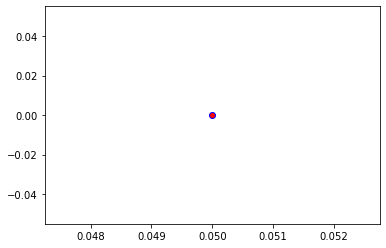

Crafting adversarial images took: 7.9707911014556885 seconds 

Images classified as:
000000437331 693 = paddle
000000437351 793 = shower cap
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


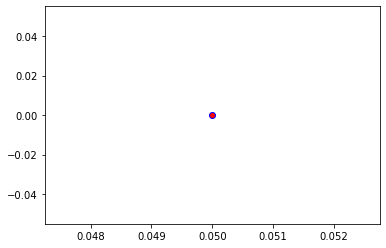

Crafting adversarial images took: 8.20166540145874 seconds 

Images classified as:
000000437392 861 = toilet seat
000000437514 703 = park bench
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


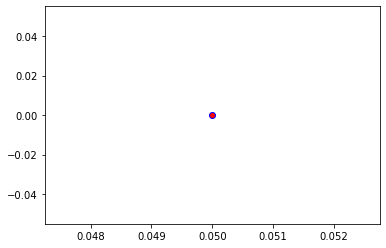

Crafting adversarial images took: 8.14751648902893 seconds 

Images classified as:
000000437898 651 = microwave
000000438017 134 = crane
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


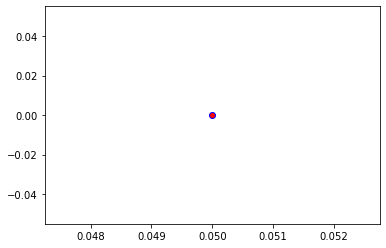

Crafting adversarial images took: 8.084495067596436 seconds 

Images classified as:
000000438226 965 = burrito
000000438269 131 = little blue heron
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


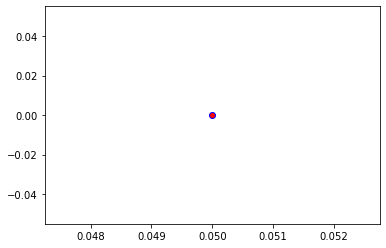

Crafting adversarial images took: 8.28344202041626 seconds 

Images classified as:
000000438304 752 = racket
000000438774 762 = restaurant
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


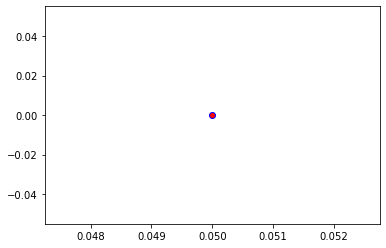

Crafting adversarial images took: 8.559650421142578 seconds 

Images classified as:
000000438862 805 = soccer ball
000000438876 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


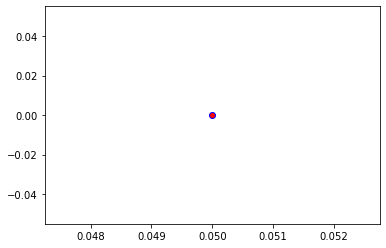

Crafting adversarial images took: 8.126447916030884 seconds 

Images classified as:
000000438907 67 = dam
000000438955 439 = bearskin
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


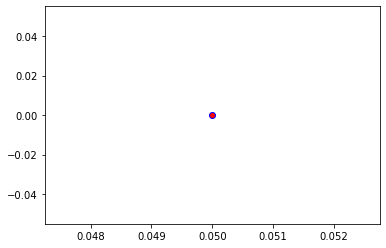

Crafting adversarial images took: 8.30961298942566 seconds 

Images classified as:
000000439180 354 = Arabian camel
000000439290 89 = sulphur-crested cockatoo
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


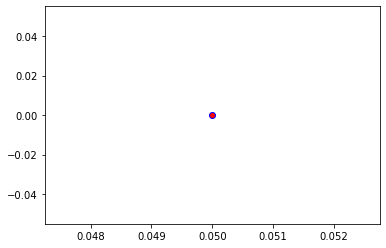

Crafting adversarial images took: 8.087013721466064 seconds 

Images classified as:
000000439426 932 = pretzel
000000439522 248 = ski
Min values in image-array: 0.08225027 Max values in image-array: 255.0
Min values in image-array: 0.00032255007 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


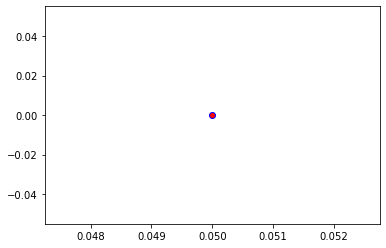

Crafting adversarial images took: 8.110927104949951 seconds 

Images classified as:
000000439525 739 = potter's wheel
000000439593 705 = passenger car
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


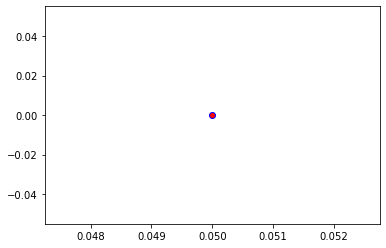

Crafting adversarial images took: 8.16008973121643 seconds 

Images classified as:
000000439623 708 = pedestal
000000439715 37 = ox
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


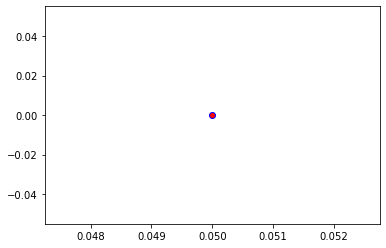

Crafting adversarial images took: 8.244385480880737 seconds 

Images classified as:
000000439773 722 = ping-pong ball
000000439854 358 = pole
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


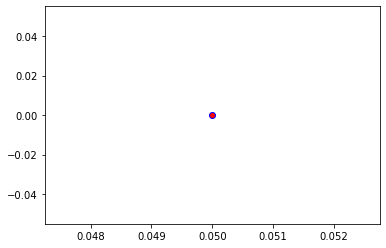

Crafting adversarial images took: 8.157256126403809 seconds 

Images classified as:
000000439994 981 = ballplayer
000000440171 385 = Indian elephant
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


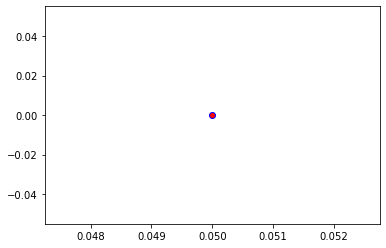

Crafting adversarial images took: 7.944999933242798 seconds 

Images classified as:
000000440184 752 = racket
000000440336 522 = croquet ball
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


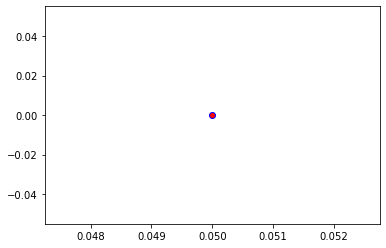

Crafting adversarial images took: 7.970987796783447 seconds 

Images classified as:
000000440475 495 = china cabinet
000000440507 492 = chest
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


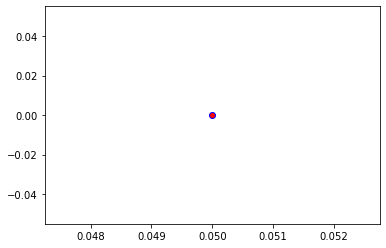

Crafting adversarial images took: 7.909507751464844 seconds 

Images classified as:
000000440508 547 = electric locomotive
000000440617 547 = electric locomotive
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


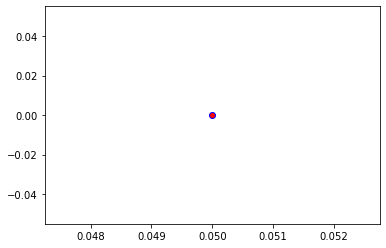

Crafting adversarial images took: 7.909562349319458 seconds 

Images classified as:
000000441247 532 = dining table
000000441286 842 = swimming trunks
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


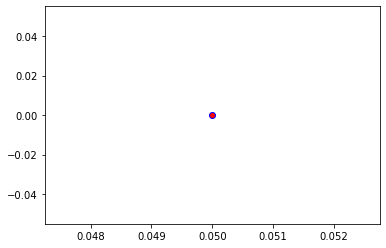

Crafting adversarial images took: 7.99045991897583 seconds 

Images classified as:
000000441442 339 = sorrel
000000441468 412 = ashcan
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


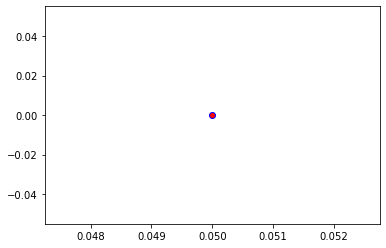

Crafting adversarial images took: 8.395497560501099 seconds 

Images classified as:
000000441491 123 = crayfish
000000441543 879 = umbrella
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


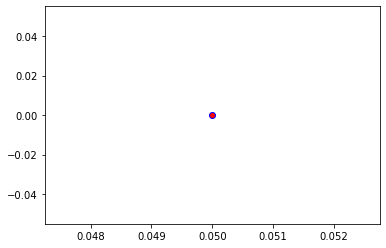

Crafting adversarial images took: 8.650322914123535 seconds 

Images classified as:
000000441553 829 = streetcar
000000441586 671 = mountain bike
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


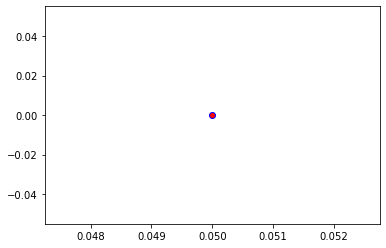

Crafting adversarial images took: 8.048867225646973 seconds 

Images classified as:
000000442009 896 = washbasin
000000442161 678 = neck brace
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


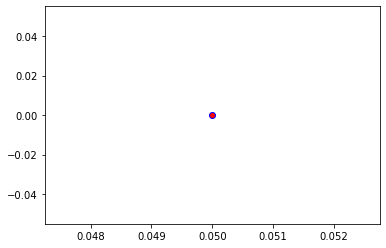

Crafting adversarial images took: 8.117085933685303 seconds 

Images classified as:
000000442306 879 = umbrella
000000442323 851 = television
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


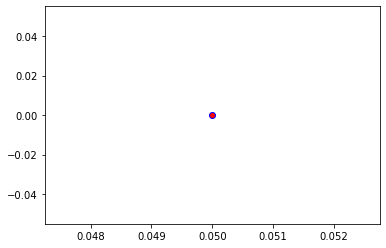

Crafting adversarial images took: 8.086242914199829 seconds 

Images classified as:
000000442456 734 = police van
000000442463 880 = unicycle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


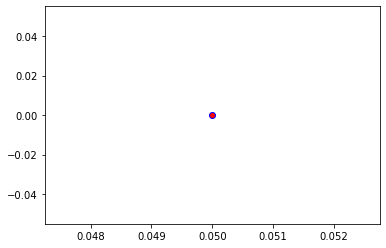

Crafting adversarial images took: 8.120092868804932 seconds 

Images classified as:
000000442480 812 = space shuttle
000000442661 213 = Irish setter
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


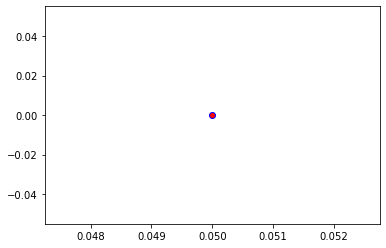

Crafting adversarial images took: 8.082319498062134 seconds 

Images classified as:
000000442746 522 = croquet ball
000000442822 814 = speedboat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


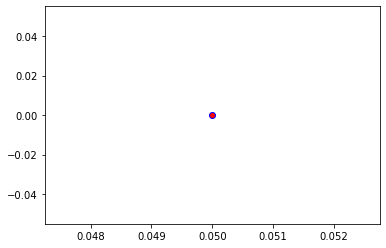

Crafting adversarial images took: 8.11186671257019 seconds 

Images classified as:
000000442836 522 = croquet ball
000000442993 663 = monastery
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


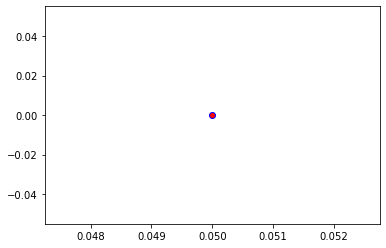

Crafting adversarial images took: 8.140458583831787 seconds 

Images classified as:
000000443303 728 = plastic bag
000000443426 617 = lab coat
Min values in image-array: 0.0 Max values in image-array: 254.61284
Min values in image-array: 0.0 Max values in image-array: 0.9984817
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


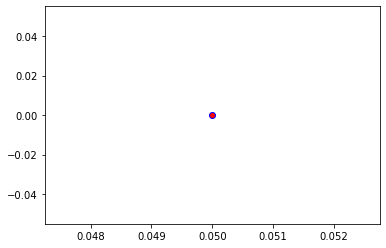

Crafting adversarial images took: 8.110934495925903 seconds 

Images classified as:
000000443498 874 = trolleybus
000000443844 740 = power drill
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


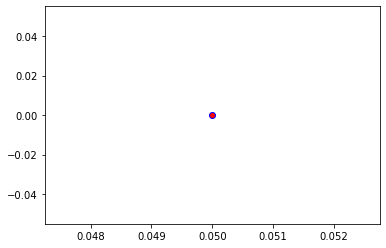

Crafting adversarial images took: 7.9721903800964355 seconds 

Images classified as:
000000443969 791 = shopping cart
000000444142 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


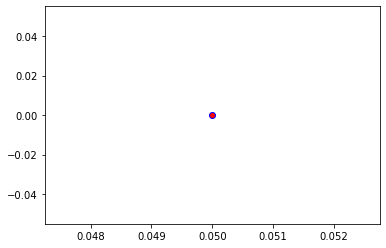

Crafting adversarial images took: 8.051733016967773 seconds 

Images classified as:
000000444275 651 = microwave
000000444879 705 = passenger car
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


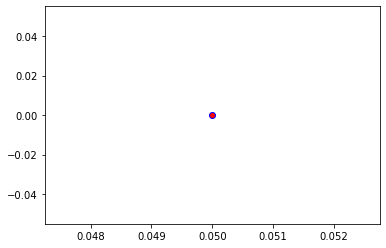

Crafting adversarial images took: 7.964745044708252 seconds 

Images classified as:
000000445248 385 = Indian elephant
000000445365 355 = llama
Min values in image-array: 0.0 Max values in image-array: 254.97209
Min values in image-array: 0.0 Max values in image-array: 0.99989057
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


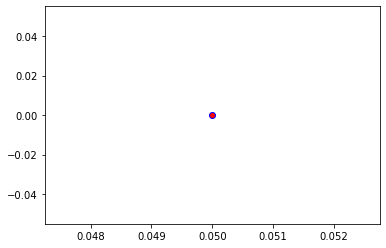

Crafting adversarial images took: 7.964144706726074 seconds 

Images classified as:
000000445439 340 = zebra
000000445602 248 = ski
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


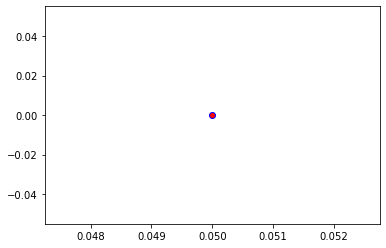

Crafting adversarial images took: 8.007608413696289 seconds 

Images classified as:
000000445658 534 = dishwasher
000000445675 293 = cheetah
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


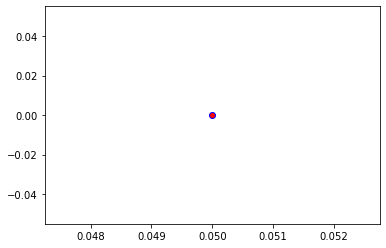

Crafting adversarial images took: 8.74828553199768 seconds 

Images classified as:
000000445722 476 = carousel
000000445792 731 = plunger
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


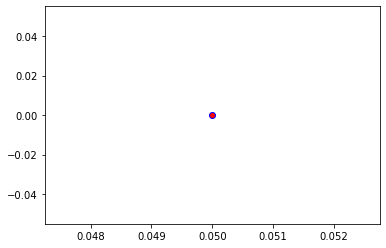

Crafting adversarial images took: 8.130869626998901 seconds 

Images classified as:
000000445834 675 = moving van
000000445846 435 = bathtub
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


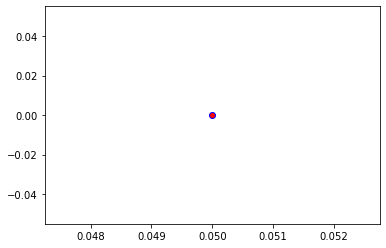

Crafting adversarial images took: 8.481554508209229 seconds 

Images classified as:
000000445999 629 = lipstick
000000446005 651 = microwave
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


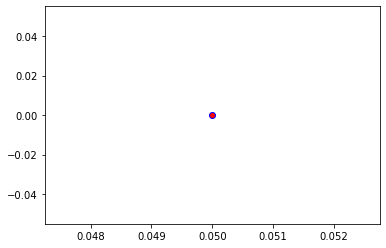

Crafting adversarial images took: 8.12886643409729 seconds 

Images classified as:
000000446117 950 = orange
000000446206 829 = streetcar
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


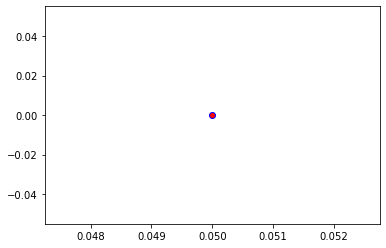

Crafting adversarial images took: 8.11240816116333 seconds 

Images classified as:
000000446207 531 = digital watch
000000446522 234 = Rottweiler
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


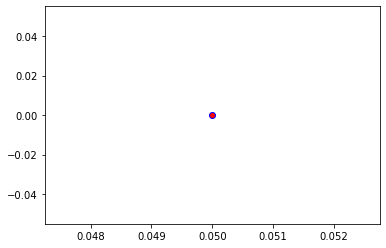

Crafting adversarial images took: 8.075437068939209 seconds 

Images classified as:
000000446574 794 = shower curtain
000000446651 670 = motor scooter
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


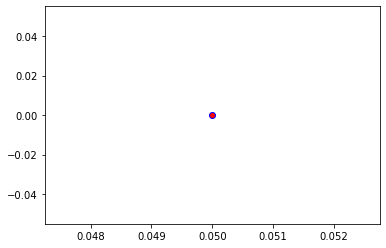

Crafting adversarial images took: 8.06548023223877 seconds 

Images classified as:
000000446703 850 = teddy
000000447088 981 = ballplayer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


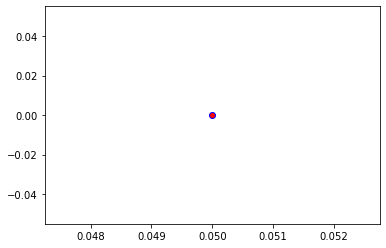

Crafting adversarial images took: 8.28938364982605 seconds 

Images classified as:
000000447169 651 = microwave
000000447187 981 = ballplayer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


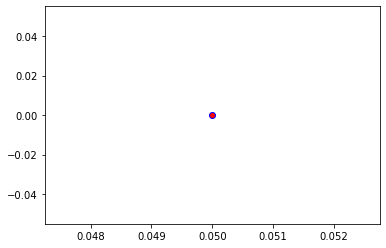

Crafting adversarial images took: 8.068045377731323 seconds 

Images classified as:
000000447200 156 = Blenheim spaniel
000000447313 340 = zebra
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


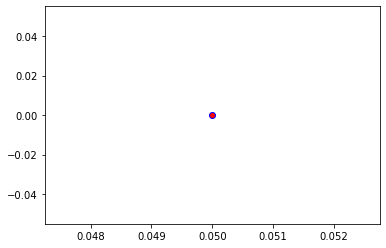

Crafting adversarial images took: 8.107115030288696 seconds 

Images classified as:
000000447314 682 = obelisk
000000447342 874 = trolleybus
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


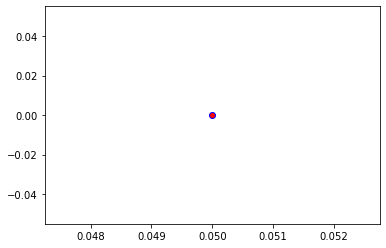

Crafting adversarial images took: 7.952719449996948 seconds 

Images classified as:
000000447465 248 = ski
000000447522 461 = plate
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


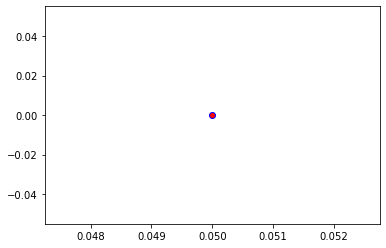

Crafting adversarial images took: 7.986364126205444 seconds 

Images classified as:
000000447611 848 = tape player
000000447789 919 = street sign
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


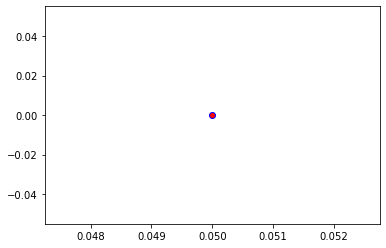

Crafting adversarial images took: 8.34716510772705 seconds 

Images classified as:
000000447917 805 = soccer ball
000000448076 747 = punching bag
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


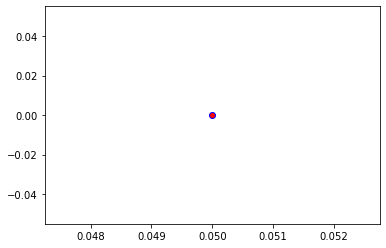

Crafting adversarial images took: 7.987550497055054 seconds 

Images classified as:
000000448256 575 = golfcart
000000448263 981 = ballplayer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


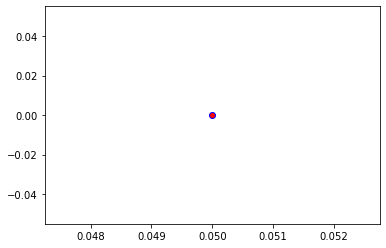

Crafting adversarial images took: 8.610159397125244 seconds 

Images classified as:
000000448365 880 = unicycle
000000448410 547 = electric locomotive
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


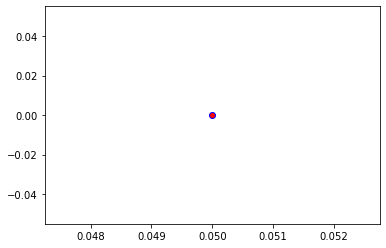

Crafting adversarial images took: 8.119366645812988 seconds 

Images classified as:
000000448448 290 = jaguar
000000448810 919 = street sign
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


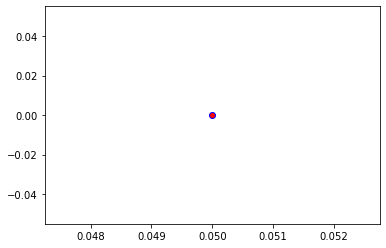

Crafting adversarial images took: 8.159390687942505 seconds 

Images classified as:
000000449190 924 = guacamole
000000449198 421 = bannister
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


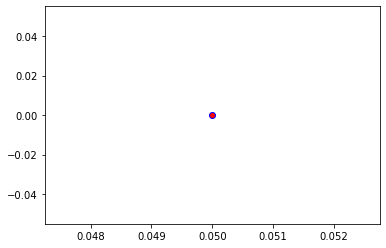

Crafting adversarial images took: 8.240827560424805 seconds 

Images classified as:
000000449312 927 = trifle
000000449406 340 = zebra
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


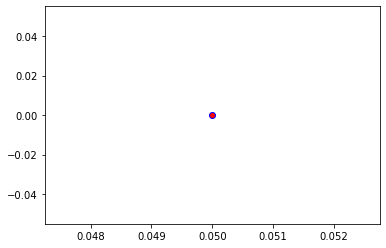

Crafting adversarial images took: 8.115723609924316 seconds 

Images classified as:
000000449432 779 = school bus
000000449579 416 = balance beam
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


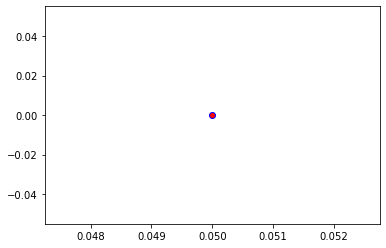

Crafting adversarial images took: 8.130876302719116 seconds 

Images classified as:
000000449603 864 = wreck
000000449661 794 = shower curtain
Min values in image-array: 3.5779724 Max values in image-array: 255.0
Min values in image-array: 0.014031264 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


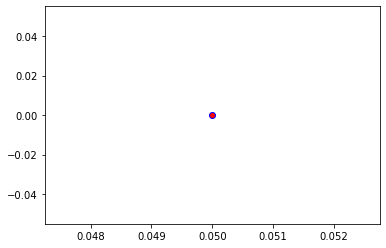

Crafting adversarial images took: 8.03511381149292 seconds 

Images classified as:
000000449909 224 = groenendael
000000449996 404 = airliner
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


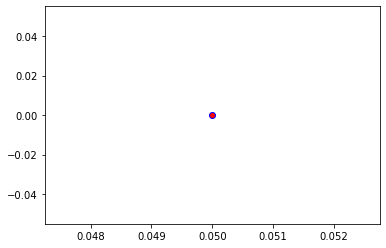

Crafting adversarial images took: 8.144195556640625 seconds 

Images classified as:
000000450075 585 = hair spray
000000450100 415 = bakery
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


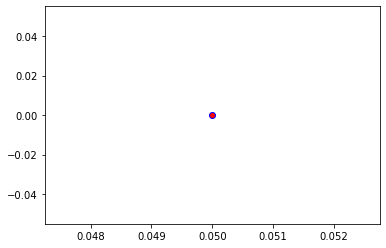

Crafting adversarial images took: 8.119604349136353 seconds 

Images classified as:
000000450202 118 = Dungeness crab
000000450303 526 = desk
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


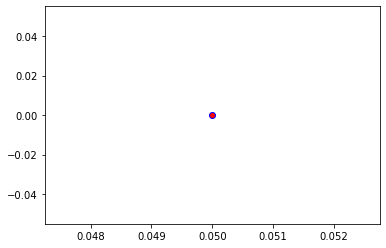

Crafting adversarial images took: 8.033868551254272 seconds 

Images classified as:
000000450399 415 = bakery
000000450439 701 = parachute
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


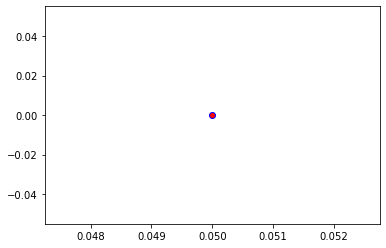

Crafting adversarial images took: 8.107450008392334 seconds 

Images classified as:
000000450488 548 = entertainment center
000000450559 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


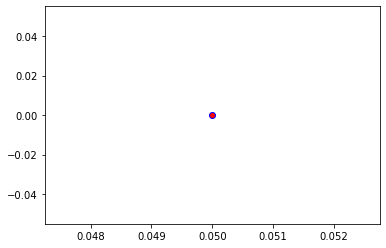

Crafting adversarial images took: 8.100956201553345 seconds 

Images classified as:
000000450686 487 = cellular telephone
000000450758 354 = Arabian camel
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


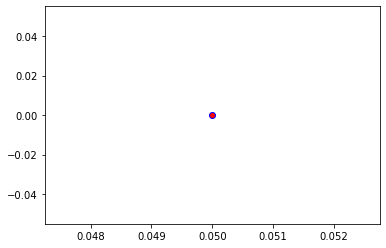

Crafting adversarial images took: 8.133342504501343 seconds 

Images classified as:
000000451043 248 = ski
000000451084 843 = swing
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


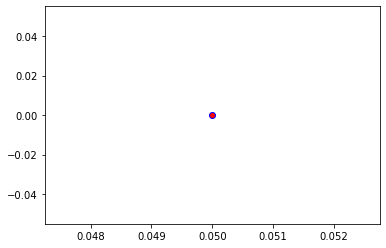

Crafting adversarial images took: 7.898943901062012 seconds 

Images classified as:
000000451090 914 = yawl
000000451144 140 = alp
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


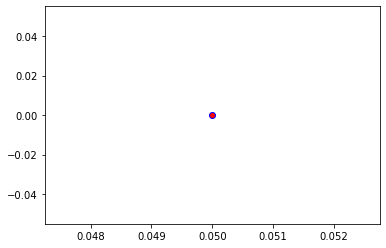

Crafting adversarial images took: 8.825047016143799 seconds 

Images classified as:
000000451150 931 = bagel
000000451155 669 = mosquito net
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


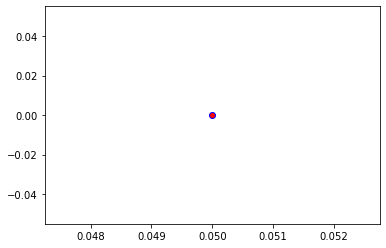

Crafting adversarial images took: 7.936424732208252 seconds 

Images classified as:
000000451308 481 = cassette
000000451435 421 = bannister
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


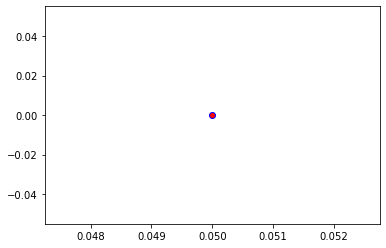

Crafting adversarial images took: 8.016129732131958 seconds 

Images classified as:
000000451571 66 = corn
000000451693 963 = pizza
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


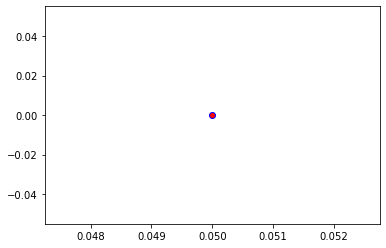

Crafting adversarial images took: 8.096561193466187 seconds 

Images classified as:
000000451714 248 = ski
000000451879 981 = ballplayer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


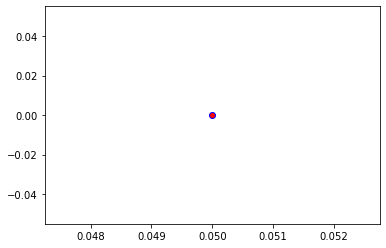

Crafting adversarial images took: 8.097650051116943 seconds 

Images classified as:
000000452084 962 = meat loaf
000000452122 404 = airliner
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


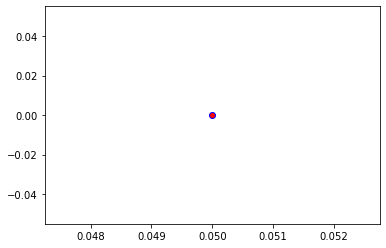

Crafting adversarial images took: 8.115374088287354 seconds 

Images classified as:
000000452321 874 = trolleybus
000000452515 416 = balance beam
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


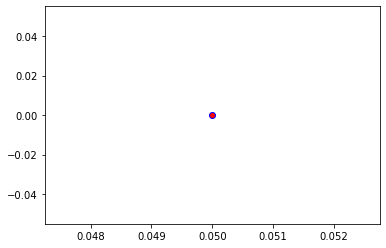

Crafting adversarial images took: 8.072615623474121 seconds 

Images classified as:
000000452784 937 = broccoli
000000452793 648 = medicine chest
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


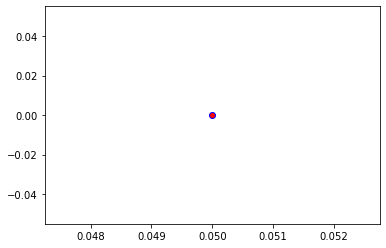

Crafting adversarial images took: 8.217814683914185 seconds 

Images classified as:
000000452891 216 = clumber
000000453001 462 = broom
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


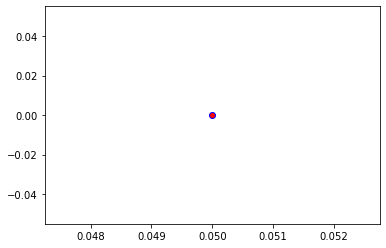

Crafting adversarial images took: 8.046291828155518 seconds 

Images classified as:
000000453040 28 = pot
000000453166 652 = military uniform
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


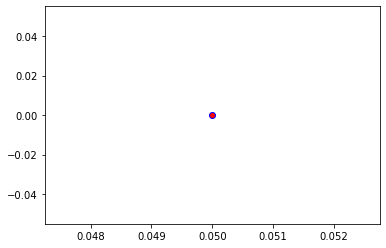

Crafting adversarial images took: 8.085620641708374 seconds 

Images classified as:
000000453302 534 = washer
000000453341 495 = china cabinet
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


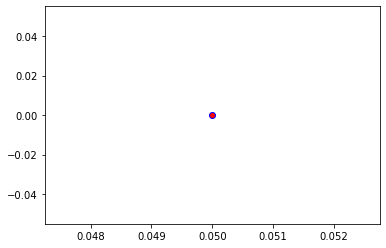

Crafting adversarial images took: 8.11564826965332 seconds 

Images classified as:
000000453584 694 = paddlewheel
000000453634 861 = toilet seat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


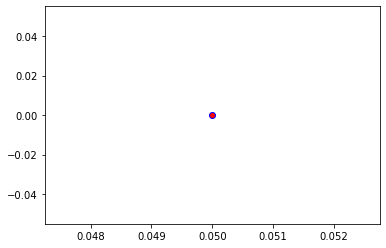

Crafting adversarial images took: 8.291139602661133 seconds 

Images classified as:
000000453708 614 = kimono
000000453722 564 = four-poster
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


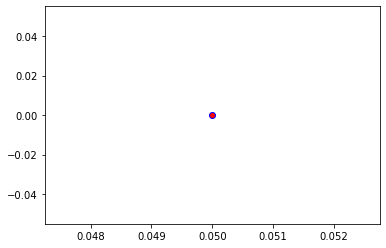

Crafting adversarial images took: 8.144693851470947 seconds 

Images classified as:
000000453841 920 = traffic light
000000453860 632 = loudspeaker
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


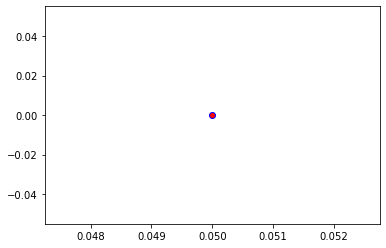

Crafting adversarial images took: 8.066921472549438 seconds 

Images classified as:
000000453981 297 = sloth bear
000000454067 851 = television
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


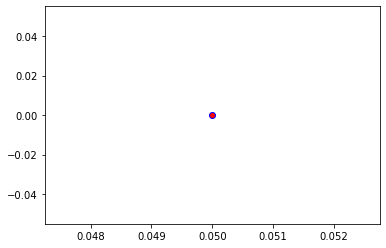

Crafting adversarial images took: 8.628436803817749 seconds 

Images classified as:
000000454404 747 = punching bag
000000454661 324 = cab
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


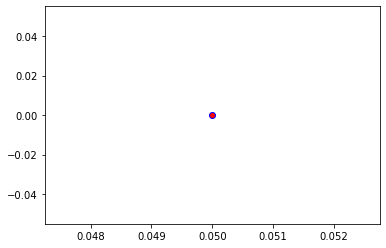

Crafting adversarial images took: 7.995020151138306 seconds 

Images classified as:
000000454750 340 = zebra
000000454798 354 = Arabian camel
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


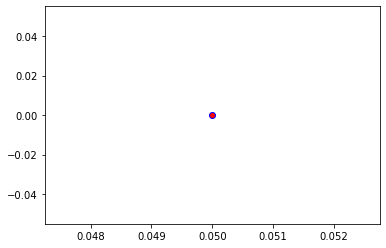

Crafting adversarial images took: 8.088581085205078 seconds 

Images classified as:
000000454978 665 = moped
000000455085 874 = trolleybus
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


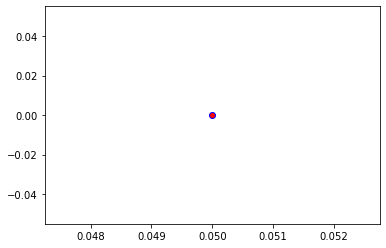

Crafting adversarial images took: 7.9373626708984375 seconds 

Images classified as:
000000455157 634 = lumbermill
000000455219 690 = oxcart
Min values in image-array: 0.07174852 Max values in image-array: 255.0
Min values in image-array: 0.00028136672 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


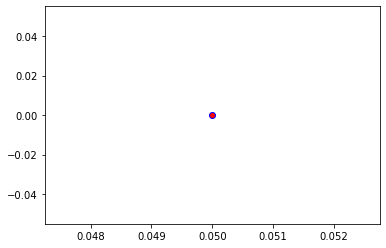

Crafting adversarial images took: 8.089816331863403 seconds 

Images classified as:
000000455267 909 = wok
000000455301 669 = mosquito net
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


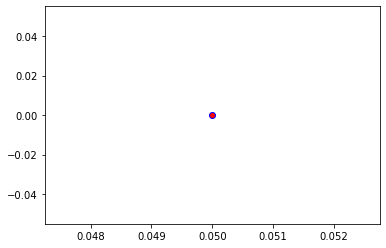

Crafting adversarial images took: 8.18472957611084 seconds 

Images classified as:
000000455352 442 = bell cote
000000455448 415 = bakery
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


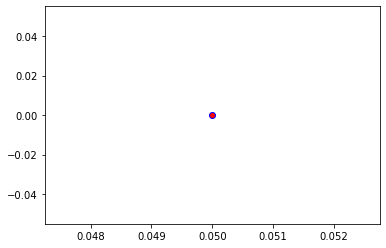

Crafting adversarial images took: 8.081377506256104 seconds 

Images classified as:
000000455555 889 = violin
000000455597 424 = barbershop
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


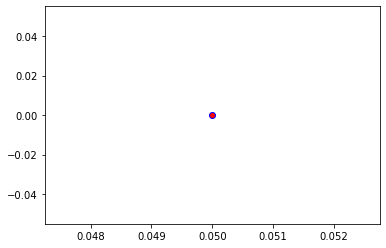

Crafting adversarial images took: 8.375886678695679 seconds 

Images classified as:
000000455624 670 = motor scooter
000000455716 665 = moped
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


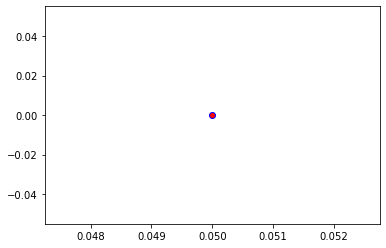

Crafting adversarial images took: 8.101396322250366 seconds 

Images classified as:
000000455872 536 = dock
000000455937 831 = studio couch
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


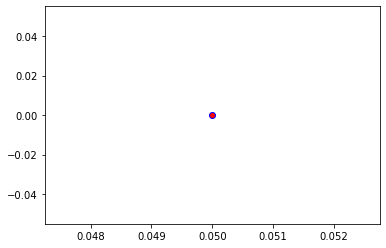

Crafting adversarial images took: 8.14687466621399 seconds 

Images classified as:
000000455981 861 = toilet seat
000000456015 354 = Arabian camel
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


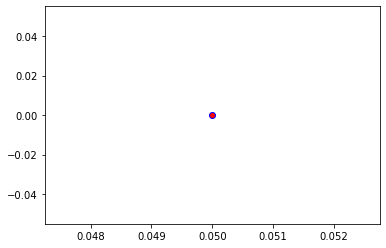

Crafting adversarial images took: 8.067259550094604 seconds 

Images classified as:
000000456143 924 = guacamole
000000456292 896 = washbasin
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


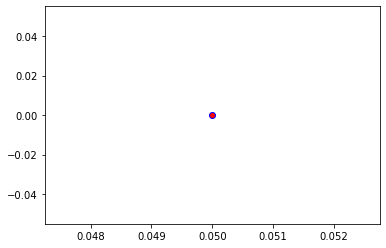

Crafting adversarial images took: 8.089715242385864 seconds 

Images classified as:
000000456303 537 = dogsled
000000456394 665 = moped
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


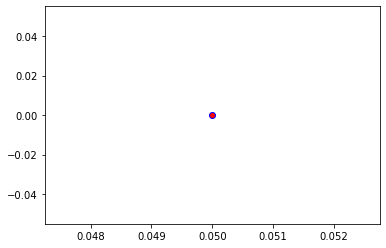

Crafting adversarial images took: 8.054057836532593 seconds 

Images classified as:
000000456496 562 = fountain
000000456559 906 = Windsor tie
Min values in image-array: 0.0 Max values in image-array: 254.90529
Min values in image-array: 0.0 Max values in image-array: 0.9996286
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


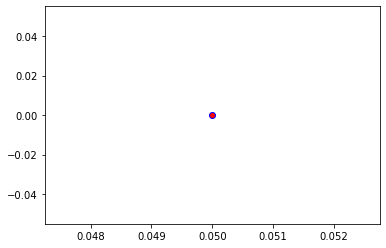

Crafting adversarial images took: 8.361008167266846 seconds 

Images classified as:
000000456662 697 = pajama
000000456865 404 = airliner
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


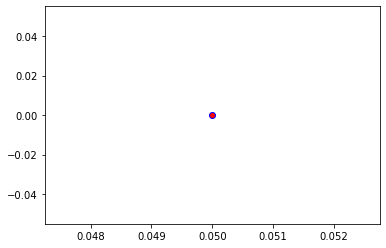

Crafting adversarial images took: 8.674670219421387 seconds 

Images classified as:
000000457078 648 = medicine chest
000000457262 954 = banana
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


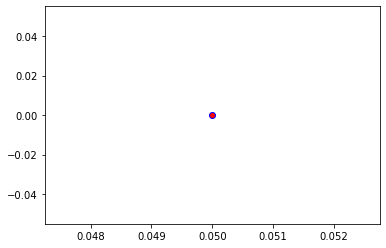

Crafting adversarial images took: 7.967540264129639 seconds 

Images classified as:
000000457559 805 = soccer ball
000000457848 665 = moped
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


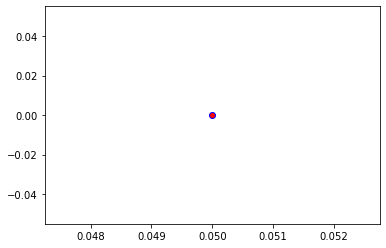

Crafting adversarial images took: 7.956898212432861 seconds 

Images classified as:
000000457884 981 = ballplayer
000000458045 230 = Shetland sheepdog
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


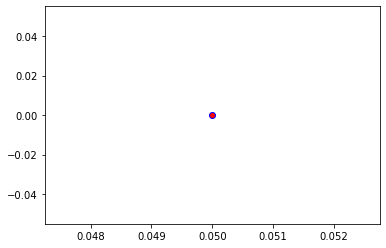

Crafting adversarial images took: 7.931243181228638 seconds 

Images classified as:
000000458054 861 = toilet seat
000000458109 547 = electric locomotive
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


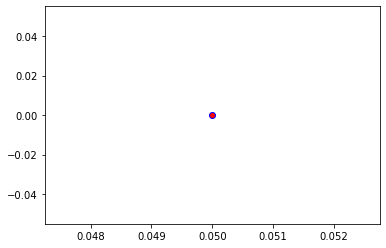

Crafting adversarial images took: 7.9801225662231445 seconds 

Images classified as:
000000458223 460 = breakwater
000000458255 750 = quilt
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


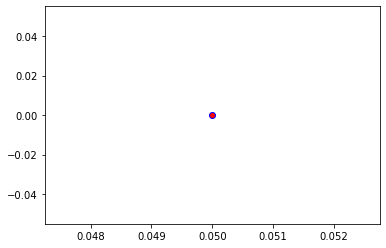

Crafting adversarial images took: 8.167214393615723 seconds 

Images classified as:
000000458325 734 = police van
000000458410 651 = microwave
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


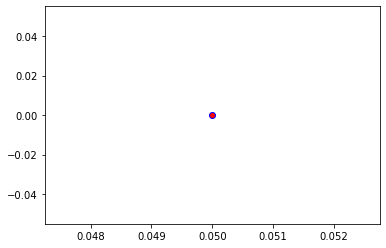

Crafting adversarial images took: 8.139121770858765 seconds 

Images classified as:
000000458663 905 = window shade
000000458702 704 = parking meter
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


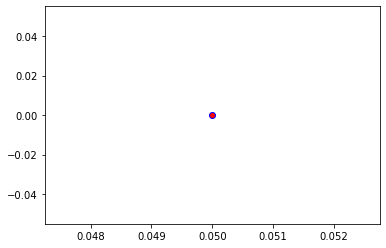

Crafting adversarial images took: 8.324692964553833 seconds 

Images classified as:
000000458755 5 = ram
000000458768 789 = shoji
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


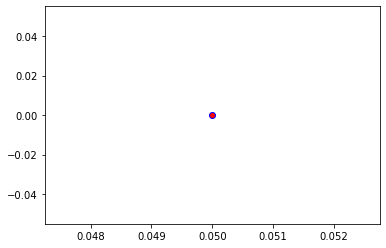

Crafting adversarial images took: 8.098768472671509 seconds 

Images classified as:
000000458790 904 = window screen
000000458992 963 = pizza
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


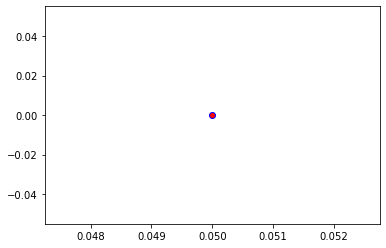

Crafting adversarial images took: 8.139522314071655 seconds 

Images classified as:
000000459153 703 = park bench
000000459195 491 = chain saw
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


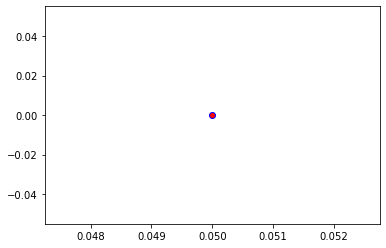

Crafting adversarial images took: 8.058140754699707 seconds 

Images classified as:
000000459272 898 = water bottle
000000459396 37 = ox
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


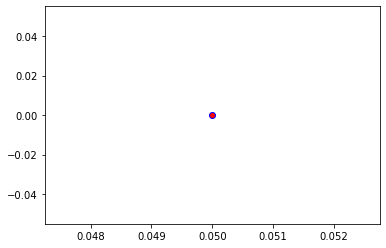

Crafting adversarial images took: 8.282543897628784 seconds 

Images classified as:
000000459437 354 = Arabian camel
000000459467 404 = airliner
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


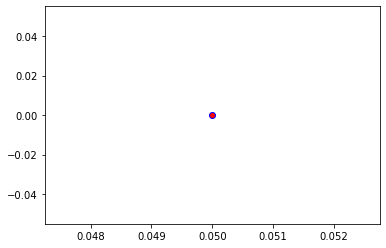

Crafting adversarial images took: 8.072489738464355 seconds 

Images classified as:
000000459500 708 = pedestal
000000459634 140 = alp
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


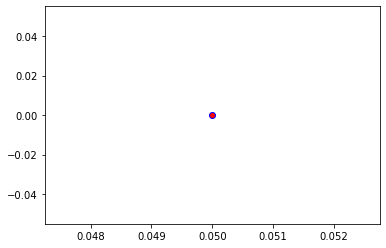

Crafting adversarial images took: 8.166266679763794 seconds 

Images classified as:
000000459662 680 = nipple
000000459757 9 = ostrich
Min values in image-array: 0.0 Max values in image-array: 254.0
Min values in image-array: 0.0 Max values in image-array: 0.99607843
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


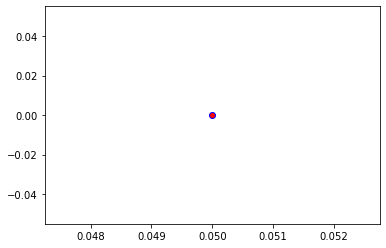

Crafting adversarial images took: 9.117213010787964 seconds 

Images classified as:
000000459809 576 = gondola
000000459887 954 = banana
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


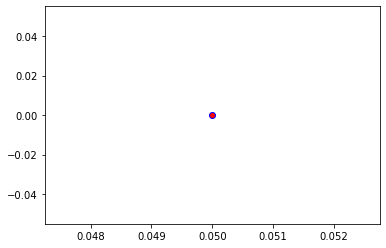

Crafting adversarial images took: 8.1275794506073 seconds 

Images classified as:
000000459954 713 = photocopier
000000460147 829 = streetcar
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


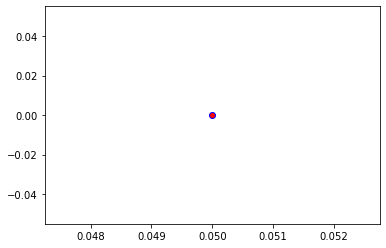

Crafting adversarial images took: 8.16108775138855 seconds 

Images classified as:
000000460160 144 = pelican
000000460229 919 = street sign
Min values in image-array: 0.0 Max values in image-array: 253.71289
Min values in image-array: 0.0 Max values in image-array: 0.9949525
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


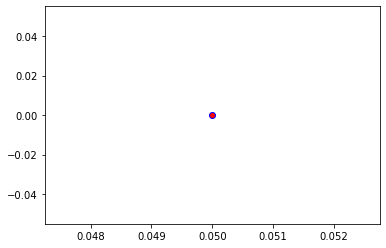

Crafting adversarial images took: 8.184765100479126 seconds 

Images classified as:
000000460333 846 = table lamp
000000460347 874 = trolleybus
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


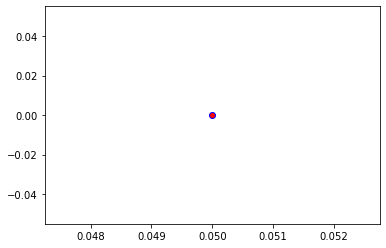

Crafting adversarial images took: 7.983065843582153 seconds 

Images classified as:
000000460379 9 = ostrich
000000460494 461 = plate
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


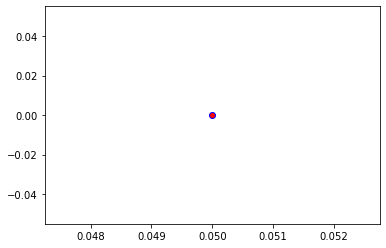

Crafting adversarial images took: 7.957739591598511 seconds 

Images classified as:
000000460682 248 = ski
000000460683 639 = suit
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


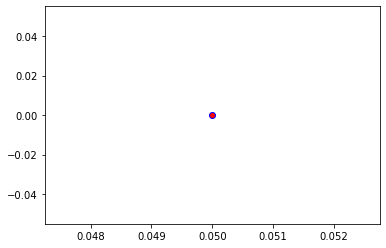

Crafting adversarial images took: 7.941985368728638 seconds 

Images classified as:
000000460841 700 = paper towel
000000460927 294 = brown bear
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


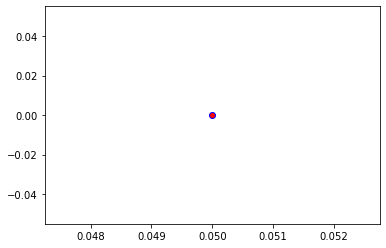

Crafting adversarial images took: 8.231834411621094 seconds 

Images classified as:
000000460929 934 = hotdog
000000460967 874 = trolleybus
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


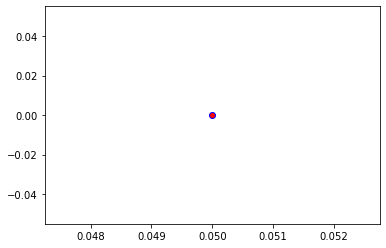

Crafting adversarial images took: 8.252856969833374 seconds 

Images classified as:
000000461009 722 = ping-pong ball
000000461036 379 = howler monkey
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


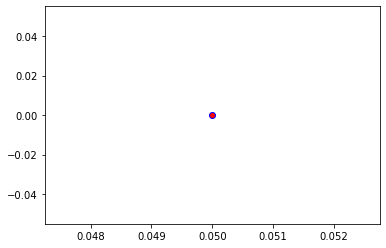

Crafting adversarial images took: 8.143614530563354 seconds 

Images classified as:
000000461275 919 = street sign
000000461405 222 = kuvasz
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


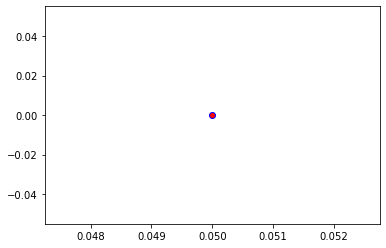

Crafting adversarial images took: 8.117678165435791 seconds 

Images classified as:
000000461573 703 = park bench
000000461751 665 = moped
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


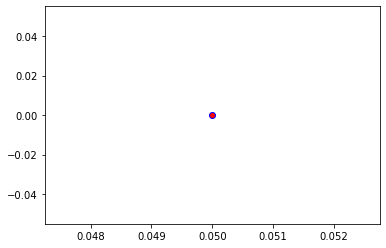

Crafting adversarial images took: 8.188139200210571 seconds 

Images classified as:
000000462031 981 = ballplayer
000000462371 739 = potter's wheel
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


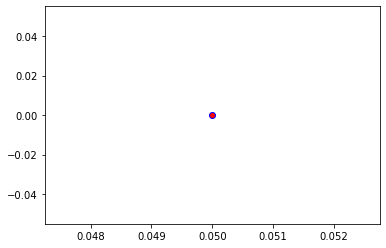

Crafting adversarial images took: 8.241739511489868 seconds 

Images classified as:
000000462576 940 = spaghetti squash
000000462614 794 = shower curtain
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


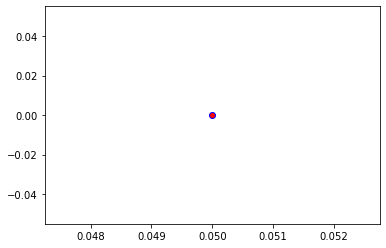

Crafting adversarial images took: 8.333884000778198 seconds 

Images classified as:
000000462629 760 = refrigerator
000000462643 487 = cellular telephone
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


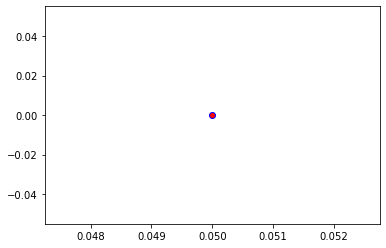

Crafting adversarial images took: 8.748204469680786 seconds 

Images classified as:
000000462728 814 = speedboat
000000462756 856 = thresher
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


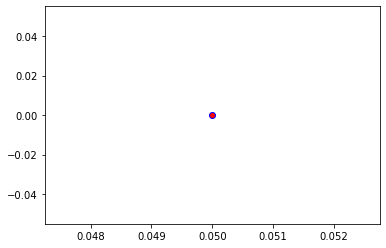

Crafting adversarial images took: 8.14022970199585 seconds 

Images classified as:
000000462904 690 = oxcart
000000463037 895 = warplane
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


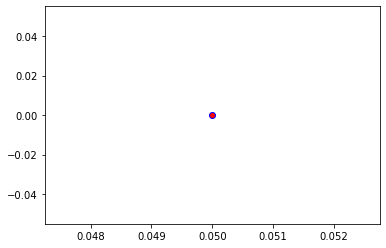

Crafting adversarial images took: 8.128168106079102 seconds 

Images classified as:
000000463174 752 = racket
000000463199 465 = bulletproof vest
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


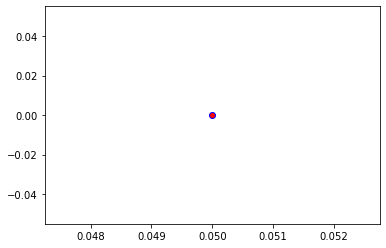

Crafting adversarial images took: 8.073609352111816 seconds 

Images classified as:
000000463283 969 = eggnog
000000463522 603 = horse cart
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


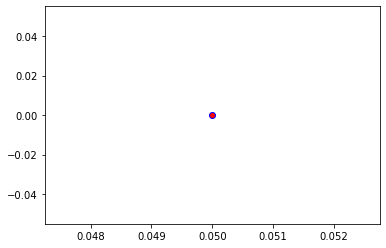

Crafting adversarial images took: 7.888579607009888 seconds 

Images classified as:
000000463527 934 = hotdog
000000463542 248 = ski
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


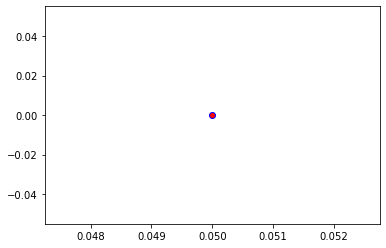

Crafting adversarial images took: 8.076552867889404 seconds 

Images classified as:
000000463618 529 = diaper
000000463647 637 = mailbox
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


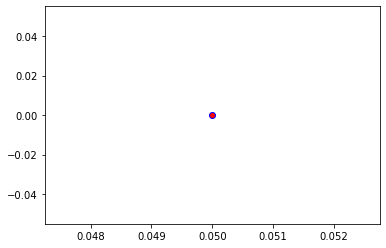

Crafting adversarial images took: 7.963045597076416 seconds 

Images classified as:
000000463690 422 = barbell
000000463730 654 = minibus
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


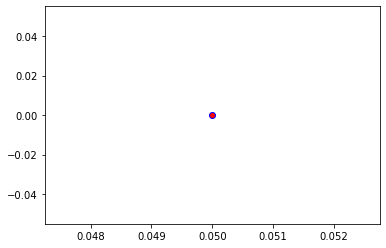

Crafting adversarial images took: 7.930931568145752 seconds 

Images classified as:
000000463802 474 = cardigan
000000463842 831 = studio couch
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


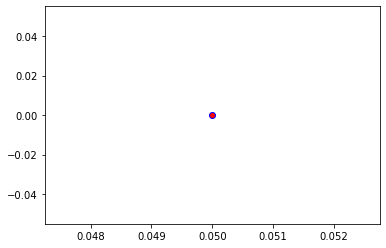

Crafting adversarial images took: 8.119020700454712 seconds 

Images classified as:
000000463849 576 = gondola
000000463918 642 = marimba
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


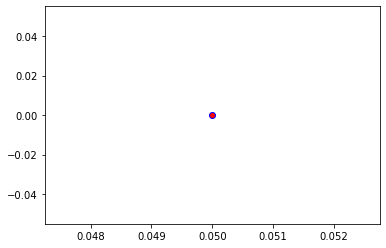

Crafting adversarial images took: 8.123586416244507 seconds 

Images classified as:
000000464089 429 = baseball
000000464144 248 = ski
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


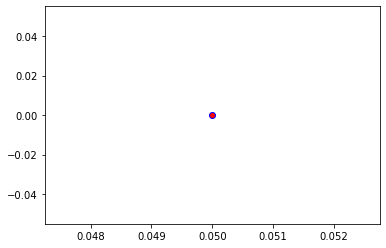

Crafting adversarial images took: 8.260278224945068 seconds 

Images classified as:
000000464251 12 = house finch
000000464358 435 = tub
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


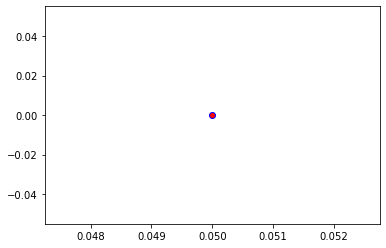

Crafting adversarial images took: 8.119484901428223 seconds 

Images classified as:
000000464476 480 = cash machine
000000464522 164 = bluetick
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


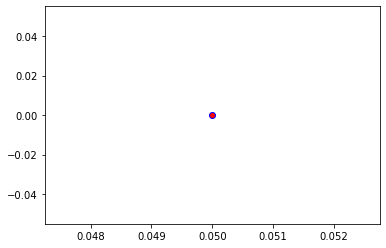

Crafting adversarial images took: 8.132245779037476 seconds 

Images classified as:
000000464689 708 = pedestal
000000464786 934 = hotdog
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


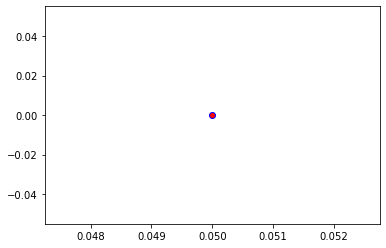

Crafting adversarial images took: 8.043164730072021 seconds 

Images classified as:
000000464824 4 = hammerhead
000000464872 340 = zebra
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


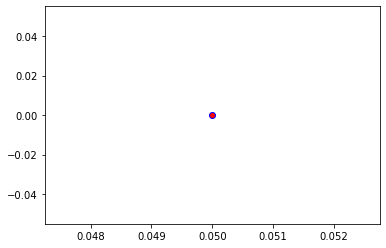

Crafting adversarial images took: 8.749507427215576 seconds 

Images classified as:
000000465129 617 = lab coat
000000465179 793 = shower cap
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


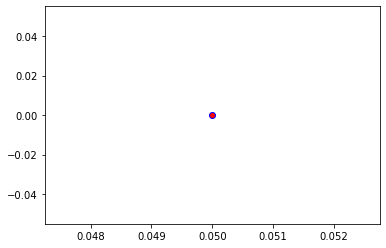

Crafting adversarial images took: 8.277973413467407 seconds 

Images classified as:
000000465180 385 = Indian elephant
000000465430 930 = French loaf
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


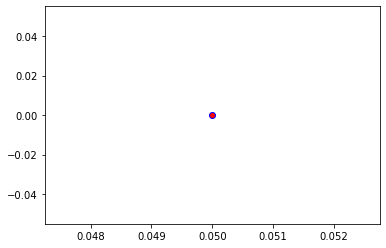

Crafting adversarial images took: 8.12105679512024 seconds 

Images classified as:
000000465549 697 = pajama
000000465585 937 = broccoli
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


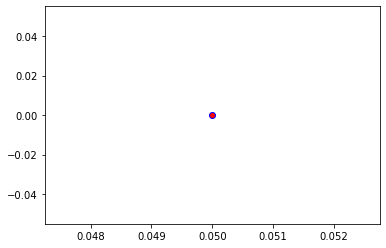

Crafting adversarial images took: 8.19895625114441 seconds 

Images classified as:
000000465675 866 = tractor
000000465718 527 = desktop computer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


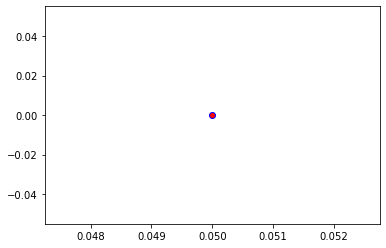

Crafting adversarial images took: 8.081754207611084 seconds 

Images classified as:
000000465806 499 = cleaver
000000465822 745 = projector
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


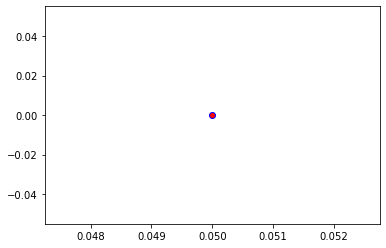

Crafting adversarial images took: 7.9380340576171875 seconds 

Images classified as:
000000465836 248 = ski
000000466085 896 = washbasin
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


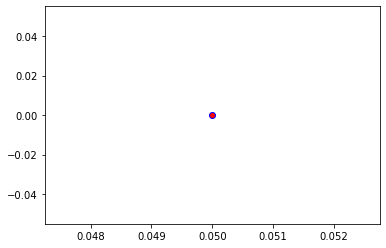

Crafting adversarial images took: 8.085883855819702 seconds 

Images classified as:
000000466125 879 = umbrella
000000466156 206 = curly-coated retriever
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


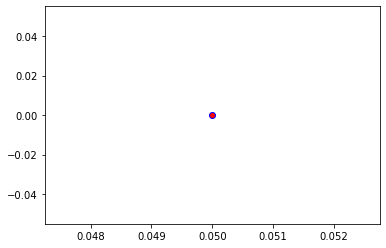

Crafting adversarial images took: 7.944782495498657 seconds 

Images classified as:
000000466256 461 = plate
000000466339 894 = wardrobe
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


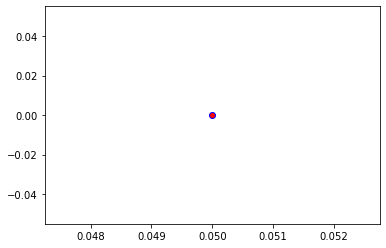

Crafting adversarial images took: 7.936568737030029 seconds 

Images classified as:
000000466416 498 = palace
000000466567 997 = bolete
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


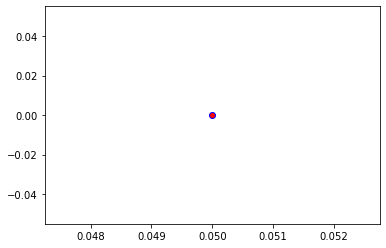

Crafting adversarial images took: 8.02337098121643 seconds 

Images classified as:
000000466602 792 = shovel
000000466835 954 = banana
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


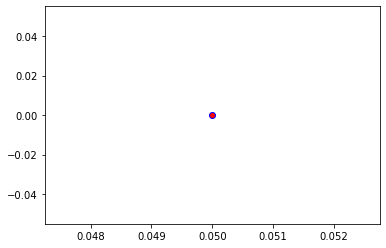

Crafting adversarial images took: 8.108139991760254 seconds 

Images classified as:
000000466986 642 = marimba
000000467176 851 = television
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


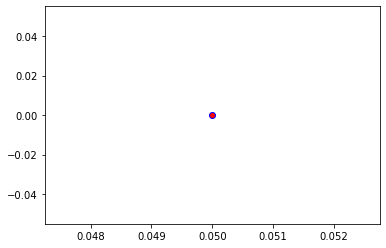

Crafting adversarial images took: 8.429102659225464 seconds 

Images classified as:
000000467315 883 = vase
000000467511 665 = moped
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


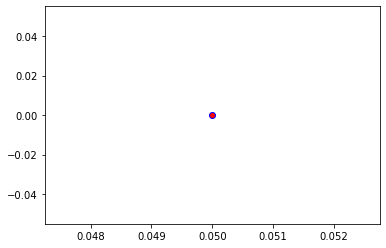

Crafting adversarial images took: 8.117564678192139 seconds 

Images classified as:
000000467776 355 = llama
000000467848 867 = trailer truck
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


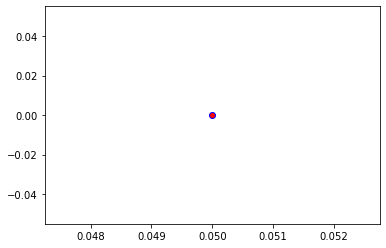

Crafting adversarial images took: 8.15001106262207 seconds 

Images classified as:
000000468124 874 = trolleybus
000000468233 826 = stopwatch
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


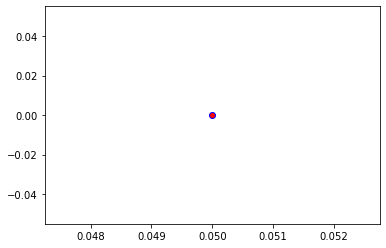

Crafting adversarial images took: 8.83016324043274 seconds 

Images classified as:
000000468245 905 = window shade
000000468332 529 = diaper
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


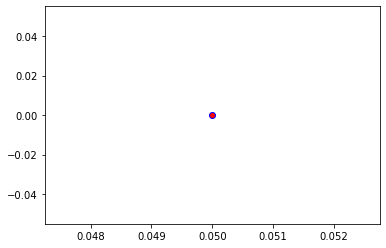

Crafting adversarial images took: 8.127487897872925 seconds 

Images classified as:
000000468501 731 = plunger
000000468505 532 = dining table
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


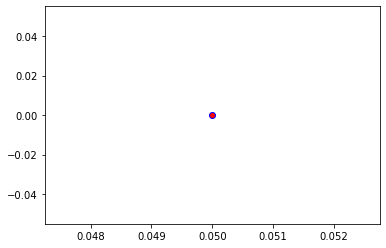

Crafting adversarial images took: 8.425056219100952 seconds 

Images classified as:
000000468577 520 = crib
000000468632 890 = volleyball
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


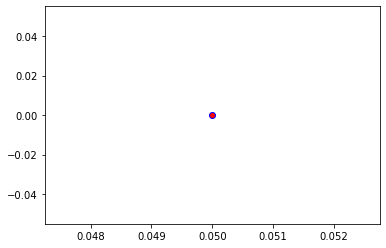

Crafting adversarial images took: 8.195216655731201 seconds 

Images classified as:
000000468925 962 = meat loaf
000000468954 529 = diaper
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


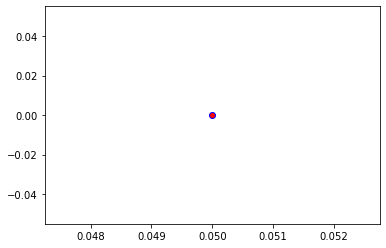

Crafting adversarial images took: 8.09282898902893 seconds 

Images classified as:
000000468965 862 = torch
000000469067 669 = mosquito net
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


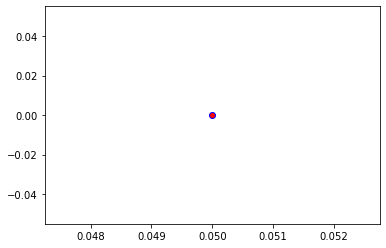

Crafting adversarial images took: 8.092316627502441 seconds 

Images classified as:
000000469174 557 = flagpole
000000469192 717 = pickup
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


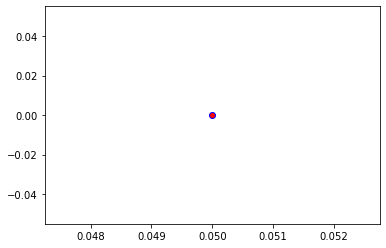

Crafting adversarial images took: 8.208201169967651 seconds 

Images classified as:
000000469246 705 = passenger car
000000469652 289 = snow leopard
Min values in image-array: 0.025348434 Max values in image-array: 255.0
Min values in image-array: 9.9405624e-05 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


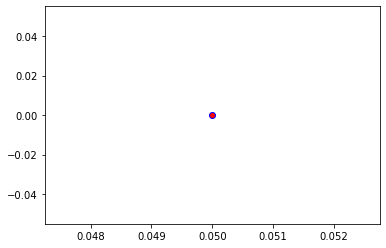

Crafting adversarial images took: 8.038377046585083 seconds 

Images classified as:
000000469828 248 = ski
000000470121 461 = plate
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


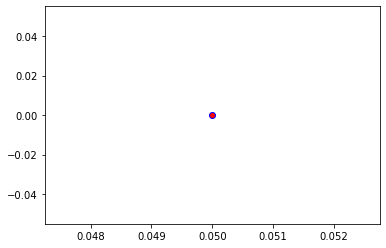

Crafting adversarial images took: 8.085169315338135 seconds 

Images classified as:
000000470173 708 = pedestal
000000470773 788 = shoe shop
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


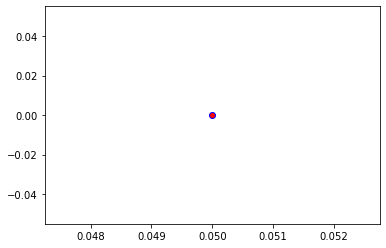

Crafting adversarial images took: 7.952866077423096 seconds 

Images classified as:
000000470779 248 = ski
000000470924 118 = Dungeness crab
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


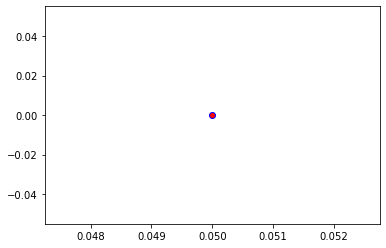

Crafting adversarial images took: 7.9039528369903564 seconds 

Images classified as:
000000470952 248 = ski
000000471023 565 = freight car
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


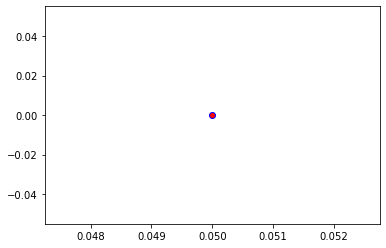

Crafting adversarial images took: 8.128734350204468 seconds 

Images classified as:
000000471087 869 = trench coat
000000471450 294 = brown bear
Min values in image-array: 0.0026253685 Max values in image-array: 255.0
Min values in image-array: 1.0295563e-05 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


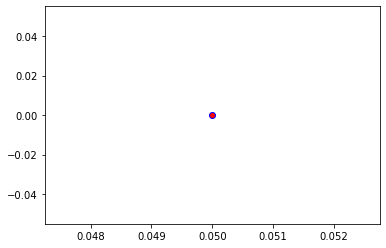

Crafting adversarial images took: 8.53847861289978 seconds 

Images classified as:
000000471567 355 = llama
000000471756 693 = paddle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


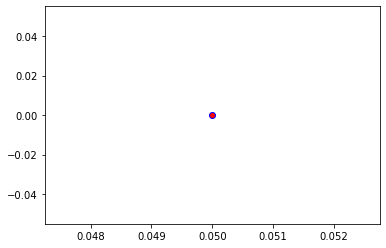

Crafting adversarial images took: 8.122243165969849 seconds 

Images classified as:
000000471789 701 = parachute
000000471869 850 = teddy
Min values in image-array: 0.0 Max values in image-array: 254.76842
Min values in image-array: 0.0 Max values in image-array: 0.9990918
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


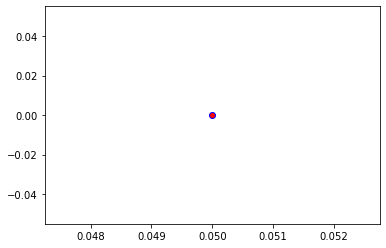

Crafting adversarial images took: 8.742168188095093 seconds 

Images classified as:
000000471893 624 = library
000000471991 884 = vault
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


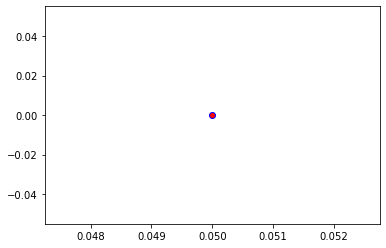

Crafting adversarial images took: 8.074177026748657 seconds 

Images classified as:
000000472030 703 = park bench
000000472046 532 = dining table
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


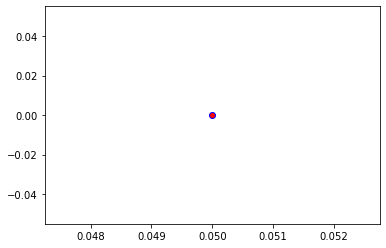

Crafting adversarial images took: 8.114335060119629 seconds 

Images classified as:
000000472298 472 = canoe
000000472375 235 = German shepherd
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


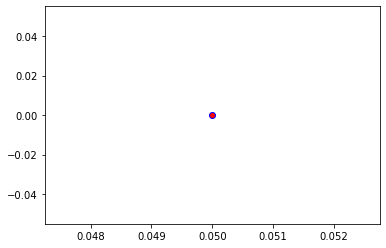

Crafting adversarial images took: 8.079423427581787 seconds 

Images classified as:
000000472623 671 = mountain bike
000000472678 526 = desk
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


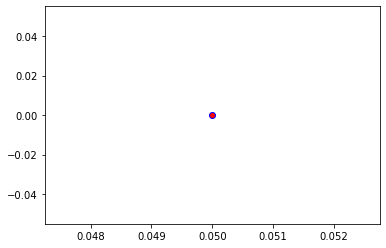

Crafting adversarial images took: 8.108189582824707 seconds 

Images classified as:
000000473015 141 = redshank
000000473118 830 = stretcher
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


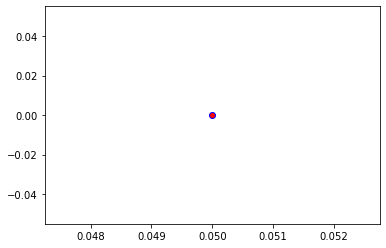

Crafting adversarial images took: 8.259675741195679 seconds 

Images classified as:
000000473121 248 = ski
000000473219 617 = lab coat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


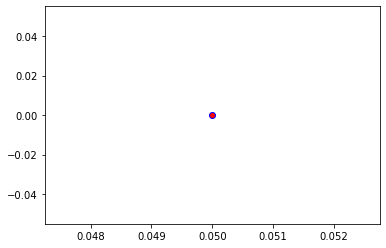

Crafting adversarial images took: 8.121028184890747 seconds 

Images classified as:
000000473237 121 = king crab
000000473406 700 = paper towel
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


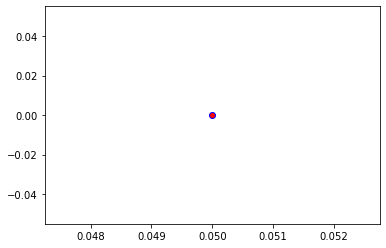

Crafting adversarial images took: 8.166545391082764 seconds 

Images classified as:
000000473821 598 = home theater
000000473869 739 = potter's wheel
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


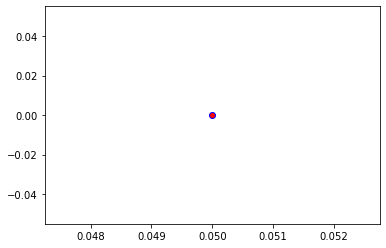

Crafting adversarial images took: 7.923158884048462 seconds 

Images classified as:
000000473974 340 = zebra
000000474021 731 = plunger
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


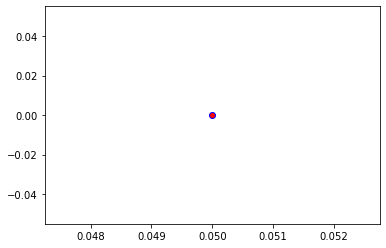

Crafting adversarial images took: 7.918195486068726 seconds 

Images classified as:
000000474028 805 = soccer ball
000000474039 850 = teddy
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


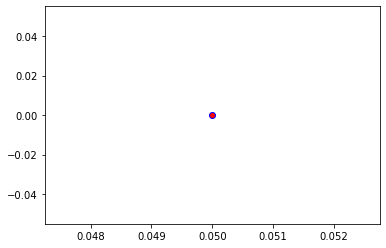

Crafting adversarial images took: 7.977234363555908 seconds 

Images classified as:
000000474078 981 = ballplayer
000000474095 999 = toilet tissue
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


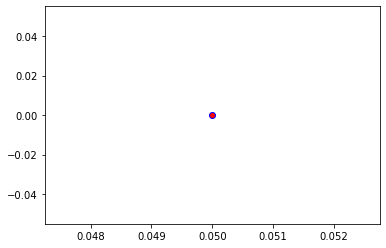

Crafting adversarial images took: 8.100916385650635 seconds 

Images classified as:
000000474164 177 = Scottish deerhound
000000474167 963 = pizza
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


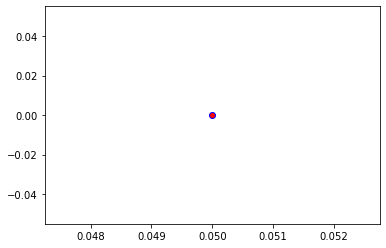

Crafting adversarial images took: 8.019091606140137 seconds 

Images classified as:
000000474170 101 = tusker
000000474293 454 = bookshop
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


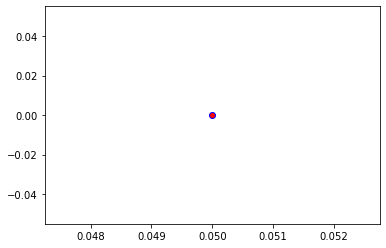

Crafting adversarial images took: 8.129221677780151 seconds 

Images classified as:
000000474344 981 = ballplayer
000000474452 919 = street sign
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


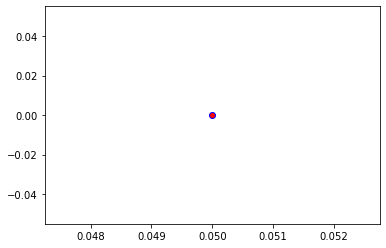

Crafting adversarial images took: 8.876374244689941 seconds 

Images classified as:
000000474786 896 = washbasin
000000474854 929 = ice lolly
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


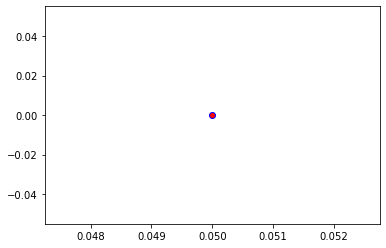

Crafting adversarial images took: 8.11518383026123 seconds 

Images classified as:
000000474881 349 = bighorn
000000475064 932 = pretzel
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


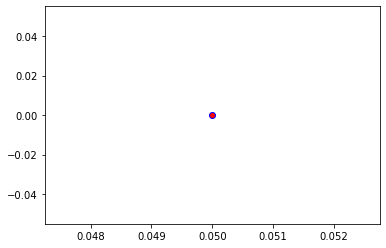

Crafting adversarial images took: 8.746087312698364 seconds 

Images classified as:
000000475150 352 = impala
000000475191 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


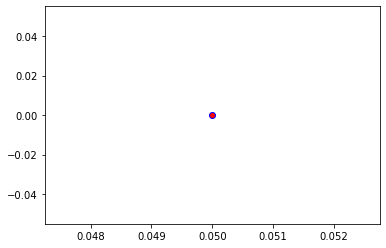

Crafting adversarial images took: 8.163289785385132 seconds 

Images classified as:
000000475223 133 = bittern
000000475365 547 = electric locomotive
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


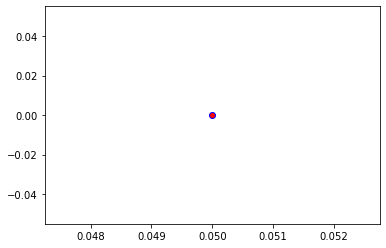

Crafting adversarial images took: 8.149032831192017 seconds 

Images classified as:
000000475387 547 = electric locomotive
000000475484 358 = pole
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


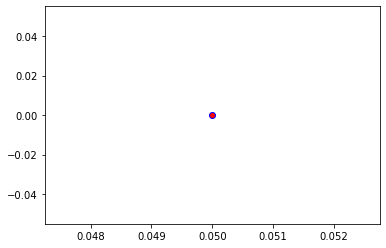

Crafting adversarial images took: 8.16559624671936 seconds 

Images classified as:
000000475572 850 = teddy
000000475678 597 = holster
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


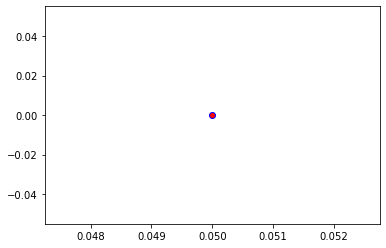

Crafting adversarial images took: 8.126157283782959 seconds 

Images classified as:
000000475732 282 = tiger cat
000000475779 101 = tusker
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


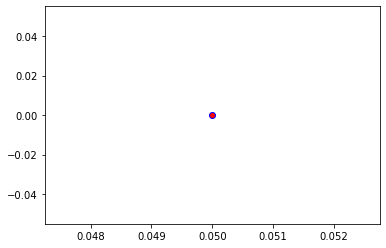

Crafting adversarial images took: 8.349711179733276 seconds 

Images classified as:
000000475904 472 = canoe
000000476119 880 = unicycle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


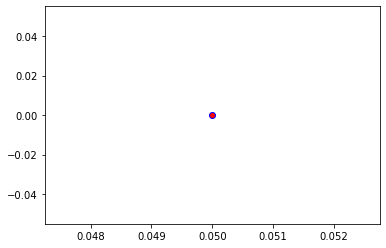

Crafting adversarial images took: 8.155184745788574 seconds 

Images classified as:
000000476215 603 = horse cart
000000476258 880 = unicycle
Min values in image-array: 0.0 Max values in image-array: 254.99681
Min values in image-array: 0.0 Max values in image-array: 0.9999875
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


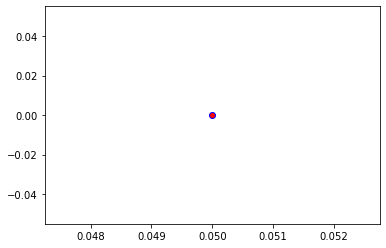

Crafting adversarial images took: 7.993758201599121 seconds 

Images classified as:
000000476415 906 = Windsor tie
000000476491 920 = traffic light
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


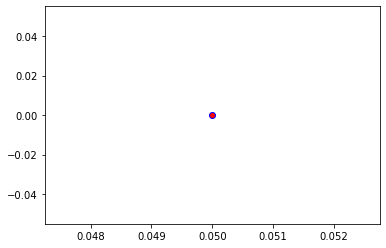

Crafting adversarial images took: 7.877964019775391 seconds 

Images classified as:
000000476514 982 = groom
000000476704 874 = trolleybus
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


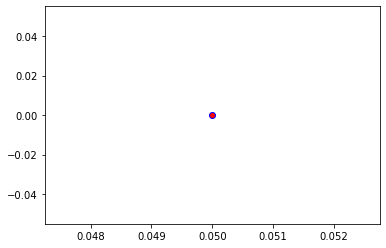

Crafting adversarial images took: 8.021281242370605 seconds 

Images classified as:
000000476770 981 = ballplayer
000000476787 963 = pizza
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


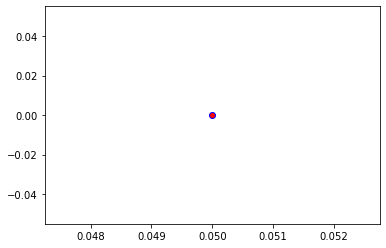

Crafting adversarial images took: 7.891151189804077 seconds 

Images classified as:
000000476810 761 = remote control
000000477118 919 = street sign
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


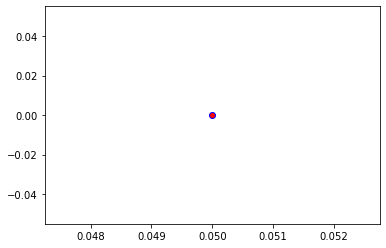

Crafting adversarial images took: 8.36423397064209 seconds 

Images classified as:
000000477227 694 = paddlewheel
000000477288 456 = bow
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


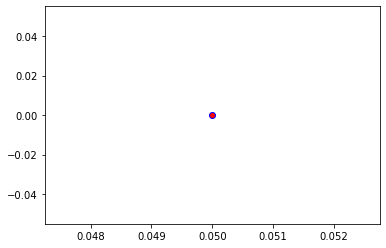

Crafting adversarial images took: 8.830114126205444 seconds 

Images classified as:
000000477441 318 = wing
000000477623 547 = electric locomotive
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


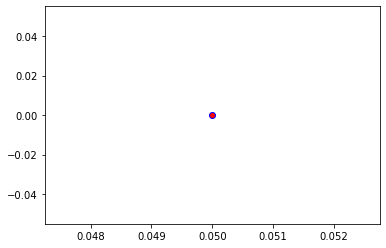

Crafting adversarial images took: 8.204047679901123 seconds 

Images classified as:
000000477689 617 = lab coat
000000477805 542 = drumstick
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


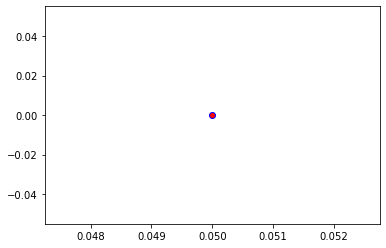

Crafting adversarial images took: 8.101185083389282 seconds 

Images classified as:
000000477955 701 = parachute
000000478136 415 = bakery
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


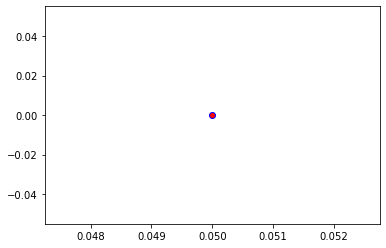

Crafting adversarial images took: 8.112473726272583 seconds 

Images classified as:
000000478286 565 = freight car
000000478393 265 = toy poodle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


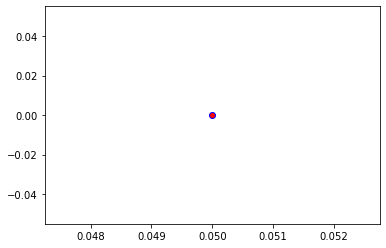

Crafting adversarial images took: 8.131703615188599 seconds 

Images classified as:
000000478420 775 = sarong
000000478474 867 = trailer truck
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


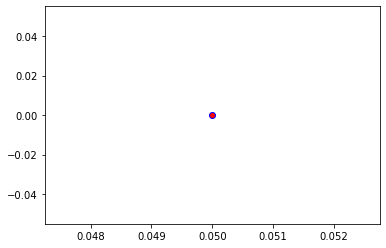

Crafting adversarial images took: 8.282780170440674 seconds 

Images classified as:
000000478721 978 = seashore
000000478862 895 = warplane
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


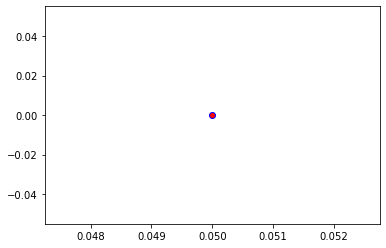

Crafting adversarial images took: 8.047500848770142 seconds 

Images classified as:
000000479030 547 = electric locomotive
000000479099 272 = coyote
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


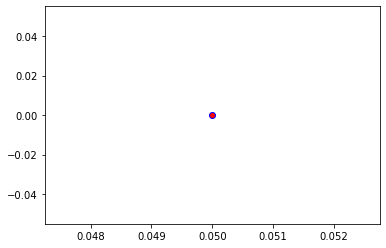

Crafting adversarial images took: 8.132412195205688 seconds 

Images classified as:
000000479126 681 = notebook
000000479155 270 = white wolf
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


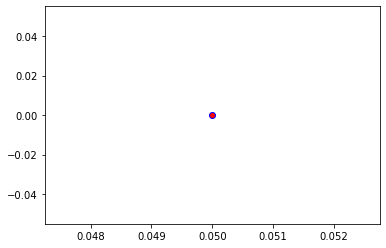

Crafting adversarial images took: 8.10253620147705 seconds 

Images classified as:
000000479248 548 = entertainment center
000000479448 932 = pretzel
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


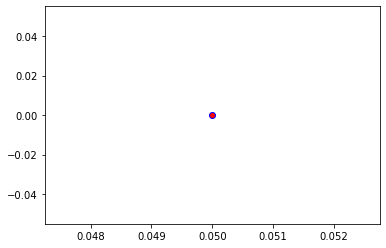

Crafting adversarial images took: 8.167415142059326 seconds 

Images classified as:
000000479596 950 = orange
000000479732 933 = cheeseburger
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


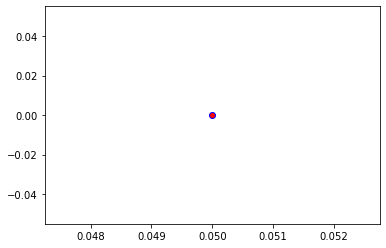

Crafting adversarial images took: 8.18787956237793 seconds 

Images classified as:
000000479912 404 = airliner
000000479953 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


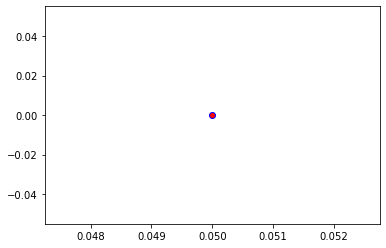

Crafting adversarial images took: 7.911343097686768 seconds 

Images classified as:
000000480021 665 = moped
000000480122 651 = microwave
Min values in image-array: 0.0 Max values in image-array: 254.87245
Min values in image-array: 0.0 Max values in image-array: 0.9994998
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


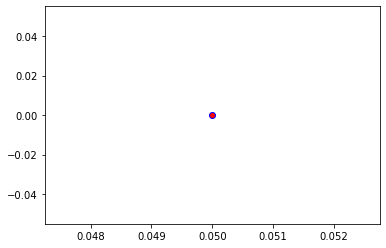

Crafting adversarial images took: 7.951208829879761 seconds 

Images classified as:
000000480212 605 = iPod
000000480275 603 = horse cart
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


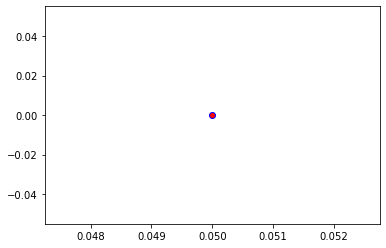

Crafting adversarial images took: 8.008821964263916 seconds 

Images classified as:
000000480842 275 = hyena
000000480936 861 = toilet seat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


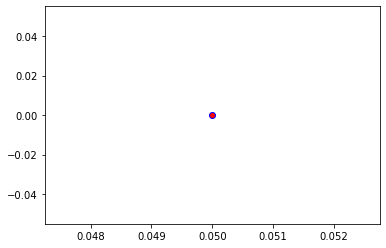

Crafting adversarial images took: 8.680497646331787 seconds 

Images classified as:
000000480944 920 = traffic light
000000480985 895 = warplane
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


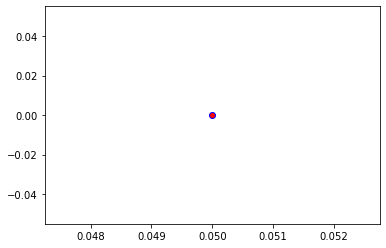

Crafting adversarial images took: 8.205766677856445 seconds 

Images classified as:
000000481159 339 = sorrel
000000481386 824 = stole
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


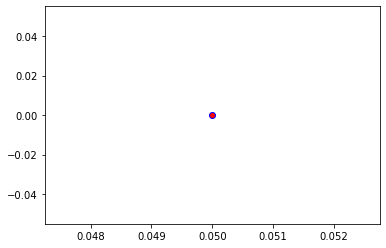

Crafting adversarial images took: 8.125094652175903 seconds 

Images classified as:
000000481390 430 = basketball
000000481404 884 = vault
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


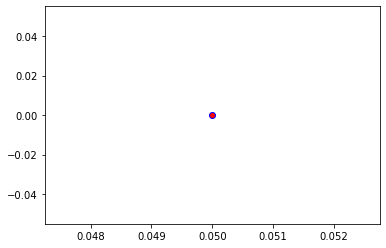

Crafting adversarial images took: 8.120599031448364 seconds 

Images classified as:
000000481413 842 = swimming trunks
000000481480 557 = flagpole
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


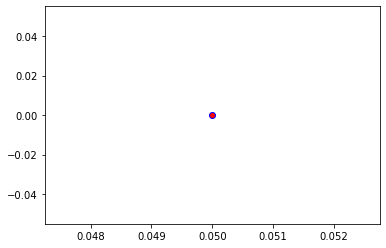

Crafting adversarial images took: 8.140244245529175 seconds 

Images classified as:
000000481567 665 = moped
000000481573 807 = solar dish
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


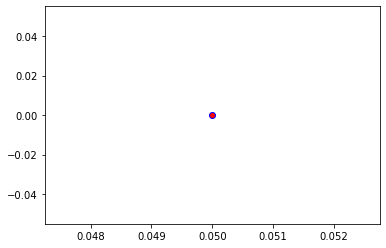

Crafting adversarial images took: 8.10831356048584 seconds 

Images classified as:
000000481582 354 = Arabian camel
000000482100 861 = toilet seat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


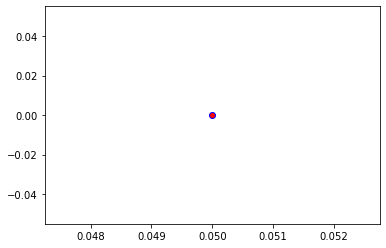

Crafting adversarial images took: 8.298059940338135 seconds 

Images classified as:
000000482275 982 = groom
000000482319 431 = bassinet
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


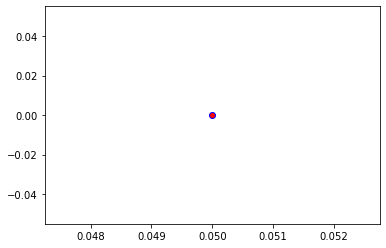

Crafting adversarial images took: 8.115353107452393 seconds 

Images classified as:
000000482436 424 = barbershop
000000482477 21 = kite
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


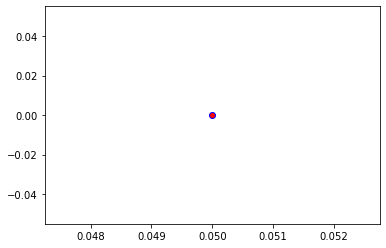

Crafting adversarial images took: 8.183095932006836 seconds 

Images classified as:
000000482487 778 = scale
000000482585 705 = passenger car
Min values in image-array: 0.9286423 Max values in image-array: 255.0
Min values in image-array: 0.0036417344 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


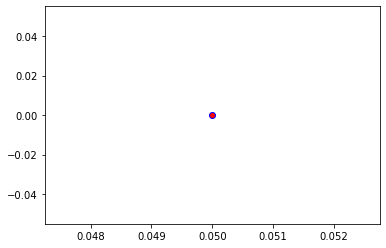

Crafting adversarial images took: 8.123428106307983 seconds 

Images classified as:
000000482719 954 = banana
000000482735 209 = Chesapeake Bay retriever
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


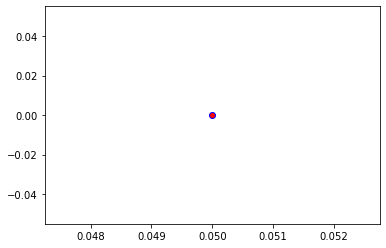

Crafting adversarial images took: 8.090751886367798 seconds 

Images classified as:
000000482800 522 = croquet ball
000000482917 253 = basenji
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


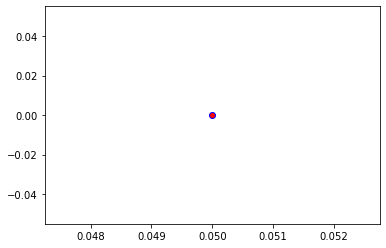

Crafting adversarial images took: 8.302063941955566 seconds 

Images classified as:
000000482970 620 = laptop
000000482978 705 = passenger car
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


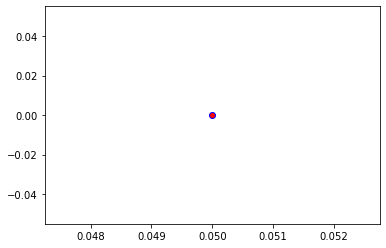

Crafting adversarial images took: 8.132821559906006 seconds 

Images classified as:
000000483050 831 = studio couch
000000483531 831 = studio couch
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


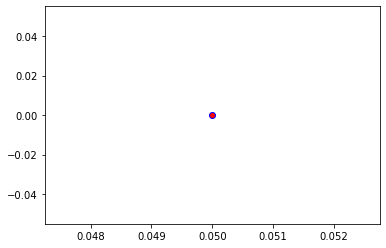

Crafting adversarial images took: 7.900840759277344 seconds 

Images classified as:
000000483667 515 = cowboy hat
000000483999 762 = restaurant
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


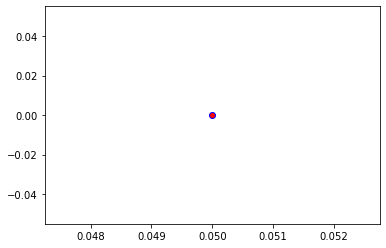

Crafting adversarial images took: 8.684534311294556 seconds 

Images classified as:
000000484029 919 = street sign
000000484296 340 = zebra
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


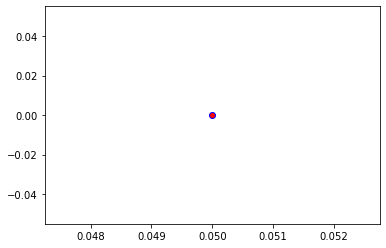

Crafting adversarial images took: 8.034394025802612 seconds 

Images classified as:
000000484351 624 = library
000000484404 829 = streetcar
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


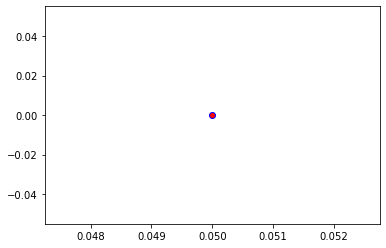

Crafting adversarial images took: 7.882973670959473 seconds 

Images classified as:
000000484415 896 = washbasin
000000484760 497 = church
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


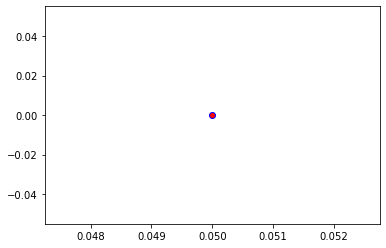

Crafting adversarial images took: 8.103932857513428 seconds 

Images classified as:
000000484893 54 = hog
000000484978 762 = restaurant
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


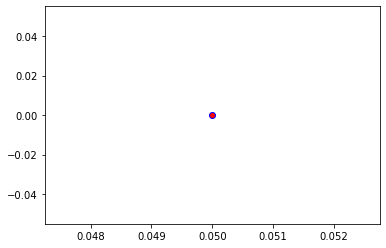

Crafting adversarial images took: 8.178672790527344 seconds 

Images classified as:
000000485027 752 = racket
000000485071 842 = swimming trunks
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


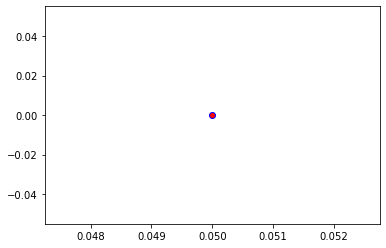

Crafting adversarial images took: 8.261573791503906 seconds 

Images classified as:
000000485130 636 = mailbag
000000485237 895 = warplane
Min values in image-array: 0.0 Max values in image-array: 254.87643
Min values in image-array: 0.0 Max values in image-array: 0.9995154
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


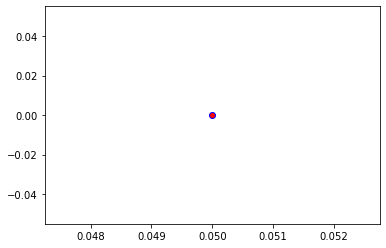

Crafting adversarial images took: 8.180925130844116 seconds 

Images classified as:
000000485424 495 = china cabinet
000000485480 981 = ballplayer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


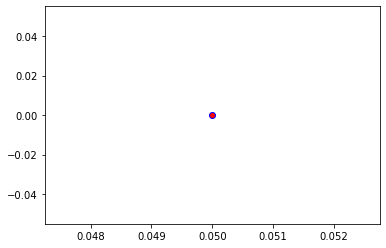

Crafting adversarial images took: 8.287516117095947 seconds 

Images classified as:
000000485802 812 = space shuttle
000000485844 601 = hoopskirt
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


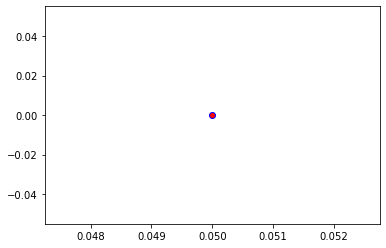

Crafting adversarial images took: 8.047082662582397 seconds 

Images classified as:
000000485895 293 = cheetah
000000485972 813 = spatula
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


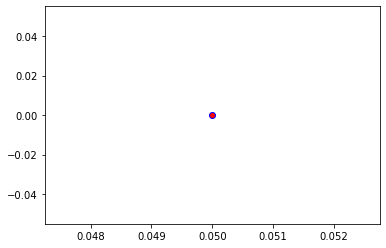

Crafting adversarial images took: 8.27412462234497 seconds 

Images classified as:
000000486040 620 = laptop
000000486046 340 = zebra
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


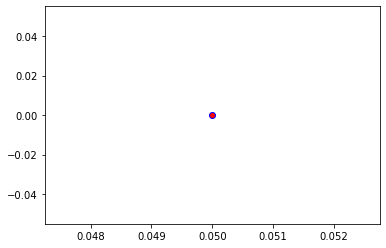

Crafting adversarial images took: 8.126968145370483 seconds 

Images classified as:
000000486104 981 = ballplayer
000000486112 386 = African elephant
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


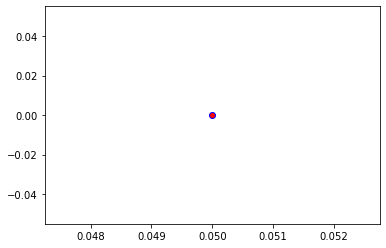

Crafting adversarial images took: 8.132785558700562 seconds 

Images classified as:
000000486438 960 = chocolate sauce
000000486479 208 = Labrador retriever
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


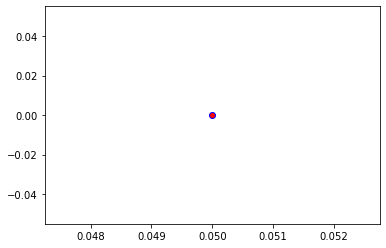

Crafting adversarial images took: 8.136153221130371 seconds 

Images classified as:
000000486573 870 = tricycle
000000487583 794 = shower curtain
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


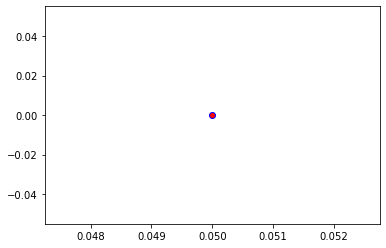

Crafting adversarial images took: 8.04073166847229 seconds 

Images classified as:
000000488075 894 = wardrobe
000000488166 934 = hotdog
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


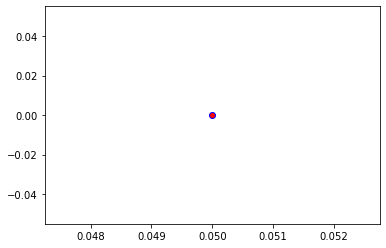

Crafting adversarial images took: 8.78934097290039 seconds 

Images classified as:
000000488251 339 = sorrel
000000488270 977 = sandbar
Min values in image-array: 0.2563412 Max values in image-array: 255.0
Min values in image-array: 0.0010052596 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


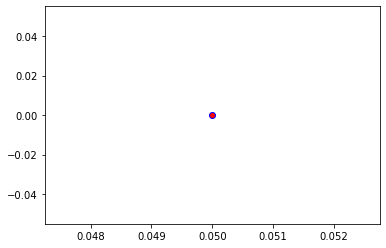

Crafting adversarial images took: 7.914450645446777 seconds 

Images classified as:
000000488385 665 = moped
000000488592 582 = grocery store
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


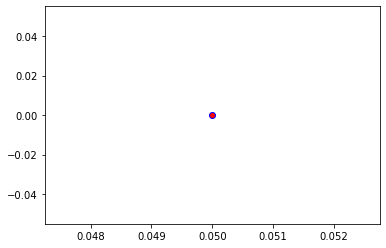

Crafting adversarial images took: 7.963971853256226 seconds 

Images classified as:
000000488664 820 = steam locomotive
000000488673 969 = eggnog
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


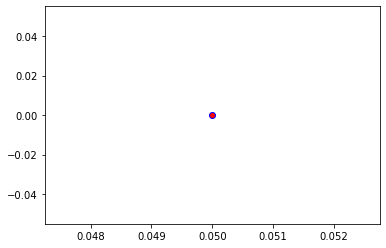

Crafting adversarial images took: 7.936795473098755 seconds 

Images classified as:
000000488710 921 = book jacket
000000488736 892 = wall clock
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


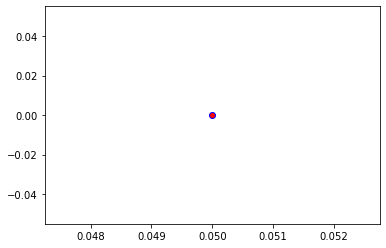

Crafting adversarial images took: 8.047276496887207 seconds 

Images classified as:
000000489014 484 = catamaran
000000489046 85 = quail
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


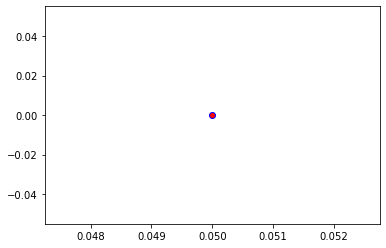

Crafting adversarial images took: 8.108762502670288 seconds 

Images classified as:
000000489091 648 = medicine chest
000000489305 666 = mortar
Min values in image-array: 0.75 Max values in image-array: 255.0
Min values in image-array: 0.0029411765 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


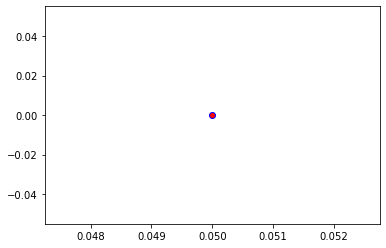

Crafting adversarial images took: 8.287158012390137 seconds 

Images classified as:
000000489339 248 = ski
000000489611 680 = nipple
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


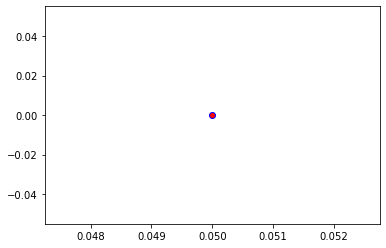

Crafting adversarial images took: 8.099036931991577 seconds 

Images classified as:
000000489764 529 = diaper
000000489842 611 = jigsaw puzzle
Min values in image-array: 0.0 Max values in image-array: 254.7149
Min values in image-array: 0.0 Max values in image-array: 0.998882
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


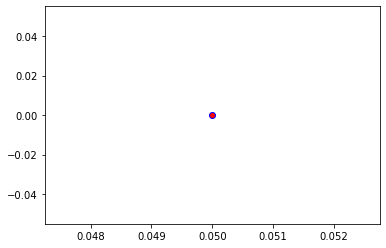

Crafting adversarial images took: 8.06513500213623 seconds 

Images classified as:
000000489924 774 = sandal
000000490125 89 = sulphur-crested cockatoo
Min values in image-array: 0.0 Max values in image-array: 245.70753
Min values in image-array: 0.0 Max values in image-array: 0.963559
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


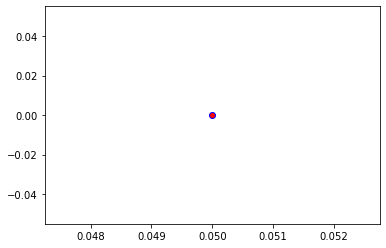

Crafting adversarial images took: 8.132595777511597 seconds 

Images classified as:
000000490171 49 = African crocodile
000000490413 404 = airliner
Min values in image-array: 0.030139446 Max values in image-array: 255.0
Min values in image-array: 0.00011819391 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


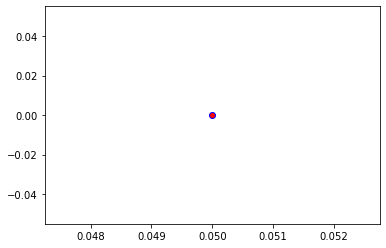

Crafting adversarial images took: 8.09125828742981 seconds 

Images classified as:
000000490470 484 = catamaran
000000490515 537 = dogsled
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


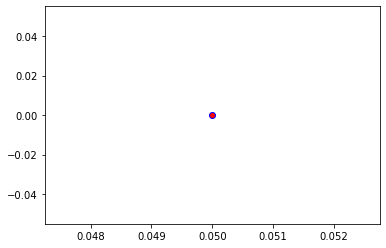

Crafting adversarial images took: 8.236890077590942 seconds 

Images classified as:
000000490936 879 = umbrella
000000491008 583 = guillotine
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


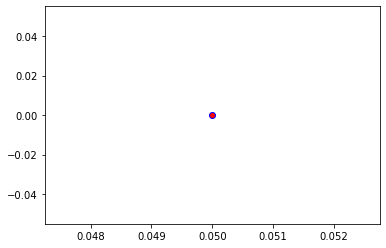

Crafting adversarial images took: 8.094790697097778 seconds 

Images classified as:
000000491071 896 = washbasin
000000491090 665 = moped
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


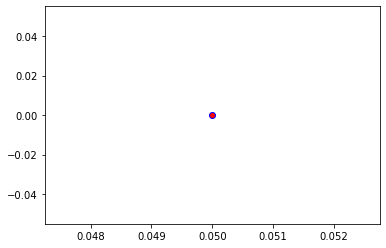

Crafting adversarial images took: 8.20688247680664 seconds 

Images classified as:
000000491130 248 = ski
000000491213 665 = moped
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


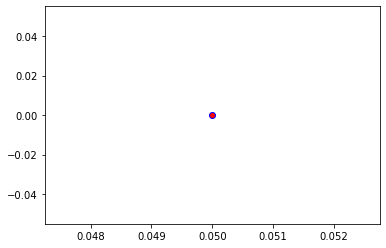

Crafting adversarial images took: 8.856355667114258 seconds 

Images classified as:
000000491216 526 = desk
000000491366 851 = television
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


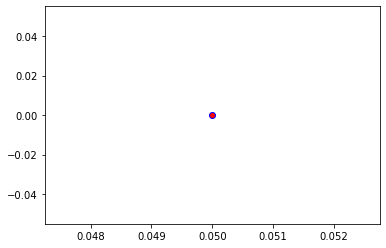

Crafting adversarial images took: 7.863478183746338 seconds 

Images classified as:
000000491464 981 = ballplayer
000000491470 421 = bannister
Min values in image-array: 0.0 Max values in image-array: 254.74307
Min values in image-array: 0.0 Max values in image-array: 0.99899244
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


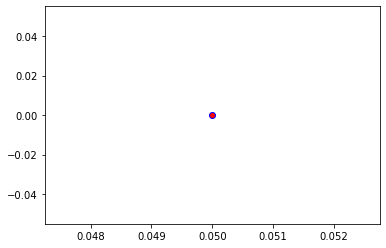

Crafting adversarial images took: 7.907145261764526 seconds 

Images classified as:
000000491497 831 = studio couch
000000491613 340 = zebra
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


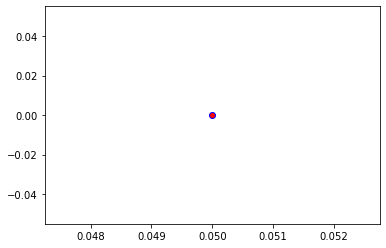

Crafting adversarial images took: 8.07446551322937 seconds 

Images classified as:
000000491683 346 = water buffalo
000000491725 536 = dock
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


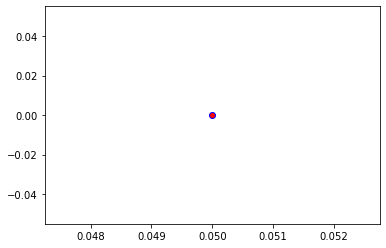

Crafting adversarial images took: 7.8664257526397705 seconds 

Images classified as:
000000491757 284 = Siamese cat
000000491867 617 = lab coat
Min values in image-array: 0.0 Max values in image-array: 251.75534
Min values in image-array: 0.0 Max values in image-array: 0.98727584
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


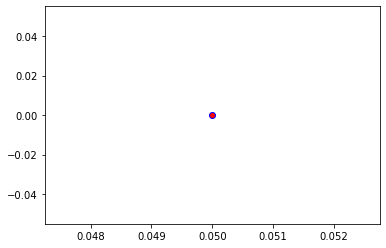

Crafting adversarial images took: 8.056170463562012 seconds 

Images classified as:
000000492077 612 = jinrikisha
000000492110 681 = notebook
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


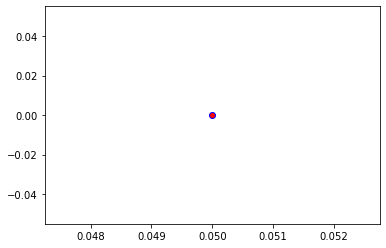

Crafting adversarial images took: 8.076684713363647 seconds 

Images classified as:
000000492282 603 = horse cart
000000492284 256 = Newfoundland
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


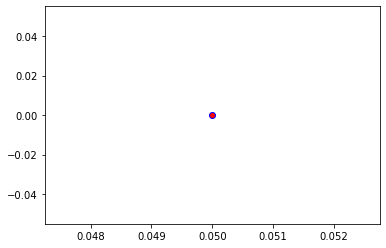

Crafting adversarial images took: 8.236095190048218 seconds 

Images classified as:
000000492362 582 = grocery store
000000492758 799 = sliding door
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


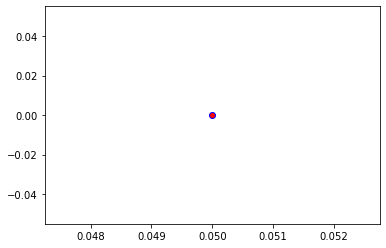

Crafting adversarial images took: 8.231499433517456 seconds 

Images classified as:
000000492878 435 = bathtub
000000492905 526 = desk
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


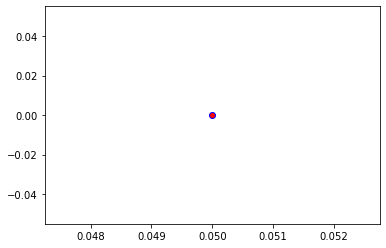

Crafting adversarial images took: 8.072250366210938 seconds 

Images classified as:
000000492937 872 = tripod
000000492968 248 = ski
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


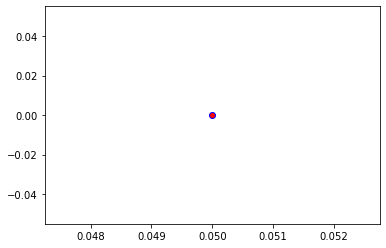

Crafting adversarial images took: 8.120272874832153 seconds 

Images classified as:
000000492992 346 = water buffalo
000000493019 340 = zebra
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


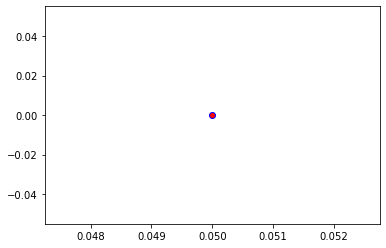

Crafting adversarial images took: 8.034196138381958 seconds 

Images classified as:
000000493284 386 = African elephant
000000493286 657 = missile
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


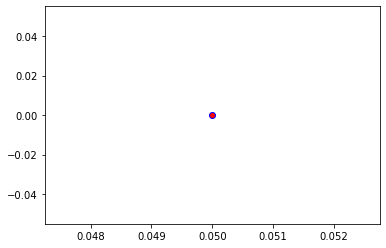

Crafting adversarial images took: 8.05925965309143 seconds 

Images classified as:
000000493334 794 = shower curtain
000000493442 248 = ski
Min values in image-array: 0.0 Max values in image-array: 253.09818
Min values in image-array: 0.0 Max values in image-array: 0.99254185
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


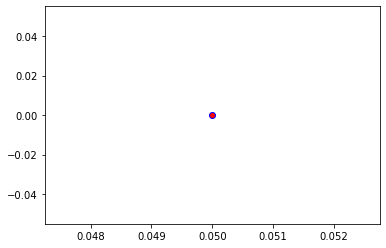

Crafting adversarial images took: 8.413679838180542 seconds 

Images classified as:
000000493566 547 = electric locomotive
000000493613 416 = balance beam
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


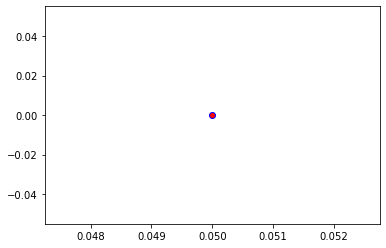

Crafting adversarial images took: 8.757737874984741 seconds 

Images classified as:
000000493772 879 = umbrella
000000493799 461 = plate
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


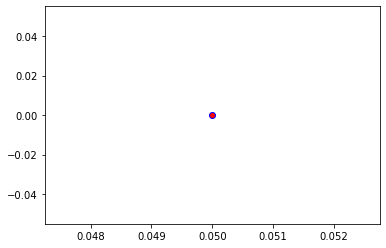

Crafting adversarial images took: 8.121725082397461 seconds 

Images classified as:
000000493864 463 = bucket
000000493905 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


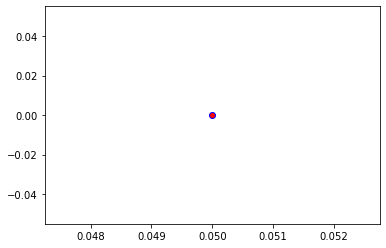

Crafting adversarial images took: 8.031904220581055 seconds 

Images classified as:
000000494188 23 = vulture
000000494427 681 = notebook
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


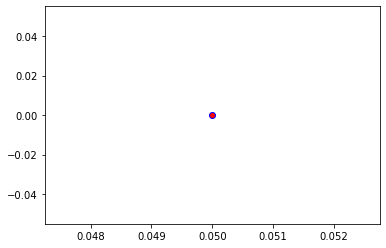

Crafting adversarial images took: 7.965695858001709 seconds 

Images classified as:
000000494634 620 = laptop
000000494759 701 = parachute
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


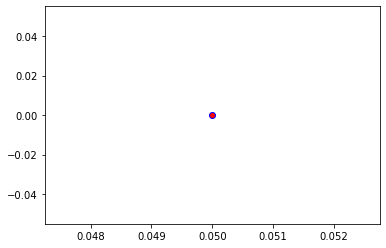

Crafting adversarial images took: 7.994213104248047 seconds 

Images classified as:
000000494863 547 = electric locomotive
000000494869 250 = Siberian husky
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


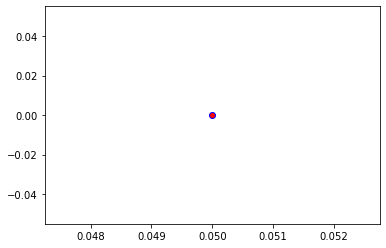

Crafting adversarial images took: 7.918686866760254 seconds 

Images classified as:
000000494913 548 = entertainment center
000000495054 404 = airliner
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


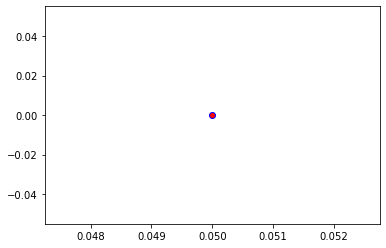

Crafting adversarial images took: 7.972996234893799 seconds 

Images classified as:
000000495146 557 = flagpole
000000495448 619 = lampshade
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


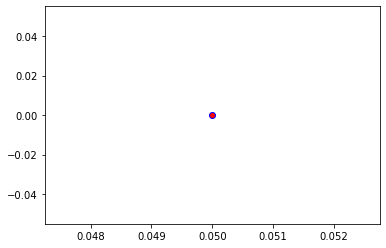

Crafting adversarial images took: 8.153105974197388 seconds 

Images classified as:
000000495732 608 = jean
000000496409 21 = kite
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


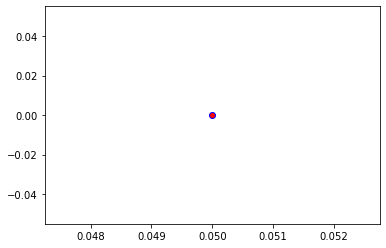

Crafting adversarial images took: 8.047380685806274 seconds 

Images classified as:
000000496571 965 = burrito
000000496597 976 = promontory
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


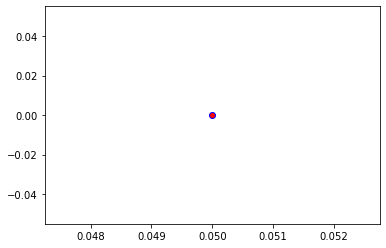

Crafting adversarial images took: 8.135124206542969 seconds 

Images classified as:
000000496722 637 = mailbox
000000496854 879 = umbrella
Min values in image-array: 0.08673267 Max values in image-array: 255.0
Min values in image-array: 0.0003401281 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


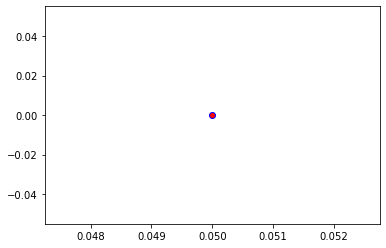

Crafting adversarial images took: 8.28479814529419 seconds 

Images classified as:
000000496954 934 = hotdog
000000497344 620 = laptop
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


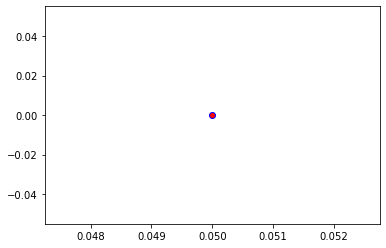

Crafting adversarial images took: 8.139522075653076 seconds 

Images classified as:
000000497568 404 = airliner
000000497599 620 = laptop
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


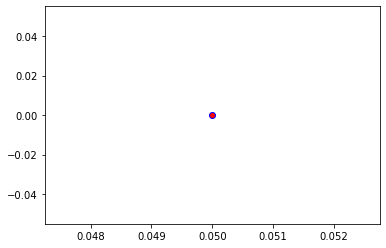

Crafting adversarial images took: 8.12084436416626 seconds 

Images classified as:
000000497628 564 = four-poster
000000497867 654 = minibus
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


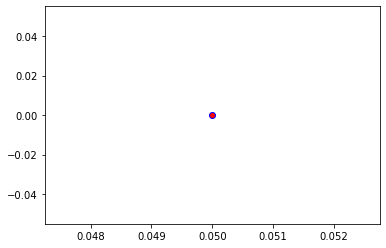

Crafting adversarial images took: 8.076648473739624 seconds 

Images classified as:
000000498032 689 = overskirt
000000498286 182 = Border terrier
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


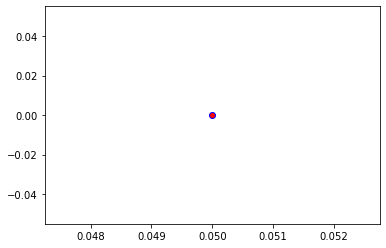

Crafting adversarial images took: 8.76469373703003 seconds 

Images classified as:
000000498463 760 = refrigerator
000000498709 665 = moped
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


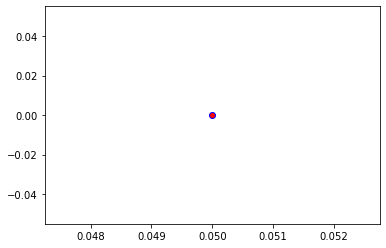

Crafting adversarial images took: 8.389416217803955 seconds 

Images classified as:
000000498747 523 = crutch
000000498807 693 = paddle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


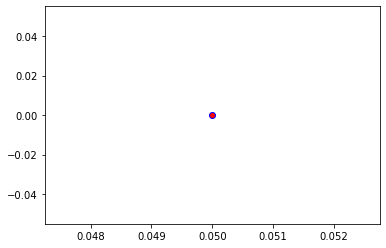

Crafting adversarial images took: 8.089053630828857 seconds 

Images classified as:
000000498857 355 = llama
000000498919 950 = orange
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


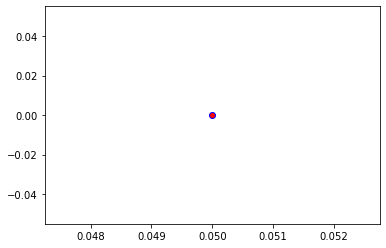

Crafting adversarial images took: 8.19790506362915 seconds 

Images classified as:
000000499031 929 = ice lolly
000000499109 461 = plate
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


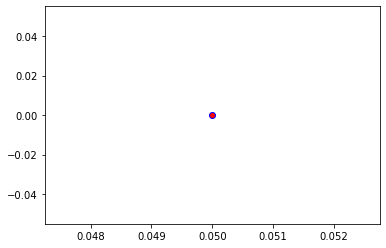

Crafting adversarial images took: 7.850322723388672 seconds 

Images classified as:
000000499181 498 = cinema
000000499266 662 = modem
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


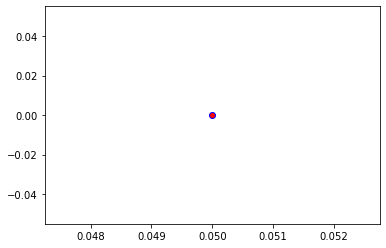

Crafting adversarial images took: 8.062323570251465 seconds 

Images classified as:
000000499313 963 = pizza
000000499622 670 = motor scooter
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


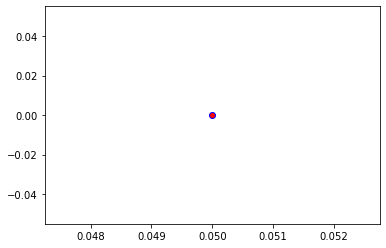

Crafting adversarial images took: 8.098002195358276 seconds 

Images classified as:
000000499768 704 = parking meter
000000499775 874 = trolleybus
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


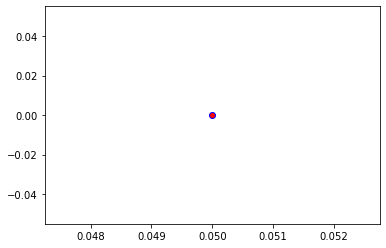

Crafting adversarial images took: 8.929978132247925 seconds 

Images classified as:
000000500049 404 = airliner
000000500211 67 = dam
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


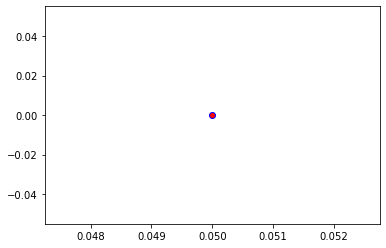

Crafting adversarial images took: 8.050577402114868 seconds 

Images classified as:
000000500257 624 = library
000000500270 702 = parallel bars
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


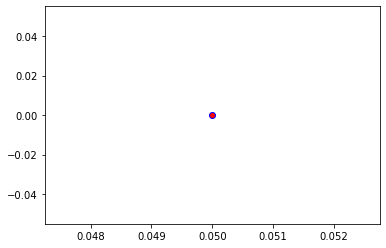

Crafting adversarial images took: 8.221569538116455 seconds 

Images classified as:
000000500423 705 = passenger car
000000500464 896 = washbasin
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


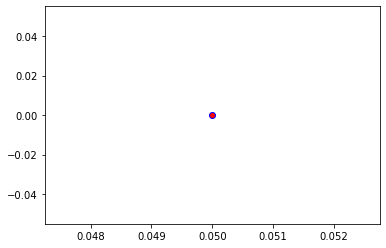

Crafting adversarial images took: 8.23973298072815 seconds 

Images classified as:
000000500477 961 = dough
000000500478 981 = ballplayer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


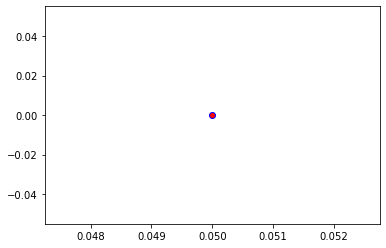

Crafting adversarial images took: 8.264524221420288 seconds 

Images classified as:
000000500565 434 = bath towel
000000500613 555 = fire engine
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


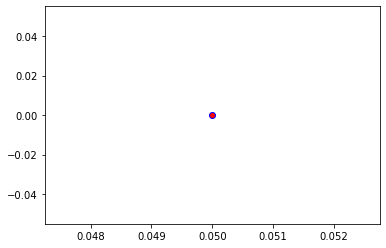

Crafting adversarial images took: 8.11064887046814 seconds 

Images classified as:
000000500663 140 = alp
000000500716 568 = fur coat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


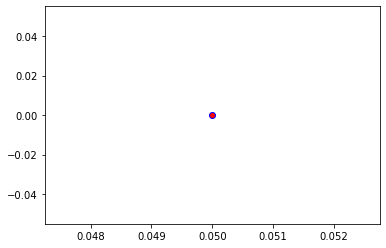

Crafting adversarial images took: 8.156293630599976 seconds 

Images classified as:
000000500826 919 = street sign
000000501005 981 = ballplayer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


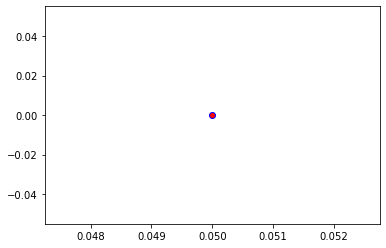

Crafting adversarial images took: 8.804094791412354 seconds 

Images classified as:
000000501023 919 = street sign
000000501243 340 = zebra
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


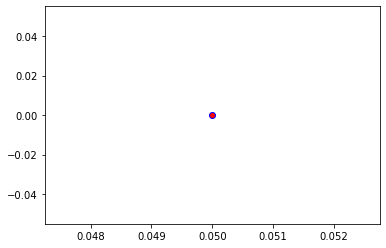

Crafting adversarial images took: 8.146119356155396 seconds 

Images classified as:
000000501368 589 = hand blower
000000501523 896 = washbasin
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


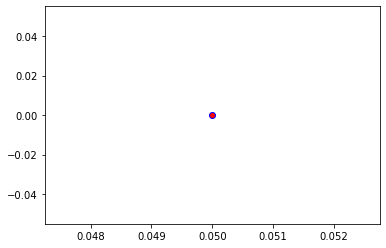

Crafting adversarial images took: 8.277631998062134 seconds 

Images classified as:
000000502136 743 = prison
000000502168 403 = aircraft carrier
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


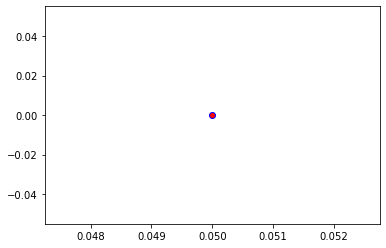

Crafting adversarial images took: 8.292861461639404 seconds 

Images classified as:
000000502229 611 = jigsaw puzzle
000000502336 498 = cinema
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


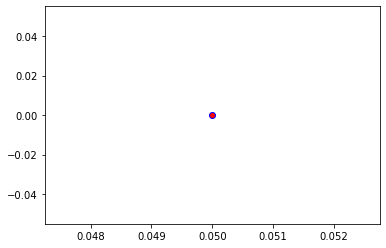

Crafting adversarial images took: 8.081327199935913 seconds 

Images classified as:
000000502347 405 = airship
000000502599 918 = crossword puzzle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


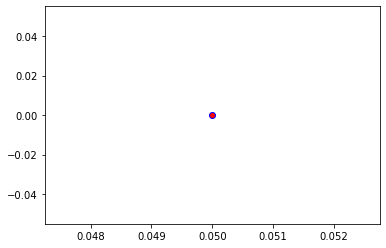

Crafting adversarial images took: 7.973210334777832 seconds 

Images classified as:
000000502732 760 = refrigerator
000000502737 928 = ice cream
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


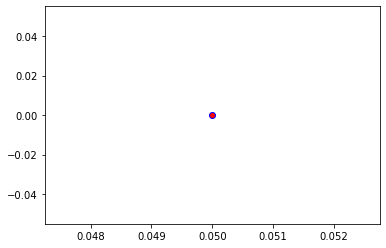

Crafting adversarial images took: 7.996141672134399 seconds 

Images classified as:
000000502910 919 = street sign
000000503755 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


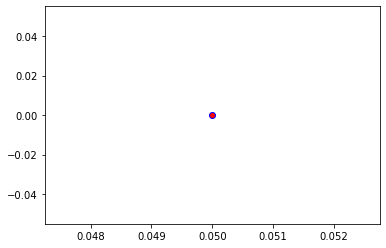

Crafting adversarial images took: 8.174592971801758 seconds 

Images classified as:
000000503823 864 = wreck
000000503841 920 = traffic light
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


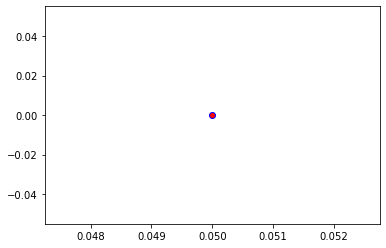

Crafting adversarial images took: 8.078239917755127 seconds 

Images classified as:
000000503855 879 = umbrella
000000504000 318 = wing
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


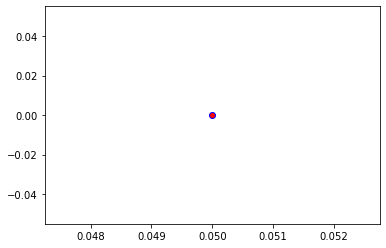

Crafting adversarial images took: 7.928488731384277 seconds 

Images classified as:
000000504074 620 = laptop
000000504389 843 = swing
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


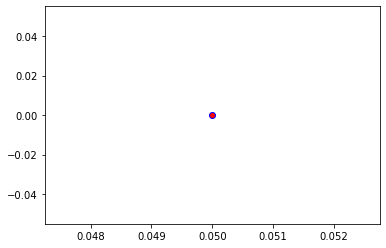

Crafting adversarial images took: 8.11470365524292 seconds 

Images classified as:
000000504415 752 = racket
000000504439 340 = zebra
Min values in image-array: 0.02631569 Max values in image-array: 255.0
Min values in image-array: 0.00010319878 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


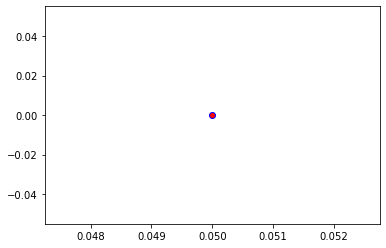

Crafting adversarial images took: 8.110101699829102 seconds 

Images classified as:
000000504580 272 = coyote
000000504589 890 = volleyball
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


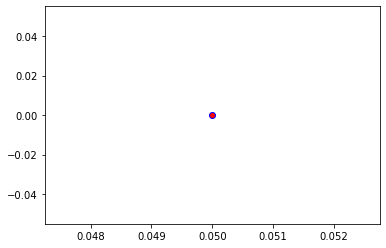

Crafting adversarial images took: 8.247781991958618 seconds 

Images classified as:
000000504635 340 = zebra
000000504711 960 = chocolate sauce
Min values in image-array: 0.0 Max values in image-array: 254.83833
Min values in image-array: 0.0 Max values in image-array: 0.999366
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


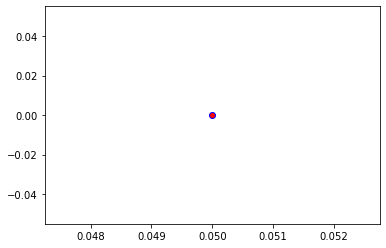

Crafting adversarial images took: 8.090533971786499 seconds 

Images classified as:
000000505169 794 = shower curtain
000000505451 296 = ice bear
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


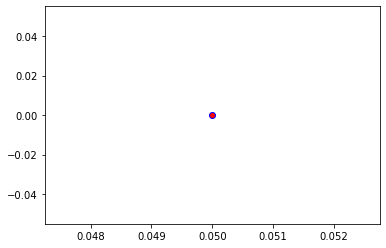

Crafting adversarial images took: 8.950266361236572 seconds 

Images classified as:
000000505565 127 = white stork
000000505573 245 = French bulldog
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


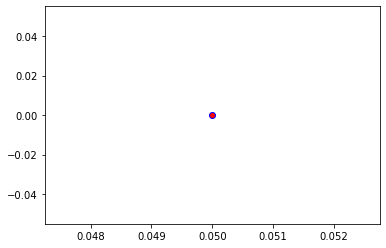

Crafting adversarial images took: 8.143755912780762 seconds 

Images classified as:
000000505638 820 = steam locomotive
000000505789 668 = mosque
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


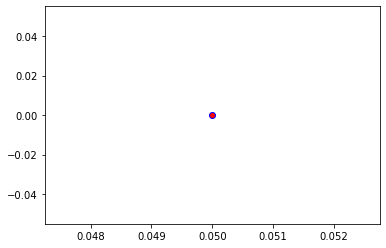

Crafting adversarial images took: 8.15501880645752 seconds 

Images classified as:
000000505942 704 = parking meter
000000506004 871 = trimaran
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


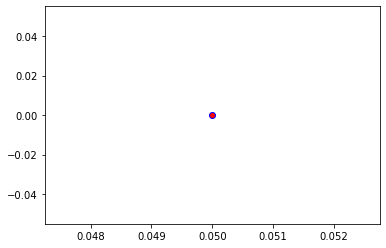

Crafting adversarial images took: 8.159615755081177 seconds 

Images classified as:
000000506178 650 = microphone
000000506279 441 = beer glass
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


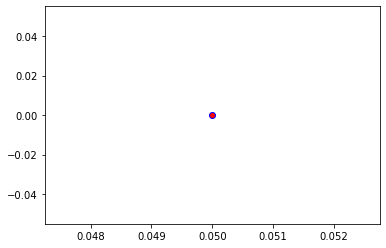

Crafting adversarial images took: 8.124261140823364 seconds 

Images classified as:
000000506310 771 = safe
000000506454 703 = park bench
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


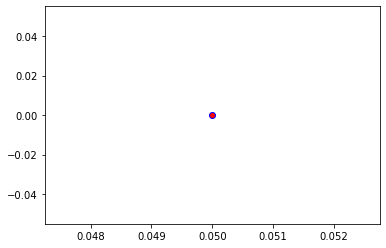

Crafting adversarial images took: 8.151369333267212 seconds 

Images classified as:
000000506656 603 = horse cart
000000506707 981 = ballplayer
Min values in image-array: 0.5510674 Max values in image-array: 255.0
Min values in image-array: 0.0021610486 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


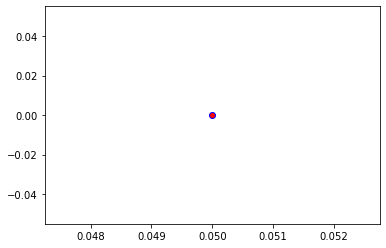

Crafting adversarial images took: 7.9562602043151855 seconds 

Images classified as:
000000506933 761 = remote control
000000507015 981 = ballplayer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


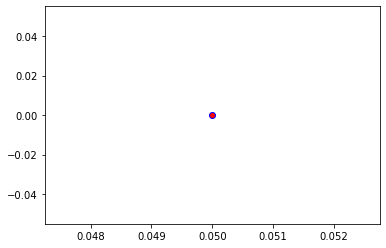

Crafting adversarial images took: 7.9752891063690186 seconds 

Images classified as:
000000507037 444 = bicycle-built-for-two
000000507042 51 = triceratops
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


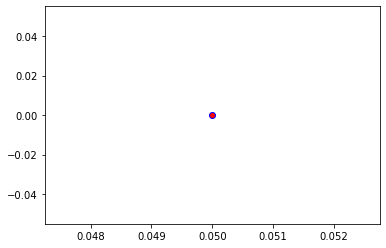

Crafting adversarial images took: 7.950529098510742 seconds 

Images classified as:
000000507081 799 = sliding door
000000507223 981 = ballplayer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


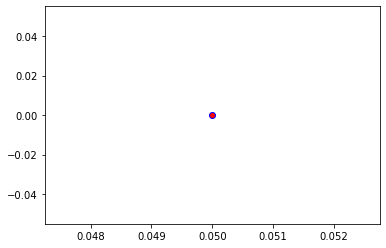

Crafting adversarial images took: 8.086992740631104 seconds 

Images classified as:
000000507235 926 = hot pot
000000507473 731 = plunger
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


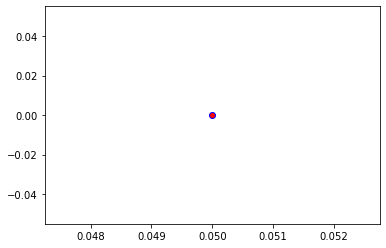

Crafting adversarial images took: 7.971783876419067 seconds 

Images classified as:
000000507575 526 = desk
000000507667 843 = swing
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


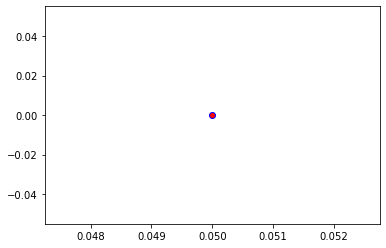

Crafting adversarial images took: 8.056159734725952 seconds 

Images classified as:
000000507797 654 = minibus
000000507893 648 = medicine chest
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


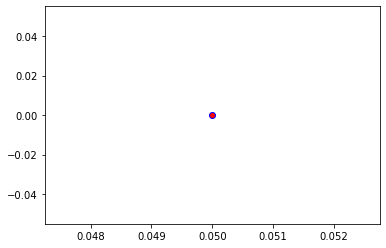

Crafting adversarial images took: 8.163458824157715 seconds 

Images classified as:
000000507975 339 = sorrel
000000508101 693 = paddle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


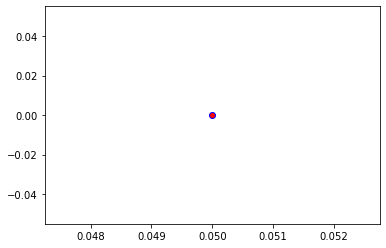

Crafting adversarial images took: 8.13668441772461 seconds 

Images classified as:
000000508312 651 = microwave
000000508370 444 = bicycle-built-for-two
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


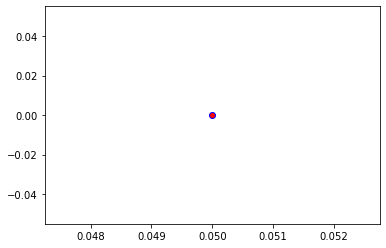

Crafting adversarial images took: 8.795381784439087 seconds 

Images classified as:
000000508482 480 = cash machine
000000508586 340 = zebra
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


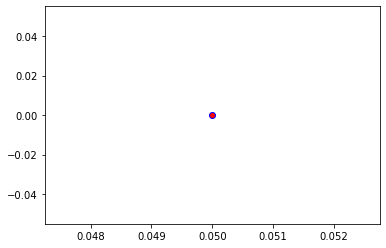

Crafting adversarial images took: 8.238209962844849 seconds 

Images classified as:
000000508602 132 = American egret
000000508639 603 = horse cart
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


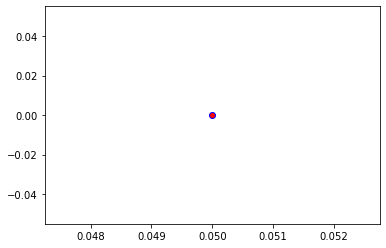

Crafting adversarial images took: 8.273772478103638 seconds 

Images classified as:
000000508730 435 = tub
000000508917 705 = passenger car
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


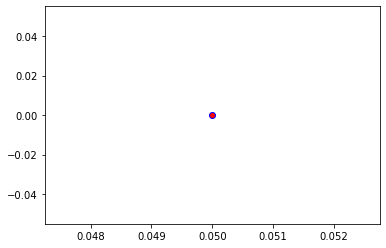

Crafting adversarial images took: 8.375839471817017 seconds 

Images classified as:
000000509008 779 = school bus
000000509014 248 = ski
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


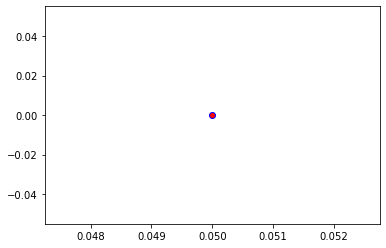

Crafting adversarial images took: 8.264199256896973 seconds 

Images classified as:
000000509131 950 = orange
000000509258 498 = cinema
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


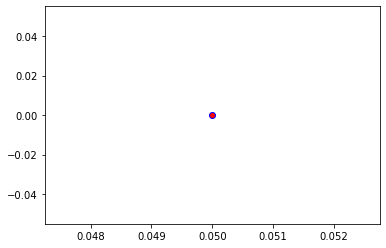

Crafting adversarial images took: 8.055776596069336 seconds 

Images classified as:
000000509260 453 = bookcase
000000509403 225 = malinois
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


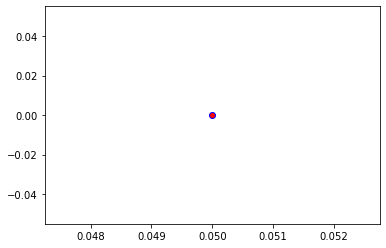

Crafting adversarial images took: 8.066957235336304 seconds 

Images classified as:
000000509451 363 = armadillo
000000509656 340 = zebra
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


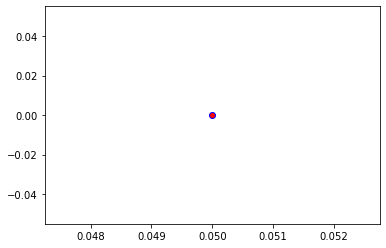

Crafting adversarial images took: 8.344201803207397 seconds 

Images classified as:
000000509699 589 = hand blower
000000509719 82 = ruffed grouse
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


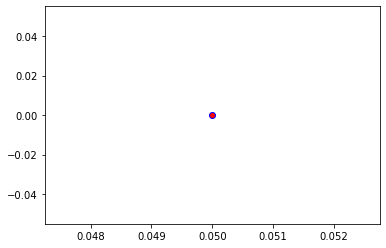

Crafting adversarial images took: 7.905407905578613 seconds 

Images classified as:
000000509735 340 = zebra
000000509824 831 = studio couch
Min values in image-array: 0.0 Max values in image-array: 254.60724
Min values in image-array: 0.0 Max values in image-array: 0.99845976
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


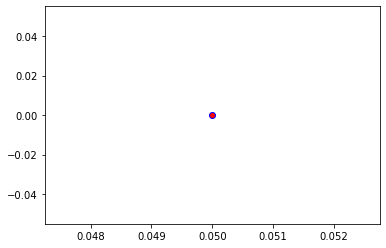

Crafting adversarial images took: 8.00521469116211 seconds 

Images classified as:
000000510095 984 = rapeseed
000000510329 471 = cannon
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


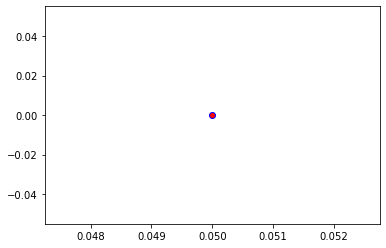

Crafting adversarial images took: 7.910353899002075 seconds 

Images classified as:
000000511076 421 = bannister
000000511321 404 = liner
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


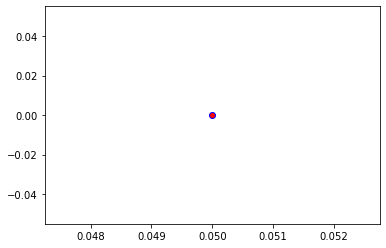

Crafting adversarial images took: 7.980978727340698 seconds 

Images classified as:
000000511384 417 = balloon
000000511398 162 = beagle
Min values in image-array: 0.0 Max values in image-array: 252.32863
Min values in image-array: 0.0 Max values in image-array: 0.989524
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


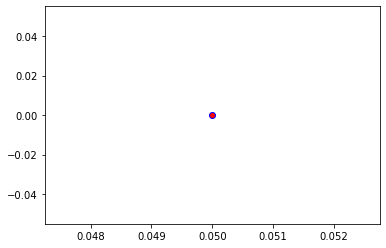

Crafting adversarial images took: 8.137337446212769 seconds 

Images classified as:
000000511453 933 = cheeseburger
000000511599 977 = sandbar
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


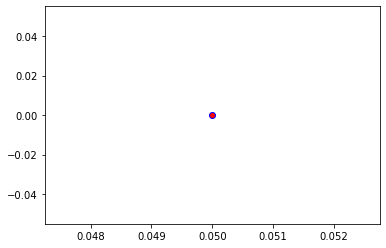

Crafting adversarial images took: 8.300076961517334 seconds 

Images classified as:
000000511647 838 = sunscreen
000000511760 701 = parachute
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


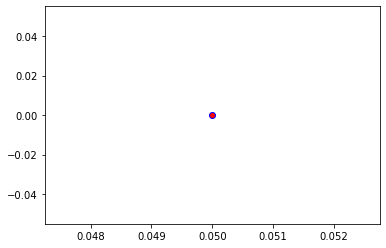

Crafting adversarial images took: 8.853944778442383 seconds 

Images classified as:
000000511999 705 = passenger car
000000512194 883 = vase
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


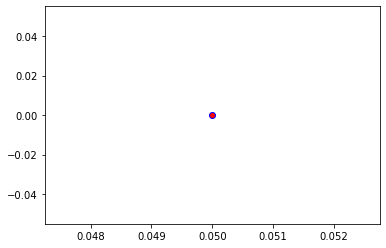

Crafting adversarial images took: 8.17287302017212 seconds 

Images classified as:
000000512248 409 = analog clock
000000512330 760 = refrigerator
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


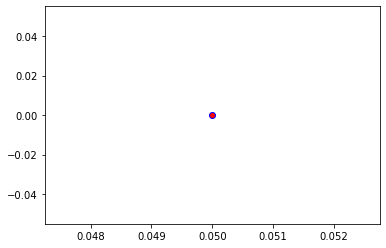

Crafting adversarial images took: 8.142590761184692 seconds 

Images classified as:
000000512403 883 = vase
000000512476 786 = sewing machine
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


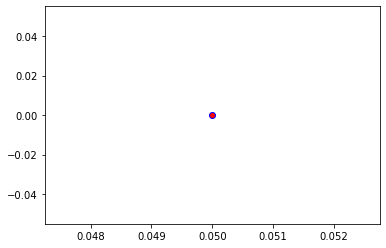

Crafting adversarial images took: 8.082181692123413 seconds 

Images classified as:
000000512564 829 = streetcar
000000512648 347 = bison
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


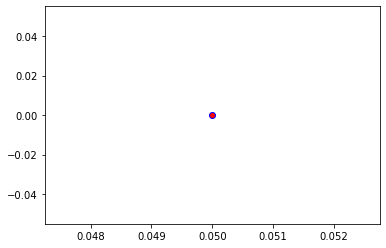

Crafting adversarial images took: 8.251465559005737 seconds 

Images classified as:
000000512657 808 = sombrero
000000512776 981 = ballplayer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


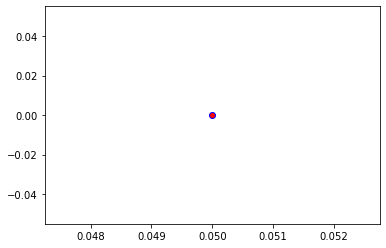

Crafting adversarial images took: 8.160171031951904 seconds 

Images classified as:
000000512836 229 = Old English sheepdog
000000512929 118 = Dungeness crab
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


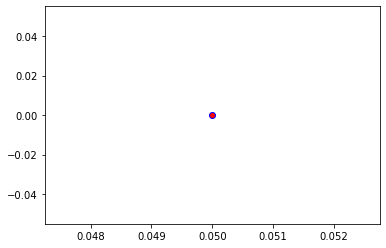

Crafting adversarial images took: 8.08764934539795 seconds 

Images classified as:
000000512985 978 = seashore
000000513041 963 = pizza
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


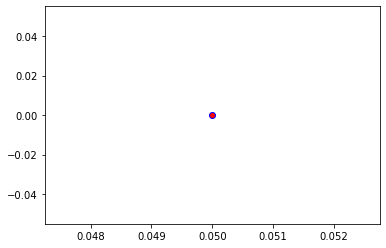

Crafting adversarial images took: 8.168161392211914 seconds 

Images classified as:
000000513181 404 = liner
000000513283 461 = plate
Min values in image-array: 0.0 Max values in image-array: 254.6965
Min values in image-array: 0.0 Max values in image-array: 0.9988098
Model accuracy on own images: 0.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


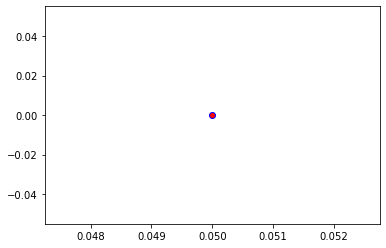

Crafting adversarial images took: 8.570968389511108 seconds 

Images classified as:
000000513484 294 = brown bear
000000513524 433 = bathing cap
Min values in image-array: 0.0 Max values in image-array: 254.9469
Min values in image-array: 0.0 Max values in image-array: 0.99979174
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


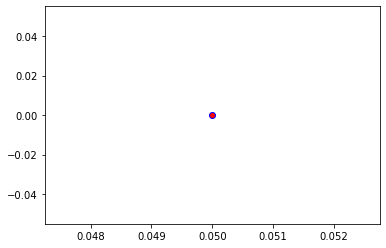

Crafting adversarial images took: 7.989391565322876 seconds 

Images classified as:
000000513567 934 = hotdog
000000513580 895 = warplane
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


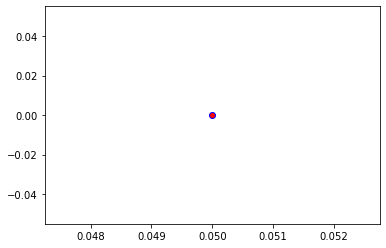

Crafting adversarial images took: 7.979137897491455 seconds 

Images classified as:
000000513688 532 = dining table
000000514376 829 = streetcar
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


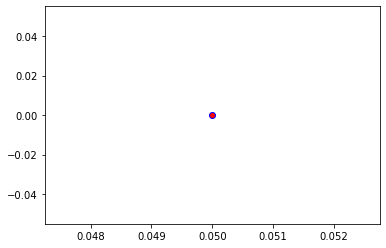

Crafting adversarial images took: 7.894651174545288 seconds 

Images classified as:
000000514508 654 = minibus
000000514540 557 = flagpole
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


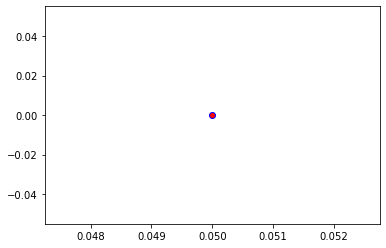

Crafting adversarial images took: 7.897077560424805 seconds 

Images classified as:
000000514586 981 = ballplayer
000000514797 862 = torch
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


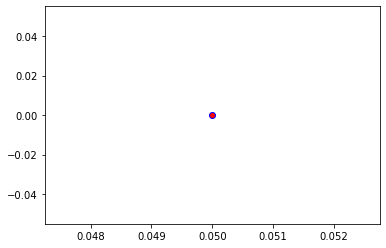

Crafting adversarial images took: 7.97038197517395 seconds 

Images classified as:
000000514914 648 = medicine chest
000000514979 101 = tusker
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


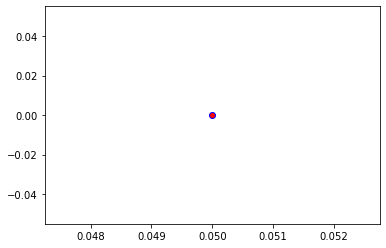

Crafting adversarial images took: 8.794900894165039 seconds 

Images classified as:
000000515025 231 = collie
000000515077 598 = home theater
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


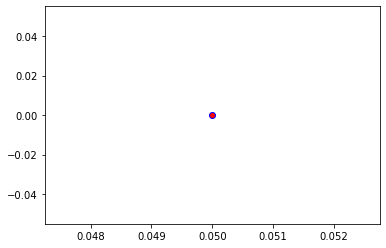

Crafting adversarial images took: 8.298853874206543 seconds 

Images classified as:
000000515266 609 = jeep
000000515350 864 = wreck
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


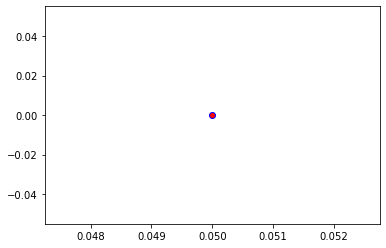

Crafting adversarial images took: 8.047722339630127 seconds 

Images classified as:
000000515445 978 = seashore
000000515577 140 = alp
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


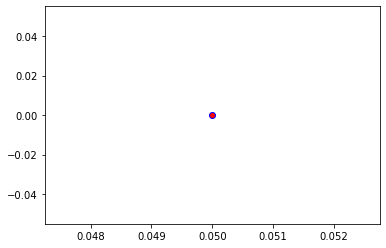

Crafting adversarial images took: 8.155573606491089 seconds 

Images classified as:
000000515579 752 = racket
000000515828 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


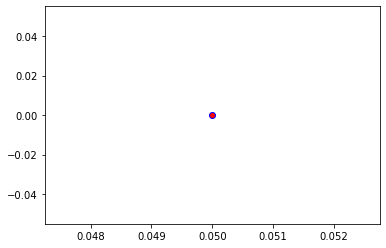

Crafting adversarial images took: 8.104891061782837 seconds 

Images classified as:
000000515982 981 = ballplayer
000000516038 981 = ballplayer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


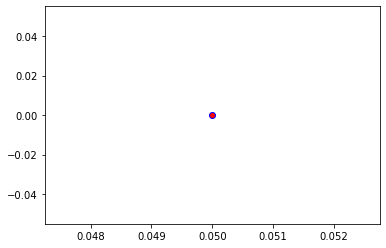

Crafting adversarial images took: 8.096169233322144 seconds 

Images classified as:
000000516143 829 = streetcar
000000516173 638 = maillot
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


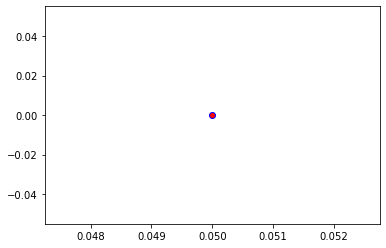

Crafting adversarial images took: 8.209033012390137 seconds 

Images classified as:
000000516316 340 = zebra
000000516318 209 = Chesapeake Bay retriever
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


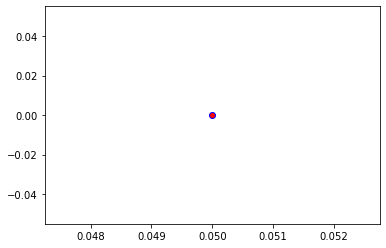

Crafting adversarial images took: 8.253234624862671 seconds 

Images classified as:
000000516601 140 = alp
000000516677 140 = alp
Min values in image-array: 0.0 Max values in image-array: 252.83215
Min values in image-array: 0.0 Max values in image-array: 0.99149865
Model accuracy on own images: 0.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


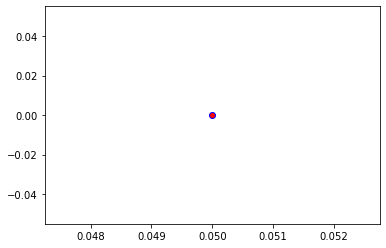

Crafting adversarial images took: 8.076053380966187 seconds 

Images classified as:
000000516708 919 = street sign
000000516804 919 = street sign
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


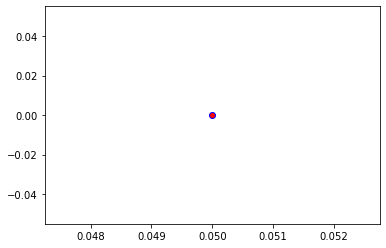

Crafting adversarial images took: 8.135430812835693 seconds 

Images classified as:
000000516871 868 = tray
000000516916 526 = desk
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


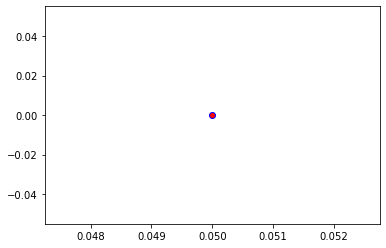

Crafting adversarial images took: 8.00976014137268 seconds 

Images classified as:
000000517056 618 = ladle
000000517069 523 = crutch
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


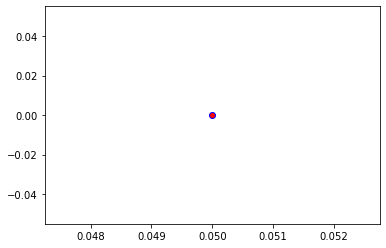

Crafting adversarial images took: 7.985660076141357 seconds 

Images classified as:
000000517523 404 = airliner
000000517687 761 = remote control
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


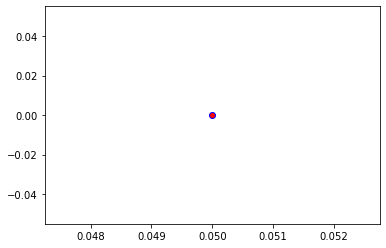

Crafting adversarial images took: 8.025389194488525 seconds 

Images classified as:
000000517832 179 = Staffordshire bullterrier
000000518213 347 = bison
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


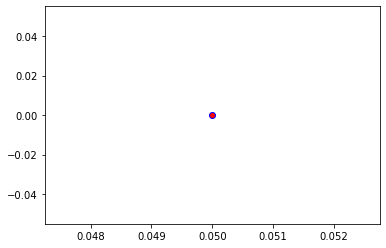

Crafting adversarial images took: 7.953840494155884 seconds 

Images classified as:
000000518326 116 = cradle
000000518770 543 = dumbbell
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


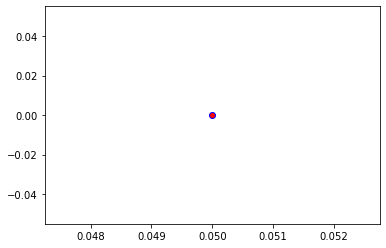

Crafting adversarial images took: 8.488098859786987 seconds 

Images classified as:
000000519039 675 = moving van
000000519208 385 = Indian elephant
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


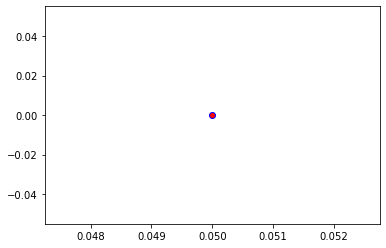

Crafting adversarial images took: 8.31352162361145 seconds 

Images classified as:
000000519338 565 = freight car
000000519491 442 = bell cote
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


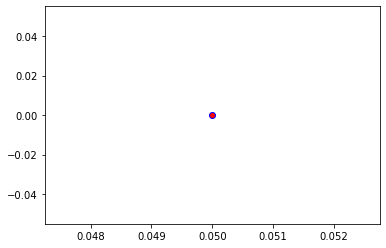

Crafting adversarial images took: 8.17267894744873 seconds 

Images classified as:
000000519522 498 = palace
000000519569 896 = washbasin
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


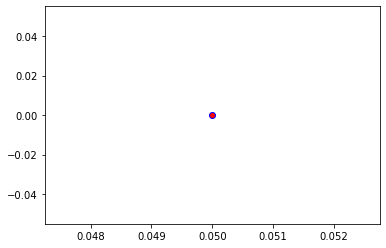

Crafting adversarial images took: 8.326796293258667 seconds 

Images classified as:
000000519611 296 = ice bear
000000519688 361 = skunk
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


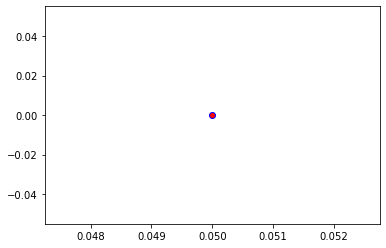

Crafting adversarial images took: 8.148986101150513 seconds 

Images classified as:
000000519764 281 = tabby
000000520009 498 = palace
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


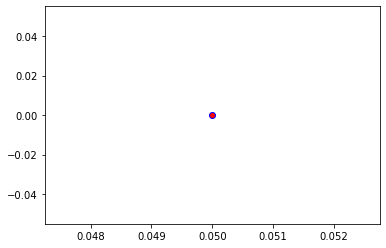

Crafting adversarial images took: 8.175572156906128 seconds 

Images classified as:
000000520077 453 = bookcase
000000520264 651 = microwave
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


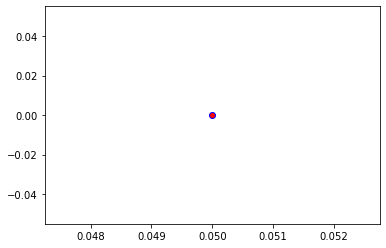

Crafting adversarial images took: 8.222007513046265 seconds 

Images classified as:
000000520301 227 = kelpie
000000520324 639 = tank
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


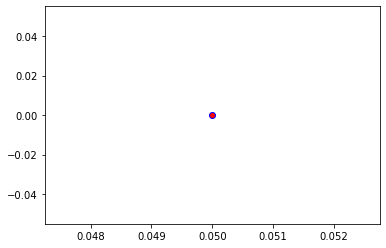

Crafting adversarial images took: 8.186502933502197 seconds 

Images classified as:
000000520531 283 = Persian cat
000000520659 476 = carousel
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


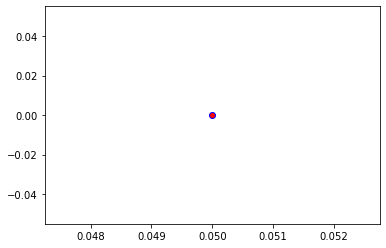

Crafting adversarial images took: 8.226564645767212 seconds 

Images classified as:
000000520707 624 = library
000000520832 612 = jinrikisha
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


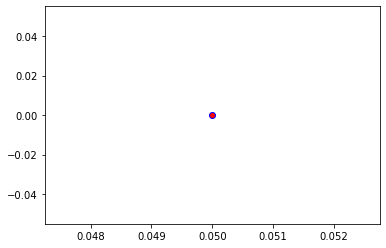

Crafting adversarial images took: 8.19781494140625 seconds 

Images classified as:
000000520871 963 = pizza
000000520910 894 = wardrobe
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


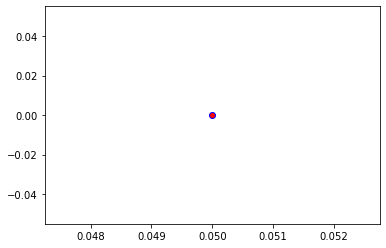

Crafting adversarial images took: 8.164801597595215 seconds 

Images classified as:
000000521052 675 = moving van
000000521141 919 = street sign
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


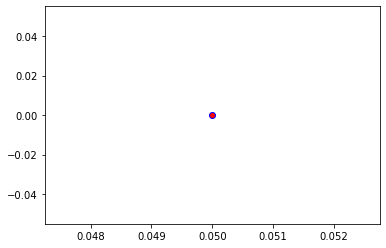

Crafting adversarial images took: 8.011724472045898 seconds 

Images classified as:
000000521231 296 = ice bear
000000521259 805 = soccer ball
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


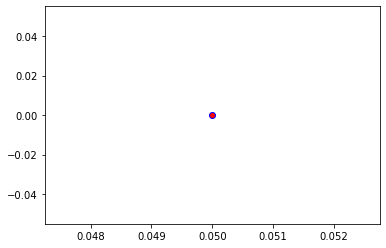

Crafting adversarial images took: 7.948983192443848 seconds 

Images classified as:
000000521282 725 = pitcher
000000521405 816 = spindle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


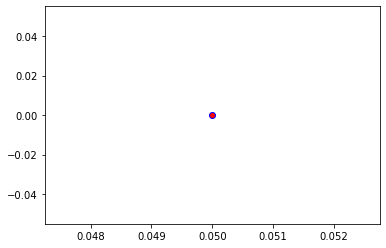

Crafting adversarial images took: 8.100752830505371 seconds 

Images classified as:
000000521509 762 = restaurant
000000521540 910 = wooden spoon
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


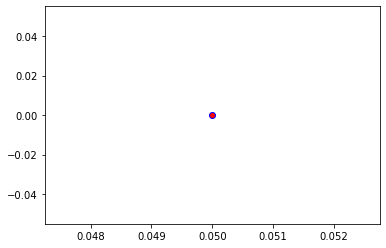

Crafting adversarial images took: 8.463997602462769 seconds 

Images classified as:
000000521601 659 = mixing bowl
000000521717 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


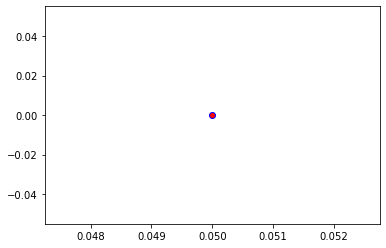

Crafting adversarial images took: 8.108195781707764 seconds 

Images classified as:
000000521719 723 = pinwheel
000000521819 645 = maypole
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


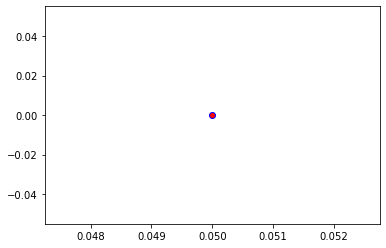

Crafting adversarial images took: 8.091071605682373 seconds 

Images classified as:
000000521956 752 = racket
000000522007 651 = microwave
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


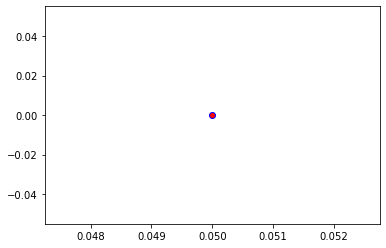

Crafting adversarial images took: 8.146275758743286 seconds 

Images classified as:
000000522156 461 = plate
000000522393 914 = yawl
Min values in image-array: 0.0 Max values in image-array: 254.85718
Min values in image-array: 0.0 Max values in image-array: 0.9994399
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


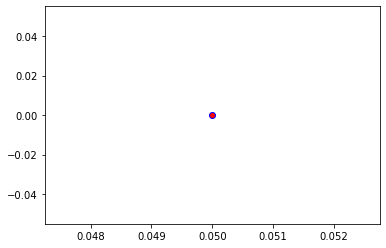

Crafting adversarial images took: 8.118979692459106 seconds 

Images classified as:
000000522638 850 = teddy
000000522713 67 = dam
Min values in image-array: 0.0 Max values in image-array: 254.45982
Min values in image-array: 0.0 Max values in image-array: 0.99788165
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


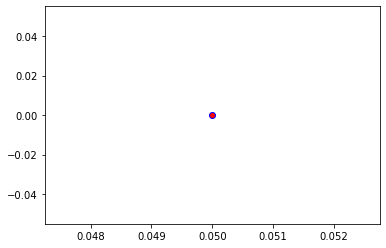

Crafting adversarial images took: 8.373059272766113 seconds 

Images classified as:
000000522751 920 = traffic light
000000522889 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


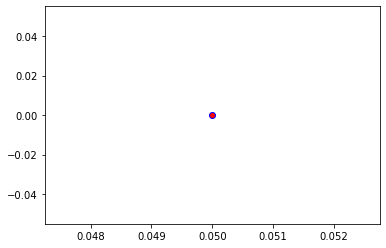

Crafting adversarial images took: 8.135002136230469 seconds 

Images classified as:
000000522940 919 = street sign
000000523033 460 = breakwater
Min values in image-array: 0.0 Max values in image-array: 254.61273
Min values in image-array: 0.0 Max values in image-array: 0.9984813
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


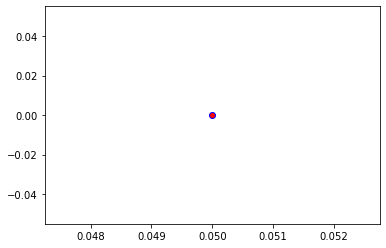

Crafting adversarial images took: 8.185713529586792 seconds 

Images classified as:
000000523100 926 = hot pot
000000523175 809 = soup bowl
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


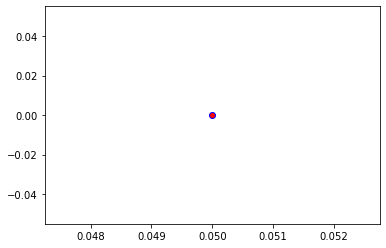

Crafting adversarial images took: 8.011065483093262 seconds 

Images classified as:
000000523194 879 = umbrella
000000523229 861 = toilet seat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


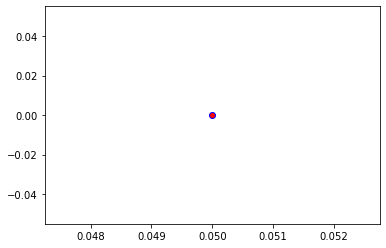

Crafting adversarial images took: 8.186368942260742 seconds 

Images classified as:
000000523241 358 = pole
000000523782 656 = minivan
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


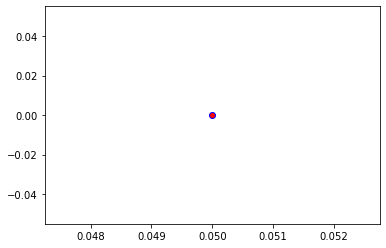

Crafting adversarial images took: 8.320889472961426 seconds 

Images classified as:
000000523807 934 = hotdog
000000523811 12 = house finch
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


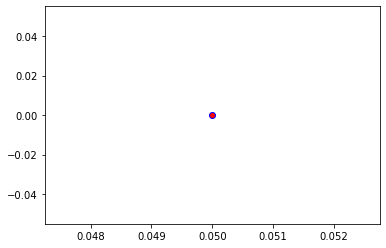

Crafting adversarial images took: 8.12307596206665 seconds 

Images classified as:
000000523957 500 = cliff
000000524108 665 = moped
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


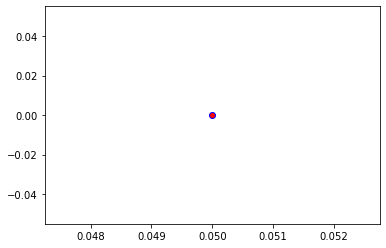

Crafting adversarial images took: 8.152618169784546 seconds 

Images classified as:
000000524280 282 = tiger cat
000000524456 673 = mouse
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


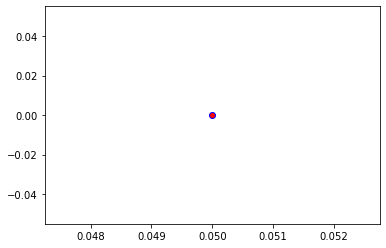

Crafting adversarial images took: 8.025035619735718 seconds 

Images classified as:
000000524742 709 = pencil box
000000524850 318 = wing
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


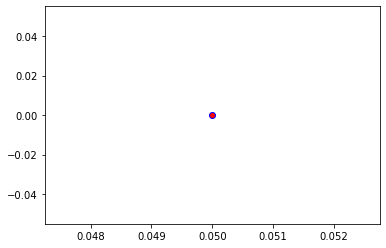

Crafting adversarial images took: 8.68837594985962 seconds 

Images classified as:
000000525083 651 = microwave
000000525155 354 = Arabian camel
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


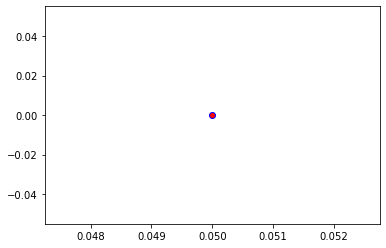

Crafting adversarial images took: 8.269881963729858 seconds 

Images classified as:
000000525247 508 = computer keyboard
000000525286 892 = wall clock
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


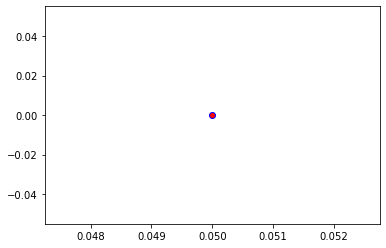

Crafting adversarial images took: 7.9293482303619385 seconds 

Images classified as:
000000525322 895 = warplane
000000525600 354 = Arabian camel
Min values in image-array: 0.0 Max values in image-array: 252.33484
Min values in image-array: 0.0 Max values in image-array: 0.9895484
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


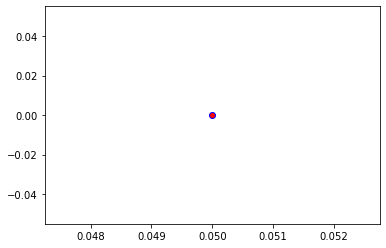

Crafting adversarial images took: 8.03145170211792 seconds 

Images classified as:
000000526103 385 = Indian elephant
000000526197 415 = bakery
Min values in image-array: 0.06375997 Max values in image-array: 255.0
Min values in image-array: 0.0002500391 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


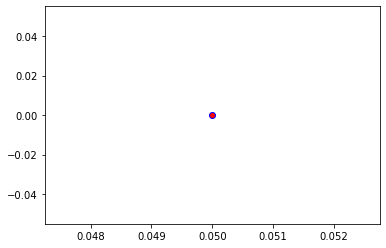

Crafting adversarial images took: 8.086100339889526 seconds 

Images classified as:
000000526256 442 = bell cote
000000526392 656 = minivan
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


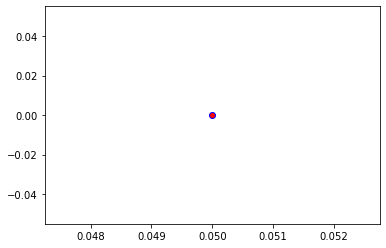

Crafting adversarial images took: 8.168495178222656 seconds 

Images classified as:
000000526706 347 = bison
000000526728 707 = pay-phone
Min values in image-array: 1.0256383 Max values in image-array: 255.0
Min values in image-array: 0.004022111 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


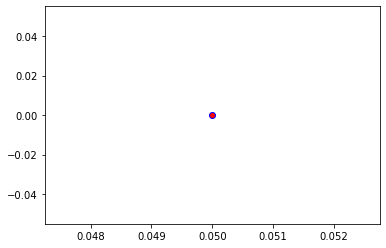

Crafting adversarial images took: 7.983899116516113 seconds 

Images classified as:
000000526751 484 = catamaran
000000527029 415 = bakery
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


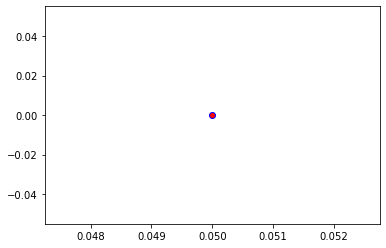

Crafting adversarial images took: 8.30655813217163 seconds 

Images classified as:
000000527215 977 = sandbar
000000527220 886 = vending machine
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


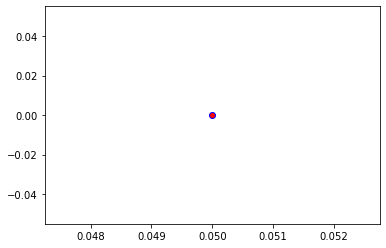

Crafting adversarial images took: 8.0568265914917 seconds 

Images classified as:
000000527427 606 = iron
000000527528 701 = parachute
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


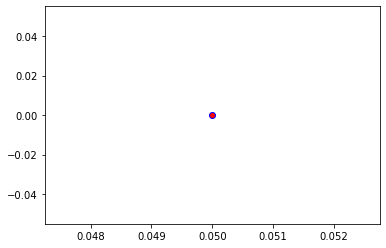

Crafting adversarial images took: 8.181816816329956 seconds 

Images classified as:
000000527616 999 = toilet tissue
000000527695 937 = broccoli
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


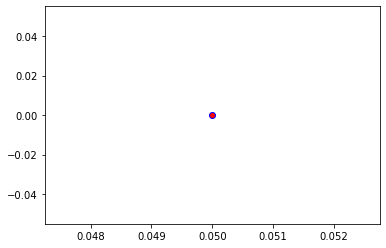

Crafting adversarial images took: 8.082454919815063 seconds 

Images classified as:
000000527750 534 = dishwasher
000000527784 934 = hotdog
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


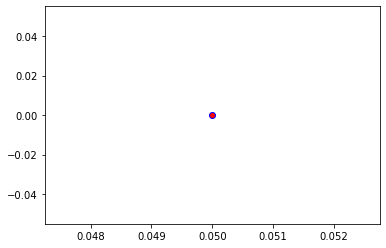

Crafting adversarial images took: 8.077871322631836 seconds 

Images classified as:
000000527960 703 = park bench
000000528314 248 = ski
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


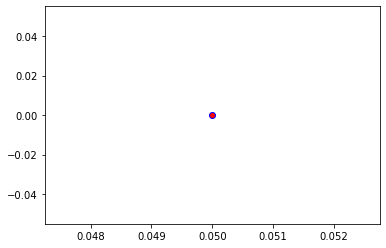

Crafting adversarial images took: 8.116140842437744 seconds 

Images classified as:
000000528399 809 = soup bowl
000000528524 209 = Chesapeake Bay retriever
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


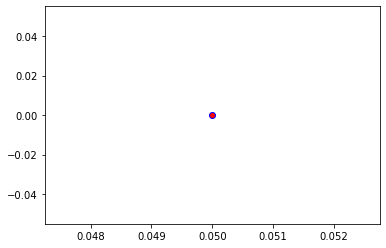

Crafting adversarial images took: 8.307365894317627 seconds 

Images classified as:
000000528578 498 = palace
000000528705 850 = teddy
Min values in image-array: 0.0 Max values in image-array: 254.9509
Min values in image-array: 0.0 Max values in image-array: 0.9998074
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


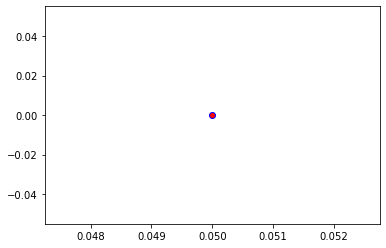

Crafting adversarial images took: 8.553885459899902 seconds 

Images classified as:
000000528862 176 = gazelle
000000528977 919 = street sign
Min values in image-array: 0.16519165 Max values in image-array: 255.0
Min values in image-array: 0.0006478104 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


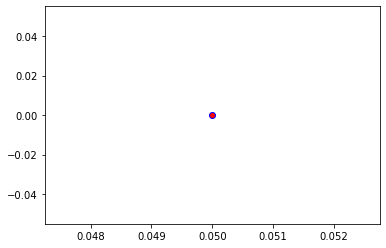

Crafting adversarial images took: 8.222766399383545 seconds 

Images classified as:
000000528980 919 = street sign
000000529105 346 = water buffalo
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


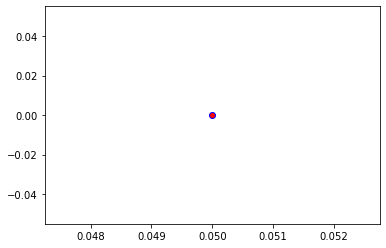

Crafting adversarial images took: 8.025015115737915 seconds 

Images classified as:
000000529122 415 = bakery
000000529148 620 = laptop
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


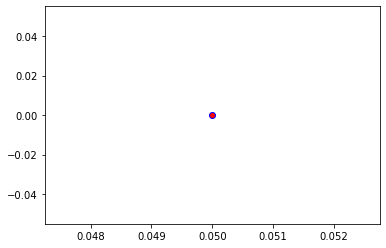

Crafting adversarial images took: 7.9513959884643555 seconds 

Images classified as:
000000529528 940 = spaghetti squash
000000529568 651 = microwave
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


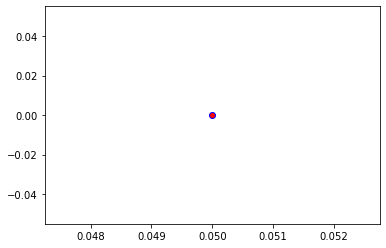

Crafting adversarial images took: 8.10358452796936 seconds 

Images classified as:
000000529762 461 = plate
000000529939 569 = garbage truck
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


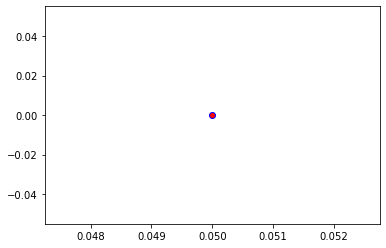

Crafting adversarial images took: 8.068999528884888 seconds 

Images classified as:
000000529966 950 = orange
000000530052 582 = grocery store
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


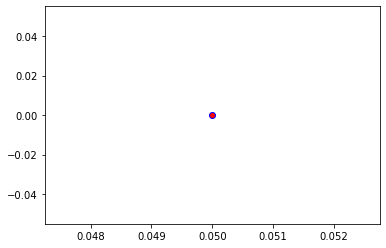

Crafting adversarial images took: 8.154769897460938 seconds 

Images classified as:
000000530061 659 = mixing bowl
000000530099 534 = dishwasher
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


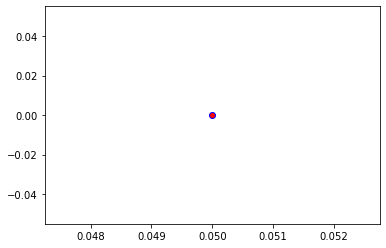

Crafting adversarial images took: 8.163418054580688 seconds 

Images classified as:
000000530146 935 = mashed potato
000000530162 568 = fur coat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


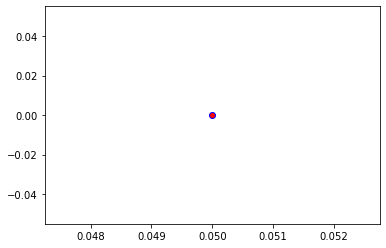

Crafting adversarial images took: 8.079907894134521 seconds 

Images classified as:
000000530457 28 = pot
000000530466 829 = streetcar
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


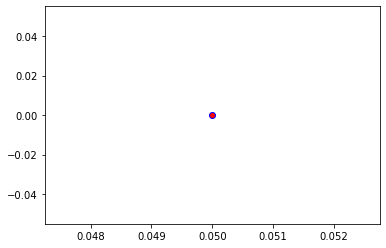

Crafting adversarial images took: 8.174008846282959 seconds 

Images classified as:
000000530470 417 = balloon
000000530624 750 = quilt
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


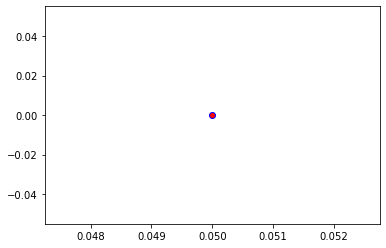

Crafting adversarial images took: 8.1981680393219 seconds 

Images classified as:
000000530820 752 = racket
000000530836 651 = microwave
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


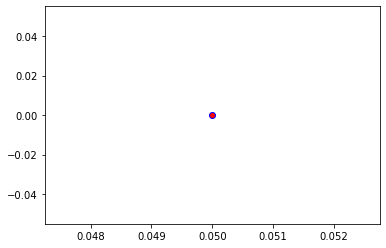

Crafting adversarial images took: 8.190072536468506 seconds 

Images classified as:
000000530854 879 = umbrella
000000530975 934 = hotdog
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


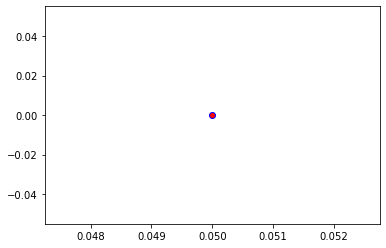

Crafting adversarial images took: 8.178517818450928 seconds 

Images classified as:
000000531036 874 = trolleybus
000000531134 920 = traffic light
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


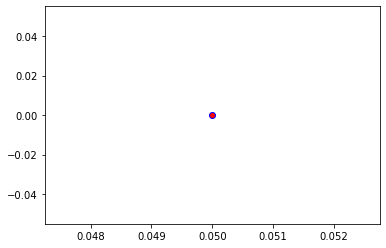

Crafting adversarial images took: 8.16068696975708 seconds 

Images classified as:
000000531135 981 = ballplayer
000000531495 536 = dock
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


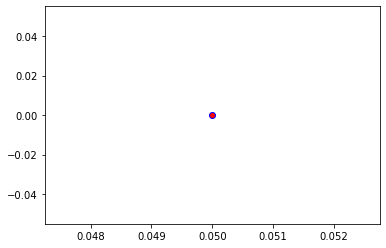

Crafting adversarial images took: 8.81652307510376 seconds 

Images classified as:
000000531707 703 = park bench
000000531771 827 = stove
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


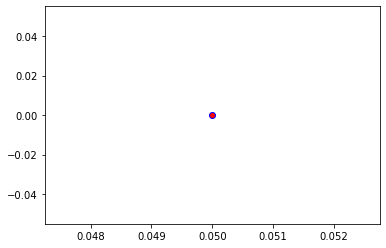

Crafting adversarial images took: 8.239460468292236 seconds 

Images classified as:
000000532058 529 = diaper
000000532071 295 = American black bear
Min values in image-array: 0.42855835 Max values in image-array: 255.0
Min values in image-array: 0.001680621 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


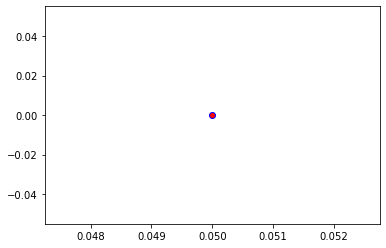

Crafting adversarial images took: 7.959539175033569 seconds 

Images classified as:
000000532129 963 = pizza
000000532481 701 = parachute
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


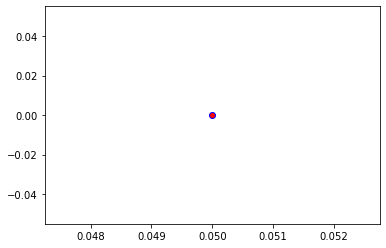

Crafting adversarial images took: 7.947378158569336 seconds 

Images classified as:
000000532493 144 = pelican
000000532530 454 = bookshop
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


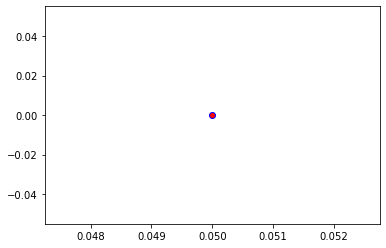

Crafting adversarial images took: 7.915277004241943 seconds 

Images classified as:
000000532575 225 = malinois
000000532690 731 = plunger
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


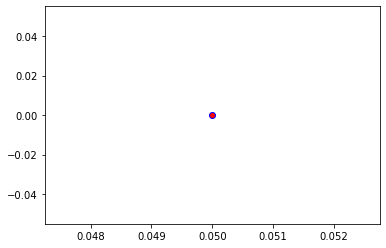

Crafting adversarial images took: 8.164087533950806 seconds 

Images classified as:
000000532761 831 = studio couch
000000532855 113 = nail
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


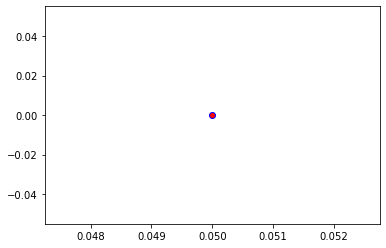

Crafting adversarial images took: 8.186766386032104 seconds 

Images classified as:
000000532901 564 = four-poster
000000533145 844 = switch
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


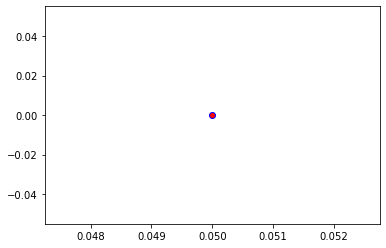

Crafting adversarial images took: 8.142096757888794 seconds 

Images classified as:
000000533206 118 = Dungeness crab
000000533493 890 = volleyball
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


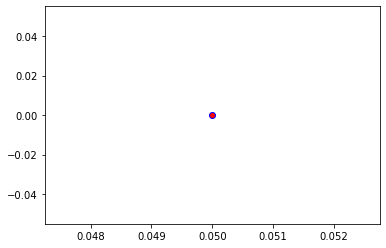

Crafting adversarial images took: 8.048296213150024 seconds 

Images classified as:
000000533536 851 = television
000000533816 890 = volleyball
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


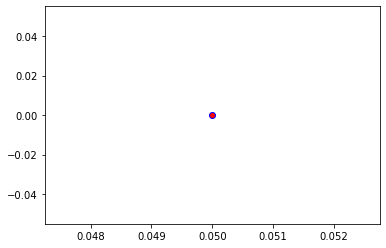

Crafting adversarial images took: 8.135706186294556 seconds 

Images classified as:
000000533855 589 = hand blower
000000533958 461 = plate
Min values in image-array: 0.011477256 Max values in image-array: 255.0
Min values in image-array: 4.500885e-05 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


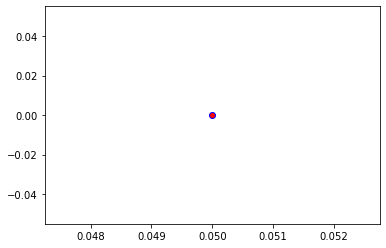

Crafting adversarial images took: 8.109590768814087 seconds 

Images classified as:
000000534041 680 = nipple
000000534270 460 = breakwater
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


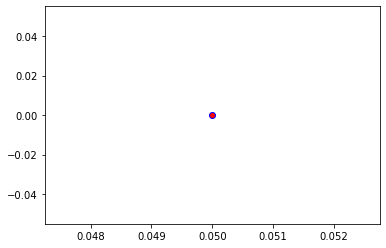

Crafting adversarial images took: 8.429982423782349 seconds 

Images classified as:
000000534394 475 = car mirror
000000534601 850 = teddy
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


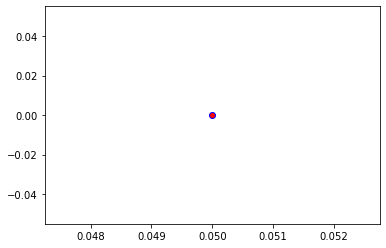

Crafting adversarial images took: 8.087839841842651 seconds 

Images classified as:
000000534605 665 = moped
000000534639 829 = streetcar
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


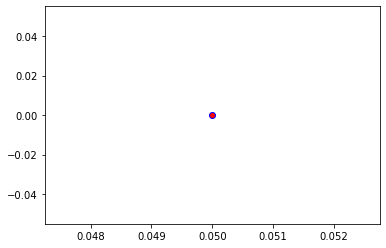

Crafting adversarial images took: 8.142731189727783 seconds 

Images classified as:
000000534664 760 = refrigerator
000000534673 705 = passenger car
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


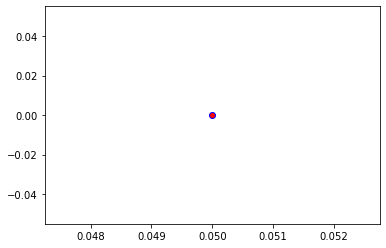

Crafting adversarial images took: 8.594964981079102 seconds 

Images classified as:
000000534827 665 = moped
000000535094 54 = hog
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


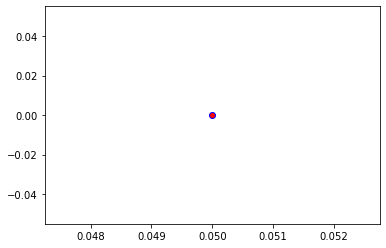

Crafting adversarial images took: 8.425839185714722 seconds 

Images classified as:
000000535156 385 = Indian elephant
000000535253 760 = refrigerator
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


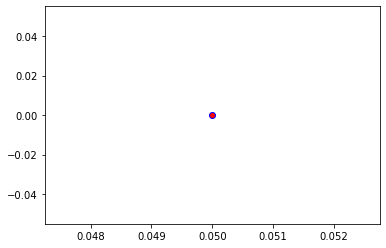

Crafting adversarial images took: 8.071500539779663 seconds 

Images classified as:
000000535306 408 = amphibian
000000535523 827 = stove
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


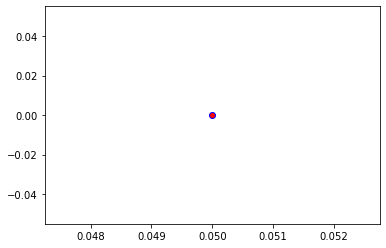

Crafting adversarial images took: 7.9541521072387695 seconds 

Images classified as:
000000535578 5 = ram
000000535608 977 = sandbar
Min values in image-array: 0.0 Max values in image-array: 254.98885
Min values in image-array: 0.0 Max values in image-array: 0.99995625
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


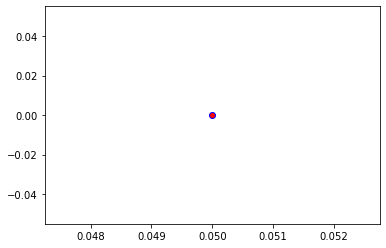

Crafting adversarial images took: 7.963244915008545 seconds 

Images classified as:
000000535858 842 = swimming trunks
000000536038 806 = sock
Min values in image-array: 0.0 Max values in image-array: 241.16634
Min values in image-array: 0.0 Max values in image-array: 0.94575036
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


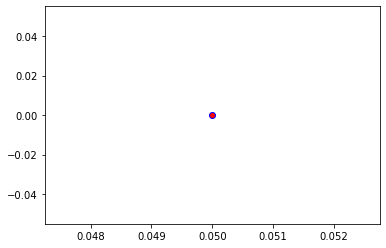

Crafting adversarial images took: 7.958079099655151 seconds 

Images classified as:
000000536073 505 = coffeepot
000000536343 713 = photocopier
Min values in image-array: 0.28572083 Max values in image-array: 255.0
Min values in image-array: 0.0011204738 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


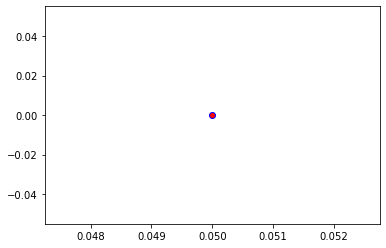

Crafting adversarial images took: 8.11585283279419 seconds 

Images classified as:
000000536947 583 = guillotine
000000537053 355 = llama
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


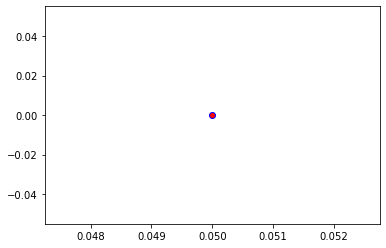

Crafting adversarial images took: 8.180184125900269 seconds 

Images classified as:
000000537153 976 = promontory
000000537241 962 = meat loaf
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


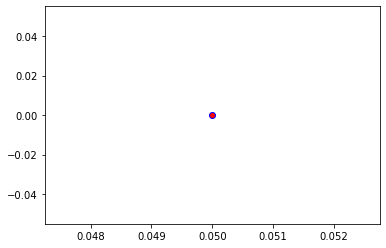

Crafting adversarial images took: 8.03919243812561 seconds 

Images classified as:
000000537270 784 = screwdriver
000000537355 660 = mobile home
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


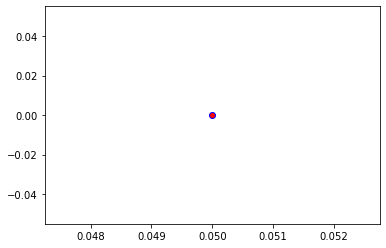

Crafting adversarial images took: 8.134600400924683 seconds 

Images classified as:
000000537506 957 = pomegranate
000000537672 480 = cash machine
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


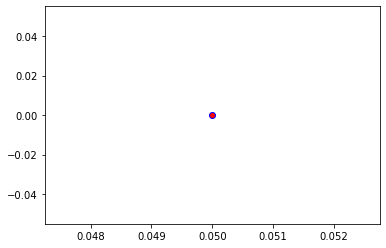

Crafting adversarial images took: 8.061112403869629 seconds 

Images classified as:
000000537802 850 = teddy
000000537812 861 = toilet seat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


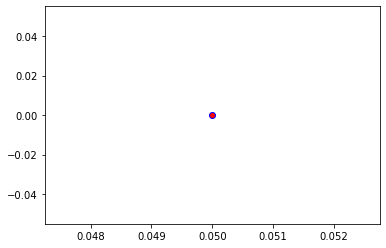

Crafting adversarial images took: 8.15775203704834 seconds 

Images classified as:
000000537827 981 = ballplayer
000000537964 637 = mailbox
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


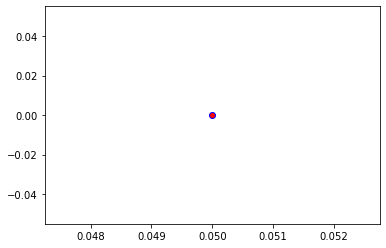

Crafting adversarial images took: 8.094103336334229 seconds 

Images classified as:
000000537991 650 = microphone
000000538067 140 = alp
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


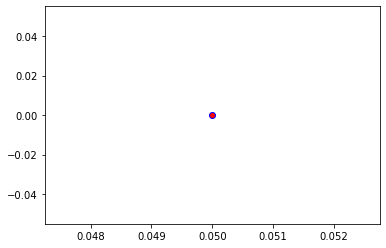

Crafting adversarial images took: 8.290006637573242 seconds 

Images classified as:
000000538236 415 = bakery
000000538364 670 = motor scooter
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


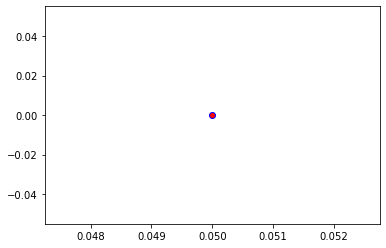

Crafting adversarial images took: 8.78500747680664 seconds 

Images classified as:
000000538458 880 = unicycle
000000539143 705 = passenger car
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


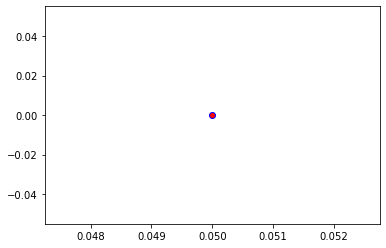

Crafting adversarial images took: 8.449942350387573 seconds 

Images classified as:
000000539445 547 = electric locomotive
000000539883 781 = scoreboard
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


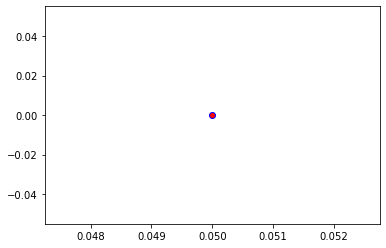

Crafting adversarial images took: 8.176820516586304 seconds 

Images classified as:
000000539962 706 = patio
000000540280 879 = umbrella
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


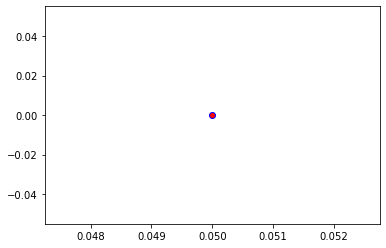

Crafting adversarial images took: 8.160454988479614 seconds 

Images classified as:
000000540414 582 = grocery store
000000540466 879 = umbrella
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


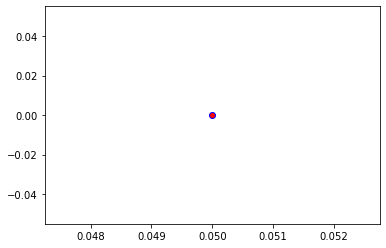

Crafting adversarial images took: 8.18313980102539 seconds 

Images classified as:
000000540502 896 = washbasin
000000540928 807 = solar dish
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


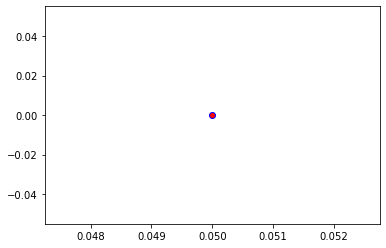

Crafting adversarial images took: 7.888192653656006 seconds 

Images classified as:
000000540932 977 = sandbar
000000540962 831 = studio couch
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


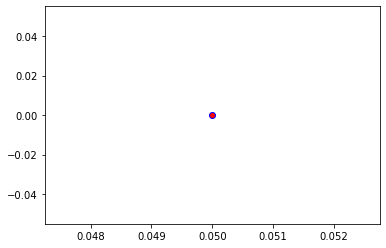

Crafting adversarial images took: 7.983797788619995 seconds 

Images classified as:
000000541055 248 = ski
000000541123 981 = ballplayer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


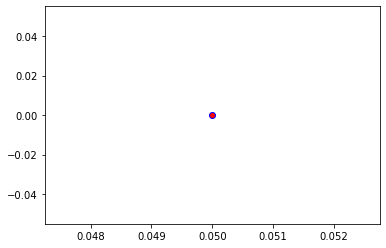

Crafting adversarial images took: 7.949054002761841 seconds 

Images classified as:
000000541291 896 = washbasin
000000541634 925 = consomme
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


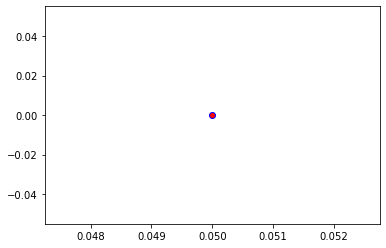

Crafting adversarial images took: 7.914761781692505 seconds 

Images classified as:
000000541664 508 = computer keyboard
000000541773 740 = power drill
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


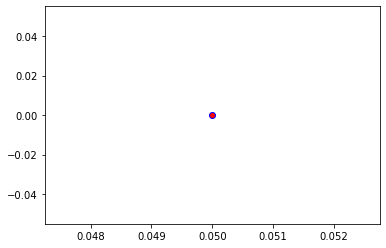

Crafting adversarial images took: 8.255722284317017 seconds 

Images classified as:
000000541952 442 = bell cote
000000542073 424 = barbershop
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


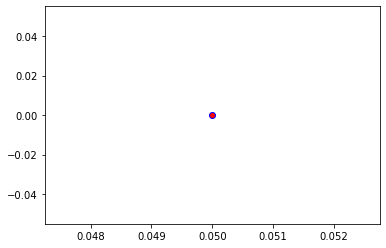

Crafting adversarial images took: 8.157361268997192 seconds 

Images classified as:
000000542089 896 = washbasin
000000542127 248 = ski
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


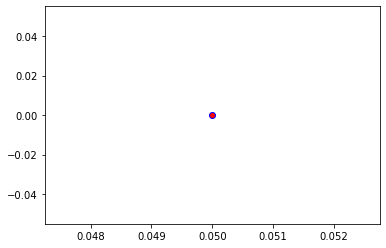

Crafting adversarial images took: 8.141237258911133 seconds 

Images classified as:
000000542423 703 = park bench
000000542625 569 = garbage truck
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


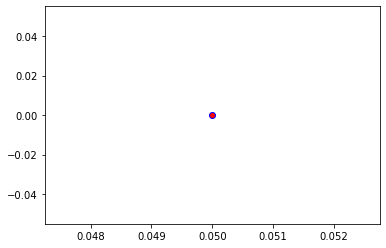

Crafting adversarial images took: 8.120237350463867 seconds 

Images classified as:
000000542776 13 = junco
000000542856 874 = trolleybus
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


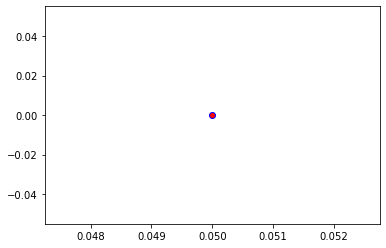

Crafting adversarial images took: 8.240118503570557 seconds 

Images classified as:
000000543043 705 = passenger car
000000543047 532 = dining table
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


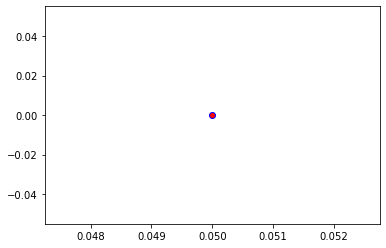

Crafting adversarial images took: 8.76850175857544 seconds 

Images classified as:
000000543300 404 = liner
000000543528 404 = airliner
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


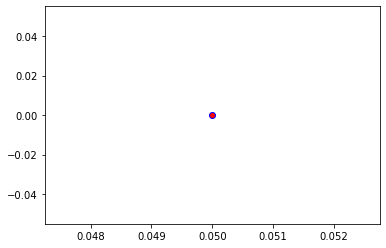

Crafting adversarial images took: 8.371741771697998 seconds 

Images classified as:
000000543581 831 = studio couch
000000544052 870 = tricycle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


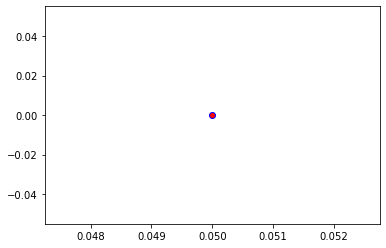

Crafting adversarial images took: 8.13588261604309 seconds 

Images classified as:
000000544306 442 = bell cote
000000544444 248 = ski
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


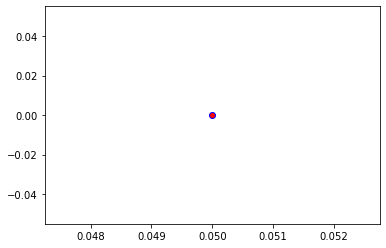

Crafting adversarial images took: 8.351216554641724 seconds 

Images classified as:
000000544519 929 = ice lolly
000000544565 934 = hotdog
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


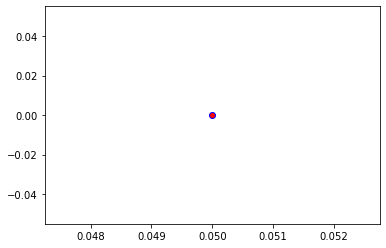

Crafting adversarial images took: 8.11425518989563 seconds 

Images classified as:
000000544605 919 = street sign
000000544811 144 = pelican
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


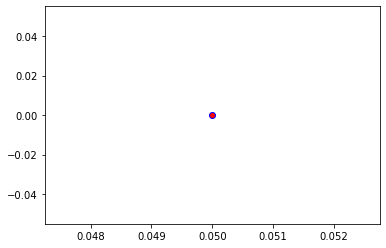

Crafting adversarial images took: 8.23771357536316 seconds 

Images classified as:
000000545007 442 = bell cote
000000545100 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


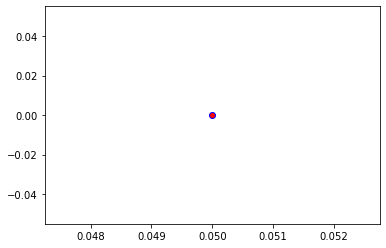

Crafting adversarial images took: 7.950882196426392 seconds 

Images classified as:
000000545129 340 = zebra
000000545219 829 = streetcar
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


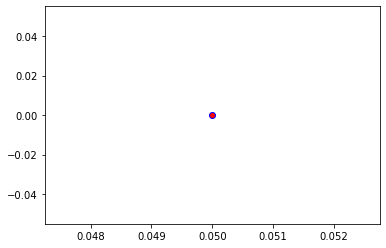

Crafting adversarial images took: 8.032691478729248 seconds 

Images classified as:
000000545407 404 = airliner
000000545594 830 = stretcher
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


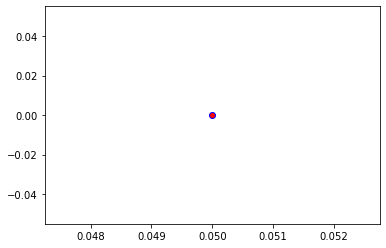

Crafting adversarial images took: 7.937284231185913 seconds 

Images classified as:
000000545730 372 = baboon
000000545826 861 = toilet seat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


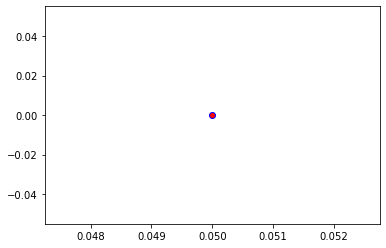

Crafting adversarial images took: 7.90457558631897 seconds 

Images classified as:
000000545958 273 = dingo
000000546011 340 = zebra
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


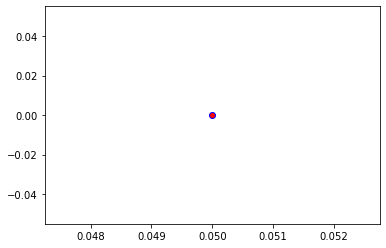

Crafting adversarial images took: 7.9637298583984375 seconds 

Images classified as:
000000546219 762 = restaurant
000000546325 831 = studio couch
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


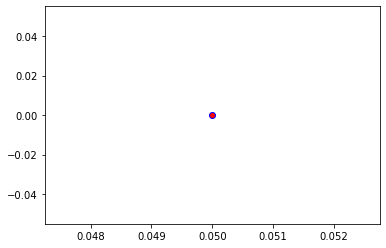

Crafting adversarial images took: 8.257049083709717 seconds 

Images classified as:
000000546475 593 = harmonica
000000546556 99 = goose
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


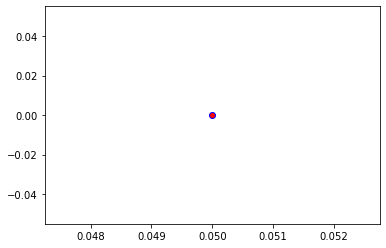

Crafting adversarial images took: 8.172728061676025 seconds 

Images classified as:
000000546626 647 = measuring cup
000000546659 547 = electric locomotive
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


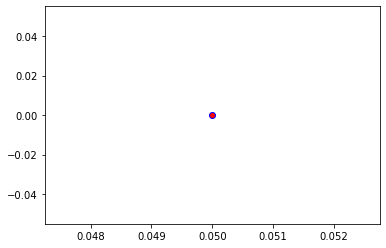

Crafting adversarial images took: 8.37434196472168 seconds 

Images classified as:
000000546717 620 = laptop
000000546823 498 = palace
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


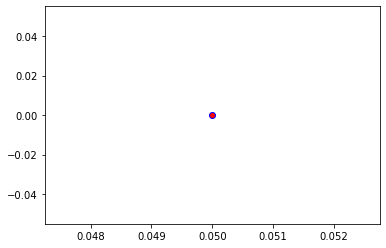

Crafting adversarial images took: 8.478126525878906 seconds 

Images classified as:
000000546826 473 = can opener
000000546829 258 = Samoyed
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


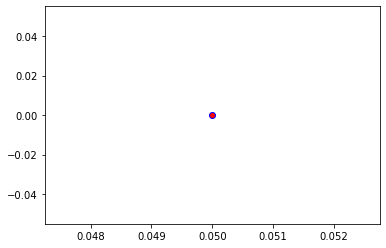

Crafting adversarial images took: 8.585957050323486 seconds 

Images classified as:
000000546964 831 = studio couch
000000546976 813 = spatula
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


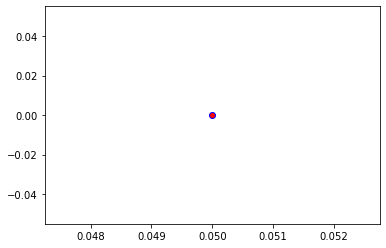

Crafting adversarial images took: 8.12240195274353 seconds 

Images classified as:
000000547144 526 = desk
000000547336 756 = rain barrel
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


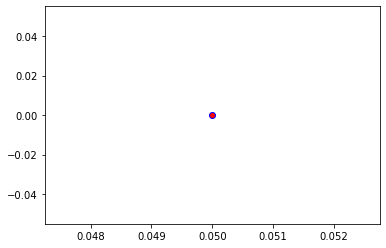

Crafting adversarial images took: 8.010770320892334 seconds 

Images classified as:
000000547383 5 = ram
000000547502 188 = wire-haired fox terrier
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


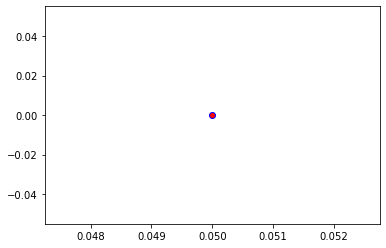

Crafting adversarial images took: 8.093847513198853 seconds 

Images classified as:
000000547519 294 = brown bear
000000547816 794 = shower curtain
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


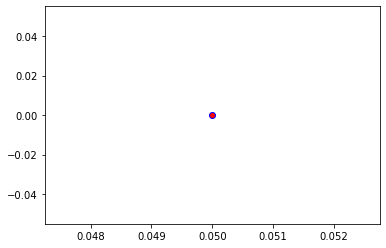

Crafting adversarial images took: 8.097639799118042 seconds 

Images classified as:
000000547854 963 = pizza
000000547886 354 = Arabian camel
Min values in image-array: 0.033481836 Max values in image-array: 255.0
Min values in image-array: 0.00013130132 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


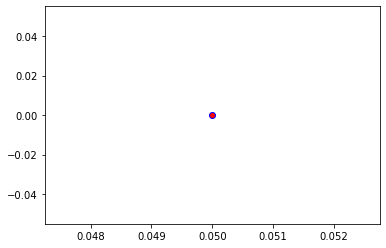

Crafting adversarial images took: 8.12831711769104 seconds 

Images classified as:
000000548246 752 = racket
000000548267 140 = alp
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


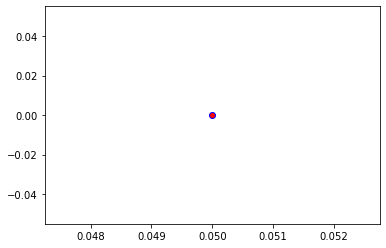

Crafting adversarial images took: 8.011081457138062 seconds 

Images classified as:
000000548339 429 = baseball
000000548506 954 = banana
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


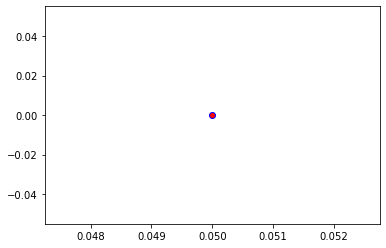

Crafting adversarial images took: 7.989446640014648 seconds 

Images classified as:
000000548524 977 = sandbar
000000548555 934 = hotdog
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


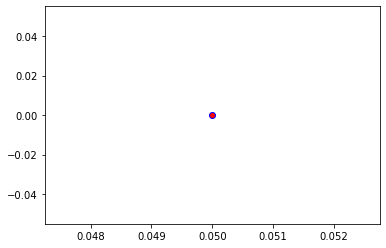

Crafting adversarial images took: 7.9742138385772705 seconds 

Images classified as:
000000548780 573 = go-kart
000000549055 460 = breakwater
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


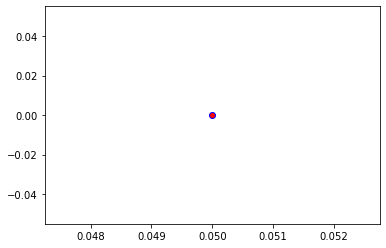

Crafting adversarial images took: 7.9232094287872314 seconds 

Images classified as:
000000549136 358 = pole
000000549167 461 = plate
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


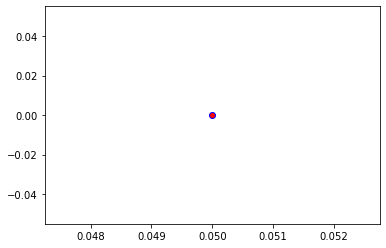

Crafting adversarial images took: 7.926225423812866 seconds 

Images classified as:
000000549220 273 = dingo
000000549390 444 = bicycle-built-for-two
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


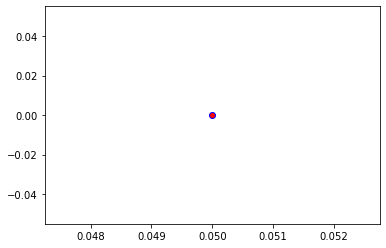

Crafting adversarial images took: 8.067741870880127 seconds 

Images classified as:
000000549674 527 = desktop computer
000000549738 557 = flagpole
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


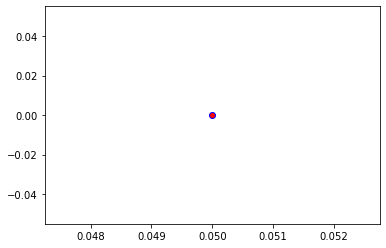

Crafting adversarial images took: 8.295908451080322 seconds 

Images classified as:
000000549930 879 = umbrella
000000550084 919 = street sign
Min values in image-array: 0.0 Max values in image-array: 254.13716
Min values in image-array: 0.0 Max values in image-array: 0.9966163
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


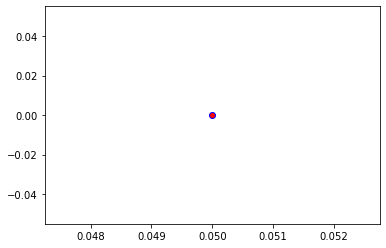

Crafting adversarial images took: 8.295093536376953 seconds 

Images classified as:
000000550322 618 = ladle
000000550349 874 = trolleybus
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


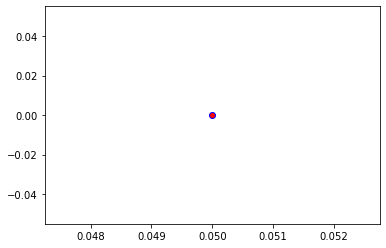

Crafting adversarial images took: 8.643940448760986 seconds 

Images classified as:
000000550426 883 = vase
000000550471 925 = consomme
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


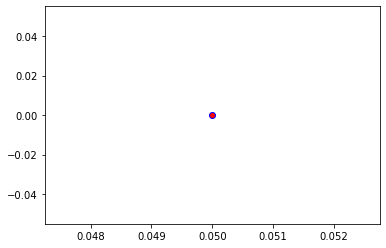

Crafting adversarial images took: 8.088509559631348 seconds 

Images classified as:
000000550691 874 = trolleybus
000000550714 954 = banana
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


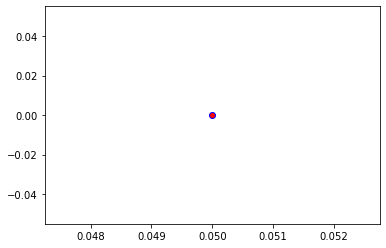

Crafting adversarial images took: 8.12453007698059 seconds 

Images classified as:
000000550797 861 = toilet seat
000000550939 919 = street sign
Min values in image-array: 0.0 Max values in image-array: 254.92413
Min values in image-array: 0.0 Max values in image-array: 0.9997025
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


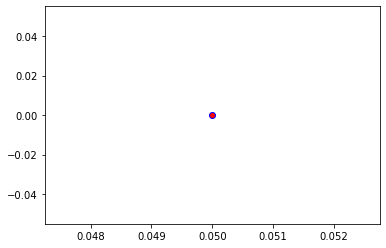

Crafting adversarial images took: 8.239532709121704 seconds 

Images classified as:
000000551215 752 = racket
000000551304 861 = toilet seat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


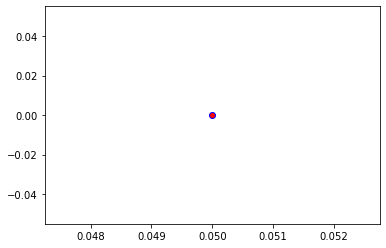

Crafting adversarial images took: 8.071157932281494 seconds 

Images classified as:
000000551350 703 = park bench
000000551439 678 = neck brace
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


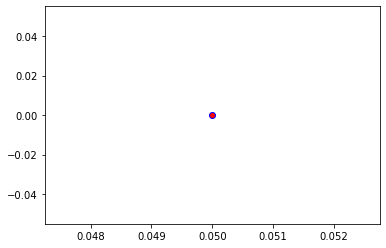

Crafting adversarial images took: 8.063053369522095 seconds 

Images classified as:
000000551660 937 = broccoli
000000551780 892 = wall clock
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


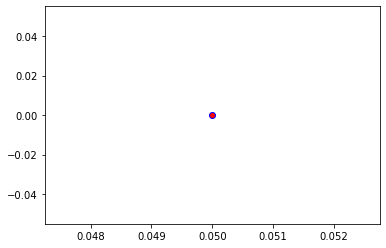

Crafting adversarial images took: 8.20168948173523 seconds 

Images classified as:
000000551794 500 = cliff
000000551804 752 = racket
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


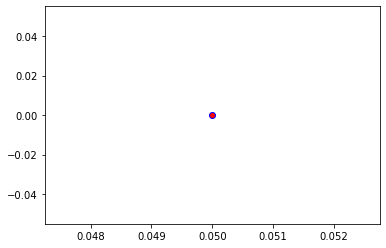

Crafting adversarial images took: 7.999891757965088 seconds 

Images classified as:
000000551815 282 = tiger cat
000000551820 890 = volleyball
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


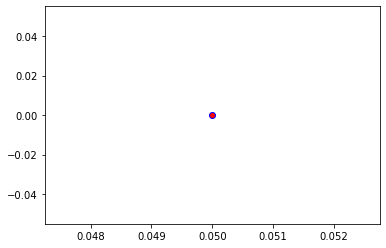

Crafting adversarial images took: 8.077332019805908 seconds 

Images classified as:
000000551822 461 = plate
000000552371 339 = sorrel
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


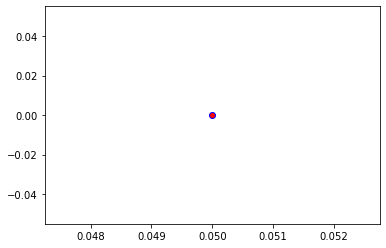

Crafting adversarial images took: 7.923584461212158 seconds 

Images classified as:
000000552612 347 = bison
000000552775 827 = stove
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


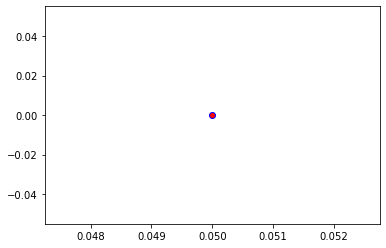

Crafting adversarial images took: 7.984676122665405 seconds 

Images classified as:
000000552842 981 = ballplayer
000000552883 648 = medicine chest
Min values in image-array: 0.95485157 Max values in image-array: 255.0
Min values in image-array: 0.003744516 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


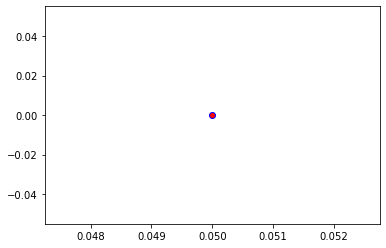

Crafting adversarial images took: 7.945156574249268 seconds 

Images classified as:
000000552902 340 = zebra
000000553094 895 = warplane
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


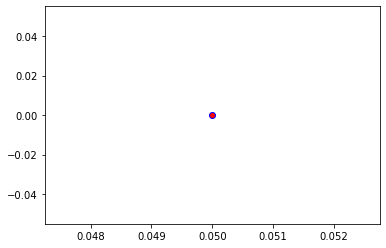

Crafting adversarial images took: 8.057457447052002 seconds 

Images classified as:
000000553221 701 = parachute
000000553339 919 = street sign
Min values in image-array: 0.0 Max values in image-array: 254.90181
Min values in image-array: 0.0 Max values in image-array: 0.99961495
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


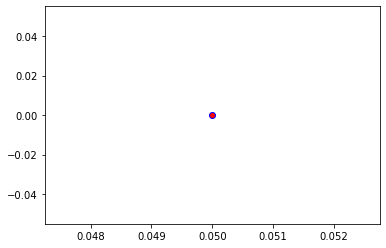

Crafting adversarial images took: 8.366783380508423 seconds 

Images classified as:
000000553511 919 = street sign
000000553664 526 = desk
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


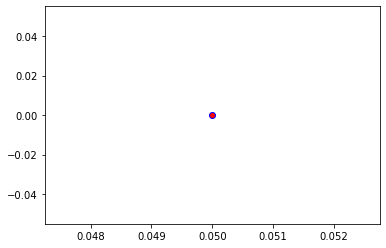

Crafting adversarial images took: 8.925339221954346 seconds 

Images classified as:
000000553669 703 = park bench
000000553731 583 = guillotine
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


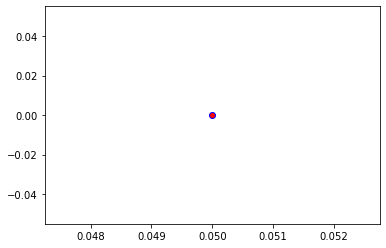

Crafting adversarial images took: 8.065155267715454 seconds 

Images classified as:
000000553776 802 = snowmobile
000000553788 620 = laptop
Min values in image-array: 0.0 Max values in image-array: 254.8884
Min values in image-array: 0.0 Max values in image-array: 0.9995623
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


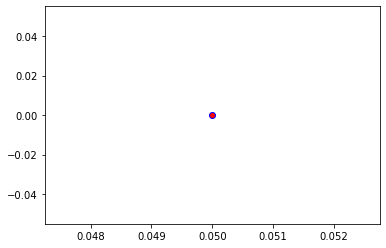

Crafting adversarial images took: 8.148139715194702 seconds 

Images classified as:
000000553990 339 = sorrel
000000554002 233 = Bouvier des Flandres
Min values in image-array: 1.353119 Max values in image-array: 255.0
Min values in image-array: 0.005306349 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


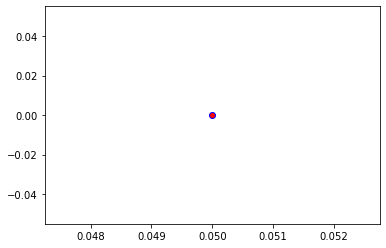

Crafting adversarial images took: 8.281283140182495 seconds 

Images classified as:
000000554156 752 = racket
000000554266 887 = vestment
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


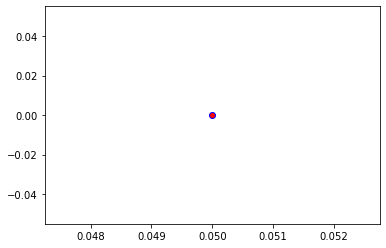

Crafting adversarial images took: 8.15137505531311 seconds 

Images classified as:
000000554291 674 = mousetrap
000000554328 981 = ballplayer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


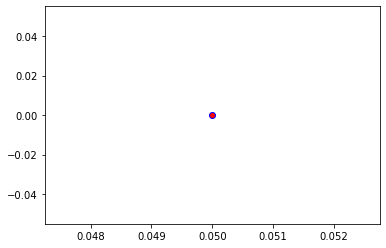

Crafting adversarial images took: 8.216924905776978 seconds 

Images classified as:
000000554579 260 = chow
000000554595 693 = paddle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


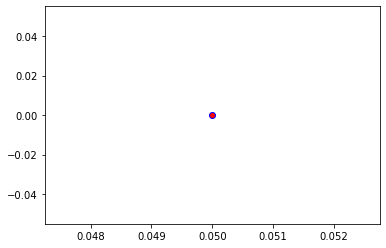

Crafting adversarial images took: 8.165635585784912 seconds 

Images classified as:
000000554735 963 = pizza
000000554838 760 = refrigerator
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


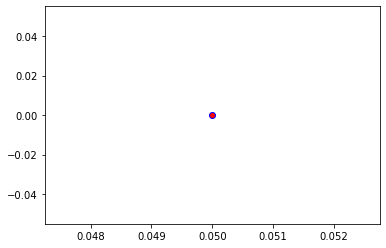

Crafting adversarial images took: 8.125497579574585 seconds 

Images classified as:
000000555005 116 = cradle
000000555009 527 = desktop computer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


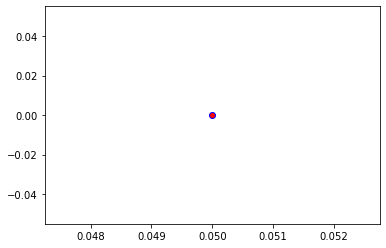

Crafting adversarial images took: 8.161611557006836 seconds 

Images classified as:
000000555012 435 = bathtub
000000555050 454 = bookshop
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


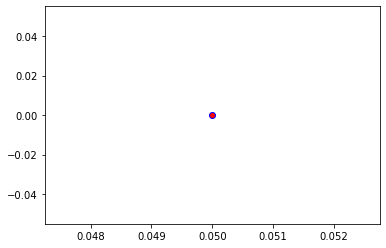

Crafting adversarial images took: 8.045307874679565 seconds 

Images classified as:
000000555412 934 = hotdog
000000555597 324 = cab
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


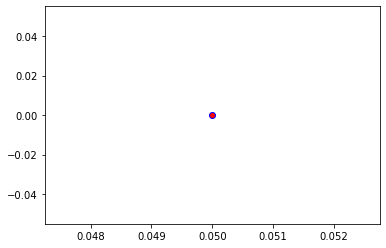

Crafting adversarial images took: 7.92568039894104 seconds 

Images classified as:
000000555705 287 = lynx
000000555972 883 = vase
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


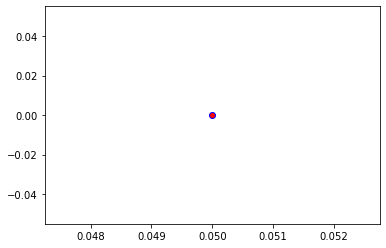

Crafting adversarial images took: 7.950152158737183 seconds 

Images classified as:
000000556000 523 = crutch
000000556158 248 = ski
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


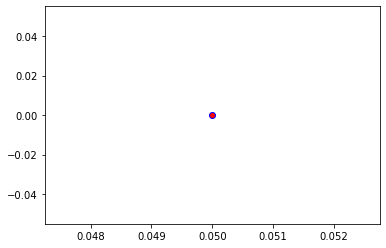

Crafting adversarial images took: 7.903061628341675 seconds 

Images classified as:
000000556193 639 = suit
000000556498 919 = street sign
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


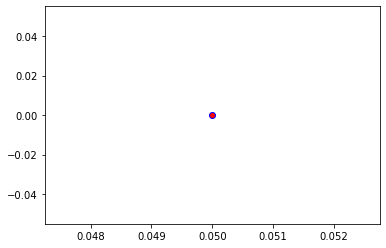

Crafting adversarial images took: 8.217384815216064 seconds 

Images classified as:
000000556765 385 = Indian elephant
000000556873 470 = candle
Min values in image-array: 0.003348112 Max values in image-array: 255.0
Min values in image-array: 1.3129851e-05 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


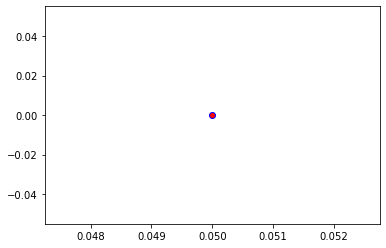

Crafting adversarial images took: 8.871509075164795 seconds 

Images classified as:
000000557172 896 = washbasin
000000557258 861 = toilet seat
Min values in image-array: 0.35705566 Max values in image-array: 255.0
Min values in image-array: 0.0014002183 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


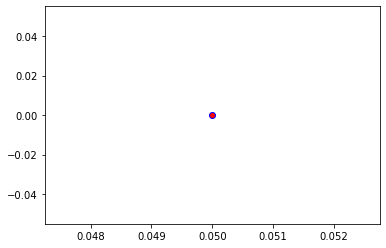

Crafting adversarial images took: 8.056106805801392 seconds 

Images classified as:
000000557501 713 = photocopier
000000557672 879 = umbrella
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


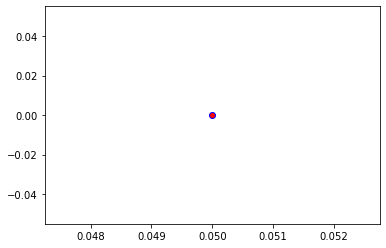

Crafting adversarial images took: 8.216622114181519 seconds 

Images classified as:
000000557884 313 = walking stick
000000557916 793 = shower cap
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


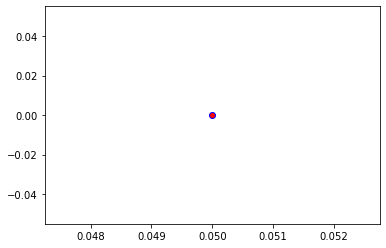

Crafting adversarial images took: 8.126417875289917 seconds 

Images classified as:
000000558073 435 = tub
000000558114 430 = basketball
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


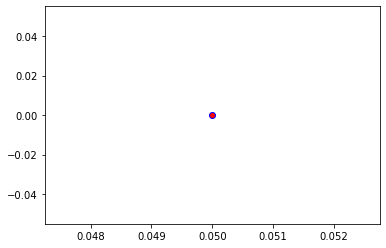

Crafting adversarial images took: 8.128296613693237 seconds 

Images classified as:
000000558213 880 = unicycle
000000558421 547 = electric locomotive
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


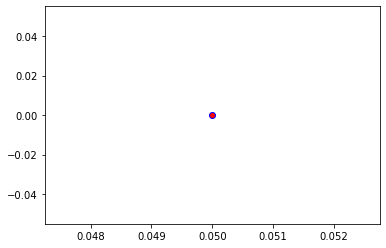

Crafting adversarial images took: 8.11161756515503 seconds 

Images classified as:
000000558558 818 = spotlight
000000558854 965 = burrito
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


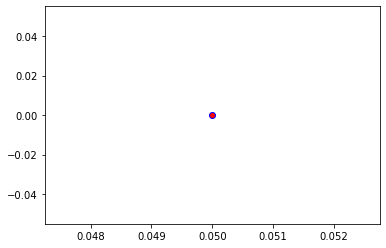

Crafting adversarial images took: 8.235933780670166 seconds 

Images classified as:
000000559099 346 = water buffalo
000000559160 416 = balance beam
Min values in image-array: 0.0 Max values in image-array: 254.94257
Min values in image-array: 0.0 Max values in image-array: 0.99977475
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


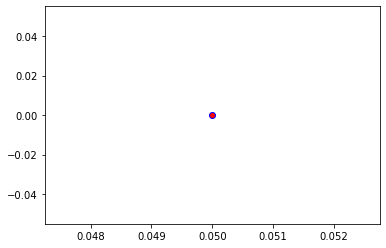

Crafting adversarial images took: 8.107378244400024 seconds 

Images classified as:
000000559348 981 = ballplayer
000000559513 962 = meat loaf
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


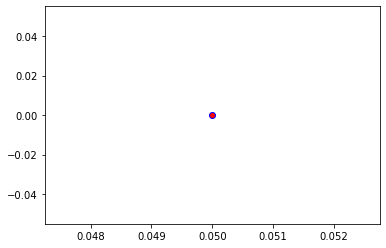

Crafting adversarial images took: 8.118413925170898 seconds 

Images classified as:
000000559543 731 = plunger
000000559547 715 = pickelhaube
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


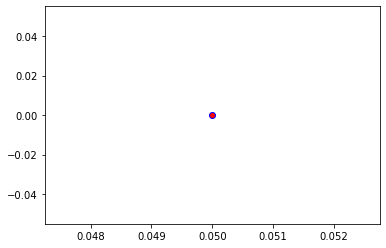

Crafting adversarial images took: 8.094640493392944 seconds 

Images classified as:
000000559707 937 = broccoli
000000559842 768 = rugby ball
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


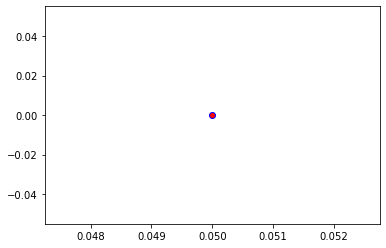

Crafting adversarial images took: 8.041094303131104 seconds 

Images classified as:
000000559956 355 = llama
000000560011 508 = computer keyboard
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


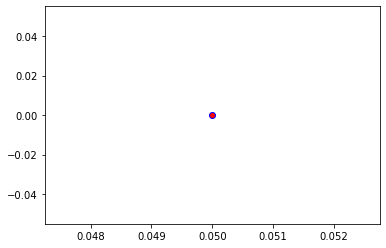

Crafting adversarial images took: 8.218477249145508 seconds 

Images classified as:
000000560178 952 = fig
000000560256 954 = banana
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


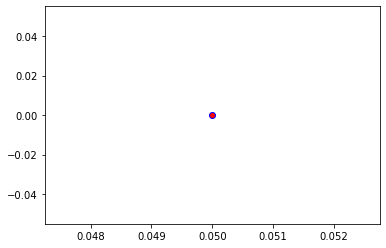

Crafting adversarial images took: 7.915803909301758 seconds 

Images classified as:
000000560266 294 = brown bear
000000560279 861 = toilet seat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


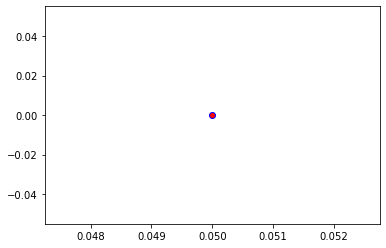

Crafting adversarial images took: 8.14707636833191 seconds 

Images classified as:
000000560312 789 = shoji
000000560371 919 = street sign
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


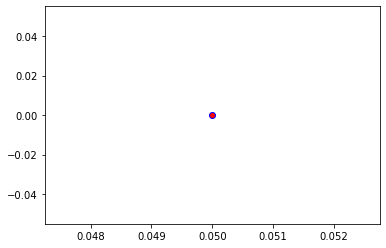

Crafting adversarial images took: 8.623353481292725 seconds 

Images classified as:
000000560474 582 = grocery store
000000560880 37 = ox
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


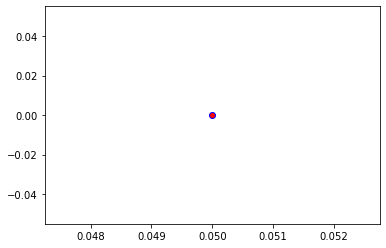

Crafting adversarial images took: 8.05604887008667 seconds 

Images classified as:
000000560911 697 = pajama
000000561009 91 = coucal
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


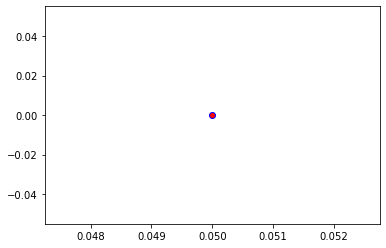

Crafting adversarial images took: 8.292717456817627 seconds 

Images classified as:
000000561223 842 = swimming trunks
000000561256 411 = apron
Min values in image-array: 1.5918878 Max values in image-array: 255.0
Min values in image-array: 0.0062426976 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


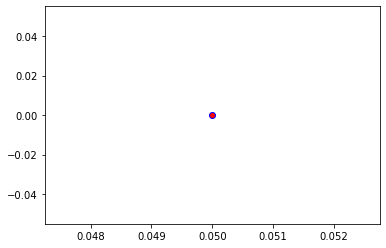

Crafting adversarial images took: 8.103520154953003 seconds 

Images classified as:
000000561335 472 = canoe
000000561366 673 = mouse
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


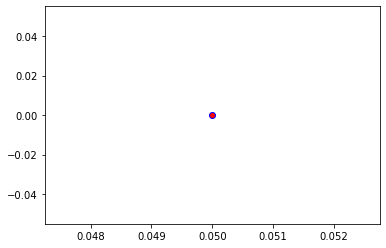

Crafting adversarial images took: 8.485746383666992 seconds 

Images classified as:
000000561465 962 = meat loaf
000000561679 919 = street sign
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


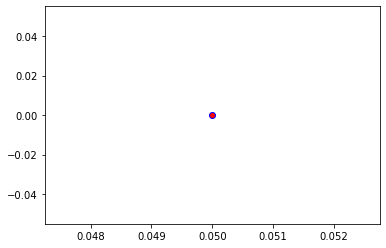

Crafting adversarial images took: 8.160402297973633 seconds 

Images classified as:
000000561889 935 = mashed potato
000000561958 248 = ski
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


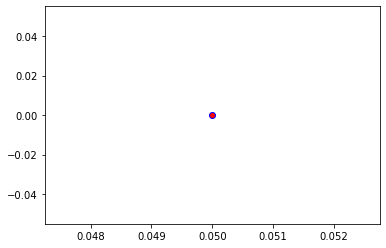

Crafting adversarial images took: 8.1980459690094 seconds 

Images classified as:
000000562059 930 = French loaf
000000562121 340 = zebra
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


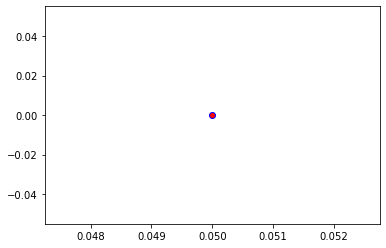

Crafting adversarial images took: 8.180175542831421 seconds 

Images classified as:
000000562197 924 = guacamole
000000562207 101 = tusker
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


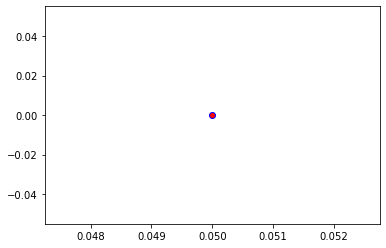

Crafting adversarial images took: 8.269972562789917 seconds 

Images classified as:
000000562229 792 = shovel
000000562243 906 = Windsor tie
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


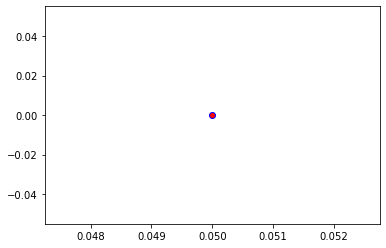

Crafting adversarial images took: 8.140853643417358 seconds 

Images classified as:
000000562443 340 = zebra
000000562448 874 = trolleybus
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


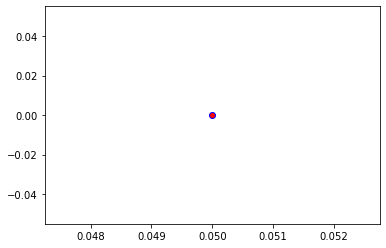

Crafting adversarial images took: 8.167903184890747 seconds 

Images classified as:
000000562561 151 = Chihuahua
000000562581 421 = bannister
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


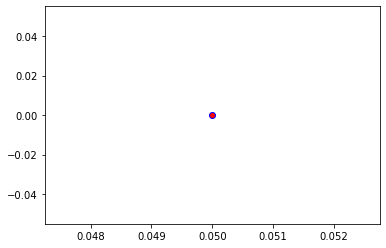

Crafting adversarial images took: 8.124843835830688 seconds 

Images classified as:
000000562818 140 = alp
000000562843 504 = coffee mug
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


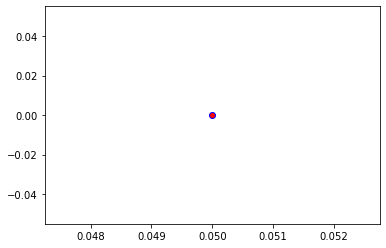

Crafting adversarial images took: 8.111992120742798 seconds 

Images classified as:
000000563267 788 = shoe shop
000000563281 870 = tricycle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


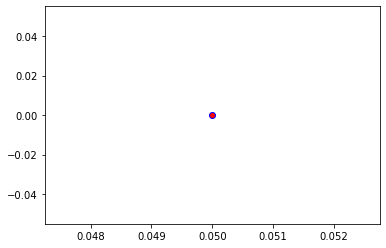

Crafting adversarial images took: 8.226617813110352 seconds 

Images classified as:
000000563349 701 = parachute
000000563470 702 = parallel bars
Min values in image-array: 0.0 Max values in image-array: 254.63281
Min values in image-array: 0.0 Max values in image-array: 0.9985601
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


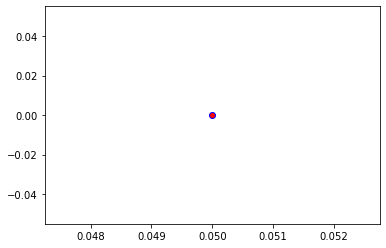

Crafting adversarial images took: 8.6714928150177 seconds 

Images classified as:
000000563603 176 = gazelle
000000563604 561 = forklift
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


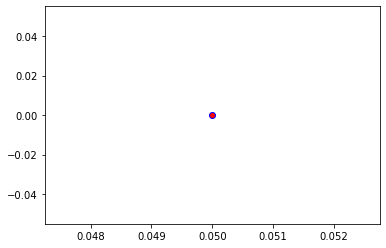

Crafting adversarial images took: 7.996938705444336 seconds 

Images classified as:
000000563648 882 = vacuum
000000563653 920 = traffic light
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


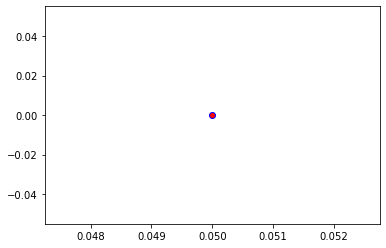

Crafting adversarial images took: 8.07549262046814 seconds 

Images classified as:
000000563702 555 = fire engine
000000563758 850 = teddy
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


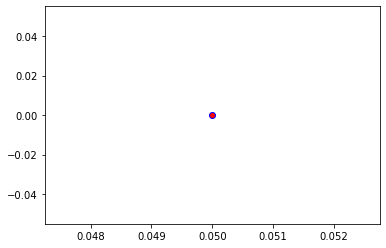

Crafting adversarial images took: 8.103793144226074 seconds 

Images classified as:
000000563882 424 = barbershop
000000564023 861 = toilet seat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


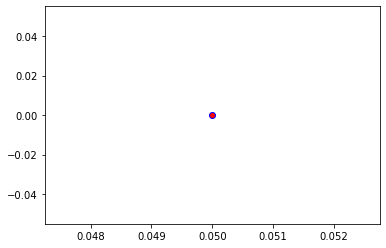

Crafting adversarial images took: 8.0669264793396 seconds 

Images classified as:
000000564091 611 = jigsaw puzzle
000000564127 861 = toilet seat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


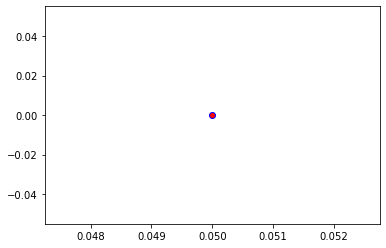

Crafting adversarial images took: 8.084111452102661 seconds 

Images classified as:
000000564133 101 = tusker
000000564280 246 = Great Dane
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


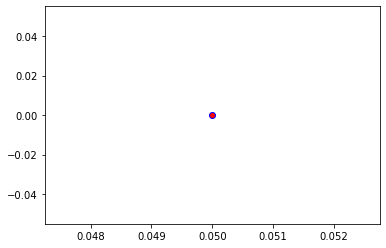

Crafting adversarial images took: 8.439472436904907 seconds 

Images classified as:
000000564336 762 = restaurant
000000565012 829 = streetcar
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


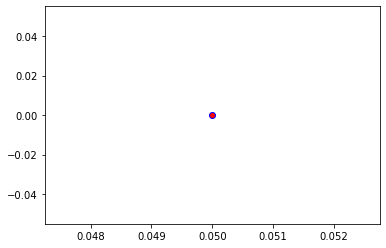

Crafting adversarial images took: 8.156124591827393 seconds 

Images classified as:
000000565045 894 = wardrobe
000000565153 637 = mailbox
Min values in image-array: 1.2225541 Max values in image-array: 255.0
Min values in image-array: 0.00479433 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


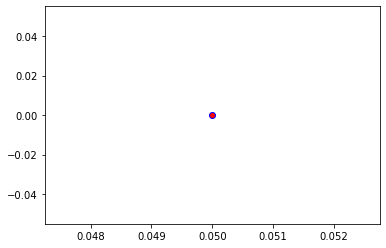

Crafting adversarial images took: 8.108707904815674 seconds 

Images classified as:
000000565391 609 = jeep
000000565469 442 = bell cote
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


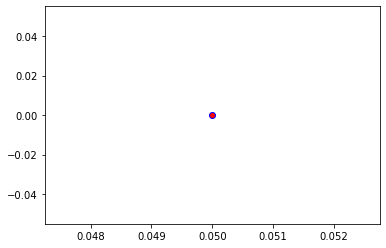

Crafting adversarial images took: 8.148797512054443 seconds 

Images classified as:
000000565563 704 = parking meter
000000565597 963 = pizza
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


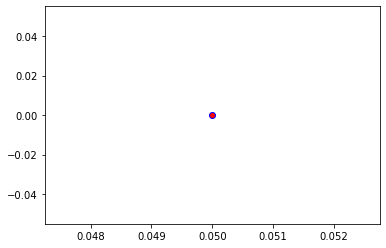

Crafting adversarial images took: 8.15388822555542 seconds 

Images classified as:
000000565607 984 = rapeseed
000000565624 385 = Indian elephant
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


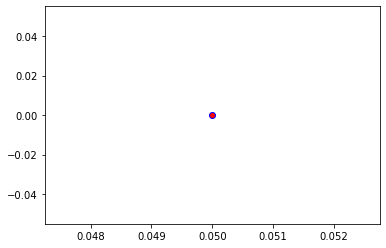

Crafting adversarial images took: 8.340436935424805 seconds 

Images classified as:
000000565776 729 = plate rack
000000565778 705 = passenger car
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


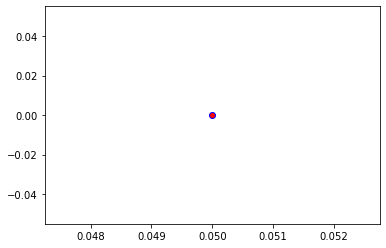

Crafting adversarial images took: 8.080081224441528 seconds 

Images classified as:
000000565853 598 = home theater
000000565877 681 = notebook
Min values in image-array: 0.0 Max values in image-array: 254.97404
Min values in image-array: 0.0 Max values in image-array: 0.9998982
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


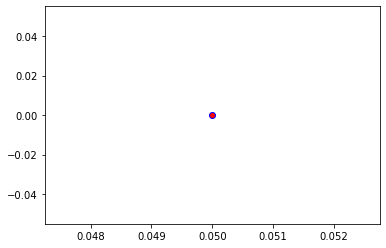

Crafting adversarial images took: 8.293612241744995 seconds 

Images classified as:
000000565962 223 = schipperke
000000565989 442 = bell cote
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


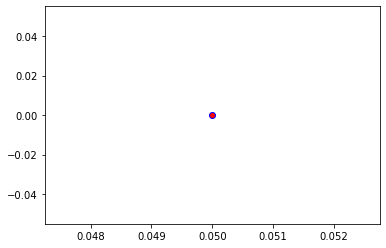

Crafting adversarial images took: 8.508508682250977 seconds 

Images classified as:
000000566042 275 = hyena
000000566282 652 = military uniform
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


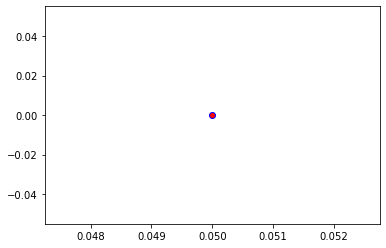

Crafting adversarial images took: 7.92969536781311 seconds 

Images classified as:
000000566436 703 = park bench
000000566524 705 = passenger car
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


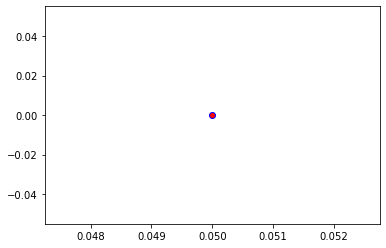

Crafting adversarial images took: 7.939759731292725 seconds 

Images classified as:
000000566758 779 = school bus
000000566923 394 = sturgeon
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


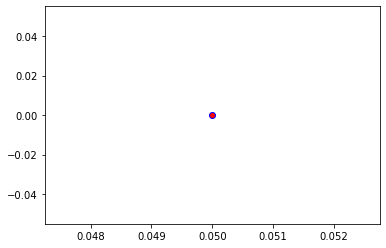

Crafting adversarial images took: 8.13211178779602 seconds 

Images classified as:
000000567011 693 = paddle
000000567197 498 = cinema
Min values in image-array: 0.0 Max values in image-array: 254.96268
Min values in image-array: 0.0 Max values in image-array: 0.9998536
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


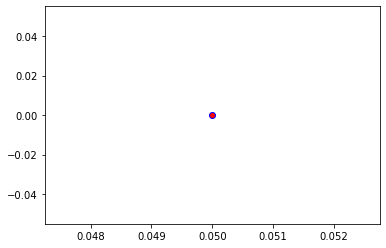

Crafting adversarial images took: 8.113738298416138 seconds 

Images classified as:
000000567432 404 = airliner
000000567640 805 = soccer ball
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


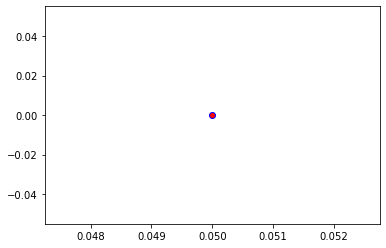

Crafting adversarial images took: 8.166524171829224 seconds 

Images classified as:
000000567740 248 = ski
000000567825 961 = dough
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


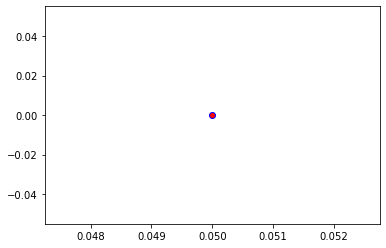

Crafting adversarial images took: 8.069859504699707 seconds 

Images classified as:
000000567886 203 = West Highland white terrier
000000567898 712 = Petri dish
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


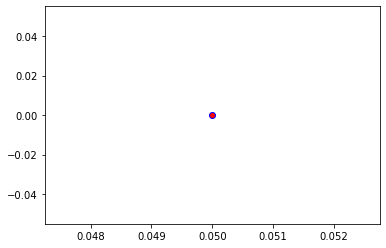

Crafting adversarial images took: 8.173663854598999 seconds 

Images classified as:
000000568147 704 = parking meter
000000568195 659 = mixing bowl
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


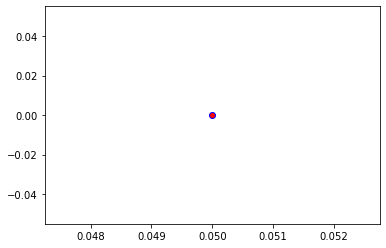

Crafting adversarial images took: 8.376444578170776 seconds 

Images classified as:
000000568213 805 = soccer ball
000000568290 874 = trolleybus
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


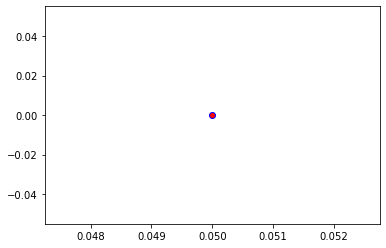

Crafting adversarial images took: 8.164396047592163 seconds 

Images classified as:
000000568439 874 = trolleybus
000000568584 564 = four-poster
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


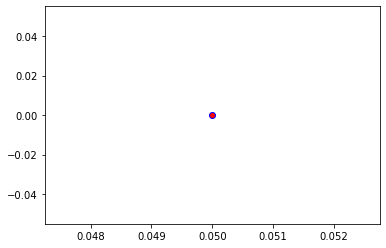

Crafting adversarial images took: 8.12635326385498 seconds 

Images classified as:
000000568690 861 = toilet seat
000000568710 556 = fire screen
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


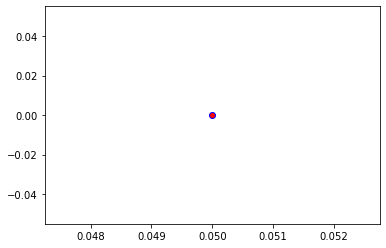

Crafting adversarial images took: 8.136391878128052 seconds 

Images classified as:
000000568814 465 = bulletproof vest
000000568981 460 = breakwater
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


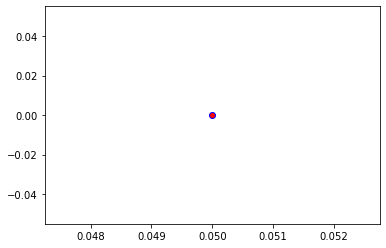

Crafting adversarial images took: 8.144416570663452 seconds 

Images classified as:
000000569030 703 = park bench
000000569059 526 = desk
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


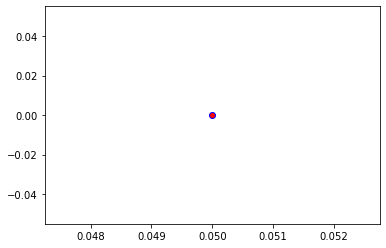

Crafting adversarial images took: 8.411072492599487 seconds 

Images classified as:
000000569273 437 = beacon
000000569565 134 = crane
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


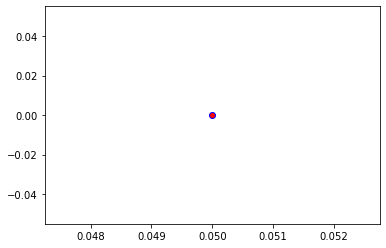

Crafting adversarial images took: 8.743530035018921 seconds 

Images classified as:
000000569700 883 = vase
000000569825 981 = ballplayer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


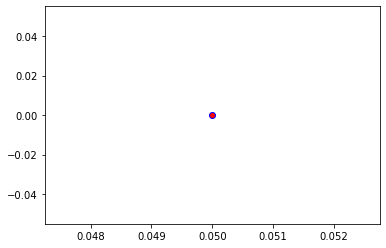

Crafting adversarial images took: 7.946409463882446 seconds 

Images classified as:
000000569917 896 = washbasin
000000569972 693 = paddle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


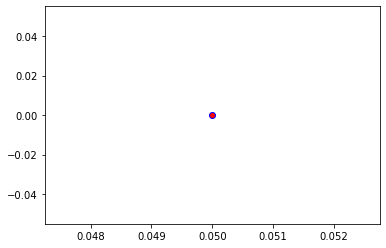

Crafting adversarial images took: 7.967658758163452 seconds 

Images classified as:
000000569976 642 = marimba
000000570169 850 = teddy
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


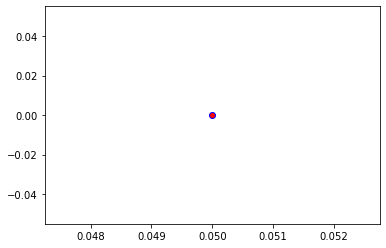

Crafting adversarial images took: 7.960247755050659 seconds 

Images classified as:
000000570448 978 = seashore
000000570456 532 = dining table
Min values in image-array: 0.08609904 Max values in image-array: 255.0
Min values in image-array: 0.00033764332 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


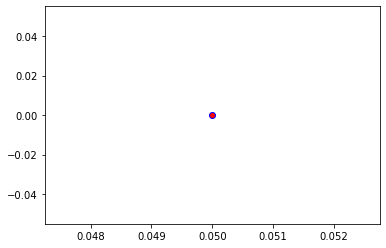

Crafting adversarial images took: 7.947319984436035 seconds 

Images classified as:
000000570471 961 = dough
000000570539 829 = streetcar
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


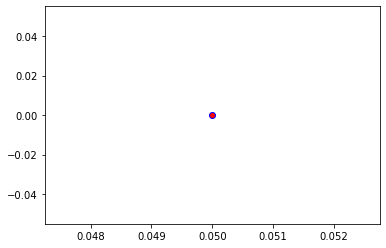

Crafting adversarial images took: 8.245405435562134 seconds 

Images classified as:
000000570664 282 = tiger cat
000000570688 890 = volleyball
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


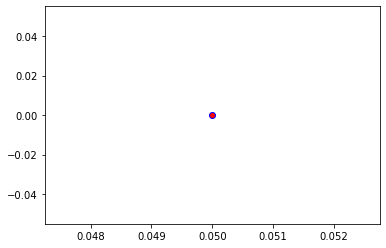

Crafting adversarial images took: 8.124552726745605 seconds 

Images classified as:
000000570736 435 = bathtub
000000570756 978 = seashore
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


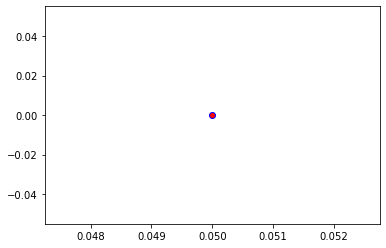

Crafting adversarial images took: 8.11677861213684 seconds 

Images classified as:
000000570782 526 = desk
000000570834 612 = jinrikisha
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


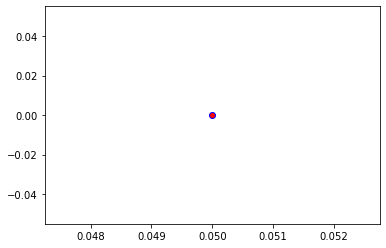

Crafting adversarial images took: 8.15342378616333 seconds 

Images classified as:
000000571008 919 = street sign
000000571264 870 = tricycle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


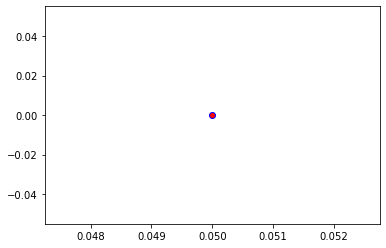

Crafting adversarial images took: 9.56545352935791 seconds 

Images classified as:
000000571313 526 = desk
000000571598 639 = suit
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


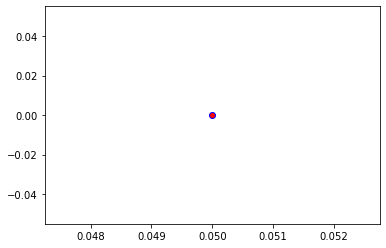

Crafting adversarial images took: 11.429715633392334 seconds 

Images classified as:
000000571718 954 = banana
000000571804 659 = mixing bowl
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


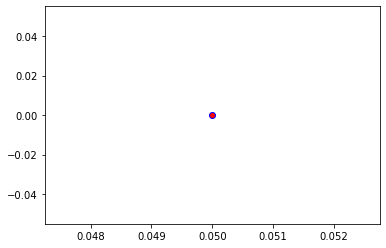

Crafting adversarial images took: 10.167177200317383 seconds 

Images classified as:
000000571857 977 = sandbar
000000571893 453 = bookcase
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


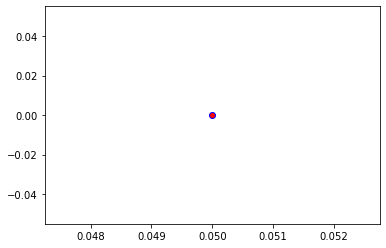

Crafting adversarial images took: 8.791035413742065 seconds 

Images classified as:
000000571943 920 = traffic light
000000572303 565 = freight car
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


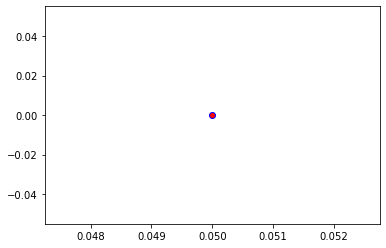

Crafting adversarial images took: 8.984456777572632 seconds 

Images classified as:
000000572388 223 = schipperke
000000572408 226 = briard
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


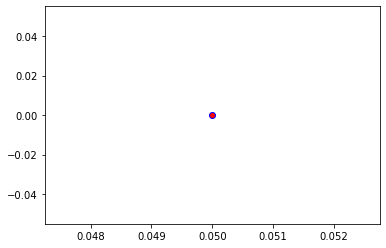

Crafting adversarial images took: 8.167947053909302 seconds 

Images classified as:
000000572462 654 = minibus
000000572517 296 = ice bear
Min values in image-array: 0.07016649 Max values in image-array: 255.0
Min values in image-array: 0.00027516272 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


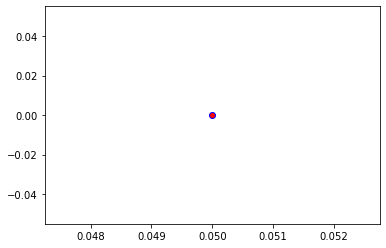

Crafting adversarial images took: 7.978445768356323 seconds 

Images classified as:
000000572555 547 = electric locomotive
000000572620 880 = unicycle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


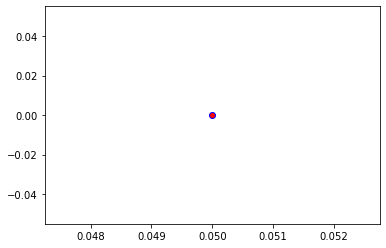

Crafting adversarial images took: 8.126284122467041 seconds 

Images classified as:
000000572678 532 = dining table
000000572900 523 = crutch
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


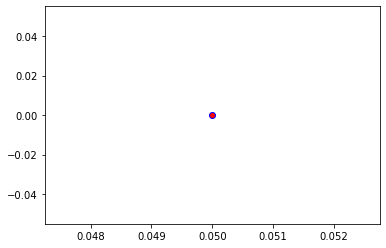

Crafting adversarial images took: 8.022144794464111 seconds 

Images classified as:
000000572956 670 = motor scooter
000000573008 554 = fireboat
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


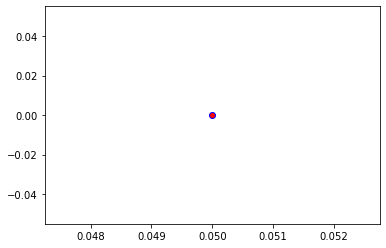

Crafting adversarial images took: 8.023576498031616 seconds 

Images classified as:
000000573094 548 = entertainment center
000000573258 248 = ski
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


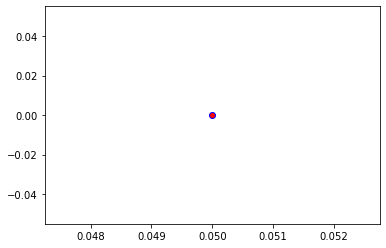

Crafting adversarial images took: 8.056344032287598 seconds 

Images classified as:
000000573391 342 = wild boar
000000573626 979 = valley
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


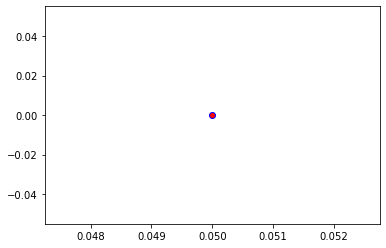

Crafting adversarial images took: 8.723246812820435 seconds 

Images classified as:
000000573943 417 = balloon
000000574297 339 = sorrel
Min values in image-array: 0.23324394 Max values in image-array: 255.0
Min values in image-array: 0.0009146821 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


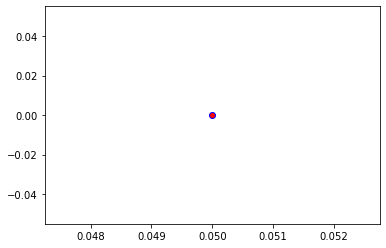

Crafting adversarial images took: 8.22962760925293 seconds 

Images classified as:
000000574315 681 = notebook
000000574425 654 = minibus
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


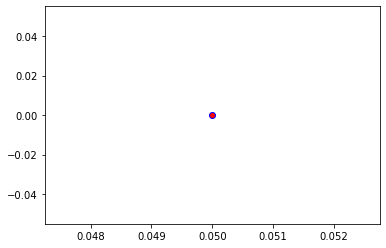

Crafting adversarial images took: 8.116454601287842 seconds 

Images classified as:
000000574520 693 = paddle
000000574702 665 = moped
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


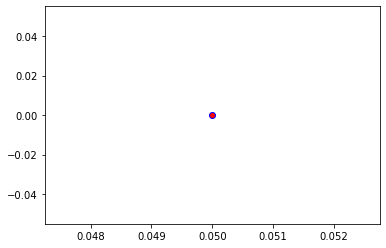

Crafting adversarial images took: 8.171500444412231 seconds 

Images classified as:
000000574810 283 = Persian cat
000000574823 981 = ballplayer
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


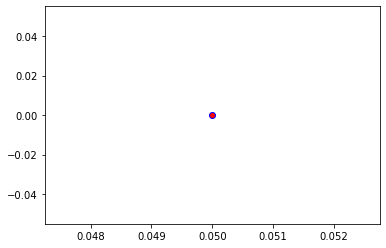

Crafting adversarial images took: 8.702006578445435 seconds 

Images classified as:
000000575081 697 = pajama
000000575187 904 = window screen
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


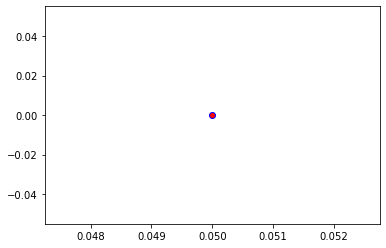

Crafting adversarial images took: 8.086522102355957 seconds 

Images classified as:
000000575205 318 = wing
000000575243 879 = umbrella
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


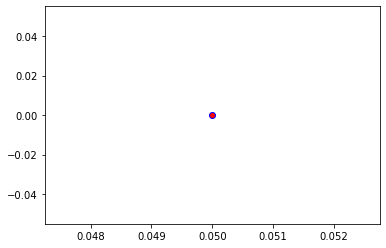

Crafting adversarial images took: 8.571808576583862 seconds 

Images classified as:
000000575357 213 = Irish setter
000000575372 920 = traffic light
Min values in image-array: 0.0 Max values in image-array: 254.37718
Min values in image-array: 0.0 Max values in image-array: 0.9975576
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


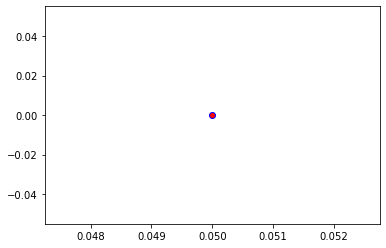

Crafting adversarial images took: 8.6457359790802 seconds 

Images classified as:
000000575500 954 = banana
000000575815 963 = pizza
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


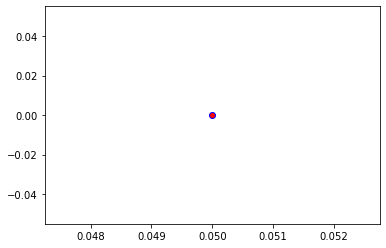

Crafting adversarial images took: 8.109691143035889 seconds 

Images classified as:
000000575970 532 = dining table
000000576031 248 = ski
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


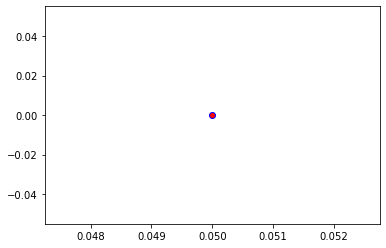

Crafting adversarial images took: 8.670925617218018 seconds 

Images classified as:
000000576052 140 = alp
000000576566 880 = unicycle
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


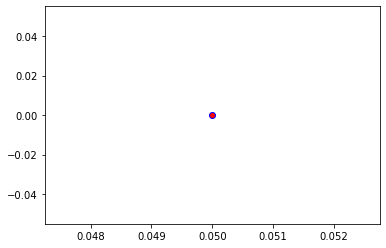

Crafting adversarial images took: 7.99694561958313 seconds 

Images classified as:
000000576654 701 = parachute
000000576955 562 = fountain
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


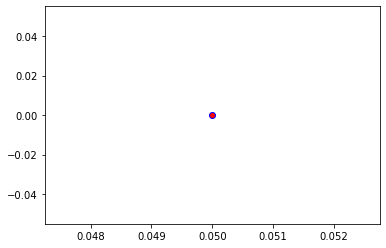

Crafting adversarial images took: 7.965130567550659 seconds 

Images classified as:
000000577149 340 = zebra
000000577182 703 = park bench
Min values in image-array: 0.0 Max values in image-array: 254.74554
Min values in image-array: 0.0 Max values in image-array: 0.99900216
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


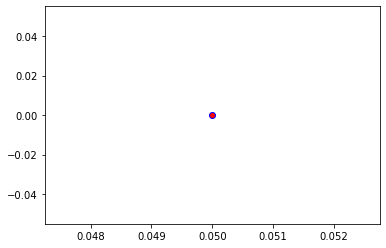

Crafting adversarial images took: 8.142594814300537 seconds 

Images classified as:
000000577539 928 = ice cream
000000577584 896 = washbasin
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


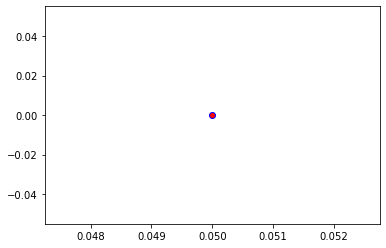

Crafting adversarial images took: 7.996866941452026 seconds 

Images classified as:
000000577735 28 = pot
000000577862 172 = whippet
Min values in image-array: 0.0 Max values in image-array: 254.71436
Min values in image-array: 0.0 Max values in image-array: 0.99887985
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


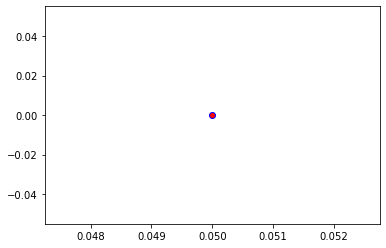

Crafting adversarial images took: 7.9648096561431885 seconds 

Images classified as:
000000577864 429 = baseball
000000577932 829 = streetcar
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


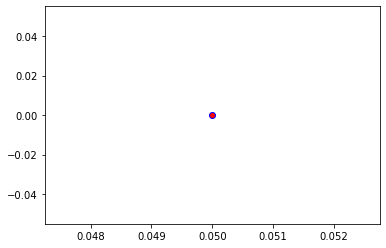

Crafting adversarial images took: 8.11072587966919 seconds 

Images classified as:
000000577959 977 = sandbar
000000577976 874 = trolleybus
Min values in image-array: 0.0 Max values in image-array: 253.17407
Min values in image-array: 0.0 Max values in image-array: 0.9928395
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


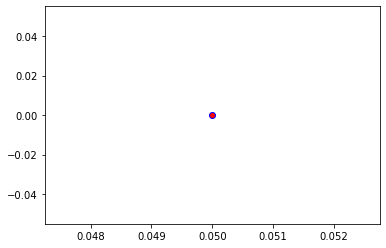

Crafting adversarial images took: 8.149960994720459 seconds 

Images classified as:
000000578093 705 = passenger car
000000578236 39 = common iguana
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


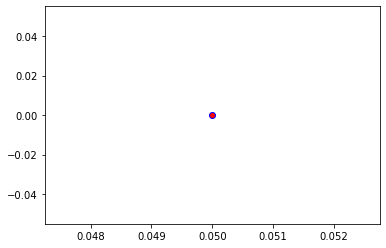

Crafting adversarial images took: 8.298970460891724 seconds 

Images classified as:
000000578489 552 = feather boa
000000578500 831 = studio couch
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


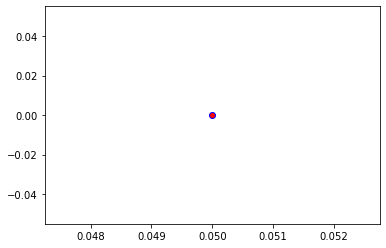

Crafting adversarial images took: 8.24852967262268 seconds 

Images classified as:
000000578545 620 = laptop
000000578792 518 = crash helmet
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


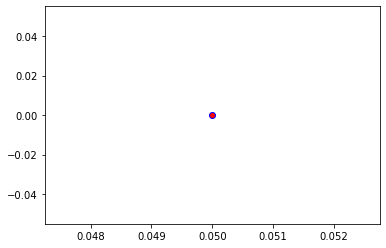

Crafting adversarial images took: 8.365125179290771 seconds 

Images classified as:
000000578871 461 = plate
000000578922 883 = vase
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


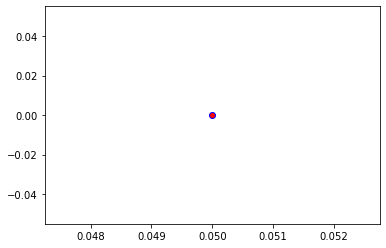

Crafting adversarial images took: 8.669886350631714 seconds 

Images classified as:
000000578967 705 = passenger car
000000579070 700 = paper towel
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


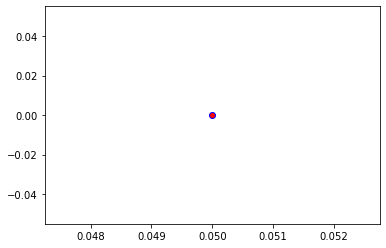

Crafting adversarial images took: 8.451131820678711 seconds 

Images classified as:
000000579091 937 = broccoli
000000579158 404 = airliner
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


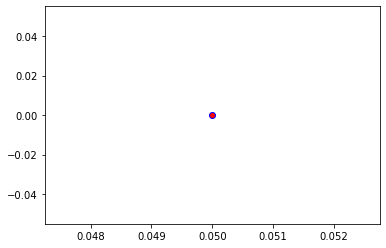

Crafting adversarial images took: 8.071967601776123 seconds 

Images classified as:
000000579307 977 = sandbar
000000579321 201 = silky terrier
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


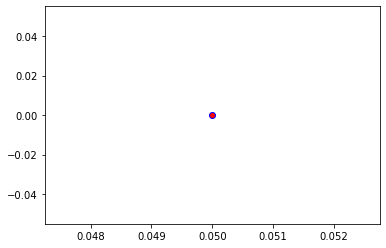

Crafting adversarial images took: 8.267892122268677 seconds 

Images classified as:
000000579635 460 = breakwater
000000579655 903 = wig
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


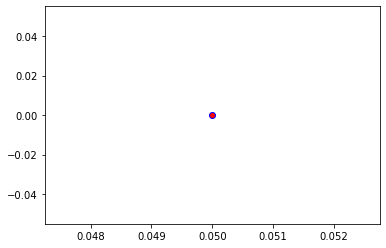

Crafting adversarial images took: 8.152360200881958 seconds 

Images classified as:
000000579818 565 = freight car
000000579893 919 = street sign
Min values in image-array: 0.0 Max values in image-array: 254.6125
Min values in image-array: 0.0 Max values in image-array: 0.9984804
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


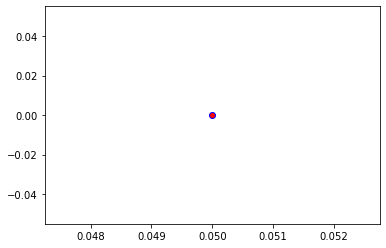

Crafting adversarial images took: 8.16348671913147 seconds 

Images classified as:
000000579900 963 = pizza
000000579902 518 = crash helmet
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


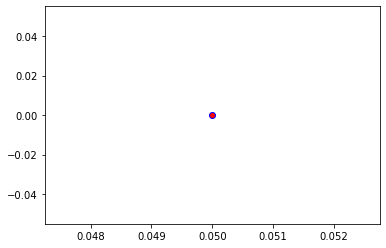

Crafting adversarial images took: 7.888635158538818 seconds 

Images classified as:
000000579970 789 = shoji
000000580197 457 = bow tie
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


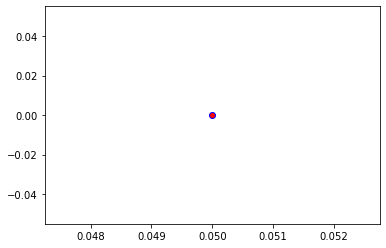

Crafting adversarial images took: 7.962343692779541 seconds 

Images classified as:
000000580294 813 = spatula
000000580410 453 = bookcase
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


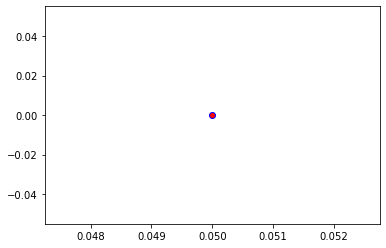

Crafting adversarial images took: 8.067309856414795 seconds 

Images classified as:
000000580418 690 = oxcart
000000580757 614 = kimono
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


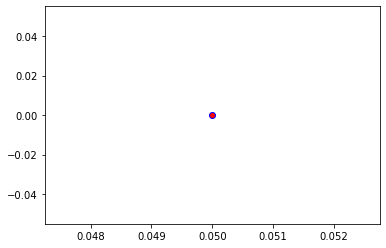

Crafting adversarial images took: 7.9817116260528564 seconds 

Images classified as:
000000581062 977 = sandbar
000000581100 354 = Arabian camel
Min values in image-array: 2.431601 Max values in image-array: 255.0
Min values in image-array: 0.009535691 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


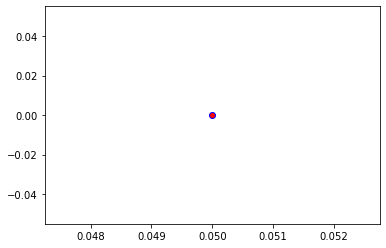

Crafting adversarial images took: 8.051186561584473 seconds 

Images classified as:
000000581206 934 = hotdog
000000581317 838 = sunscreen
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


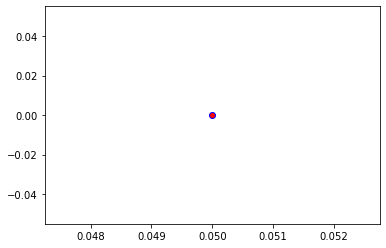

Crafting adversarial images took: 8.050454378128052 seconds 

Images classified as:
000000581357 248 = ski
000000581482 409 = analog clock
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 0.5
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


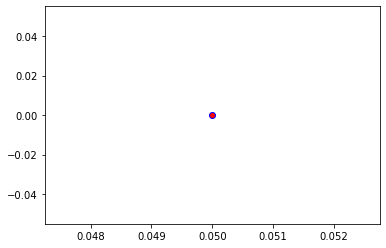

Crafting adversarial images took: 8.08202600479126 seconds 

Images classified as:
000000581615 861 = toilet seat
000000581781 954 = banana
Min values in image-array: 0.0 Max values in image-array: 255.0
Min values in image-array: 0.0 Max values in image-array: 1.0
Model accuracy on own images: 1.0
LinfProjectedGradientDescentAttack(rel_stepsize=0.03333333333333333, abs_stepsize=None, steps=40, random_start=True)
TensorFlowTensor(<tf.Tensor: shape=(1,), dtype=float32, numpy=array([1.], dtype=float32)>)


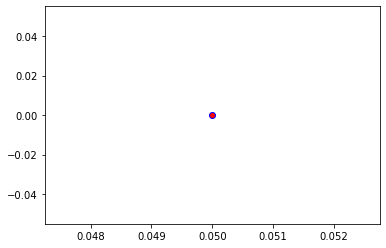

Crafting adversarial images took: 8.285682916641235 seconds 



In [26]:
# SET SIZE OF PATCH, ATTACK TYPE AND OUTPUT FOLDER OF ADVERSARIAL EXAMPLES

# divide files into successive n-sized chunks.
def divide_chunks(l, n):
    # looping till length l
    for i in range(0, len(l), n): 
        yield l[i:i + n]

# LOAD ORIGINAL IMAGES INTO BATCHES
list_images = glob.glob('datasets/coco_original/data/*.jpg')
# size of batches that are created from list of images
N = 2
batches = list(divide_chunks(list_images, N))

OUTPUT_FOLDER = "efficientnet_pgd"

# PROCESS IMAGES TO CORRECT FORMAT FOR CRAFTING ADVERSARIAL EXAMPLES WITH FOOLBOX
for batch in batches:
    own_images = [] #preprocessed images
    image_probabilities = []
    image_ids = []
    original_name = []

    for fname in batch:
        image_name = fname.split('data\\')[1]
        original_name.append(image_name.split('.jpg')[0])
        image_raw = tf.io.read_file(fname)
        image = tf.image.decode_image(image_raw)
        image = preprocess(image)
        own_images.append(image)
        image_probs = pretrained_model.predict(image)
        image_probabilities.append(image_probs)
# CHECK IF FILE ALREADY EXISTS THEN SKIP TO NEXT IMAGE
    if path.exists('datasets/{}/data/{}'.format(OUTPUT_FOLDER, image_name)):
        print('Adversarial file exists')
        continue
    print('Images classified as:')
    for x, y, name in zip(own_images, image_probabilities, original_name):
        _, image_class, class_confidence = get_imagenet_label(y)
        image_class = image_class.replace("_", " ")
        print(name, str(find_label_id(image_class)) + ' = ' + image_class) # if none error incurs later
        image_ids.append(find_label_id(image_class))

# PRINT VALUE OF PIXELS FOR CHECKING
    print('Min values in image-array: ' + str(np.amin(own_images)) + ' Max values in image-array: ' + str(np.amax(own_images)))
# CONVERT IMAGES AND CORRESPONDING LABELS FOR FOOLBOX APPROVED TYPE
    own_images_tf = []
    own_labels_tf = tf.convert_to_tensor(image_ids, dtype=tf.int32)
    for x in own_images.copy():
        a = tf.squeeze(x)
        a = a/255 # shift pixel values from [0,255] to [0,1] in order to create adversarial example
        own_images_tf.append(a)
    own_images_tf = tf.convert_to_tensor(own_images_tf, dtype=tf.float32)
# Prints values of pixels after processing
    print('Min values in image-array: ' + str(np.amin(own_images_tf)) + ' Max values in image-array: ' + str(np.amax(own_images_tf)))
# Testing that conversion works
    accuracy = fb.utils.accuracy(fmodel, own_images_tf, own_labels_tf)
    print('Model accuracy on own images:', accuracy)


    # INSTANTIATE THE CORRESPONDING ATTACK CLASS
    def attack_type(attack):
        if attack == 'LinfPGD':
            return fb.attacks.LinfProjectedGradientDescentAttack()
        elif attack == 'FGSM':
            return fb.attacks.LinfFastGradientAttack()
        elif attack == 'DeepFool':
            return fb.attacks.L2DeepFoolAttack()
        else:
            print('Select valid attack')

    epsilons = [0.05]
    attacks = ['LinfPGD', 'FGSM', 'DeepFool']
    attack = attack_type(attacks[0])
    print(attack)
    start = time.time()
    # use eagerpy tensors for own images
    images = ep.astensor(own_images_tf)
    labels = ep.astensor(own_labels_tf)
    
    # all are tensors
    # raw = The raw adversarial examples. --> depends on attack
    # clipped = The clipped adversarial examples --> guaranteed to not be perturbed more than epsilon.
    # is_adv = boolean for each sample image. True if misclassified and within the epsilon balls around the clean sample.
    raw, clipped, is_adv = attack(fmodel, images, labels, epsilons=epsilons)
    print(is_adv.float32().mean(axis=-1))
    robust_accuracy = 1 - is_adv.float32().mean(axis=-1)
    # show accuracy vs epsilons
    plt.plot(epsilons, robust_accuracy.numpy(), color='blue', linestyle='solid', marker='o', markerfacecolor='red')
    plt.show()
    plt.close()
    end = time.time()
    print("Crafting adversarial images took:", end - start, "seconds", '\n')


    # Creates figure object containing image, class and class confidence
    class MyFigure:
        def __init__(self, image , image_class, class_confidence):
            self.image = image
            self.image_class = image_class
            self.class_confidence = class_confidence

    # Save images
    def save_images(images):
        for x in range(0, len(images)):
            _, image_class, class_confidence = get_imagenet_label(image_probs)
            name = original_name[x]
            try:
                plt.imsave('datasets/{}/data/{}.jpg'.format(OUTPUT_FOLDER, original_name[x]), images[x].image)
            except:
                print('ERROR while saving')

    for perturbed_step, epsilon in zip(clipped, epsilons):
        list_of_figures = []

        for x in perturbed_step:
            x = x.numpy()
            image = np.expand_dims(x, axis=0)
            image_probs = pretrained_model.predict(image)
            _, image_class, class_confidence = get_imagenet_label(image_probs)       

            #create fig object
            a = MyFigure(x, image_class, class_confidence)
            list_of_figures.append(a)

        save_images(list_of_figures)

Epsilon value of adversary: 0.05


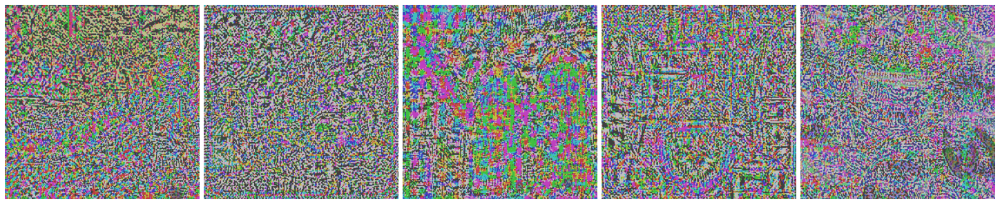

In [10]:
# show adversary
for adversary, epsilon in zip(clipped, epsilons):
    print('Epsilon value of adversary:', str(epsilon))
    fb.plot.images(adversary - images, bounds=(-0.1, 0.1), scale=4.)
    plt.show()
    plt.close()

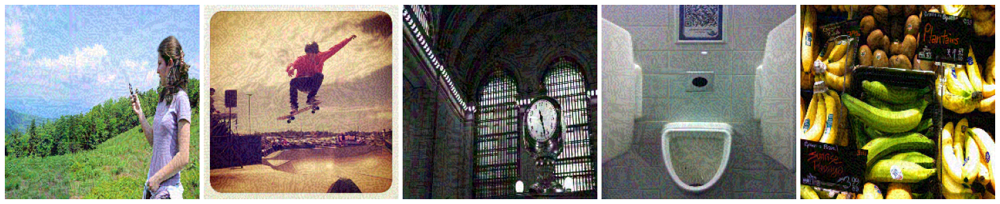

In [11]:
# show adversarial images using fb.plot
for adversary in clipped:
    fb.plot.images(adversary, scale=4.)
    plt.show()
    plt.close()

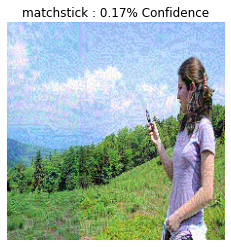

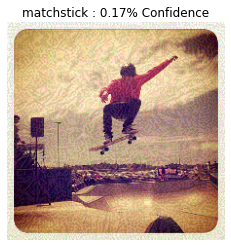

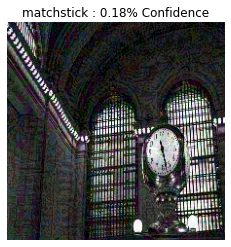

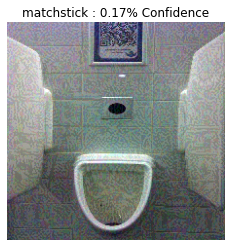

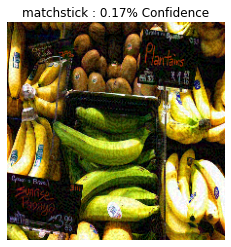

In [12]:
# helper variables for visualizing only one image
row_number = 0 # 0-len(epsilon)

raw_adversarial_images = raw[row_number].numpy()
clipped_adversarial_images = clipped[row_number].numpy()

# Predict adversarial image and show visualization
for x in clipped_adversarial_images:
    image = np.expand_dims(x, axis=0)
    image_probs = pretrained_model.predict(image)
    plt.figure()
    plt.imshow(x)  # To change [-1, 1] to [0,1] #  * 0.5 + 0.2
    _, image_class, class_confidence = get_imagenet_label(image_probs)
    plt.title('{} : {:.2f}% Confidence'.format(image_class, class_confidence*100))
    plt.axis('off')
    plt.show()